In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [2]:
#reading Flights Delay.csv data
ds = pd.read_csv('Flight Delays Data.csv')

In [3]:
#reading Airport Codes Dataset.csv file
ds_air = pd.read_csv('Airport Codes Dataset.csv')

In [4]:
#merging ds and ds_air with outer join based on OriginAirportID column from ds and airport_id from ds_air
df = pd.merge(ds, ds_air, how='outer', left_on='OriginAirportID', right_on='airport_id')

In [5]:
df.shape

(2719713, 18)

In [6]:
#merging df and ds_air with inner join based on DestAirportID column from df and airport_id from ds_air
data = pd.merge(df, ds_air, how='inner', left_on='DestAirportID', right_on='airport_id')

In [7]:
data.shape

(2719418, 22)

In [8]:
#checking the the last five column calues of data 
data.iloc(0)[-5:]

,Year,Month,DayofMonth,DayOfWeek,Carrier,OriginAirportID,DestAirportID,CRSDepTime,DepDelay,DepDel15,...,ArrDel15,Cancelled,airport_id_x,city_x,state_x,name_x,airport_id_y,city_y,state_y,name_y
2719413,2013.0,10.0,26.0,6.0,B6,10529.0,14843,1241.0,4.0,0.0,...,0.0,0.0,10529,Hartford,CT,Bradley International,14843,San Juan,PR,Luis Munoz Marin International
2719414,2013.0,10.0,30.0,3.0,B6,10529.0,14843,1413.0,-8.0,0.0,...,0.0,0.0,10529,Hartford,CT,Bradley International,14843,San Juan,PR,Luis Munoz Marin International
2719415,2013.0,10.0,29.0,2.0,B6,10529.0,14843,1413.0,-6.0,0.0,...,0.0,0.0,10529,Hartford,CT,Bradley International,14843,San Juan,PR,Luis Munoz Marin International
2719416,2013.0,10.0,3.0,4.0,B6,10529.0,14843,1241.0,1.0,0.0,...,0.0,0.0,10529,Hartford,CT,Bradley International,14843,San Juan,PR,Luis Munoz Marin International
2719417,2013.0,10.0,31.0,4.0,B6,10529.0,14843,1413.0,-4.0,0.0,...,0.0,0.0,10529,Hartford,CT,Bradley International,14843,San Juan,PR,Luis Munoz Marin International


In [9]:
#dropping dupicate values in data
data.drop_duplicates(subset=['Year', 'Month', 'DayofMonth', 'Carrier', 'OriginAirportID', 'DestAirportID', 'CRSDepTime', 'CRSArrTime'], inplace = True)

In [10]:
data.shape

(2719397, 22)

In [11]:
#removing rows with null values
df = data[~pd.isnull(data).any(axis=1)]

In [12]:
df.shape

(2690367, 22)

In [13]:
def describe(df, col): 
    ## Compute the summary stats 
    desc = df[col].describe() 
     
    ## Change the name of the 50% index to median 
    idx = desc.index.tolist() 
    idx[5] = 'median' 
    desc.index = idx 
    return desc 

In [14]:
#statistical data about ArrDelay 
describe(df, 'ArrDelay')

count     2.690367e+06
mean      6.637783e+00
std       3.864891e+01
min      -9.400000e+01
25%      -1.100000e+01
median   -3.000000e+00
75%       1.000000e+01
max       1.845000e+03
Name: ArrDelay, dtype: float64

In [32]:
def plotstats(df, col):
    import matplotlib.pyplot as plt
    ## Setup for ploting two charts one over the other
    fig, ax = plt.subplots(2, 1, figsize = (12,8))
    
    ## First a box plot
    df.dropna().boxplot(col, ax = ax[0], vert=False,
                        return_type='dict')
    ## Plot the histogram   
    temp = df[col].as_matrix()
    ax[1].hist(temp, bins = 30, alpha = 0.7)
    plt.xlabel(col)
    return [col]

['ArrDelay']

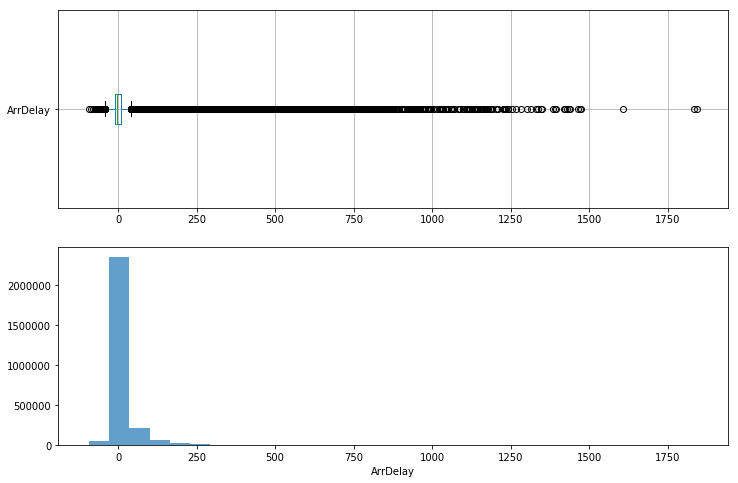

In [33]:
%matplotlib inline 
plotstats(df, 'ArrDelay') 

'ArrDel15'

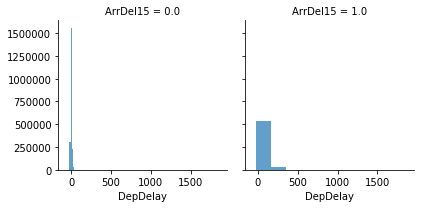

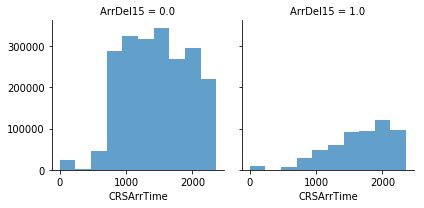

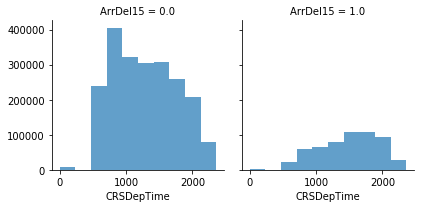

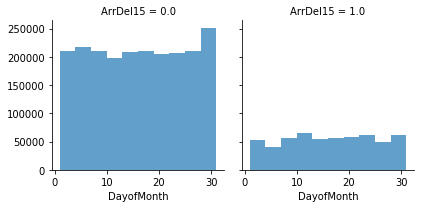

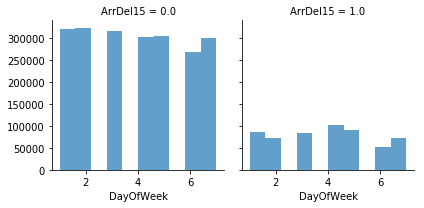

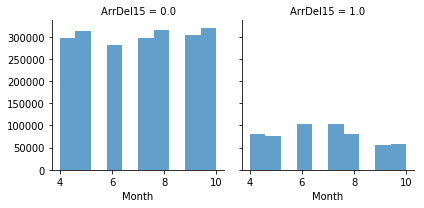

In [70]:
## Function to plot conditioned histograms
def cond_hists(df, plot_cols, grid_col):
    import matplotlib.pyplot as plt
    import seaborn as sns
    ## Loop over the list of columns
    for col in plot_cols:
        grid1 = sns.FacetGrid(df, col=grid_col)
        grid1.map(plt.hist, col, alpha=.7)
    return grid_col

## Define columns for making a conditioned histogram
plot_cols2 = ["DepDelay",
               "CRSArrTime",
               "CRSDepTime",
               "DayofMonth",
               "DayOfWeek",
                "Month"]

cond_hists(df, plot_cols2, 'ArrDel15')

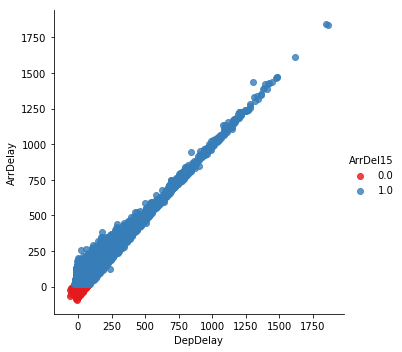

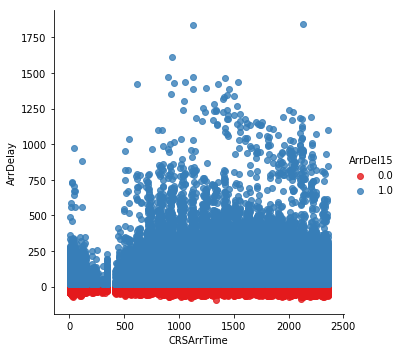

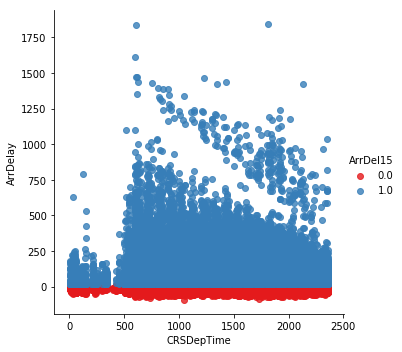

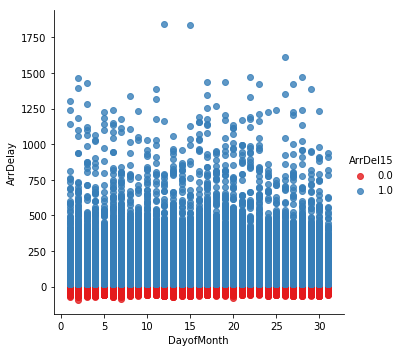

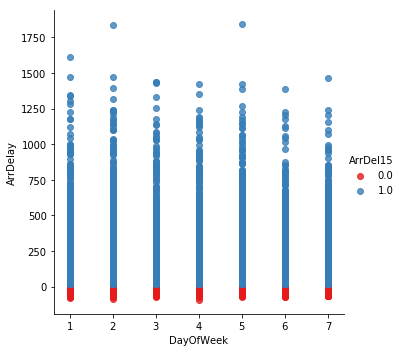

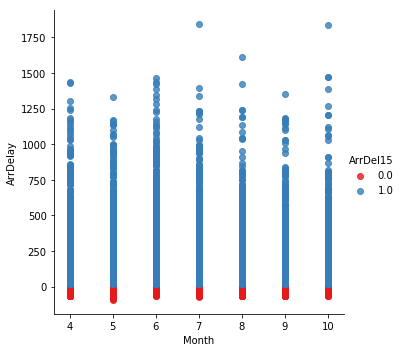

In [75]:
#function to draw conditioned scatter plot
def cond_scatter(df, cols, y,cond):
    for col in cols:
        sns.lmplot(x = col, y = y, data = df, hue = cond, palette="Set1", fit_reg = False)  
cond_scatter(df, plot_cols2, 'ArrDelay', 'ArrDel15')

In [15]:
#replacing and renaming ArrDelay and name_y
df[['ArrDelay', 'name_y']] = df[['name_y', 'ArrDelay']]
df.rename(columns={'ArrDelay':'name_y', 'name_y':'ArrDelay'},inplace=True)

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\pandas\core\frame.py:3027: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [16]:
#checking data types of df
df.dtypes

Year               float64
Month              float64
DayofMonth         float64
DayOfWeek          float64
Carrier             object
OriginAirportID    float64
DestAirportID       object
CRSDepTime         float64
DepDelay           float64
DepDel15           float64
CRSArrTime         float64
name_y              object
ArrDel15           float64
Cancelled          float64
airport_id_x         int64
city_x              object
state_x             object
name_x              object
airport_id_y         int64
city_y              object
state_y             object
ArrDelay           float64
dtype: object

In [17]:
#converting into one hot encoded 
from sklearn.preprocessing import LabelEncoder
le_color = LabelEncoder()

df['Carrier_encoded'] = le_color.fit_transform(df.Carrier)
df['DestAirportID_encoded'] = le_color.fit_transform(df.DestAirportID)
df['city_x_encoded'] = le_color.fit_transform(df.city_x)
df['state_encoded'] = le_color.fit_transform(df.state_x)
df['name_x_encoded'] = le_color.fit_transform(df.name_x)
df['city_y_encoded'] = le_color.fit_transform(df.city_y)
df['state_y_encoded'] = le_color.fit_transform(df.state_y)
df['name_y_encoded'] = le_color.fit_transform(df.name_y)

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pan

In [18]:
#keeping one hot encoded columns and removing their respective sting type columns
drop_list = ['DestAirportID', 'Carrier', 'name_y', 'city_x', 'state_x', 'name_x', 'city_y', 'state_y',]    
df.drop(drop_list, axis = 1, inplace = True)

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [19]:
#checking values of a single row of df
df.iloc[0]

Year                      2013.0
Month                        4.0
DayofMonth                  19.0
DayOfWeek                    5.0
OriginAirportID          11433.0
CRSDepTime                 837.0
DepDelay                    -3.0
DepDel15                     0.0
CRSArrTime                1138.0
ArrDel15                     0.0
Cancelled                    0.0
airport_id_x             11433.0
airport_id_y             13303.0
ArrDelay                     1.0
Carrier_encoded              4.0
DestAirportID_encoded       36.0
city_x_encoded              16.0
state_encoded               15.0
name_x_encoded              14.0
city_y_encoded              31.0
state_y_encoded              6.0
name_y_encoded              38.0
Name: 0, dtype: float64

In [21]:
#replacing ArrDelay with name_y_encoded to keep the target column as the last column
df[['ArrDelay', 'name_y_encoded']] = df[['name_y_encoded', 'ArrDelay']]
df.rename(columns={'ArrDelay':'name_y_encoded', 'name_y_encoded':'ArrDelay'},inplace=True)
df.dtypes

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\pandas\core\frame.py:3027: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


Year                     float64
Month                    float64
DayofMonth               float64
DayOfWeek                float64
OriginAirportID          float64
CRSDepTime               float64
DepDelay                 float64
DepDel15                 float64
CRSArrTime               float64
ArrDel15                 float64
Cancelled                float64
airport_id_x               int64
airport_id_y               int64
Carrier_encoded            int64
name_y_encoded             int64
DestAirportID_encoded      int64
city_x_encoded             int64
state_encoded              int64
name_x_encoded             int64
city_y_encoded             int64
state_y_encoded            int64
ArrDelay                 float64
dtype: object

In [22]:
#function returning F values and P values of different features
def select_kbest_clf(data_frame, target, k):
    from sklearn.feature_selection import SelectKBest
    from sklearn.feature_selection import f_classif
    """
    Selecting K-Best features for classification
    :param data_frame: A pandas dataFrame with the training data
    :param target: target variable name in DataFrame
    :param k: desired number of features from the data
    :returns feature_scores: scores for each feature in the data as 
    pandas DataFrame
    """
    feat_selector = SelectKBest(f_classif, k=k)
    _ = feat_selector.fit(data_frame, y)
    
    feat_scores = pd.DataFrame()
    feat_scores["F Score"] = feat_selector.scores_
    feat_scores["P Value"] = feat_selector.pvalues_
    feat_scores["Support"] = feat_selector.get_support()
    #feat_scores["Attribute"] = data_frame.drop(target, axis=1).columns
    
    return feat_scores 

In [23]:
#Sending the features and target column to find 10 most important features
X = df.iloc[:,0:21] 
y = df.iloc[:,-1]  
scores = select_kbest_clf(X, y, 10)

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\sklearn\feature_selection\univariate_selection.py:113: UserWarning: Features [ 0  9 10] are constant.
  UserWarning)
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\sklearn\feature_selection\univariate_selection.py:114: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw
c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\sklearn\feature_selection\univariate_selection.py:114: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


In [24]:
#creating a table with only the column names of df
temp = pd.DataFrame(df.columns[:-1])

In [25]:
#merging temp and scores 
merg = pd.concat([temp, scores], axis=1)

In [26]:
#renaming the column names as features
merg.rename(columns={0:'feature'},inplace=True)

In [27]:
merg

,feature,F Score,P Value,Support
0,Year,NaN,NaN,False
1,Month,1.191437e+01,0.000000e+00,True
2,DayofMonth,1.502073e+00,2.171682e-22,False
3,DayOfWeek,1.841334e+00,2.148724e-51,False
4,OriginAirportID,4.686296e+00,0.000000e+00,True
5,CRSDepTime,1.106412e+02,0.000000e+00,True
6,DepDelay,3.048746e+04,0.000000e+00,True
7,DepDel15,4.437784e+03,0.000000e+00,True
8,CRSArrTime,9.109351e+01,0.000000e+00,True
9,ArrDel15,inf,0.000000e+00,True


In [28]:
#taking only the features with Support = True
main_features = []
for i in range(merg.shape[0]):
    if merg['Support'][i] == True:
        #print(merg['feature'][i])
        main_features.append(merg['feature'][i])
    

In [29]:
main_features

['Month',
 'OriginAirportID',
 'CRSDepTime',
 'DepDelay',
 'DepDel15',
 'CRSArrTime',
 'ArrDel15',
 'airport_id_x',
 'Carrier_encoded',
 'state_encoded']

In [30]:
#final is the table with 10 most important features
final = df[main_features]

In [31]:
#checking first 5 values of final
final[0:5]

,Month,OriginAirportID,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDel15,airport_id_x,Carrier_encoded,state_encoded
0,4.0,11433.0,837.0,-3.0,0.0,1138.0,0.0,11433,4,15
1,4.0,11433.0,1948.0,103.0,1.0,2253.0,1.0,11433,4,15
2,4.0,11433.0,1948.0,2.0,0.0,2253.0,0.0,11433,4,15
3,4.0,11433.0,1948.0,221.0,1.0,2253.0,1.0,11433,4,15
4,4.0,11433.0,837.0,-2.0,0.0,1135.0,1.0,11433,4,15


In [32]:
#checking highest and lowest value of y which contains only ArrDelay
print(y.max(), y.min())

1845.0 -94.0


In [33]:
#considering ArrDelay value >300 or less than -50 as outliers and replacing thir values with nan 
count = 0 
for i in y.index:
    if y[i]>300.0 or y[i]<-50.0:
        y[i] = np.nan
        count = count+1

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [34]:
#count is the number of outliers which were considered
count

5399

In [35]:
#Concataning final and y 
f_final = pd.concat([final, y], axis=1)

In [36]:
#f_final is the shape of dataset with features and target column 
f_final.shape

(2690367, 11)

In [37]:
#removing rows with outliers from data_f
data_f = f_final[~pd.isnull(f_final).any(axis=1)]

In [38]:
#shape of data_f after removing outliers
data_f.shape

(2684968, 11)

In [39]:
#making OriginAirportID and Carrier_encoded as categorical values
cols = ['OriginAirportID', 'Carrier_encoded']
for col in cols:
    data_f[col] = data_f[col].astype('category')

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [40]:
#data types of columns of data_f
data_f.dtypes

Month               float64
OriginAirportID    category
CRSDepTime          float64
DepDelay            float64
DepDel15            float64
CRSArrTime          float64
ArrDel15            float64
airport_id_x          int64
Carrier_encoded    category
state_encoded         int64
ArrDelay            float64
dtype: object

In [41]:
#Applying Z_Score normalization in CRSDepTime, DepDelay, CRSArrTime
from scipy.stats import zscore
numeric_cols = ['CRSDepTime', 'DepDelay', 'CRSArrTime']
data_f[numeric_cols] = data_f[numeric_cols].apply(zscore)

c:\users\ratul\anaconda3\envs\tensorflow\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [42]:
#checking first five values of data_f
data_f.iloc[0:5]

,Month,OriginAirportID,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDel15,airport_id_x,Carrier_encoded,state_encoded,ArrDelay
0,4.0,11433.0,-1.036358,-0.410445,0.0,-0.741661,0.0,11433,4,15,1.0
1,4.0,11433.0,1.320305,2.969449,1.0,1.515538,1.0,11433,4,15,90.0
2,4.0,11433.0,1.320305,-0.251016,0.0,1.515538,0.0,11433,4,15,13.0
3,4.0,11433.0,1.320305,6.731971,1.0,1.515538,1.0,11433,4,15,204.0
4,4.0,11433.0,-1.036358,-0.378559,0.0,-0.747734,1.0,11433,4,15,16.0


In [43]:
#Splitting train and test values
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(data_f.iloc[:,0:10], data_f.iloc[:,-1], test_size = 0.2, random_state = 0)

In [44]:
#predicting arrival delay based on GradientBoostingRegressor and their defaut values 
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from sklearn.ensemble import GradientBoostingRegressor
est = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,
     max_depth=1, random_state=0, loss='ls').fit(xTrain, yTrain)
print(mean_squared_error(yTest, est.predict(xTest)))  
print(mean_absolute_error(yTest, est.predict(xTest))) 

121.96644194533292
7.973921155723107


In [45]:
#predicted values of arrival delay for xTest values
predicted = est.predict(xTest)

In [50]:
#comparing actual and predicted values side by side
j = 0
print('y_act', 'y_pred')
for i in yTest.index:
    print(yTest[i], "{0:.2f}".format(round(predicted[j],2)))
    j = j + 1

y_act y_pred
4.0 -8.94
-13.0 -11.25
3.0 -8.12
5.0 -5.48
9.0 -11.05
25.0 25.06
-10.0 -8.12
33.0 34.20
-25.0 -10.15
12.0 -8.12
20.0 29.02
25.0 36.87
-6.0 -10.15
-24.0 -7.47
-4.0 -8.74
21.0 29.77
-6.0 -3.72
56.0 61.65
-4.0 -0.41
10.0 2.06
-6.0 -8.12
-18.0 -6.44
197.0 183.09
92.0 91.89
49.0 19.49
-10.0 -9.48
-16.0 -11.90
-9.0 -11.82
-11.0 -10.64
-18.0 -10.15
-3.0 -6.64
14.0 2.26
-6.0 -4.83
-6.0 2.06
-14.0 -12.09
-11.0 -8.94
-14.0 -11.05
-23.0 -10.15
-9.0 -0.22
28.0 34.00
-1.0 -10.64
-3.0 -8.94
-10.0 -7.47
-3.0 -10.15
-12.0 -11.25
81.0 34.00
-6.0 -12.09
-47.0 -8.12
50.0 70.84
-2.0 -6.64
-7.0 -9.96
-13.0 -3.91
14.0 2.26
-7.0 -10.15
6.0 -1.90
9.0 -3.91
-7.0 -11.82
2.0 -6.64
-23.0 -12.09
-18.0 -12.09
-12.0 -8.12
-28.0 -9.48
-3.0 -3.72
7.0 -11.25
-13.0 -10.64
-2.0 -6.44
-2.0 1.60
-3.0 -1.70
-16.0 -5.48
-11.0 -7.47
-12.0 -8.74
200.0 196.02
-2.0 -1.90
-7.0 -7.47
12.0 -0.41
0.0 -5.28
51.0 70.84
-19.0 -7.47
-7.0 -8.94
7.0 1.40
-16.0 -9.48
-18.0 -11.25
-17.0 -10.15
8.0 -9.48
-7.0 -9.28
-8.0 -9.48
-5

-4.0 -2.55
-14.0 -6.64
-6.0 -10.64
18.0 29.21
-17.0 -7.47
2.0 -7.93
42.0 45.93
-9.0 -5.48
11.0 2.26
5.0 -5.48
1.0 -5.48
25.0 29.02
-5.0 -10.44
-23.0 -8.12
-5.0 -7.47
-3.0 -1.90
30.0 29.57
22.0 24.20
3.0 2.06
27.0 29.21
10.0 -0.41
-4.0 -7.47
4.0 -6.44
27.0 36.87
-4.0 -6.64
-8.0 -8.12
-6.0 -2.75
-10.0 -6.44
5.0 2.06
-8.0 -8.74
8.0 -4.11
128.0 131.88
51.0 29.57
8.0 -2.75
-22.0 -6.64
-32.0 -7.47
-15.0 -11.25
7.0 -1.90
-9.0 -5.28
3.0 -8.12
24.0 26.54
-31.0 -7.93
25.0 34.20
-16.0 -5.48
-8.0 -12.09
7.0 -0.22
15.0 26.74
-13.0 -10.15
0.0 -2.75
-16.0 -7.27
1.0 -5.28
-14.0 -12.09
-20.0 -4.11
4.0 -11.82
37.0 45.93
4.0 -5.48
24.0 29.21
4.0 2.26
-3.0 1.40
16.0 26.54
17.0 29.21
8.0 -5.03
-17.0 -1.90
-17.0 -6.64
0.0 -0.41
28.0 29.57
9.0 -11.05
-6.0 -3.91
59.0 70.84
-8.0 -6.64
10.0 2.26
-16.0 -9.48
-3.0 -5.28
-16.0 -8.12
-10.0 -8.74
-21.0 -7.27
6.0 -0.41
-15.0 -10.15
29.0 17.47
11.0 2.26
-13.0 -7.47
-16.0 -9.48
-12.0 -10.15
9.0 -8.12
-26.0 -12.09
-11.0 -8.94
1.0 -8.12
-6.0 -3.91
-1.0 -10.64
10.0 -7.93


6.0 -1.90
-16.0 -5.48
15.0 16.80
-12.0 -7.47
59.0 57.29
-4.0 -9.28
-17.0 -9.48
-15.0 -12.09
-20.0 -11.82
-22.0 -11.25
-5.0 -11.82
-40.0 -12.09
-16.0 -10.64
5.0 -7.47
1.0 -5.28
1.0 -9.48
61.0 15.90
-10.0 -7.47
-5.0 -12.09
0.0 2.26
17.0 29.02
-9.0 -8.74
2.0 2.06
11.0 -3.72
9.0 2.26
104.0 118.74
-1.0 -3.91
-17.0 -8.94
-17.0 -2.75
22.0 26.74
-4.0 -3.91
-27.0 -2.75
19.0 16.80
-6.0 -9.48
-22.0 -9.48
-32.0 -11.05
8.0 -2.55
7.0 1.60
37.0 29.02
17.0 29.02
-8.0 -8.12
6.0 -9.48
16.0 26.54
-9.0 -9.48
47.0 45.49
-18.0 -10.64
-6.0 -5.03
-21.0 -10.15
-1.0 -0.22
-8.0 -11.25
15.0 29.02
10.0 -2.55
13.0 7.05
-12.0 -9.96
33.0 34.00
-12.0 -8.12
-13.0 -8.74
0.0 1.60
26.0 29.57
-9.0 -3.91
-11.0 -9.48
14.0 -2.75
-4.0 -8.12
21.0 23.24
-17.0 -10.15
-4.0 -3.91
-8.0 -7.93
-18.0 -7.47
98.0 102.94
0.0 -2.75
145.0 131.88
-20.0 -8.12
-24.0 -5.28
-10.0 -5.48
17.0 26.54
-19.0 -7.27
9.0 2.26
-16.0 -10.15
3.0 -5.03
20.0 29.02
-13.0 -10.44
14.0 -8.94
101.0 92.80
-9.0 -7.93
80.0 91.89
-7.0 -7.47
73.0 81.50
-10.0 -0.22
5.0 

35.0 29.02
-8.0 -9.48
27.0 34.00
115.0 85.46
-4.0 -7.27
4.0 -0.41
-18.0 -6.44
22.0 34.00
107.0 114.68
1.0 -11.82
85.0 81.50
-1.0 -8.12
6.0 -5.28
18.0 26.54
-2.0 -8.94
3.0 -1.70
15.0 18.83
1.0 -5.48
-9.0 -9.48
-7.0 -6.64
2.0 -9.28
6.0 -8.12
-5.0 -12.09
9.0 2.06
11.0 1.60
-20.0 -9.48
43.0 37.07
-3.0 -8.94
26.0 29.02
-4.0 -6.64
13.0 -3.91
1.0 -7.27
-13.0 -1.90
-4.0 -8.94
-14.0 -9.48
-3.0 -0.41
16.0 29.02
29.0 36.87
-1.0 -6.64
6.0 -10.64
-9.0 -0.41
76.0 118.74
2.0 -7.27
-1.0 -9.28
2.0 -8.74
-14.0 -8.12
-8.0 -5.48
28.0 34.20
-14.0 -5.28
-6.0 -8.94
-10.0 -8.94
0.0 -3.72
-15.0 -10.15
-9.0 -9.48
-32.0 -10.15
227.0 118.74
12.0 -0.22
1.0 -0.41
-13.0 -7.47
-7.0 -7.47
3.0 -9.28
18.0 29.21
18.0 21.48
-11.0 -8.94
35.0 29.21
8.0 -10.15
2.0 -8.12
14.0 1.40
48.0 45.69
52.0 23.04
-1.0 -2.55
-10.0 -5.48
7.0 -3.91
0.0 -0.41
19.0 18.01
0.0 2.06
85.0 85.66
-8.0 -8.94
7.0 2.26
34.0 29.57
-3.0 -10.64
-8.0 -5.48
-4.0 -6.64
0.0 -6.64
-27.0 -12.09
-10.0 -11.82
54.0 57.29
-2.0 -5.03
-18.0 -8.94
-1.0 -5.03
-19.0 -

43.0 36.87
-31.0 -9.48
-26.0 -11.25
9.0 2.26
-6.0 -7.47
-8.0 -2.75
-13.0 -8.12
48.0 36.87
149.0 37.07
-5.0 -7.47
7.0 -8.12
-16.0 -7.47
-7.0 -10.44
-11.0 -10.64
-6.0 -7.93
-14.0 -9.96
-2.0 -2.75
-20.0 -0.41
14.0 2.61
-19.0 -8.94
-4.0 -7.93
90.0 92.09
10.0 2.06
-9.0 -6.64
85.0 81.50
7.0 -6.64
-16.0 -5.03
-12.0 -1.70
-5.0 -0.41
3.0 2.06
-7.0 -8.12
-10.0 -6.64
-27.0 -8.94
7.0 2.06
1.0 -7.47
-16.0 -8.12
24.0 29.02
-12.0 -5.28
39.0 21.48
2.0 -0.41
51.0 58.60
-22.0 -8.74
-12.0 -8.12
-4.0 -5.28
-8.0 -0.22
27.0 36.87
-16.0 -9.48
-1.0 -7.27
-1.0 -8.12
-18.0 -10.15
-1.0 -8.94
96.0 92.09
0.0 -7.47
13.0 -8.12
0.0 -0.41
10.0 2.06
-19.0 -8.94
-28.0 -12.09
-11.0 -5.28
-29.0 -2.75
29.0 29.02
-25.0 -9.48
-16.0 -9.48
-6.0 -3.91
-10.0 -9.96
3.0 1.60
-15.0 -7.93
-6.0 -12.09
-1.0 -8.12
19.0 29.02
5.0 -5.03
-24.0 -10.15
21.0 21.93
-4.0 -4.83
-6.0 -8.12
-15.0 -7.47
-9.0 -9.28
162.0 175.02
-11.0 -8.12
29.0 29.02
-1.0 -8.74
-14.0 -2.75
-16.0 -8.74
-6.0 -7.27
9.0 1.40
-3.0 -1.70
-21.0 -10.64
-19.0 -10.15
-14.0 -

-19.0 -7.47
-12.0 -7.93
-1.0 -4.83
13.0 2.06
-18.0 -11.25
24.0 19.03
-3.0 -8.12
-2.0 -8.94
-2.0 -9.48
-15.0 -9.48
-4.0 -8.12
21.0 29.02
118.0 92.09
0.0 -11.25
19.0 29.02
9.0 -4.83
-12.0 -8.12
97.0 81.50
15.0 34.00
-16.0 -2.75
4.0 1.40
-4.0 -8.94
-9.0 -8.12
17.0 29.21
29.0 29.77
27.0 29.21
-9.0 -7.93
8.0 -10.15
-14.0 -11.82
7.0 1.60
5.0 -0.41
-8.0 -9.28
-29.0 -10.15
-25.0 -9.96
-9.0 -7.93
-6.0 -11.82
29.0 34.00
-10.0 -7.47
-2.0 -4.11
-19.0 -8.12
-19.0 -5.48
119.0 91.89
-23.0 -5.48
-4.0 -10.64
5.0 -12.09
12.0 -10.15
-3.0 -0.22
0.0 -4.83
2.0 1.40
1.0 -1.70
31.0 37.07
-4.0 -1.70
6.0 -8.12
-13.0 -10.15
-1.0 -5.03
118.0 104.53
2.0 -1.70
-1.0 1.60
-3.0 -11.25
32.0 36.87
-41.0 -10.64
-8.0 -5.03
-16.0 -8.12
6.0 -7.93
3.0 -8.94
-25.0 -6.64
-9.0 -8.74
-24.0 -5.28
118.0 128.63
3.0 -8.94
-7.0 -7.93
-4.0 -8.12
31.0 18.83
0.0 2.06
9.0 2.26
14.0 -1.70
2.0 -4.11
-11.0 -10.15
-10.0 -1.70
12.0 2.26
-25.0 -7.47
-20.0 -12.09
-12.0 -11.05
-3.0 -1.70
-4.0 -8.94
-14.0 -8.12
-5.0 -3.72
5.0 -8.94
-3.0 1.40
-3.0

2.0 -3.91
56.0 56.64
-10.0 -6.44
-1.0 -8.74
-7.0 -3.72
-21.0 -10.64
-6.0 -7.93
-17.0 -10.15
58.0 57.29
10.0 2.61
78.0 81.50
-9.0 -9.48
-3.0 1.60
-6.0 -9.96
3.0 -8.12
11.0 -0.41
-11.0 -6.44
-11.0 -9.48
-15.0 -10.15
10.0 2.26
25.0 34.00
19.0 29.02
-25.0 -10.64
-5.0 -11.90
-12.0 -4.11
29.0 24.20
-24.0 -8.94
40.0 56.44
-21.0 -10.15
0.0 -4.83
4.0 -0.22
-10.0 -8.74
25.0 16.52
29.0 21.93
-8.0 -5.28
32.0 29.21
2.0 2.26
-3.0 -8.74
-21.0 -7.27
-1.0 -8.12
-13.0 -8.74
-10.0 -9.28
-18.0 -8.74
-27.0 -9.48
-7.0 -7.93
6.0 1.60
-3.0 -6.64
-15.0 -7.93
4.0 2.06
-12.0 -4.83
-3.0 -3.72
13.0 2.06
-9.0 -7.93
12.0 2.26
1.0 -1.90
-24.0 -10.15
-4.0 -8.94
-28.0 -8.12
77.0 92.80
-19.0 -6.64
10.0 -8.12
-7.0 -10.64
-40.0 -6.64
50.0 45.93
45.0 45.93
-13.0 -6.44
-3.0 -7.93
24.0 21.68
-11.0 -9.96
-11.0 -11.25
-4.0 -0.41
-15.0 -8.94
-12.0 -9.48
7.0 -12.09
-16.0 -1.70
-22.0 -5.28
-17.0 -10.64
1.0 -7.93
-15.0 -6.64
16.0 29.21
88.0 34.00
-14.0 -10.44
30.0 29.57
10.0 2.26
-2.0 -6.64
-7.0 -0.41
-13.0 -6.64
-23.0 -3.72
-5.0 

0.0 -3.91
1.0 -1.90
13.0 2.06
-2.0 1.40
110.0 91.89
0.0 -5.28
-12.0 -4.11
216.0 219.04
7.0 2.06
-10.0 -4.11
29.0 29.77
12.0 -9.48
-30.0 -10.64
13.0 -3.72
-4.0 -8.12
-11.0 -8.74
59.0 62.04
20.0 29.02
19.0 29.21
5.0 2.26
-6.0 -7.47
-20.0 -1.90
-16.0 -9.48
17.0 21.48
37.0 29.02
-9.0 -6.44
14.0 -0.41
-1.0 -3.91
67.0 71.04
26.0 29.02
26.0 36.87
-21.0 -8.94
-4.0 -2.75
8.0 -8.94
-9.0 -9.48
-7.0 -11.82
-4.0 1.40
-6.0 -5.28
-19.0 -4.11
18.0 16.52
75.0 71.04
-1.0 -7.47
1.0 2.61
-8.0 -0.22
-15.0 -9.48
23.0 19.49
-13.0 -6.64
23.0 29.57
8.0 -0.22
-5.0 -8.94
9.0 2.06
22.0 34.20
-5.0 -2.55
-2.0 -5.48
-19.0 -8.94
-13.0 -11.25
15.0 18.83
21.0 21.68
-15.0 -10.15
-20.0 -5.48
3.0 -5.03
9.0 2.06
4.0 -7.47
-13.0 -9.48
-3.0 -9.48
1.0 -1.90
-4.0 -0.22
-20.0 -10.15
-18.0 -8.12
-22.0 -11.62
-13.0 -9.48
-12.0 -11.25
-23.0 -12.09
8.0 1.40
8.0 -1.90
-22.0 -8.12
1.0 1.40
45.0 36.87
-20.0 -12.09
-13.0 -8.12
22.0 29.57
77.0 83.07
-7.0 -4.11
-4.0 -3.91
-8.0 -7.93
63.0 58.60
13.0 2.26
-25.0 -6.64
29.0 24.20
161.0 173.1

9.0 -8.12
19.0 19.03
-6.0 -9.48
-3.0 -5.48
-24.0 -8.94
-1.0 -10.15
7.0 -8.12
43.0 56.64
-7.0 -8.74
-21.0 -10.64
-12.0 -6.64
-15.0 2.06
-15.0 -10.64
-6.0 -8.12
14.0 -2.75
18.0 28.35
-20.0 -8.12
-33.0 -7.47
-7.0 -3.91
-12.0 -8.12
-17.0 -11.82
-13.0 -6.44
-11.0 -11.05
-5.0 -11.82
-22.0 -4.83
12.0 2.26
13.0 -8.94
179.0 186.17
-14.0 -5.03
-2.0 -0.41
18.0 29.21
8.0 2.26
29.0 36.87
2.0 -1.90
56.0 57.29
-13.0 -9.28
0.0 -5.48
57.0 62.04
-3.0 -8.12
37.0 36.87
3.0 1.60
3.0 1.40
-12.0 -8.94
-7.0 2.06
2.0 -7.47
-21.0 -12.09
-1.0 -9.48
-12.0 -9.48
7.0 -6.44
3.0 -10.64
6.0 1.60
-7.0 -8.12
66.0 45.69
-4.0 -8.94
5.0 1.60
-2.0 -1.70
-1.0 -11.25
1.0 -2.55
5.0 -0.41
20.0 29.02
-4.0 -5.03
-3.0 -7.93
1.0 2.26
-30.0 -5.48
0.0 -8.74
-12.0 -10.15
164.0 102.94
-16.0 -8.12
2.0 -4.83
-23.0 -11.25
-5.0 -7.47
18.0 29.02
10.0 2.06
-16.0 -8.12
-9.0 -6.44
14.0 2.06
-8.0 -5.48
4.0 -1.90
6.0 -3.72
1.0 -1.70
63.0 61.85
-10.0 -6.64
4.0 -0.41
-8.0 -9.28
-24.0 -8.94
-22.0 -10.15
10.0 -1.70
-20.0 -3.91
9.0 2.26
-12.0 -12.09


8.0 2.26
-5.0 -7.27
13.0 2.26
34.0 45.49
140.0 140.07
-5.0 -10.15
-10.0 -7.93
-11.0 -11.25
-24.0 -11.25
-11.0 -4.11
-2.0 -1.70
-45.0 -4.11
75.0 70.84
-3.0 -10.64
-13.0 -12.09
-12.0 -5.48
-5.0 -3.91
-22.0 -8.12
-18.0 -10.15
-21.0 2.06
-15.0 -8.94
-6.0 -4.11
51.0 45.49
56.0 14.86
-22.0 -11.25
17.0 29.57
-2.0 -7.47
15.0 29.21
53.0 45.69
-29.0 -6.64
-13.0 -10.64
24.0 28.35
-4.0 -4.83
-7.0 -9.28
-19.0 -8.94
-16.0 -8.12
0.0 -1.90
-17.0 -8.74
10.0 2.61
11.0 2.26
-20.0 -8.12
6.0 -10.15
-29.0 -3.91
4.0 -4.11
-20.0 -8.12
-16.0 -5.48
2.0 2.26
-7.0 -7.47
-17.0 -6.44
-4.0 -0.41
23.0 21.93
129.0 140.07
-4.0 -0.41
15.0 24.20
-11.0 -8.12
-13.0 -3.91
-31.0 -11.25
21.0 29.21
-22.0 -11.82
-5.0 -6.44
-22.0 -10.64
-10.0 -11.82
63.0 45.49
-2.0 -0.22
0.0 -6.44
0.0 2.26
7.0 -3.72
-13.0 -8.74
-8.0 -5.48
-7.0 -8.94
10.0 2.26
3.0 2.06
-15.0 -9.28
-14.0 -8.94
-9.0 -9.48
43.0 19.49
4.0 -9.28
16.0 26.54
10.0 -7.47
-8.0 -11.05
6.0 -5.28
-13.0 -7.93
9.0 -5.48
-7.0 -6.64
-3.0 -8.12
-17.0 -10.64
35.0 29.02
-19.0 -11.82

-3.0 -9.28
-8.0 -6.64
-6.0 -8.74
-7.0 -1.70
-15.0 -12.09
6.0 1.40
8.0 2.61
6.0 -7.47
-4.0 -11.82
-19.0 -6.44
-4.0 -9.96
7.0 -12.09
53.0 45.69
6.0 -11.82
-8.0 -2.55
-25.0 -10.64
-20.0 -10.15
78.0 70.84
0.0 -0.22
-9.0 -5.48
-10.0 -8.74
88.0 91.89
-15.0 -10.64
-44.0 -10.15
12.0 2.61
1.0 -7.47
29.0 28.55
20.0 29.02
43.0 26.74
-10.0 -3.91
-8.0 -8.12
104.0 92.09
-5.0 -3.91
7.0 -7.47
-3.0 -8.94
22.0 29.21
-20.0 -7.47
4.0 2.06
4.0 -8.94
-7.0 -7.27
21.0 29.21
-26.0 -10.15
3.0 -10.15
-12.0 -9.48
-20.0 -7.47
5.0 -9.48
-6.0 -8.12
-3.0 -3.91
-20.0 -9.48
-19.0 -8.94
-14.0 -1.70
203.0 202.91
-9.0 -9.48
6.0 -6.44
2.0 -1.90
-4.0 -10.15
-3.0 -9.48
13.0 -5.28
2.0 -6.44
-7.0 -1.70
3.0 -4.83
5.0 -0.22
-4.0 -3.72
31.0 29.02
-3.0 -11.25
45.0 29.02
22.0 24.20
11.0 1.60
6.0 -10.64
2.0 -9.96
30.0 36.87
-1.0 -9.48
4.0 1.60
-9.0 -5.48
-3.0 -7.27
13.0 -0.41
-10.0 -5.48
-1.0 -3.91
26.0 29.02
-10.0 -6.44
-2.0 -5.28
4.0 -5.48
10.0 -0.41
-1.0 -7.47
-8.0 -9.48
-10.0 -8.74
-14.0 -5.03
9.0 -0.41
23.0 29.21
-15.0 -8.94
-2

120.0 81.70
-1.0 -10.15
-1.0 -8.94
-12.0 -6.64
-11.0 -11.25
11.0 -4.11
-2.0 -8.74
20.0 26.74
3.0 2.06
-6.0 -3.91
-27.0 -7.47
56.0 45.93
-37.0 -5.03
-2.0 -7.47
-19.0 -9.48
-5.0 -7.93
-7.0 -6.44
-2.0 -5.03
115.0 114.88
3.0 -5.28
-17.0 -11.82
-2.0 -8.94
22.0 28.55
-18.0 -5.28
-9.0 -5.48
-8.0 -9.48
-16.0 -11.82
65.0 45.93
6.0 -7.93
6.0 2.26
300.0 257.01
154.0 114.68
-7.0 -3.91
-9.0 -6.44
14.0 -1.70
11.0 -8.74
-13.0 -8.12
4.0 -0.41
-14.0 -9.48
81.0 85.66
-21.0 -11.82
11.0 2.26
-15.0 -9.28
16.0 29.02
-4.0 -10.64
14.0 -9.28
106.0 92.60
-15.0 -12.09
-12.0 -11.25
-18.0 -5.03
-13.0 -7.27
83.0 91.89
-7.0 -5.48
19.0 17.47
-28.0 -9.96
35.0 37.07
-8.0 -9.28
-8.0 -9.28
-11.0 -1.90
-8.0 -7.47
2.0 -8.74
-6.0 -8.94
-4.0 -0.22
-7.0 -4.83
-8.0 -1.90
-2.0 -4.83
-16.0 -12.09
-8.0 -0.41
-7.0 -8.74
4.0 -8.74
-9.0 -10.44
-7.0 -6.44
113.0 118.74
8.0 -5.48
-6.0 -10.64
-22.0 -5.48
14.0 -1.90
30.0 29.02
-2.0 -8.12
8.0 2.26
42.0 34.20
7.0 -7.93
-3.0 -9.48
9.0 2.06
-12.0 -8.12
-36.0 -10.15
71.0 70.84
-2.0 -7.27
5.0 

10.0 -5.48
16.0 19.49
-9.0 -7.93
-1.0 -7.27
-9.0 -4.83
-8.0 -6.44
-12.0 2.26
52.0 57.09
0.0 -0.22
-35.0 -9.48
-3.0 -1.90
-5.0 -8.12
-15.0 -10.64
-15.0 -3.91
13.0 2.06
-21.0 -5.03
84.0 92.09
97.0 118.74
20.0 29.02
-26.0 -12.09
7.0 -10.64
103.0 104.53
-16.0 -8.74
11.0 1.60
-32.0 -7.27
20.0 29.21
-8.0 -6.44
71.0 71.04
-6.0 -5.03
10.0 -0.41
-9.0 -6.44
-10.0 -9.48
-5.0 -5.03
16.0 29.02
-5.0 -6.64
-5.0 -2.75
129.0 26.54
-5.0 -1.70
9.0 -5.28
-9.0 -1.90
-18.0 -7.47
-19.0 -6.64
-18.0 -12.09
3.0 -7.27
5.0 -10.15
-2.0 -5.28
0.0 -6.64
15.0 29.21
-39.0 -11.82
-12.0 -7.47
-12.0 -10.64
-10.0 -8.74
-16.0 -8.74
12.0 2.06
-12.0 -3.91
6.0 -4.11
11.0 2.26
-4.0 -9.48
-4.0 -4.83
-38.0 -5.48
-11.0 -6.44
-11.0 -6.64
-4.0 -5.48
38.0 29.02
36.0 29.77
39.0 29.02
-9.0 -6.64
-12.0 -8.12
13.0 2.06
-22.0 -7.47
-8.0 -2.75
0.0 -6.64
1.0 -5.48
-2.0 -8.94
-5.0 -7.93
1.0 2.06
0.0 -11.05
2.0 -8.12
3.0 -7.93
2.0 -2.55
4.0 -6.64
35.0 34.00
49.0 45.93
-11.0 -8.12
-3.0 -8.12
37.0 26.74
2.0 -7.47
22.0 29.57
0.0 -2.75
6.0 -10.1

12.0 2.26
-10.0 -6.64
23.0 28.35
-9.0 -7.47
-19.0 -7.47
-22.0 -11.25
1.0 -11.25
6.0 2.26
10.0 2.06
-17.0 -1.90
5.0 -9.48
-14.0 -6.44
-5.0 -8.94
35.0 25.06
-1.0 -0.22
-11.0 -10.15
90.0 102.94
4.0 -8.12
-8.0 -6.64
5.0 -4.11
3.0 -5.28
-4.0 -9.96
5.0 2.26
-7.0 -5.03
4.0 -7.93
4.0 2.06
0.0 1.60
-10.0 -8.94
-1.0 -9.28
7.0 2.26
-4.0 -10.15
-9.0 -10.64
-9.0 -8.12
15.0 17.47
2.0 -12.09
-9.0 -11.25
-12.0 -8.94
-8.0 -6.64
2.0 -9.48
5.0 -10.15
3.0 1.60
-12.0 -6.64
-5.0 -9.48
-10.0 -10.64
-15.0 -8.94
14.0 2.61
10.0 -1.70
-1.0 -8.12
5.0 -5.48
10.0 -9.96
19.0 29.21
-8.0 -11.25
10.0 -7.47
132.0 131.88
-2.0 -5.28
11.0 2.06
2.0 -5.03
5.0 -7.47
-4.0 -8.12
-11.0 -8.12
-2.0 -9.48
20.0 24.20
-27.0 -8.94
-18.0 -6.64
-12.0 -8.12
176.0 172.94
-21.0 -12.09
-14.0 -10.64
-17.0 -6.64
0.0 -3.91
89.0 25.26
-2.0 -7.47
-7.0 -6.64
-3.0 -8.94
51.0 45.49
-3.0 -7.47
3.0 -8.12
-21.0 -5.48
-2.0 -10.15
-2.0 -9.96
32.0 28.55
-26.0 -10.15
2.0 -5.03
-8.0 -10.64
-25.0 -9.48
-9.0 -11.82
-7.0 -5.28
-12.0 -5.48
-7.0 -8.12
-23.0 -11

-19.0 -7.47
24.0 29.21
-20.0 -9.28
-17.0 -10.15
26.0 21.48
-23.0 -12.09
-5.0 -3.72
2.0 -8.12
-5.0 -4.11
4.0 -6.64
13.0 2.61
4.0 -8.12
-16.0 -7.27
-9.0 2.26
16.0 21.48
-13.0 -5.48
14.0 2.06
31.0 29.02
-4.0 -5.03
-10.0 -6.64
20.0 29.02
-12.0 -11.25
-14.0 -10.15
27.0 29.02
-13.0 -7.27
1.0 -10.15
-18.0 -11.90
-2.0 -4.11
-12.0 -9.28
0.0 -12.09
30.0 29.57
-18.0 -12.09
-14.0 -11.25
-3.0 -7.27
-2.0 1.60
-13.0 -11.25
0.0 -7.27
-5.0 1.60
10.0 7.05
-10.0 -7.47
-2.0 -9.48
64.0 62.04
-11.0 -6.64
-23.0 -10.15
3.0 -3.91
-16.0 -7.27
60.0 62.04
57.0 45.69
14.0 2.26
31.0 29.21
-11.0 -3.91
-6.0 -10.15
13.0 -10.64
-23.0 -10.15
-4.0 -9.48
9.0 -3.91
-4.0 -8.74
-7.0 -7.47
3.0 -7.47
-17.0 -10.64
10.0 -6.64
139.0 131.88
8.0 2.06
-16.0 -0.41
62.0 34.00
-9.0 -10.15
-6.0 -0.22
-1.0 -8.12
23.0 36.87
-7.0 -6.44
-12.0 2.06
-24.0 -11.05
-20.0 -8.12
21.0 29.57
14.0 7.05
-4.0 -2.55
-23.0 -6.64
4.0 -3.91
3.0 1.60
9.0 1.60
-9.0 -10.64
-22.0 -8.94
17.0 29.21
-21.0 -12.09
-16.0 -6.64
7.0 -0.22
68.0 62.04
-14.0 -8.12
0.0 -7

-10.0 -6.64
-16.0 -10.15
-11.0 -11.25
-2.0 -9.48
-17.0 -9.48
6.0 -0.41
0.0 -1.70
20.0 29.02
-10.0 -8.94
14.0 -0.41
0.0 -4.11
2.0 -7.93
41.0 36.87
41.0 34.00
96.0 102.94
-7.0 -9.96
0.0 -5.28
29.0 29.57
2.0 -7.27
-4.0 -12.09
71.0 70.84
29.0 29.02
11.0 -8.12
0.0 -0.41
-7.0 -6.64
-15.0 -9.48
9.0 -5.48
0.0 -8.74
-10.0 -10.44
-10.0 -7.93
-11.0 -5.48
-3.0 -10.44
12.0 -8.94
6.0 2.06
-4.0 -9.48
-17.0 -8.94
59.0 70.84
-5.0 -3.72
2.0 -0.22
-14.0 -9.96
-20.0 -8.94
30.0 45.49
-7.0 -6.64
-10.0 -12.09
41.0 45.49
4.0 -7.47
-15.0 -8.94
8.0 -8.12
2.0 -6.44
-1.0 -5.28
-12.0 -0.41
-27.0 -10.64
4.0 -6.64
-1.0 -5.48
-1.0 -5.48
-6.0 -6.64
-9.0 -5.48
-5.0 -0.41
2.0 -5.48
-10.0 -9.28
3.0 -4.83
-2.0 -6.64
3.0 -2.55
10.0 2.06
-15.0 -5.03
-17.0 -5.03
12.0 -0.22
-4.0 -3.91
183.0 183.09
-15.0 -5.28
-3.0 2.06
-8.0 -11.25
27.0 28.35
13.0 -7.47
-13.0 -8.94
9.0 2.06
7.0 -2.75
4.0 2.26
-14.0 -7.47
4.0 -9.28
-6.0 -1.90
1.0 -0.41
7.0 -0.41
1.0 -3.72
7.0 -4.11
-9.0 -8.12
54.0 61.85
-19.0 -8.12
17.0 29.21
18.0 29.21
123.0 9

-12.0 -9.28
171.0 172.94
129.0 104.53
-3.0 -6.64
-10.0 -9.48
12.0 -0.41
-8.0 -2.55
42.0 34.00
-6.0 -8.94
0.0 -8.12
-17.0 -6.64
-14.0 -11.25
0.0 -7.47
-14.0 -10.64
-5.0 -8.94
-20.0 -6.64
-4.0 -10.64
-11.0 -7.27
3.0 -4.83
-7.0 1.40
41.0 56.44
34.0 56.44
-12.0 -10.15
19.0 18.83
-17.0 -7.93
21.0 36.87
-5.0 -5.28
-16.0 -7.93
0.0 -4.83
-7.0 -7.27
-2.0 -8.94
-22.0 -10.15
-31.0 -8.74
15.0 28.35
14.0 2.06
-9.0 -10.64
-16.0 -5.28
-11.0 -7.27
-12.0 -3.72
5.0 -5.28
21.0 19.49
2.0 2.26
-17.0 -9.48
9.0 -8.74
-3.0 -2.75
-8.0 -11.25
-1.0 -8.12
20.0 25.06
8.0 -6.64
-1.0 -9.48
-9.0 -0.22
-13.0 -10.64
-25.0 -10.15
93.0 83.07
128.0 118.94
15.0 19.69
-19.0 -9.48
-12.0 -5.28
-8.0 -7.93
9.0 -10.15
-26.0 -8.74
27.0 29.02
-3.0 2.26
6.0 2.06
-8.0 -8.12
2.0 -6.64
-3.0 -3.91
-15.0 -0.22
28.0 29.21
-9.0 -11.62
-10.0 -5.48
11.0 1.60
94.0 56.64
-5.0 -1.70
-8.0 2.26
-13.0 -9.48
29.0 29.77
-1.0 -4.83
-4.0 -0.22
-1.0 1.40
-6.0 -8.94
-5.0 1.40
-10.0 -4.11
-26.0 -12.09
-31.0 -12.09
-4.0 -7.93
135.0 102.94
-9.0 1.40
8.0 2

-30.0 -12.09
3.0 -9.48
-8.0 -5.48
-35.0 -12.09
8.0 1.40
-9.0 -5.48
21.0 21.68
-19.0 -5.28
-34.0 -11.62
-15.0 -10.15
-15.0 -9.48
17.0 29.02
-14.0 -6.64
3.0 2.26
-14.0 -8.94
-9.0 -6.64
-9.0 -8.94
8.0 2.26
0.0 -7.47
-4.0 -7.27
-18.0 -6.64
-8.0 -10.15
-9.0 -7.93
-5.0 2.06
-15.0 -10.44
17.0 29.02
-9.0 -6.44
17.0 29.21
-20.0 -6.44
4.0 -0.41
-17.0 -8.12
15.0 16.52
0.0 -7.27
-7.0 -6.64
16.0 29.02
-7.0 -2.55
16.0 29.02
-6.0 -5.28
82.0 102.94
-17.0 -9.48
15.0 25.06
-3.0 -8.12
34.0 56.44
-17.0 -10.64
-6.0 -10.15
-10.0 -10.15
-11.0 -10.15
-6.0 -3.72
-15.0 -4.83
7.0 1.60
-6.0 -5.28
-17.0 -10.64
-6.0 -10.64
-2.0 -11.25
0.0 -1.90
5.0 -0.22
-10.0 -7.47
-13.0 -2.75
7.0 -1.90
-11.0 -7.47
-6.0 -11.90
13.0 1.40
-7.0 -8.94
-5.0 -6.44
-9.0 -5.03
10.0 -0.41
-5.0 -9.48
53.0 58.80
-20.0 -10.15
-4.0 -9.48
57.0 56.64
-6.0 -6.64
13.0 2.26
-9.0 -8.74
30.0 29.02
-20.0 -11.82
-11.0 -6.64
-25.0 -10.15
2.0 -0.22
14.0 -5.48
-12.0 -10.64
-9.0 -10.15
-12.0 -8.94
19.0 16.52
30.0 29.02
3.0 -0.22
102.0 104.53
7.0 -0.22
-12.

-21.0 -10.15
-2.0 -7.27
-15.0 -12.09
-22.0 -9.48
-15.0 -8.12
-9.0 -8.74
-8.0 -5.03
-1.0 2.06
-13.0 -9.48
-8.0 -9.28
16.0 29.77
-25.0 -9.48
8.0 -2.55
-18.0 -11.05
21.0 29.02
-10.0 -11.82
-2.0 -7.27
-5.0 -6.64
-18.0 -11.82
-7.0 -5.28
-2.0 -1.90
-9.0 -5.28
-13.0 -9.48
-19.0 -11.25
-13.0 -6.64
64.0 71.04
-3.0 -6.64
-11.0 -8.12
-27.0 -4.83
-6.0 -6.64
-8.0 -9.96
51.0 45.49
-19.0 -8.94
21.0 29.02
-8.0 -6.44
57.0 62.24
-6.0 -6.64
2.0 -3.91
-6.0 -9.28
-15.0 -9.48
-11.0 2.06
-10.0 -5.28
14.0 2.06
-15.0 -1.70
-19.0 -10.15
-5.0 -10.64
-21.0 -12.09
1.0 -6.64
-24.0 -11.82
51.0 37.07
-19.0 -10.44
151.0 150.19
-11.0 -9.48
-6.0 -7.27
-2.0 -5.28
-4.0 -8.74
-8.0 -6.64
4.0 -0.41
34.0 29.57
-12.0 -9.48
5.0 2.06
44.0 28.35
-10.0 -11.25
5.0 -9.48
-12.0 -10.15
-1.0 -8.74
23.0 29.02
-4.0 -6.64
-7.0 -5.28
4.0 -1.90
-34.0 -12.09
-5.0 -0.22
15.0 29.02
-17.0 -5.03
55.0 62.04
-3.0 -9.96
-23.0 -7.27
3.0 -7.47
6.0 -1.70
0.0 2.06
-26.0 -12.09
-4.0 -7.27
-15.0 -12.09
-9.0 -10.15
-3.0 -6.64
-12.0 -4.11
-17.0 -1.90
223.0

-19.0 -4.83
-4.0 -0.22
2.0 -8.12
-8.0 -7.47
-8.0 -8.12
81.0 83.07
-15.0 -10.15
-1.0 -8.12
4.0 -4.83
58.0 29.02
3.0 -1.70
25.0 34.20
5.0 -7.47
-7.0 -8.12
4.0 -5.03
5.0 1.60
-14.0 -9.96
-36.0 -5.48
-13.0 -8.94
-5.0 -7.27
50.0 58.60
-18.0 -10.64
1.0 -7.47
-1.0 -0.41
-16.0 -5.48
-21.0 -8.94
14.0 2.26
-3.0 -4.11
-19.0 1.40
-5.0 -10.64
-4.0 -6.44
-2.0 -6.44
-9.0 -10.15
-20.0 -8.94
17.0 29.02
2.0 -11.25
9.0 -1.70
-17.0 -6.64
53.0 46.13
3.0 -0.41
2.0 -7.47
-2.0 -4.83
-2.0 -5.03
0.0 1.40
-7.0 -12.09
-12.0 -6.64
30.0 45.49
-7.0 -9.28
13.0 -8.94
-6.0 -7.93
1.0 2.06
35.0 45.93
2.0 -5.48
-12.0 -7.47
12.0 -1.90
22.0 29.02
45.0 45.69
3.0 -1.90
-7.0 -3.91
-13.0 -9.48
-10.0 2.06
9.0 2.06
-6.0 -8.74
1.0 2.06
-17.0 -6.64
-3.0 1.40
43.0 36.87
66.0 57.09
-6.0 -10.64
9.0 2.06
-7.0 -8.74
3.0 -5.48
70.0 29.21
99.0 128.63
-14.0 -4.83
-9.0 -8.74
-9.0 -8.94
-5.0 -7.27
51.0 58.80
121.0 118.74
-18.0 -11.25
124.0 131.88
27.0 21.48
6.0 -0.41
-14.0 -8.94
0.0 -6.64
9.0 -7.47
-12.0 -6.64
31.0 34.00
-2.0 2.06
-14.0 -7.4

-28.0 -11.25
1.0 -8.12
-24.0 -10.64
-29.0 -6.64
1.0 1.40
-7.0 -5.48
-9.0 -7.27
0.0 -1.70
-6.0 -9.48
-21.0 -8.12
-29.0 -12.09
-3.0 -8.74
49.0 62.04
1.0 -5.03
1.0 -0.41
-10.0 -2.75
-11.0 2.06
-6.0 -7.27
-3.0 -3.72
0.0 -0.22
-2.0 -4.83
-7.0 -11.82
-16.0 -11.82
8.0 -5.48
-10.0 -0.41
-15.0 -10.15
-33.0 -8.74
45.0 46.13
0.0 -10.15
-7.0 -5.48
-19.0 -9.48
7.0 -2.55
-24.0 -8.74
-11.0 -11.25
-6.0 -2.75
44.0 18.21
-9.0 -8.12
-5.0 -8.74
-11.0 -9.28
9.0 -0.41
-18.0 -9.28
252.0 230.02
17.0 34.00
4.0 -2.75
-17.0 -6.64
3.0 2.06
-4.0 1.60
-25.0 -5.28
-12.0 -10.15
-20.0 -12.09
-6.0 -8.94
5.0 -12.09
-9.0 -9.96
-28.0 -9.48
-24.0 -7.47
-13.0 -8.74
-18.0 -9.48
0.0 -7.47
10.0 2.06
-3.0 -12.09
-1.0 -9.96
-4.0 -11.90
-4.0 -7.47
25.0 29.02
1.0 -8.74
6.0 -4.11
-7.0 -8.94
11.0 2.06
37.0 45.69
-15.0 1.40
7.0 -0.41
-10.0 -8.12
-13.0 -7.47
-7.0 -11.82
-13.0 -7.47
-5.0 -5.28
47.0 21.93
5.0 1.40
67.0 45.49
-3.0 -10.64
-13.0 -9.48
-16.0 -8.12
263.0 217.43
12.0 -3.91
205.0 155.69
-18.0 -8.94
10.0 -2.55
226.0 239.31
19.0

31.0 29.21
-18.0 -8.94
-10.0 2.06
-10.0 -3.91
-23.0 -10.15
0.0 -3.91
7.0 -7.27
77.0 56.64
-4.0 -3.91
5.0 -5.48
0.0 -6.44
-10.0 -7.27
3.0 1.60
4.0 -5.28
-1.0 -8.12
-17.0 -6.64
-1.0 -8.94
-1.0 2.06
-9.0 -9.48
17.0 22.85
-10.0 -8.94
1.0 -5.28
-16.0 -5.48
-11.0 -7.93
-17.0 -7.93
-16.0 -11.25
-4.0 -8.12
-20.0 -8.94
-5.0 -5.28
18.0 20.31
-10.0 -5.48
-11.0 -8.12
-21.0 -7.27
0.0 -7.47
-2.0 -7.47
4.0 -5.03
-5.0 -10.44
-23.0 -7.93
-4.0 -9.48
-3.0 -9.48
19.0 29.21
-17.0 -11.82
-9.0 -1.90
-7.0 -10.64
-4.0 -9.96
-4.0 -8.94
-12.0 -0.41
-2.0 -3.91
-8.0 -7.93
-6.0 -5.03
33.0 37.07
-10.0 -10.15
-3.0 -1.70
9.0 -4.83
26.0 37.07
28.0 29.02
-23.0 -9.96
-6.0 -6.44
8.0 2.06
3.0 -9.96
20.0 25.26
-18.0 -10.64
7.0 2.26
-20.0 -10.15
-3.0 -3.91
69.0 29.02
-2.0 -7.47
-3.0 -6.64
-1.0 1.60
3.0 -9.48
-1.0 -10.64
17.0 29.57
12.0 -5.48
35.0 29.57
16.0 26.54
-20.0 -10.15
-14.0 -10.15
17.0 29.02
-14.0 -10.64
-15.0 -9.48
5.0 2.06
-5.0 -7.93
-5.0 -3.91
-13.0 -7.93
-7.0 -12.09
-6.0 -5.28
9.0 -8.94
-19.0 -8.12
-9.0 -9.48
93.

45.0 45.69
-12.0 -12.09
-8.0 -2.75
-1.0 -3.72
-6.0 -9.48
4.0 -9.48
-15.0 -10.64
-7.0 -8.12
5.0 -5.48
-15.0 -3.91
20.0 21.93
6.0 2.26
5.0 -5.48
37.0 45.49
-13.0 -8.94
22.0 29.02
-13.0 -5.28
-11.0 -4.11
28.0 36.87
63.0 34.00
165.0 172.94
6.0 1.60
22.0 29.02
-19.0 -12.09
15.0 21.93
-12.0 -7.93
-6.0 -7.47
10.0 2.26
-21.0 -12.09
4.0 -5.48
4.0 -7.47
0.0 -8.94
0.0 -9.48
41.0 29.02
-7.0 -9.28
-9.0 -8.94
53.0 70.84
34.0 29.21
-12.0 -6.64
-14.0 -11.82
-4.0 -9.28
-6.0 1.60
36.0 37.07
-3.0 -3.91
-5.0 -9.28
6.0 -4.83
-5.0 -9.28
4.0 -8.94
44.0 36.87
1.0 -5.48
-21.0 -11.82
0.0 -1.70
-7.0 -9.48
4.0 -0.22
-1.0 -3.91
142.0 139.87
234.0 217.63
-1.0 -0.22
-9.0 -9.28
-5.0 -7.47
7.0 2.26
-4.0 -8.12
77.0 82.87
-2.0 -9.48
-26.0 -10.64
58.0 57.29
-12.0 -4.11
-9.0 -7.47
-11.0 -9.96
-3.0 -8.12
4.0 -8.12
-10.0 -10.15
-7.0 -5.03
-11.0 -7.47
21.0 29.57
-16.0 -8.12
-5.0 -4.11
-20.0 -5.48
14.0 2.61
-9.0 -0.41
1.0 -0.41
-3.0 -3.91
0.0 -5.48
-6.0 -8.94
-16.0 -7.27
-22.0 -8.12
-14.0 2.06
-12.0 -7.93
-9.0 -9.96
-10.0 -7.

-3.0 -6.44
10.0 -1.90
11.0 2.06
-14.0 -10.64
1.0 -5.48
56.0 70.84
-8.0 -6.64
-19.0 -4.83
13.0 -0.41
-1.0 -8.94
-7.0 -6.44
7.0 2.26
3.0 -11.90
-7.0 -10.64
27.0 29.02
17.0 25.06
165.0 155.69
43.0 29.02
-5.0 -9.48
-10.0 1.40
181.0 172.94
19.0 25.06
128.0 114.68
-9.0 -9.48
-19.0 -3.91
-5.0 -5.03
-10.0 -5.03
35.0 62.04
13.0 2.06
-5.0 -6.44
36.0 36.87
-7.0 -7.93
-3.0 -3.91
-13.0 -9.48
-17.0 -12.09
-5.0 -10.64
-13.0 -10.15
9.0 -4.11
10.0 -2.75
-9.0 -6.64
-10.0 -9.48
3.0 -5.03
44.0 45.69
265.0 264.11
3.0 -1.90
56.0 45.49
-13.0 -4.83
135.0 29.02
95.0 58.80
16.0 16.32
-12.0 -5.48
-1.0 2.06
-3.0 -7.27
-21.0 -11.25
-22.0 -4.83
7.0 -2.75
-18.0 -8.12
-3.0 -8.12
1.0 -2.75
-14.0 -5.28
-3.0 -10.15
-3.0 -3.72
-4.0 -0.41
32.0 37.07
1.0 -11.25
-5.0 -8.12
-9.0 -12.09
-11.0 -3.91
-15.0 -9.48
-7.0 -6.64
-12.0 -1.90
-10.0 -7.93
-7.0 -5.28
-7.0 -10.64
104.0 104.53
-22.0 -8.74
3.0 -8.74
144.0 139.87
14.0 -1.70
-17.0 -10.64
-8.0 -8.12
-28.0 1.40
-15.0 -11.25
74.0 81.50
-13.0 -5.03
3.0 -8.94
-4.0 -8.74
-6.0 -12.0

-7.0 -7.27
19.0 22.85
-2.0 -0.22
-12.0 -6.44
4.0 1.60
-16.0 -7.93
-14.0 -9.48
-13.0 -9.48
18.0 20.31
-15.0 -7.27
-12.0 -7.47
7.0 2.06
-15.0 -7.93
2.0 -2.75
0.0 -8.94
182.0 61.65
3.0 1.40
21.0 18.01
-1.0 -5.28
-17.0 -9.48
-23.0 -7.93
-1.0 -6.44
-16.0 -11.25
11.0 -9.96
-16.0 -6.64
-29.0 2.26
-5.0 2.06
4.0 -1.70
1.0 -7.93
6.0 -3.91
-6.0 -0.41
-11.0 -7.47
-5.0 -5.28
-14.0 -10.64
1.0 2.06
-8.0 -6.44
-16.0 -8.94
-18.0 -10.64
-27.0 -11.25
0.0 -0.22
73.0 28.35
147.0 139.87
-6.0 -12.09
1.0 -8.94
-7.0 -6.44
18.0 21.93
-11.0 -10.15
-1.0 -5.03
-2.0 -7.93
10.0 2.06
-21.0 -5.48
-5.0 -7.93
2.0 1.40
2.0 -12.09
-13.0 -5.48
-4.0 -9.28
2.0 2.26
-6.0 -10.15
-13.0 -6.64
76.0 81.50
3.0 2.06
235.0 239.51
-20.0 -8.94
-12.0 -7.47
-12.0 -8.12
-22.0 -10.64
7.0 1.60
-18.0 -10.64
-7.0 -8.74
75.0 85.66
34.0 45.49
-13.0 -5.48
-14.0 -8.74
0.0 -3.91
14.0 -1.90
29.0 29.57
30.0 29.21
-18.0 -7.47
11.0 -7.47
37.0 21.48
5.0 -6.44
70.0 61.65
-5.0 -9.48
4.0 2.06
99.0 92.60
-18.0 -7.47
-38.0 -11.05
-10.0 -10.44
-18.0 -5.48
-8

-18.0 -9.28
0.0 -2.55
-25.0 -10.15
-43.0 -5.48
66.0 56.64
28.0 45.49
2.0 -5.03
14.0 -4.83
-6.0 -5.03
-19.0 -6.44
60.0 71.04
0.0 -8.12
-16.0 -9.48
-18.0 -7.93
3.0 -5.28
-3.0 -9.96
15.0 18.83
-25.0 -8.12
-16.0 -10.15
-1.0 1.40
12.0 1.40
-1.0 -8.12
-16.0 -7.47
0.0 -5.28
-13.0 -5.28
1.0 -0.22
-12.0 -5.48
65.0 56.44
3.0 -6.64
-1.0 -11.25
7.0 -6.64
-10.0 -7.93
9.0 2.26
34.0 29.77
21.0 21.68
-16.0 -10.15
34.0 45.49
3.0 -10.15
-21.0 -11.05
-6.0 -8.94
37.0 29.02
4.0 -8.12
-17.0 -6.44
-12.0 -9.48
169.0 150.19
-40.0 -11.25
-5.0 -0.41
-40.0 -0.22
2.0 2.06
0.0 -10.15
29.0 34.20
-13.0 -8.12
-27.0 -9.28
8.0 2.06
2.0 -9.28
-4.0 -9.48
-14.0 -5.28
-6.0 -4.11
65.0 37.07
-5.0 -7.47
-8.0 -10.15
24.0 36.87
-10.0 -1.90
11.0 29.49
136.0 154.49
-1.0 -10.64
-15.0 -8.94
15.0 34.20
-17.0 -6.44
15.0 21.93
2.0 -7.93
-20.0 -9.48
-19.0 -11.25
-10.0 -3.91
-4.0 -10.15
44.0 29.77
0.0 -10.15
7.0 -5.48
14.0 -0.41
-1.0 -0.22
-17.0 -11.82
-4.0 -2.75
2.0 -6.44
-8.0 1.40
-2.0 -1.70
-1.0 -6.64
-2.0 -6.64
-3.0 -7.47
-17.0 -10.6

1.0 -6.44
15.0 18.83
3.0 -11.25
0.0 -5.28
2.0 -3.91
-2.0 -6.64
-8.0 -6.44
6.0 2.06
17.0 29.21
3.0 -3.72
-26.0 -10.64
-22.0 -7.93
0.0 -6.64
46.0 56.44
-7.0 -7.47
-15.0 -12.09
27.0 29.21
-6.0 1.40
3.0 -9.28
-5.0 -7.27
-16.0 -9.48
35.0 36.87
-6.0 -6.44
12.0 -5.48
-11.0 -11.25
-5.0 -5.48
-2.0 -9.48
0.0 -1.70
-3.0 -10.15
29.0 34.20
-7.0 -8.12
-4.0 -12.09
-2.0 -9.96
51.0 46.13
-29.0 -11.82
14.0 -5.03
-15.0 -10.64
-17.0 -8.94
-6.0 -9.48
-28.0 -8.94
0.0 -7.47
10.0 -6.64
42.0 29.21
-5.0 -5.48
48.0 29.77
142.0 132.07
-9.0 -8.12
102.0 114.68
37.0 37.07
-6.0 -7.47
-17.0 -6.44
-23.0 -9.28
12.0 1.60
-13.0 -6.64
23.0 18.21
17.0 16.32
7.0 -9.96
78.0 81.50
90.0 82.87
-1.0 -4.83
5.0 -6.64
-1.0 -7.47
-3.0 -10.64
29.0 18.83
-10.0 -7.27
30.0 29.21
-5.0 -4.83
-16.0 -3.72
-11.0 -0.41
-9.0 -5.03
-17.0 -11.82
-8.0 -3.91
-15.0 -10.44
-10.0 -11.25
19.0 21.48
-4.0 -5.48
-2.0 -8.12
-22.0 -10.15
40.0 37.07
-16.0 -9.28
-8.0 -12.09
85.0 45.93
39.0 45.69
-4.0 -5.28
-2.0 -1.70
-14.0 -10.64
-12.0 -11.90
-19.0 -12.09
-18

123.0 128.83
-17.0 -10.15
-3.0 -2.75
-29.0 -10.64
-6.0 -6.44
-12.0 -5.48
-13.0 -8.74
6.0 -3.72
86.0 62.04
10.0 -5.03
6.0 -1.90
-12.0 -6.44
51.0 56.44
-13.0 -7.93
-29.0 -7.47
-10.0 -7.27
-20.0 1.40
-23.0 -11.82
-1.0 -5.48
1.0 -8.12
8.0 2.26
-6.0 -5.48
-7.0 -12.09
-19.0 -6.64
-11.0 -12.09
-6.0 -6.44
-10.0 -8.12
25.0 29.77
23.0 22.85
9.0 2.06
37.0 37.07
-21.0 -5.48
-20.0 -8.94
5.0 -8.12
14.0 2.06
-14.0 -6.64
65.0 71.04
-12.0 -6.44
48.0 26.54
-14.0 -1.90
-2.0 -12.09
7.0 -1.70
-19.0 -8.94
13.0 -0.41
3.0 -8.12
-5.0 -6.64
-16.0 -7.47
18.0 17.47
2.0 -7.93
15.0 29.21
-7.0 -10.15
-2.0 -8.12
0.0 9.92
22.0 29.02
-4.0 -1.90
-9.0 -7.47
-24.0 -8.94
-10.0 -8.12
13.0 2.61
180.0 186.92
-2.0 -3.91
6.0 -10.44
-3.0 -11.82
-10.0 -8.94
-14.0 -2.75
-18.0 -7.47
22.0 26.54
-5.0 -7.47
142.0 103.14
-7.0 -8.94
-13.0 -9.48
15.0 15.06
-24.0 -4.11
-14.0 -10.15
5.0 -1.70
-11.0 -9.96
-13.0 -7.93
-2.0 -4.83
-21.0 -8.94
-14.0 -11.82
29.0 29.02
-6.0 -0.22
-10.0 -7.93
-3.0 -1.70
10.0 1.40
-19.0 -11.05
-23.0 -7.27
-7.0 -6.4

90.0 92.80
-12.0 -7.93
-1.0 -0.22
32.0 45.49
43.0 34.20
-4.0 -7.47
27.0 29.02
-9.0 -8.12
-8.0 1.60
-4.0 -8.74
-20.0 -7.93
-14.0 -9.48
0.0 -9.48
-2.0 1.40
-8.0 -5.28
-14.0 -12.09
-4.0 -10.15
-7.0 -6.64
-1.0 -4.11
-13.0 -9.48
-21.0 -6.64
11.0 2.26
-10.0 -10.15
13.0 -10.64
-9.0 -7.27
-5.0 -8.12
3.0 -6.64
-26.0 -11.82
16.0 29.02
8.0 -1.70
-10.0 -8.12
-11.0 -8.94
-12.0 -7.47
49.0 34.20
-4.0 -9.28
16.0 17.00
-7.0 -10.15
50.0 61.85
-11.0 -7.27
-22.0 -2.75
-3.0 -6.64
-26.0 -11.25
78.0 85.46
-1.0 -6.64
-9.0 -8.74
-5.0 -0.22
-15.0 -11.25
5.0 9.92
6.0 2.26
7.0 -0.41
38.0 34.20
-1.0 -8.12
0.0 -5.03
261.0 239.31
-19.0 -9.48
-10.0 -2.55
-35.0 -9.48
26.0 29.21
-9.0 -9.48
56.0 61.65
15.0 29.02
-17.0 -8.74
13.0 -10.15
-1.0 -7.27
30.0 28.35
-2.0 -10.64
-1.0 -10.64
9.0 2.06
-25.0 -10.64
-19.0 -11.90
-28.0 -10.64
59.0 56.44
-1.0 -8.94
-6.0 -8.12
87.0 85.66
-16.0 -8.94
7.0 -3.72
23.0 29.02
-11.0 -10.15
25.0 28.55
-5.0 -9.48
-44.0 -11.82
-4.0 -8.74
4.0 1.60
-2.0 1.40
-7.0 -5.48
9.0 2.26
25.0 21.48
6.0 -1.90

-16.0 -5.48
-2.0 -8.94
-23.0 -2.55
5.0 -3.72
-7.0 2.26
-4.0 -7.93
-2.0 -7.47
-22.0 -11.62
-24.0 -6.64
166.0 154.49
166.0 155.69
-5.0 -12.09
-9.0 -8.12
26.0 29.57
-13.0 -6.64
53.0 61.85
11.0 -12.09
-1.0 -7.93
85.0 85.46
19.0 36.87
-3.0 -3.72
-13.0 -8.94
96.0 81.50
-20.0 -9.28
-8.0 -8.12
7.0 2.26
-20.0 -6.64
-10.0 -7.47
-18.0 -11.90
-17.0 -7.47
8.0 2.61
-2.0 -7.47
11.0 -1.90
-18.0 -5.48
-11.0 -8.12
-15.0 -10.15
-14.0 -8.12
-21.0 -8.94
76.0 85.46
14.0 -10.15
-9.0 -8.74
-20.0 -6.64
-11.0 -8.74
38.0 29.57
29.0 29.02
27.0 36.87
-7.0 -0.22
-2.0 -3.72
87.0 85.66
-8.0 -5.48
-10.0 -10.64
8.0 -1.70
-10.0 -4.83
12.0 -9.96
1.0 -7.93
-7.0 -0.41
0.0 -7.93
-8.0 -7.47
-6.0 -7.47
-21.0 -7.93
5.0 -5.03
-9.0 -9.48
-14.0 -2.55
-15.0 -12.09
-5.0 -5.03
1.0 -10.15
-15.0 -6.44
44.0 36.87
-8.0 -9.96
-4.0 -5.03
-8.0 -3.91
42.0 26.54
-1.0 -7.47
-10.0 -10.64
37.0 45.93
3.0 -11.82
74.0 37.07
-24.0 -11.25
-10.0 -7.27
10.0 -6.44
-9.0 -8.74
-2.0 -5.28
1.0 -5.03
-9.0 -7.47
-16.0 -2.75
-8.0 -7.93
-10.0 -6.64
-12.0 -8.12

-10.0 1.60
-9.0 -9.48
1.0 -6.44
-16.0 -8.12
25.0 37.07
11.0 -12.09
-14.0 -6.64
2.0 -9.96
-4.0 -11.05
-29.0 -11.82
-7.0 -9.28
-17.0 -8.94
-3.0 2.06
33.0 45.69
-7.0 -10.64
49.0 45.93
-8.0 -8.94
-7.0 -7.27
-6.0 -6.44
86.0 91.89
23.0 28.55
18.0 29.21
-12.0 -8.74
168.0 175.02
-16.0 -4.11
-18.0 -10.64
-4.0 1.40
-4.0 -3.91
4.0 -5.03
-7.0 -5.28
-14.0 -11.05
58.0 45.49
-4.0 -5.28
9.0 -7.47
39.0 26.74
-5.0 -8.94
-9.0 -8.94
119.0 118.94
-14.0 -9.48
-13.0 -9.48
-14.0 -6.64
-9.0 -8.74
-9.0 -7.47
-8.0 -7.47
-18.0 -9.48
33.0 29.57
3.0 -7.47
-15.0 -10.44
-16.0 -7.47
-12.0 -12.09
-6.0 -10.64
-3.0 -8.12
53.0 56.44
-7.0 -6.44
-3.0 -5.28
-12.0 -7.47
37.0 36.87
-6.0 -11.05
-11.0 -10.64
-9.0 -8.12
17.0 17.47
-11.0 -6.44
-14.0 -8.94
-14.0 -5.48
4.0 -4.83
1.0 -6.64
228.0 217.43
-6.0 -2.75
-5.0 -5.48
-14.0 -5.48
-10.0 -8.12
-11.0 -9.48
-7.0 -6.44
-17.0 -8.12
40.0 45.93
-7.0 -5.48
7.0 -9.28
45.0 37.07
-4.0 -0.22
-4.0 -6.64
86.0 91.89
-9.0 -8.94
19.0 34.20
-14.0 -2.75
2.0 -6.44
11.0 -6.44
30.0 29.21
-1.0 -8.94
5

-15.0 -8.94
73.0 70.84
1.0 -7.27
-1.0 -9.48
-10.0 -9.48
-6.0 -6.44
-6.0 -7.93
-26.0 -6.64
-17.0 -1.90
-7.0 -8.12
-10.0 -8.94
100.0 103.14
9.0 2.61
28.0 34.20
-10.0 9.92
15.0 21.68
6.0 1.60
23.0 23.04
19.0 14.86
4.0 -3.91
24.0 36.87
-21.0 -10.44
8.0 2.26
61.0 71.04
3.0 -10.15
5.0 -0.22
-25.0 -12.09
11.0 2.06
-3.0 -8.12
-19.0 1.60
-22.0 -10.15
-15.0 -11.90
15.0 22.85
-6.0 -0.22
142.0 140.07
39.0 29.21
-5.0 -9.48
-2.0 -8.94
-11.0 -5.28
-5.0 -5.03
-3.0 -10.15
-2.0 -5.48
3.0 -7.93
-20.0 -8.94
-8.0 -8.94
-11.0 -11.82
21.0 36.87
8.0 1.60
-11.0 -8.74
-2.0 -1.70
-15.0 -9.48
-41.0 -10.64
17.0 26.54
8.0 -5.48
49.0 45.93
-3.0 1.60
-2.0 -0.22
8.0 -6.64
6.0 2.26
-4.0 -8.12
6.0 -0.22
-30.0 -10.15
-12.0 -4.11
-5.0 -6.44
6.0 -5.48
30.0 37.07
-14.0 -5.48
-23.0 -8.12
-7.0 -8.74
2.0 -0.22
262.0 250.97
-3.0 -0.22
-25.0 -9.48
-9.0 -7.93
-5.0 -5.48
-19.0 -9.48
37.0 37.07
-16.0 -6.64
-20.0 -8.94
42.0 37.07
1.0 2.06
4.0 -10.15
7.0 -3.91
-2.0 -5.28
-9.0 -10.64
-7.0 -7.47
123.0 128.83
15.0 29.21
-4.0 -5.48
57.0 

-18.0 -8.12
2.0 2.26
-9.0 -9.48
-13.0 -4.11
12.0 -0.41
4.0 -0.41
86.0 61.65
16.0 29.02
3.0 -3.91
-8.0 -8.12
-2.0 1.40
-3.0 -8.94
-1.0 -6.64
6.0 -8.94
-8.0 -8.94
144.0 149.78
-23.0 -11.25
-3.0 -0.41
-12.0 -10.44
-13.0 -6.64
-1.0 1.40
49.0 29.02
10.0 2.06
55.0 62.04
0.0 -0.41
4.0 -7.93
90.0 85.66
4.0 -0.22
1.0 -0.41
23.0 18.83
60.0 70.84
26.0 29.02
-14.0 -9.48
-6.0 -9.48
11.0 2.06
45.0 46.13
0.0 -6.64
25.0 34.20
8.0 -10.15
207.0 209.45
4.0 2.26
-2.0 -8.12
48.0 19.03
-3.0 -6.44
107.0 62.04
12.0 -7.47
-3.0 -3.72
-1.0 -5.48
-2.0 2.26
72.0 45.49
-5.0 -5.48
-6.0 -10.15
-17.0 -8.12
-23.0 -8.12
18.0 16.80
-7.0 -11.82
0.0 -8.12
-5.0 -6.64
16.0 29.02
22.0 29.02
-17.0 -8.94
-26.0 -8.12
-3.0 -8.94
-5.0 -9.48
0.0 -8.74
4.0 -11.25
5.0 -6.64
2.0 -1.90
4.0 -5.48
103.0 92.60
-6.0 1.40
-32.0 -4.83
0.0 -1.90
-14.0 -12.09
-28.0 -6.64
-8.0 -9.48
-5.0 -1.70
68.0 82.87
19.0 21.48
-6.0 -6.44
-1.0 -8.74
6.0 -1.70
-7.0 -5.48
-8.0 -8.12
13.0 -5.03
2.0 -0.22
-18.0 -11.25
45.0 36.87
39.0 61.65
-6.0 -10.64
-27.0 -12

-21.0 -10.15
-2.0 -6.44
8.0 1.40
-12.0 -7.47
-9.0 -11.25
-10.0 -8.94
7.0 -7.93
-3.0 -6.64
-9.0 -8.12
-9.0 -7.47
27.0 21.48
-2.0 -11.25
-20.0 -7.47
-5.0 -9.48
-12.0 -10.64
-3.0 -9.28
195.0 139.87
-13.0 -10.64
-26.0 -5.48
-18.0 -6.64
-4.0 -1.70
-16.0 -8.94
-10.0 -10.64
-5.0 -10.64
-9.0 -10.64
0.0 -5.03
29.0 34.00
-3.0 -8.12
-6.0 -8.94
7.0 -10.15
17.0 29.02
-17.0 -5.03
-3.0 -3.72
-4.0 -5.28
0.0 -3.91
121.0 104.73
-8.0 -1.90
13.0 2.06
73.0 71.04
-2.0 -8.12
-15.0 -10.64
89.0 56.44
8.0 -7.27
54.0 45.49
93.0 114.68
5.0 -6.64
12.0 -7.93
13.0 1.40
-4.0 -4.83
154.0 172.94
-31.0 -11.82
-18.0 -7.47
17.0 29.02
18.0 29.57
-16.0 -9.96
10.0 -8.12
-22.0 -6.64
-32.0 -9.48
-20.0 -5.48
107.0 128.63
29.0 36.87
-10.0 -10.44
-1.0 -7.47
-14.0 -12.09
-9.0 -9.48
35.0 45.49
-3.0 -11.25
6.0 -5.28
-18.0 -8.94
105.0 92.60
-17.0 -7.93
-6.0 -8.94
26.0 45.69
-7.0 -1.70
-8.0 -8.12
9.0 -0.22
-12.0 -9.48
7.0 2.26
5.0 -7.47
6.0 -0.22
23.0 29.02
-9.0 -4.83
5.0 -5.28
-32.0 -6.64
49.0 56.44
28.0 37.07
10.0 2.06
-15.0 -8.94
1

10.0 2.06
-8.0 -5.28
2.0 -0.22
-5.0 -12.09
35.0 36.87
-9.0 -6.44
16.0 19.49
-4.0 -5.28
6.0 -10.15
10.0 2.06
-12.0 -9.48
58.0 61.65
-5.0 -8.12
10.0 2.06
6.0 -1.90
-20.0 -3.91
67.0 61.65
-1.0 -7.27
-7.0 -8.12
5.0 -8.12
-25.0 -10.15
35.0 36.87
-14.0 -8.12
14.0 -9.48
-16.0 -7.47
-4.0 -7.93
-15.0 -10.64
-7.0 -0.41
18.0 18.83
18.0 19.49
1.0 -0.22
-3.0 -6.64
2.0 -5.03
20.0 29.77
-8.0 -8.12
-9.0 -7.93
-21.0 -8.12
-9.0 -10.64
48.0 36.87
-14.0 -7.47
57.0 58.60
2.0 -3.91
-1.0 -8.94
-2.0 -9.48
5.0 -12.09
12.0 2.06
-17.0 -7.93
4.0 -8.12
6.0 -1.70
19.0 29.77
-4.0 -7.27
14.0 -6.44
-2.0 -1.70
-23.0 -12.09
9.0 2.26
88.0 29.02
-10.0 -0.41
-14.0 -3.91
57.0 57.09
-8.0 -0.22
3.0 -8.12
13.0 2.06
-12.0 -1.70
27.0 25.06
-3.0 -7.47
23.0 29.02
-14.0 -8.94
15.0 21.48
124.0 131.88
-13.0 -7.27
-8.0 -8.12
-2.0 -5.48
-2.0 -9.28
5.0 2.26
-17.0 -10.64
178.0 164.59
-6.0 -4.11
-8.0 -9.48
19.0 18.83
-11.0 -7.93
-22.0 -5.28
2.0 -0.22
6.0 1.60
17.0 19.03
5.0 -3.72
-18.0 -10.15
13.0 2.26
9.0 -0.41
-18.0 -8.94
-10.0 -11.82
-

-4.0 -8.12
-5.0 -5.48
30.0 29.57
39.0 37.07
6.0 -0.22
-22.0 -11.25
-10.0 -6.64
-1.0 -8.12
-3.0 -11.82
-11.0 -11.05
-8.0 -7.93
-5.0 -0.41
-4.0 -5.48
3.0 -7.47
-3.0 -8.94
86.0 91.89
-28.0 2.06
77.0 70.84
20.0 18.01
-24.0 -8.94
6.0 -1.90
84.0 62.04
-11.0 -7.93
-17.0 -8.94
-1.0 -5.48
13.0 -11.62
-13.0 -7.27
-15.0 -8.12
-24.0 -12.09
-14.0 -9.96
16.0 17.00
-14.0 -8.12
4.0 2.26
-9.0 -7.93
33.0 29.57
7.0 -8.94
12.0 2.06
-1.0 -0.22
-4.0 -3.91
-16.0 -8.12
-23.0 -11.25
-13.0 -5.48
169.0 172.94
0.0 -8.74
-11.0 -5.48
-4.0 -9.48
-17.0 -10.64
-1.0 1.60
14.0 2.26
28.0 29.02
-11.0 -9.48
39.0 37.07
-23.0 -9.48
-18.0 -9.48
16.0 29.02
-14.0 -8.74
-5.0 -9.96
-2.0 -6.64
-13.0 -10.15
-21.0 -10.64
70.0 70.84
-7.0 -6.44
31.0 36.87
-10.0 -2.55
-19.0 -8.12
-20.0 -0.41
-11.0 -3.91
-10.0 -5.28
-11.0 -8.94
-16.0 -12.09
-11.0 -7.47
-16.0 -4.83
46.0 28.35
3.0 -0.41
113.0 118.74
-4.0 -10.64
-6.0 -11.62
-1.0 -11.25
19.0 29.77
14.0 -7.47
9.0 -4.11
-8.0 -8.12
18.0 29.77
-6.0 -6.64
12.0 2.26
-3.0 -8.12
-9.0 -12.09
0.0 -8.

-14.0 -9.48
48.0 19.49
48.0 57.09
3.0 2.06
17.0 36.87
71.0 81.50
49.0 61.85
-13.0 -8.94
-17.0 -10.15
-4.0 -6.64
-6.0 -5.03
-9.0 -8.94
-1.0 -3.91
16.0 16.52
6.0 1.40
-13.0 -6.64
0.0 -7.93
7.0 1.60
-4.0 -7.93
-1.0 -4.11
103.0 104.53
8.0 -8.12
78.0 81.50
5.0 2.26
-16.0 -4.83
8.0 -0.41
39.0 29.02
-4.0 -1.90
-5.0 -11.25
-14.0 -10.15
3.0 -0.22
-11.0 -8.94
-5.0 -1.70
-18.0 -10.15
1.0 -10.44
6.0 -10.15
17.0 28.55
1.0 -10.15
-4.0 -5.48
32.0 29.02
49.0 18.01
-2.0 -10.15
5.0 1.60
13.0 2.26
-25.0 -6.64
-7.0 -0.41
0.0 -9.28
-2.0 -9.28
2.0 -1.90
166.0 164.79
-6.0 -7.93
-16.0 -11.82
-15.0 -10.44
-13.0 -7.47
69.0 45.93
-22.0 -9.28
6.0 -8.12
1.0 -7.47
-10.0 -6.64
-7.0 -6.64
-20.0 -9.28
-3.0 -4.83
-12.0 -8.12
24.0 25.06
14.0 -1.70
-17.0 -11.25
-5.0 -5.28
-15.0 -7.93
-4.0 -9.28
15.0 24.20
4.0 -6.64
-16.0 -11.90
-23.0 -12.09
-17.0 -7.47
18.0 28.55
-5.0 2.06
-33.0 -8.12
-12.0 -8.12
-8.0 -9.28
-6.0 -7.47
-9.0 -8.94
-19.0 -8.94
-23.0 -9.48
8.0 -6.64
11.0 -6.44
-21.0 -11.25
-27.0 -5.03
8.0 -8.94
-8.0 -5.28
72

-10.0 -8.94
-2.0 -5.28
-4.0 -10.15
-25.0 2.26
17.0 29.21
-21.0 -11.82
-2.0 -0.22
-2.0 -8.94
21.0 29.02
36.0 37.07
7.0 -5.03
7.0 -1.90
-3.0 -8.12
-15.0 -6.64
-13.0 -8.74
95.0 83.07
26.0 29.21
30.0 20.31
-3.0 -7.93
15.0 26.74
-28.0 -7.47
-7.0 -8.94
-7.0 -3.91
9.0 -1.90
-13.0 -11.25
36.0 56.44
-10.0 -10.15
14.0 2.26
-19.0 -3.91
-6.0 -8.74
165.0 164.59
8.0 2.06
-3.0 -1.70
-13.0 -10.15
-7.0 -12.09
-25.0 -10.15
-24.0 -5.03
-8.0 -9.28
28.0 29.21
-2.0 -5.48
25.0 29.21
-5.0 -1.90
15.0 29.57
-4.0 -10.64
71.0 81.50
38.0 29.21
-6.0 -8.12
-4.0 -6.44
-24.0 -11.25
-11.0 -6.64
0.0 -4.83
-8.0 -7.27
-22.0 -10.44
-18.0 -11.25
9.0 -0.22
-15.0 -8.12
8.0 -1.90
-5.0 -6.64
-12.0 -10.64
-10.0 -10.15
-14.0 -9.48
33.0 29.02
20.0 29.02
-7.0 -6.44
-19.0 -10.15
-3.0 -6.64
13.0 2.06
-31.0 -10.64
-3.0 -9.48
-30.0 -5.48
-17.0 -7.27
-6.0 -7.93
-7.0 1.60
-26.0 -9.28
113.0 118.74
0.0 -3.91
0.0 -5.28
-19.0 -9.28
-3.0 -8.94
-2.0 -9.96
-5.0 -9.48
-15.0 -7.27
27.0 29.57
56.0 57.09
3.0 -10.15
-6.0 -11.82
95.0 104.53
-24.0 -7.

-2.0 -9.28
-19.0 -9.48
-22.0 -9.48
29.0 22.13
48.0 45.93
4.0 2.26
-14.0 -10.64
7.0 -10.15
-8.0 -11.25
-1.0 -0.41
-12.0 -7.93
-3.0 -6.44
1.0 -12.09
-10.0 -10.15
-8.0 -8.94
-12.0 -10.15
-6.0 -7.47
22.0 29.02
8.0 -9.28
-7.0 -8.74
-5.0 -6.44
0.0 -6.44
-13.0 -9.48
183.0 194.76
-13.0 -7.47
9.0 -10.64
80.0 81.50
-11.0 -6.64
12.0 -10.64
-8.0 -2.55
65.0 70.84
-17.0 -10.44
-7.0 -0.22
-20.0 -7.47
-16.0 -1.70
-24.0 -8.94
-10.0 -8.94
-16.0 -8.12
-23.0 -11.82
8.0 -4.83
-17.0 -10.15
49.0 46.13
2.0 -1.90
-3.0 -6.44
-10.0 -5.48
3.0 -7.47
-25.0 -10.15
-7.0 -5.48
24.0 45.49
9.0 -4.83
-13.0 -9.96
-2.0 -0.41
-5.0 -10.64
-12.0 -10.15
-22.0 -5.28
53.0 45.93
4.0 -8.74
13.0 2.26
114.0 114.68
-10.0 -7.47
-11.0 -8.94
29.0 28.55
42.0 36.87
-18.0 -9.48
-5.0 -6.64
-12.0 -10.64
11.0 -4.11
70.0 62.04
3.0 -1.90
6.0 -9.28
-7.0 -7.93
11.0 -10.64
65.0 45.93
69.0 81.50
27.0 23.04
7.0 -7.47
3.0 2.06
-32.0 -8.12
4.0 -1.70
-12.0 -10.64
-36.0 -12.09
-11.0 -2.55
-13.0 -6.44
20.0 29.02
8.0 -8.94
-14.0 -6.64
-9.0 -4.83
-11.0 -4.

21.0 26.74
32.0 29.02
-6.0 -6.64
-8.0 -8.12
17.0 29.21
5.0 -10.15
0.0 -7.47
-3.0 -6.44
-10.0 -7.47
27.0 29.02
27.0 26.74
-11.0 -7.27
-1.0 -10.44
6.0 -6.64
43.0 45.49
94.0 81.50
-9.0 -6.64
1.0 -8.74
-5.0 -10.15
115.0 114.68
4.0 2.06
-6.0 -7.47
-15.0 2.26
-13.0 -8.94
3.0 -11.82
3.0 -1.90
43.0 36.87
3.0 2.06
-12.0 -9.48
-5.0 -3.91
1.0 -5.28
2.0 -12.09
13.0 2.06
-25.0 -8.12
-6.0 -6.64
1.0 -1.70
-22.0 -8.94
-8.0 -8.94
5.0 -9.96
7.0 -10.64
-26.0 -2.75
15.0 18.01
-8.0 -8.94
-23.0 -10.44
12.0 -5.28
-22.0 -10.15
-18.0 -7.27
22.0 29.02
-13.0 -9.48
-32.0 -8.94
-18.0 -8.94
-10.0 -11.82
1.0 -1.90
-4.0 -8.12
-14.0 -5.48
2.0 2.61
97.0 81.50
-20.0 -6.44
-25.0 -12.09
-3.0 -10.15
33.0 29.02
0.0 -7.27
3.0 -0.22
34.0 18.01
-12.0 -10.44
8.0 -2.55
5.0 -5.48
36.0 36.87
-12.0 -8.94
-12.0 -9.48
-20.0 -9.28
-11.0 -8.74
9.0 -6.44
-6.0 -4.83
-22.0 -7.47
-33.0 -7.47
-7.0 -11.82
-13.0 -8.94
-12.0 -11.05
13.0 -6.64
18.0 17.00
-5.0 -6.64
15.0 29.02
-6.0 -6.64
-21.0 -10.44
-31.0 -12.09
14.0 -5.48
-6.0 -5.03
15.0 23.04

-2.0 -8.74
-14.0 -5.03
-26.0 -12.09
80.0 91.89
-13.0 -6.64
47.0 17.67
-4.0 -0.22
-11.0 -1.90
-5.0 -2.75
7.0 2.26
3.0 -0.41
1.0 -0.41
-14.0 -7.27
3.0 -1.70
-13.0 -5.28
-15.0 -11.05
-13.0 -6.64
-14.0 -9.48
6.0 -10.15
5.0 2.26
106.0 104.53
2.0 1.60
-5.0 -6.44
-13.0 -2.75
11.0 2.26
-11.0 -8.94
-10.0 -6.44
-10.0 -6.64
0.0 -6.44
-16.0 -9.48
-10.0 -4.11
-3.0 -8.12
-1.0 1.40
-9.0 -10.15
9.0 2.26
-6.0 -6.64
-37.0 -7.93
-2.0 -8.74
-18.0 -8.94
24.0 26.54
-18.0 1.40
1.0 -9.96
-6.0 -6.64
-6.0 -0.41
1.0 1.60
-4.0 -0.22
-13.0 -11.82
-13.0 -9.48
-9.0 -4.83
-11.0 -5.48
5.0 1.40
-18.0 -9.28
19.0 34.00
-25.0 -8.94
-7.0 -6.64
68.0 81.70
-11.0 -10.64
-7.0 -5.28
8.0 -5.48
1.0 2.26
-14.0 -5.48
32.0 29.02
-1.0 -6.64
-19.0 -6.64
7.0 -5.03
-4.0 -8.94
9.0 -9.96
-9.0 -5.28
-5.0 -11.82
-12.0 -6.64
-4.0 -5.28
39.0 29.21
36.0 20.31
-9.0 -9.96
0.0 -12.09
-18.0 -9.48
49.0 62.24
-8.0 -8.12
-11.0 -0.41
32.0 45.93
1.0 -11.82
2.0 -4.83
45.0 62.04
2.0 -10.15
41.0 28.55
2.0 -2.75
-8.0 -1.90
-13.0 -7.27
-16.0 -12.09
-12.0 -6

106.0 104.53
-5.0 -4.11
-12.0 -7.47
-12.0 -5.28
144.0 139.87
-14.0 -10.15
5.0 -6.64
-2.0 -11.82
0.0 2.26
-16.0 -8.94
-10.0 1.60
-7.0 -6.44
17.0 29.77
-21.0 -5.48
-22.0 -8.12
11.0 2.26
12.0 -0.41
-17.0 -6.64
13.0 2.26
15.0 21.68
-6.0 -0.22
-6.0 -10.15
-2.0 -8.94
-3.0 -1.70
41.0 37.07
8.0 1.40
-10.0 -9.48
6.0 -6.64
39.0 56.44
-11.0 -5.28
0.0 -10.15
-3.0 -8.94
49.0 36.87
-4.0 -10.44
-14.0 -6.64
-1.0 -0.22
11.0 2.06
-4.0 -10.44
43.0 29.21
6.0 -5.03
-10.0 1.60
-14.0 -7.47
-20.0 -10.15
118.0 92.60
-9.0 -7.47
4.0 -2.75
-14.0 -7.47
28.0 29.57
-12.0 -6.44
-18.0 -10.64
16.0 29.02
-4.0 -7.27
97.0 103.14
-16.0 -9.48
43.0 45.93
0.0 -7.47
-1.0 -7.27
-12.0 -5.48
-13.0 -6.64
-16.0 -10.15
-5.0 -6.44
29.0 29.02
97.0 61.65
0.0 -6.64
226.0 230.02
-6.0 -8.12
258.0 230.02
-12.0 -8.94
-15.0 -6.64
-19.0 -10.64
-10.0 -6.44
17.0 29.02
74.0 62.04
209.0 195.83
57.0 56.64
42.0 45.49
27.0 28.35
35.0 45.49
6.0 2.26
142.0 154.29
-26.0 -8.12
-23.0 -9.48
-22.0 -11.25
8.0 -5.48
-12.0 -11.82
-4.0 -5.03
9.0 -1.90
59.0 81.

6.0 -0.41
1.0 -10.15
2.0 1.40
14.0 -3.91
-17.0 -12.09
-16.0 -7.47
155.0 173.14
8.0 -8.94
10.0 -7.47
5.0 -11.25
3.0 1.40
-12.0 -7.93
-4.0 -1.70
-4.0 -5.28
45.0 45.69
20.0 29.02
10.0 -8.94
-17.0 -5.48
-13.0 -8.12
-2.0 -2.55
4.0 -6.44
-23.0 -5.48
-9.0 -7.27
-13.0 -5.03
193.0 196.02
-10.0 -9.48
38.0 29.02
22.0 23.04
-4.0 -5.28
-13.0 -10.64
-25.0 -7.93
-16.0 -8.12
-29.0 -9.28
-11.0 -5.48
-28.0 -8.12
-4.0 -8.94
-22.0 -12.09
-17.0 -11.25
-8.0 -10.64
88.0 71.04
13.0 2.26
6.0 -9.96
-8.0 -6.44
28.0 36.87
-5.0 -10.15
-2.0 -0.22
29.0 19.03
15.0 20.31
0.0 -10.64
2.0 -3.91
-18.0 -10.15
8.0 -9.48
4.0 -7.47
61.0 81.50
-17.0 -7.93
40.0 45.69
-14.0 -5.28
16.0 17.00
-3.0 -0.41
-24.0 -8.12
13.0 1.60
-27.0 -8.94
78.0 70.84
-24.0 -9.28
-10.0 -6.44
-3.0 -6.64
-13.0 -8.12
4.0 -9.28
-9.0 -8.74
-4.0 -2.75
11.0 -7.47
-1.0 -7.47
28.0 29.02
-11.0 -8.12
-20.0 -9.48
-2.0 -10.64
-2.0 -4.83
32.0 29.77
13.0 -0.41
-14.0 -10.64
-3.0 -9.48
-12.0 -8.12
-29.0 -10.15
41.0 56.44
207.0 209.25
35.0 37.07
-29.0 -11.82
32.0 29.02

123.0 29.02
-1.0 -6.64
49.0 45.49
15.0 29.02
3.0 -5.03
-3.0 1.40
9.0 1.60
-6.0 -7.93
-24.0 -11.25
4.0 -0.41
-5.0 -7.47
11.0 -6.64
23.0 29.21
82.0 18.83
83.0 81.50
20.0 29.21
6.0 -2.55
-1.0 -3.72
1.0 -8.94
-10.0 -8.12
-18.0 -11.25
14.0 2.26
-21.0 -5.03
-2.0 -6.44
2.0 -6.64
1.0 2.26
31.0 17.67
6.0 -10.15
-12.0 -5.48
-6.0 -4.83
8.0 -5.48
-7.0 -10.64
-4.0 1.40
184.0 194.56
3.0 -10.44
-9.0 -8.12
-13.0 -12.09
-4.0 -6.44
-9.0 -8.94
-19.0 -11.25
-38.0 -6.64
71.0 56.44
-18.0 -12.09
-2.0 1.40
-10.0 -11.25
-19.0 -10.64
7.0 -11.90
27.0 29.57
-8.0 -8.94
7.0 -10.15
-15.0 -6.44
48.0 29.21
10.0 2.26
-3.0 -8.94
141.0 104.20
-17.0 -10.15
5.0 2.26
2.0 -8.94
2.0 -4.11
30.0 24.20
36.0 18.83
2.0 -10.15
-19.0 -7.93
-12.0 -7.93
5.0 -5.48
-14.0 -8.94
-31.0 -7.47
-18.0 -9.48
-3.0 -8.74
-4.0 -6.44
76.0 85.66
-8.0 -10.44
19.0 16.80
-10.0 -9.48
-8.0 -7.93
-15.0 -6.64
6.0 1.40
0.0 -5.03
8.0 -1.90
-9.0 -8.94
25.0 29.21
-27.0 -8.94
0.0 -11.25
-5.0 -1.90
5.0 -4.83
0.0 -8.94
-30.0 -6.64
10.0 -0.41
-6.0 -3.91
-24.0 -11.

-11.0 -8.12
-24.0 -10.64
15.0 18.01
30.0 36.87
-12.0 -11.25
24.0 29.21
-8.0 -1.90
-10.0 -8.12
-10.0 -6.64
-12.0 -7.47
1.0 -7.47
-2.0 -9.96
2.0 -9.48
9.0 2.26
-5.0 -7.27
209.0 186.92
3.0 -0.22
202.0 239.31
-13.0 -7.47
-10.0 -9.96
-15.0 -10.64
-9.0 -3.72
176.0 175.21
-18.0 -3.91
29.0 36.87
11.0 2.26
-2.0 -7.47
-4.0 -6.64
105.0 92.80
-14.0 -10.64
-5.0 2.26
-19.0 -10.15
4.0 2.26
-20.0 -11.82
-10.0 -6.44
-16.0 -5.03
25.0 29.02
-12.0 -9.28
20.0 29.02
17.0 29.02
0.0 2.26
-4.0 -1.90
4.0 1.60
-11.0 -12.09
-24.0 -8.12
76.0 81.50
-8.0 -8.94
24.0 36.87
8.0 -0.22
14.0 2.61
-7.0 -5.03
3.0 -4.11
-13.0 -9.48
-30.0 -11.62
-6.0 -7.47
9.0 -9.48
3.0 -7.93
6.0 -8.94
21.0 29.21
29.0 29.21
5.0 -4.11
-10.0 -7.47
-6.0 -10.15
10.0 2.26
-4.0 -4.11
-12.0 -5.28
7.0 -1.90
-7.0 -8.94
-22.0 -6.64
3.0 2.26
19.0 21.68
5.0 -7.47
4.0 -3.72
1.0 -6.44
-26.0 -9.96
-39.0 -12.09
13.0 -10.15
-8.0 -7.47
-9.0 -8.74
-1.0 -10.15
-11.0 -6.64
24.0 29.77
13.0 2.26
95.0 70.84
-7.0 -4.83
8.0 -0.22
28.0 29.21
-16.0 -6.64
-3.0 -8.94
5.0 

94.0 92.80
17.0 29.21
120.0 114.88
-13.0 -7.47
-7.0 -5.48
0.0 -8.74
78.0 29.57
-16.0 -11.82
17.0 29.02
7.0 -9.48
1.0 -3.91
-26.0 -8.74
-4.0 -2.75
6.0 2.06
-8.0 -9.48
-1.0 -2.55
7.0 -5.28
-40.0 -5.48
10.0 -8.94
5.0 -5.28
-15.0 -10.44
3.0 2.06
-11.0 -9.48
1.0 -8.94
-5.0 -12.09
-24.0 -6.64
-11.0 -7.47
12.0 -7.93
60.0 58.80
49.0 56.44
88.0 85.46
-4.0 -5.48
1.0 -0.41
-14.0 -9.48
-9.0 -5.48
-21.0 -7.47
106.0 131.88
58.0 62.04
-10.0 -5.03
-5.0 -8.94
-11.0 -7.93
-8.0 -1.90
-20.0 -8.12
-14.0 -10.64
-14.0 -10.44
-31.0 -8.12
19.0 16.52
-14.0 -10.15
-6.0 -10.15
-22.0 -8.12
186.0 186.92
4.0 -8.12
0.0 -10.15
-19.0 -5.03
-13.0 -7.93
-27.0 -5.48
42.0 45.49
-4.0 -1.70
15.0 29.02
20.0 29.77
15.0 29.21
-8.0 -5.28
20.0 29.21
-6.0 -11.82
-8.0 -6.44
-16.0 -5.48
-5.0 -1.70
-2.0 -7.47
26.0 29.21
-1.0 2.06
-15.0 -8.12
4.0 2.26
-7.0 -8.12
-11.0 -7.27
-21.0 -9.48
-9.0 -7.27
3.0 -8.12
-6.0 -5.48
13.0 2.26
21.0 22.13
7.0 -8.94
21.0 25.06
-17.0 -8.12
29.0 21.68
7.0 -5.03
-21.0 -10.15
10.0 -4.11
-16.0 -12.09
86.0 62

-2.0 -7.93
-28.0 -11.25
0.0 -2.75
59.0 56.44
19.0 23.04
-8.0 -5.28
-14.0 -3.91
-4.0 -5.48
-6.0 -8.12
-2.0 -6.44
-16.0 -7.93
-9.0 -1.90
-27.0 -8.94
-15.0 -10.64
-13.0 -9.48
1.0 2.26
-13.0 -8.94
56.0 36.87
28.0 20.31
4.0 2.06
-19.0 -9.48
2.0 -5.48
-2.0 -5.48
-15.0 -10.64
14.0 -5.03
0.0 -5.28
-5.0 -2.75
43.0 56.44
35.0 29.21
-10.0 -6.64
153.0 29.02
-7.0 -5.03
-3.0 -7.47
-19.0 -9.48
-10.0 -7.47
-1.0 -9.96
-13.0 -11.25
1.0 -7.47
-5.0 -10.64
49.0 45.49
-18.0 -6.44
-3.0 -3.91
-12.0 -1.90
9.0 -7.27
-4.0 -2.75
-14.0 -2.75
3.0 -8.94
-26.0 -7.47
-24.0 -10.15
16.0 20.31
-16.0 -8.94
13.0 2.06
-5.0 -4.83
24.0 45.49
-32.0 -2.75
-2.0 -5.48
-8.0 -6.64
-12.0 -10.64
6.0 -3.91
-11.0 -11.25
10.0 9.92
-10.0 -5.03
4.0 -5.03
-23.0 -10.15
-19.0 -10.44
7.0 -3.91
-6.0 -7.27
0.0 2.06
-21.0 -10.64
-20.0 -10.15
-1.0 -8.94
8.0 -6.64
62.0 70.84
12.0 1.40
-7.0 -9.48
4.0 -2.75
-8.0 -8.94
265.0 264.11
3.0 -3.72
50.0 29.77
-14.0 -8.12
154.0 132.07
-16.0 -5.28
-10.0 -8.94
-7.0 -4.83
52.0 45.69
5.0 -5.03
-2.0 1.40
-2.0 -0.

-2.0 -7.47
-10.0 -9.48
8.0 2.26
-27.0 -8.12
-10.0 -7.93
20.0 29.02
17.0 29.02
14.0 -2.75
0.0 -0.22
-16.0 -1.90
62.0 37.07
-2.0 -7.47
49.0 18.21
8.0 2.26
45.0 29.77
1.0 -9.96
-7.0 -8.12
-15.0 -11.25
153.0 155.69
190.0 186.92
48.0 36.87
-25.0 -10.64
32.0 29.77
-8.0 -9.48
-11.0 -8.94
-19.0 -7.47
73.0 62.04
-11.0 -8.12
-11.0 -7.93
-5.0 -10.15
73.0 81.70
3.0 -5.03
-18.0 -8.74
-9.0 -9.48
-47.0 -11.62
-11.0 -6.44
-1.0 -2.75
-22.0 -10.64
-28.0 -9.48
-7.0 -4.83
-10.0 -4.83
-3.0 -11.25
-8.0 -12.09
-9.0 -9.48
14.0 -2.75
-11.0 -7.93
-10.0 -5.28
-5.0 -8.94
10.0 1.60
-6.0 -11.82
-11.0 -6.44
-23.0 -10.15
-28.0 -9.48
-8.0 -9.28
-28.0 -8.94
5.0 1.40
24.0 21.68
23.0 29.02
-8.0 -8.94
-18.0 -9.28
2.0 -7.47
-1.0 -2.55
18.0 17.00
15.0 20.31
-10.0 -9.48
4.0 -0.41
14.0 -8.94
-37.0 -9.48
-7.0 2.06
-13.0 -10.44
-16.0 -12.09
-4.0 -7.47
37.0 29.21
11.0 -5.28
-12.0 -8.12
19.0 18.83
0.0 -5.28
1.0 -12.09
26.0 29.21
-19.0 -6.64
-10.0 -10.64
-6.0 -6.44
-9.0 -7.27
-38.0 -10.44
-29.0 -10.15
-2.0 -0.41
40.0 29.21
-15.0 -

-5.0 -2.55
8.0 -6.44
-21.0 -12.09
-22.0 -8.94
-23.0 -6.64
51.0 56.64
6.0 1.40
15.0 29.21
-8.0 -9.28
-2.0 -8.74
153.0 155.69
22.0 29.02
-9.0 -7.93
-14.0 -9.48
-4.0 -12.09
-27.0 -1.90
21.0 29.02
87.0 102.94
-1.0 -0.41
-4.0 -10.15
0.0 2.06
-2.0 -9.28
-32.0 -5.03
-14.0 -12.09
-12.0 -8.94
-1.0 -8.94
0.0 -5.03
-6.0 -3.91
9.0 1.60
-18.0 -11.25
10.0 1.40
-4.0 -5.28
40.0 36.87
-8.0 -8.94
7.0 -0.41
55.0 81.50
-19.0 -11.82
0.0 1.60
-10.0 -8.74
22.0 29.21
113.0 118.74
-18.0 -6.64
2.0 -5.03
19.0 28.55
-12.0 -6.64
-1.0 -12.09
5.0 2.06
-2.0 -7.47
45.0 45.93
16.0 17.67
-2.0 -8.94
48.0 61.85
-8.0 -7.27
-7.0 -5.48
-4.0 -9.28
64.0 81.50
6.0 -7.27
10.0 2.26
14.0 1.60
77.0 57.09
-6.0 -5.28
11.0 -12.09
-2.0 -5.28
8.0 -8.94
104.0 70.84
-12.0 -7.47
-2.0 -0.41
123.0 118.94
-11.0 -11.25
60.0 82.87
-18.0 -1.90
22.0 21.68
23.0 29.21
2.0 2.26
5.0 1.60
-16.0 -11.25
4.0 2.26
-4.0 -10.64
-32.0 -9.48
-21.0 -9.48
12.0 2.06
14.0 -7.93
11.0 -8.12
-12.0 -7.27
7.0 -5.48
-27.0 -11.25
5.0 -1.90
-4.0 -11.25
-11.0 -8.94
-6.0 -

-11.0 -12.09
-27.0 -10.15
40.0 29.02
-2.0 -7.47
3.0 -1.90
-5.0 -4.83
-6.0 -5.48
10.0 2.06
3.0 -12.09
-2.0 -1.70
-22.0 -7.47
-8.0 -9.48
-11.0 -9.96
-1.0 -5.28
18.0 36.87
-4.0 -8.12
-6.0 -5.48
-2.0 -5.48
-2.0 -5.28
-13.0 -8.74
-7.0 1.40
93.0 102.94
25.0 29.21
-8.0 -8.12
-31.0 -8.12
-2.0 -11.25
23.0 36.87
-23.0 -5.48
-9.0 -5.28
16.0 29.02
-14.0 -8.94
-3.0 -0.22
-20.0 -11.62
-8.0 -6.64
-9.0 -10.15
-11.0 -8.94
-12.0 -9.96
-14.0 -7.27
7.0 -7.47
3.0 -6.64
-9.0 -11.05
-4.0 -6.44
12.0 -3.91
58.0 29.21
-8.0 -10.64
-9.0 -7.47
-8.0 -12.09
-6.0 -9.96
-11.0 -10.15
39.0 37.07
40.0 36.87
-1.0 -5.28
48.0 45.69
44.0 45.69
-7.0 -5.28
32.0 37.07
0.0 -10.44
-3.0 2.06
58.0 70.84
96.0 103.14
3.0 -0.22
4.0 2.26
-9.0 -8.12
-23.0 -10.15
10.0 2.06
-12.0 -10.64
-16.0 -10.64
13.0 -8.94
-14.0 -5.48
-18.0 -10.44
0.0 -7.93
6.0 2.06
5.0 -8.94
-11.0 -9.48
-6.0 -5.03
-17.0 -6.64
-1.0 -9.96
-14.0 -8.74
2.0 2.26
-2.0 -9.48
-5.0 -5.03
-12.0 -11.90
-26.0 -0.41
-10.0 -7.47
-13.0 -5.48
86.0 71.04
-4.0 -4.83
45.0 37.07
0.0 -5.

-1.0 -9.48
27.0 37.07
-2.0 -9.28
-8.0 -9.48
0.0 -1.70
206.0 219.04
10.0 -12.09
-15.0 -9.48
-15.0 -5.28
-15.0 -6.64
2.0 2.06
139.0 118.74
4.0 -11.25
-21.0 -8.94
2.0 -0.22
32.0 37.07
8.0 2.26
16.0 21.93
16.0 25.06
-22.0 -9.96
2.0 -8.94
-9.0 -10.15
101.0 71.04
-1.0 -7.47
-4.0 1.60
32.0 29.77
-6.0 -7.47
-16.0 -11.62
91.0 103.14
-34.0 -9.48
-6.0 -10.15
-16.0 -10.15
-10.0 -8.12
-1.0 -5.28
6.0 -10.64
51.0 57.29
-13.0 -3.91
-16.0 -10.64
-4.0 -7.47
-8.0 -12.09
6.0 2.26
-9.0 -8.74
-13.0 -5.48
-9.0 -9.28
-4.0 -1.90
-8.0 1.40
-5.0 -4.11
-8.0 -7.47
-12.0 -4.83
2.0 -0.22
7.0 1.60
-5.0 -7.47
-15.0 -7.27
2.0 -7.27
104.0 103.14
-8.0 -6.44
-7.0 -7.93
16.0 19.03
-2.0 -6.44
11.0 2.26
29.0 34.20
-1.0 -5.48
-3.0 -6.44
-26.0 -5.28
8.0 2.06
-4.0 -7.93
20.0 29.02
-10.0 -9.48
25.0 19.49
-10.0 -2.75
26.0 28.35
-8.0 -4.11
29.0 29.02
-14.0 -7.93
27.0 29.02
-12.0 -5.48
4.0 -10.44
40.0 21.48
7.0 -6.64
3.0 1.60
-7.0 -8.12
-16.0 -8.12
-13.0 -4.11
-12.0 -5.03
11.0 -12.09
-49.0 -10.44
-14.0 -11.25
-1.0 -8.94
126.0 128.8

-7.0 -6.44
-6.0 -5.28
-6.0 -8.74
-11.0 -8.94
-6.0 -0.41
-2.0 -7.93
-17.0 -6.64
0.0 -5.03
-2.0 -6.64
-17.0 -6.64
-18.0 -9.48
41.0 18.83
13.0 2.26
4.0 -0.22
36.0 20.31
-11.0 -11.82
74.0 61.65
-6.0 -11.25
28.0 29.77
-5.0 -3.91
-6.0 -5.28
36.0 29.21
-1.0 -4.83
-14.0 -8.12
-25.0 -8.12
-15.0 -8.94
-6.0 -9.96
-2.0 -11.82
-17.0 -8.12
-4.0 -1.90
54.0 56.64
-9.0 -7.47
-6.0 -8.94
-10.0 -5.48
2.0 -7.93
-10.0 -12.09
-7.0 -5.48
-7.0 -7.93
-10.0 -6.44
-9.0 -5.48
-4.0 1.40
-30.0 -12.09
1.0 -4.83
-12.0 -10.15
-13.0 -8.94
-13.0 -10.15
-10.0 -8.74
-18.0 -11.82
5.0 -0.41
-16.0 -8.12
-11.0 -11.25
-5.0 -8.94
-12.0 -10.15
-11.0 -8.94
-17.0 -8.94
-3.0 -9.96
-6.0 -8.12
-1.0 -7.27
3.0 -0.41
-16.0 -9.48
9.0 -8.12
-16.0 -7.27
-17.0 -11.05
8.0 -8.74
-3.0 -1.70
26.0 34.20
-24.0 -9.48
-15.0 -4.11
-10.0 -6.44
-1.0 -7.47
-6.0 -7.47
21.0 29.02
-4.0 -7.47
-18.0 -4.83
-15.0 -10.64
-3.0 -7.47
-3.0 -7.93
6.0 -3.72
6.0 -8.12
-5.0 -5.28
-17.0 -11.82
-1.0 -4.11
22.0 22.85
-18.0 -7.93
-29.0 -4.11
3.0 -6.44
-15.0 -6.64
126.0 15

37.0 45.93
-15.0 -4.83
-9.0 -7.47
69.0 23.04
114.0 139.87
21.0 29.02
-2.0 -7.47
7.0 2.26
-17.0 -10.15
-16.0 -8.12
22.0 29.02
2.0 -2.75
-2.0 -4.83
0.0 -9.28
1.0 -6.64
14.0 -8.12
-11.0 -8.12
12.0 -5.28
-9.0 -10.15
72.0 82.87
-13.0 -9.48
-13.0 -5.48
-5.0 -9.48
140.0 149.58
-12.0 -5.03
-5.0 -6.64
8.0 2.06
-19.0 -11.05
-14.0 -12.09
-7.0 -8.12
-19.0 -9.28
-11.0 -6.64
-7.0 -8.94
17.0 28.35
7.0 2.26
-7.0 -7.47
-21.0 -12.09
1.0 -7.93
-17.0 -8.12
-22.0 -6.64
123.0 70.84
2.0 -8.74
-24.0 -8.94
-8.0 -8.12
3.0 2.26
33.0 36.87
-18.0 -5.28
-15.0 -10.15
5.0 -6.44
-7.0 -9.48
4.0 -9.48
-13.0 -9.48
-17.0 -6.44
-9.0 -9.48
27.0 21.68
9.0 -5.28
-3.0 -9.48
11.0 -6.44
-30.0 -7.47
16.0 29.02
49.0 56.44
1.0 -3.72
-8.0 -7.27
-8.0 -7.27
25.0 29.21
-1.0 -1.90
-15.0 -8.12
-17.0 -8.12
-17.0 -8.74
11.0 -0.41
-12.0 -7.27
-16.0 -1.90
7.0 -8.94
-14.0 -9.48
-6.0 -6.64
29.0 29.57
-13.0 -8.94
-5.0 -9.96
3.0 -5.03
-9.0 -8.12
-1.0 -9.48
28.0 29.77
27.0 29.02
-11.0 -10.15
5.0 -10.15
-8.0 -7.47
-9.0 -11.62
-13.0 -7.93
7.0 -10.1

2.0 2.26
-6.0 -7.47
136.0 150.19
9.0 -9.48
-17.0 -10.15
135.0 140.07
-11.0 -10.15
-3.0 -5.28
7.0 2.06
-12.0 -11.82
7.0 -8.94
-5.0 -8.12
84.0 70.84
-5.0 -12.09
15.0 18.01
-2.0 -7.27
-4.0 -7.47
-20.0 -7.47
-16.0 -12.09
-15.0 -12.09
17.0 22.85
3.0 -6.64
25.0 29.21
-6.0 -1.90
67.0 21.93
55.0 62.04
-15.0 -9.96
-1.0 -1.70
8.0 -7.93
5.0 -11.82
65.0 70.84
12.0 -0.22
-14.0 -9.48
41.0 20.51
-29.0 -9.48
-6.0 -7.93
17.0 29.21
3.0 -8.12
22.0 29.02
-24.0 -8.74
7.0 -3.91
74.0 70.84
3.0 -10.64
91.0 102.94
-11.0 -8.94
-4.0 -8.74
11.0 2.06
2.0 -7.27
-4.0 -9.96
22.0 29.77
-6.0 -9.28
-16.0 -9.48
-12.0 -8.94
-6.0 -9.48
-20.0 -10.15
4.0 -9.28
3.0 -10.15
-6.0 -10.15
-6.0 -9.48
-12.0 -8.94
-26.0 -8.94
1.0 -8.74
10.0 1.40
-14.0 -11.25
-20.0 -6.64
-3.0 -3.91
-8.0 -5.03
4.0 -5.48
33.0 34.20
54.0 58.80
10.0 2.06
-9.0 -9.48
8.0 2.06
55.0 34.00
-2.0 -4.83
25.0 29.57
-28.0 -9.96
-7.0 -5.28
23.0 29.57
-9.0 -8.94
-4.0 -7.47
7.0 1.60
-23.0 -11.82
47.0 19.03
8.0 1.40
-4.0 -0.41
56.0 15.70
-5.0 -8.94
-7.0 -9.96
83.0 70.8

-3.0 -6.64
16.0 34.00
-13.0 -9.48
-16.0 -5.28
-10.0 -4.83
3.0 -8.12
-4.0 -3.72
-4.0 -7.47
7.0 2.26
-6.0 -8.94
113.0 118.74
-31.0 -10.15
93.0 118.74
1.0 -0.41
-9.0 -6.44
3.0 -9.28
-18.0 -11.25
0.0 1.40
12.0 -0.22
33.0 29.21
7.0 -4.11
1.0 -5.48
156.0 150.19
51.0 45.93
-7.0 -8.12
-19.0 -9.28
-8.0 -11.25
-13.0 -5.48
16.0 29.21
-9.0 -7.27
0.0 -8.74
-17.0 -10.15
-11.0 -10.15
-17.0 -5.48
10.0 -5.48
8.0 -8.74
-3.0 -10.64
-13.0 -10.15
-7.0 -10.64
4.0 2.26
-18.0 -6.64
-8.0 -8.94
11.0 -0.22
7.0 -9.96
-14.0 -9.48
-19.0 -9.28
-5.0 -7.27
6.0 1.60
-20.0 -10.64
-11.0 -10.15
-3.0 -9.96
-8.0 -11.25
21.0 29.21
-20.0 -4.83
-10.0 -6.64
-6.0 -9.48
-5.0 -4.83
-3.0 -0.41
10.0 -0.41
-25.0 -9.48
-13.0 -9.48
-11.0 -11.25
-13.0 -8.94
-7.0 -9.48
-2.0 -3.91
2.0 -6.64
-7.0 -6.64
9.0 -7.47
-15.0 -12.09
-6.0 -8.94
17.0 29.21
-12.0 -10.15
0.0 -6.64
-17.0 -6.64
35.0 29.21
-7.0 -9.28
-16.0 -8.94
-12.0 -8.12
-17.0 -8.12
49.0 34.00
2.0 1.40
0.0 -3.91
34.0 29.77
2.0 -7.27
17.0 29.21
-17.0 -7.93
32.0 16.80
-13.0 -12.09
-6.0 

-2.0 -5.48
180.0 183.09
-11.0 -8.12
6.0 -5.48
-33.0 -9.48
2.0 -1.90
19.0 29.21
83.0 81.70
10.0 2.06
-13.0 -11.25
56.0 70.84
17.0 45.93
-10.0 -9.48
-19.0 -8.94
-7.0 -8.74
-17.0 1.60
-8.0 -8.94
9.0 -0.41
-27.0 -12.09
-8.0 -10.64
3.0 -3.91
7.0 -7.27
20.0 29.21
-5.0 -7.93
-7.0 -6.64
30.0 37.07
2.0 -7.47
7.0 -6.64
-19.0 -6.64
-4.0 -7.47
-6.0 -3.91
4.0 -8.94
-14.0 -8.12
2.0 -3.91
-14.0 -7.93
72.0 45.93
0.0 -12.09
1.0 -6.64
-9.0 -7.27
-4.0 -1.90
3.0 -5.03
-11.0 -10.64
-2.0 1.60
2.0 2.26
-7.0 -6.44
3.0 -3.72
33.0 61.85
-12.0 -8.74
8.0 -9.28
66.0 45.69
-4.0 -3.91
-18.0 -10.15
13.0 2.06
-11.0 -9.48
52.0 21.48
12.0 2.26
-13.0 -8.12
-10.0 -9.28
59.0 61.65
-11.0 -11.25
-18.0 -5.03
-2.0 -1.70
-6.0 -6.64
39.0 15.70
-3.0 -1.70
-3.0 -0.41
-4.0 -7.93
10.0 -5.48
-12.0 -9.48
-12.0 -8.74
-8.0 -9.96
-4.0 -5.03
13.0 2.06
20.0 29.02
-6.0 -6.44
22.0 29.21
-9.0 -6.64
-12.0 -5.48
-2.0 -9.48
-3.0 -1.70
-3.0 -12.09
-1.0 -6.64
53.0 45.93
16.0 20.51
-33.0 -12.09
-13.0 -1.90
12.0 -6.44
-8.0 -11.82
11.0 2.06
-21.0 -5.

-10.0 -0.22
3.0 -6.64
-10.0 -7.47
158.0 164.59
27.0 29.57
-17.0 -8.12
-9.0 -8.94
-9.0 -9.28
23.0 20.31
-12.0 -8.94
-5.0 -7.93
0.0 -8.74
-12.0 -9.48
2.0 -7.27
21.0 29.02
-14.0 -8.12
9.0 7.05
18.0 21.93
19.0 29.77
55.0 56.44
-6.0 -9.48
-28.0 -12.09
20.0 29.21
-4.0 -4.11
66.0 34.20
4.0 -5.48
48.0 45.49
18.0 37.07
3.0 2.26
-16.0 -10.15
-19.0 -12.09
2.0 1.60
-13.0 -9.96
-9.0 -10.15
-8.0 -10.64
5.0 -9.48
10.0 -7.93
-7.0 -8.74
-28.0 -12.09
-23.0 -10.64
73.0 82.87
24.0 29.77
9.0 -1.90
-17.0 -5.48
56.0 45.69
-7.0 -8.74
5.0 1.60
-11.0 -6.44
-16.0 -8.94
-15.0 2.26
-29.0 -11.82
-14.0 -10.15
113.0 118.74
-16.0 -8.94
11.0 1.40
9.0 -7.47
-6.0 -5.48
-9.0 -7.93
-1.0 -5.03
1.0 -4.11
84.0 56.44
-13.0 -7.47
-19.0 -10.64
13.0 -6.64
-9.0 -11.25
16.0 25.26
-12.0 -8.12
-8.0 -5.28
-7.0 -7.93
22.0 29.21
6.0 -2.55
-11.0 -10.64
0.0 -8.12
-6.0 -3.91
-11.0 -8.12
-9.0 -5.48
10.0 1.60
-5.0 -7.47
-3.0 -0.41
15.0 21.48
48.0 29.77
23.0 16.80
5.0 -11.82
16.0 19.49
-11.0 -9.48
-10.0 -7.27
6.0 -11.82
-22.0 -12.09
-9.0 -7.2

-7.0 -12.09
34.0 29.02
-16.0 -8.94
-6.0 -6.44
6.0 -9.28
-8.0 -8.12
-7.0 -2.55
28.0 26.54
4.0 -9.28
7.0 2.06
-7.0 -10.15
2.0 -0.41
4.0 -11.82
-2.0 -8.12
10.0 -10.15
-13.0 -7.47
3.0 -3.91
-12.0 -8.94
-7.0 -5.28
-16.0 -6.64
-5.0 -8.12
-16.0 -11.90
15.0 29.02
7.0 1.60
16.0 25.06
-3.0 -7.47
-29.0 -7.47
9.0 2.06
-4.0 -9.96
-5.0 -2.75
2.0 -7.27
-1.0 -5.03
-3.0 -2.55
57.0 70.84
7.0 -0.22
-6.0 -5.48
-16.0 -2.75
-12.0 -8.12
18.0 29.21
-25.0 -9.48
26.0 29.02
-17.0 -10.15
-7.0 -9.48
32.0 29.21
42.0 29.57
45.0 56.44
-23.0 -7.47
14.0 2.06
2.0 -4.11
-13.0 -8.94
-9.0 -8.74
-14.0 2.06
-22.0 -10.15
-4.0 -6.64
0.0 -11.82
98.0 92.09
-15.0 -5.48
29.0 29.02
-15.0 -7.27
29.0 29.21
-22.0 -11.82
-22.0 -12.09
12.0 9.92
-16.0 -11.82
-17.0 -6.44
6.0 2.06
-7.0 -3.91
-13.0 2.06
-14.0 -4.11
-11.0 -9.48
-11.0 -1.70
66.0 57.09
1.0 -10.15
0.0 -10.64
-11.0 -11.82
54.0 46.13
2.0 -0.22
-10.0 -5.48
-12.0 -8.94
-8.0 -9.48
-14.0 1.60
192.0 187.12
-15.0 -10.15
-20.0 -12.09
2.0 -8.94
11.0 2.26
-13.0 -9.48
-11.0 -6.64
2.0 -7.47

-23.0 -12.09
6.0 -6.64
-5.0 -8.12
0.0 -5.03
31.0 29.77
26.0 36.87
-15.0 -3.91
7.0 -10.64
14.0 -3.72
-8.0 -8.94
-7.0 -10.64
-14.0 -8.94
-11.0 -8.12
-4.0 -10.15
-6.0 -4.83
7.0 -5.28
22.0 29.02
-4.0 -9.96
52.0 28.35
-15.0 -10.64
-3.0 -12.09
32.0 36.87
9.0 -10.15
-9.0 -10.15
8.0 2.06
14.0 2.26
-10.0 -8.94
-24.0 -8.12
106.0 91.89
11.0 -4.11
-11.0 -7.93
-1.0 -7.93
-15.0 -4.11
-4.0 -8.74
31.0 34.20
-1.0 -9.48
-6.0 -5.48
-2.0 -7.47
290.0 264.11
-4.0 -7.27
-22.0 -6.64
-15.0 -8.12
8.0 2.26
-17.0 -11.90
-10.0 -5.48
4.0 -10.64
15.0 36.87
87.0 92.60
-12.0 -12.09
14.0 7.05
-16.0 -12.09
17.0 29.02
0.0 -8.94
-7.0 -10.44
37.0 45.93
9.0 2.06
-18.0 -7.93
44.0 17.47
-15.0 -8.94
-2.0 -8.12
-10.0 -10.15
54.0 46.13
0.0 -2.75
0.0 -3.91
-18.0 -11.82
-15.0 -12.09
-12.0 -6.44
-13.0 -10.15
-4.0 -6.44
-15.0 -9.48
-5.0 -8.94
13.0 1.40
53.0 56.44
6.0 -5.03
-27.0 -9.28
9.0 2.06
26.0 37.07
47.0 71.04
5.0 -3.91
-18.0 -8.94
-3.0 2.26
-10.0 -0.41
-23.0 -0.22
-14.0 -9.48
-11.0 -10.64
25.0 29.21
9.0 -3.91
5.0 -3.72
8.0 1.6

-3.0 -5.48
-19.0 -8.12
-32.0 -7.27
-6.0 -8.12
122.0 104.73
9.0 -5.28
-15.0 -7.47
-4.0 -1.70
-2.0 -7.47
-10.0 -9.48
-12.0 -8.12
-16.0 -10.15
-2.0 -7.47
27.0 29.02
-16.0 -6.64
22.0 16.32
8.0 -9.48
-11.0 -11.05
-16.0 -8.12
-25.0 -12.09
243.0 172.94
-22.0 -7.47
-10.0 -3.72
2.0 -3.91
6.0 2.26
-10.0 -5.48
-12.0 -1.90
0.0 -4.83
9.0 2.06
8.0 -1.70
-2.0 -1.90
-11.0 -6.64
191.0 195.83
-25.0 -8.12
-30.0 -11.25
0.0 -6.64
6.0 -9.96
-12.0 -8.12
-16.0 -12.09
-24.0 -8.94
-4.0 -0.41
-16.0 -6.44
7.0 -0.22
-14.0 1.60
54.0 56.44
27.0 34.00
-2.0 -11.25
-3.0 -5.28
5.0 -9.48
21.0 29.57
-6.0 -5.28
9.0 -6.64
-1.0 -3.91
-13.0 -8.94
-9.0 -11.25
-9.0 -8.12
-1.0 -7.47
100.0 118.74
-10.0 -8.12
-4.0 -5.48
-1.0 -10.15
12.0 -0.22
-25.0 -9.96
22.0 29.21
117.0 132.07
-17.0 -10.15
-11.0 -8.74
-5.0 1.60
3.0 -6.64
-16.0 -9.96
-8.0 -0.41
3.0 -6.44
90.0 92.60
-6.0 -0.22
40.0 18.83
-9.0 -7.27
7.0 -1.90
-14.0 -8.74
-8.0 -6.44
11.0 -8.74
14.0 2.06
-3.0 2.06
19.0 29.02
-11.0 -11.25
24.0 29.02
-35.0 -10.15
47.0 57.09
47.0 46.13
-

-4.0 -4.83
10.0 1.40
-9.0 -7.27
-17.0 -10.44
-11.0 -9.28
3.0 1.40
8.0 -11.05
-6.0 -8.12
3.0 -10.15
-20.0 -6.64
17.0 29.21
-11.0 -10.15
-6.0 -8.12
16.0 45.93
-26.0 -11.05
-1.0 -8.94
-33.0 -10.64
-3.0 -9.48
10.0 -1.90
12.0 -7.27
-6.0 -6.44
-8.0 -8.12
40.0 45.49
-1.0 -6.44
2.0 -5.03
-10.0 -7.47
-12.0 -8.94
14.0 -8.74
-1.0 -8.94
-14.0 -5.48
8.0 -1.70
98.0 114.68
-4.0 1.40
15.0 29.02
11.0 -8.94
21.0 29.57
-1.0 -5.48
14.0 2.06
-7.0 -2.55
-23.0 -7.93
57.0 70.84
25.0 29.02
79.0 15.14
26.0 29.02
-17.0 -10.15
-24.0 -6.64
-11.0 -4.11
35.0 29.02
9.0 -10.44
-14.0 -8.94
6.0 -7.47
25.0 17.47
-11.0 -5.28
-22.0 -8.12
1.0 -8.94
9.0 2.06
176.0 202.91
-12.0 -8.74
23.0 16.80
-4.0 -8.94
-3.0 -6.64
-7.0 -7.27
-3.0 -8.12
8.0 -0.22
-2.0 -3.91
24.0 28.35
1.0 -0.41
-20.0 -1.70
-4.0 -9.48
-13.0 -11.82
-10.0 -11.82
-22.0 -10.15
26.0 58.60
12.0 2.06
-3.0 -6.44
32.0 29.57
-25.0 -8.94
-2.0 -6.64
-25.0 -10.64
-6.0 -6.44
7.0 -4.83
-7.0 -5.48
-11.0 1.40
4.0 -0.41
-4.0 -9.48
-2.0 -6.44
8.0 1.40
17.0 29.02
-6.0 1.40
19.0 

-4.0 -6.64
13.0 2.26
-18.0 -9.28
-19.0 -7.47
230.0 230.02
-22.0 -4.11
21.0 29.21
-8.0 -6.64
-1.0 -5.28
18.0 29.02
-15.0 -8.74
41.0 37.07
58.0 45.49
-17.0 -5.03
-20.0 -9.48
-6.0 -11.25
-21.0 -5.48
7.0 2.26
2.0 -8.12
67.0 71.04
-2.0 -5.48
-11.0 -4.83
-5.0 -0.41
-23.0 -9.96
-6.0 -7.93
57.0 45.93
-2.0 -7.93
-6.0 -10.64
-28.0 -8.12
85.0 102.94
-9.0 -8.94
0.0 -9.48
6.0 1.60
4.0 -7.27
-2.0 -7.47
-12.0 -9.48
-12.0 -8.94
-8.0 -7.93
-5.0 -4.83
-1.0 -4.83
-15.0 -7.27
23.0 29.77
16.0 23.04
-17.0 -7.93
36.0 28.35
89.0 62.04
-19.0 -10.15
-11.0 -5.28
-18.0 -5.03
-8.0 -8.94
-36.0 -12.09
-14.0 -10.15
156.0 172.94
5.0 -6.44
117.0 128.83
-17.0 -11.25
-11.0 -5.48
-8.0 -8.74
-3.0 -8.74
-6.0 -6.44
-17.0 -8.94
0.0 -6.44
-14.0 -10.64
4.0 -5.03
-11.0 -10.15
3.0 -9.48
-9.0 -12.09
-18.0 -12.09
-5.0 -5.28
0.0 -1.70
17.0 29.77
16.0 29.02
-8.0 -1.90
1.0 -8.12
-24.0 -10.44
7.0 1.60
-25.0 -10.64
24.0 34.00
43.0 29.21
4.0 -0.22
1.0 -1.70
7.0 2.06
25.0 29.02
-17.0 -6.44
3.0 2.26
18.0 29.02
-27.0 -9.48
-17.0 -6.64
-16.0

38.0 29.57
-11.0 -7.47
15.0 20.51
1.0 -1.70
-7.0 -7.47
-10.0 -5.48
15.0 29.77
-23.0 -7.47
-17.0 -10.15
-9.0 -11.25
-6.0 -1.90
-17.0 -10.64
28.0 29.21
-13.0 -10.15
5.0 1.60
-14.0 -6.64
-2.0 1.60
8.0 -6.64
46.0 36.87
-6.0 -9.48
6.0 -0.22
-11.0 -7.27
-6.0 -8.12
-14.0 -10.64
-17.0 -8.94
0.0 1.60
-20.0 -9.48
68.0 85.46
-6.0 -8.12
-34.0 -10.64
-26.0 -10.64
14.0 18.54
7.0 -8.94
11.0 -7.93
-9.0 -12.09
24.0 29.21
113.0 104.53
-16.0 -12.09
-9.0 -11.25
-15.0 -10.15
52.0 45.49
-9.0 -5.48
-2.0 -3.72
-2.0 -9.96
19.0 29.21
-6.0 -9.48
-12.0 -11.82
-10.0 -11.25
8.0 -8.94
-23.0 -8.12
-27.0 -12.09
22.0 29.02
-11.0 -7.47
-17.0 -12.09
20.0 29.02
-6.0 -1.90
60.0 81.50
-12.0 -9.48
-4.0 -7.47
-7.0 -7.27
-15.0 -11.90
14.0 1.40
-11.0 -3.91
-1.0 -8.12
-21.0 -6.64
-10.0 -8.94
-2.0 -9.48
-17.0 -9.96
-15.0 -2.75
-20.0 -12.09
21.0 18.21
29.0 29.02
-6.0 -8.94
-3.0 -6.64
0.0 -5.28
11.0 2.06
-4.0 -2.75
-2.0 -10.15
-22.0 -10.15
-7.0 -4.83
-10.0 -3.91
24.0 29.21
-1.0 -5.03
-12.0 -10.15
8.0 -5.28
35.0 21.48
-25.0 2.06
6.0

-27.0 -11.25
-16.0 -5.03
-9.0 -10.15
-10.0 1.40
-18.0 -8.94
-9.0 -9.28
7.0 -10.64
-5.0 -6.64
5.0 2.26
19.0 18.01
-20.0 -1.90
-4.0 -7.93
14.0 2.26
-1.0 -7.47
-25.0 -9.48
-8.0 -12.09
-11.0 -7.47
-22.0 -12.09
12.0 -9.48
-29.0 -7.47
-11.0 -6.44
-1.0 -1.90
-7.0 2.06
-14.0 -8.12
-4.0 -8.12
-9.0 -9.28
-23.0 -9.96
17.0 29.77
-6.0 -4.83
5.0 1.60
36.0 29.21
-18.0 -7.93
3.0 -2.75
-9.0 -10.44
3.0 -8.74
-17.0 -7.47
-3.0 -1.70
2.0 1.60
12.0 2.06
-3.0 -5.03
4.0 -1.70
-3.0 -1.70
-6.0 -8.12
8.0 -10.64
-8.0 -7.27
113.0 104.53
42.0 14.86
78.0 81.50
-1.0 -3.91
2.0 -1.70
7.0 -7.93
14.0 2.06
-26.0 -12.09
1.0 -11.90
-21.0 -9.48
5.0 -10.44
-14.0 -8.74
6.0 -7.93
-12.0 -8.94
-27.0 -8.94
7.0 -8.12
-6.0 -8.12
-12.0 -8.12
64.0 56.44
-10.0 -9.28
-9.0 -10.64
45.0 45.93
39.0 19.49
10.0 -8.12
-18.0 -8.94
0.0 -5.48
-21.0 -9.48
-18.0 -7.47
-13.0 -5.48
-10.0 -7.47
-6.0 -7.93
37.0 29.57
-6.0 -3.91
-28.0 -6.64
14.0 -5.03
4.0 -2.75
1.0 -7.93
102.0 62.24
-22.0 -10.15
-11.0 -8.12
0.0 -8.74
54.0 46.13
-7.0 -8.94
8.0 -6.64
15.0

135.0 56.44
-14.0 -4.83
-8.0 -8.94
-1.0 -6.64
1.0 -0.41
59.0 56.64
4.0 2.06
15.0 22.85
-19.0 -5.48
-6.0 -7.47
-15.0 -8.94
39.0 45.93
173.0 164.59
-6.0 -9.48
-4.0 -2.75
5.0 -0.22
24.0 29.02
-28.0 -11.82
-22.0 -3.91
-2.0 -3.72
36.0 29.57
-1.0 -0.22
5.0 -0.22
15.0 21.68
3.0 -5.03
49.0 45.49
-7.0 -8.94
-8.0 -4.83
-15.0 -11.25
5.0 -0.41
23.0 29.77
36.0 34.00
-4.0 1.60
-12.0 -8.94
-5.0 -6.64
-6.0 -1.90
-6.0 -8.94
0.0 -7.27
-12.0 -10.15
-15.0 -10.15
3.0 -3.91
-6.0 -7.93
29.0 34.00
0.0 -8.12
1.0 -8.94
-11.0 -7.93
-33.0 -8.74
0.0 -12.09
7.0 2.06
-14.0 -9.28
3.0 -8.12
0.0 -8.12
-21.0 -5.03
16.0 26.54
-22.0 -9.48
-6.0 -12.09
-9.0 -8.94
-13.0 -6.64
78.0 91.89
-10.0 -6.64
0.0 -5.48
-4.0 -7.93
-7.0 -3.91
-19.0 -7.47
-7.0 -10.64
4.0 -6.44
-19.0 -11.05
3.0 -5.48
24.0 29.21
28.0 36.87
-1.0 -7.47
-1.0 -6.64
32.0 29.02
11.0 2.06
-16.0 -11.05
-12.0 -2.55
1.0 -5.03
-14.0 -11.25
-15.0 -2.75
-10.0 -10.15
-7.0 -9.48
-3.0 -12.09
1.0 -5.28
5.0 2.06
17.0 29.21
-3.0 -9.28
-3.0 -8.74
0.0 1.60
-4.0 -5.28
-6.0 -6.44

7.0 -3.91
-1.0 -6.64
-3.0 -12.09
-7.0 -5.28
-17.0 -5.28
10.0 2.06
2.0 -9.28
-18.0 -12.09
54.0 46.13
54.0 16.80
6.0 -9.48
28.0 29.21
-6.0 -1.90
-6.0 -10.64
0.0 -3.91
-15.0 -11.05
17.0 20.51
-4.0 -8.12
-18.0 -8.94
7.0 -3.72
-13.0 -9.48
-7.0 -8.94
-11.0 -7.47
275.0 264.11
1.0 -7.47
-15.0 -8.12
-2.0 -9.48
203.0 209.45
-13.0 -7.93
-2.0 -6.64
4.0 -7.93
-7.0 -7.47
-27.0 -12.09
26.0 24.40
0.0 -1.90
18.0 20.51
8.0 -5.03
53.0 29.02
80.0 104.53
-11.0 -5.48
-19.0 -12.09
-5.0 -8.12
-6.0 -5.48
21.0 29.02
-4.0 -7.93
-6.0 -8.74
9.0 2.26
-17.0 -9.48
-2.0 -7.47
-7.0 -10.15
-21.0 -10.15
49.0 45.93
6.0 -7.47
21.0 29.57
-14.0 -11.82
102.0 70.84
-11.0 -10.64
-11.0 -7.47
5.0 -5.48
-21.0 -10.15
5.0 1.40
-3.0 -6.44
10.0 -9.28
7.0 -10.64
-12.0 -10.15
-15.0 -7.93
-5.0 -5.28
-12.0 -11.82
4.0 -2.75
18.0 29.57
-2.0 -7.47
26.0 29.21
4.0 -7.93
-11.0 -5.03
-5.0 -8.94
4.0 -6.64
-5.0 -10.44
-2.0 -1.70
1.0 -7.27
24.0 29.21
21.0 23.04
5.0 -8.12
-12.0 -12.09
7.0 2.06
-19.0 -12.09
12.0 -9.28
-7.0 -5.48
-4.0 -6.44
-10.0 -8.1

122.0 70.84
21.0 29.21
13.0 -8.94
-13.0 -11.25
24.0 16.80
0.0 -8.12
12.0 -3.72
21.0 34.00
-16.0 -5.28
27.0 29.02
27.0 37.07
-9.0 -7.27
-9.0 -9.96
-6.0 -8.94
-7.0 -0.41
-16.0 -12.09
-6.0 -1.90
28.0 29.02
-11.0 -6.64
13.0 -0.22
-23.0 -10.64
-12.0 -9.48
12.0 -5.48
-21.0 1.40
0.0 -7.47
1.0 -0.41
4.0 2.26
-14.0 -7.47
-13.0 -3.72
18.0 29.02
-3.0 -1.90
5.0 -11.05
-28.0 -12.09
-1.0 -5.48
-11.0 -7.27
4.0 2.06
-16.0 -9.28
-20.0 -6.64
14.0 9.92
-24.0 -6.64
-20.0 -12.09
-2.0 1.40
-5.0 -3.72
-11.0 -9.96
5.0 -6.44
-8.0 -10.15
5.0 -3.72
-1.0 -5.48
5.0 2.26
21.0 29.02
-1.0 -8.74
-6.0 -2.75
-32.0 -9.48
-17.0 -5.28
1.0 -0.41
-4.0 -6.64
17.0 28.55
-14.0 -5.48
3.0 -5.03
37.0 19.49
-2.0 -8.74
4.0 -7.93
0.0 -3.91
-4.0 -5.03
-22.0 -10.15
5.0 -10.64
-2.0 -5.48
21.0 29.02
-4.0 -1.90
-6.0 -10.15
-13.0 -10.64
83.0 57.09
-13.0 -7.27
-18.0 -11.25
0.0 -5.28
16.0 26.74
-20.0 -10.15
52.0 24.40
2.0 -10.44
32.0 29.21
94.0 92.09
-6.0 -8.12
-3.0 -9.48
-16.0 -9.48
3.0 -6.64
14.0 -12.09
-20.0 -9.48
19.0 17.67
-12.0 -4.83
-

-17.0 -9.48
-9.0 -8.94
-11.0 -6.44
-16.0 -12.09
-4.0 -10.64
20.0 17.47
11.0 9.92
-7.0 -11.25
8.0 -7.27
104.0 128.63
-24.0 -11.25
-2.0 -3.91
-13.0 -1.70
-15.0 -12.09
-9.0 -8.12
13.0 1.40
-2.0 -7.47
-26.0 -10.15
-27.0 -12.09
-6.0 -9.28
0.0 -5.28
11.0 1.40
-23.0 -12.09
14.0 -0.22
-18.0 -9.28
29.0 29.02
152.0 155.69
-9.0 -4.83
-14.0 -11.25
1.0 -0.22
-10.0 -10.15
66.0 70.84
11.0 -9.28
117.0 118.74
11.0 -5.48
7.0 2.06
57.0 71.04
-3.0 -5.28
26.0 45.93
-4.0 -1.70
7.0 -3.91
-11.0 -9.48
-4.0 -5.48
159.0 155.69
9.0 1.40
-5.0 -7.27
-25.0 -10.64
18.0 29.21
-11.0 -8.12
-6.0 -10.64
-36.0 -7.47
-7.0 -10.15
-4.0 -10.64
-2.0 -7.27
-5.0 -3.91
-12.0 -7.47
7.0 2.06
-5.0 -0.41
8.0 -8.94
65.0 29.02
-15.0 -11.82
-2.0 -7.93
-23.0 -8.74
-12.0 -10.64
-21.0 -12.09
-10.0 -7.27
-6.0 -10.64
21.0 28.35
-1.0 -6.44
4.0 -1.90
16.0 29.02
10.0 -6.64
2.0 -4.83
-26.0 -9.48
-2.0 2.06
37.0 34.20
-10.0 -11.82
21.0 29.21
-15.0 -8.94
17.0 18.21
11.0 -8.12
-12.0 -8.94
-2.0 -3.91
-21.0 -8.94
8.0 -4.11
-38.0 -4.11
-3.0 -9.28
11.0 1

-25.0 -6.64
20.0 19.49
-7.0 -6.44
6.0 -8.12
-5.0 -7.93
-9.0 -3.91
1.0 1.40
11.0 -4.11
-15.0 -7.47
-15.0 -10.64
-8.0 -11.25
118.0 104.73
-27.0 -9.96
-2.0 -7.47
-13.0 -7.47
11.0 1.40
-11.0 -8.12
12.0 -8.74
-18.0 -10.15
-13.0 -6.64
41.0 29.21
-18.0 -7.47
-15.0 -10.64
7.0 -6.64
-6.0 -5.28
2.0 -3.91
3.0 -8.94
-15.0 -5.48
2.0 -8.94
3.0 -3.91
-30.0 -12.09
187.0 194.56
-9.0 -10.15
18.0 29.02
-22.0 -6.44
-28.0 -10.64
44.0 29.02
-15.0 -9.96
-4.0 -7.27
-5.0 -9.48
3.0 -6.64
86.0 70.84
-24.0 -11.90
10.0 2.06
5.0 -3.91
33.0 29.21
33.0 19.49
12.0 2.26
-14.0 -4.11
-5.0 -0.22
-11.0 -5.28
-8.0 -10.15
-15.0 -8.12
-16.0 -8.94
-14.0 -7.27
-7.0 -11.82
84.0 85.66
-11.0 -10.64
-14.0 -12.09
0.0 -7.47
-1.0 -3.72
25.0 19.49
4.0 -0.41
-6.0 -8.12
-17.0 -8.12
17.0 26.54
-1.0 -5.03
-7.0 -10.15
15.0 29.21
12.0 2.06
-8.0 -8.94
-3.0 -2.55
-2.0 -10.64
-16.0 -7.47
-5.0 -5.28
50.0 56.64
0.0 -1.70
-1.0 -3.91
-10.0 -9.28
-8.0 -9.48
21.0 29.02
-4.0 -10.15
3.0 -8.94
-17.0 -7.47
-29.0 -12.09
-28.0 -5.28
-17.0 -9.48
-8.0 -5.48


-5.0 -6.64
115.0 118.74
-8.0 -9.28
-3.0 -8.94
13.0 2.06
-24.0 -6.64
19.0 18.01
-8.0 -6.44
10.0 -9.48
24.0 45.49
3.0 -7.47
2.0 -10.15
-28.0 -4.11
8.0 -0.22
-7.0 -3.72
4.0 1.40
-22.0 -9.48
-11.0 -8.94
8.0 -5.48
-17.0 -10.15
-8.0 -5.03
4.0 -11.25
21.0 29.21
43.0 46.13
-6.0 -0.22
11.0 2.26
4.0 -9.48
41.0 29.57
5.0 -2.55
-9.0 -10.15
-8.0 -10.64
6.0 -1.90
134.0 132.07
38.0 34.20
-2.0 -9.96
83.0 85.66
24.0 29.77
54.0 62.24
3.0 -6.44
59.0 71.04
17.0 19.49
-4.0 -10.64
-6.0 -3.91
-14.0 -11.25
0.0 -8.12
-18.0 -7.93
-1.0 -1.90
10.0 -10.15
-26.0 -10.15
-21.0 -12.09
-10.0 -7.47
-17.0 -10.64
-20.0 -7.93
51.0 36.87
17.0 34.00
2.0 -9.28
2.0 -4.83
21.0 23.04
-22.0 -6.64
91.0 92.80
-6.0 -8.94
10.0 2.06
10.0 2.26
7.0 2.06
-9.0 -6.64
10.0 2.26
-4.0 -9.28
36.0 37.07
1.0 -5.28
1.0 -9.28
83.0 85.66
-33.0 -8.12
-22.0 -8.94
-21.0 -10.64
-2.0 -3.91
-7.0 -6.64
23.0 28.35
42.0 19.49
4.0 -5.03
6.0 1.40
4.0 1.40
-15.0 -9.48
-7.0 -8.12
-11.0 -5.48
8.0 1.60
-7.0 -8.94
-11.0 -7.47
-11.0 -8.74
-5.0 -7.93
-25.0 -10.64
84

8.0 2.26
-14.0 -5.03
-15.0 -6.44
-10.0 -8.94
-8.0 -10.44
0.0 -1.70
19.0 29.02
21.0 29.21
16.0 29.21
7.0 -1.70
126.0 131.88
-35.0 -8.12
2.0 1.40
-14.0 -5.28
6.0 -3.91
-14.0 -0.41
-16.0 -7.47
-20.0 -8.74
71.0 61.65
150.0 164.59
2.0 -1.70
-3.0 -12.09
10.0 1.40
-14.0 -5.03
4.0 -1.70
-17.0 -7.47
17.0 29.02
21.0 16.80
4.0 -9.48
12.0 -5.48
58.0 62.24
42.0 34.00
-4.0 -10.15
-8.0 -5.48
3.0 -7.47
21.0 34.20
-1.0 -4.83
-3.0 -9.48
-3.0 -5.28
12.0 -9.96
9.0 -8.74
-33.0 -7.93
9.0 1.60
21.0 15.70
27.0 34.20
-2.0 1.40
11.0 -10.64
-5.0 -8.12
-2.0 -0.41
-24.0 -7.93
-6.0 -7.93
41.0 45.93
25.0 28.35
8.0 -12.09
74.0 62.04
5.0 -10.64
-9.0 -7.93
-17.0 -10.15
29.0 28.35
-2.0 -1.90
3.0 -7.93
-22.0 -8.12
6.0 2.06
1.0 2.26
7.0 -5.48
-25.0 -10.15
-11.0 -6.64
-6.0 -7.93
-7.0 -7.47
8.0 -5.28
-6.0 -10.15
-2.0 -9.28
-17.0 -7.47
3.0 -5.48
-7.0 -9.48
100.0 70.84
-10.0 -11.05
7.0 2.26
-23.0 -9.48
-10.0 -11.25
22.0 29.02
-12.0 -2.55
-21.0 -10.64
-9.0 -1.70
-13.0 -9.48
27.0 29.57
-26.0 -4.83
-15.0 -12.09
9.0 -8.12
-25.0 -

2.0 -5.48
33.0 37.07
19.0 29.57
-7.0 -6.44
-8.0 -6.44
7.0 1.60
44.0 56.44
-1.0 1.40
1.0 -0.22
-13.0 -4.83
-6.0 -0.41
-9.0 -9.48
7.0 -0.22
-8.0 -10.15
-2.0 -7.27
101.0 92.60
-36.0 -8.94
-7.0 -8.94
0.0 -7.47
4.0 2.26
-7.0 -9.48
-13.0 -7.47
11.0 2.06
5.0 1.40
6.0 -1.70
48.0 45.93
-6.0 -3.91
-3.0 -5.48
-1.0 -6.44
32.0 45.49
30.0 29.57
-15.0 -5.48
30.0 29.21
-18.0 -10.15
13.0 1.40
-11.0 -8.12
32.0 37.07
129.0 128.63
11.0 -8.94
1.0 -8.74
-13.0 -8.94
-15.0 -8.12
-16.0 -11.05
8.0 2.06
26.0 29.77
-16.0 -6.44
-1.0 -1.70
11.0 -5.48
-13.0 -9.48
43.0 36.87
-24.0 -10.64
-10.0 -11.82
-20.0 -9.48
20.0 25.26
14.0 2.26
-16.0 -6.64
-1.0 -8.94
-11.0 -12.09
-5.0 -8.94
4.0 -9.48
22.0 21.68
7.0 -8.94
-12.0 -7.93
-7.0 -12.09
-2.0 -1.90
-22.0 -6.44
-11.0 -6.44
66.0 70.84
-4.0 -5.48
-13.0 -7.93
7.0 -9.96
-4.0 -9.48
-4.0 -8.74
42.0 29.21
5.0 -5.48
25.0 37.07
7.0 -4.83
-3.0 -1.70
-29.0 -8.12
-8.0 2.26
-5.0 -9.48
-14.0 -7.47
1.0 -8.94
-25.0 -11.05
-23.0 -6.64
0.0 -6.64
76.0 70.84
18.0 19.49
3.0 -5.48
28.0 26.74
-1

11.0 -0.41
10.0 2.26
33.0 46.13
-2.0 -7.93
0.0 1.40
-11.0 2.26
81.0 91.89
-9.0 -8.12
-27.0 -11.82
4.0 -8.74
7.0 -7.47
-15.0 -8.94
-4.0 -5.03
-2.0 -3.91
-3.0 -6.44
38.0 37.07
0.0 -8.94
7.0 2.06
-1.0 -9.48
11.0 -0.22
-12.0 -8.94
-4.0 -7.27
267.0 262.17
29.0 29.57
-14.0 -10.44
-11.0 -6.64
-5.0 -0.41
10.0 2.06
-16.0 -9.96
25.0 36.87
-7.0 -5.28
-10.0 -10.15
10.0 2.06
-10.0 -4.11
-22.0 -6.64
-11.0 -12.09
-28.0 -9.48
-3.0 -6.64
4.0 1.40
20.0 29.21
2.0 -1.70
-12.0 -6.64
-21.0 -11.90
-7.0 -10.64
-25.0 -2.75
-11.0 -8.94
1.0 -6.44
-6.0 -8.12
-18.0 -11.90
-12.0 -11.82
-8.0 -8.12
-2.0 -10.15
-8.0 -10.15
-16.0 -11.62
3.0 -10.15
-14.0 -8.94
3.0 2.26
-19.0 -7.27
-11.0 -10.15
-9.0 -7.27
-9.0 -8.74
-28.0 -11.25
-5.0 -6.64
-24.0 -12.09
-14.0 -3.91
-8.0 -9.28
7.0 -12.09
-8.0 -5.48
45.0 21.93
-23.0 -8.12
-1.0 -8.94
22.0 29.02
-8.0 -8.12
-13.0 -7.47
-7.0 -3.91
-4.0 1.60
27.0 29.77
9.0 -8.12
32.0 45.49
7.0 1.40
63.0 71.04
170.0 183.09
-14.0 -9.28
16.0 18.83
-4.0 -10.15
-20.0 -8.94
-36.0 -10.64
-8.0 -12.09
-2

-3.0 -4.83
-2.0 1.40
12.0 2.06
3.0 2.26
4.0 -9.48
-7.0 -1.70
-3.0 -8.12
63.0 19.03
2.0 -3.91
7.0 -10.15
22.0 26.54
-3.0 -7.93
11.0 -7.47
24.0 28.35
-5.0 1.60
44.0 34.00
1.0 -7.27
-17.0 -7.47
0.0 -12.09
-16.0 -9.48
10.0 1.60
11.0 -7.27
1.0 -3.91
15.0 29.21
9.0 -10.64
-3.0 -9.28
110.0 17.00
-20.0 -10.64
-19.0 -8.94
-14.0 -8.12
-6.0 -9.48
219.0 211.52
-8.0 -10.44
1.0 2.26
-5.0 -8.12
132.0 131.88
-12.0 -8.74
-8.0 -6.64
-26.0 -10.44
-4.0 -6.64
-31.0 -9.48
-5.0 -3.91
-14.0 -7.47
100.0 91.89
-1.0 -2.75
46.0 36.87
5.0 2.26
-25.0 -8.12
-4.0 2.06
-14.0 -10.15
-5.0 -5.03
-7.0 -5.03
8.0 -4.83
90.0 81.70
9.0 -0.22
-10.0 -3.91
-10.0 -8.12
-11.0 -5.28
13.0 2.06
-1.0 -2.55
-7.0 -11.82
-1.0 -1.90
-2.0 -10.64
-9.0 -5.03
41.0 45.69
-15.0 -4.83
5.0 1.40
-7.0 -8.94
29.0 29.57
-5.0 -8.94
5.0 -1.90
39.0 29.57
-9.0 -5.28
71.0 45.93
-3.0 -10.64
-17.0 -10.64
1.0 -11.05
-13.0 -12.09
-2.0 -5.48
-4.0 1.40
-22.0 -7.47
10.0 -1.70
-5.0 -1.70
-4.0 -0.41
6.0 -6.64
-2.0 -9.48
12.0 2.26
1.0 2.06
3.0 -8.12
-4.0 -10.15
3.0

-10.0 -8.94
-2.0 -5.48
-11.0 -6.64
74.0 29.21
3.0 -11.25
105.0 104.73
2.0 -5.28
-7.0 -8.74
-6.0 -6.64
4.0 -9.48
1.0 -8.74
163.0 149.58
2.0 -7.47
-1.0 -3.91
-18.0 -10.64
-18.0 -9.96
-16.0 -6.64
-10.0 -7.47
37.0 29.02
-1.0 -7.27
127.0 118.74
6.0 1.60
-4.0 -6.44
-5.0 2.06
-12.0 -8.74
-40.0 -10.15
1.0 -9.48
-27.0 -10.15
-10.0 -8.74
-21.0 -7.47
-1.0 -0.41
-7.0 -1.90
18.0 29.21
5.0 1.60
-14.0 -6.44
15.0 29.02
22.0 29.21
-1.0 -0.41
31.0 29.02
-5.0 -7.93
-11.0 -7.47
-1.0 -8.12
-4.0 -11.25
6.0 -11.05
10.0 2.26
10.0 2.06
-15.0 -7.47
-17.0 -3.72
15.0 29.02
-17.0 -9.48
108.0 102.94
-5.0 -11.25
-3.0 -5.28
2.0 -10.15
10.0 -5.48
-5.0 -6.44
-14.0 -10.64
6.0 -9.96
73.0 36.87
8.0 -10.15
-11.0 -5.28
-1.0 -7.47
27.0 18.01
40.0 37.07
63.0 62.04
-1.0 -6.64
-4.0 -5.48
-22.0 -11.62
-2.0 -6.44
-23.0 -9.48
-3.0 -5.03
62.0 71.04
-19.0 -9.48
32.0 25.06
-11.0 -6.44
88.0 92.80
-1.0 -0.22
-1.0 -10.15
-4.0 -10.15
-16.0 -7.27
-13.0 -7.47
-22.0 -5.48
-12.0 -12.09
-6.0 -11.62
-7.0 -10.15
-2.0 -0.22
-5.0 -5.03
15.0 24.20

-31.0 -8.12
50.0 45.49
4.0 2.06
1.0 -1.70
-11.0 -10.64
17.0 29.21
1.0 -0.22
55.0 45.69
-6.0 -5.03
16.0 20.31
14.0 -8.12
-3.0 -10.44
33.0 19.03
-25.0 -9.48
-24.0 -10.64
7.0 -3.91
2.0 -4.83
-14.0 -7.27
-23.0 -11.25
2.0 -7.47
-5.0 -6.64
0.0 -9.96
0.0 -9.48
-9.0 -6.44
-10.0 -2.55
-16.0 -4.11
-4.0 -7.27
-19.0 -9.96
5.0 -9.48
6.0 -8.12
-15.0 -5.48
-6.0 -7.47
6.0 2.06
-12.0 -5.48
13.0 -3.91
78.0 92.60
-6.0 -9.28
-21.0 -9.48
4.0 -4.83
106.0 92.80
-3.0 -5.28
-20.0 -12.09
-5.0 -1.70
-10.0 -0.22
0.0 -4.83
-11.0 -7.47
-5.0 -6.44
-15.0 -5.28
-4.0 -5.03
163.0 164.59
-15.0 -5.28
-10.0 -8.94
-18.0 -9.48
-10.0 -4.11
-2.0 -11.25
-4.0 -8.94
55.0 29.02
35.0 29.77
-14.0 -11.90
5.0 -8.94
-4.0 -12.09
12.0 -3.72
62.0 16.80
34.0 29.21
47.0 45.93
121.0 104.53
-4.0 -5.48
7.0 2.06
5.0 -7.47
-24.0 -11.62
-5.0 -7.47
-27.0 -12.09
-6.0 -11.05
-4.0 -7.47
16.0 19.49
37.0 37.07
0.0 -9.96
-22.0 -7.47
-2.0 -10.44
-20.0 -9.48
7.0 -11.82
-18.0 -8.74
22.0 21.48
8.0 -6.64
5.0 -5.28
-4.0 -9.96
25.0 29.21
3.0 -7.93
55.0 56.44
-

-17.0 -11.25
-7.0 -6.64
-13.0 -8.94
0.0 -5.28
59.0 45.93
-5.0 -11.25
77.0 81.50
36.0 37.07
-9.0 -7.27
23.0 29.21
-24.0 -11.82
-9.0 -11.82
10.0 2.26
5.0 -6.64
-5.0 -10.64
9.0 -9.48
-11.0 -8.94
-3.0 -4.11
-11.0 -8.12
-6.0 -8.12
28.0 36.87
-10.0 -6.64
32.0 34.00
133.0 103.14
110.0 118.74
-25.0 -0.22
-15.0 -9.48
-6.0 -6.64
-16.0 -9.48
14.0 -3.91
-3.0 -11.90
26.0 21.48
5.0 -0.41
-20.0 -8.12
4.0 1.40
-8.0 -7.47
-25.0 -10.64
37.0 45.69
21.0 25.06
7.0 -5.03
-15.0 -5.03
44.0 34.00
11.0 -8.12
-22.0 -8.94
9.0 -6.44
6.0 -0.41
108.0 91.89
33.0 34.00
-12.0 -9.48
-1.0 -10.44
254.0 254.34
-15.0 -3.91
-14.0 -11.82
-12.0 -6.64
24.0 29.21
0.0 -0.41
-9.0 -10.64
-24.0 -9.48
-9.0 -5.28
-3.0 -5.28
222.0 202.91
-3.0 -8.74
154.0 150.19
-12.0 -6.64
48.0 36.87
-17.0 -12.09
-25.0 -10.64
-5.0 -5.03
-8.0 -9.48
43.0 29.57
-10.0 -5.48
-6.0 -7.93
7.0 -0.22
-14.0 -7.27
-7.0 -7.47
-11.0 -10.64
-26.0 -10.64
67.0 61.85
8.0 -0.41
4.0 -11.62
-10.0 -6.44
-11.0 -10.44
41.0 45.69
9.0 -4.11
-10.0 -10.44
-6.0 -8.94
2.0 2.06
-12.

1.0 -5.28
-19.0 -7.27
-3.0 -10.15
-11.0 -9.48
-5.0 -3.91
96.0 85.46
-2.0 -7.47
-1.0 2.06
-10.0 -10.15
-10.0 -6.44
-12.0 -8.12
153.0 164.59
-11.0 -6.64
51.0 26.74
-6.0 -7.47
2.0 -0.41
122.0 103.14
5.0 -1.70
17.0 29.02
-23.0 -8.12
-18.0 -7.47
-18.0 -8.12
14.0 2.06
2.0 -5.48
-16.0 -9.48
4.0 -1.90
22.0 29.21
-10.0 -7.27
14.0 -9.48
-7.0 -8.94
-6.0 -9.28
-12.0 -8.12
1.0 2.26
-13.0 -8.94
-1.0 -8.74
96.0 70.84
35.0 34.20
-22.0 -11.90
-1.0 -9.48
17.0 16.80
41.0 29.57
7.0 1.40
-20.0 -7.27
-1.0 -7.47
-21.0 -7.93
-23.0 -8.12
12.0 -9.48
-3.0 -10.64
-3.0 -8.74
-3.0 -10.64
-6.0 -5.48
-7.0 -10.64
-8.0 -9.48
103.0 104.53
11.0 -11.25
12.0 -10.15
-15.0 -10.15
-9.0 -9.96
-2.0 -0.22
-12.0 -10.64
-2.0 -6.44
-11.0 -7.47
-4.0 1.40
-10.0 -9.48
-18.0 -11.25
-22.0 -7.47
-10.0 -9.48
13.0 -4.11
-1.0 -7.47
-11.0 -8.94
-5.0 -3.72
1.0 -8.74
-21.0 -8.12
13.0 2.06
-5.0 -6.44
6.0 -12.09
1.0 2.26
18.0 29.21
-14.0 -10.15
-6.0 -6.44
-19.0 -7.93
-38.0 -6.64
-10.0 -8.12
-15.0 -9.48
20.0 29.02
-3.0 -9.48
-11.0 -8.12
-6.0 -7.9

-9.0 -8.74
6.0 2.06
-9.0 -9.48
-13.0 -10.15
5.0 -1.90
91.0 92.60
-14.0 -11.82
-15.0 -9.48
-12.0 -5.48
-11.0 -8.12
-3.0 -4.83
-10.0 -11.82
-3.0 -2.75
-3.0 -7.47
7.0 1.60
-10.0 -7.47
-12.0 -9.48
-50.0 -12.09
-16.0 -8.12
-11.0 -10.64
91.0 71.04
-2.0 -5.48
10.0 2.26
-2.0 1.40
-6.0 -10.64
-26.0 -6.44
-15.0 -9.48
-16.0 -11.05
-44.0 -10.64
-5.0 -4.83
-17.0 -5.28
-14.0 -2.55
-6.0 -2.75
-12.0 -7.93
-20.0 -10.15
6.0 2.26
-12.0 -0.41
-11.0 -6.64
1.0 -2.75
5.0 -3.91
47.0 28.35
-23.0 -7.47
-14.0 -8.94
-20.0 -10.64
-10.0 -9.48
-21.0 -9.96
8.0 -4.11
-10.0 -10.15
-26.0 -11.25
5.0 -3.72
-3.0 1.40
-7.0 -6.44
-9.0 -8.12
-5.0 -5.48
-19.0 -9.48
-2.0 -3.91
2.0 -8.94
-17.0 -8.74
24.0 37.07
-15.0 -9.48
24.0 29.57
-12.0 -7.27
-17.0 -11.25
-21.0 -10.64
8.0 -2.75
-16.0 -8.12
73.0 92.60
-3.0 -10.15
-12.0 -7.93
9.0 2.26
-13.0 -3.91
16.0 29.02
-19.0 -11.25
17.0 26.54
-10.0 -8.94
-3.0 -9.28
-3.0 -9.48
-7.0 -0.22
-17.0 -8.94
-4.0 -1.90
15.0 18.01
0.0 -3.72
2.0 2.06
-5.0 -9.48
-18.0 -9.48
159.0 150.39
40.0 36.87
-1.0 

-7.0 -9.48
-5.0 -6.64
-39.0 -8.12
13.0 1.60
40.0 45.49
-25.0 -1.90
-8.0 -10.15
22.0 29.02
-1.0 -9.28
-11.0 -11.82
-8.0 -3.91
13.0 2.26
12.0 2.26
-8.0 -4.11
0.0 -11.05
-8.0 -1.90
-15.0 -8.74
-2.0 -7.47
65.0 56.64
-14.0 -10.15
37.0 29.77
13.0 -1.70
-6.0 -9.28
124.0 128.63
-15.0 -9.48
-37.0 -10.15
-22.0 -12.09
-13.0 -8.94
-19.0 -4.11
35.0 57.09
25.0 29.02
-10.0 -10.64
6.0 -0.41
43.0 29.02
10.0 2.26
-7.0 -10.15
121.0 104.53
-2.0 -0.41
-6.0 -12.09
-17.0 -7.47
0.0 -2.75
-21.0 -11.82
123.0 129.42
-2.0 -11.25
15.0 29.21
-15.0 -5.48
8.0 2.26
-14.0 -7.27
-5.0 1.40
21.0 29.21
1.0 -1.90
76.0 81.50
1.0 -6.44
14.0 1.40
-3.0 -6.44
-14.0 -9.48
2.0 -10.15
13.0 -1.70
3.0 -9.48
102.0 92.60
-12.0 -6.64
3.0 2.06
0.0 1.40
-6.0 2.06
-16.0 -9.48
-6.0 -7.47
11.0 -1.70
-12.0 -8.12
-3.0 -6.64
-8.0 -9.48
-4.0 -4.83
-9.0 -7.47
-15.0 -9.28
21.0 19.69
-17.0 -10.15
-14.0 -9.48
-3.0 -2.75
-12.0 -9.48
13.0 2.26
9.0 2.26
-4.0 -5.28
-9.0 -5.48
4.0 -5.48
-7.0 -6.64
8.0 -0.22
-9.0 -8.12
-7.0 -12.09
-4.0 -9.48
16.0 20.31
-2

-26.0 -7.47
-12.0 -9.28
-15.0 -7.47
36.0 45.69
5.0 -11.25
-13.0 -8.94
-37.0 -9.48
33.0 29.02
-1.0 -5.48
25.0 29.02
-4.0 -8.94
-16.0 -8.94
-4.0 -5.28
-22.0 -10.15
-1.0 -6.44
-8.0 -6.44
5.0 -6.44
-32.0 -7.47
54.0 62.04
-4.0 -8.74
54.0 29.02
176.0 187.12
42.0 37.07
8.0 1.60
-3.0 -8.12
-1.0 -5.03
60.0 29.02
-13.0 -8.12
2.0 -5.48
9.0 2.26
-1.0 -10.15
-19.0 -9.96
-4.0 -11.82
-3.0 -8.12
-16.0 -8.74
-6.0 2.06
-12.0 -8.94
-1.0 -7.47
87.0 34.00
25.0 29.02
-10.0 -9.28
54.0 46.13
80.0 81.70
-8.0 -6.64
0.0 -10.64
5.0 -5.48
-30.0 -12.09
-13.0 -9.48
15.0 29.02
9.0 -1.90
7.0 -1.90
14.0 2.26
-18.0 -9.28
-24.0 -8.12
-11.0 -8.94
-6.0 -8.12
18.0 26.74
31.0 29.21
64.0 70.84
9.0 -11.25
-15.0 -7.47
-16.0 -8.94
-10.0 -9.48
26.0 29.02
-18.0 -8.74
6.0 2.06
-10.0 -11.25
109.0 104.53
-22.0 -10.64
-7.0 -11.62
-15.0 -9.28
-12.0 -8.12
-16.0 -4.11
-8.0 -3.91
-10.0 2.26
-12.0 -8.94
-13.0 -12.09
-7.0 7.05
-7.0 -8.74
-3.0 -8.12
-7.0 -12.09
-13.0 -10.64
-8.0 -4.11
3.0 -6.44
3.0 -5.28
-14.0 -6.44
20.0 29.02
6.0 2.06
20.0 

-15.0 -7.47
-20.0 -11.62
-16.0 -9.96
-17.0 -7.47
-4.0 -9.48
-17.0 -10.64
-10.0 -5.03
-5.0 -7.27
6.0 1.40
11.0 -6.44
29.0 29.77
-6.0 -9.48
-16.0 1.40
-18.0 -8.12
12.0 2.26
-15.0 -10.15
-28.0 -8.94
-7.0 -6.64
17.0 29.02
4.0 -1.90
24.0 29.77
-18.0 -8.12
-20.0 -2.55
-8.0 -8.12
20.0 29.21
53.0 23.04
-7.0 -5.03
9.0 -0.41
-16.0 -6.64
51.0 34.00
-21.0 -4.83
-7.0 -1.90
56.0 45.69
-8.0 -7.27
4.0 -8.94
-13.0 -11.25
-19.0 -9.48
4.0 -3.72
57.0 56.44
-24.0 -9.48
-7.0 -5.28
39.0 45.93
11.0 1.40
94.0 114.68
14.0 2.81
25.0 29.21
-11.0 -10.44
-4.0 -8.12
8.0 2.26
-9.0 -10.15
-8.0 -12.09
43.0 45.69
-11.0 -7.27
-4.0 -10.15
-14.0 -1.90
13.0 -1.70
-25.0 -12.09
-6.0 -8.74
-11.0 -6.44
-8.0 -4.11
-6.0 -5.28
-9.0 -9.48
28.0 29.02
-27.0 -5.48
6.0 -4.11
-15.0 -5.03
98.0 104.20
53.0 29.02
-2.0 -10.44
-12.0 -7.47
-1.0 -11.05
8.0 -0.41
-2.0 -5.03
-17.0 -8.94
38.0 45.69
48.0 45.93
17.0 29.21
56.0 46.13
-12.0 -9.96
-4.0 -7.93
-8.0 -8.12
24.0 26.74
-17.0 -12.09
-11.0 -8.12
-4.0 -5.48
-13.0 -3.91
-7.0 -7.93
25.0 23.04
-1

19.0 29.21
-13.0 -9.48
8.0 -6.44
11.0 -8.94
38.0 36.87
-8.0 -8.94
3.0 -11.90
1.0 -8.74
-9.0 -8.12
32.0 29.02
-10.0 -6.44
-7.0 -6.64
-18.0 -10.44
-4.0 -0.41
19.0 29.02
3.0 -0.41
3.0 -4.11
-2.0 -12.09
6.0 1.60
19.0 25.06
8.0 -11.82
-2.0 -8.12
33.0 45.49
25.0 29.21
16.0 29.02
-21.0 -8.74
3.0 -10.15
4.0 -4.83
-21.0 -3.91
0.0 -5.28
-1.0 -4.11
2.0 -4.83
14.0 2.26
73.0 92.80
-25.0 -9.96
42.0 29.21
118.0 92.60
-21.0 -8.12
-3.0 -4.11
-14.0 -10.64
-5.0 -9.48
-2.0 -0.41
-6.0 -9.48
-5.0 -1.70
83.0 83.07
4.0 -0.22
-8.0 -7.27
12.0 2.26
-18.0 -8.94
-16.0 -8.12
29.0 29.77
37.0 45.93
12.0 -3.72
-16.0 -6.64
1.0 -7.93
-6.0 2.26
-20.0 -10.15
19.0 29.21
-10.0 -9.28
-6.0 -6.64
-14.0 -9.28
-5.0 -7.93
17.0 17.47
9.0 -9.28
-4.0 2.06
10.0 -4.11
-4.0 -5.28
17.0 34.20
37.0 46.13
37.0 21.68
63.0 58.60
-23.0 -10.64
-5.0 -7.47
0.0 -3.72
10.0 2.26
-5.0 -1.90
-15.0 -8.12
-14.0 -5.48
8.0 1.40
152.0 154.29
19.0 29.02
15.0 29.21
-27.0 -12.09
-4.0 1.40
-11.0 -5.28
-3.0 -8.94
4.0 2.26
-9.0 -8.94
-1.0 -11.25
37.0 45.93
6.0 

1.0 -0.22
105.0 25.06
-1.0 -9.96
-18.0 -10.64
106.0 91.89
-5.0 -9.28
-10.0 -11.82
15.0 28.35
12.0 2.06
-13.0 -8.94
-8.0 -6.64
-5.0 -10.15
28.0 29.02
-21.0 -7.93
-13.0 -6.44
-6.0 -3.72
-11.0 -8.12
9.0 -9.28
-7.0 -4.83
-3.0 -3.91
-1.0 -10.64
-10.0 -7.47
-19.0 -8.74
5.0 -8.94
17.0 29.02
-29.0 -11.25
-21.0 -9.48
256.0 239.31
-8.0 -7.27
-10.0 -8.74
9.0 -2.75
32.0 56.64
3.0 -7.47
-5.0 -12.09
0.0 -10.15
-7.0 1.40
-8.0 -5.03
70.0 56.44
-7.0 -1.90
0.0 -8.74
-2.0 -0.41
-30.0 -8.94
-13.0 -8.12
171.0 172.94
126.0 139.87
-20.0 -11.25
54.0 16.80
3.0 -8.94
22.0 29.02
-8.0 -7.47
-13.0 -7.47
-12.0 -10.64
16.0 29.02
3.0 -4.11
-15.0 -10.44
-9.0 -11.82
14.0 -2.55
-12.0 -9.28
-4.0 -9.48
-7.0 -9.48
-11.0 -7.47
-9.0 -12.09
-8.0 -9.48
7.0 2.06
-16.0 -11.82
7.0 -8.94
-6.0 -10.64
-8.0 -9.48
-15.0 -3.91
-6.0 -7.27
-12.0 -9.48
-17.0 -12.09
-14.0 -10.64
-17.0 -9.48
5.0 -3.91
-15.0 -12.09
130.0 104.73
38.0 34.20
4.0 2.06
-7.0 -5.28
-3.0 -7.93
5.0 2.06
12.0 2.26
-34.0 -11.25
60.0 62.04
-5.0 -10.15
86.0 103.14
10.0 1

13.0 2.26
9.0 -1.70
-4.0 -8.12
5.0 -5.03
-19.0 -7.47
-2.0 -3.91
6.0 -8.12
-2.0 -5.03
69.0 56.44
-13.0 -10.44
25.0 29.21
-5.0 -7.93
-13.0 -10.15
-14.0 -7.47
6.0 2.26
-5.0 -8.74
31.0 37.07
-6.0 -7.93
-27.0 -11.90
-13.0 -4.11
-8.0 -7.47
70.0 70.84
12.0 -11.82
-16.0 -11.90
30.0 34.00
-11.0 -2.75
12.0 -4.83
105.0 81.50
11.0 -7.47
3.0 -6.64
5.0 -6.64
41.0 29.77
-45.0 -11.25
4.0 1.60
9.0 2.26
-9.0 -9.28
-1.0 -1.70
5.0 -9.48
-1.0 -6.64
-9.0 -9.48
4.0 -12.09
-2.0 -9.48
-5.0 -4.11
11.0 2.26
-20.0 -1.70
5.0 -5.48
-2.0 -7.27
56.0 56.44
11.0 -10.15
21.0 36.87
-12.0 -8.74
-17.0 -11.90
3.0 -5.48
-24.0 -9.48
1.0 -9.48
-26.0 -9.48
5.0 -7.47
-6.0 -5.48
-16.0 -11.25
-11.0 -6.64
9.0 2.06
17.0 15.90
-3.0 -0.22
-21.0 -9.48
-7.0 -8.12
-6.0 -7.47
-2.0 -3.91
13.0 2.26
8.0 -3.91
-13.0 -8.94
-18.0 -12.09
6.0 -0.41
-3.0 -8.12
12.0 1.60
2.0 -7.47
-2.0 -5.28
-21.0 -10.15
3.0 -7.93
39.0 29.57
-28.0 -5.48
-14.0 -8.12
18.0 22.85
43.0 56.44
-6.0 -8.12
-5.0 -6.64
-7.0 -8.12
7.0 -0.22
-12.0 -6.64
-2.0 -8.94
-23.0 -8.74
-

-6.0 -10.64
37.0 34.00
-13.0 -12.09
-17.0 -5.48
35.0 29.21
12.0 2.06
-10.0 -8.12
26.0 29.02
-25.0 -9.28
54.0 56.44
-13.0 -5.48
-24.0 -9.48
0.0 -5.28
-10.0 -9.28
100.0 91.89
-2.0 -4.11
2.0 -7.93
76.0 61.85
-9.0 -0.41
0.0 -5.48
16.0 29.02
-15.0 -4.11
27.0 23.04
6.0 -5.28
-9.0 -9.28
-15.0 -11.82
-25.0 -2.55
-20.0 -9.48
0.0 -1.70
180.0 186.92
4.0 1.40
-10.0 -7.47
-26.0 -9.28
26.0 29.21
-10.0 -5.48
-9.0 1.40
-3.0 -6.64
67.0 81.50
-15.0 -8.12
3.0 -5.28
-2.0 -6.44
20.0 26.74
-15.0 1.40
-9.0 -4.11
-3.0 -8.94
-4.0 -5.28
39.0 85.66
-27.0 -5.48
-3.0 -8.94
-11.0 -8.12
-3.0 -8.94
22.0 34.00
-4.0 -5.28
25.0 24.20
-2.0 2.06
-2.0 -12.09
11.0 2.06
-11.0 -7.27
-2.0 -6.64
14.0 -5.48
-11.0 -9.48
-12.0 -11.82
7.0 -7.47
53.0 56.44
4.0 -1.90
0.0 -9.28
-21.0 -11.25
-12.0 -9.48
72.0 70.84
102.0 118.74
-7.0 -8.12
206.0 230.02
2.0 -1.90
-6.0 -10.64
-12.0 -8.94
-3.0 -4.83
263.0 240.50
-7.0 -7.47
29.0 29.02
42.0 17.47
-5.0 -2.55
0.0 -6.64
-2.0 -1.90
197.0 224.75
9.0 2.06
-13.0 -6.44
10.0 -0.22
7.0 -8.94
-9.0 -8.12

-4.0 -1.70
4.0 -11.25
0.0 -10.15
-12.0 -6.64
-11.0 -4.83
-6.0 -4.83
2.0 1.60
6.0 -5.03
-5.0 -10.64
-16.0 -8.94
-10.0 -8.74
-5.0 -5.48
-17.0 -8.12
2.0 2.06
102.0 118.74
-10.0 -7.47
221.0 234.88
-20.0 -8.12
-8.0 -11.25
-15.0 -8.74
86.0 36.87
16.0 29.21
-15.0 -9.28
-1.0 -9.48
-6.0 -4.11
12.0 2.61
-4.0 -2.55
18.0 29.77
2.0 -5.03
4.0 -1.90
-16.0 -7.27
-11.0 -7.93
225.0 186.92
-18.0 -5.03
3.0 -0.22
-25.0 -8.94
-3.0 -5.03
-16.0 -12.09
5.0 -6.44
-4.0 -11.25
-16.0 -10.64
-21.0 -8.94
6.0 -6.44
-13.0 -6.64
-9.0 -7.93
-12.0 -10.15
0.0 -10.64
14.0 -9.48
-13.0 -5.28
-2.0 -8.94
5.0 -7.93
12.0 1.40
-11.0 -12.09
-3.0 -3.72
7.0 -6.64
1.0 1.40
20.0 29.21
-8.0 -2.75
19.0 29.21
2.0 -4.83
-10.0 -8.74
48.0 56.64
9.0 -7.47
-19.0 -7.47
-2.0 -8.12
28.0 34.20
-5.0 -10.15
-7.0 -7.47
-4.0 -0.41
46.0 45.69
-9.0 -7.93
-7.0 -8.12
-3.0 -8.12
12.0 2.06
22.0 37.07
-18.0 -12.09
21.0 29.57
-12.0 -11.82
-7.0 -9.48
0.0 -3.72
-3.0 -9.28
4.0 -3.72
6.0 -0.41
-18.0 -9.48
9.0 -7.93
-8.0 -7.27
-16.0 -7.27
20.0 28.55
1.0 -0.22
33.

27.0 34.20
-13.0 -8.12
16.0 29.21
7.0 -0.22
-8.0 -9.48
-4.0 -8.94
25.0 36.87
-2.0 -9.48
-18.0 -7.93
-20.0 -7.27
17.0 26.54
6.0 1.60
-16.0 -10.15
-14.0 -8.94
1.0 -0.22
11.0 -7.47
9.0 -6.44
-13.0 -5.48
4.0 -7.47
15.0 29.21
48.0 20.31
-26.0 -6.64
-15.0 -9.28
6.0 -10.15
-9.0 -7.27
-18.0 -6.64
27.0 29.21
16.0 29.21
4.0 -5.28
-2.0 -10.15
5.0 -3.91
-2.0 -4.83
102.0 104.73
-10.0 -5.48
-18.0 -7.93
-20.0 -10.64
-10.0 -8.12
-12.0 -6.64
1.0 -1.70
-11.0 -6.64
-4.0 -1.70
14.0 2.06
-12.0 -9.48
10.0 -0.41
-3.0 1.40
2.0 2.06
-7.0 -11.82
-12.0 -7.47
-30.0 -3.91
25.0 29.21
-1.0 -11.90
-4.0 -8.74
7.0 -3.91
39.0 37.07
-4.0 -10.15
-17.0 -7.47
70.0 81.50
51.0 57.09
12.0 -8.94
-12.0 -7.47
16.0 21.48
4.0 -0.41
-2.0 -9.48
-1.0 -5.48
-13.0 -12.09
-20.0 -8.94
11.0 2.06
-21.0 -9.48
-8.0 -8.94
42.0 29.21
-11.0 -11.62
3.0 -6.44
-18.0 1.40
16.0 29.02
74.0 71.04
24.0 29.02
-1.0 -11.25
14.0 -3.91
1.0 -8.74
12.0 2.06
16.0 21.48
16.0 29.02
26.0 37.07
-3.0 -2.55
-22.0 -9.48
-1.0 -7.47
-10.0 -8.74
-8.0 -3.91
-8.0 -10.15
12

7.0 2.06
-12.0 -12.09
-18.0 -1.90
-16.0 -5.48
18.0 29.21
-13.0 -10.64
96.0 114.68
9.0 -8.12
0.0 -2.55
-30.0 -7.47
17.0 29.21
10.0 2.06
-11.0 -10.64
186.0 194.56
8.0 -1.70
2.0 -7.27
33.0 29.21
-9.0 -11.62
53.0 56.44
-4.0 -7.47
-12.0 -8.94
-6.0 -8.94
-15.0 -10.15
-3.0 -9.48
-11.0 -4.83
-13.0 -8.12
27.0 29.02
82.0 29.02
135.0 128.63
-6.0 -1.70
-8.0 -6.64
22.0 29.02
-14.0 -5.28
44.0 45.69
-15.0 -3.91
-15.0 -7.93
-12.0 -10.15
-2.0 -0.22
-21.0 -8.12
-10.0 -8.12
-6.0 -8.94
61.0 70.84
0.0 -5.03
175.0 164.59
7.0 2.26
-6.0 -0.22
2.0 2.06
2.0 -7.93
-1.0 -1.90
-14.0 -8.74
-9.0 -3.91
133.0 131.88
11.0 -7.47
10.0 -11.25
-8.0 -6.64
19.0 19.03
-11.0 -7.93
-6.0 -9.48
-18.0 -8.94
-4.0 -8.94
-9.0 -11.82
118.0 70.84
-4.0 -6.44
42.0 37.07
38.0 29.57
-4.0 -8.94
17.0 29.21
38.0 37.07
28.0 29.57
181.0 183.29
-22.0 -10.64
1.0 2.06
4.0 1.40
-22.0 -8.12
40.0 29.57
-7.0 -7.27
-3.0 -7.27
-7.0 -8.12
100.0 92.60
44.0 45.69
-7.0 -11.05
40.0 34.00
-7.0 -5.28
15.0 21.48
19.0 29.21
18.0 26.54
5.0 -4.83
-17.0 -9.28
9.0 -

11.0 -0.41
10.0 -1.70
-40.0 -10.15
-26.0 -8.94
8.0 -1.70
30.0 34.00
13.0 -10.15
-7.0 -8.74
-15.0 -10.64
-17.0 -1.70
-24.0 -10.15
-9.0 -8.12
-14.0 -10.15
-2.0 -6.44
29.0 34.20
-11.0 -1.90
5.0 -5.03
-12.0 -8.74
-7.0 -5.48
-34.0 -9.28
9.0 -10.15
1.0 1.40
-3.0 -9.48
-9.0 -7.47
35.0 37.07
-6.0 -3.91
29.0 29.02
3.0 -11.25
-7.0 -7.93
-35.0 -9.48
-4.0 -6.44
-7.0 -8.12
-1.0 -8.94
4.0 -6.64
-8.0 -6.64
73.0 102.94
-10.0 -6.64
5.0 -12.09
2.0 -8.94
-10.0 -3.72
2.0 2.06
-12.0 -7.93
-19.0 -8.94
-14.0 -9.48
8.0 -10.44
-1.0 -9.48
4.0 -12.09
4.0 2.06
5.0 2.06
-39.0 -1.90
0.0 -0.41
6.0 2.06
13.0 2.81
16.0 29.21
-6.0 -7.47
108.0 82.87
113.0 118.94
1.0 -9.96
-22.0 -9.48
6.0 -1.70
7.0 -7.27
-6.0 -8.12
1.0 -3.91
-3.0 -5.48
-11.0 -10.64
119.0 131.88
20.0 21.93
-21.0 -8.12
-6.0 -6.64
3.0 1.60
-3.0 -1.70
-3.0 -7.93
39.0 46.13
-14.0 -6.44
24.0 18.21
-3.0 -10.64
208.0 194.56
-11.0 -10.64
-15.0 -6.64
-15.0 -10.64
168.0 154.29
-1.0 -2.75
-18.0 -9.48
-5.0 -6.44
0.0 -2.75
-8.0 2.06
29.0 21.48
3.0 -5.28
-8.0 -8.74
6.0

17.0 29.02
-10.0 -8.12
-18.0 -12.09
-18.0 -8.74
-20.0 -8.94
68.0 45.49
-14.0 -6.44
-12.0 -10.64
-15.0 -6.64
-6.0 -7.93
-2.0 -2.55
-2.0 -2.55
-16.0 -9.48
56.0 57.29
-6.0 -8.94
-10.0 -5.48
-12.0 -9.96
16.0 29.21
3.0 -0.22
6.0 -10.15
0.0 -9.48
-6.0 -11.82
0.0 -9.48
32.0 36.87
2.0 -5.48
6.0 -5.28
11.0 1.40
-9.0 -8.12
6.0 -0.22
-6.0 -10.64
99.0 17.47
-19.0 -10.44
14.0 -8.12
53.0 24.20
8.0 -2.55
-12.0 -7.47
26.0 37.07
7.0 -3.91
-10.0 -8.94
-5.0 -9.48
4.0 -8.94
21.0 18.01
-13.0 -11.05
-16.0 -9.96
-3.0 -3.72
-7.0 -11.25
120.0 128.63
6.0 -5.28
3.0 1.40
-13.0 -11.05
10.0 -9.48
-10.0 -8.74
-19.0 -6.64
16.0 29.21
-8.0 -9.96
12.0 -0.41
-14.0 -5.03
-10.0 -6.64
98.0 104.73
-10.0 -7.27
17.0 23.04
-17.0 -7.93
-5.0 -3.91
4.0 -1.90
8.0 2.26
26.0 29.02
16.0 28.55
18.0 28.55
-10.0 -10.15
5.0 2.26
4.0 -8.74
-11.0 -5.48
-11.0 -1.90
16.0 29.02
46.0 34.00
-4.0 -5.03
136.0 139.87
-8.0 -9.48
2.0 -8.74
9.0 2.06
-16.0 -8.94
-6.0 -5.48
-10.0 -6.44
-25.0 -8.94
-9.0 -11.05
-14.0 2.26
-5.0 -5.28
9.0 -10.64
-26.0 -12.0

-9.0 -11.82
-11.0 -9.48
-30.0 -7.47
-16.0 -9.96
-6.0 -3.91
-6.0 -10.15
-24.0 -6.64
-3.0 -4.11
28.0 29.02
-30.0 -8.12
-8.0 -5.48
-11.0 -6.64
0.0 -8.74
-30.0 -11.05
2.0 -5.48
-20.0 -9.28
-8.0 -5.48
-15.0 -9.48
11.0 -9.48
12.0 -0.22
-2.0 -7.47
-20.0 -10.15
4.0 -6.44
-4.0 -3.91
-17.0 -9.96
1.0 1.60
-19.0 -4.11
-7.0 -9.96
-15.0 -7.47
5.0 2.26
-5.0 -9.48
-2.0 -6.64
-3.0 -10.15
-9.0 -7.27
-1.0 -8.74
-42.0 -11.05
-7.0 -6.44
-26.0 -12.09
51.0 58.80
-2.0 -5.03
57.0 46.13
4.0 -3.72
37.0 36.87
-10.0 -5.48
-2.0 2.06
229.0 234.88
-15.0 -10.15
-10.0 -1.90
-13.0 -6.64
52.0 34.20
-27.0 -1.90
-17.0 -10.15
6.0 -9.48
-5.0 -4.83
-14.0 -6.64
3.0 -5.03
-15.0 -7.27
-13.0 -10.64
-5.0 -9.28
3.0 2.06
-8.0 -7.27
-27.0 -11.82
-14.0 -8.12
-19.0 -9.48
3.0 -4.11
-30.0 -10.44
-1.0 -7.47
-1.0 -9.96
-14.0 -8.94
5.0 -5.28
10.0 -2.75
-4.0 -12.09
29.0 29.21
-9.0 -8.94
-19.0 -9.28
-20.0 -11.25
0.0 -5.28
23.0 26.74
38.0 29.57
7.0 2.06
6.0 -10.15
-3.0 -6.44
9.0 -2.75
39.0 46.13
-4.0 -5.28
49.0 56.44
1.0 -5.48
-12.0 -8.12
-21.

-11.0 -5.03
14.0 -1.70
-14.0 -11.82
130.0 128.63
-12.0 -5.03
0.0 -10.15
-5.0 -6.64
53.0 45.49
55.0 46.13
-2.0 -11.90
7.0 -3.91
-24.0 -12.09
9.0 2.26
-9.0 -9.48
15.0 29.02
-6.0 -6.64
-8.0 -7.27
-22.0 -8.94
-9.0 -8.12
-9.0 -9.48
6.0 2.06
14.0 -11.82
-3.0 -7.93
-2.0 -1.70
-6.0 -0.22
-34.0 -10.15
15.0 29.21
42.0 29.57
2.0 -0.22
-10.0 -8.94
-18.0 -9.28
-5.0 -5.28
6.0 2.06
-21.0 -10.15
3.0 -1.70
-26.0 -8.94
67.0 82.87
-6.0 -5.48
-19.0 -8.94
-24.0 -8.12
7.0 2.06
-15.0 -9.48
169.0 173.14
-2.0 -8.12
16.0 20.31
-2.0 7.25
-3.0 -0.22
-29.0 -9.48
-10.0 -7.27
-9.0 -8.94
6.0 2.06
18.0 28.35
1.0 -7.27
-40.0 -7.47
24.0 29.21
0.0 -1.90
-15.0 -4.11
-6.0 1.40
54.0 57.09
5.0 -0.41
-16.0 -7.27
-17.0 -10.64
-14.0 -7.93
0.0 2.26
92.0 61.85
20.0 29.02
9.0 -9.28
-6.0 -4.83
-5.0 -1.70
7.0 -2.55
6.0 -4.83
14.0 2.26
-18.0 -9.48
12.0 2.81
-7.0 -3.91
-13.0 -10.15
3.0 -1.70
24.0 29.02
17.0 29.21
-14.0 -9.28
1.0 -1.90
14.0 -9.48
-2.0 -2.55
-1.0 -8.74
-3.0 -6.64
-21.0 -6.44
32.0 29.02
18.0 29.21
-8.0 -8.12
-26.0 -6.64


4.0 -11.25
-10.0 -7.27
-25.0 -10.15
-6.0 -11.25
16.0 26.54
-4.0 -11.05
153.0 150.39
-27.0 -12.09
-7.0 -6.64
-1.0 -8.94
-1.0 -7.47
-8.0 -7.27
0.0 -8.94
-14.0 -6.64
27.0 19.69
-38.0 -6.64
-19.0 -7.47
1.0 1.60
36.0 45.93
-9.0 -7.47
-8.0 -7.93
-19.0 -9.48
-10.0 -6.64
45.0 56.64
12.0 2.26
54.0 56.64
-5.0 -0.41
105.0 104.20
8.0 -2.75
39.0 21.93
23.0 29.77
8.0 1.40
-12.0 -8.12
-8.0 -4.83
-26.0 -11.82
1.0 -0.41
-19.0 -12.09
12.0 -5.03
-18.0 -4.83
-9.0 -0.41
-12.0 -5.48
57.0 81.70
-11.0 -6.64
2.0 -3.91
-6.0 -9.48
-5.0 -6.44
-11.0 -3.72
-10.0 -2.55
-8.0 -4.83
-13.0 -12.09
4.0 -0.41
-10.0 -6.64
-7.0 -5.28
-25.0 -9.48
-8.0 -5.03
22.0 29.02
66.0 71.04
-10.0 -10.15
20.0 29.57
15.0 29.21
-2.0 -8.12
-7.0 -10.15
-17.0 -10.15
7.0 -7.47
-12.0 -5.48
0.0 -0.41
65.0 45.93
-40.0 -6.64
-10.0 -0.41
31.0 29.21
12.0 -7.27
-1.0 2.06
0.0 -0.22
-7.0 -5.28
5.0 -5.28
-7.0 -5.28
19.0 29.02
47.0 34.00
-15.0 -8.74
9.0 -5.48
-12.0 -8.94
-5.0 -7.47
-15.0 -8.94
12.0 1.40
-14.0 -10.15
-4.0 2.06
-6.0 -11.25
52.0 56.44
-13.0 

4.0 -6.64
114.0 104.53
-24.0 -8.94
-1.0 -9.28
27.0 29.02
-22.0 -4.83
-6.0 -10.15
46.0 23.24
30.0 25.26
-6.0 -3.91
1.0 -9.48
74.0 23.04
-16.0 -12.09
27.0 28.35
-14.0 -8.94
13.0 -0.22
3.0 -10.64
-11.0 -3.72
18.0 16.80
-17.0 -5.03
7.0 1.60
-11.0 -8.12
10.0 -4.11
-15.0 -10.15
-19.0 -10.64
-5.0 -9.48
5.0 -5.03
103.0 104.73
-17.0 -4.11
-4.0 -6.44
12.0 2.26
-1.0 -6.64
-16.0 -10.64
13.0 -6.44
57.0 62.04
-18.0 -10.64
-12.0 -11.25
-33.0 -8.94
-19.0 -4.83
2.0 -4.11
9.0 -6.44
-15.0 -8.94
-14.0 -8.94
1.0 -5.48
-14.0 -8.94
-13.0 -11.82
-17.0 -7.47
-13.0 -7.47
-10.0 -9.48
-3.0 -6.64
-16.0 -12.09
20.0 24.20
83.0 81.50
-21.0 -10.64
-15.0 -5.48
24.0 29.02
-14.0 -12.09
36.0 45.93
-4.0 -5.48
-13.0 -7.47
-12.0 -7.93
38.0 34.00
42.0 45.49
5.0 -6.64
-1.0 -10.64
-12.0 -10.44
104.0 92.09
-18.0 -10.64
2.0 -2.75
-1.0 -4.83
23.0 22.85
-30.0 -12.09
-8.0 -5.03
-20.0 -10.64
-8.0 1.40
-5.0 -8.74
-2.0 -10.15
-13.0 -9.48
-9.0 -1.90
17.0 29.02
-15.0 -7.93
97.0 92.60
-12.0 -11.25
-1.0 -0.22
5.0 -6.64
12.0 2.26
19.0 46.13

25.0 45.93
41.0 45.49
-5.0 -5.48
4.0 -0.41
1.0 -8.12
134.0 131.88
7.0 -9.48
-16.0 -11.25
-17.0 -1.90
14.0 18.97
8.0 1.40
51.0 29.77
43.0 34.00
-15.0 -6.44
-5.0 -6.44
57.0 58.60
8.0 -3.91
-3.0 -9.48
-6.0 -7.47
10.0 -6.64
-19.0 -5.28
13.0 -0.22
14.0 -1.90
80.0 102.94
-22.0 -10.64
8.0 2.26
0.0 -4.83
-19.0 -9.96
-13.0 -9.48
5.0 -1.90
-8.0 -6.44
-6.0 -7.47
-9.0 -10.64
-21.0 -10.15
-11.0 -8.74
18.0 29.21
-5.0 -3.72
-8.0 -6.64
26.0 34.00
-6.0 -5.28
-14.0 -6.44
-2.0 -3.91
-14.0 -9.48
-6.0 -1.70
127.0 104.73
-13.0 -9.48
-20.0 -5.03
2.0 -12.09
-4.0 -9.28
-17.0 -9.48
86.0 92.80
-21.0 -7.47
11.0 -9.28
28.0 29.02
64.0 62.04
1.0 -8.12
-10.0 -5.48
0.0 -6.64
-13.0 -8.74
4.0 -4.11
-6.0 -10.64
6.0 -9.48
3.0 -7.93
7.0 -0.22
-15.0 -6.44
-4.0 -3.72
-3.0 -7.27
187.0 183.09
-12.0 -8.94
-15.0 2.26
-12.0 -9.48
9.0 2.06
-32.0 -9.48
-14.0 -8.94
-18.0 -3.91
9.0 -7.47
5.0 2.06
-10.0 -5.03
-4.0 -9.28
35.0 34.20
11.0 -7.93
-3.0 -3.91
-10.0 -5.48
-10.0 -3.91
16.0 29.02
-8.0 -3.91
47.0 29.57
-15.0 -7.47
-11.0 -0.41
-1

111.0 102.94
-9.0 -7.93
-7.0 -5.28
1.0 -0.22
-9.0 -4.11
-18.0 -9.28
-7.0 -8.94
6.0 -0.22
56.0 70.84
-3.0 -4.83
-13.0 -6.64
-8.0 -1.90
17.0 25.26
-15.0 -6.44
0.0 -10.15
-5.0 -9.48
42.0 36.87
16.0 29.21
-6.0 -11.05
22.0 29.02
15.0 29.21
-14.0 -8.94
58.0 29.02
-19.0 -8.94
4.0 -11.82
66.0 104.40
7.0 2.06
2.0 -0.41
24.0 29.02
-7.0 -7.47
-7.0 -5.28
-1.0 -3.91
20.0 23.04
-25.0 -8.12
12.0 -8.74
23.0 24.40
12.0 1.60
-5.0 -5.28
28.0 37.07
-7.0 -10.15
-16.0 -0.41
-13.0 -5.48
-6.0 -9.48
-7.0 -9.48
0.0 -9.96
29.0 29.77
-7.0 -5.28
19.0 29.21
-25.0 -11.25
-16.0 -10.15
14.0 2.26
-25.0 -10.15
-3.0 -3.91
-15.0 -6.64
36.0 45.69
-8.0 -9.48
-12.0 -12.09
-7.0 -4.83
19.0 17.47
50.0 81.50
-14.0 -6.44
-5.0 -7.27
-16.0 -6.64
-6.0 -0.22
-15.0 -8.74
24.0 29.21
28.0 29.02
-4.0 2.26
1.0 1.60
-20.0 -6.44
0.0 -12.09
-3.0 -5.48
-12.0 -8.12
-2.0 -7.27
-17.0 -11.90
15.0 21.48
-8.0 -8.94
3.0 -11.05
5.0 -8.94
-33.0 -0.22
11.0 1.60
-16.0 -7.47
-11.0 -12.09
4.0 1.40
7.0 -8.12
-18.0 -10.15
-4.0 -5.48
-12.0 -7.47
-21.0 -10.15

2.0 -5.48
3.0 -11.25
-17.0 -6.64
19.0 29.21
-6.0 2.06
18.0 29.77
4.0 2.26
3.0 1.60
-10.0 -8.12
-13.0 -10.64
4.0 -7.27
23.0 34.20
47.0 45.93
-26.0 -11.05
-12.0 -8.74
-10.0 -8.12
-19.0 -8.12
-28.0 -5.48
-11.0 -8.74
4.0 2.06
-16.0 -10.15
1.0 -0.22
0.0 -3.91
-4.0 -3.91
-15.0 -9.48
-11.0 -5.28
8.0 -5.28
-8.0 -8.74
74.0 71.04
-1.0 -8.94
37.0 29.02
35.0 37.07
1.0 -7.47
-12.0 -8.94
-2.0 2.06
36.0 34.00
0.0 -0.22
26.0 29.77
7.0 2.06
13.0 2.06
15.0 14.86
91.0 25.26
-15.0 -8.74
-7.0 -8.12
58.0 61.85
0.0 -3.91
-6.0 -10.64
-9.0 -9.48
-16.0 -9.48
25.0 29.02
-15.0 -0.41
-21.0 -11.25
-27.0 -11.90
85.0 56.44
-9.0 -7.47
5.0 -0.22
-10.0 -6.64
13.0 2.06
-5.0 -11.82
72.0 82.87
-6.0 -7.27
-11.0 -4.11
8.0 -7.47
-9.0 -4.11
-8.0 -4.11
5.0 1.40
206.0 202.91
-19.0 -9.96
-6.0 -10.64
13.0 2.26
-10.0 -9.48
14.0 -8.94
0.0 -5.03
-41.0 -11.82
-19.0 -8.94
18.0 29.02
0.0 -9.48
3.0 -8.94
-18.0 -7.47
-4.0 -7.47
-23.0 -9.28
28.0 34.00
-8.0 -11.82
-23.0 -12.09
18.0 23.24
-24.0 -8.74
79.0 56.44
7.0 -11.82
-22.0 -7.47
8.0 -8.

118.0 118.94
115.0 118.74
-18.0 -12.09
-6.0 -8.94
35.0 28.35
27.0 29.02
20.0 36.87
-4.0 -6.64
2.0 -5.28
6.0 -2.55
-12.0 -11.25
-1.0 -5.28
147.0 149.58
-12.0 -7.27
111.0 91.89
-4.0 -2.55
-5.0 -3.91
-7.0 1.40
5.0 -9.48
15.0 19.03
3.0 -7.47
-5.0 -0.41
13.0 -7.47
2.0 -5.48
-9.0 -9.28
47.0 45.93
17.0 29.21
54.0 45.49
-34.0 -8.12
148.0 139.87
10.0 -4.11
72.0 57.09
7.0 -6.64
33.0 37.07
21.0 29.57
0.0 -6.64
8.0 2.26
3.0 -9.48
-20.0 -10.44
-1.0 -9.28
-20.0 -8.12
17.0 28.35
68.0 81.50
202.0 219.04
29.0 29.77
-3.0 -10.64
25.0 29.02
8.0 -7.93
47.0 23.04
-4.0 -8.74
1.0 -0.41
-9.0 -9.96
18.0 19.69
-10.0 -5.03
24.0 19.49
-5.0 -0.22
-18.0 -7.47
34.0 37.07
-17.0 -11.82
-12.0 -8.12
-29.0 -9.48
24.0 29.02
13.0 -3.91
-10.0 -9.48
-8.0 -11.82
-13.0 -9.48
14.0 2.26
-11.0 -8.74
-21.0 -9.96
-3.0 -0.22
59.0 34.00
-13.0 -3.91
-8.0 -5.28
-2.0 -1.70
19.0 29.77
10.0 -8.94
-26.0 -1.90
-18.0 -6.64
17.0 29.21
-15.0 -5.28
1.0 -4.83
-8.0 -7.27
11.0 -7.47
-8.0 -7.93
75.0 36.87
1.0 -5.48
-5.0 -5.48
-3.0 -4.83
-10.0 -7.93


0.0 2.06
22.0 26.74
-7.0 -3.91
3.0 -5.48
48.0 29.77
-30.0 -12.09
-13.0 -8.94
23.0 28.35
-16.0 -3.91
-8.0 -5.48
6.0 -5.48
-14.0 -5.28
-1.0 -4.83
115.0 128.63
-17.0 -12.09
1.0 -8.12
-16.0 -7.47
-16.0 -5.48
1.0 -6.64
-16.0 -8.94
14.0 1.60
13.0 -8.12
-17.0 -1.90
8.0 1.40
-6.0 -3.72
-22.0 -2.55
-7.0 -4.11
6.0 -11.82
7.0 -3.91
-4.0 -4.11
-10.0 -9.96
-6.0 -9.96
40.0 29.77
135.0 118.74
-12.0 -6.44
26.0 29.21
43.0 45.49
-1.0 -5.28
-10.0 -12.09
-12.0 -9.48
5.0 -4.83
-7.0 1.40
-17.0 -6.64
6.0 -0.22
208.0 218.84
5.0 -10.15
-4.0 -6.64
38.0 36.87
-17.0 -12.09
-5.0 -5.28
-23.0 -8.12
2.0 2.26
31.0 29.21
-17.0 -11.90
45.0 26.54
-31.0 -8.94
27.0 29.77
-4.0 -9.48
-7.0 -8.94
-23.0 -7.47
3.0 -1.70
32.0 36.87
-21.0 -5.48
-16.0 -8.12
-9.0 -8.12
22.0 29.21
-13.0 -9.48
-9.0 -10.64
-12.0 -0.41
3.0 -8.94
6.0 -7.47
79.0 62.04
-24.0 -10.64
-19.0 -5.28
-6.0 -10.15
64.0 62.04
-7.0 1.60
0.0 -10.15
8.0 1.60
-14.0 -1.70
-6.0 -9.48
-2.0 2.26
-7.0 1.60
20.0 29.21
34.0 18.21
-15.0 -4.83
4.0 -6.64
-13.0 -7.27
116.0 102.94


4.0 -5.28
0.0 -9.48
0.0 -4.11
7.0 2.26
12.0 2.26
5.0 -9.96
-6.0 -3.91
8.0 -0.41
14.0 -8.12
12.0 2.26
-4.0 -5.48
-14.0 -9.48
-9.0 -7.27
24.0 23.04
12.0 -0.41
45.0 56.64
-18.0 -9.96
-3.0 -7.47
-4.0 -8.12
3.0 -9.48
-4.0 -8.94
0.0 -5.48
19.0 23.04
-9.0 -5.48
-9.0 -11.82
-23.0 -12.09
5.0 -4.83
15.0 29.21
-7.0 -9.48
-25.0 2.06
22.0 34.00
10.0 2.06
3.0 -7.27
120.0 114.88
-8.0 -10.15
-7.0 -9.28
30.0 45.49
-6.0 -2.75
51.0 46.13
-9.0 -6.64
54.0 56.44
-1.0 -8.74
56.0 56.64
-15.0 -8.94
-2.0 -5.48
8.0 -3.91
-10.0 -10.64
-9.0 -7.47
-11.0 -3.91
2.0 1.60
14.0 -1.70
162.0 172.94
5.0 -1.90
-6.0 -1.90
-4.0 -10.15
2.0 -4.83
7.0 2.26
-9.0 -7.93
160.0 154.29
32.0 29.21
26.0 36.87
-9.0 -11.82
-16.0 -7.27
18.0 29.21
-14.0 -9.48
-8.0 -5.48
15.0 29.21
-23.0 -7.27
22.0 36.87
25.0 17.67
-9.0 -9.96
134.0 83.07
8.0 -2.55
9.0 -0.41
236.0 239.31
-9.0 -1.90
3.0 -2.75
-12.0 -11.25
-15.0 -10.44
-4.0 -5.28
4.0 -10.44
-17.0 -6.64
-1.0 -0.41
-16.0 -8.12
-9.0 -5.03
19.0 29.21
9.0 -5.48
-15.0 -10.15
-17.0 -4.11
14.0 2.26
72.

12.0 2.06
-3.0 -4.83
-21.0 -6.44
1.0 -7.27
4.0 -1.90
-14.0 -7.47
80.0 71.04
14.0 1.40
-1.0 -0.22
-8.0 -8.12
8.0 -0.22
-16.0 -7.47
21.0 26.74
-1.0 -5.28
79.0 71.04
-5.0 -6.44
-8.0 -8.74
4.0 -7.47
12.0 -1.90
26.0 36.87
-1.0 -7.47
3.0 -7.47
5.0 -1.90
-15.0 -8.94
2.0 -9.48
39.0 15.70
-8.0 -10.15
9.0 2.06
-10.0 -7.93
26.0 29.02
54.0 34.20
6.0 2.26
-14.0 -8.12
32.0 29.77
-6.0 -9.48
1.0 -8.74
-3.0 -6.44
34.0 29.21
-9.0 -9.48
9.0 -2.55
-20.0 -10.64
-17.0 -6.44
-8.0 -10.15
-9.0 -10.15
-12.0 -3.91
88.0 92.80
-25.0 -11.25
-14.0 -9.48
-5.0 -6.44
16.0 29.02
43.0 29.02
106.0 85.46
-23.0 -11.25
-13.0 -8.74
-8.0 -7.47
-12.0 -7.93
-5.0 -6.64
-21.0 -6.64
46.0 46.13
-14.0 -11.05
-2.0 1.40
-1.0 -2.55
-14.0 -6.64
-4.0 -5.48
-24.0 -8.94
9.0 2.06
38.0 29.02
6.0 2.06
3.0 -7.47
-6.0 -7.47
-9.0 -6.64
40.0 37.07
-20.0 -6.44
0.0 -9.48
-15.0 -9.96
-19.0 -12.09
-22.0 -9.28
-21.0 -10.15
-15.0 -9.48
0.0 -9.28
-35.0 -9.48
4.0 -9.48
-8.0 -8.94
-6.0 -7.47
-4.0 -12.09
-16.0 -10.64
1.0 -8.74
-14.0 -4.11
-5.0 -10.64
-20.0 

114.0 131.88
-16.0 -4.83
10.0 -3.91
-15.0 -12.09
-18.0 -11.82
4.0 -2.55
-15.0 -0.41
-17.0 -9.28
8.0 2.26
11.0 -1.70
-9.0 -11.25
5.0 -1.70
21.0 29.02
-29.0 -8.12
4.0 -6.44
-6.0 -10.44
24.0 29.02
-20.0 -6.44
28.0 29.21
-2.0 -9.48
6.0 2.26
9.0 -1.90
-34.0 -9.96
8.0 -7.47
1.0 -0.22
-8.0 1.40
56.0 56.44
27.0 45.49
120.0 104.53
0.0 -3.91
-11.0 -8.74
15.0 29.57
40.0 18.01
-6.0 -0.41
-5.0 -1.90
96.0 81.50
16.0 28.55
-6.0 -3.91
-8.0 -10.15
73.0 36.87
1.0 -5.48
-7.0 2.06
-10.0 -7.47
-11.0 -11.25
27.0 29.02
-8.0 -6.44
19.0 28.35
10.0 -10.15
-15.0 -12.09
-12.0 -8.94
9.0 -12.09
-20.0 -7.93
-8.0 -7.27
-17.0 -8.94
-10.0 -7.27
5.0 -1.70
221.0 239.31
121.0 128.83
22.0 23.04
-9.0 -8.12
-4.0 -8.94
-9.0 -5.28
5.0 -0.41
-1.0 -10.15
-9.0 -5.48
-9.0 -8.94
0.0 -6.44
178.0 175.02
5.0 2.06
-22.0 -12.09
-3.0 -4.11
70.0 58.60
1.0 -0.41
-5.0 -11.25
0.0 -8.12
78.0 70.84
-14.0 -10.64
-4.0 -3.91
-11.0 -9.48
-24.0 -12.09
168.0 175.02
-12.0 -0.41
160.0 155.69
3.0 -12.09
-7.0 -3.72
-1.0 -0.22
12.0 -9.48
-9.0 -10.44
-28.

-21.0 -7.93
42.0 29.57
7.0 -12.09
-3.0 -6.64
1.0 -7.27
-2.0 -6.64
14.0 9.92
32.0 29.21
-17.0 -5.03
11.0 -1.90
45.0 45.69
-13.0 -4.11
-6.0 -9.48
7.0 2.06
8.0 1.60
19.0 36.87
6.0 1.40
-14.0 -8.12
-11.0 -8.74
0.0 -7.93
0.0 2.06
14.0 -2.55
48.0 46.13
16.0 18.01
-26.0 -9.48
-7.0 -9.48
117.0 118.74
-27.0 -5.48
-15.0 -10.64
7.0 -9.48
-7.0 -7.93
-12.0 -8.12
-11.0 -12.09
-8.0 -0.41
4.0 -5.28
-11.0 -10.15
114.0 102.94
-6.0 -5.28
-18.0 -7.47
-8.0 -8.12
-2.0 -8.94
-5.0 -3.72
3.0 -9.48
15.0 21.48
1.0 -3.91
-7.0 -8.74
25.0 29.02
-15.0 -7.47
-18.0 -8.94
13.0 2.26
-2.0 -8.74
-13.0 -3.91
28.0 23.04
6.0 -1.90
43.0 36.87
-8.0 -12.09
6.0 -4.83
30.0 29.02
1.0 -5.48
9.0 -3.91
-16.0 -7.93
2.0 -0.22
1.0 -5.28
19.0 17.47
62.0 81.50
-5.0 -5.28
-22.0 -9.48
-20.0 -10.15
71.0 71.04
-25.0 -9.28
124.0 118.74
-9.0 -7.27
2.0 -8.94
-11.0 -9.48
-6.0 -5.48
6.0 -0.22
44.0 45.49
3.0 -7.47
77.0 36.87
-7.0 -11.25
-35.0 -11.82
5.0 -6.44
-19.0 -11.90
-14.0 -10.64
24.0 29.02
0.0 -0.22
56.0 36.87
-12.0 -10.15
-3.0 -7.93
-2.0 -4.

-13.0 -8.12
68.0 71.04
-12.0 -10.64
8.0 -1.90
117.0 34.00
-17.0 -8.94
-14.0 -2.75
2.0 -1.90
-9.0 -7.27
6.0 -6.44
-18.0 -10.64
1.0 -0.22
-19.0 -10.44
-4.0 -7.93
-5.0 -10.15
-25.0 -9.28
-10.0 -8.74
13.0 -9.28
-10.0 -5.28
-18.0 -8.74
7.0 2.26
-14.0 -7.47
-15.0 -11.90
3.0 -0.22
-5.0 -8.12
-42.0 -10.15
-6.0 -9.96
0.0 -11.25
-5.0 -6.64
0.0 -9.48
-19.0 -8.94
2.0 -1.90
1.0 -8.94
40.0 57.09
115.0 104.20
-8.0 -10.15
43.0 45.69
2.0 -5.28
13.0 2.26
5.0 2.06
1.0 -9.48
-6.0 -5.03
32.0 29.21
0.0 1.40
-1.0 -2.75
-12.0 -12.09
-5.0 -8.74
102.0 102.94
16.0 29.02
28.0 36.87
120.0 118.74
65.0 81.50
10.0 2.26
17.0 29.21
-15.0 -10.15
-26.0 -9.48
-11.0 -12.09
0.0 1.40
207.0 194.56
0.0 -9.48
100.0 103.14
43.0 21.68
-24.0 -7.47
44.0 45.69
-20.0 -7.47
7.0 -5.48
5.0 2.06
-1.0 -0.22
-4.0 -7.27
-3.0 -8.12
6.0 2.26
-6.0 -7.27
132.0 104.73
24.0 24.40
1.0 -0.41
-1.0 -6.64
20.0 28.35
23.0 29.77
-4.0 -7.47
12.0 2.06
-13.0 -9.48
-12.0 -8.12
-15.0 -6.64
20.0 29.02
5.0 1.40
-11.0 -10.44
-12.0 -10.44
-6.0 -10.64
-18.0 -11.2

8.0 2.26
1.0 -7.47
-12.0 -6.44
6.0 -0.41
14.0 -5.03
-6.0 -4.11
1.0 -0.41
25.0 29.57
-14.0 -7.27
-1.0 -2.75
-11.0 -8.74
-9.0 -5.28
-12.0 -5.03
14.0 2.26
-10.0 -7.27
8.0 -6.64
-2.0 -10.64
84.0 81.50
-14.0 2.06
5.0 2.26
-6.0 -0.41
-3.0 -5.48
-4.0 -10.15
79.0 61.65
-10.0 -8.94
-15.0 -10.64
-8.0 -8.94
-4.0 -8.74
-1.0 -9.48
4.0 -3.72
3.0 -0.41
4.0 2.26
-11.0 -8.94
-9.0 -3.91
14.0 -10.64
-1.0 -7.27
0.0 -0.22
29.0 29.21
-20.0 -11.25
-2.0 -7.47
82.0 45.69
-3.0 -5.28
2.0 -0.22
12.0 2.06
1.0 -5.48
-7.0 -6.64
43.0 26.74
-21.0 -9.48
20.0 36.87
-1.0 -8.12
-27.0 -10.15
-5.0 -7.47
38.0 29.57
-5.0 -10.15
-10.0 -9.28
9.0 -0.41
-12.0 -10.15
9.0 2.06
26.0 29.21
-9.0 -5.48
-20.0 -8.12
-14.0 -8.94
-3.0 -5.48
-10.0 -9.28
-12.0 -6.64
-19.0 -0.22
26.0 14.86
3.0 -5.48
-23.0 -10.64
-1.0 -3.91
33.0 29.21
-27.0 -11.25
-19.0 1.40
-7.0 -6.44
1.0 2.06
-6.0 -5.28
27.0 29.02
-17.0 -10.15
-14.0 -6.44
-18.0 -10.44
-3.0 -9.28
-12.0 -4.11
-8.0 -6.64
-2.0 -7.93
-16.0 -8.94
5.0 -3.72
45.0 45.69
-9.0 -10.15
-21.0 -11.82
-5.0 

-19.0 -11.82
54.0 62.24
-9.0 -8.94
8.0 -10.15
-16.0 -10.44
-13.0 -9.48
-11.0 -10.15
13.0 -2.75
-3.0 -1.90
-32.0 -11.90
8.0 -10.64
14.0 2.06
7.0 1.60
1.0 -4.11
25.0 36.87
-11.0 -8.12
12.0 -0.22
-7.0 -7.27
1.0 1.60
8.0 -7.47
-21.0 -7.47
-6.0 -5.48
-10.0 -6.64
-7.0 -7.27
-9.0 2.26
18.0 14.86
37.0 45.93
1.0 -6.44
3.0 -8.12
6.0 2.26
-23.0 -9.48
9.0 -9.28
-9.0 1.40
12.0 1.60
-8.0 -6.44
3.0 -8.94
-5.0 -8.94
6.0 -7.47
-5.0 -8.12
24.0 18.01
-1.0 -6.44
-8.0 -10.15
-17.0 -7.47
-19.0 -9.48
15.0 21.93
-11.0 -7.93
-37.0 -6.64
-1.0 -0.41
-24.0 -11.25
-5.0 -5.48
-7.0 -10.15
4.0 -4.83
1.0 -2.75
7.0 2.81
0.0 -10.64
10.0 -0.41
135.0 132.07
-7.0 -9.48
13.0 2.06
65.0 57.29
27.0 29.02
-6.0 -5.28
18.0 19.69
-13.0 -5.48
15.0 17.47
138.0 128.63
14.0 -1.90
-4.0 -7.27
-15.0 -10.15
-26.0 -9.96
3.0 -0.22
-9.0 -4.83
14.0 2.06
-12.0 -8.94
-10.0 -11.82
-10.0 -1.90
10.0 -10.64
-11.0 -7.47
-21.0 -6.64
-16.0 -8.12
-24.0 -9.48
7.0 -7.93
25.0 37.07
-3.0 -9.48
-15.0 -9.28
-41.0 -8.74
-6.0 -7.27
-1.0 -6.64
-4.0 1.40
-18.0 -

20.0 28.35
-5.0 2.06
-7.0 -6.44
100.0 102.94
-11.0 -3.91
-23.0 -6.44
5.0 -4.11
-4.0 -9.48
13.0 -8.12
1.0 -7.93
-1.0 -8.12
-16.0 -8.94
4.0 -0.22
-8.0 -7.27
-14.0 -11.82
-12.0 -12.09
-11.0 -8.12
-14.0 -11.25
23.0 26.74
-9.0 -8.94
3.0 2.06
120.0 92.60
4.0 -7.27
3.0 -5.48
-17.0 -11.82
-18.0 -7.47
1.0 -5.28
31.0 29.02
9.0 -8.12
-24.0 -8.94
-2.0 -2.75
-14.0 -3.91
57.0 45.49
22.0 25.06
-12.0 -9.28
-7.0 -11.25
7.0 2.26
78.0 56.44
16.0 28.35
-7.0 2.06
2.0 -0.22
-22.0 -10.15
23.0 29.57
41.0 37.07
5.0 1.60
-13.0 -7.47
-17.0 -6.64
-19.0 -12.09
-7.0 -7.47
-7.0 -10.15
-16.0 -12.09
11.0 -5.48
2.0 -5.28
-11.0 -1.90
96.0 118.74
-12.0 -8.94
31.0 29.57
4.0 2.06
17.0 22.85
-2.0 -2.75
63.0 45.93
-10.0 -12.09
14.0 2.81
3.0 -0.22
-10.0 -10.15
-10.0 -7.47
26.0 29.77
26.0 24.40
6.0 -8.12
-14.0 -7.93
-1.0 -7.47
-14.0 -7.93
0.0 -5.48
2.0 -10.64
1.0 1.40
5.0 -1.70
-20.0 -10.15
44.0 56.64
12.0 -0.22
-9.0 -0.41
4.0 -11.82
-1.0 -2.75
13.0 -3.72
35.0 37.07
-1.0 -6.64
-16.0 -6.64
-3.0 1.40
7.0 -8.74
91.0 91.89
-13.0 -

31.0 36.87
-20.0 -10.44
-2.0 -5.28
-5.0 2.06
6.0 1.40
16.0 29.21
-1.0 -5.03
-10.0 -9.28
-19.0 -1.90
-6.0 -7.27
131.0 118.94
-4.0 -10.64
0.0 -8.94
-8.0 -9.48
-10.0 -5.03
-6.0 -9.48
-3.0 -9.28
34.0 29.02
-24.0 -12.09
-25.0 -8.94
-5.0 -4.83
-6.0 -7.27
-3.0 -7.93
2.0 -6.64
-16.0 -8.12
-14.0 -10.44
-4.0 -5.28
2.0 -8.94
-15.0 -9.28
-2.0 -8.94
-3.0 -6.64
-21.0 -11.82
-10.0 -9.48
2.0 -9.48
6.0 -6.44
-12.0 -8.94
-8.0 1.40
10.0 -4.83
14.0 -6.64
-9.0 -5.48
-2.0 -8.12
-3.0 -8.12
-6.0 -11.82
-16.0 -8.94
-18.0 -10.15
-11.0 -8.12
4.0 -5.28
-23.0 -11.25
-16.0 -11.05
-14.0 -12.09
3.0 -7.93
9.0 -2.75
-6.0 -9.28
0.0 2.06
-2.0 -7.93
-11.0 -8.12
-19.0 -12.09
15.0 29.02
-4.0 -1.90
6.0 -6.64
-23.0 -8.94
-11.0 -9.96
-13.0 -9.48
92.0 91.89
16.0 29.02
-6.0 -6.44
-11.0 -8.94
-5.0 -7.47
35.0 29.57
1.0 -1.70
-3.0 -3.91
-24.0 -6.64
-17.0 -8.94
-1.0 -5.48
0.0 -1.70
98.0 128.63
-4.0 -1.90
-3.0 -0.22
25.0 28.35
20.0 29.21
-13.0 -11.82
2.0 -7.27
14.0 -8.12
-19.0 -9.48
10.0 -1.70
17.0 19.49
-3.0 -6.44
-23.0 -3.72
-22.0 

-19.0 -9.48
23.0 25.06
-12.0 -11.82
99.0 128.63
-16.0 -12.09
-22.0 -6.64
-1.0 -5.28
0.0 -1.70
21.0 29.77
196.0 175.02
-9.0 -7.93
-5.0 -6.64
-16.0 -6.64
181.0 172.94
-9.0 -7.47
-30.0 -11.25
56.0 62.24
21.0 29.02
-19.0 -9.48
-6.0 -10.64
-23.0 -8.12
-11.0 -9.48
-13.0 -9.48
5.0 -10.44
-18.0 -0.41
-26.0 -10.64
-22.0 -4.11
8.0 -6.64
115.0 128.83
-5.0 2.26
2.0 -3.91
100.0 104.53
-7.0 -6.44
6.0 2.26
-20.0 -8.94
25.0 36.87
1.0 -5.48
0.0 1.60
-1.0 -8.12
-5.0 -5.03
0.0 -1.70
-14.0 -7.27
104.0 118.74
66.0 70.84
-12.0 -5.03
-3.0 -6.44
201.0 217.43
12.0 2.06
96.0 103.14
-4.0 -9.28
-20.0 -9.96
-13.0 -12.09
-11.0 2.61
-8.0 1.40
-2.0 -6.64
-15.0 -12.09
-5.0 -3.91
127.0 128.63
-9.0 -10.64
-17.0 -7.47
-23.0 -8.12
100.0 92.60
15.0 19.69
-29.0 -11.90
-14.0 -1.70
-32.0 -8.12
274.0 257.01
-18.0 -5.28
-5.0 -7.93
-29.0 1.40
-9.0 -7.47
25.0 29.21
-17.0 -7.93
-11.0 -6.64
-12.0 -10.15
-4.0 -0.22
8.0 -0.22
20.0 28.35
-3.0 -9.48
14.0 2.26
69.0 45.49
-3.0 -8.94
-9.0 -7.27
50.0 82.87
62.0 70.84
-4.0 -8.94
-20.0 -8.12

-2.0 -5.48
1.0 -6.64
9.0 2.26
12.0 1.40
-10.0 -4.83
-13.0 -10.44
16.0 34.20
47.0 34.20
29.0 23.04
-3.0 -7.27
28.0 23.04
20.0 28.35
157.0 173.14
-15.0 -10.15
-1.0 -2.55
14.0 -5.28
0.0 -9.28
13.0 2.06
-7.0 -11.82
-13.0 -9.96
-9.0 -10.15
25.0 29.21
73.0 70.84
27.0 29.02
-5.0 -6.64
6.0 1.40
-9.0 -8.74
-9.0 -5.48
-6.0 -8.12
-12.0 -8.12
-5.0 -6.64
-31.0 -11.05
-3.0 -6.44
-10.0 -6.44
-3.0 -5.03
-10.0 -7.93
150.0 150.19
21.0 21.48
-1.0 -5.28
-11.0 -6.64
6.0 -4.11
1.0 -8.12
-22.0 2.06
43.0 36.87
12.0 2.26
25.0 26.54
93.0 56.44
-11.0 -5.28
-4.0 -7.47
-5.0 -1.90
-33.0 -5.48
44.0 36.87
203.0 202.91
59.0 71.04
-8.0 -7.47
-11.0 2.06
-20.0 -6.44
-17.0 -9.48
-2.0 -5.28
-18.0 -8.94
-14.0 1.40
138.0 131.88
-20.0 -11.25
16.0 29.02
-38.0 -10.64
-4.0 -8.74
-3.0 -7.27
7.0 -6.64
-19.0 -11.05
22.0 29.77
1.0 -9.28
-7.0 -10.15
1.0 2.06
-4.0 -7.27
11.0 -2.75
41.0 45.93
57.0 81.50
-19.0 -8.12
5.0 -4.11
26.0 29.02
286.0 264.11
-8.0 -6.64
19.0 29.21
6.0 -5.48
-9.0 -9.48
-2.0 -5.03
3.0 -0.41
-17.0 -9.48
148.0 128.63

3.0 -6.64
-4.0 -3.72
-9.0 -11.05
-2.0 -4.11
-12.0 -8.94
12.0 -6.64
1.0 -9.48
-14.0 -10.64
-4.0 -7.27
0.0 -6.44
54.0 45.93
41.0 34.00
-3.0 -5.28
-17.0 -10.15
-14.0 -11.05
-24.0 -10.44
-4.0 -6.64
-1.0 -7.47
12.0 2.06
-10.0 -7.27
-3.0 -0.41
38.0 20.31
12.0 2.26
7.0 -10.15
-16.0 -8.94
-5.0 -1.90
-3.0 -10.15
13.0 -0.22
35.0 61.65
-36.0 -10.44
-6.0 -8.74
5.0 -0.41
4.0 -10.64
-21.0 -9.48
61.0 26.74
-12.0 -10.15
-17.0 -8.94
-7.0 -6.64
-33.0 -11.25
75.0 92.60
127.0 118.74
219.0 196.02
51.0 45.93
6.0 -0.41
-16.0 -10.64
9.0 -10.64
6.0 2.26
38.0 61.65
-23.0 -10.15
6.0 -8.12
19.0 29.21
-11.0 -0.41
-6.0 -1.90
2.0 -7.47
-4.0 -5.48
29.0 19.49
33.0 24.20
-22.0 -6.64
-15.0 -8.12
-16.0 -9.48
21.0 29.21
-11.0 -6.64
-14.0 -11.25
33.0 20.51
13.0 -7.47
47.0 29.21
3.0 -5.28
-33.0 -7.47
5.0 2.06
-22.0 -9.48
1.0 2.06
0.0 -9.48
196.0 187.12
-1.0 -8.12
-7.0 -11.82
11.0 -0.41
-16.0 -7.47
-2.0 -8.12
3.0 1.40
-3.0 -0.41
-16.0 -5.48
-13.0 -9.96
-6.0 -8.74
-3.0 -1.90
-11.0 -9.28
-15.0 -9.48
-8.0 -0.22
2.0 -7.47
-13.0 

-9.0 -2.55
36.0 29.02
-12.0 -5.48
-12.0 -9.48
-15.0 -7.27
14.0 2.06
1.0 -7.93
8.0 -10.15
1.0 -10.64
-11.0 -9.48
-2.0 -3.91
-8.0 -8.94
72.0 81.70
16.0 29.21
-7.0 -7.93
-19.0 -8.94
-4.0 -4.83
46.0 46.13
-20.0 -10.15
9.0 2.26
1.0 -8.12
-16.0 -5.48
-6.0 -9.48
-20.0 -11.82
8.0 1.60
-9.0 -10.44
-12.0 -9.48
-5.0 -3.91
10.0 2.06
47.0 46.13
-40.0 -9.48
-8.0 -8.12
-5.0 -11.25
-16.0 -12.09
37.0 29.77
-20.0 -7.47
-10.0 -6.64
52.0 56.44
2.0 2.26
-27.0 -9.28
28.0 24.20
-17.0 -11.90
1.0 -10.44
-11.0 -11.82
4.0 -7.47
39.0 37.07
45.0 45.93
-11.0 -10.64
-14.0 -6.44
69.0 81.50
3.0 -6.64
7.0 -5.48
-6.0 -8.12
-24.0 -10.15
-21.0 -5.48
27.0 28.35
99.0 92.60
-5.0 -8.94
2.0 -8.12
-13.0 -12.09
15.0 20.31
-24.0 -8.94
-9.0 -4.83
-8.0 -2.55
28.0 45.69
-7.0 -2.55
-3.0 -1.70
37.0 45.93
45.0 29.21
-10.0 -8.94
30.0 29.57
2.0 -9.48
-15.0 -6.64
-12.0 -10.15
-16.0 -8.94
1.0 2.26
-5.0 -5.03
16.0 34.00
-17.0 -9.48
8.0 1.60
-19.0 -9.96
-25.0 -11.90
-11.0 -7.47
11.0 1.40
5.0 -8.94
-34.0 -9.48
-12.0 -8.12
-24.0 -10.15
-8.0 -1

-1.0 -1.90
11.0 -4.11
-9.0 -8.12
-13.0 -10.15
2.0 -9.48
43.0 45.93
2.0 -6.64
-10.0 -12.09
-7.0 -2.55
-8.0 -7.47
-18.0 -12.09
-11.0 -12.09
-5.0 -7.47
5.0 -0.41
-10.0 -9.48
-11.0 -10.15
28.0 36.87
13.0 -2.75
35.0 34.00
-13.0 -9.96
161.0 175.02
-10.0 -10.44
-14.0 -10.64
-6.0 -3.91
-9.0 -11.82
71.0 34.00
-5.0 -6.64
-10.0 -8.74
-4.0 -7.47
-2.0 -6.44
-5.0 -5.03
-3.0 -6.44
5.0 -10.64
-11.0 -11.82
-5.0 -0.41
-4.0 -8.94
-15.0 -9.48
21.0 29.21
-12.0 -3.91
-18.0 -7.27
16.0 18.01
-2.0 -11.25
-5.0 -8.12
-3.0 -8.94
-6.0 -8.94
-11.0 -11.25
-19.0 -8.94
-11.0 -5.48
-15.0 -11.05
17.0 29.21
-12.0 -5.48
-11.0 -6.64
-27.0 -7.93
0.0 -5.48
-10.0 -8.74
6.0 -1.70
-32.0 -9.48
73.0 62.04
14.0 7.05
-20.0 -9.48
18.0 29.21
-8.0 -8.94
41.0 56.64
3.0 -4.83
7.0 -5.03
22.0 29.02
-5.0 -8.74
12.0 2.26
-10.0 -11.62
-10.0 -11.25
-6.0 -6.64
-17.0 -10.44
176.0 139.87
-1.0 -3.91
59.0 56.64
-8.0 -7.47
10.0 2.26
3.0 -4.11
-6.0 -8.12
6.0 1.40
-4.0 -8.74
-33.0 -1.90
8.0 -3.91
-1.0 -4.83
-5.0 -7.27
-12.0 -4.11
-9.0 -6.64
9.0 -0.22

21.0 29.02
-5.0 -8.74
-7.0 -9.96
-21.0 -6.44
-32.0 -8.94
-3.0 -8.74
0.0 -0.22
-13.0 -12.09
4.0 -0.22
5.0 -9.48
-9.0 -8.94
-27.0 -11.82
1.0 -7.47
-15.0 -7.27
-20.0 -8.94
-1.0 -0.41
51.0 56.44
-14.0 -7.93
-2.0 -5.48
-13.0 -5.48
-1.0 -7.93
-6.0 -0.41
-13.0 -10.15
-12.0 -10.15
-4.0 -8.12
-2.0 -0.22
-4.0 -8.74
-9.0 -6.44
32.0 36.87
1.0 2.06
100.0 29.21
-13.0 -0.41
-12.0 -8.94
20.0 29.02
35.0 45.49
12.0 -11.90
-12.0 -11.82
-27.0 -12.09
10.0 2.26
-14.0 -11.82
-2.0 2.26
-8.0 -4.11
30.0 18.01
-17.0 -10.44
-15.0 -12.09
-10.0 -3.91
-8.0 -6.44
90.0 92.60
4.0 -4.11
2.0 -1.70
25.0 45.93
-12.0 -9.28
-2.0 -12.09
-12.0 -8.12
-8.0 -7.47
-4.0 -5.28
-13.0 -5.28
-13.0 -5.03
-6.0 -8.12
-18.0 -11.05
-2.0 -10.15
-6.0 -5.28
-1.0 -5.03
-2.0 -8.12
-11.0 -10.15
61.0 17.67
-10.0 -7.93
62.0 19.69
-33.0 -12.09
-1.0 -5.48
-7.0 -7.47
80.0 58.60
3.0 -1.90
-22.0 -10.15
-2.0 -7.47
-21.0 -9.96
15.0 29.21
-10.0 -7.47
-35.0 -5.03
-15.0 -6.64
44.0 45.49
-11.0 -8.12
-14.0 -8.94
10.0 1.40
-21.0 -10.64
5.0 -0.41
-10.0 -8.12
-11

-1.0 -8.12
0.0 -2.55
16.0 29.21
11.0 1.60
56.0 29.02
-38.0 -12.09
9.0 2.26
-3.0 -7.47
55.0 29.02
-7.0 -12.09
-23.0 -8.12
-22.0 -5.48
127.0 118.74
-17.0 -4.11
15.0 29.02
-5.0 -5.28
7.0 -5.48
0.0 -6.44
160.0 149.78
-1.0 -4.83
1.0 1.60
-11.0 -1.90
29.0 29.21
7.0 -0.22
-7.0 -3.91
-8.0 -8.94
7.0 -1.90
-1.0 -8.94
-20.0 -10.64
33.0 29.57
1.0 -4.83
-1.0 -5.03
-5.0 -7.47
14.0 -10.15
30.0 26.74
1.0 -6.64
24.0 29.02
-5.0 -3.91
-16.0 -12.09
5.0 -12.09
-5.0 -7.27
11.0 -8.94
85.0 85.46
7.0 -5.48
17.0 29.21
-28.0 -11.82
46.0 45.93
7.0 -7.27
-9.0 -6.64
-32.0 -11.82
-7.0 -7.47
-15.0 -7.47
-7.0 -9.48
-3.0 -2.55
8.0 2.06
-13.0 -8.94
65.0 70.84
9.0 -0.41
-12.0 -6.44
75.0 81.50
-15.0 -8.74
-3.0 -5.03
-14.0 -8.94
122.0 118.74
9.0 -8.94
130.0 139.87
-29.0 -11.90
-7.0 -5.28
-1.0 -9.48
-8.0 -8.12
-6.0 -8.94
-6.0 -10.44
-10.0 -0.22
-1.0 -1.90
-19.0 -6.64
126.0 128.63
-3.0 -10.15
9.0 -9.28
-10.0 -8.74
8.0 -0.22
-7.0 -7.93
-17.0 -2.75
45.0 29.57
-11.0 -8.94
93.0 62.04
-6.0 -7.47
1.0 -6.44
-7.0 -1.90
-5.0 1.40
-2.

-3.0 -4.83
-14.0 1.40
-15.0 -3.91
213.0 234.88
-12.0 -6.44
-8.0 -3.91
1.0 1.60
49.0 45.69
-17.0 -6.44
138.0 128.63
-13.0 -10.15
-5.0 -4.83
-1.0 -1.70
-11.0 -8.74
0.0 -4.11
-6.0 -9.28
-17.0 -8.94
-12.0 -9.48
40.0 45.93
-10.0 -7.93
246.0 248.16
9.0 -4.11
-8.0 -7.47
15.0 19.03
-9.0 -7.47
-6.0 -12.09
-4.0 -10.64
13.0 -5.48
-2.0 -9.48
-15.0 -7.47
7.0 -0.22
-11.0 -11.25
-6.0 -5.48
-5.0 -9.28
38.0 34.00
28.0 34.00
2.0 -1.90
44.0 56.64
-20.0 -10.64
-11.0 -6.64
-8.0 -10.15
-5.0 -5.28
-12.0 -6.64
-6.0 -6.44
-11.0 -7.27
-19.0 -8.74
-9.0 -3.91
-15.0 -8.94
-1.0 -2.55
4.0 -3.91
78.0 85.66
1.0 -2.75
-9.0 -2.75
-10.0 -5.48
0.0 -2.75
-10.0 -7.47
39.0 37.07
5.0 -11.82
-13.0 -8.94
-10.0 -6.64
-1.0 -8.94
-6.0 -9.48
4.0 -1.70
62.0 62.04
-18.0 -6.64
-6.0 -10.64
-14.0 -2.55
19.0 29.57
-23.0 -10.64
-13.0 -7.47
41.0 25.06
-30.0 -9.48
15.0 45.69
14.0 -2.75
-8.0 -11.62
-5.0 -9.28
8.0 2.26
-7.0 -8.94
-19.0 -9.48
-7.0 -6.44
30.0 18.83
-15.0 -8.74
-1.0 -3.72
9.0 -10.64
-1.0 -6.64
8.0 2.26
5.0 -9.48
12.0 -3.91
-7.0 

-14.0 -8.12
-24.0 -8.12
37.0 57.29
-22.0 -10.64
-5.0 -5.28
3.0 -7.47
-18.0 -6.64
-7.0 -5.48
-9.0 -8.74
98.0 114.68
-14.0 -2.75
-3.0 2.06
-12.0 -9.28
-8.0 -11.25
-16.0 -3.91
12.0 -7.47
6.0 2.06
43.0 36.87
4.0 2.06
-5.0 -0.22
-7.0 -8.74
-9.0 -4.83
1.0 2.26
-14.0 -4.83
76.0 81.50
-13.0 -7.47
-26.0 -11.05
0.0 -7.47
-20.0 -9.48
7.0 -1.90
-11.0 -9.48
7.0 -7.27
1.0 -1.90
-6.0 -0.22
5.0 -6.44
3.0 -1.70
99.0 92.80
-8.0 -8.12
53.0 25.06
3.0 -1.70
-11.0 -10.15
-18.0 -10.15
-11.0 -6.44
-2.0 -0.41
-8.0 -1.90
-28.0 -11.90
10.0 2.26
-8.0 -3.72
-9.0 -9.28
17.0 19.69
5.0 2.06
-11.0 -8.12
-1.0 -9.28
4.0 1.40
17.0 29.02
49.0 56.44
20.0 23.24
8.0 -9.96
-25.0 -7.27
-6.0 -5.48
-3.0 -5.03
2.0 -8.12
-17.0 -8.74
-2.0 -0.41
3.0 2.81
46.0 45.69
-6.0 -3.91
21.0 18.83
17.0 29.21
0.0 -10.15
36.0 19.49
-18.0 -1.70
20.0 29.21
-8.0 -9.48
11.0 2.06
166.0 164.59
-18.0 -10.64
43.0 56.44
-3.0 -6.44
-19.0 -7.93
-1.0 -12.09
11.0 1.40
-10.0 -5.48
-9.0 -8.12
-9.0 -6.64
-9.0 -8.12
-18.0 -9.48
-19.0 -11.25
-10.0 -9.48
-6.0 -9.4

52.0 57.09
-2.0 -6.64
9.0 2.06
-9.0 2.06
-7.0 -8.74
-7.0 -5.28
3.0 -0.22
2.0 -8.94
0.0 -8.12
2.0 2.06
-3.0 -0.41
-2.0 2.06
-7.0 -8.94
11.0 2.26
10.0 -0.41
9.0 -5.03
-17.0 -11.82
-41.0 -6.64
37.0 29.57
-4.0 -7.27
35.0 17.47
-24.0 -6.64
1.0 -7.27
15.0 28.55
-13.0 -10.44
-7.0 -6.64
-13.0 -7.47
-16.0 -3.91
9.0 2.06
243.0 254.34
8.0 -0.41
48.0 29.02
-16.0 -1.90
8.0 -6.44
-6.0 -9.48
-11.0 -8.94
-23.0 -11.90
0.0 -6.44
-17.0 -7.47
0.0 -1.90
1.0 -2.55
-19.0 -8.94
0.0 -5.28
-11.0 -11.25
-25.0 -9.48
7.0 2.06
16.0 29.77
87.0 102.94
-21.0 -5.28
-3.0 -8.94
-22.0 -7.47
9.0 2.26
129.0 118.74
-10.0 -10.15
7.0 -8.94
11.0 -1.70
25.0 29.02
-20.0 -7.93
2.0 -8.12
59.0 71.04
7.0 -10.15
-27.0 -11.25
9.0 2.26
-15.0 -6.44
37.0 34.00
18.0 29.02
41.0 36.87
-10.0 -6.64
5.0 -4.11
64.0 61.65
3.0 2.26
-13.0 -7.47
19.0 20.31
-12.0 -9.48
74.0 70.84
-32.0 -11.25
58.0 61.65
-29.0 -7.93
-3.0 -9.48
-13.0 -8.12
0.0 -8.94
-1.0 2.26
9.0 -7.47
0.0 -9.28
7.0 1.60
-9.0 -6.44
-13.0 -1.90
-12.0 -10.15
26.0 29.57
11.0 1.60
-11.0 -8

-4.0 -8.94
6.0 -7.93
3.0 -8.12
22.0 29.02
-17.0 -8.94
1.0 -7.93
39.0 21.68
-21.0 -10.15
-5.0 -8.12
-11.0 -7.27
5.0 -6.64
-5.0 -5.48
30.0 29.77
-9.0 -8.94
-8.0 -9.28
7.0 2.61
-3.0 -8.94
7.0 -10.64
6.0 -6.44
1.0 -6.44
-18.0 -11.90
66.0 56.44
-1.0 -5.28
-17.0 -10.15
-4.0 -8.12
-13.0 -8.94
-7.0 -10.64
167.0 164.59
0.0 -6.64
30.0 29.77
-45.0 -4.11
18.0 29.02
37.0 34.20
-13.0 -6.44
12.0 -10.15
-4.0 -5.28
-19.0 -8.94
9.0 2.61
-24.0 -8.74
-6.0 -7.47
12.0 1.60
-19.0 -11.25
-3.0 -8.12
-28.0 -6.64
3.0 -0.22
35.0 56.44
-31.0 -12.09
-6.0 -2.55
-3.0 -6.44
162.0 91.89
-7.0 -6.64
32.0 29.57
-30.0 -9.48
35.0 34.00
1.0 -7.47
-4.0 -6.44
-11.0 -9.96
5.0 -0.22
8.0 10.12
20.0 29.02
-7.0 -5.28
-7.0 -11.25
148.0 150.39
40.0 29.57
5.0 2.61
-10.0 -10.15
38.0 37.07
-6.0 -8.94
21.0 23.04
9.0 -7.47
6.0 1.60
97.0 25.06
7.0 2.06
8.0 2.26
19.0 29.21
-7.0 -10.15
-2.0 -8.94
50.0 45.93
8.0 -7.27
-10.0 -6.64
65.0 46.13
5.0 2.06
-24.0 -9.96
4.0 -6.44
3.0 -10.15
-5.0 -7.27
-6.0 -7.27
-7.0 -0.41
-29.0 -6.64
-7.0 -9.48
0.0 -

-4.0 -5.28
42.0 29.21
-11.0 2.06
-8.0 -7.47
36.0 45.93
-5.0 -9.48
14.0 2.26
-11.0 1.40
-23.0 -7.47
51.0 56.64
8.0 2.06
39.0 62.04
-12.0 -8.12
10.0 1.60
-4.0 -6.44
34.0 37.07
-17.0 -3.91
-8.0 -5.48
2.0 -7.27
-16.0 -11.05
25.0 29.21
5.0 2.81
4.0 -6.44
-1.0 -0.22
-28.0 -10.15
10.0 2.26
-12.0 -10.15
-11.0 -8.74
127.0 118.94
1.0 2.06
-7.0 -5.28
3.0 -3.91
-5.0 -7.47
-4.0 -5.03
99.0 91.89
5.0 -7.27
-7.0 -5.28
-6.0 -8.12
-13.0 -12.09
-11.0 -11.25
-4.0 -1.90
27.0 37.07
-13.0 -7.93
-5.0 -8.94
-8.0 -6.64
-15.0 -5.48
20.0 34.00
-17.0 -8.12
-40.0 -9.48
25.0 29.02
-11.0 -8.94
-15.0 -4.11
-10.0 -6.64
43.0 56.64
-8.0 -1.70
8.0 -11.82
-5.0 -8.12
-6.0 -1.90
24.0 34.20
-11.0 -8.94
82.0 92.09
0.0 -2.55
-6.0 -5.03
-5.0 -5.03
28.0 34.20
14.0 2.26
30.0 17.47
-20.0 -7.47
-3.0 -7.93
14.0 2.26
-11.0 -11.25
12.0 2.26
9.0 2.26
-1.0 -10.15
-7.0 -6.64
8.0 2.26
7.0 -5.48
-17.0 -10.15
36.0 15.14
-7.0 -5.48
-1.0 -6.64
-1.0 -11.82
-10.0 2.26
28.0 29.02
0.0 -10.64
7.0 -0.22
-4.0 -9.96
75.0 70.84
10.0 -0.22
-21.0 -10.64


-2.0 -2.75
-13.0 -8.12
44.0 34.20
-18.0 -8.94
97.0 114.68
-5.0 -5.48
2.0 -3.91
-9.0 -5.28
127.0 114.88
-12.0 -8.12
-11.0 -8.94
11.0 2.26
-5.0 -5.03
4.0 -9.28
0.0 -8.12
-18.0 -7.93
-24.0 -3.91
-6.0 -5.03
-17.0 -10.15
-3.0 -5.48
-7.0 -0.22
-8.0 -8.74
72.0 62.24
-3.0 -3.91
3.0 -8.12
-2.0 -8.12
-5.0 -8.12
-6.0 -1.70
4.0 -7.47
0.0 -7.47
22.0 21.48
-12.0 -8.12
-2.0 -8.94
-4.0 -0.41
3.0 -0.22
11.0 1.60
31.0 20.31
-12.0 -6.44
-17.0 -12.09
24.0 29.21
-7.0 -9.28
0.0 2.26
-9.0 -9.48
5.0 -3.91
21.0 29.02
-6.0 -3.72
-19.0 -11.25
-18.0 -8.94
64.0 46.13
2.0 -7.93
-9.0 -10.15
16.0 29.02
-21.0 -8.94
-14.0 -4.83
28.0 29.02
-4.0 2.06
6.0 -10.64
21.0 18.83
-9.0 -9.48
-1.0 -5.28
-9.0 -9.28
12.0 -5.28
-10.0 -0.41
-7.0 -6.64
37.0 34.20
-6.0 -8.12
61.0 70.84
0.0 -1.90
5.0 -0.41
92.0 92.80
-8.0 -9.28
19.0 14.86
1.0 -0.41
21.0 21.93
-1.0 -6.64
-8.0 -10.15
-12.0 -7.47
-8.0 -7.47
-18.0 -11.25
-1.0 -3.91
87.0 85.46
88.0 92.60
-6.0 -3.91
-25.0 -9.48
26.0 29.57
-15.0 -8.74
73.0 81.70
34.0 29.21
29.0 29.77
-4.0 -5.48

-19.0 -5.48
2.0 -7.47
-6.0 -6.64
-5.0 -11.62
-3.0 -3.91
41.0 29.02
29.0 20.31
0.0 -1.90
45.0 56.64
-6.0 -11.25
-5.0 -10.64
-4.0 -4.83
-25.0 -8.94
-16.0 -7.47
-10.0 -8.74
41.0 56.44
4.0 -1.90
-14.0 -1.70
-11.0 -9.48
-27.0 -10.64
6.0 1.40
-8.0 -8.94
-9.0 2.06
17.0 29.02
-4.0 -12.09
-15.0 -7.93
-16.0 -8.94
-17.0 -11.82
-4.0 -2.75
-4.0 -4.11
-6.0 -3.91
7.0 2.06
7.0 -1.90
-37.0 -12.09
4.0 -7.93
-25.0 -10.15
-16.0 -11.25
-13.0 -10.15
56.0 56.64
-22.0 -9.48
-17.0 -9.96
-3.0 -9.96
-10.0 -8.94
-2.0 -9.48
1.0 -8.74
-9.0 -9.48
-10.0 -0.22
-16.0 -9.48
-18.0 -11.82
-5.0 -7.47
59.0 56.44
3.0 -1.90
39.0 29.77
64.0 29.77
-11.0 -7.47
12.0 -6.64
-16.0 -8.94
-7.0 -5.28
0.0 -1.90
15.0 18.83
2.0 -4.11
-4.0 -6.44
7.0 -6.64
2.0 -6.64
8.0 -3.72
7.0 2.61
-6.0 -3.91
-21.0 -7.47
-2.0 -7.47
-6.0 -10.15
1.0 -10.15
-7.0 -7.93
-1.0 -7.47
34.0 34.20
-31.0 -10.15
0.0 -0.22
37.0 36.87
-6.0 1.60
20.0 29.77
-16.0 -10.15
-21.0 -10.15
-15.0 -11.82
-22.0 -8.12
-14.0 -5.03
2.0 -5.48
73.0 62.04
20.0 29.02
3.0 -2.55
0.0 -4.83


-1.0 -2.75
11.0 2.26
-2.0 -5.48
15.0 18.21
45.0 58.60
6.0 -9.48
-8.0 -4.83
-17.0 -5.28
2.0 2.06
-25.0 -10.64
-15.0 -8.12
11.0 -8.12
-26.0 -12.09
-14.0 -9.48
14.0 2.26
-1.0 -4.11
13.0 1.40
37.0 29.77
-18.0 -11.82
2.0 -8.12
-14.0 -4.11
-3.0 -0.22
-3.0 -8.12
-24.0 -8.74
20.0 29.21
-9.0 -8.94
-1.0 -1.90
-14.0 -10.15
11.0 2.06
11.0 2.26
-3.0 -9.48
5.0 -9.96
-1.0 2.26
-8.0 -10.64
79.0 45.49
11.0 2.06
-8.0 -2.75
8.0 -8.74
44.0 34.00
-4.0 -5.48
-16.0 -8.12
1.0 -7.93
3.0 -8.12
60.0 57.09
13.0 2.26
60.0 23.04
-20.0 -8.74
-2.0 2.26
-15.0 -5.48
9.0 -7.47
11.0 -5.28
-21.0 -12.09
-22.0 -4.83
48.0 58.60
-15.0 -2.75
131.0 128.63
-24.0 -2.75
-17.0 -9.48
-5.0 -8.94
4.0 -12.09
1.0 -3.91
4.0 -7.47
-4.0 -7.27
5.0 -3.91
39.0 19.49
-27.0 -6.44
5.0 -10.44
-9.0 -7.27
7.0 -6.64
-15.0 -10.15
-6.0 -2.55
10.0 2.26
-5.0 -1.90
2.0 -0.22
-32.0 -11.82
27.0 29.77
-2.0 -7.27
8.0 2.26
12.0 7.05
5.0 2.61
155.0 164.59
4.0 -5.48
-1.0 -7.93
45.0 36.87
2.0 2.26
5.0 -8.74
3.0 -6.64
-3.0 -6.44
-14.0 -5.48
28.0 45.93
-2.0 -5.28


-15.0 -7.27
123.0 131.88
32.0 29.02
16.0 34.00
20.0 18.01
-16.0 -10.15
-8.0 -10.15
-8.0 -0.41
43.0 36.87
-3.0 -9.48
-13.0 -8.74
11.0 2.06
-6.0 -5.03
35.0 45.49
-3.0 -6.44
-8.0 -10.44
-13.0 -7.93
5.0 -5.48
-9.0 -9.28
-25.0 -8.12
-14.0 -2.75
39.0 17.47
15.0 20.31
0.0 -8.94
-2.0 -0.22
-3.0 -10.44
22.0 29.57
-27.0 -7.27
-26.0 -6.44
-21.0 -8.94
-18.0 -9.96
1.0 -11.82
2.0 -12.09
58.0 62.04
63.0 70.84
-3.0 -7.27
-4.0 -4.83
-17.0 -3.91
-1.0 -8.94
9.0 -7.47
-13.0 -6.64
5.0 2.06
-30.0 -5.03
18.0 19.49
-1.0 -9.48
-11.0 -4.83
15.0 29.02
-22.0 -7.93
-10.0 -7.27
13.0 2.61
3.0 -2.75
-10.0 -7.27
27.0 34.20
-13.0 -5.48
-8.0 -6.64
-2.0 -9.28
83.0 91.89
-13.0 -6.44
-13.0 -12.09
-14.0 -3.91
49.0 46.13
29.0 29.21
3.0 -6.64
-11.0 -5.28
19.0 29.57
-4.0 -3.91
-23.0 -7.93
3.0 -7.47
-2.0 -7.47
73.0 56.44
-6.0 -11.05
154.0 139.87
6.0 -0.41
13.0 2.26
-6.0 -7.27
-10.0 -7.93
-18.0 -9.28
-1.0 -9.48
73.0 70.84
80.0 70.84
-3.0 -7.93
10.0 2.06
5.0 -1.90
-10.0 -7.27
-23.0 -7.47
-21.0 -10.64
-2.0 -8.74
-9.0 -8.94
-15.0 -

-26.0 -11.25
-17.0 -4.11
-10.0 -9.96
13.0 2.06
-11.0 2.06
-1.0 -9.48
0.0 -9.48
-11.0 -7.47
-10.0 -10.44
0.0 -8.12
-17.0 -7.27
-8.0 -7.93
-26.0 -8.94
119.0 139.87
-16.0 -8.12
10.0 -5.48
-20.0 -10.64
-6.0 -9.96
-1.0 -6.64
-25.0 -10.15
-9.0 -6.44
-26.0 -10.15
-12.0 -9.96
-6.0 -6.64
-13.0 -11.25
-10.0 -5.03
-11.0 -11.25
24.0 28.35
-10.0 -8.94
3.0 -5.03
-19.0 -7.93
-21.0 -6.64
-7.0 -8.74
8.0 1.40
-1.0 -5.28
-1.0 -5.48
-12.0 -10.15
2.0 -3.91
12.0 -7.93
-8.0 -6.44
-1.0 -7.27
1.0 -7.27
3.0 -5.03
-36.0 -5.48
-6.0 1.40
49.0 45.93
-22.0 -12.09
-5.0 -5.28
5.0 -1.70
43.0 36.87
3.0 2.06
-12.0 -8.12
0.0 -0.22
31.0 29.02
-12.0 -7.47
32.0 45.49
-1.0 -0.41
16.0 29.02
-9.0 -8.94
-11.0 -8.12
0.0 -11.62
-29.0 -7.47
-10.0 -3.91
-30.0 -9.96
-4.0 -1.70
-2.0 -10.15
-20.0 -11.25
1.0 -8.74
7.0 -1.90
-36.0 -7.47
-19.0 -9.48
-9.0 -6.44
3.0 2.26
74.0 70.84
-17.0 -8.12
-8.0 -10.64
-21.0 -9.48
-28.0 -12.09
5.0 -6.44
6.0 -2.55
30.0 37.07
-20.0 -10.15
-13.0 1.40
74.0 58.80
1.0 -5.28
14.0 -2.55
-13.0 -9.48
-1.0 -9.28
-1

8.0 -1.70
-14.0 -7.93
-12.0 -11.25
-6.0 -8.94
0.0 -7.93
-23.0 -11.90
-25.0 -8.94
-12.0 -8.94
145.0 114.68
-9.0 -11.25
-6.0 -5.48
-4.0 -8.94
5.0 -7.47
-25.0 -8.94
-4.0 -6.44
2.0 -2.75
-3.0 -7.93
-12.0 -10.64
41.0 45.49
-4.0 -10.15
-13.0 -7.93
4.0 -11.82
-8.0 -9.48
32.0 36.87
-8.0 -7.27
-9.0 -9.48
16.0 17.67
2.0 -1.70
-13.0 -8.12
-17.0 -8.94
-5.0 -8.94
-24.0 -10.15
-2.0 -7.27
7.0 -3.72
-17.0 -6.44
-14.0 -5.03
-20.0 -10.64
-6.0 -9.48
39.0 37.07
72.0 71.04
-7.0 -7.93
2.0 -10.15
19.0 23.04
-5.0 -9.28
-12.0 -6.64
11.0 -6.44
-22.0 -5.48
-4.0 -9.28
-18.0 -6.44
37.0 34.20
-5.0 -11.25
105.0 114.68
-26.0 -4.11
-13.0 -5.03
-18.0 -4.83
-9.0 -9.48
19.0 29.21
-9.0 -10.15
-10.0 -8.94
-7.0 -8.94
-21.0 -7.93
-16.0 -9.48
-17.0 -6.64
4.0 2.26
38.0 29.21
8.0 -0.22
-40.0 -9.48
70.0 21.68
-17.0 -10.64
-19.0 -12.09
-5.0 -9.48
6.0 -8.94
-2.0 -7.27
23.0 29.02
1.0 -8.12
-7.0 -7.93
-7.0 -7.93
11.0 1.60
-14.0 -6.64
-33.0 -10.15
-14.0 -5.28
-14.0 -3.91
8.0 -0.41
8.0 2.06
45.0 46.13
3.0 -11.90
83.0 91.89
-7.0 -7.47


-12.0 -8.94
3.0 -7.27
7.0 -3.72
-7.0 -8.94
-4.0 -8.74
18.0 29.02
3.0 -8.74
-17.0 -9.48
-30.0 -11.82
5.0 2.06
-4.0 -5.48
45.0 34.00
-1.0 -5.48
-13.0 -3.91
-16.0 -7.93
-15.0 -8.74
-9.0 -5.03
8.0 -8.94
13.0 -8.12
-11.0 -10.44
2.0 -4.83
2.0 -7.47
77.0 70.84
17.0 28.55
10.0 -5.48
-28.0 -9.48
-17.0 -10.15
-10.0 -11.82
-14.0 -9.96
22.0 29.21
-16.0 -7.93
-4.0 -8.12
5.0 -9.48
-17.0 -4.11
-13.0 -8.12
-21.0 -10.15
16.0 29.57
48.0 45.93
-14.0 -11.82
3.0 -7.47
1.0 -8.12
-6.0 -5.03
6.0 -8.94
-10.0 -7.93
-2.0 -5.03
-12.0 -8.94
-8.0 -6.44
-18.0 -12.09
27.0 29.02
-8.0 -7.93
-16.0 -10.44
-5.0 -5.28
-6.0 -11.25
-6.0 -10.15
8.0 -12.09
0.0 -8.94
-7.0 -0.41
-6.0 -7.93
-2.0 -8.12
-4.0 -8.74
-6.0 -11.05
-10.0 -7.47
-1.0 2.06
-8.0 -7.27
-3.0 -5.48
-20.0 -6.64
-11.0 -10.15
-11.0 -10.15
-5.0 -12.09
32.0 36.87
4.0 2.06
-11.0 -7.93
-24.0 -7.47
-10.0 -9.48
-8.0 -10.15
11.0 2.26
-3.0 -8.94
3.0 -7.27
4.0 -0.22
-12.0 -2.55
6.0 -7.27
4.0 -7.47
-14.0 -9.48
-5.0 -4.11
10.0 -9.48
-7.0 -10.64
2.0 -9.28
23.0 29.02
-12.0 -8.

22.0 29.02
-13.0 -4.83
-21.0 -8.94
-1.0 -9.48
-14.0 -12.09
-13.0 -7.93
7.0 -3.91
-10.0 -8.94
-16.0 -7.27
1.0 -4.83
16.0 29.77
-13.0 -5.48
-12.0 -10.15
-12.0 -9.48
149.0 155.88
-19.0 -9.48
2.0 2.06
-9.0 -6.44
-10.0 -9.48
-7.0 -8.94
-5.0 -3.91
48.0 62.04
-47.0 -6.64
-12.0 -10.15
197.0 209.45
16.0 29.02
-6.0 -7.27
-12.0 -6.44
0.0 -0.41
-3.0 -8.94
-7.0 -7.27
-5.0 -7.47
-11.0 -0.41
-5.0 -7.27
-3.0 -10.15
-9.0 -6.44
-26.0 -9.48
20.0 24.20
2.0 -8.94
50.0 29.21
-4.0 -11.82
-13.0 -5.48
-5.0 -9.96
2.0 -5.28
1.0 -3.72
-22.0 -6.64
-8.0 -8.94
-4.0 -5.03
-8.0 -4.11
-11.0 -7.27
-45.0 -12.09
-5.0 -1.90
1.0 -10.64
0.0 -8.12
19.0 29.02
20.0 18.83
-1.0 -7.27
-1.0 -10.15
-9.0 -6.44
-3.0 -0.22
-28.0 -7.47
-11.0 -7.47
-10.0 -7.27
-1.0 -7.27
50.0 45.93
-9.0 -8.74
6.0 2.26
87.0 91.89
-13.0 -5.48
-4.0 -6.64
17.0 29.02
3.0 2.26
-19.0 -6.64
6.0 1.60
-5.0 -6.44
36.0 16.32
-21.0 -11.25
-19.0 -9.48
3.0 -3.91
-14.0 -8.94
123.0 118.74
-13.0 -8.74
-14.0 -6.64
-9.0 -6.64
27.0 24.20
-12.0 -6.64
-20.0 -7.47
14.0 -6.64
6.

-5.0 -5.28
169.0 150.19
11.0 -8.12
-6.0 -7.47
36.0 29.57
-21.0 -10.64
13.0 -9.48
-8.0 2.06
-8.0 -3.91
-13.0 -8.94
52.0 58.60
42.0 45.69
16.0 29.21
124.0 131.88
-7.0 -9.28
-24.0 -7.47
-4.0 -7.27
149.0 132.07
114.0 118.94
-38.0 -8.12
16.0 20.31
-9.0 -0.41
73.0 91.89
-12.0 -6.44
-9.0 -6.64
0.0 -5.03
101.0 85.66
-5.0 -11.25
42.0 36.87
-28.0 -6.64
71.0 81.70
-4.0 1.40
-10.0 -8.94
-8.0 -7.47
51.0 56.64
-14.0 -11.82
-13.0 -1.70
-18.0 -6.64
22.0 17.67
11.0 -0.41
-31.0 -8.94
0.0 -5.48
-22.0 -8.12
-10.0 -5.28
-1.0 -7.93
2.0 -3.72
-14.0 -1.90
-6.0 -9.48
45.0 29.02
-9.0 -2.55
-19.0 -9.48
91.0 81.50
-9.0 -11.05
-13.0 -5.48
70.0 85.46
-18.0 -4.11
-19.0 -12.09
4.0 -3.91
109.0 102.94
5.0 -3.91
-3.0 -2.55
5.0 -7.93
-8.0 -8.12
-6.0 -3.72
-13.0 -9.48
-32.0 -12.09
6.0 1.60
109.0 114.68
5.0 -7.27
0.0 -0.41
-8.0 -9.28
-4.0 -8.94
-18.0 -4.11
21.0 29.02
-1.0 -6.64
-10.0 -0.41
-16.0 -8.12
3.0 -7.27
-21.0 -9.48
-17.0 -5.48
2.0 -1.70
-6.0 -2.75
13.0 2.06
28.0 29.77
-19.0 -11.82
18.0 29.57
-11.0 -10.64
-11.0 -7.9

55.0 56.44
-45.0 -12.09
-2.0 -6.44
81.0 81.50
122.0 128.63
-4.0 -6.64
24.0 18.01
-17.0 -5.28
108.0 114.68
-7.0 -8.74
0.0 -8.12
163.0 150.39
11.0 -0.22
12.0 2.06
-1.0 -7.93
-14.0 -7.93
-13.0 -8.12
1.0 -5.28
5.0 -9.48
38.0 37.07
7.0 -8.74
-21.0 -8.94
7.0 -10.44
62.0 81.50
27.0 29.02
2.0 -8.94
-13.0 -7.47
-22.0 -8.12
8.0 -7.47
-6.0 -5.28
-5.0 -10.15
-10.0 -7.47
-6.0 -10.15
76.0 37.07
-19.0 -11.05
-9.0 -9.96
-8.0 -10.15
-1.0 -7.47
0.0 -5.03
94.0 104.53
56.0 56.44
-16.0 -3.91
3.0 1.60
35.0 29.02
-8.0 -12.09
-7.0 -7.47
28.0 45.93
-1.0 -11.25
27.0 34.20
-4.0 -1.90
1.0 -1.70
-6.0 -8.74
14.0 -5.28
-15.0 1.40
-28.0 -11.25
-4.0 -10.64
-7.0 -4.11
19.0 28.35
-3.0 -4.11
-5.0 -6.64
-3.0 -8.12
0.0 -5.03
-8.0 -7.93
-3.0 2.06
-26.0 -10.64
-11.0 -10.64
103.0 70.84
-28.0 -11.82
27.0 29.02
1.0 -7.47
-14.0 -8.12
-13.0 -5.28
-12.0 -7.93
-7.0 -9.48
-12.0 -6.64
-13.0 -11.90
-5.0 -11.25
-7.0 -7.47
2.0 -9.28
6.0 -3.91
-2.0 -0.41
-3.0 -5.03
23.0 34.00
21.0 29.21
-9.0 -8.74
13.0 2.61
0.0 -7.47
18.0 19.69
35.0 34.0

-19.0 -9.28
36.0 37.07
-18.0 -12.09
-5.0 -8.74
-11.0 -5.28
98.0 102.94
-1.0 -4.11
179.0 175.02
8.0 -1.90
-6.0 -9.48
-7.0 -8.74
-6.0 1.40
0.0 -5.48
-6.0 -3.91
-29.0 2.06
57.0 61.85
17.0 25.06
-16.0 -9.96
16.0 29.21
-19.0 -10.15
-24.0 -6.64
42.0 29.21
28.0 20.31
-18.0 -9.28
-5.0 -0.22
-7.0 -8.74
2.0 -6.64
-5.0 -1.90
5.0 -5.03
255.0 154.29
-25.0 -9.48
-12.0 -8.12
-27.0 -7.93
-5.0 -10.64
75.0 92.60
-16.0 -11.05
9.0 2.61
-15.0 -9.48
1.0 -8.12
-38.0 -6.64
-11.0 -8.12
-1.0 -11.82
1.0 -0.41
-5.0 -7.93
1.0 -7.47
60.0 71.04
6.0 -5.48
-23.0 -10.64
0.0 -5.28
-14.0 -11.25
-26.0 -10.64
-16.0 -9.48
-13.0 -3.91
-3.0 -1.90
-16.0 -6.64
-5.0 -9.48
-16.0 -10.15
-24.0 -11.25
3.0 -9.48
-17.0 -9.96
-6.0 -7.47
0.0 -0.41
-19.0 -7.47
-4.0 -4.11
23.0 21.68
-13.0 -5.48
-6.0 -8.12
-2.0 -10.15
-10.0 -8.12
9.0 -5.03
-36.0 -4.11
-9.0 -9.28
-7.0 -9.28
-29.0 -8.94
8.0 -1.90
-9.0 -10.64
-3.0 -8.94
-2.0 -3.72
-2.0 -11.05
-8.0 -1.90
13.0 2.26
-15.0 -7.93
-14.0 -8.12
-7.0 -11.05
-12.0 -8.74
-17.0 -9.28
-2.0 -10.15
-1.0 -9.

-26.0 -9.28
2.0 -2.75
-16.0 -8.12
-25.0 -12.09
-9.0 -10.15
-8.0 -5.03
17.0 17.47
-15.0 -10.44
-14.0 -6.64
-21.0 -9.28
-1.0 -11.05
-38.0 -11.90
-19.0 -8.94
-15.0 -9.48
-9.0 -0.41
-14.0 -7.93
-9.0 -12.09
-2.0 -5.48
-1.0 -5.28
-15.0 -3.91
-23.0 -5.48
-9.0 -2.55
-7.0 -7.27
2.0 2.26
-10.0 -9.48
11.0 -5.03
109.0 114.68
4.0 1.60
-11.0 2.06
-17.0 -8.94
-8.0 -2.55
0.0 -11.82
-16.0 -11.25
-15.0 -5.48
137.0 139.87
28.0 29.02
-9.0 -9.96
-4.0 -7.93
-11.0 -12.09
-10.0 -11.05
-7.0 -5.03
1.0 -5.48
66.0 81.50
7.0 -7.27
2.0 -3.72
25.0 36.87
-9.0 -8.12
-2.0 -8.12
-11.0 -7.93
60.0 45.93
1.0 -8.12
-9.0 -11.25
44.0 56.64
10.0 -5.03
20.0 15.34
-5.0 -9.28
15.0 45.49
15.0 26.54
-11.0 -8.94
-2.0 -3.91
25.0 34.00
-10.0 -10.64
4.0 -0.41
88.0 92.60
-2.0 -5.28
-8.0 -10.15
4.0 2.26
-5.0 -7.93
-16.0 -11.25
51.0 36.87
-20.0 -10.44
-11.0 -11.25
-3.0 -11.05
-9.0 -7.47
1.0 -5.48
-3.0 -7.47
-6.0 -7.93
-16.0 -8.74
-38.0 -12.09
12.0 2.26
3.0 -4.11
-23.0 -10.64
6.0 -8.94
-31.0 -8.74
38.0 37.07
-29.0 -0.41
-7.0 -1.90
4.0 -5.4

2.0 -8.94
-2.0 -8.12
-15.0 -7.27
10.0 -8.94
-8.0 -8.94
-10.0 -6.44
16.0 29.02
47.0 56.44
-14.0 -8.74
-18.0 -8.94
44.0 70.84
2.0 -8.94
-5.0 -6.64
4.0 2.06
-4.0 -1.70
-5.0 -4.11
39.0 29.02
23.0 29.02
-11.0 -10.64
16.0 21.93
0.0 1.60
-19.0 -10.15
27.0 36.87
-14.0 -7.27
4.0 -7.47
-3.0 -9.28
19.0 28.35
-9.0 -10.64
66.0 81.50
-7.0 -1.90
-7.0 -7.27
-10.0 -3.72
-20.0 -9.28
-12.0 -9.48
14.0 -5.28
5.0 2.61
-12.0 -4.83
22.0 34.00
58.0 45.93
2.0 -8.12
14.0 -7.93
-11.0 -10.15
-6.0 -4.11
-23.0 -8.12
-23.0 -10.44
53.0 58.60
0.0 -0.22
17.0 23.04
-19.0 -8.94
-13.0 -6.64
16.0 29.02
-3.0 -7.47
18.0 26.74
0.0 -6.44
-30.0 -11.05
-4.0 -8.12
0.0 -6.44
-5.0 -6.44
-11.0 -3.91
-10.0 -5.28
-2.0 -7.27
-14.0 -8.94
-2.0 -9.28
-2.0 -6.44
-5.0 -5.28
-39.0 -11.82
-26.0 -12.09
0.0 -8.74
-12.0 -2.55
-20.0 -9.48
36.0 36.87
-14.0 -10.64
-16.0 -1.90
33.0 20.31
-15.0 -7.93
-17.0 -7.47
-25.0 -9.48
-5.0 -5.03
-4.0 -5.28
-41.0 -11.25
-4.0 -10.64
-31.0 -8.12
45.0 56.64
-17.0 -9.48
-3.0 -4.11
10.0 2.06
6.0 -5.48
-16.0 -3.91
-10.

-6.0 -5.28
7.0 -8.94
-14.0 -7.47
-11.0 -7.93
-16.0 -7.47
48.0 29.57
141.0 131.88
11.0 -5.48
12.0 -0.22
-16.0 -3.91
25.0 19.49
-14.0 2.06
-3.0 -9.48
-7.0 -9.48
8.0 -8.12
5.0 -7.47
-1.0 -5.48
15.0 21.93
13.0 1.60
-4.0 -2.55
15.0 29.02
-17.0 -5.48
-14.0 -11.82
-1.0 2.06
-14.0 -8.12
-9.0 -5.28
-8.0 -10.15
19.0 29.57
22.0 29.57
-7.0 -7.27
2.0 -3.72
-25.0 -8.12
-3.0 1.40
-25.0 -9.48
-5.0 -8.12
-3.0 -7.93
73.0 28.35
5.0 1.60
1.0 -5.48
-8.0 -7.93
-22.0 -5.48
-4.0 -3.91
-5.0 -4.83
36.0 37.07
-5.0 -8.74
135.0 114.68
-11.0 -9.28
-2.0 -10.64
-9.0 -7.27
-9.0 -7.47
50.0 29.77
95.0 92.80
12.0 -6.44
-4.0 -2.55
-6.0 -0.41
-5.0 -8.94
88.0 83.07
16.0 23.24
1.0 -3.91
-9.0 -10.15
114.0 118.74
1.0 -10.44
-19.0 -11.25
-21.0 -10.15
-4.0 -5.48
-11.0 -5.48
-21.0 -10.64
-21.0 -8.12
-19.0 -7.27
113.0 114.88
-1.0 2.06
-11.0 -5.48
3.0 -7.47
-14.0 -7.47
-15.0 -10.15
2.0 -1.70
-13.0 -5.03
-16.0 -9.48
-15.0 -11.90
-6.0 -3.91
26.0 29.21
2.0 -0.22
-6.0 -8.94
169.0 164.79
-11.0 -8.94
-14.0 -8.12
10.0 -4.11
66.0 26.54
-10

-4.0 -9.96
16.0 18.01
-3.0 -7.47
-12.0 -10.15
3.0 1.60
-12.0 -6.44
39.0 19.49
22.0 36.87
7.0 -2.75
43.0 29.21
-13.0 -8.94
79.0 92.60
15.0 18.83
1.0 -0.41
-4.0 -4.83
40.0 29.21
43.0 29.02
-2.0 -5.28
16.0 29.77
82.0 82.87
-16.0 -5.28
-14.0 -10.15
-7.0 -5.03
-15.0 1.40
-8.0 -8.94
-6.0 -7.27
-33.0 -12.09
-5.0 -5.03
14.0 -7.47
-5.0 -8.94
12.0 -8.12
-3.0 -0.22
-30.0 -8.12
-10.0 -6.44
12.0 2.26
-13.0 -6.64
-8.0 1.60
-11.0 -4.83
-8.0 -6.44
8.0 -9.96
3.0 -6.44
-12.0 2.06
24.0 29.02
-8.0 -10.64
-12.0 -9.48
-7.0 -5.48
5.0 -8.12
-17.0 -8.12
23.0 29.21
-9.0 -8.12
38.0 29.21
72.0 92.60
11.0 -8.94
3.0 -7.93
-10.0 -3.91
-13.0 -8.94
-10.0 -6.44
-5.0 -6.64
-8.0 -10.44
19.0 29.21
-7.0 -8.94
-8.0 -11.62
-5.0 -5.48
99.0 102.94
34.0 29.02
-1.0 -6.64
-11.0 -6.44
103.0 91.89
9.0 -7.47
-3.0 -3.72
-23.0 -6.64
6.0 -2.55
-26.0 -12.09
10.0 -4.11
-2.0 -5.28
5.0 -5.03
-13.0 -8.12
100.0 114.68
11.0 -5.28
-5.0 -10.15
3.0 1.40
2.0 -10.15
10.0 2.26
-12.0 -7.47
-2.0 -11.62
-7.0 -7.47
-10.0 -5.48
-9.0 -7.47
-12.0 -4.83
56

10.0 -2.55
-2.0 -2.75
16.0 24.20
-9.0 -5.48
-4.0 -0.22
6.0 -4.83
-21.0 -11.82
6.0 -10.15
-1.0 -0.41
-5.0 -10.15
-18.0 -8.94
5.0 -1.90
-9.0 -8.12
-2.0 -9.48
-5.0 -10.44
-16.0 -8.94
-1.0 2.06
-5.0 -6.44
-1.0 -2.75
-9.0 -8.12
-32.0 -11.82
27.0 18.01
-16.0 -11.82
-10.0 -7.47
-4.0 -11.82
90.0 58.60
25.0 29.02
-10.0 -11.82
-1.0 -0.41
4.0 -0.22
21.0 36.87
-6.0 -5.28
-19.0 -9.48
2.0 -8.74
-5.0 -5.48
-17.0 -9.96
12.0 -10.64
-13.0 -7.93
100.0 104.53
25.0 29.02
-5.0 -4.83
-4.0 -11.62
40.0 34.00
-7.0 -6.64
-14.0 -7.47
-9.0 -8.94
-17.0 -6.64
-4.0 -6.44
16.0 25.06
-5.0 -10.64
101.0 92.80
-10.0 -8.12
-19.0 -10.64
23.0 29.21
-38.0 -12.09
1.0 -6.64
-14.0 -8.94
110.0 91.89
6.0 -5.48
14.0 2.26
17.0 34.00
12.0 -5.28
-13.0 -9.28
17.0 20.31
2.0 -5.28
-26.0 -8.12
17.0 29.02
-12.0 -1.90
1.0 -9.48
-10.0 -9.48
-15.0 -7.47
-13.0 -6.64
20.0 25.26
18.0 28.35
-10.0 -9.28
16.0 28.35
-15.0 -11.25
-5.0 -9.48
62.0 70.84
-20.0 -11.25
-15.0 -12.09
22.0 26.74
0.0 -4.83
25.0 26.74
-24.0 -7.93
18.0 25.06
0.0 -8.94
7.0 -5.48

37.0 36.87
1.0 -3.91
-15.0 -8.74
-29.0 -12.09
48.0 46.13
32.0 29.57
-5.0 -5.03
-11.0 -8.12
-4.0 -6.44
8.0 1.40
41.0 29.77
31.0 45.93
-6.0 -6.64
7.0 -5.48
7.0 -9.48
-17.0 -4.11
-13.0 -5.48
-11.0 -10.64
-4.0 -8.12
-6.0 -4.11
-4.0 -10.15
131.0 140.07
131.0 139.87
-6.0 -4.11
-10.0 -9.48
-16.0 -9.48
-19.0 -9.96
-11.0 -5.28
11.0 -0.41
-2.0 -5.03
-6.0 -8.74
35.0 26.54
-19.0 -10.64
-10.0 -6.44
-9.0 -3.72
-9.0 -8.94
1.0 -1.70
6.0 1.60
15.0 29.21
-5.0 -9.48
-13.0 -9.48
-11.0 1.60
-1.0 -9.48
-11.0 -9.28
35.0 34.20
-5.0 -7.93
14.0 -0.41
-4.0 -9.48
-16.0 -10.15
-7.0 -9.28
10.0 2.26
-8.0 -7.47
-9.0 -6.64
38.0 34.00
-3.0 -8.94
-10.0 -8.74
-16.0 1.60
-23.0 -11.82
-22.0 -9.28
13.0 2.26
-3.0 -11.90
-14.0 -10.15
-12.0 -11.82
16.0 17.47
-3.0 -3.91
19.0 23.24
0.0 -2.55
-9.0 -7.93
32.0 34.00
6.0 -0.22
57.0 58.60
0.0 1.40
-21.0 -12.09
-26.0 -12.09
-18.0 -12.09
-14.0 -5.48
-6.0 -7.93
-12.0 -12.09
0.0 -0.41
-23.0 -5.48
14.0 -7.93
-22.0 -10.64
-6.0 -10.15
-2.0 -7.47
13.0 1.40
19.0 29.77
31.0 34.00
-11.0 -12.09


0.0 -1.70
-2.0 -5.28
-10.0 -3.91
-15.0 -7.93
-8.0 -6.64
-5.0 -8.12
7.0 -8.94
-9.0 -10.64
-29.0 -11.25
8.0 -3.91
-17.0 -9.48
3.0 -5.03
-10.0 -9.48
4.0 -5.48
-16.0 -10.15
24.0 19.49
-8.0 -11.82
48.0 29.02
-11.0 -6.44
-11.0 -8.94
-1.0 -5.03
64.0 29.02
55.0 62.04
10.0 -3.91
1.0 -3.91
7.0 2.06
29.0 34.20
-5.0 -10.15
16.0 18.83
-17.0 -8.94
0.0 -9.28
-1.0 -5.03
-6.0 -7.47
8.0 2.06
-14.0 -12.09
-4.0 -12.09
-7.0 -11.90
34.0 45.69
-3.0 2.06
8.0 -7.93
-15.0 -11.25
-3.0 -1.90
-8.0 -6.44
-18.0 -0.41
4.0 -8.12
245.0 248.36
43.0 37.07
16.0 15.70
6.0 -7.47
51.0 45.93
-20.0 -10.44
-11.0 -9.48
-6.0 -5.28
33.0 29.57
-17.0 -10.64
5.0 -10.64
-20.0 -10.64
-15.0 -10.15
-23.0 -5.48
4.0 -5.48
-8.0 -6.64
22.0 29.21
5.0 -7.27
-6.0 -7.47
-9.0 -9.48
1.0 -9.28
2.0 -3.91
-15.0 -11.90
30.0 36.87
153.0 139.87
-5.0 -6.64
28.0 23.04
16.0 17.47
-9.0 -7.47
-7.0 -8.12
-5.0 -10.15
42.0 46.13
-10.0 -5.48
20.0 29.02
-1.0 -3.91
12.0 2.26
-21.0 -6.64
56.0 56.64
8.0 -5.48
6.0 -6.64
3.0 -3.91
52.0 29.02
191.0 195.83
30.0 21.68
9.

57.0 62.04
22.0 29.02
15.0 21.48
2.0 -0.41
-10.0 -7.47
2.0 -10.44
-1.0 -6.44
-8.0 -11.82
18.0 21.68
-1.0 -10.15
-10.0 -10.64
8.0 2.06
63.0 62.04
-1.0 -9.96
69.0 56.64
-9.0 -8.12
-3.0 -7.47
3.0 -7.93
58.0 36.87
-2.0 2.26
-12.0 -8.94
161.0 164.59
-15.0 -12.09
-21.0 -8.12
14.0 -4.11
-7.0 -8.12
12.0 2.26
6.0 -10.15
-8.0 -5.28
-3.0 -4.11
-1.0 -5.48
-6.0 2.26
195.0 209.25
66.0 45.93
-2.0 -1.90
-17.0 -10.64
-25.0 -8.94
-4.0 -6.44
63.0 62.04
-17.0 -10.64
-12.0 -10.15
14.0 -5.48
-11.0 -10.44
1.0 2.06
-2.0 -5.03
-8.0 -5.03
-4.0 -6.44
-37.0 -4.83
-2.0 -9.48
-22.0 -0.41
-18.0 -9.48
-19.0 -9.48
-13.0 -9.48
-17.0 -10.15
90.0 85.46
10.0 1.40
-19.0 -8.94
-14.0 -12.09
11.0 -0.41
-3.0 -7.27
1.0 -10.64
9.0 -4.83
21.0 29.21
13.0 2.06
-19.0 -8.74
-15.0 -4.11
17.0 29.02
-28.0 -9.96
2.0 -9.48
5.0 -11.05
26.0 19.49
19.0 29.02
2.0 -8.94
91.0 81.50
-1.0 -2.55
33.0 29.02
8.0 -0.41
-10.0 -6.44
-30.0 -12.09
-17.0 -9.48
-1.0 -6.64
20.0 29.21
121.0 118.94
-18.0 2.26
1.0 -3.72
-20.0 -4.11
39.0 46.13
-18.0 -8.94
75.0 

-9.0 -8.12
19.0 29.21
17.0 19.49
-13.0 -6.64
-16.0 -9.96
-13.0 -8.74
1.0 -5.48
-3.0 -1.70
-1.0 -5.28
-12.0 1.60
-20.0 -10.15
33.0 18.01
-21.0 -10.15
5.0 2.06
137.0 150.39
35.0 45.69
-6.0 -11.25
12.0 -6.64
-4.0 -9.48
43.0 36.87
12.0 -7.27
-7.0 -8.74
95.0 118.74
-24.0 -11.25
12.0 -3.91
23.0 29.21
-14.0 -9.28
0.0 -7.93
8.0 1.40
-14.0 -9.28
-11.0 -8.94
18.0 29.02
102.0 118.74
-5.0 -8.12
-10.0 -3.91
3.0 2.06
23.0 26.54
-2.0 -1.90
7.0 -2.55
-5.0 -11.25
-6.0 -3.91
-9.0 -6.44
-20.0 -9.48
-2.0 -6.64
4.0 -12.09
-14.0 -7.47
-12.0 -8.94
14.0 -0.22
-20.0 -11.25
-18.0 -9.96
-6.0 -5.28
-17.0 -8.12
-7.0 -10.15
-10.0 -5.48
-23.0 -7.27
29.0 22.85
3.0 -0.41
-6.0 -8.94
3.0 2.06
-3.0 -5.48
-18.0 -11.82
-3.0 -9.28
7.0 -9.48
-12.0 -5.48
-10.0 -5.28
-8.0 -9.48
24.0 20.51
-8.0 -5.48
-14.0 -9.28
1.0 -9.48
-16.0 -8.74
4.0 -6.44
13.0 -9.48
-11.0 -7.27
154.0 149.78
-8.0 -9.28
-8.0 -6.64
24.0 29.21
9.0 2.26
7.0 2.06
-10.0 -6.64
-5.0 -8.12
52.0 57.09
53.0 37.07
-6.0 -5.48
-10.0 -9.48
-13.0 -11.82
27.0 19.69
21.0 25.

-2.0 -5.48
8.0 -4.11
1.0 -10.64
-14.0 -6.44
-10.0 -6.44
-10.0 -9.96
-13.0 -6.44
-3.0 -7.93
37.0 29.21
57.0 70.84
1.0 -4.83
5.0 -0.41
37.0 19.03
3.0 -5.28
-21.0 -6.64
-11.0 -11.25
-14.0 -1.70
20.0 20.31
-4.0 -8.12
-10.0 -8.12
-10.0 -6.64
-34.0 -12.09
24.0 29.02
1.0 -0.22
9.0 1.60
4.0 -5.03
1.0 -6.64
-8.0 -8.74
1.0 -7.93
-6.0 -9.28
-8.0 -3.91
41.0 29.57
-8.0 -9.48
4.0 -1.90
2.0 -1.70
13.0 -0.41
-22.0 -8.94
-11.0 -6.64
24.0 29.77
-6.0 -5.48
35.0 18.01
2.0 -5.03
98.0 70.84
-35.0 -11.82
-16.0 -5.48
13.0 1.60
-2.0 -4.11
2.0 -7.47
-3.0 -0.22
-1.0 -4.83
1.0 -0.41
-19.0 -11.62
3.0 -8.12
-22.0 -10.64
-12.0 -10.15
10.0 -7.47
165.0 175.02
-24.0 -3.91
-12.0 -8.12
-17.0 -6.64
-7.0 -9.28
74.0 56.64
1.0 2.06
-12.0 -12.09
7.0 2.06
25.0 29.02
14.0 2.06
-8.0 -9.48
48.0 45.93
-4.0 -7.93
-7.0 -6.64
-18.0 -9.48
16.0 28.35
-7.0 -5.28
-7.0 -4.11
24.0 29.02
6.0 -4.11
22.0 19.03
44.0 45.93
-10.0 -8.94
33.0 29.57
151.0 164.59
-17.0 -9.96
17.0 29.21
-8.0 -12.09
-12.0 -11.82
10.0 2.26
-15.0 -8.12
-7.0 -11.25
21.0 

0.0 -10.64
127.0 118.94
0.0 -6.64
12.0 2.26
-14.0 -10.15
17.0 29.02
-14.0 -11.82
30.0 34.00
3.0 -5.03
25.0 36.87
1.0 -9.48
-19.0 -10.15
-14.0 -7.47
28.0 45.49
-3.0 -10.15
-25.0 -11.90
1.0 -5.48
119.0 150.19
-12.0 -1.90
-3.0 -2.55
-8.0 -11.05
14.0 -10.15
20.0 29.21
-14.0 -11.25
-17.0 -9.28
-4.0 2.06
-41.0 -12.09
153.0 129.42
-9.0 -10.64
-9.0 -6.64
-3.0 -9.48
8.0 -6.64
-4.0 -10.15
24.0 29.77
112.0 118.74
-2.0 -7.27
-3.0 -11.25
-10.0 -2.75
4.0 1.40
10.0 1.40
25.0 29.02
11.0 -9.48
17.0 28.35
-20.0 -7.47
76.0 36.87
-4.0 -9.48
-3.0 -6.64
2.0 -5.48
33.0 29.02
-13.0 -7.93
-7.0 -5.48
-28.0 -8.94
-12.0 -9.28
-20.0 -12.09
-18.0 -10.15
-9.0 -9.28
-17.0 -8.94
-7.0 -6.64
-3.0 -8.94
-23.0 -12.09
-12.0 -8.74
9.0 -12.09
-4.0 -12.09
-6.0 -4.11
165.0 172.94
24.0 23.04
8.0 2.26
-14.0 -7.93
18.0 20.51
-5.0 -2.55
-15.0 -5.28
27.0 45.93
24.0 29.77
-6.0 -5.48
-2.0 -7.47
-1.0 -4.11
-5.0 -11.25
15.0 18.83
147.0 164.59
26.0 29.57
-15.0 -7.93
17.0 29.21
-12.0 -10.15
-16.0 -6.64
-2.0 2.06
-15.0 -12.09
-19.0 -8.12


-18.0 -7.27
76.0 17.47
-16.0 -9.28
-2.0 -8.12
-11.0 -10.64
8.0 -7.47
-10.0 -6.64
175.0 164.59
0.0 -8.74
-5.0 -7.93
60.0 56.44
9.0 -7.47
24.0 29.77
-12.0 -10.64
-19.0 -12.09
42.0 29.02
22.0 34.00
-2.0 -8.12
-16.0 -5.28
26.0 29.21
1.0 -8.94
28.0 34.20
-14.0 -8.94
9.0 2.06
-2.0 -12.09
7.0 -12.09
-6.0 -5.48
13.0 2.06
-17.0 -5.03
-14.0 -9.48
-5.0 -7.27
-3.0 -7.27
-33.0 -6.64
19.0 29.21
2.0 -5.03
23.0 26.54
-4.0 -7.27
2.0 1.60
-5.0 -7.93
-12.0 -6.64
-20.0 -4.11
2.0 2.06
3.0 -0.41
-8.0 -10.15
13.0 -2.75
194.0 186.92
35.0 18.01
-9.0 -9.28
-3.0 -9.48
-13.0 -9.96
7.0 -1.70
-8.0 1.40
19.0 17.47
-30.0 -10.64
50.0 29.02
15.0 21.68
-25.0 -9.28
-17.0 -8.12
67.0 45.93
-8.0 -1.90
-9.0 -11.62
20.0 37.07
-25.0 -9.48
-1.0 -9.48
0.0 -2.55
5.0 2.26
23.0 22.85
155.0 164.59
1.0 -2.75
-13.0 -9.96
-6.0 -0.41
0.0 7.25
19.0 23.04
80.0 62.04
-6.0 -7.47
47.0 29.57
-14.0 -8.94
-12.0 -12.09
-15.0 -8.12
4.0 -5.48
89.0 70.84
15.0 19.49
0.0 -9.48
-4.0 -8.74
84.0 81.70
3.0 -6.64
34.0 29.02
16.0 29.21
0.0 -5.28
-16.0 -10.

19.0 25.06
20.0 23.04
-15.0 -8.94
4.0 -2.55
23.0 29.02
0.0 -7.47
119.0 114.88
4.0 -8.74
9.0 -0.41
-2.0 -9.48
-9.0 -8.94
-15.0 -7.47
95.0 29.02
7.0 -7.93
-4.0 -7.47
-11.0 -0.22
-17.0 -12.09
-23.0 -12.09
10.0 2.26
41.0 36.87
30.0 36.87
-13.0 -8.94
12.0 -7.47
163.0 183.29
-3.0 -7.47
37.0 45.49
11.0 -6.44
6.0 -9.48
-6.0 -10.44
-19.0 -7.27
-2.0 -5.28
-22.0 -12.09
18.0 29.21
90.0 36.87
21.0 18.83
30.0 29.57
181.0 164.59
-7.0 -7.93
86.0 91.89
-8.0 -11.82
15.0 21.93
1.0 -10.15
27.0 29.21
-9.0 -5.28
-5.0 -6.64
-6.0 -3.91
-3.0 -4.83
-17.0 -4.11
-13.0 -6.64
-3.0 -5.28
-4.0 -8.12
-13.0 -8.94
-46.0 -8.94
4.0 -8.12
-11.0 -5.48
4.0 -8.74
67.0 61.65
-12.0 -8.94
-7.0 -7.93
4.0 2.06
-8.0 -8.12
-29.0 -9.48
3.0 -6.64
25.0 20.31
5.0 -8.12
-1.0 -1.90
-12.0 -8.74
-7.0 -6.44
-31.0 -2.55
26.0 37.07
77.0 18.83
-38.0 -12.09
3.0 -3.91
-16.0 -11.25
5.0 -6.44
-11.0 -9.28
-8.0 -10.15
-6.0 -5.48
48.0 45.49
-5.0 -9.28
-4.0 1.40
-7.0 -0.41
-10.0 1.40
-7.0 -7.47
-3.0 -9.48
-16.0 -5.48
-1.0 -6.64
-1.0 -10.64
-8.0 -8.94
-

-27.0 -11.90
44.0 56.44
10.0 -5.28
-6.0 -5.48
26.0 29.21
-20.0 -6.64
-6.0 -4.83
-2.0 -7.47
-14.0 -8.74
-1.0 -10.44
-16.0 -10.64
-14.0 -7.47
0.0 -7.47
-23.0 -5.48
10.0 -0.22
-3.0 -9.28
17.0 26.74
-5.0 -10.64
2.0 1.40
-6.0 -9.48
-2.0 -9.48
123.0 114.68
3.0 -4.11
-1.0 -6.44
-18.0 -8.12
0.0 2.26
-5.0 -7.47
10.0 -6.64
-8.0 -8.12
-26.0 -3.91
43.0 37.07
-7.0 -6.44
37.0 29.21
-11.0 -6.44
-19.0 -7.93
-12.0 -5.48
-3.0 -0.22
31.0 15.70
-9.0 -7.93
151.0 102.94
0.0 -1.90
-16.0 -11.82
1.0 -1.70
3.0 -5.03
6.0 -3.72
-8.0 -10.64
2.0 1.40
-6.0 -2.55
-12.0 -8.94
-16.0 -10.64
8.0 2.06
3.0 -4.83
13.0 2.06
13.0 -3.91
154.0 164.79
6.0 -8.94
-1.0 2.26
4.0 -5.28
-13.0 -7.47
-9.0 -5.03
0.0 -2.55
-35.0 -10.15
-5.0 -8.74
242.0 183.09
-7.0 -9.48
-5.0 -6.64
13.0 -8.12
-3.0 -10.15
13.0 -10.15
-14.0 -5.48
-10.0 -0.41
-6.0 -1.90
-13.0 -10.15
90.0 92.60
-10.0 -2.55
-3.0 2.06
1.0 -8.94
3.0 -7.27
1.0 -7.27
39.0 37.07
0.0 -8.94
15.0 29.21
6.0 2.06
-7.0 -8.12
-6.0 -11.82
-14.0 -8.12
-1.0 -0.22
-9.0 -5.48
30.0 36.87
-3.0 -7

-7.0 -7.27
-3.0 -7.93
-6.0 -6.44
-28.0 -10.64
4.0 -5.03
-4.0 -0.41
15.0 25.06
-16.0 -7.93
-2.0 -7.47
6.0 -10.15
-4.0 -6.44
-13.0 -7.27
1.0 -5.03
-18.0 -7.47
0.0 -7.47
-5.0 -5.28
-9.0 -9.28
24.0 34.20
-24.0 -8.94
4.0 -6.44
21.0 22.85
-25.0 -7.47
11.0 2.26
2.0 -6.64
19.0 29.21
-39.0 -8.12
-4.0 -8.12
-16.0 -10.15
-10.0 -10.15
-7.0 -12.09
-20.0 -10.64
17.0 23.04
99.0 92.60
30.0 56.64
124.0 118.74
-24.0 -12.09
8.0 -6.64
-24.0 -9.28
-5.0 -5.03
-6.0 -0.22
118.0 131.88
-10.0 -4.83
-15.0 -5.03
-11.0 -9.48
-8.0 -5.28
45.0 46.13
-18.0 -12.09
-15.0 -7.27
0.0 -4.83
-7.0 -8.74
-1.0 1.60
-3.0 -7.27
-3.0 -6.64
7.0 2.06
-2.0 2.06
-12.0 -4.11
13.0 1.40
-5.0 -9.48
14.0 -1.70
-7.0 -5.28
-23.0 -11.25
-7.0 -6.64
17.0 29.21
-20.0 -11.82
46.0 29.77
-17.0 -9.48
-11.0 -9.48
-3.0 -5.28
-23.0 -9.96
-11.0 -9.48
-4.0 -12.09
11.0 -1.90
-31.0 -11.90
-2.0 -8.12
2.0 -5.48
67.0 85.46
7.0 -3.91
229.0 219.04
43.0 36.87
24.0 29.57
0.0 -6.64
4.0 -6.44
-17.0 -10.64
-11.0 -8.94
-19.0 -10.44
4.0 -8.94
4.0 -2.75
90.0 104.20
-2.

-15.0 -8.74
-30.0 -10.15
-7.0 -10.64
10.0 2.06
-24.0 -5.03
-18.0 -8.94
-20.0 -12.09
101.0 118.74
-7.0 -6.64
28.0 29.21
15.0 14.86
81.0 85.46
-8.0 1.60
38.0 45.49
1.0 -8.12
-5.0 -9.48
13.0 -8.12
6.0 -1.90
47.0 29.02
-1.0 -10.64
-19.0 -10.64
8.0 -1.90
17.0 28.55
-2.0 -1.90
-9.0 -11.82
56.0 29.02
-24.0 -4.83
-7.0 -10.15
56.0 57.09
-8.0 -7.27
-6.0 -7.27
0.0 -1.90
-2.0 -8.94
-10.0 -10.15
-8.0 -6.44
-25.0 -11.25
88.0 85.66
-1.0 -9.48
1.0 -11.82
-20.0 -9.48
-14.0 -9.96
-37.0 -11.25
-10.0 -7.47
-8.0 -5.03
-4.0 -10.15
-7.0 -9.28
71.0 70.84
3.0 -11.25
7.0 -3.91
5.0 -7.27
-23.0 -8.94
-7.0 -8.12
-7.0 -6.44
-6.0 -1.70
-18.0 -10.44
5.0 -5.28
0.0 -0.22
12.0 2.26
18.0 15.70
30.0 28.35
103.0 114.68
41.0 29.77
-7.0 1.60
4.0 2.61
9.0 -8.12
-11.0 -9.48
1.0 -8.94
-10.0 -6.44
-19.0 -8.94
-9.0 -9.48
20.0 20.51
-7.0 -2.55
76.0 82.87
-12.0 -8.74
6.0 -2.55
28.0 37.07
-23.0 -11.62
-5.0 -5.03
-4.0 -3.91
3.0 -9.28
-6.0 -8.94
38.0 29.02
-17.0 -1.90
-6.0 -5.48
39.0 29.02
-11.0 -5.48
-12.0 -6.44
0.0 -5.48
-9.0 -12.09

45.0 56.44
16.0 29.02
-20.0 -8.12
29.0 29.57
-6.0 -4.11
6.0 -9.48
-15.0 -8.12
6.0 2.61
30.0 36.87
16.0 29.21
11.0 -7.93
-24.0 -11.82
-2.0 -3.91
-3.0 -6.64
-15.0 -10.15
62.0 70.84
55.0 56.64
-10.0 -8.94
-34.0 -6.64
-18.0 -10.15
-4.0 -4.83
-7.0 -7.47
-12.0 -11.82
8.0 1.40
12.0 -10.64
-6.0 -5.28
-8.0 -0.41
124.0 92.09
23.0 19.69
13.0 -8.94
27.0 36.87
-10.0 -7.27
-2.0 -7.27
-4.0 -3.72
187.0 186.92
-1.0 -5.48
-33.0 -8.12
-5.0 -9.96
-3.0 -10.64
-9.0 -1.90
0.0 -3.91
-4.0 -9.28
3.0 -0.22
12.0 2.26
-45.0 2.06
2.0 1.60
-17.0 -8.12
-20.0 -10.64
7.0 1.40
-14.0 -8.12
-14.0 -8.94
-4.0 -4.83
33.0 18.83
-14.0 -7.47
-11.0 -8.12
34.0 29.02
4.0 -8.12
61.0 56.44
-8.0 -10.64
-12.0 -7.47
-2.0 -12.09
-23.0 -8.94
-11.0 -4.83
18.0 29.21
-6.0 -4.83
-10.0 -8.12
8.0 -0.41
-6.0 1.40
46.0 16.32
-8.0 -5.28
21.0 25.06
-2.0 -3.72
-9.0 -5.28
6.0 -5.03
-13.0 -4.11
-7.0 -8.74
-18.0 -12.09
-1.0 -5.48
3.0 2.06
-7.0 -9.28
48.0 36.87
55.0 45.93
-10.0 -5.28
7.0 -3.91
-21.0 -8.94
5.0 1.40
4.0 -5.48
-27.0 -8.12
0.0 -10.15
10.0 

168.0 155.69
-21.0 -7.47
-29.0 -12.09
-15.0 -7.93
41.0 29.02
-1.0 -8.12
-17.0 -8.74
-3.0 -8.12
141.0 131.88
9.0 -6.64
-8.0 -10.15
4.0 -5.48
-22.0 -11.82
2.0 -9.48
8.0 2.26
49.0 45.49
-19.0 -3.91
-3.0 -9.48
-4.0 -4.83
-27.0 -11.05
-28.0 -10.64
-18.0 -0.41
-5.0 -11.25
-10.0 -7.93
-3.0 -6.44
-19.0 -5.28
-9.0 -11.62
-34.0 -5.48
-3.0 -3.91
-17.0 -9.48
-13.0 -9.48
23.0 29.21
167.0 164.59
-16.0 -8.94
6.0 -0.41
29.0 26.74
-6.0 -8.94
10.0 2.06
-30.0 -10.64
102.0 128.63
-12.0 -8.12
25.0 18.21
-4.0 -6.44
32.0 45.69
0.0 -7.47
-14.0 -9.48
-15.0 -8.12
-3.0 -8.94
-2.0 -5.28
-12.0 -8.12
0.0 -1.70
1.0 1.40
10.0 1.40
3.0 -0.41
-30.0 -7.47
-28.0 -8.94
-7.0 -10.15
86.0 45.49
-11.0 -6.44
-5.0 -7.47
-17.0 -10.64
-10.0 -12.09
93.0 104.53
21.0 36.87
-14.0 -5.28
-18.0 -3.91
-2.0 -0.41
-26.0 -10.44
10.0 -1.90
-10.0 -9.48
14.0 -3.91
-22.0 -5.03
5.0 -0.22
-15.0 -8.94
7.0 -8.94
-6.0 -10.15
-6.0 -6.44
-11.0 -12.09
-9.0 -8.74
-12.0 -7.47
0.0 -0.22
96.0 102.94
-8.0 -7.47
16.0 29.21
7.0 1.60
-6.0 -0.22
132.0 128.83
0.

7.0 2.06
0.0 -6.44
-6.0 -7.27
-28.0 -7.27
4.0 -0.22
-13.0 -10.64
-11.0 -9.48
-14.0 -9.48
-6.0 -6.64
-6.0 -7.27
-26.0 -11.25
-18.0 -5.28
-2.0 -10.15
-19.0 -11.25
-3.0 -8.94
-10.0 -8.12
-3.0 -8.94
24.0 29.77
4.0 -7.27
-15.0 -8.12
-21.0 -7.27
11.0 -5.03
-8.0 -7.47
-8.0 -6.64
-8.0 -5.28
-8.0 -8.94
-23.0 -9.28
64.0 45.93
14.0 -0.22
-9.0 -7.47
8.0 -8.12
9.0 2.26
-4.0 -6.64
-26.0 -8.12
-2.0 1.60
10.0 -8.12
22.0 16.32
-15.0 -8.12
84.0 85.46
-19.0 -8.94
-10.0 -8.12
-15.0 -9.48
-31.0 -10.15
-14.0 -9.48
-13.0 -7.93
-13.0 -10.64
13.0 2.06
-5.0 -2.55
-4.0 -5.48
-2.0 -1.90
21.0 29.02
170.0 172.94
-10.0 -8.12
-4.0 -7.47
5.0 -5.48
-14.0 -11.05
-30.0 -5.03
-12.0 -9.48
-1.0 -7.47
-13.0 -5.48
2.0 -6.64
-17.0 -5.48
-4.0 -5.03
-11.0 -6.64
16.0 29.21
-6.0 -9.28
-5.0 -11.25
-15.0 -8.74
5.0 -12.09
-5.0 -7.47
-10.0 -7.47
-14.0 -8.12
-5.0 -10.15
10.0 -0.22
227.0 194.56
95.0 81.70
11.0 -5.28
-7.0 -7.27
-7.0 -11.90
-14.0 -11.25
-4.0 -3.72
9.0 -4.11
-5.0 -4.83
-17.0 -9.48
-37.0 -10.64
-3.0 -7.47
6.0 -7.47
-25.0 -1

24.0 29.02
-6.0 -10.64
-20.0 -10.15
-5.0 -6.64
-9.0 -8.94
-27.0 -12.09
2.0 -0.22
34.0 29.57
5.0 -6.64
-10.0 -3.91
-17.0 -3.91
23.0 29.21
19.0 29.57
0.0 1.60
-14.0 -8.12
9.0 -8.12
67.0 45.93
-16.0 -10.64
46.0 45.93
0.0 -0.41
-8.0 -7.93
-18.0 -10.15
-23.0 -8.12
81.0 71.04
26.0 45.93
1.0 -4.11
25.0 29.02
-11.0 -7.93
10.0 1.60
-9.0 -6.64
209.0 203.11
-21.0 -8.94
-10.0 -1.90
26.0 29.02
22.0 29.02
-8.0 -10.44
-13.0 -5.48
14.0 -1.90
12.0 9.92
-29.0 -7.47
6.0 2.06
-11.0 -7.47
-18.0 -8.74
-13.0 -7.27
-15.0 -7.93
0.0 -5.48
-21.0 -3.91
4.0 -8.94
-10.0 -5.03
-17.0 -10.15
-23.0 -8.12
-7.0 -5.48
-9.0 -8.74
-13.0 -11.90
19.0 26.54
-19.0 -7.47
48.0 46.13
1.0 -7.47
-13.0 -11.05
2.0 2.06
-9.0 -10.15
-24.0 -12.09
13.0 -0.41
81.0 91.89
19.0 15.70
-9.0 -7.47
-9.0 -8.94
14.0 2.26
-4.0 -7.47
20.0 29.02
-15.0 -11.25
-16.0 -5.48
-5.0 -6.44
-19.0 -8.12
15.0 29.02
-1.0 -7.47
84.0 70.84
-6.0 -8.94
-7.0 -9.48
28.0 29.57
-6.0 -9.48
-7.0 -4.11
3.0 -5.28
-10.0 -11.25
-28.0 -12.09
7.0 2.06
-49.0 -7.93
-11.0 -6.44
9.0 

-9.0 -7.93
-20.0 -11.05
8.0 -5.28
-1.0 -6.64
25.0 23.04
-9.0 -10.64
24.0 29.02
-12.0 -10.64
-14.0 -8.12
34.0 56.44
-7.0 -3.91
-25.0 -8.94
-6.0 -5.48
-13.0 -10.64
14.0 -0.41
18.0 29.21
-14.0 -1.90
18.0 20.31
4.0 -4.83
25.0 18.01
-10.0 -10.64
1.0 -4.11
-9.0 -6.44
-8.0 -10.64
-14.0 -9.96
-4.0 -8.12
-6.0 -5.48
-3.0 -10.15
48.0 29.02
-13.0 -7.47
29.0 29.02
-15.0 -9.28
5.0 -6.44
76.0 91.89
-6.0 -9.48
-9.0 -4.11
-25.0 -8.12
12.0 -0.22
-6.0 -5.48
-13.0 -3.91
-8.0 -5.28
-5.0 -1.90
12.0 -9.28
-12.0 -5.03
-20.0 -7.27
4.0 1.40
-3.0 -8.74
26.0 29.21
-11.0 -6.44
6.0 -10.15
-2.0 -8.94
1.0 -7.47
-23.0 -12.09
1.0 1.60
30.0 36.87
-16.0 -5.48
40.0 34.00
0.0 -9.48
-12.0 -12.09
-7.0 -5.48
-9.0 -8.74
2.0 2.26
-7.0 -8.12
1.0 -6.44
30.0 17.47
-37.0 -9.48
-17.0 -7.47
14.0 -6.44
5.0 -5.48
12.0 -4.83
-7.0 -9.96
0.0 -8.94
-6.0 -9.96
-2.0 -9.48
-18.0 -10.64
-1.0 -7.47
4.0 -4.11
-5.0 -6.64
5.0 -7.47
16.0 28.35
4.0 -0.41
28.0 29.02
-3.0 -8.94
-17.0 -7.27
-17.0 -6.64
182.0 175.21
43.0 29.21
-13.0 -1.90
-9.0 -8.12
-28

42.0 36.87
-5.0 -8.12
-3.0 -7.27
114.0 129.42
-4.0 -1.90
2.0 -5.03
-15.0 -7.93
22.0 19.03
14.0 -10.15
-8.0 -8.12
-9.0 -4.11
-4.0 -8.94
-15.0 -12.09
30.0 34.20
39.0 29.21
-9.0 -7.93
-9.0 -5.28
145.0 139.87
37.0 34.00
3.0 -2.75
19.0 29.02
-16.0 -9.96
-1.0 -6.64
-5.0 -10.15
-11.0 -10.15
84.0 102.94
-30.0 -11.82
-2.0 -7.27
31.0 29.21
-15.0 -7.27
-16.0 -8.94
-9.0 -8.12
-9.0 -9.28
13.0 -11.25
-12.0 -6.64
-12.0 -6.44
-9.0 -10.15
38.0 23.04
-22.0 -8.12
-18.0 -6.44
-9.0 -10.64
-40.0 -12.09
25.0 16.80
-7.0 -5.48
2.0 -3.91
111.0 85.46
-13.0 -10.44
-9.0 -9.28
-3.0 -0.41
-7.0 -8.12
46.0 45.69
13.0 -12.09
19.0 25.06
-7.0 -2.75
-13.0 -8.12
5.0 -6.44
0.0 -0.22
15.0 26.54
34.0 45.49
34.0 29.02
13.0 -5.48
-6.0 -3.91
-15.0 -8.94
17.0 29.21
-22.0 -12.09
-4.0 -11.82
-6.0 -6.64
-4.0 -5.28
23.0 29.02
57.0 70.84
-16.0 -5.48
18.0 21.68
-11.0 -9.28
-15.0 -11.25
-1.0 -2.75
-8.0 -7.93
7.0 -3.91
7.0 -0.41
82.0 91.89
-7.0 -8.94
-2.0 -5.28
-14.0 -8.94
13.0 -0.41
-1.0 -6.64
3.0 2.06
5.0 -8.12
-6.0 -1.90
-6.0 -8.94
-2

-6.0 -7.47
-15.0 -10.64
-11.0 -10.64
-4.0 -8.94
1.0 -8.12
-16.0 -10.15
13.0 -8.12
3.0 -4.83
4.0 2.26
222.0 217.63
-4.0 -7.27
-15.0 -11.90
14.0 2.26
7.0 -5.03
-20.0 -8.94
10.0 1.60
-2.0 -8.94
0.0 -5.28
-7.0 -3.91
4.0 -2.55
-9.0 -8.12
-21.0 -10.64
39.0 29.02
-1.0 -10.64
-7.0 -8.94
-16.0 -7.47
1.0 -11.25
-26.0 -11.25
-5.0 -7.47
-11.0 -9.96
8.0 -5.28
13.0 -0.41
4.0 -4.83
14.0 2.06
-16.0 -9.48
-12.0 -7.47
-5.0 -10.15
-7.0 -8.12
-15.0 -3.91
-6.0 -7.47
149.0 164.59
15.0 29.02
-14.0 -8.74
-37.0 -8.12
-11.0 -2.75
-9.0 -8.94
-8.0 -8.12
-16.0 -8.12
-14.0 -6.64
254.0 250.97
15.0 19.49
14.0 -11.25
-11.0 -8.12
-2.0 -11.25
-28.0 -4.11
29.0 18.83
-14.0 -7.47
-18.0 -10.64
-6.0 -0.41
-9.0 -0.41
28.0 36.87
4.0 -5.48
-5.0 2.26
-12.0 -7.47
19.0 29.02
76.0 82.87
-2.0 -0.22
-5.0 1.40
-23.0 -3.91
8.0 -11.82
2.0 -3.72
-14.0 -7.47
7.0 -1.90
-10.0 -10.15
13.0 2.06
-6.0 -7.47
12.0 2.26
-4.0 -3.91
18.0 19.49
-4.0 -7.47
13.0 -8.94
-15.0 -12.09
-27.0 -10.15
113.0 114.68
-7.0 -2.75
-2.0 2.06
-18.0 -11.25
-5.0 -7.93
4

-22.0 -12.09
-8.0 -9.28
8.0 -5.03
20.0 26.74
-16.0 -9.48
-6.0 -8.94
-15.0 -10.15
-13.0 -10.64
4.0 -7.47
4.0 -10.15
0.0 -3.91
-14.0 -10.15
-7.0 -5.48
-7.0 -9.48
-10.0 -11.05
-1.0 -7.93
-26.0 -7.93
1.0 2.06
27.0 29.02
-18.0 -8.12
0.0 -1.90
-5.0 -7.27
27.0 29.77
-3.0 -10.15
11.0 2.26
29.0 36.87
-20.0 -7.47
13.0 -7.47
-16.0 -6.64
4.0 -8.12
15.0 28.35
-14.0 -9.48
-4.0 -7.27
-39.0 -7.27
-5.0 -8.12
168.0 155.69
-1.0 -2.55
-2.0 -11.25
-9.0 -7.93
23.0 29.21
-3.0 -8.74
58.0 61.65
-6.0 -11.82
10.0 2.06
9.0 -1.70
-7.0 -6.64
3.0 -6.44
-9.0 -7.27
3.0 -0.22
-9.0 -9.96
10.0 9.92
-2.0 -10.15
-12.0 -4.11
-2.0 -6.44
2.0 -5.03
-23.0 -10.44
6.0 -1.70
-3.0 -11.25
-4.0 -10.64
1.0 -8.94
7.0 -7.47
-10.0 -8.94
10.0 -5.28
9.0 -9.28
33.0 36.87
-21.0 -0.41
-4.0 -9.28
186.0 209.25
-7.0 -8.94
-12.0 -11.25
16.0 21.48
-8.0 -9.28
16.0 26.74
-2.0 -7.47
24.0 29.02
19.0 34.00
-14.0 -7.47
-9.0 -6.44
30.0 34.00
-11.0 -7.93
24.0 29.21
21.0 34.00
-13.0 -8.12
14.0 -5.03
46.0 36.87
2.0 -8.12
-9.0 1.40
-3.0 -4.11
-18.0 -6.44
22.

21.0 29.21
-14.0 -3.72
51.0 36.87
13.0 -0.41
51.0 57.09
1.0 -7.27
-32.0 -8.12
1.0 -6.44
4.0 -1.90
-1.0 -8.74
20.0 22.13
-18.0 -11.82
1.0 -10.64
18.0 29.02
26.0 29.21
31.0 22.13
-2.0 -2.75
20.0 29.02
0.0 -2.55
-20.0 -7.27
-8.0 -5.28
12.0 -11.25
7.0 -8.94
0.0 -9.48
-5.0 -6.44
-12.0 -6.64
-4.0 -7.47
-35.0 -9.28
-9.0 -5.48
-3.0 -9.96
-4.0 -1.90
-7.0 -6.44
-10.0 -8.12
-25.0 -1.90
7.0 -5.28
-3.0 -7.93
-13.0 -7.93
1.0 -10.15
22.0 29.02
-11.0 -1.70
28.0 61.65
-7.0 -5.28
3.0 -4.83
11.0 -10.64
6.0 -3.91
23.0 29.02
-15.0 -9.28
-1.0 -7.93
-4.0 -8.94
2.0 7.25
17.0 34.00
-13.0 -8.94
-11.0 2.06
0.0 -11.25
2.0 -7.93
-3.0 -0.22
-21.0 -10.15
-14.0 -11.25
-2.0 -10.64
-16.0 -9.96
-15.0 -8.94
113.0 104.53
-17.0 -9.48
0.0 -0.22
2.0 -10.15
-26.0 -7.27
-11.0 -10.64
-13.0 -7.93
-1.0 -5.03
12.0 1.60
32.0 29.77
12.0 2.26
-8.0 -1.90
19.0 19.03
-22.0 -11.82
32.0 29.57
126.0 139.87
11.0 2.26
-7.0 -10.15
-16.0 -8.12
2.0 -5.03
1.0 -9.48
74.0 45.49
-20.0 -11.82
23.0 20.51
7.0 -2.75
7.0 -8.12
32.0 21.48
-15.0 -8.12
-14

3.0 -8.12
-16.0 -11.90
217.0 217.43
-8.0 -10.15
-8.0 -6.44
22.0 29.21
10.0 1.40
-26.0 -8.94
-30.0 -8.94
-30.0 -11.05
6.0 -7.27
0.0 -8.12
41.0 29.57
-16.0 -11.62
67.0 81.70
-14.0 -7.93
-2.0 -5.03
234.0 230.22
-5.0 -1.70
1.0 -7.47
-6.0 -3.91
9.0 -2.75
-8.0 -9.48
-1.0 -5.28
4.0 -8.12
36.0 45.93
10.0 1.60
-9.0 -10.64
3.0 -12.09
26.0 28.55
10.0 -7.47
8.0 2.26
0.0 -1.90
8.0 -8.12
91.0 91.89
28.0 24.20
4.0 1.40
4.0 -0.41
-10.0 -0.41
-1.0 -5.28
9.0 -9.48
30.0 45.93
-6.0 -7.27
-5.0 -7.47
11.0 7.05
22.0 29.02
-13.0 -10.64
34.0 29.77
-5.0 -6.44
-3.0 -7.93
-11.0 -8.12
-1.0 -1.90
18.0 26.74
66.0 61.65
-19.0 -6.64
-10.0 -9.48
-3.0 -11.25
-15.0 -8.12
10.0 1.60
-17.0 -10.15
4.0 -2.55
170.0 175.02
-2.0 -1.90
-19.0 -9.48
-14.0 -12.09
16.0 24.40
6.0 -6.64
11.0 -5.48
-17.0 -11.90
-32.0 -6.64
61.0 56.44
-16.0 -7.47
-19.0 -12.09
24.0 29.02
125.0 114.88
10.0 2.06
-11.0 -7.47
-2.0 -6.64
24.0 18.21
10.0 2.26
-10.0 -5.48
8.0 1.40
28.0 29.02
5.0 -6.44
2.0 -8.12
-8.0 -8.12
16.0 24.20
-10.0 -3.91
-2.0 -7.93
-8.0 -

-14.0 -11.25
5.0 -10.15
-22.0 -8.94
40.0 34.20
11.0 2.06
15.0 24.20
8.0 -11.25
17.0 29.21
17.0 29.02
49.0 29.02
-8.0 -5.48
-14.0 -8.74
0.0 2.06
-7.0 -9.48
82.0 92.60
-13.0 -9.28
-26.0 -11.90
0.0 -1.70
-7.0 -3.91
-14.0 -5.03
-17.0 -5.48
-19.0 -11.25
4.0 2.06
21.0 29.57
-8.0 -5.28
104.0 18.01
22.0 36.87
-11.0 -8.12
-8.0 -5.28
-1.0 -7.47
1.0 -8.12
-12.0 -7.27
-1.0 -7.93
-12.0 -9.48
8.0 2.26
9.0 -5.48
-19.0 -12.09
-3.0 -6.64
22.0 29.02
-25.0 -8.12
-7.0 1.60
-2.0 -11.25
-32.0 -10.64
79.0 81.50
1.0 -4.11
5.0 -5.03
11.0 2.26
-23.0 -12.09
-10.0 -11.62
-7.0 -7.47
-1.0 -1.70
35.0 37.07
0.0 -6.64
-2.0 -10.64
-12.0 -8.12
-11.0 -8.12
-15.0 -7.27
29.0 28.55
-13.0 -6.44
-1.0 -5.48
9.0 -5.28
17.0 16.80
-27.0 -8.94
28.0 29.02
59.0 45.93
-5.0 -0.41
2.0 -8.12
-5.0 -5.28
15.0 19.03
-4.0 2.26
-16.0 -6.44
138.0 131.88
-4.0 -7.93
-3.0 -5.03
-11.0 -9.28
-21.0 -11.25
-10.0 -3.91
0.0 -9.96
-3.0 -7.27
-30.0 -11.82
-6.0 -4.83
0.0 -0.22
13.0 -1.90
-21.0 -12.09
18.0 28.55
2.0 -5.03
6.0 2.26
55.0 29.02
29.0 29.02
14

1.0 -4.11
-18.0 -10.44
-10.0 -10.64
23.0 29.02
-20.0 -9.48
-9.0 -8.12
-10.0 -6.64
14.0 -3.72
-10.0 -2.75
10.0 -1.70
-10.0 -6.64
-10.0 -8.12
28.0 26.74
-12.0 -8.94
-12.0 -8.12
-9.0 -6.44
-8.0 -5.28
15.0 29.57
-19.0 -8.12
10.0 -7.47
15.0 28.55
-12.0 -8.94
24.0 20.51
29.0 29.57
35.0 34.20
-8.0 -6.64
2.0 -7.93
-5.0 -5.28
-5.0 -0.41
36.0 29.02
8.0 -4.11
8.0 2.26
-6.0 -7.93
19.0 29.21
-11.0 -8.74
18.0 25.06
16.0 16.80
0.0 -8.74
31.0 37.07
-7.0 -7.93
-19.0 -8.12
8.0 -5.28
-4.0 -11.25
-25.0 -7.47
3.0 -1.70
-3.0 -8.94
30.0 34.00
-12.0 -8.94
5.0 -6.64
9.0 -9.48
-13.0 -9.96
7.0 -6.64
9.0 -7.47
-9.0 -10.15
-1.0 -10.44
1.0 -7.47
60.0 56.64
-19.0 -9.28
89.0 70.84
6.0 2.26
-9.0 -5.48
-7.0 -11.25
25.0 29.57
7.0 2.26
-1.0 -1.90
0.0 2.26
-8.0 -0.41
-2.0 -3.72
-1.0 2.06
-5.0 -4.11
-7.0 -5.28
2.0 -9.48
15.0 29.57
-22.0 -8.12
-19.0 -10.44
-11.0 -4.11
79.0 82.87
-8.0 -12.09
-24.0 -7.93
-6.0 -7.47
-14.0 -8.94
-13.0 -8.94
-4.0 -10.15
21.0 22.13
-9.0 -10.15
-31.0 -10.44
11.0 -8.12
51.0 45.49
-13.0 -7.27
41.0 7

14.0 -7.93
-8.0 -9.48
-11.0 -2.55
20.0 29.02
-21.0 -4.11
-24.0 -5.03
87.0 82.87
15.0 26.54
4.0 -9.48
-15.0 -12.09
17.0 29.21
-10.0 -8.12
-9.0 -4.83
-22.0 -12.09
-9.0 2.06
-10.0 -9.48
-21.0 -10.15
-9.0 -9.48
-7.0 -8.94
-3.0 -9.28
1.0 1.40
-9.0 -8.74
-9.0 -8.94
-13.0 -9.48
-7.0 -7.47
-4.0 -9.28
-7.0 -5.28
20.0 18.21
109.0 57.09
33.0 45.93
-11.0 -8.94
5.0 -9.28
1.0 -11.90
13.0 -8.94
9.0 2.26
-11.0 -7.47
-26.0 -11.25
62.0 28.55
-10.0 -7.47
-27.0 -10.15
48.0 45.49
33.0 29.02
-21.0 -11.25
-7.0 -7.93
-4.0 -10.44
28.0 34.20
-3.0 -11.62
5.0 -5.28
-25.0 -7.47
18.0 19.49
-20.0 -12.09
1.0 -5.28
9.0 -9.48
24.0 22.13
-4.0 -9.28
28.0 36.87
8.0 1.40
-1.0 -6.44
-28.0 -9.96
-7.0 -9.48
135.0 128.63
11.0 2.26
-2.0 -8.74
-9.0 -10.15
2.0 -1.70
-4.0 -7.27
9.0 -10.64
-9.0 -9.96
27.0 34.20
15.0 29.21
-36.0 -8.74
10.0 2.06
113.0 91.89
3.0 -0.41
-9.0 -12.09
12.0 -6.64
-10.0 -7.47
-18.0 -8.12
43.0 45.69
49.0 22.85
-11.0 -8.12
-2.0 -9.28
227.0 230.02
56.0 19.49
-11.0 -9.28
0.0 -4.11
-11.0 -6.64
6.0 -8.94
-17.0 -6.

-1.0 -4.11
-2.0 -7.47
44.0 29.57
-9.0 -7.27
-6.0 -8.74
-18.0 -10.64
-16.0 -8.12
-12.0 -5.28
-3.0 -6.44
-16.0 -6.44
-7.0 -9.48
9.0 -12.09
-10.0 -8.12
-2.0 -5.28
-6.0 -0.41
-24.0 -5.28
-9.0 -8.12
-7.0 -5.48
-12.0 -8.94
8.0 -8.12
-9.0 -0.22
11.0 2.06
34.0 29.57
12.0 2.26
0.0 -8.12
2.0 -9.48
-7.0 -8.94
-4.0 -7.27
-24.0 -8.94
-7.0 -10.15
13.0 -8.74
-29.0 -8.94
-8.0 -2.75
76.0 85.46
-11.0 -9.28
95.0 114.68
-8.0 -8.12
-5.0 -10.64
36.0 29.02
23.0 29.02
11.0 -0.22
8.0 -7.47
10.0 2.06
192.0 196.02
-8.0 -5.48
-7.0 -10.15
7.0 -3.91
-10.0 -11.05
-2.0 -8.74
2.0 -8.74
64.0 29.77
11.0 2.26
-1.0 -3.91
-1.0 -6.64
-5.0 -5.48
-12.0 -12.09
-7.0 -9.28
-7.0 -7.93
2.0 -1.90
-7.0 -8.12
9.0 -2.75
-4.0 2.06
24.0 26.54
-3.0 -7.47
32.0 14.86
-7.0 -5.48
47.0 46.13
11.0 2.26
-6.0 -3.91
28.0 19.49
-9.0 -8.12
-13.0 -4.11
-10.0 -10.64
-22.0 -8.12
-17.0 -11.82
5.0 2.26
149.0 128.63
-1.0 -8.94
1.0 -10.15
8.0 1.60
23.0 29.02
3.0 -10.15
-9.0 -10.15
-11.0 -8.74
21.0 24.20
0.0 -3.91
154.0 172.94
12.0 -10.15
-3.0 -7.93
1.0 -3

-8.0 -7.27
19.0 25.26
2.0 -9.48
7.0 -0.41
-11.0 -7.47
-4.0 2.06
39.0 45.69
-6.0 -3.91
-16.0 -9.28
-8.0 -10.15
26.0 20.31
1.0 -3.91
44.0 45.69
24.0 29.02
-3.0 -11.25
-2.0 -7.93
21.0 29.21
69.0 85.66
5.0 -3.72
-10.0 -4.11
-26.0 -10.44
-13.0 -7.47
-12.0 -10.64
2.0 -8.74
-9.0 -7.47
-4.0 2.81
-20.0 -12.09
-12.0 -9.28
-20.0 -4.83
-14.0 -8.94
-1.0 1.60
0.0 -7.47
22.0 29.21
-7.0 -12.09
-3.0 -7.93
-10.0 -9.48
6.0 -1.70
-18.0 -6.64
1.0 -8.12
-1.0 -6.64
10.0 2.26
0.0 -6.64
63.0 70.84
21.0 22.85
-6.0 -8.94
-4.0 -5.28
-7.0 -9.48
30.0 36.87
-1.0 -9.48
-2.0 -8.94
-30.0 -11.82
-3.0 2.06
141.0 149.58
-7.0 -10.64
-3.0 -8.94
-31.0 -4.11
-10.0 -5.48
-30.0 -8.12
-12.0 -8.12
-5.0 -9.48
-5.0 -8.12
12.0 1.60
-10.0 -8.94
-9.0 -11.82
-1.0 -8.12
-9.0 -5.28
19.0 29.02
-11.0 -8.94
-13.0 -8.74
5.0 -0.22
-8.0 -9.96
-2.0 -9.96
-2.0 1.40
-16.0 -12.09
-1.0 -6.64
44.0 56.44
-12.0 -7.47
-5.0 -8.12
-17.0 -9.48
-11.0 -8.12
23.0 29.21
-17.0 -10.15
11.0 -8.94
30.0 29.02
-16.0 -9.96
38.0 29.77
-13.0 -9.48
15.0 19.49
-2.0 -7.4

36.0 29.57
128.0 149.58
-16.0 -12.09
53.0 56.64
-16.0 -10.15
-10.0 -7.47
-7.0 -11.82
-9.0 -11.25
-17.0 -7.47
26.0 18.01
-5.0 -8.94
-6.0 -6.64
-5.0 -7.47
32.0 45.93
3.0 -3.72
-1.0 -4.83
-40.0 -11.62
-4.0 -2.55
9.0 9.92
-8.0 -2.55
-13.0 -8.94
-18.0 -4.11
-12.0 -12.09
6.0 -2.75
30.0 19.69
-6.0 -3.72
0.0 -0.22
8.0 -0.22
-17.0 -12.09
-8.0 -10.64
-18.0 -8.12
24.0 29.02
-4.0 -5.48
-13.0 -10.64
0.0 -8.94
2.0 -2.75
-2.0 -3.72
-3.0 -4.83
-4.0 -7.27
-17.0 -11.90
-1.0 -8.12
7.0 -7.47
-10.0 -7.93
-2.0 -8.94
-1.0 -5.48
-11.0 -8.94
10.0 -9.48
-6.0 -5.03
-12.0 -7.47
-7.0 -8.94
5.0 -8.12
-22.0 -11.25
-12.0 -6.44
-12.0 -7.27
6.0 -8.12
74.0 62.24
-4.0 -7.27
-11.0 -10.15
-2.0 -7.47
-7.0 -1.70
41.0 15.90
4.0 -1.70
-1.0 -9.48
-8.0 -10.44
-33.0 -4.83
-23.0 -11.90
8.0 2.06
-10.0 -9.48
8.0 -2.55
35.0 36.87
-4.0 -5.28
186.0 172.94
-2.0 -5.48
18.0 29.02
-18.0 -10.64
0.0 -8.74
13.0 2.06
7.0 -0.22
-11.0 -7.47
-12.0 -1.90
-24.0 -10.15
29.0 36.87
216.0 194.76
7.0 -0.41
1.0 -3.91
-9.0 -7.27
4.0 -1.70
21.0 29.02
9.0 -

56.0 70.84
92.0 36.87
-18.0 -8.74
-10.0 -9.96
4.0 1.60
-15.0 -7.93
-4.0 2.06
-8.0 -9.48
-1.0 -8.74
0.0 -1.90
-10.0 -11.05
-7.0 -5.28
-16.0 -12.09
71.0 82.87
0.0 1.60
4.0 -4.11
-8.0 -8.74
23.0 56.44
18.0 29.02
-4.0 -4.83
-6.0 -3.72
-19.0 -12.09
-23.0 -8.12
-5.0 -10.15
-26.0 -8.94
211.0 172.94
0.0 -0.41
-6.0 -9.28
-8.0 -5.03
-3.0 -10.15
-36.0 -9.48
1.0 -5.03
-23.0 -5.48
-12.0 -8.74
20.0 14.86
127.0 57.09
-50.0 -5.48
-9.0 -6.64
18.0 25.26
-10.0 -7.47
-14.0 -8.94
-7.0 -8.12
-10.0 -5.48
-23.0 -9.48
9.0 -3.91
-17.0 -8.74
-3.0 -5.03
-3.0 -9.48
30.0 45.49
33.0 37.07
16.0 29.02
4.0 -7.47
-23.0 -8.12
28.0 61.65
-10.0 -7.47
31.0 34.20
-19.0 -8.12
-9.0 -8.12
-18.0 -10.15
6.0 -4.83
22.0 37.07
-25.0 -8.74
-6.0 -10.15
4.0 -8.12
-7.0 -8.94
211.0 196.02
18.0 29.21
-17.0 -6.64
-9.0 -11.62
15.0 18.83
-16.0 -10.15
-10.0 -6.64
25.0 29.02
3.0 -5.48
5.0 -7.27
4.0 1.60
-9.0 -9.48
-23.0 -9.48
-6.0 -1.70
9.0 -11.25
21.0 29.21
-20.0 -10.15
30.0 37.07
-27.0 -9.48
-16.0 -8.12
-21.0 -10.64
79.0 92.60
-20.0 -6.44
-1

-26.0 -12.09
-30.0 -11.25
0.0 -6.44
-9.0 -6.64
-7.0 -8.74
-10.0 -3.91
33.0 56.44
9.0 2.06
-7.0 -2.75
-1.0 -1.70
9.0 2.06
3.0 -3.72
157.0 149.58
39.0 29.57
-7.0 -10.64
-44.0 -6.64
32.0 18.01
-12.0 -0.41
1.0 -8.94
-4.0 -12.09
-11.0 -11.82
2.0 -7.47
-4.0 -12.09
-12.0 -7.47
79.0 81.50
-1.0 -7.27
20.0 18.01
6.0 -7.93
-2.0 -5.48
74.0 29.57
66.0 61.65
3.0 1.40
-11.0 -8.12
-5.0 -6.44
-2.0 -7.47
129.0 128.63
-23.0 -6.64
119.0 128.83
-3.0 -10.64
-6.0 -10.64
9.0 2.61
26.0 26.54
-1.0 -8.12
-18.0 -11.62
-7.0 -6.44
7.0 1.40
-10.0 -1.70
-9.0 -12.09
13.0 -0.22
0.0 -1.90
-3.0 -10.15
12.0 -0.41
-20.0 -5.03
-11.0 -3.72
1.0 2.26
-11.0 -9.28
65.0 45.93
-2.0 -10.64
-10.0 -4.11
-20.0 -11.05
8.0 -7.27
16.0 18.01
-4.0 -7.47
18.0 26.54
-12.0 -11.25
-5.0 -9.48
6.0 2.61
-14.0 -11.25
-6.0 -7.93
81.0 28.35
136.0 139.87
17.0 20.31
9.0 2.06
-11.0 -2.75
-14.0 -9.48
-14.0 -2.55
27.0 29.02
-5.0 -9.48
-7.0 -9.28
-27.0 -8.94
-4.0 -9.96
32.0 46.13
5.0 -9.48
56.0 81.50
-8.0 -5.28
29.0 29.57
-3.0 1.60
-6.0 -8.74
-15.0 -8.12


-14.0 -6.64
8.0 -8.12
-15.0 -10.15
-15.0 -7.47
-25.0 -12.09
17.0 29.21
-13.0 2.06
5.0 1.40
18.0 29.77
37.0 29.21
19.0 29.77
5.0 1.40
139.0 128.63
22.0 21.68
-17.0 -5.48
44.0 29.57
-39.0 -8.12
0.0 -4.83
-17.0 -10.15
24.0 29.02
-17.0 -9.48
-4.0 -0.41
-4.0 1.60
-5.0 -2.55
-6.0 -5.28
-6.0 -7.27
8.0 -5.28
-10.0 -6.44
-18.0 -9.48
11.0 2.06
-15.0 -5.48
-1.0 -5.03
0.0 -0.41
15.0 20.51
5.0 2.06
-13.0 -8.12
12.0 2.06
-8.0 -4.11
1.0 -11.82
9.0 -1.70
48.0 29.21
-12.0 -9.28
-2.0 -6.44
-13.0 -7.27
-9.0 -7.47
-2.0 -4.83
2.0 -10.15
-14.0 -9.48
-17.0 -10.15
85.0 91.89
0.0 -6.44
-12.0 -11.05
-3.0 -3.72
9.0 -7.47
-4.0 -6.64
9.0 -9.48
34.0 37.07
-30.0 -9.48
4.0 -0.41
99.0 58.60
-8.0 -8.12
34.0 45.69
1.0 -1.90
-5.0 -7.27
-4.0 -0.41
-3.0 -2.55
-15.0 -8.74
3.0 -5.48
111.0 102.94
94.0 102.94
119.0 104.73
-2.0 -9.96
-14.0 -8.94
-2.0 -5.48
28.0 29.57
2.0 -5.28
0.0 -1.70
47.0 45.93
-23.0 -8.74
3.0 -1.90
5.0 -5.48
-19.0 -6.64
-5.0 -9.28
9.0 -0.41
11.0 2.06
-5.0 -8.12
-17.0 -11.82
-33.0 -10.15
-6.0 -10.15
-18.0 -7

-43.0 -7.47
8.0 -0.22
-6.0 -7.47
-5.0 -8.12
1.0 -9.28
-12.0 -9.48
24.0 29.02
121.0 128.63
8.0 -6.44
31.0 34.00
-13.0 -12.09
31.0 16.32
-21.0 -10.64
-2.0 -5.48
-6.0 -6.44
-13.0 -8.94
-20.0 -6.64
109.0 128.63
8.0 2.06
11.0 -6.44
0.0 -6.64
-3.0 -5.48
68.0 70.84
-16.0 -12.09
3.0 -1.70
-16.0 -3.91
-9.0 -6.44
-13.0 -9.28
-2.0 -7.27
4.0 -7.47
2.0 -8.12
-5.0 -10.15
14.0 2.06
-1.0 -8.74
-11.0 -12.09
-8.0 -7.93
0.0 -3.72
7.0 -7.93
1.0 -8.12
-20.0 -5.48
1.0 -5.03
4.0 -1.70
29.0 34.20
10.0 -5.03
-5.0 -8.74
-26.0 -8.12
4.0 -8.94
34.0 37.07
-3.0 -11.25
8.0 2.06
-8.0 -1.90
4.0 -6.64
-17.0 -10.15
-48.0 -10.44
-12.0 -8.12
-1.0 -10.44
-13.0 -8.74
-42.0 -10.64
-15.0 -8.94
-13.0 -7.47
69.0 82.87
-11.0 -7.47
23.0 29.02
28.0 37.07
-9.0 -7.47
102.0 104.20
14.0 1.60
-31.0 -10.15
26.0 29.21
-5.0 -9.48
6.0 -4.11
-2.0 -5.28
164.0 154.29
-14.0 -8.12
-24.0 -11.25
80.0 81.50
-4.0 -7.93
-12.0 -5.28
-11.0 -9.28
18.0 29.21
35.0 56.44
-10.0 -5.48
-6.0 -0.41
20.0 21.48
-23.0 -3.91
-13.0 -11.05
-11.0 -5.28
-15.0 -5.48
-9

-13.0 -8.74
-12.0 -7.47
-14.0 -5.03
8.0 1.60
4.0 2.26
-5.0 -7.27
40.0 36.87
-19.0 -7.27
4.0 -5.48
-15.0 -10.64
28.0 34.20
30.0 37.07
4.0 -5.48
15.0 29.02
-5.0 -7.47
15.0 29.02
-14.0 -8.12
21.0 29.02
-13.0 -10.15
-3.0 2.06
-17.0 -6.64
-4.0 -3.91
18.0 28.55
-3.0 -5.28
-10.0 -7.93
-13.0 -8.12
-7.0 -5.48
-12.0 -7.47
28.0 29.02
-5.0 -7.47
15.0 28.55
-18.0 -11.62
-18.0 -8.94
-6.0 -5.48
-2.0 -8.12
-5.0 -0.41
52.0 61.85
-29.0 -9.96
6.0 -7.47
10.0 2.06
-20.0 -5.48
19.0 29.21
-1.0 -2.55
19.0 29.21
-18.0 -11.25
-29.0 -7.47
-13.0 -11.82
-10.0 -7.47
-7.0 -8.74
-17.0 -8.74
-22.0 -10.64
-9.0 -7.47
-12.0 -11.25
-2.0 -7.27
10.0 2.06
56.0 56.64
-9.0 -1.70
9.0 -0.22
0.0 -0.22
-14.0 -11.25
76.0 61.85
-11.0 -6.64
6.0 -5.48
16.0 29.21
-31.0 -9.28
-42.0 -11.25
2.0 -11.82
-4.0 -0.41
-1.0 -9.96
21.0 16.32
-15.0 -10.15
-22.0 -9.48
-27.0 -5.48
2.0 -10.64
14.0 2.06
0.0 -5.28
14.0 -8.12
-10.0 -10.64
46.0 45.49
17.0 29.21
-1.0 -7.27
12.0 2.26
28.0 29.57
18.0 18.83
-4.0 -4.11
21.0 26.54
6.0 -0.22
-1.0 -5.48
-33.0 -1

-7.0 -3.91
9.0 -0.41
-9.0 -7.93
19.0 29.02
19.0 37.07
24.0 34.00
10.0 -11.25
0.0 -8.12
-8.0 -5.03
-26.0 -9.48
13.0 2.06
51.0 29.57
-1.0 -7.93
7.0 1.40
-4.0 -3.91
113.0 103.14
-13.0 -7.27
11.0 -7.47
16.0 29.02
4.0 -0.41
-23.0 -8.12
1.0 -10.64
-30.0 -10.64
7.0 -0.22
113.0 114.68
8.0 -0.41
-7.0 -7.93
1.0 -8.94
-4.0 -7.47
-12.0 -8.94
18.0 20.51
1.0 -8.12
-2.0 1.40
-3.0 -8.94
-23.0 -11.82
-17.0 -9.48
39.0 56.44
2.0 -11.05
-9.0 -7.47
85.0 102.94
12.0 1.40
-9.0 -3.91
23.0 34.00
-8.0 -5.28
-9.0 -8.74
-10.0 -3.91
-3.0 -7.93
-5.0 -12.09
37.0 36.87
35.0 45.49
-5.0 -5.28
4.0 -0.22
-18.0 -11.05
-8.0 -8.12
49.0 45.49
-15.0 -9.28
-13.0 -10.64
5.0 -2.75
5.0 -9.96
12.0 2.06
25.0 29.57
-5.0 -7.93
26.0 23.04
-3.0 -9.48
4.0 -11.25
6.0 -0.41
3.0 -6.64
-13.0 -11.62
20.0 29.21
16.0 26.54
-23.0 -8.12
-13.0 -10.44
4.0 -0.41
-6.0 -7.47
-29.0 -10.64
-7.0 -10.64
6.0 -9.28
-13.0 -6.44
-3.0 -7.47
31.0 36.87
-6.0 -11.25
-9.0 -8.94
84.0 62.04
1.0 -4.11
53.0 56.64
-4.0 1.60
16.0 29.02
41.0 45.69
10.0 2.26
-2.0 -9.48
-

33.0 36.87
-18.0 -6.64
-19.0 -8.94
65.0 70.84
-17.0 -11.62
-23.0 -5.48
-1.0 -0.22
-10.0 -1.90
-12.0 -8.74
69.0 58.60
14.0 2.06
-7.0 -10.15
38.0 45.93
71.0 45.93
28.0 45.93
-6.0 -12.09
-8.0 -10.64
-23.0 -8.12
-21.0 -6.44
51.0 18.01
52.0 45.93
6.0 -5.48
19.0 28.35
-18.0 -6.44
-6.0 -9.48
3.0 -10.64
-2.0 -5.03
4.0 -7.47
2.0 -5.28
1.0 -3.91
-24.0 -7.47
-22.0 -11.25
-9.0 -6.44
0.0 -5.03
-27.0 -12.09
6.0 -9.48
69.0 62.04
-18.0 -5.48
32.0 29.02
-7.0 -7.93
-17.0 -7.47
-2.0 -8.12
-12.0 -9.48
-6.0 -5.03
233.0 224.55
4.0 2.06
-5.0 -5.48
0.0 1.40
-7.0 -9.48
-21.0 -5.28
-40.0 -12.09
-3.0 -8.74
65.0 25.06
28.0 29.21
-19.0 -10.15
4.0 -2.55
-5.0 -8.12
10.0 -10.64
-17.0 -10.15
-15.0 -5.48
-1.0 -4.11
8.0 2.06
-24.0 -11.82
-26.0 -12.09
18.0 29.21
2.0 2.06
-9.0 -7.47
-1.0 -7.27
0.0 -6.64
34.0 37.07
-15.0 -8.94
-3.0 -7.47
-34.0 -8.12
-14.0 -8.74
-7.0 -8.74
-16.0 -6.64
26.0 29.21
-11.0 -6.64
-12.0 -11.25
11.0 -8.12
-12.0 -10.44
0.0 -10.15
-11.0 -7.47
1.0 -6.44
-11.0 -7.93
-22.0 -7.47
-12.0 -8.94
-15.0 -7.47


-12.0 -8.94
16.0 18.01
36.0 16.32
-11.0 -8.74
-21.0 -5.48
-21.0 -6.64
-31.0 -5.48
-9.0 -12.09
-10.0 -5.48
98.0 104.20
-11.0 -3.91
-10.0 -6.64
-15.0 -6.64
10.0 2.26
-4.0 -1.90
-22.0 -9.48
-28.0 -10.15
99.0 71.04
1.0 -3.72
-16.0 -9.96
3.0 -0.22
35.0 34.20
28.0 34.00
58.0 62.24
28.0 34.00
11.0 2.06
-25.0 -7.47
-6.0 -7.27
71.0 70.84
-7.0 -7.93
7.0 -2.55
-1.0 -7.27
-11.0 1.60
-3.0 -4.83
38.0 45.93
-11.0 -5.03
44.0 45.93
3.0 -4.11
-17.0 -5.48
4.0 -11.05
96.0 57.09
-14.0 -7.47
-11.0 -11.05
-16.0 -12.09
-17.0 -6.64
-10.0 -7.93
-2.0 -7.47
121.0 132.07
0.0 -5.48
4.0 -0.22
9.0 -8.74
10.0 -1.90
13.0 2.06
-4.0 -5.03
-9.0 -5.03
9.0 2.06
1.0 2.06
8.0 -1.90
-13.0 -9.48
2.0 -11.25
12.0 -0.22
23.0 29.21
104.0 103.14
-3.0 -7.27
34.0 29.02
67.0 71.04
-10.0 -7.47
4.0 -10.64
-11.0 -10.64
-2.0 -5.48
-9.0 -7.27
-6.0 -4.83
-17.0 -9.28
-19.0 -11.25
-8.0 -5.28
4.0 2.06
-12.0 -8.12
12.0 -0.41
-15.0 -7.47
16.0 21.48
9.0 2.06
-17.0 -11.25
-8.0 -9.28
4.0 -3.91
-3.0 -0.41
25.0 29.02
7.0 -7.47
6.0 -0.22
0.0 -0.41
-12.

37.0 37.07
4.0 1.40
-8.0 -8.94
-25.0 -9.48
-18.0 2.26
20.0 29.21
-20.0 -9.48
-9.0 -10.44
-30.0 -8.12
10.0 -7.93
-1.0 -7.27
-18.0 -7.47
-9.0 -7.27
235.0 218.84
0.0 -10.15
47.0 18.83
-16.0 -8.12
-18.0 -10.15
-7.0 -7.27
28.0 19.03
-11.0 -4.83
12.0 2.26
-21.0 -8.12
4.0 1.40
5.0 -2.75
-3.0 -8.94
2.0 2.26
-1.0 -3.91
-11.0 -2.55
-15.0 -7.47
-4.0 -7.93
2.0 1.40
-8.0 -8.12
46.0 29.02
-16.0 -9.48
29.0 29.21
-10.0 -2.75
-9.0 -3.91
-4.0 -8.94
23.0 28.35
-3.0 -2.55
-14.0 -8.94
-6.0 -6.44
-17.0 -7.47
-1.0 2.06
-8.0 -10.15
-15.0 -0.41
163.0 129.42
-26.0 -11.90
2.0 1.60
-15.0 -8.74
-12.0 -5.28
51.0 45.49
-12.0 -1.90
-4.0 -9.48
93.0 81.50
0.0 -8.12
67.0 29.57
7.0 -4.83
-2.0 -3.72
40.0 57.09
34.0 45.93
-27.0 -12.09
-2.0 -6.44
-5.0 -0.41
-6.0 -11.82
-4.0 -5.03
-2.0 -1.90
-3.0 -7.47
-9.0 -10.15
31.0 29.77
-25.0 -7.47
-29.0 -10.15
-8.0 -8.74
23.0 29.02
3.0 -5.03
3.0 -3.91
27.0 29.77
3.0 -7.93
-7.0 -10.64
15.0 18.83
-8.0 -9.96
-18.0 -9.48
-5.0 -5.28
-14.0 -10.44
-2.0 -7.47
70.0 70.84
-12.0 -10.15
36.0 29.57

8.0 2.26
-9.0 -7.27
24.0 29.02
-10.0 -6.44
169.0 173.14
12.0 2.26
-2.0 -7.47
-3.0 -8.74
-9.0 -4.11
-6.0 -7.93
-21.0 -11.25
7.0 -5.48
16.0 29.57
243.0 240.70
0.0 -3.72
-10.0 -10.64
28.0 18.21
-11.0 -5.03
-14.0 -7.47
60.0 16.80
-1.0 -7.27
-10.0 -10.15
2.0 2.06
20.0 20.31
-10.0 -5.28
-12.0 -5.48
-11.0 -8.12
1.0 -12.09
-9.0 -4.11
-38.0 -10.44
-18.0 -11.05
-23.0 -8.12
11.0 -0.22
3.0 -9.28
-20.0 -8.12
0.0 -4.11
-15.0 -5.48
-4.0 -9.48
120.0 114.68
-8.0 -8.74
4.0 -4.83
30.0 29.21
1.0 1.60
-16.0 -8.94
6.0 -3.91
3.0 -8.12
67.0 56.44
-15.0 -7.93
2.0 -1.70
179.0 164.59
171.0 164.59
6.0 2.26
-8.0 -10.44
-17.0 -5.48
-20.0 -10.44
-14.0 -8.94
-19.0 -8.12
9.0 -0.22
-22.0 -5.48
-6.0 -7.93
-29.0 -8.74
13.0 2.26
-8.0 -11.82
22.0 29.77
-1.0 -6.44
-20.0 -10.15
20.0 23.04
-8.0 -8.12
23.0 29.02
-17.0 -7.47
-11.0 -4.83
-9.0 -8.94
-23.0 -8.94
-12.0 -10.15
-9.0 -11.82
-8.0 -8.94
-22.0 -7.47
-17.0 -9.48
10.0 -9.48
-1.0 -8.74
3.0 -5.48
-9.0 -9.48
-13.0 -9.96
-1.0 -2.55
8.0 -2.55
4.0 -0.41
-21.0 -11.62
-12.0 -11.90

-2.0 -5.48
-20.0 -12.09
-17.0 -5.48
-7.0 -11.25
-6.0 -0.41
1.0 -10.15
7.0 -8.12
1.0 2.06
-3.0 -7.47
17.0 29.02
0.0 -6.44
19.0 28.35
9.0 2.26
-20.0 -4.11
-18.0 -5.28
-15.0 -9.28
-6.0 -10.64
-25.0 -7.27
-12.0 -9.28
-9.0 -8.94
-17.0 -8.12
27.0 29.02
217.0 183.09
115.0 128.63
-2.0 -5.28
16.0 29.21
-3.0 -6.44
-11.0 -5.48
-17.0 -8.74
-12.0 -11.62
4.0 -8.94
-1.0 -9.28
1.0 10.12
-8.0 -5.28
-5.0 -7.27
12.0 -10.64
7.0 -0.41
-21.0 -9.96
5.0 -5.28
-3.0 -8.12
17.0 29.02
3.0 -7.93
35.0 37.07
40.0 45.49
2.0 -6.44
2.0 -0.22
-9.0 -10.64
-26.0 -10.64
6.0 -7.93
28.0 29.77
39.0 57.09
-10.0 -4.11
5.0 -2.75
-3.0 -9.28
-7.0 -10.15
-1.0 -8.12
-24.0 -11.90
8.0 2.06
-17.0 -5.48
-8.0 -0.22
-12.0 -8.94
26.0 36.87
4.0 -0.22
40.0 19.03
-14.0 -6.64
17.0 29.77
11.0 -1.90
-7.0 -8.12
-5.0 -6.44
-10.0 -6.64
-10.0 -8.12
119.0 29.57
-16.0 -12.09
-4.0 -8.12
-8.0 -8.94
-8.0 -8.94
-10.0 -2.75
22.0 29.77
-1.0 2.06
-12.0 -7.47
-9.0 -10.64
0.0 -10.15
-13.0 -11.25
-7.0 -2.55
-8.0 -11.82
-6.0 -7.93
-16.0 -4.83
14.0 -8.12
-8.0 -8.

-17.0 -9.48
-4.0 -0.41
-6.0 -9.28
-5.0 -5.48
-13.0 -5.48
15.0 29.02
31.0 34.20
-8.0 -9.28
-9.0 -4.83
-8.0 -9.96
30.0 29.77
36.0 26.54
66.0 58.60
-9.0 -10.15
-1.0 -7.47
-14.0 -9.48
5.0 -7.47
-8.0 -7.93
0.0 -8.12
29.0 22.85
-17.0 -9.28
1.0 -0.41
-11.0 -2.55
-13.0 -10.15
-9.0 -9.48
-9.0 -10.15
-25.0 -9.28
32.0 36.87
-9.0 -8.12
-10.0 -12.09
-31.0 -10.64
-22.0 -9.96
-14.0 -2.75
7.0 -5.48
60.0 29.21
9.0 1.60
-4.0 -3.91
150.0 92.60
-30.0 -6.44
-2.0 -1.70
17.0 23.04
-19.0 -9.48
-24.0 -9.48
-9.0 -8.94
-3.0 -9.48
-4.0 -9.48
-7.0 2.26
-3.0 -10.64
-6.0 -9.48
61.0 62.04
-16.0 -9.28
5.0 2.06
-5.0 -9.48
-26.0 -8.74
11.0 1.40
-15.0 -7.27
-2.0 -0.22
-16.0 -6.44
10.0 -6.64
69.0 62.04
13.0 2.61
26.0 24.20
123.0 128.83
-4.0 -8.94
76.0 58.60
9.0 -3.91
13.0 -5.28
8.0 -3.91
8.0 -12.09
-1.0 -6.44
-12.0 -12.09
-30.0 -8.94
11.0 1.60
-13.0 -11.82
14.0 2.06
7.0 -1.70
-11.0 -8.74
-11.0 -8.94
-31.0 -10.64
25.0 29.21
-10.0 -11.82
1.0 -6.44
-6.0 -10.15
-7.0 2.06
-10.0 -8.94
-11.0 -6.64
125.0 92.60
-12.0 -7.47
-10.0 -

-25.0 -5.48
1.0 -6.44
13.0 -8.12
4.0 -0.22
110.0 28.35
10.0 -7.47
14.0 2.26
4.0 -7.93
-8.0 -6.44
-8.0 -9.28
32.0 28.55
-12.0 -9.48
-12.0 -9.48
-22.0 -9.48
-6.0 -5.48
4.0 -3.91
-16.0 -10.15
-5.0 2.06
-7.0 -8.12
-4.0 -11.25
-3.0 -11.25
19.0 34.00
116.0 102.94
-2.0 -10.15
-22.0 -9.96
-9.0 -7.47
-7.0 -6.44
-11.0 -7.47
69.0 71.04
-9.0 -8.74
38.0 37.07
7.0 1.40
-22.0 -10.15
23.0 45.49
-26.0 -12.09
-13.0 -8.74
-3.0 -0.22
-10.0 -12.09
9.0 -5.48
-15.0 -9.48
-8.0 -10.64
-2.0 -0.22
-3.0 -9.48
-9.0 -7.47
7.0 -6.64
-5.0 -7.27
-4.0 -9.96
4.0 -10.44
-22.0 -9.48
3.0 -7.93
38.0 29.57
-19.0 -10.64
-11.0 -7.47
4.0 -9.48
-5.0 -6.64
-14.0 2.06
35.0 37.07
2.0 1.40
-9.0 -9.48
79.0 85.46
-12.0 -12.09
37.0 29.57
17.0 16.80
29.0 29.02
10.0 -10.64
-4.0 -4.83
-5.0 -5.48
-10.0 -10.64
-2.0 -1.70
-10.0 -8.12
4.0 -5.28
-5.0 -1.90
2.0 -8.12
18.0 29.21
84.0 81.70
17.0 18.01
40.0 29.02
27.0 29.21
-9.0 -5.48
-24.0 -8.94
-10.0 -5.48
25.0 29.77
-6.0 -0.41
44.0 29.02
-6.0 -1.70
-30.0 -6.64
-11.0 -7.47
-22.0 -10.15
94.0 104.

-11.0 -3.91
-8.0 -8.12
45.0 34.00
-18.0 -2.75
-1.0 -11.82
48.0 56.44
28.0 21.68
6.0 1.40
-15.0 -7.47
-2.0 -7.27
217.0 224.55
-17.0 -10.64
2.0 -6.64
3.0 -10.44
9.0 -0.41
23.0 18.83
8.0 1.60
58.0 62.04
-14.0 -8.12
3.0 -6.64
-5.0 -1.70
-4.0 -0.22
0.0 -5.48
-30.0 -8.94
-7.0 -5.48
-9.0 -11.62
24.0 29.57
6.0 1.60
-8.0 -9.28
-9.0 -9.28
-19.0 -9.28
8.0 2.26
-5.0 -5.28
-13.0 -8.94
10.0 2.26
-15.0 -9.48
28.0 26.74
5.0 -1.70
-5.0 -2.75
1.0 -8.74
22.0 28.55
-5.0 -5.48
-24.0 -9.96
-8.0 -5.03
-11.0 -10.64
-13.0 -7.27
-11.0 -10.15
10.0 -6.44
2.0 -5.48
15.0 18.01
0.0 -0.22
-30.0 -12.09
-4.0 -6.64
-8.0 -9.96
-17.0 -11.25
-9.0 -5.03
-13.0 -11.25
-26.0 -4.11
5.0 1.60
-5.0 -5.03
7.0 -10.15
-2.0 -0.41
10.0 2.06
0.0 -3.91
5.0 -7.93
12.0 2.06
-29.0 -10.44
-28.0 -12.09
-12.0 -6.64
16.0 29.02
4.0 -9.48
-7.0 -8.12
101.0 103.14
13.0 2.81
-20.0 -10.15
-16.0 -5.03
-17.0 -8.94
-11.0 -7.93
16.0 23.04
49.0 37.07
-5.0 2.26
5.0 -12.09
-10.0 -9.48
-15.0 -7.93
-25.0 -10.15
2.0 -7.27
-3.0 -7.27
-7.0 2.06
-21.0 -10.64
-14.

-16.0 -8.12
25.0 23.04
-25.0 -12.09
2.0 -8.94
2.0 1.40
49.0 29.02
-11.0 -8.94
-23.0 -8.12
58.0 29.77
12.0 -7.93
1.0 -8.12
-12.0 -11.25
-1.0 -9.48
4.0 -6.64
-8.0 -4.83
-15.0 -8.94
30.0 29.77
-2.0 -3.91
-15.0 -5.48
0.0 -1.70
-2.0 -7.47
-4.0 -6.44
-3.0 -3.91
10.0 2.06
-8.0 -7.47
18.0 28.55
-19.0 -9.48
-14.0 -9.48
-6.0 -8.94
19.0 29.02
25.0 29.02
-9.0 -3.91
5.0 -3.91
-10.0 -11.82
17.0 29.21
-5.0 1.40
2.0 -0.22
-3.0 -3.91
9.0 -5.03
-10.0 -8.12
1.0 -0.41
-3.0 -9.96
2.0 -10.15
43.0 46.13
-3.0 -5.03
-16.0 -12.09
-6.0 -5.03
11.0 2.06
4.0 -5.28
1.0 -0.41
2.0 -7.27
29.0 37.07
-23.0 -9.48
-14.0 -11.90
-2.0 -10.15
-24.0 -12.09
-16.0 -5.48
1.0 -7.93
51.0 56.44
2.0 1.60
-7.0 -9.48
18.0 45.49
-15.0 -9.48
6.0 -8.12
-30.0 -4.83
-6.0 -6.64
-10.0 -11.05
-16.0 -10.64
-14.0 -7.47
13.0 2.26
20.0 29.21
-6.0 -0.22
26.0 28.55
-12.0 -5.48
6.0 -8.94
-12.0 -9.48
47.0 46.13
13.0 2.26
15.0 29.21
-5.0 2.26
48.0 81.50
-26.0 -10.15
-6.0 -8.94
2.0 -7.47
87.0 92.60
49.0 34.20
86.0 102.94
-10.0 -7.47
-9.0 -10.64
-1.0 -5.2

14.0 7.05
2.0 -11.25
28.0 29.02
-27.0 -12.09
15.0 18.01
-18.0 -7.27
-11.0 -0.41
1.0 -10.64
-15.0 -8.12
-15.0 -8.74
38.0 29.02
-7.0 -8.94
51.0 57.29
16.0 29.21
238.0 240.50
4.0 2.26
-9.0 -3.72
-24.0 -10.64
2.0 2.26
16.0 18.21
-13.0 -9.28
13.0 -6.44
41.0 36.87
54.0 56.64
-9.0 -4.83
3.0 -5.03
-12.0 -10.15
12.0 1.40
-3.0 -1.70
7.0 -5.48
-5.0 -6.64
0.0 -0.41
-9.0 -7.47
-25.0 -12.09
-16.0 -11.82
13.0 -0.41
-2.0 -9.48
-21.0 -6.64
-19.0 -9.48
-5.0 -5.48
3.0 2.26
17.0 29.57
-7.0 -1.70
-17.0 2.06
-9.0 -8.94
-20.0 -10.64
3.0 2.26
0.0 -6.44
220.0 209.45
-9.0 -11.82
-14.0 -11.90
-8.0 -7.47
-8.0 -7.47
-8.0 -7.47
-13.0 -7.47
-10.0 -5.48
-6.0 -8.94
41.0 37.07
-8.0 -7.93
-8.0 -8.94
27.0 14.86
-14.0 -8.12
21.0 18.83
61.0 70.84
22.0 21.48
-10.0 -6.64
102.0 29.57
12.0 2.06
-2.0 -10.15
3.0 -7.27
13.0 -0.22
-17.0 -10.64
30.0 37.07
-10.0 -8.12
-9.0 -12.09
-8.0 -1.70
-12.0 -6.64
-19.0 -10.64
41.0 57.09
-7.0 -4.11
-9.0 -5.48
-15.0 -10.15
-16.0 -9.48
-3.0 -5.48
1.0 2.06
-10.0 -6.64
-5.0 -11.62
-30.0 -8.12
-4.0 

31.0 29.57
196.0 196.02
22.0 29.21
-18.0 -8.94
-22.0 -8.94
4.0 -8.74
100.0 102.94
12.0 2.26
2.0 -9.96
29.0 45.49
12.0 -6.64
17.0 29.02
12.0 -8.12
-27.0 -11.82
-23.0 -9.96
30.0 36.87
-12.0 -7.47
-11.0 -9.48
4.0 -10.64
7.0 -6.64
64.0 57.09
8.0 1.60
-10.0 -12.09
42.0 26.54
135.0 128.63
-17.0 -12.09
10.0 2.06
-4.0 -8.12
-19.0 -6.64
-6.0 -7.93
-18.0 -10.64
0.0 -8.12
122.0 118.94
10.0 1.60
-2.0 -10.64
78.0 83.07
-3.0 -9.48
-10.0 -5.28
-9.0 -8.94
-6.0 -11.25
82.0 81.50
43.0 34.20
78.0 81.50
0.0 -1.70
-12.0 -7.93
-8.0 -7.27
-15.0 -10.64
0.0 -0.22
-6.0 -7.27
28.0 29.21
-14.0 -10.15
6.0 -7.47
-4.0 -12.09
9.0 2.81
-7.0 -8.94
272.0 248.16
-11.0 -9.96
-4.0 -2.55
106.0 104.20
-7.0 -3.91
-16.0 -7.47
1.0 2.26
3.0 -8.12
-1.0 -8.12
-6.0 -8.94
35.0 37.07
84.0 61.65
-7.0 -8.12
16.0 16.80
-4.0 -2.75
-8.0 -6.64
-15.0 -9.96
-16.0 -9.96
-1.0 -8.12
3.0 -7.27
-14.0 -8.74
2.0 -8.12
-6.0 -6.44
-1.0 -3.91
12.0 -0.22
0.0 -5.28
39.0 15.70
-7.0 -7.93
9.0 2.26
-20.0 -12.09
-7.0 -10.64
1.0 -7.47
-14.0 -10.15
59.0 62.24

-10.0 -6.64
3.0 1.40
18.0 29.02
49.0 36.87
-12.0 -8.12
-5.0 -8.94
-30.0 -10.15
43.0 61.65
11.0 2.26
1.0 -8.94
-7.0 -7.47
-2.0 -1.70
-5.0 -6.64
5.0 -8.94
-2.0 -5.03
-12.0 -5.28
-7.0 -12.09
2.0 -1.90
-22.0 -8.12
-8.0 -3.91
-23.0 -4.11
-8.0 -6.64
23.0 29.02
-3.0 -11.25
15.0 29.21
173.0 164.59
-10.0 -6.64
-17.0 -10.15
20.0 26.54
114.0 104.73
15.0 26.54
16.0 29.21
-3.0 -7.93
15.0 29.21
-11.0 -12.09
4.0 2.26
39.0 36.87
-21.0 -11.90
-26.0 -9.28
14.0 -5.48
-21.0 -10.15
-6.0 -6.44
-5.0 -11.90
-16.0 -8.12
-22.0 -10.64
-3.0 -0.41
-13.0 -5.48
-12.0 -10.15
-11.0 -9.48
75.0 56.44
39.0 36.87
-5.0 -6.64
3.0 2.61
-21.0 -10.64
115.0 70.84
-11.0 -10.15
24.0 29.02
-3.0 -6.44
-4.0 -3.91
-2.0 -5.03
-2.0 -1.90
-18.0 -8.74
8.0 -7.27
37.0 29.77
5.0 2.26
-15.0 -10.64
-11.0 -8.94
-13.0 -10.64
-25.0 -10.15
27.0 29.21
13.0 -9.28
-6.0 -8.12
-21.0 -8.12
-7.0 -8.12
-1.0 -8.12
-3.0 -8.94
-6.0 -7.47
-9.0 -6.64
-10.0 -0.41
9.0 -7.93
-4.0 -6.44
-6.0 -3.91
-19.0 -10.64
-2.0 -5.48
-31.0 -7.47
-9.0 -8.94
1.0 -9.48
11.0 -9.4

-5.0 -0.41
0.0 -5.03
-20.0 -8.12
6.0 1.60
-10.0 -8.74
58.0 29.21
-19.0 1.40
-4.0 -6.64
-5.0 -7.47
-3.0 -12.09
-13.0 -9.48
26.0 29.77
-42.0 -1.90
8.0 -5.48
-1.0 -7.93
-14.0 -8.74
-5.0 -9.48
-6.0 -6.64
-17.0 -10.64
-7.0 -6.64
-11.0 -12.09
24.0 14.86
-10.0 -10.64
-7.0 -9.28
-1.0 -5.03
-22.0 -4.11
5.0 -4.11
181.0 183.09
2.0 2.26
-7.0 -9.28
159.0 164.79
16.0 29.21
118.0 118.74
-17.0 -8.94
6.0 1.60
57.0 18.21
-12.0 -8.12
121.0 128.63
-28.0 -5.03
-8.0 -5.48
13.0 -2.75
-6.0 -7.93
-14.0 -10.64
65.0 20.31
-20.0 -7.47
-17.0 -9.48
10.0 2.06
-25.0 -12.09
28.0 29.02
12.0 1.40
60.0 29.21
4.0 -5.28
57.0 45.49
-8.0 -10.15
-23.0 -8.94
-18.0 -3.72
23.0 26.54
-13.0 -8.12
76.0 37.07
8.0 -5.28
19.0 37.07
-10.0 -5.48
20.0 29.77
-25.0 -10.64
13.0 -1.70
-9.0 -9.96
1.0 -7.93
3.0 -6.64
-11.0 -6.64
-4.0 -5.03
13.0 -0.41
116.0 91.89
-23.0 -8.94
24.0 29.21
-12.0 -5.03
8.0 -9.48
-10.0 -10.64
-1.0 -5.48
39.0 26.54
-19.0 -12.09
39.0 45.69
-16.0 -9.48
-7.0 -9.28
7.0 -7.47
147.0 118.74
7.0 2.06
40.0 36.87
1.0 -2.75
-2.0

-11.0 -11.82
-22.0 -10.64
291.0 254.34
57.0 56.44
-10.0 -7.47
165.0 155.69
-39.0 -11.62
-1.0 1.40
-3.0 -7.47
-2.0 -7.47
-10.0 -7.47
26.0 29.02
-5.0 -7.93
16.0 34.20
5.0 -0.41
-20.0 -10.15
-28.0 -11.82
-10.0 -6.44
18.0 19.69
-9.0 -7.27
-23.0 -5.28
-9.0 -5.03
73.0 71.04
23.0 29.21
2.0 -1.90
-1.0 -8.94
-19.0 -8.12
-3.0 -2.75
-1.0 -7.47
-3.0 -6.44
7.0 -4.83
-18.0 -11.25
-19.0 -9.28
-13.0 -10.15
39.0 45.49
-9.0 -10.15
-4.0 -7.47
5.0 -8.74
7.0 -5.48
-12.0 -5.48
44.0 45.93
-15.0 -8.12
6.0 2.06
19.0 29.21
-1.0 -11.25
12.0 2.26
-2.0 1.60
-9.0 -7.27
-9.0 -7.47
-14.0 -7.47
7.0 1.60
40.0 29.57
5.0 -5.28
-11.0 -10.15
-1.0 -0.22
8.0 2.26
10.0 -9.96
28.0 45.49
182.0 194.56
-21.0 -11.90
3.0 -10.44
37.0 45.69
-4.0 2.06
25.0 29.57
33.0 29.77
19.0 29.77
-18.0 -11.25
-13.0 -8.74
-18.0 -9.28
38.0 25.06
-15.0 -6.44
8.0 -5.48
3.0 -4.83
52.0 36.87
46.0 45.49
50.0 62.04
3.0 -8.12
83.0 81.70
-9.0 -6.44
-18.0 -11.82
33.0 37.07
80.0 81.50
2.0 -8.12
-3.0 -6.44
-5.0 -5.03
28.0 34.00
-19.0 -12.09
2.0 -4.11
-4.0 -6.4

8.0 2.26
10.0 -10.15
44.0 34.20
-9.0 -8.94
-2.0 -2.55
-4.0 -1.90
-26.0 -10.64
-7.0 -9.48
33.0 29.57
-15.0 -11.82
-15.0 -0.41
-18.0 -10.15
-7.0 -5.48
10.0 -4.83
0.0 -5.48
-19.0 -10.64
-6.0 -5.03
-19.0 -11.25
30.0 17.00
3.0 -5.48
22.0 29.77
-40.0 -8.94
-2.0 -4.83
38.0 28.35
25.0 17.67
-3.0 -7.47
109.0 85.66
27.0 37.07
-20.0 -9.48
-19.0 -11.62
-5.0 -5.28
-17.0 -10.64
-21.0 -8.12
-16.0 -8.74
-9.0 -5.48
35.0 29.02
-12.0 -7.93
10.0 -1.90
-7.0 -7.47
1.0 -3.91
-15.0 -9.28
1.0 -3.91
5.0 -3.91
-2.0 -9.48
-5.0 -11.05
-16.0 -11.62
-31.0 -10.15
12.0 2.26
9.0 -1.70
-23.0 -8.74
-23.0 -9.48
-13.0 -3.72
-16.0 -6.64
-9.0 -8.74
10.0 -1.90
20.0 29.02
45.0 46.13
31.0 29.21
-5.0 -0.41
95.0 85.66
-14.0 -9.28
-17.0 -9.28
-15.0 -5.03
18.0 29.02
141.0 140.07
-22.0 -8.94
-9.0 -7.47
9.0 -0.22
40.0 29.21
4.0 -11.25
-7.0 -0.22
8.0 2.26
-13.0 -6.64
-23.0 -9.28
2.0 -6.44
34.0 29.77
7.0 -9.48
6.0 -9.48
30.0 29.02
0.0 -7.47
-7.0 -12.09
-5.0 -5.48
-7.0 -5.03
-3.0 -12.09
4.0 -3.72
29.0 37.07
-12.0 -3.72
21.0 29.02
133.0 

4.0 -7.93
-2.0 -6.44
-1.0 -1.90
22.0 28.35
-27.0 -5.28
81.0 81.50
2.0 -8.12
-6.0 -2.75
37.0 36.87
3.0 2.06
60.0 71.04
65.0 85.46
19.0 29.57
-7.0 -11.25
-2.0 -6.44
-14.0 -9.28
67.0 70.84
-26.0 -8.74
-9.0 -11.25
-14.0 -6.64
-15.0 -3.91
-14.0 -8.12
-22.0 -9.48
94.0 37.07
-5.0 -5.48
-14.0 -3.91
-19.0 -10.64
-16.0 -7.47
-13.0 -11.25
-27.0 -11.25
-7.0 -9.48
32.0 29.02
11.0 1.40
-12.0 -9.48
-21.0 -11.05
33.0 19.69
-3.0 -5.48
-3.0 -4.11
23.0 29.77
54.0 91.89
-32.0 -5.28
-6.0 -8.12
-12.0 -7.93
105.0 114.68
30.0 26.54
-25.0 -10.15
-16.0 -1.90
-5.0 -3.91
-11.0 -8.12
5.0 -9.28
4.0 2.06
-15.0 -2.75
-2.0 -0.41
-1.0 -6.44
-11.0 -9.48
9.0 2.06
-19.0 -10.15
-5.0 -8.12
-7.0 -11.05
-15.0 -4.83
-21.0 -11.25
-10.0 -12.09
31.0 29.57
7.0 2.26
0.0 1.60
9.0 -1.70
-15.0 -7.93
-28.0 -8.12
-11.0 -6.44
-3.0 -1.90
-24.0 -6.64
-5.0 -12.09
0.0 -5.48
-3.0 -8.94
17.0 29.77
-8.0 -5.28
-1.0 -8.12
106.0 102.94
-12.0 -8.12
-9.0 -7.47
-1.0 -9.48
110.0 104.20
12.0 2.06
164.0 175.02
-14.0 -12.09
-26.0 -9.96
56.0 56.44
23.0 29

-10.0 -6.64
-2.0 -9.48
-7.0 -0.22
-15.0 -6.64
-18.0 -12.09
0.0 -8.74
-9.0 -10.44
35.0 29.02
2.0 -5.03
-1.0 -9.28
9.0 -9.48
-12.0 -7.93
5.0 -8.12
62.0 45.69
0.0 1.60
49.0 45.49
2.0 -4.83
-3.0 -11.82
-8.0 -11.25
-5.0 2.26
1.0 2.26
-12.0 -8.94
0.0 -0.41
-26.0 -11.25
5.0 1.60
-10.0 -12.09
16.0 29.21
93.0 92.80
51.0 34.00
1.0 -8.74
-14.0 -9.96
-9.0 -8.94
-5.0 -3.91
22.0 29.57
-2.0 -10.15
-10.0 -3.91
-20.0 -10.64
-8.0 -8.12
-22.0 -12.09
2.0 2.26
-1.0 -4.11
26.0 29.77
-1.0 -7.47
11.0 -0.22
74.0 62.04
0.0 -1.90
-10.0 -4.83
7.0 -5.03
67.0 71.04
72.0 71.04
-8.0 -8.94
60.0 70.84
-1.0 -10.15
-7.0 -6.44
-3.0 1.60
76.0 81.50
-9.0 -9.48
-7.0 -7.47
-6.0 -6.44
-15.0 -10.64
-13.0 -8.74
-12.0 -5.48
-2.0 2.26
-32.0 -12.09
5.0 -6.64
-4.0 -6.64
-13.0 -8.12
11.0 -0.41
-15.0 -9.48
-28.0 -5.48
-16.0 -8.74
-18.0 -6.64
11.0 1.60
-17.0 -7.47
1.0 -2.75
-13.0 -5.03
-32.0 -8.12
-9.0 2.06
-14.0 -7.47
11.0 2.06
-19.0 -10.15
0.0 -3.91
59.0 16.52
-17.0 -8.94
-18.0 -5.28
-8.0 -8.74
7.0 -8.94
1.0 -8.12
-4.0 -3.91
-2.0 -3.

5.0 -5.28
-15.0 -1.70
-9.0 -11.82
-4.0 -6.44
-10.0 -9.48
81.0 45.93
-11.0 -10.64
26.0 29.21
7.0 -3.72
-6.0 -6.64
-28.0 -7.27
-31.0 -11.90
-12.0 -4.11
-6.0 -8.74
-6.0 -7.47
4.0 -9.48
3.0 -2.55
-19.0 -11.25
-10.0 -6.64
1.0 -9.48
-2.0 -0.22
-6.0 2.06
1.0 -4.83
107.0 128.63
-25.0 -3.72
4.0 -5.48
-10.0 -9.48
-10.0 -7.27
-22.0 -10.64
-19.0 -11.82
-9.0 -9.48
-13.0 -5.03
-21.0 -8.94
35.0 29.02
2.0 -5.28
-15.0 -10.64
4.0 -0.41
-14.0 -9.48
160.0 149.58
22.0 18.83
-15.0 -9.48
19.0 16.80
-18.0 -5.28
-7.0 -1.90
1.0 2.26
-3.0 -0.22
-20.0 -11.82
13.0 -7.93
-7.0 -11.25
-20.0 -8.94
-5.0 -8.12
-6.0 -9.48
-27.0 -8.94
-22.0 -3.91
20.0 29.02
74.0 70.84
2.0 -8.12
4.0 -5.48
19.0 26.54
46.0 36.87
-14.0 -10.64
150.0 149.58
-26.0 -8.94
-25.0 -9.48
23.0 34.00
-24.0 -6.64
-27.0 -9.48
-15.0 -8.94
5.0 -0.41
-9.0 -11.05
-6.0 -7.27
197.0 183.09
-28.0 -10.64
44.0 21.48
-5.0 -9.28
-5.0 -5.28
89.0 81.70
75.0 82.87
-2.0 -12.09
8.0 -6.64
-29.0 -9.48
-1.0 -4.83
-20.0 -8.94
29.0 25.06
-1.0 1.60
33.0 34.00
6.0 -3.72
26.0 36.

-16.0 -6.44
69.0 70.84
1.0 -5.28
-8.0 -8.74
3.0 -12.09
-8.0 -5.28
4.0 -8.12
2.0 -6.64
-6.0 -12.09
-10.0 -11.62
7.0 2.26
23.0 29.02
-36.0 1.40
-7.0 -7.27
-18.0 -10.64
2.0 -8.12
3.0 -8.94
-11.0 -3.91
-10.0 -3.91
-1.0 -8.94
-4.0 -5.48
-17.0 -7.47
0.0 -5.48
-18.0 -11.25
15.0 17.47
1.0 -6.44
-14.0 -11.25
-15.0 -12.09
29.0 29.57
-13.0 -7.93
154.0 19.03
4.0 -7.27
8.0 -0.41
2.0 -0.22
-8.0 -10.15
-6.0 -7.47
-6.0 -0.41
12.0 2.06
-26.0 -6.44
-37.0 -8.94
2.0 -10.44
27.0 29.57
-12.0 -10.15
-31.0 -8.94
-15.0 -11.25
-15.0 -7.93
12.0 2.06
93.0 85.46
-9.0 -9.28
25.0 29.21
-25.0 -10.64
3.0 -8.12
10.0 -5.48
-17.0 -12.09
-16.0 -8.94
24.0 29.02
28.0 29.21
15.0 16.80
-12.0 -7.47
11.0 -8.94
16.0 21.93
22.0 29.02
-25.0 -11.82
-33.0 -9.48
-3.0 -11.82
-28.0 -8.12
-11.0 -5.03
27.0 46.13
17.0 29.77
20.0 29.21
-16.0 -10.15
5.0 -1.70
16.0 26.54
-1.0 -4.11
-9.0 -8.12
-14.0 -9.48
-17.0 -9.48
-12.0 -8.94
12.0 -8.74
5.0 2.26
-6.0 -8.12
-29.0 -11.25
-9.0 1.40
102.0 37.07
18.0 21.68
11.0 1.40
-1.0 -0.41
1.0 -7.27
-1.0 -1

-4.0 -1.90
4.0 2.06
-17.0 -3.91
2.0 -6.44
-4.0 -2.75
7.0 -8.94
-7.0 -10.64
-13.0 -10.15
-8.0 -7.27
-3.0 -8.12
0.0 -12.09
-11.0 -11.05
-14.0 -8.94
-9.0 -5.28
-9.0 -10.15
-21.0 -5.48
-11.0 -12.09
14.0 -4.11
-8.0 -10.15
16.0 26.54
37.0 58.60
-17.0 -1.70
-14.0 -1.90
-6.0 -5.28
-16.0 -7.47
-9.0 -9.48
-4.0 -5.48
-7.0 -7.27
-22.0 -10.15
-19.0 -8.12
66.0 29.21
37.0 45.93
0.0 -11.05
-32.0 -6.64
-21.0 -12.09
-2.0 -1.70
-1.0 2.26
-13.0 -12.09
33.0 15.06
-38.0 -10.64
-8.0 -9.48
-10.0 -8.94
-10.0 -5.48
113.0 139.87
15.0 20.51
1.0 -8.12
-2.0 -7.47
-10.0 -9.96
-13.0 -6.44
-13.0 -11.25
27.0 36.87
-22.0 -7.47
0.0 -1.70
11.0 -1.90
-6.0 -7.93
-4.0 -5.48
0.0 -3.72
-17.0 -8.94
12.0 2.06
-12.0 -7.27
-10.0 -8.12
-7.0 -9.96
-12.0 -5.03
36.0 29.02
13.0 -0.22
-17.0 -8.12
46.0 46.13
0.0 -9.48
11.0 1.40
38.0 45.49
4.0 2.26
-3.0 -9.48
228.0 209.25
-22.0 -10.64
-10.0 -6.44
10.0 -7.47
-17.0 -11.82
-11.0 -9.48
10.0 -10.44
20.0 34.20
-8.0 -8.74
-5.0 -5.28
-13.0 -8.12
-21.0 -4.11
-23.0 -8.94
10.0 -1.90
-22.0 -12.09
-6.

-15.0 -9.48
16.0 26.54
-15.0 -4.83
239.0 224.55
-14.0 -8.12
11.0 -3.91
-17.0 -8.12
-31.0 -12.09
24.0 29.21
-7.0 -7.47
10.0 -1.90
-8.0 -10.64
-5.0 -5.28
-22.0 -3.91
-12.0 -10.15
-8.0 -5.03
67.0 56.44
-14.0 -9.48
8.0 -10.15
-3.0 -7.47
8.0 2.26
-3.0 -8.94
107.0 104.53
-1.0 -1.90
-14.0 -8.12
23.0 29.21
-5.0 -1.90
14.0 -7.93
128.0 81.50
-5.0 -5.48
-37.0 -6.64
6.0 1.40
36.0 19.49
-14.0 -8.12
-12.0 -12.09
10.0 2.26
9.0 -1.70
2.0 -8.94
-12.0 -6.44
256.0 154.29
5.0 2.06
4.0 2.06
-3.0 2.06
10.0 -4.83
-9.0 -8.94
-8.0 -6.64
38.0 28.35
-6.0 -8.94
-11.0 -5.28
-13.0 -9.48
-6.0 -11.82
-14.0 -12.09
166.0 172.94
-20.0 -6.44
-3.0 -5.03
1.0 -8.12
3.0 -2.55
1.0 -6.64
-8.0 -5.28
12.0 -11.25
-1.0 1.40
45.0 45.69
82.0 81.70
9.0 -0.41
2.0 -8.12
-9.0 -9.48
-7.0 -10.15
111.0 118.74
-17.0 -10.64
-4.0 -3.72
97.0 104.20
-6.0 -11.25
-2.0 -0.22
-15.0 -11.25
-4.0 -3.91
-25.0 -5.48
11.0 -7.47
-16.0 -8.94
1.0 -0.22
-5.0 -8.74
-29.0 -10.15
4.0 -6.44
17.0 29.21
13.0 2.26
37.0 36.87
4.0 2.26
0.0 -5.48
2.0 -0.22
25.0 29.77


-1.0 -4.11
-12.0 -7.27
20.0 29.21
11.0 2.06
-17.0 -1.90
84.0 91.89
77.0 70.84
-13.0 -8.94
44.0 36.87
113.0 71.04
16.0 29.02
-11.0 -8.12
-9.0 -6.64
-20.0 -12.09
-16.0 -10.44
2.0 -8.94
11.0 -8.12
-30.0 -11.25
4.0 -2.75
5.0 -3.91
8.0 2.06
62.0 70.84
45.0 36.87
-7.0 -9.48
-9.0 -11.82
-13.0 -5.48
-1.0 -9.28
-13.0 -8.12
-11.0 -5.28
-21.0 -10.64
-14.0 -11.25
80.0 70.84
-16.0 -11.25
-1.0 -4.83
-29.0 -12.09
26.0 29.21
-27.0 -9.28
7.0 -0.41
-15.0 -11.82
-6.0 -5.48
-9.0 -10.44
7.0 -0.41
-9.0 -10.15
-3.0 1.40
3.0 -5.48
-17.0 -7.47
-19.0 -9.96
-5.0 -7.27
-10.0 -8.94
-11.0 -10.15
18.0 29.77
-9.0 -9.48
-2.0 -8.94
11.0 -11.25
-28.0 -11.25
-12.0 -10.44
38.0 45.49
-3.0 -7.93
-4.0 -8.12
-1.0 -4.83
-11.0 -8.94
-18.0 -10.64
4.0 -9.48
13.0 -0.41
-8.0 -1.90
0.0 -7.93
-16.0 -10.64
-15.0 -1.70
9.0 2.06
5.0 -4.11
-15.0 -1.90
-13.0 -5.28
-5.0 -9.28
1.0 -3.91
-11.0 -4.11
-16.0 -10.64
112.0 129.42
-1.0 -7.47
-26.0 -8.12
-2.0 -1.90
-6.0 -5.48
24.0 29.02
26.0 29.02
-5.0 -8.12
64.0 82.87
15.0 29.02
3.0 -6.44
-16.0 -8

-3.0 -5.28
-8.0 -9.28
3.0 -7.27
-15.0 -10.44
12.0 2.06
14.0 -5.48
66.0 58.80
42.0 29.57
9.0 -11.25
2.0 -8.74
-12.0 -10.15
4.0 -11.25
95.0 104.53
15.0 22.13
-2.0 -2.75
-19.0 -9.48
-13.0 -8.94
-34.0 -12.09
40.0 28.55
-20.0 -10.15
-10.0 -7.47
-19.0 -3.91
4.0 -8.12
61.0 62.04
15.0 29.02
-4.0 -7.47
22.0 29.77
-2.0 -12.09
-16.0 -6.64
73.0 81.50
11.0 -0.41
-11.0 -7.47
-7.0 -6.44
2.0 -3.72
16.0 29.02
-18.0 -9.48
-5.0 -7.93
-12.0 -7.27
4.0 -5.03
-3.0 -1.90
46.0 56.44
23.0 28.55
-4.0 -5.03
-12.0 -9.96
-14.0 -9.48
49.0 18.83
-12.0 -8.74
5.0 7.05
17.0 22.13
-12.0 -8.74
-1.0 -3.91
-1.0 -7.27
-4.0 2.06
-6.0 -7.47
32.0 29.57
23.0 22.85
-9.0 -3.72
-2.0 -5.28
227.0 235.08
1.0 2.26
-4.0 -2.55
-10.0 -8.12
107.0 104.73
-35.0 -5.48
27.0 34.00
13.0 2.26
-8.0 -7.47
-34.0 -10.15
15.0 23.04
26.0 29.77
-17.0 -12.09
-3.0 2.06
15.0 21.93
-11.0 -7.93
6.0 -7.27
-8.0 -9.48
-10.0 -7.93
-3.0 -3.91
-12.0 -8.12
14.0 -10.64
-2.0 -8.12
-18.0 -8.74
-3.0 -7.47
-20.0 -7.47
14.0 2.26
25.0 29.57
15.0 26.54
7.0 -5.48
-12.0 -3.9

-11.0 -0.41
33.0 25.26
-5.0 -12.09
26.0 19.69
-12.0 -0.22
78.0 19.49
-7.0 -5.28
-19.0 -7.47
-16.0 -3.91
3.0 1.60
3.0 -5.03
-6.0 -5.28
-11.0 -8.94
-8.0 -9.48
-2.0 -10.44
-12.0 -12.09
4.0 -8.12
65.0 62.24
-6.0 -6.64
9.0 2.06
1.0 -2.55
-22.0 -7.47
-25.0 -7.47
-5.0 -10.64
25.0 29.02
74.0 91.89
-14.0 -12.09
-8.0 -10.64
-12.0 2.06
-2.0 -0.41
-11.0 -8.12
-16.0 -10.64
14.0 2.26
-6.0 -9.48
-3.0 -0.22
15.0 29.02
3.0 -8.12
-18.0 -12.09
13.0 -0.22
-10.0 -10.15
-19.0 -5.03
34.0 15.70
-14.0 -6.64
85.0 70.84
-6.0 -5.28
-9.0 -1.70
4.0 -10.64
-7.0 -9.96
-1.0 -2.75
-13.0 -8.12
17.0 29.02
-34.0 -8.94
2.0 -4.11
-12.0 -10.64
14.0 -9.48
-11.0 -6.44
37.0 34.00
17.0 18.21
-2.0 -9.48
31.0 36.87
-30.0 -10.15
-9.0 -8.12
-4.0 -9.48
-2.0 -7.47
0.0 -8.94
-16.0 -8.94
-3.0 -4.83
1.0 -8.12
37.0 37.07
70.0 70.84
1.0 -0.41
-10.0 -9.48
-21.0 -8.94
-7.0 -5.48
-13.0 -6.64
-3.0 -12.09
-8.0 -8.12
-9.0 -6.64
-5.0 -3.91
35.0 37.07
32.0 36.87
1.0 -5.28
6.0 -7.47
-10.0 -11.82
-2.0 2.06
-15.0 -12.09
6.0 -1.70
25.0 26.74
-21.0 -7.

-5.0 -7.47
70.0 61.85
7.0 -0.22
0.0 -6.44
-5.0 -6.64
3.0 -2.55
-10.0 -7.47
-6.0 -7.47
-1.0 -10.44
-2.0 -3.91
-24.0 -5.03
-8.0 -8.12
59.0 29.57
-4.0 -10.64
-6.0 -10.15
-39.0 -9.48
9.0 -9.28
-17.0 -7.93
8.0 -0.41
-11.0 -7.93
-1.0 -7.47
-9.0 -9.48
-29.0 -12.09
9.0 -8.94
-7.0 -0.22
-12.0 -3.91
-7.0 -10.15
4.0 1.60
-6.0 -7.93
-16.0 -9.96
-15.0 -7.93
-2.0 1.40
-19.0 -0.41
63.0 82.87
-12.0 -6.64
-6.0 -5.03
31.0 37.07
-33.0 -9.28
-3.0 -5.28
68.0 56.44
-23.0 -10.64
-5.0 -10.15
-15.0 -12.09
0.0 -3.72
-9.0 -9.28
27.0 29.21
4.0 -7.47
-11.0 -10.15
-20.0 -11.25
121.0 114.68
2.0 -0.22
4.0 -6.64
-23.0 -8.94
-4.0 -9.48
-13.0 -7.47
-14.0 -11.25
-6.0 1.40
-7.0 -9.48
-1.0 -8.12
-20.0 -8.12
-3.0 -6.44
4.0 -11.90
-6.0 -5.03
-18.0 -9.48
-13.0 -12.09
-39.0 -7.93
44.0 45.69
-16.0 -1.90
-21.0 -8.94
-3.0 -0.22
-22.0 -9.48
-7.0 -5.03
-11.0 -7.47
-11.0 -9.96
-11.0 -8.12
4.0 -5.48
-20.0 -8.12
0.0 -11.25
-8.0 -7.47
-12.0 -9.48
57.0 58.60
63.0 36.87
-17.0 -9.48
-11.0 -8.12
-17.0 -10.15
-24.0 -5.28
-8.0 -5.48
-15.0 -6

28.0 25.06
-9.0 -8.74
-5.0 -5.48
20.0 29.02
-1.0 -7.27
0.0 -5.28
18.0 29.21
24.0 29.02
1.0 -7.47
15.0 29.02
0.0 -0.22
-23.0 -10.15
-17.0 -5.48
183.0 118.74
40.0 24.20
-15.0 -12.09
-8.0 -12.09
25.0 16.52
-12.0 -6.64
15.0 18.01
11.0 2.06
-13.0 -9.48
18.0 29.02
-7.0 -1.70
0.0 -10.64
-21.0 -7.47
8.0 2.06
-6.0 -6.64
-1.0 -6.44
-12.0 -11.25
-14.0 1.60
-7.0 -10.15
-8.0 -8.94
1.0 -8.94
2.0 -9.48
23.0 29.02
15.0 18.21
16.0 29.21
-12.0 -9.48
4.0 -8.94
-1.0 -5.28
-9.0 -3.91
-10.0 -11.82
-6.0 -9.48
50.0 36.87
58.0 36.87
18.0 21.93
12.0 -5.48
-9.0 -5.03
-19.0 -9.96
13.0 -0.22
-5.0 -3.91
-7.0 -6.64
-6.0 -8.12
-10.0 -11.82
6.0 2.06
7.0 -1.70
-3.0 -8.12
0.0 -3.91
-13.0 -8.12
24.0 29.21
8.0 -0.41
-14.0 -12.09
-14.0 -4.83
-7.0 -7.93
-1.0 -12.09
-32.0 -9.48
-9.0 -6.64
-3.0 -7.93
6.0 2.06
0.0 -5.48
28.0 29.21
-5.0 -8.74
43.0 36.87
-6.0 -0.41
-12.0 -11.82
77.0 29.02
1.0 1.60
47.0 36.87
62.0 45.93
-27.0 -9.28
-14.0 -5.48
0.0 -1.90
35.0 29.21
41.0 29.02
1.0 1.40
-15.0 -10.64
31.0 29.02
3.0 -0.41
-10.0 -5.28


11.0 -11.25
8.0 2.06
-6.0 -2.75
-1.0 -0.41
-20.0 -7.93
-4.0 -11.25
41.0 34.00
-2.0 -5.03
2.0 -5.28
-15.0 -5.48
12.0 2.26
-19.0 -11.62
-6.0 1.40
12.0 2.06
27.0 29.57
-16.0 -8.12
30.0 45.69
-4.0 -9.48
-23.0 -9.28
-5.0 -10.64
13.0 -5.03
6.0 -1.90
-3.0 -1.90
3.0 -0.41
-2.0 -8.74
-10.0 -5.28
-3.0 -8.94
2.0 -0.41
-10.0 -11.05
-4.0 -8.12
-5.0 -8.12
-22.0 -7.47
-8.0 -6.44
-1.0 -5.03
11.0 -0.22
-6.0 -4.83
6.0 -1.70
-13.0 -9.48
0.0 -7.47
7.0 -9.48
-22.0 -8.12
-7.0 -0.41
-4.0 -8.94
7.0 -8.94
-6.0 -7.47
5.0 2.06
0.0 1.60
6.0 -1.90
33.0 29.02
-19.0 -9.48
5.0 -8.12
-24.0 -7.47
28.0 29.57
-5.0 -6.44
2.0 -8.94
-34.0 -5.48
-3.0 -11.25
-13.0 -9.48
-2.0 -3.91
-8.0 -7.47
-6.0 -9.28
20.0 17.47
-2.0 -6.64
-13.0 -9.28
37.0 29.21
10.0 2.06
-21.0 -8.94
-28.0 -12.09
75.0 81.70
-15.0 -8.94
98.0 61.85
3.0 1.60
29.0 18.01
14.0 2.26
-21.0 -6.64
1.0 -9.48
-30.0 -10.64
-20.0 1.60
16.0 20.51
10.0 -12.09
-11.0 -9.48
-12.0 -8.94
43.0 36.87
2.0 2.06
-6.0 -9.48
-17.0 -5.48
-12.0 -12.09
10.0 -8.12
-21.0 -9.48
-28.0 -3.72
3

4.0 -9.48
-9.0 -10.15
79.0 81.50
79.0 70.84
-15.0 -8.74
21.0 18.01
47.0 29.77
-9.0 -6.44
53.0 56.44
-11.0 -4.11
-18.0 -11.05
-18.0 -7.27
6.0 -7.47
24.0 29.02
12.0 2.26
-8.0 -3.91
-15.0 -11.90
-14.0 -1.70
-2.0 -3.72
6.0 2.26
26.0 34.00
22.0 29.02
-18.0 -8.94
43.0 29.21
-18.0 -2.75
-13.0 -9.48
-13.0 -8.94
198.0 196.02
76.0 92.80
-13.0 -11.90
-6.0 -12.09
-6.0 -7.93
89.0 92.60
-5.0 -3.91
16.0 29.21
5.0 -9.48
-8.0 -4.83
-9.0 -1.70
-26.0 -11.25
-4.0 -6.64
-13.0 -8.94
57.0 57.29
7.0 -0.41
-2.0 1.40
-3.0 -5.48
-9.0 -5.28
13.0 2.26
9.0 -1.90
-12.0 -8.74
-10.0 -8.94
25.0 21.48
2.0 -3.91
-9.0 -10.64
8.0 -10.44
-2.0 2.06
-10.0 -6.64
-12.0 -8.94
-1.0 -4.83
60.0 81.50
33.0 29.57
-5.0 -5.28
-11.0 -8.94
25.0 45.49
-19.0 -9.48
20.0 23.04
3.0 2.26
-39.0 -11.25
-10.0 -5.48
83.0 81.50
9.0 2.26
0.0 -5.03
5.0 2.06
-12.0 -7.47
-5.0 -10.15
-4.0 -5.48
41.0 34.20
-28.0 -11.82
-8.0 -8.94
0.0 -6.64
-5.0 -9.48
45.0 56.44
-3.0 -11.25
28.0 34.20
-11.0 -10.15
-18.0 -10.15
-11.0 -0.41
13.0 2.61
13.0 -8.74
-9.0 -5.03
-

4.0 2.06
-12.0 -7.27
-31.0 -10.64
16.0 14.86
6.0 2.06
36.0 18.01
-4.0 -1.90
8.0 -7.47
3.0 -9.28
-14.0 -10.15
18.0 28.55
-19.0 -8.12
42.0 45.49
142.0 140.07
97.0 91.89
-16.0 -9.28
2.0 9.92
22.0 22.85
-15.0 -10.15
23.0 29.02
-7.0 -8.12
-8.0 -8.94
25.0 36.87
81.0 29.21
-7.0 -8.94
34.0 36.87
-11.0 -6.64
-15.0 -8.12
26.0 28.35
0.0 -3.72
-12.0 -9.28
0.0 -4.11
-2.0 -7.47
-7.0 -6.44
4.0 -0.41
6.0 -4.83
0.0 -9.28
0.0 -5.28
1.0 -8.12
-2.0 -5.03
2.0 -5.03
-2.0 -2.75
-11.0 -10.15
-10.0 1.40
-8.0 -8.12
-11.0 -11.90
15.0 22.13
-7.0 -6.44
-15.0 -5.28
-9.0 -3.91
-20.0 -10.15
43.0 45.49
26.0 29.57
-22.0 -8.74
-24.0 -10.15
61.0 70.84
-15.0 -11.25
-12.0 -6.64
72.0 57.09
-15.0 -8.94
-14.0 -7.27
-3.0 -12.09
-2.0 -7.47
-1.0 -12.09
-16.0 -12.09
-11.0 -8.74
-28.0 -10.15
-11.0 -8.12
-7.0 -1.90
6.0 -5.48
-2.0 -1.70
-43.0 -12.09
-5.0 -7.47
-9.0 -8.74
-12.0 -8.12
-15.0 -11.25
2.0 -6.64
-15.0 -12.09
10.0 2.26
-7.0 -0.41
24.0 29.77
13.0 -8.94
26.0 36.87
-17.0 -12.09
-17.0 -6.64
-4.0 -6.64
7.0 2.26
-14.0 -9.48
6.0 -

-22.0 -8.12
-11.0 -7.47
-1.0 -4.83
75.0 92.09
5.0 2.06
-13.0 -10.64
-10.0 -7.93
93.0 70.84
3.0 -1.70
48.0 28.55
5.0 -3.72
-13.0 -10.15
-17.0 -11.90
-8.0 -1.90
-4.0 -8.74
-4.0 -0.22
-3.0 -9.28
-11.0 -10.15
-11.0 -8.94
-12.0 -10.15
-4.0 -7.93
10.0 -3.91
29.0 45.93
-10.0 -7.47
-12.0 -2.55
11.0 2.06
63.0 26.54
41.0 29.02
-12.0 -5.48
26.0 29.21
37.0 29.02
-12.0 -10.64
-5.0 -7.93
10.0 -6.64
-2.0 -5.48
29.0 29.02
5.0 -2.75
-29.0 1.60
15.0 26.54
75.0 70.84
-16.0 -9.48
-1.0 -5.28
18.0 29.21
-10.0 -5.28
42.0 45.69
10.0 -3.91
-15.0 -8.94
55.0 29.02
-23.0 -10.64
-9.0 -7.47
43.0 45.49
-15.0 -9.48
-9.0 -3.72
-14.0 -1.90
8.0 -5.48
-13.0 -10.15
62.0 70.84
-9.0 -7.93
13.0 -2.55
-4.0 -8.94
-26.0 -12.09
-16.0 -7.27
-19.0 -7.47
-7.0 -9.48
-13.0 -6.44
2.0 -5.03
-1.0 -7.47
6.0 2.26
-3.0 -10.15
11.0 -5.28
12.0 -11.82
29.0 37.07
3.0 -3.91
10.0 -3.91
8.0 -8.12
-13.0 -12.09
57.0 62.04
-8.0 -8.94
-4.0 -6.64
-19.0 -0.41
-15.0 -10.64
98.0 104.53
-23.0 -12.09
-3.0 -5.28
-15.0 -10.15
85.0 81.70
-16.0 -10.15
-36.0 -1

-6.0 -11.05
-23.0 -12.09
-7.0 -8.94
-25.0 -6.64
-1.0 -9.48
-10.0 -8.74
-5.0 -8.94
-2.0 -8.74
26.0 45.69
-18.0 -8.94
-11.0 -4.83
15.0 29.21
-29.0 -11.82
-5.0 -9.48
-6.0 -5.28
3.0 -10.15
17.0 21.48
1.0 -10.44
-36.0 -12.09
-9.0 -5.48
-20.0 -8.12
-26.0 -10.64
3.0 -2.75
-15.0 -10.64
55.0 61.85
45.0 46.13
-8.0 -6.44
-9.0 -12.09
4.0 -4.83
-14.0 -6.64
-20.0 -6.64
31.0 29.21
12.0 -0.41
-11.0 -8.74
1.0 -8.94
95.0 45.49
22.0 29.21
38.0 29.21
-8.0 -8.12
10.0 -0.22
-19.0 -8.94
-21.0 -8.94
-9.0 -7.47
-18.0 -10.15
26.0 37.07
2.0 -7.47
-23.0 -1.90
-9.0 -6.64
6.0 -10.64
-13.0 -5.03
-1.0 -11.62
-4.0 -6.64
-4.0 -5.48
-27.0 -6.64
-7.0 -10.64
-2.0 1.40
10.0 -0.41
-12.0 -8.94
16.0 24.20
11.0 2.26
-4.0 -7.27
-4.0 -9.96
-24.0 -9.48
3.0 -9.48
-27.0 -12.09
-5.0 -8.74
-13.0 -7.93
-3.0 -10.44
10.0 -5.28
-8.0 -10.15
-6.0 -3.91
2.0 -7.47
-6.0 -10.64
47.0 45.93
-10.0 -8.74
2.0 -6.44
-9.0 -11.25
-17.0 -11.82
-8.0 -6.44
-5.0 -6.44
-4.0 -3.91
0.0 -1.70
116.0 128.63
19.0 26.54
-17.0 -10.15
14.0 2.26
-26.0 -8.74
29.0 46.

-7.0 -9.48
161.0 128.63
3.0 1.40
-17.0 -11.82
10.0 -8.12
142.0 128.83
-10.0 -10.15
-3.0 -1.70
-22.0 -9.48
-11.0 -6.64
31.0 34.20
-1.0 -8.12
15.0 26.74
134.0 128.63
3.0 1.40
-25.0 -8.94
1.0 -6.44
-2.0 -5.03
11.0 2.06
132.0 132.07
4.0 -1.70
-3.0 -11.05
-19.0 -8.12
-9.0 -8.94
-9.0 -8.94
-16.0 -10.64
1.0 -3.72
88.0 71.04
-1.0 -0.41
-23.0 -10.15
-11.0 -8.94
20.0 21.68
-4.0 1.60
-1.0 -7.93
-10.0 -11.62
1.0 -6.64
3.0 -0.22
12.0 2.06
8.0 2.06
24.0 18.01
-46.0 -5.28
-9.0 -8.12
0.0 1.40
-15.0 1.60
-6.0 -8.12
5.0 -8.94
12.0 -10.15
-14.0 -7.93
-3.0 -10.64
21.0 37.07
29.0 26.54
-9.0 -7.27
26.0 29.02
-16.0 -9.48
83.0 104.53
-15.0 -11.25
-25.0 -12.09
-16.0 -7.93
-14.0 -12.09
1.0 -11.25
-5.0 -8.12
20.0 28.35
-5.0 -11.82
-9.0 -7.47
0.0 -3.91
41.0 29.02
32.0 28.35
-8.0 -6.64
-7.0 -4.83
119.0 91.89
-6.0 -11.25
-8.0 -11.25
198.0 45.49
-21.0 -7.47
-20.0 -12.09
17.0 21.68
37.0 36.87
15.0 18.83
-9.0 -5.03
-34.0 -2.75
-15.0 -8.12
18.0 29.02
-15.0 -11.05
-8.0 -2.75
-20.0 -11.82
-2.0 -7.47
130.0 139.87
-12.0 -4

-13.0 -1.90
-5.0 -9.28
7.0 2.26
-12.0 -7.93
21.0 29.21
21.0 28.35
-14.0 -11.82
14.0 2.26
1.0 -8.94
1.0 -2.55
4.0 -5.48
-1.0 -2.55
9.0 -0.41
-9.0 -8.12
-11.0 -0.22
40.0 21.68
16.0 29.21
-7.0 -5.28
41.0 16.80
-13.0 -7.93
183.0 183.09
49.0 46.13
127.0 36.87
21.0 19.49
-18.0 -9.48
20.0 23.24
17.0 21.68
29.0 29.21
-11.0 -5.48
3.0 -6.44
-6.0 -6.44
-8.0 -9.48
-9.0 -8.12
2.0 -0.22
-24.0 -12.09
177.0 150.19
135.0 85.46
-10.0 -12.09
-3.0 -3.91
9.0 -0.22
-16.0 -7.93
-16.0 -8.74
65.0 58.80
-25.0 -9.96
35.0 37.07
-22.0 -10.64
10.0 -4.11
0.0 -3.91
106.0 104.73
-12.0 -9.96
-13.0 -11.05
-13.0 -8.12
-12.0 -9.28
22.0 29.02
2.0 -0.41
46.0 61.65
-5.0 -11.62
-9.0 -3.91
-13.0 -9.48
50.0 37.07
3.0 -0.22
-10.0 -8.94
157.0 140.07
-13.0 -9.48
-18.0 -8.74
-6.0 -8.12
11.0 2.61
-3.0 -8.74
-15.0 -9.48
2.0 -7.27
-7.0 -4.11
-9.0 2.06
-2.0 -7.27
2.0 -6.64
-12.0 -7.47
3.0 -1.70
-14.0 -10.64
-5.0 -5.28
-17.0 -8.94
-18.0 -8.12
140.0 150.39
10.0 -10.15
-14.0 -5.03
82.0 45.49
-3.0 -1.90
-17.0 -9.28
0.0 1.40
-2.0 -8.74
-7.0

-9.0 -8.74
-15.0 -9.48
-21.0 -10.64
-8.0 -9.48
9.0 -1.90
92.0 85.66
-19.0 -10.64
44.0 45.49
-16.0 -12.09
2.0 -2.75
1.0 -8.94
-2.0 -0.22
78.0 71.04
33.0 21.48
-7.0 -7.93
-5.0 -2.75
-2.0 -11.62
-12.0 -11.82
67.0 57.09
4.0 -0.41
72.0 56.64
-14.0 -6.44
13.0 -8.94
-6.0 -9.28
-8.0 -8.12
-30.0 -6.64
65.0 62.04
-25.0 -12.09
-13.0 -7.47
-14.0 -11.05
8.0 -8.94
-12.0 -8.12
-10.0 -10.15
-11.0 -4.11
23.0 29.02
-8.0 -6.64
-5.0 2.06
6.0 -9.28
-14.0 -7.47
-39.0 -8.12
21.0 29.77
30.0 26.54
-10.0 -7.47
-14.0 -5.48
10.0 1.40
-1.0 -0.41
-2.0 -7.47
42.0 22.85
-22.0 -8.12
19.0 29.21
-22.0 -6.64
-7.0 -10.64
-1.0 -0.22
-22.0 -12.09
-4.0 -9.48
-14.0 -5.48
52.0 29.02
-38.0 -8.74
19.0 29.02
-4.0 -8.94
-14.0 -4.11
-3.0 -9.28
14.0 2.06
5.0 -9.48
-9.0 -8.94
-11.0 -5.48
-4.0 -3.91
13.0 1.40
1.0 -7.47
-2.0 -5.28
83.0 70.84
-11.0 -11.62
62.0 36.87
-19.0 -11.82
-6.0 -10.15
26.0 29.02
-12.0 -3.72
2.0 -4.83
1.0 -9.48
0.0 -1.70
57.0 61.65
63.0 62.04
16.0 29.21
3.0 2.06
-15.0 -5.03
-36.0 -9.96
-18.0 -9.48
-12.0 -9.48
-7.0 

25.0 26.54
0.0 -8.74
16.0 29.02
42.0 45.49
-18.0 -8.12
-6.0 -8.94
31.0 36.87
-7.0 -4.83
25.0 37.07
-20.0 -9.28
183.0 149.58
6.0 -1.70
2.0 -10.15
2.0 2.06
-9.0 -9.28
13.0 -8.94
-3.0 -7.27
-13.0 -5.03
10.0 -1.70
-9.0 -9.48
32.0 29.21
-15.0 -8.12
127.0 29.02
-10.0 -7.27
7.0 2.06
-11.0 -7.47
-12.0 -4.83
14.0 1.40
51.0 45.93
-3.0 -7.47
-26.0 -10.15
71.0 70.84
16.0 29.21
-18.0 -11.05
-16.0 -10.44
-12.0 -7.47
-12.0 -9.48
-7.0 -9.96
-10.0 -0.22
9.0 -7.27
23.0 29.02
7.0 -7.47
20.0 29.02
16.0 29.21
156.0 131.88
68.0 70.84
122.0 92.09
14.0 -6.64
-7.0 -1.70
15.0 17.47
-15.0 -8.94
11.0 -4.83
-14.0 -0.22
-6.0 -8.12
5.0 -7.27
-12.0 -6.44
1.0 -2.75
52.0 71.04
-4.0 -12.09
-15.0 -5.48
17.0 29.21
72.0 62.04
-17.0 -3.91
-15.0 -9.48
-9.0 -6.44
85.0 56.64
-17.0 -8.74
8.0 -9.48
-9.0 -7.47
-21.0 -12.09
1.0 -10.15
0.0 -6.44
1.0 1.40
48.0 56.64
-5.0 -6.44
3.0 -7.47
-12.0 -4.11
2.0 -2.75
-7.0 -12.09
107.0 85.46
-7.0 -8.74
40.0 21.93
18.0 16.32
-14.0 -7.27
-20.0 -6.44
7.0 -10.15
12.0 1.40
-4.0 -7.27
107.0 104.73


4.0 -8.94
-7.0 -11.05
-15.0 -9.96
11.0 2.61
-19.0 -1.90
16.0 29.02
-15.0 -10.15
18.0 28.55
-5.0 -11.62
-25.0 -4.11
-12.0 -11.25
-3.0 -1.70
24.0 34.20
-14.0 -11.25
3.0 -8.94
-40.0 -10.64
3.0 1.60
1.0 -8.94
-9.0 -8.74
-26.0 -8.12
-3.0 -7.27
10.0 -0.41
2.0 -0.41
-6.0 -6.44
-20.0 -8.74
1.0 -4.11
-9.0 -8.12
10.0 2.06
-28.0 -10.64
15.0 17.47
-8.0 -10.15
-6.0 -8.94
-17.0 -6.64
3.0 -0.41
5.0 -5.48
31.0 34.20
-16.0 -9.28
31.0 20.31
-14.0 -7.27
4.0 2.06
-15.0 -7.47
8.0 2.26
-7.0 -5.48
-2.0 -0.41
-11.0 -7.93
-6.0 -10.15
19.0 29.02
31.0 29.77
0.0 -5.28
-27.0 1.40
-7.0 -5.48
-7.0 -8.94
-15.0 -4.83
-18.0 -10.44
-30.0 -5.48
-10.0 -5.28
3.0 -4.11
-11.0 -8.74
11.0 2.06
4.0 -8.74
-13.0 -8.94
-6.0 2.06
10.0 -5.28
-22.0 -11.82
-12.0 -12.09
-10.0 -8.12
46.0 45.93
-12.0 -2.75
25.0 29.21
-27.0 -12.09
-12.0 -8.94
22.0 20.31
75.0 71.04
-2.0 2.06
16.0 29.02
-14.0 -11.82
-11.0 -8.94
82.0 91.89
-3.0 -8.12
-8.0 -9.28
-8.0 -10.64
-4.0 -9.48
-2.0 -7.47
-11.0 -8.94
1.0 -7.47
64.0 62.04
4.0 -11.82
-12.0 -7.93
-10.0 -1

30.0 19.69
-11.0 -5.28
-10.0 -8.94
11.0 2.06
24.0 23.04
20.0 18.01
27.0 17.47
-40.0 -10.15
97.0 85.46
50.0 46.13
-4.0 -4.83
13.0 1.60
-17.0 -8.12
33.0 18.21
62.0 61.65
-18.0 -10.15
53.0 45.93
-6.0 -10.64
-30.0 -11.05
-12.0 -5.48
5.0 2.06
2.0 -8.74
-1.0 2.06
-7.0 -2.55
-3.0 -5.28
28.0 29.21
-1.0 2.06
17.0 28.55
-5.0 -5.28
3.0 2.26
-19.0 -9.48
-3.0 -8.94
54.0 62.24
-1.0 -8.94
-1.0 -1.90
-5.0 -8.74
-4.0 -5.03
0.0 -2.75
19.0 28.55
2.0 -6.44
-5.0 -6.44
235.0 218.84
105.0 91.89
-7.0 -7.27
0.0 -8.94
5.0 -9.28
-9.0 -8.12
-23.0 -10.44
-2.0 -8.94
-24.0 -9.48
21.0 29.02
1.0 -1.70
-15.0 -7.47
-19.0 -2.75
28.0 29.02
-16.0 -9.48
-7.0 -8.12
-9.0 -0.41
-6.0 -8.94
-14.0 -7.27
-15.0 -12.09
6.0 -3.72
136.0 140.07
9.0 -6.44
-6.0 -3.72
-5.0 -4.83
-7.0 -9.28
-3.0 -8.74
-5.0 -8.94
-7.0 -10.64
-1.0 -2.55
3.0 -6.64
21.0 29.21
16.0 29.21
-2.0 -10.15
1.0 -9.96
-6.0 -8.12
7.0 -7.93
-6.0 -4.83
-9.0 -8.74
-13.0 -7.93
8.0 2.06
-24.0 -8.94
-5.0 -6.64
-19.0 -6.64
0.0 -8.74
-11.0 -10.15
-8.0 -10.64
-26.0 -12.09
-9.0 -1

-20.0 -9.28
-8.0 -5.48
30.0 36.87
-14.0 -8.74
8.0 -8.94
-11.0 -7.93
6.0 -3.91
-14.0 -8.94
0.0 -7.93
4.0 2.06
120.0 139.87
0.0 -8.94
-24.0 -4.11
27.0 45.93
-10.0 -5.28
77.0 45.93
14.0 -11.82
67.0 36.87
-9.0 -0.41
1.0 -0.22
10.0 -8.74
-11.0 -7.27
-3.0 -6.64
-5.0 -6.44
-7.0 -3.91
34.0 34.20
-17.0 -10.64
-14.0 -0.41
-15.0 -2.75
-7.0 -8.12
8.0 -7.27
-3.0 -2.55
4.0 -0.22
-7.0 -3.91
-6.0 -8.12
-31.0 -6.64
-11.0 -5.28
32.0 20.31
-11.0 -7.47
-2.0 -8.74
-10.0 -1.70
-7.0 -7.27
15.0 23.04
32.0 19.03
-10.0 -9.28
-1.0 -5.48
-4.0 -0.22
-12.0 -9.48
-3.0 -3.91
-9.0 -7.93
3.0 -8.74
-12.0 -10.44
4.0 -10.15
-6.0 -8.94
124.0 131.88
3.0 -2.75
9.0 -0.22
142.0 140.07
14.0 -0.22
5.0 -9.28
-11.0 -7.27
156.0 140.07
-7.0 -0.41
17.0 29.21
-18.0 -9.48
-10.0 -7.27
34.0 37.07
-6.0 -9.28
10.0 -2.75
-1.0 -6.44
11.0 -12.09
-27.0 -9.48
-24.0 -5.48
-8.0 -4.83
-34.0 -8.12
28.0 34.20
6.0 1.40
-4.0 -7.93
-23.0 -11.25
6.0 -11.90
23.0 26.54
27.0 29.02
290.0 264.11
-7.0 -5.48
5.0 -9.96
48.0 56.64
187.0 186.37
129.0 118.94
-27.0

-4.0 -3.91
-1.0 -8.94
-4.0 -1.70
-15.0 -10.64
-16.0 -11.25
-38.0 -7.93
72.0 91.89
57.0 58.60
6.0 -4.83
0.0 -3.91
-6.0 -8.74
-11.0 -10.64
-18.0 -11.25
-6.0 -8.94
5.0 -5.48
-24.0 -9.48
-21.0 -10.64
36.0 36.87
-4.0 -5.48
3.0 -2.55
-16.0 -4.11
36.0 29.02
14.0 1.60
-6.0 -8.12
-13.0 -6.64
-5.0 -3.91
-11.0 -8.12
-1.0 -7.47
-5.0 -8.12
245.0 234.88
-9.0 -9.96
-12.0 -11.25
-9.0 -4.11
-1.0 -5.28
-19.0 -6.64
-22.0 -5.28
47.0 45.69
-8.0 -10.64
-1.0 -4.11
-10.0 -8.94
-6.0 -4.11
-2.0 -2.55
6.0 -5.28
11.0 -6.64
-9.0 -9.48
-8.0 -7.47
51.0 29.02
-27.0 -11.82
-2.0 -8.94
-25.0 -11.25
79.0 82.87
-14.0 -11.05
-8.0 -10.64
-14.0 -1.90
-13.0 -8.12
10.0 -3.91
-5.0 7.05
43.0 45.93
-14.0 -10.15
4.0 -1.90
9.0 -7.47
10.0 1.40
-19.0 -9.48
3.0 -2.55
-21.0 -8.94
-7.0 -1.70
0.0 -6.64
12.0 -8.12
51.0 82.87
292.0 264.11
12.0 -0.41
-6.0 -10.64
19.0 29.02
-9.0 -11.82
-6.0 -5.48
49.0 29.02
30.0 36.87
76.0 85.46
-1.0 -8.74
10.0 -8.12
-19.0 -8.94
-10.0 -9.48
-16.0 -5.48
3.0 -9.48
-4.0 -11.82
-17.0 2.06
-5.0 -3.91
30.0 29.21
-

6.0 -5.48
-1.0 -4.83
-10.0 -8.12
-9.0 -12.09
-31.0 -11.25
-12.0 2.26
4.0 -11.25
18.0 16.80
2.0 -2.75
-2.0 -0.41
35.0 29.57
-12.0 -4.11
79.0 70.84
-12.0 -7.93
-10.0 -5.28
4.0 2.06
2.0 -10.15
1.0 -9.28
-11.0 -5.03
-28.0 -6.64
-13.0 -8.94
253.0 262.17
-11.0 -10.15
13.0 -8.94
-12.0 -9.48
-14.0 -9.48
13.0 2.26
9.0 1.40
-14.0 -10.64
-5.0 -6.64
-3.0 -9.48
-15.0 -8.74
-1.0 -5.48
-5.0 -6.64
-7.0 -7.93
-13.0 -8.12
-2.0 -8.94
-2.0 -8.12
-15.0 -5.03
-14.0 -11.82
-9.0 -8.12
59.0 70.84
21.0 18.01
-7.0 -10.15
19.0 29.21
4.0 -5.28
-28.0 -12.09
-16.0 -11.90
28.0 29.02
9.0 -1.90
1.0 -2.55
-39.0 -8.94
82.0 81.70
-9.0 -5.03
-4.0 -4.83
-24.0 -8.74
111.0 128.63
-10.0 -9.48
30.0 37.07
1.0 -6.64
-10.0 -7.27
0.0 -7.27
1.0 -6.44
-8.0 -8.74
-9.0 -7.47
-9.0 -4.83
13.0 -1.70
-10.0 -8.94
61.0 29.02
-19.0 -7.47
139.0 139.87
2.0 -6.64
-2.0 -2.75
-12.0 -9.48
23.0 34.00
-8.0 -7.27
-5.0 -5.28
-4.0 1.40
-1.0 -10.64
-10.0 -3.91
28.0 29.57
-19.0 -10.15
-8.0 -6.64
-21.0 -10.44
-6.0 -8.94
0.0 -9.48
3.0 -3.91
-23.0 -10.64
19.

76.0 70.84
21.0 16.32
-10.0 -10.15
3.0 2.06
-14.0 -10.64
19.0 25.06
1.0 -1.70
5.0 -7.47
-4.0 -5.48
13.0 9.92
-8.0 -5.03
16.0 29.21
-16.0 -5.48
-4.0 -7.47
-7.0 -9.96
-25.0 -11.82
-26.0 -12.09
-5.0 -1.90
9.0 -0.41
-16.0 -7.93
-5.0 -3.72
48.0 45.49
-14.0 -11.90
-7.0 -8.74
58.0 29.77
-12.0 -11.05
-8.0 -7.47
-1.0 -10.15
-25.0 -10.15
-14.0 -10.64
-11.0 -5.03
6.0 -5.48
-10.0 -11.82
162.0 175.02
6.0 -8.74
-19.0 -9.48
-12.0 -0.41
4.0 -8.94
-2.0 -4.83
-19.0 -10.64
35.0 29.02
21.0 29.21
11.0 -6.64
-8.0 -4.11
-9.0 -10.15
-14.0 -8.94
-5.0 -7.27
-14.0 -3.91
-6.0 -1.90
-9.0 -8.74
84.0 71.04
-18.0 -8.94
-11.0 -9.28
48.0 56.44
39.0 36.87
20.0 29.02
-26.0 -7.47
33.0 29.77
-11.0 -5.48
-5.0 -9.48
-11.0 -10.15
16.0 29.21
-20.0 -12.09
-4.0 -4.83
-7.0 -8.12
5.0 -8.12
3.0 -9.48
2.0 -8.74
-5.0 -3.91
22.0 29.21
12.0 -3.91
190.0 217.43
-6.0 -8.12
-13.0 -8.94
-1.0 -10.64
68.0 62.04
38.0 36.87
-13.0 -6.44
35.0 18.01
-4.0 -10.15
-8.0 -3.91
65.0 36.87
20.0 29.21
-24.0 -10.15
-14.0 -12.09
59.0 45.93
-7.0 -8.12
-6.0 -

-4.0 -7.93
20.0 29.21
11.0 2.06
33.0 34.20
3.0 -6.64
13.0 -5.48
-24.0 -10.15
14.0 2.26
-11.0 -4.11
8.0 -8.74
-24.0 -11.25
-9.0 -4.83
51.0 62.04
7.0 -0.41
209.0 187.12
20.0 29.21
-9.0 -11.05
-9.0 -5.28
8.0 -5.03
-12.0 -12.09
33.0 37.07
-9.0 -12.09
95.0 61.65
-5.0 -5.48
84.0 82.87
-12.0 -11.90
-15.0 -8.12
-3.0 -9.48
-19.0 -10.15
-8.0 -5.48
19.0 18.21
2.0 -9.28
17.0 29.57
-3.0 -2.75
22.0 29.02
-3.0 -7.27
27.0 22.13
-38.0 -3.91
22.0 29.02
-5.0 -8.12
-5.0 -8.12
-4.0 -10.15
-16.0 -11.25
120.0 118.94
-2.0 -4.83
2.0 -8.12
21.0 45.93
3.0 -2.55
-18.0 -4.11
90.0 81.70
-9.0 -9.48
-10.0 -7.47
16.0 19.49
-13.0 -7.47
36.0 29.02
8.0 -5.28
-12.0 -8.94
-11.0 -6.44
-15.0 -4.11
6.0 -7.93
4.0 -1.70
-22.0 -9.48
-14.0 -7.27
66.0 62.04
-9.0 -6.64
4.0 -6.44
26.0 29.02
-16.0 -8.74
-10.0 -5.03
24.0 34.20
-18.0 -8.12
6.0 -3.91
30.0 29.77
-25.0 -11.62
1.0 -5.03
-2.0 -3.91
21.0 29.21
7.0 2.26
-1.0 -4.83
-4.0 -3.91
-23.0 -7.47
-13.0 -11.25
64.0 34.20
167.0 172.94
16.0 26.54
0.0 -5.03
-11.0 -5.48
-9.0 2.06
14.0 -11.2

76.0 62.04
-7.0 -7.27
-8.0 1.40
-10.0 -8.74
128.0 114.68
15.0 29.02
19.0 29.21
6.0 -1.90
-7.0 -11.05
-6.0 2.26
-10.0 -3.72
19.0 29.21
-19.0 -11.25
-8.0 -9.48
-12.0 -11.25
-7.0 -10.15
43.0 58.60
48.0 62.24
27.0 45.49
13.0 -3.91
-19.0 -5.48
-15.0 -5.48
15.0 29.21
-17.0 -7.27
0.0 -1.90
-12.0 -5.28
-17.0 -12.09
24.0 45.49
0.0 -11.25
19.0 29.02
-7.0 -6.64
-22.0 -11.82
-16.0 -0.41
-12.0 -8.94
-6.0 -9.48
70.0 62.04
-1.0 -6.44
-9.0 -5.03
13.0 -1.90
-13.0 -8.94
4.0 -3.91
-13.0 -7.93
-10.0 -8.94
1.0 2.61
-9.0 -8.12
8.0 -10.15
116.0 81.50
0.0 -6.64
-4.0 -8.12
-6.0 -10.44
-13.0 -8.94
3.0 -0.22
-4.0 -7.93
-3.0 -7.27
12.0 2.26
-2.0 -4.83
33.0 28.55
-5.0 -7.27
-19.0 -10.15
-9.0 -6.44
-31.0 -5.28
23.0 20.31
-17.0 -7.27
-18.0 -8.94
-2.0 -5.48
-17.0 -8.12
-14.0 -7.93
1.0 -7.47
27.0 34.00
-3.0 -6.64
32.0 29.02
-6.0 -6.64
-26.0 -12.09
79.0 56.44
-1.0 2.06
-4.0 -10.44
-6.0 -7.93
-4.0 -7.47
4.0 -9.48
-6.0 -5.28
0.0 -8.12
5.0 2.06
33.0 28.55
-16.0 -10.44
13.0 -0.22
2.0 -2.75
4.0 -6.64
5.0 -1.70
49.0 82.87
-9

-17.0 -10.15
-14.0 -6.44
150.0 132.07
-20.0 -8.94
-7.0 -11.82
13.0 2.26
-1.0 -8.12
-11.0 -7.47
8.0 -3.91
13.0 -1.70
-8.0 -12.09
-36.0 -6.64
0.0 -7.47
2.0 -10.15
-6.0 -0.41
17.0 21.48
-8.0 -7.47
-13.0 -10.44
2.0 -4.83
1.0 -9.48
10.0 2.26
3.0 -12.09
1.0 -8.74
-1.0 -9.48
81.0 82.87
-3.0 -5.48
36.0 37.07
51.0 22.85
17.0 29.21
4.0 -7.47
36.0 29.21
10.0 -5.48
12.0 -5.03
3.0 -7.47
-21.0 -9.48
164.0 173.14
7.0 -8.74
-1.0 -9.48
-18.0 -11.82
-6.0 -8.12
-9.0 -7.93
-13.0 -7.47
-5.0 -7.47
-1.0 -7.47
-5.0 -6.64
-16.0 -7.27
-18.0 -5.48
96.0 91.89
-22.0 -7.93
-15.0 -8.12
0.0 2.06
9.0 -7.47
-22.0 -5.03
-15.0 -7.47
-10.0 -8.94
-19.0 -8.12
12.0 -0.41
-20.0 -9.96
-21.0 -5.03
-8.0 -5.03
-25.0 -9.28
6.0 2.26
-8.0 2.06
8.0 -7.47
22.0 19.49
92.0 18.83
-16.0 -4.11
-8.0 -9.28
-7.0 -7.27
-9.0 -5.28
-1.0 -10.64
-19.0 -0.41
-19.0 -10.64
3.0 -9.96
29.0 16.80
-7.0 -10.15
-1.0 -11.25
-11.0 -10.64
-17.0 -6.64
21.0 24.40
-27.0 -9.48
38.0 29.21
-8.0 -7.47
-3.0 -2.75
5.0 -3.91
2.0 -2.55
96.0 92.60
-2.0 -6.64
-26.0 -11.25

-12.0 -3.72
-17.0 -8.94
0.0 2.26
32.0 29.21
-7.0 -6.44
1.0 -5.48
124.0 104.73
-3.0 -7.93
3.0 -8.74
2.0 -8.94
17.0 21.93
10.0 -8.12
4.0 2.06
-6.0 -4.11
-10.0 -6.64
-6.0 -10.15
9.0 2.06
-11.0 -10.44
-18.0 -11.90
2.0 -8.12
-10.0 -8.12
6.0 1.60
76.0 85.46
-17.0 -8.94
6.0 2.06
95.0 25.26
-11.0 2.26
-15.0 -11.25
-3.0 -6.64
-3.0 -9.28
43.0 57.09
-1.0 -8.12
52.0 37.07
-6.0 -8.12
-15.0 -7.47
111.0 81.50
2.0 1.40
-18.0 -8.94
118.0 118.94
-2.0 -8.12
11.0 -11.25
19.0 29.21
7.0 -5.03
-12.0 -7.47
18.0 29.02
-11.0 -12.09
59.0 62.24
31.0 29.02
17.0 29.02
-18.0 -4.83
-23.0 -8.12
12.0 2.06
32.0 21.68
6.0 2.06
106.0 102.94
6.0 -11.25
-1.0 -3.91
8.0 2.26
0.0 2.06
19.0 26.54
-14.0 1.40
136.0 118.74
-8.0 -9.48
-22.0 -4.11
-27.0 -10.64
-7.0 -4.11
-18.0 -10.64
-21.0 -10.64
3.0 -6.44
-21.0 -11.82
55.0 34.20
63.0 28.35
-8.0 1.40
113.0 104.73
28.0 19.49
12.0 -9.48
61.0 56.64
-3.0 -4.83
6.0 2.06
-11.0 -8.94
-4.0 -11.25
35.0 34.00
-16.0 -10.15
44.0 34.20
-23.0 -11.90
16.0 29.21
-5.0 -11.62
-12.0 -6.64
15.0 16.32
-

24.0 29.21
3.0 -8.94
0.0 -5.03
-17.0 -11.82
-8.0 -9.96
-2.0 -4.83
-6.0 -10.44
20.0 21.68
-10.0 -10.64
49.0 25.06
17.0 17.47
-5.0 -9.96
-10.0 -10.15
154.0 131.88
2.0 -8.12
-14.0 -7.47
1.0 -5.03
-1.0 -8.12
-5.0 -7.47
3.0 -6.44
6.0 2.26
-16.0 -6.64
19.0 29.02
0.0 -6.44
-4.0 -10.64
5.0 1.40
-3.0 -8.94
-17.0 -9.96
98.0 56.44
10.0 -11.05
-26.0 -8.12
10.0 2.26
27.0 29.77
9.0 -0.22
-4.0 2.06
41.0 45.49
-14.0 -11.82
6.0 -4.83
-31.0 -8.94
107.0 104.53
-22.0 -11.25
-5.0 -3.91
8.0 -4.11
-15.0 -8.94
-23.0 -7.47
-16.0 -8.94
-10.0 -8.94
-3.0 -12.09
30.0 34.00
12.0 2.06
-4.0 -6.64
21.0 29.77
-1.0 1.40
-22.0 -5.28
69.0 91.89
-1.0 -9.48
4.0 -10.44
-6.0 -6.44
10.0 -4.83
-2.0 -5.28
5.0 2.06
171.0 164.59
14.0 2.26
-10.0 -8.12
159.0 164.79
-15.0 -8.94
8.0 1.60
-12.0 -10.15
-18.0 -10.15
8.0 -0.22
241.0 230.02
-3.0 -9.48
-22.0 -12.09
22.0 29.21
-10.0 -9.48
-6.0 1.40
-17.0 -3.91
4.0 -7.93
0.0 -5.03
-16.0 -8.12
186.0 194.56
32.0 29.77
-2.0 -4.11
-6.0 -3.91
-1.0 -9.48
-2.0 -7.47
-18.0 -5.48
-1.0 -9.48
51.0 45.69

13.0 -7.47
287.0 264.11
-13.0 -8.94
48.0 18.21
-20.0 -7.47
9.0 2.26
-7.0 -7.27
59.0 62.04
-3.0 -0.22
-4.0 -7.93
-21.0 -11.25
-4.0 -6.44
-12.0 -4.83
16.0 29.57
53.0 29.21
-12.0 -6.44
-13.0 -9.28
-33.0 -10.64
-15.0 -4.11
-6.0 -8.94
-6.0 -8.94
9.0 -8.12
68.0 81.50
-3.0 -5.28
-20.0 -7.93
-8.0 -10.15
12.0 7.05
48.0 45.49
25.0 29.21
-8.0 -0.41
-18.0 -8.94
-1.0 -8.74
-4.0 -1.70
-5.0 -8.94
69.0 70.84
-16.0 -7.47
50.0 45.69
-10.0 -8.94
-19.0 -4.11
25.0 29.21
-11.0 -5.28
-10.0 -11.25
-12.0 -8.12
-10.0 -10.64
9.0 -1.70
51.0 56.64
-17.0 -12.09
-4.0 -3.91
-12.0 -11.05
8.0 -12.09
-13.0 -11.25
-19.0 -8.74
3.0 -8.94
23.0 25.26
-13.0 -6.44
5.0 -0.41
-1.0 2.06
2.0 -7.47
6.0 -5.48
42.0 29.02
-4.0 -0.41
-7.0 -9.28
-7.0 -12.09
-33.0 -11.25
-13.0 -9.48
-6.0 -6.64
11.0 2.06
-13.0 -8.12
-27.0 -9.48
18.0 18.01
2.0 -1.70
0.0 -8.12
13.0 -4.83
-7.0 -8.94
20.0 29.21
-19.0 -6.64
8.0 2.26
233.0 224.75
-28.0 -6.64
-3.0 -8.94
-11.0 -10.15
-15.0 -2.75
-9.0 -8.12
-11.0 -3.91
-8.0 -6.44
34.0 29.57
7.0 1.60
26.0 29.57
-11

6.0 -7.47
-6.0 -8.74
14.0 2.26
6.0 -3.91
-2.0 -10.15
-2.0 -7.93
56.0 36.87
-5.0 -5.28
2.0 1.40
26.0 34.00
-4.0 -5.48
4.0 -11.90
-2.0 -9.48
15.0 29.21
-4.0 -5.28
-10.0 -5.48
29.0 36.87
-16.0 -8.94
-12.0 -8.74
-4.0 -8.94
-32.0 -12.09
-15.0 -9.96
-16.0 -8.12
68.0 46.13
3.0 -5.48
-23.0 -6.64
-6.0 -9.28
15.0 24.20
34.0 29.21
3.0 -2.55
-14.0 -5.48
-8.0 -6.44
-11.0 -8.12
54.0 29.02
-8.0 -6.64
-1.0 -9.48
-8.0 -7.27
7.0 2.06
2.0 -6.44
-6.0 -8.74
18.0 36.87
13.0 -9.48
35.0 29.21
-22.0 -10.15
22.0 29.77
-9.0 -5.48
-7.0 -8.94
10.0 1.40
-1.0 -5.48
13.0 2.06
178.0 114.88
20.0 26.54
-14.0 -7.47
-21.0 -7.47
24.0 29.21
16.0 18.83
-8.0 -0.41
-9.0 -7.47
2.0 -10.15
1.0 -8.12
-5.0 -10.15
-3.0 -6.44
-9.0 -12.09
-37.0 1.40
-17.0 -9.28
-5.0 -2.75
-16.0 -7.93
-11.0 -10.64
26.0 29.21
1.0 -5.03
11.0 2.06
-26.0 -11.25
-12.0 -8.12
-6.0 -9.48
153.0 150.39
11.0 2.26
8.0 -2.55
-7.0 -9.48
13.0 -10.44
5.0 2.06
-18.0 -8.12
3.0 -6.44
4.0 2.06
-8.0 -11.25
4.0 -9.48
14.0 -3.72
7.0 -0.41
-5.0 -8.12
5.0 -8.74
84.0 70.84
-9.0

-12.0 -4.11
-15.0 -7.47
-5.0 -5.03
36.0 29.57
-18.0 -7.27
-11.0 -7.93
13.0 -11.82
-16.0 -5.48
230.0 224.55
-1.0 -7.47
-8.0 -7.93
-4.0 -1.90
-9.0 -8.12
-1.0 -9.48
5.0 -0.41
2.0 2.06
-17.0 -8.12
16.0 29.02
7.0 -8.12
-28.0 -11.82
0.0 -10.15
-9.0 -9.96
19.0 29.02
-29.0 -8.94
43.0 26.54
72.0 70.84
7.0 -0.41
-19.0 -9.48
4.0 2.26
-13.0 -8.12
-13.0 -10.15
3.0 -0.41
-6.0 -3.91
-8.0 -7.47
-4.0 -3.72
46.0 57.09
-9.0 -7.47
-5.0 -6.64
-4.0 -11.25
6.0 2.06
20.0 29.02
-16.0 -9.48
13.0 -8.74
60.0 29.57
-14.0 -1.90
-18.0 -10.64
-8.0 -10.15
22.0 36.87
18.0 19.49
-29.0 -5.28
17.0 29.57
4.0 -2.75
-24.0 -8.12
26.0 28.55
14.0 2.26
-13.0 -10.15
-5.0 -4.83
-12.0 -7.27
-9.0 -11.05
-8.0 -7.47
31.0 29.77
8.0 -0.41
13.0 -3.72
-5.0 -8.94
3.0 -1.70
-13.0 -7.27
15.0 29.02
-10.0 -8.94
-11.0 -6.64
-18.0 -7.47
-19.0 -11.25
34.0 18.21
36.0 15.06
-12.0 -3.72
16.0 29.21
-1.0 -4.83
-14.0 -11.05
-3.0 -11.05
2.0 -5.48
-12.0 -10.15
114.0 118.74
23.0 29.02
-11.0 -3.91
-16.0 -7.47
-3.0 -7.47
38.0 29.21
-4.0 -5.03
11.0 -0.22
-16

13.0 -3.72
-9.0 -10.64
32.0 21.48
70.0 61.65
5.0 -11.90
-7.0 2.06
-16.0 -12.09
-7.0 -12.09
7.0 -3.91
6.0 1.60
-27.0 -9.48
-13.0 -8.94
1.0 -2.75
-12.0 -12.09
-6.0 -7.93
11.0 -8.12
-13.0 -8.94
-11.0 -5.03
-6.0 -5.48
-4.0 -5.28
97.0 85.66
2.0 -10.44
69.0 91.89
96.0 37.07
-15.0 -10.15
-7.0 -7.47
-1.0 -6.44
4.0 -1.90
12.0 -2.75
-8.0 -11.82
10.0 -1.90
-5.0 -9.96
-4.0 -11.82
-11.0 -2.75
47.0 58.80
-6.0 -9.28
-7.0 -10.44
10.0 -8.94
11.0 2.26
-5.0 -5.48
118.0 118.74
-9.0 -8.12
-13.0 -7.93
64.0 58.60
-14.0 -6.44
1.0 -6.64
1.0 -11.62
-25.0 -12.09
-27.0 -9.28
0.0 -4.11
0.0 -5.28
-17.0 -10.15
-7.0 -5.48
-2.0 -7.93
-8.0 -7.47
9.0 2.06
-12.0 -6.64
11.0 1.60
-22.0 -8.12
3.0 -6.64
-17.0 -9.28
-20.0 -5.28
3.0 -9.48
15.0 25.06
35.0 29.21
103.0 118.74
-22.0 -9.28
-13.0 -6.44
10.0 2.61
-2.0 -10.64
-14.0 -9.96
-7.0 -6.64
21.0 16.32
20.0 29.02
26.0 34.00
40.0 26.54
-2.0 -6.64
-5.0 -11.25
-2.0 -6.64
33.0 20.31
101.0 92.60
0.0 2.06
40.0 28.35
-8.0 -7.93
22.0 25.06
-7.0 -3.91
-4.0 -7.27
55.0 61.85
-25.0 -8.94
1

-15.0 -8.12
-13.0 -9.28
2.0 -0.22
-21.0 -10.64
-15.0 -9.28
-29.0 -9.48
-2.0 2.06
-2.0 -8.12
55.0 58.60
-13.0 -7.27
-3.0 -5.03
-4.0 -11.25
-31.0 -11.82
-28.0 -10.15
-5.0 -6.64
-15.0 -10.15
-6.0 -0.41
-6.0 -7.47
-11.0 -8.74
5.0 2.06
-37.0 -11.05
-7.0 -11.90
-5.0 -1.70
3.0 -5.48
39.0 56.44
-20.0 -9.48
-13.0 -10.44
17.0 26.74
-5.0 2.06
-7.0 2.26
-16.0 -4.11
2.0 -3.91
34.0 34.00
-27.0 -12.09
-17.0 -8.12
-10.0 -10.15
-2.0 -6.44
14.0 2.06
-11.0 -5.28
-6.0 -3.91
58.0 18.01
-4.0 -9.48
-13.0 -5.48
-15.0 -10.64
-18.0 -9.48
-28.0 -7.47
12.0 2.06
48.0 29.02
30.0 36.87
27.0 25.26
-21.0 -6.64
-13.0 -10.64
0.0 -7.47
-12.0 2.26
103.0 104.73
35.0 29.57
-8.0 -10.64
-8.0 -10.64
6.0 2.26
-10.0 -6.64
-26.0 -9.48
36.0 29.77
-19.0 -7.47
-11.0 -11.25
61.0 70.84
8.0 1.40
-19.0 -8.94
-12.0 -9.48
-1.0 -8.74
7.0 2.06
-9.0 -5.48
-10.0 -1.70
-13.0 -6.64
-24.0 -9.28
-30.0 -10.64
-15.0 -8.94
-11.0 -5.48
7.0 -4.11
-19.0 -9.48
43.0 36.87
79.0 45.93
-18.0 -11.90
10.0 -12.09
-50.0 -12.09
-7.0 -8.94
-15.0 -3.72
30.0 37.07


-10.0 -10.15
-7.0 -9.48
69.0 58.80
-14.0 -6.44
-14.0 -7.93
-1.0 -5.28
-13.0 -8.12
3.0 -5.03
7.0 2.61
18.0 29.02
-28.0 -7.27
83.0 85.46
-15.0 -11.25
13.0 -7.93
-15.0 -11.82
10.0 -1.70
7.0 -4.11
-14.0 -12.09
-7.0 -2.75
-28.0 -9.48
-4.0 -10.15
-15.0 -7.47
-18.0 -10.15
-24.0 -11.25
-8.0 -10.64
3.0 -1.90
-2.0 -5.48
-18.0 -9.96
26.0 29.21
-6.0 2.06
-20.0 -9.48
-10.0 -7.27
-17.0 -6.64
23.0 29.02
61.0 71.04
160.0 164.59
-6.0 -10.44
-9.0 -6.64
-25.0 -11.82
-4.0 -0.22
-33.0 -3.91
-8.0 -6.64
-4.0 -7.93
-6.0 -11.82
43.0 56.44
0.0 -9.28
-22.0 -11.25
106.0 34.20
-10.0 -5.28
-3.0 -9.28
-8.0 -7.93
11.0 -0.41
-20.0 -12.09
-11.0 -10.15
5.0 -9.28
-18.0 -12.09
-19.0 -8.12
-3.0 -9.28
-18.0 -8.74
-25.0 -9.48
-11.0 -8.12
-19.0 -9.28
30.0 29.02
49.0 45.69
-13.0 -5.03
-5.0 -8.94
3.0 -5.48
4.0 -5.48
-1.0 2.06
9.0 2.26
-14.0 -7.47
-1.0 -7.47
-15.0 -4.11
-2.0 -3.91
-4.0 -4.83
6.0 -5.48
-8.0 -1.90
-4.0 -10.15
1.0 2.06
-8.0 -8.12
6.0 -8.12
-3.0 -5.28
-6.0 -5.28
-1.0 -10.15
-9.0 -7.27
-6.0 -8.94
82.0 91.89
5.0 -5.28

-21.0 -9.48
-8.0 -11.62
-9.0 -7.47
7.0 1.40
1.0 -5.28
-7.0 -8.12
-7.0 -4.11
8.0 -0.41
-27.0 -10.64
-1.0 -12.09
10.0 -7.27
-2.0 1.60
4.0 1.60
4.0 2.06
-1.0 -5.03
0.0 -6.44
-20.0 -8.74
-2.0 -10.15
58.0 70.84
41.0 36.87
-1.0 -8.94
38.0 19.49
-1.0 -5.48
-6.0 -6.64
33.0 36.87
8.0 -2.75
10.0 2.26
-9.0 -6.64
-10.0 -10.15
25.0 29.02
-7.0 -9.48
18.0 34.00
-7.0 -6.64
-12.0 -0.41
5.0 -5.48
38.0 37.07
19.0 34.20
69.0 58.60
7.0 -6.64
-6.0 -5.48
-1.0 -6.64
13.0 -9.48
-1.0 -5.48
-1.0 -4.83
15.0 18.21
52.0 45.93
1.0 1.40
-12.0 -5.48
-7.0 -11.25
-9.0 -9.48
-3.0 -5.48
-11.0 -10.64
13.0 2.26
0.0 -0.22
-13.0 -5.48
-26.0 -10.15
184.0 186.17
-10.0 -9.48
-10.0 -9.96
-2.0 -5.48
-7.0 -5.28
65.0 62.04
7.0 1.40
-9.0 1.40
76.0 81.50
-19.0 -9.48
-5.0 -7.47
70.0 71.04
-2.0 -5.28
34.0 36.87
47.0 29.02
-12.0 -10.15
-5.0 -5.48
-17.0 -9.96
6.0 1.60
35.0 29.57
40.0 45.93
-5.0 -0.41
-3.0 -8.12
-7.0 -11.05
-4.0 -8.12
-5.0 -12.09
-6.0 -11.25
-4.0 -8.12
-1.0 -6.64
-10.0 -10.15
8.0 -0.41
6.0 -6.44
-5.0 -9.48
-24.0 -7.47
-33.

-13.0 -8.94
-23.0 -8.12
-31.0 -10.64
-5.0 -6.64
-6.0 -5.28
-14.0 -10.15
7.0 -5.48
-10.0 -11.25
-11.0 -8.94
56.0 56.64
12.0 -7.47
16.0 29.02
5.0 2.06
-10.0 -10.15
0.0 -5.48
0.0 -0.41
1.0 -7.47
-6.0 -7.27
10.0 -8.12
71.0 70.84
-12.0 -5.48
-14.0 -8.94
3.0 -5.48
-18.0 -10.44
13.0 -4.83
-14.0 -6.64
9.0 2.06
-10.0 -3.91
-9.0 -5.03
-20.0 -12.09
4.0 -0.22
-9.0 -2.75
-3.0 -1.90
-8.0 -8.74
-2.0 -8.94
-11.0 -9.28
-5.0 -7.27
-24.0 -8.12
-17.0 -10.15
-15.0 -7.47
-4.0 -6.64
-16.0 -3.91
-13.0 -6.64
7.0 -0.41
-4.0 -10.64
-12.0 -10.15
-14.0 -6.44
3.0 -1.70
28.0 29.57
-8.0 -7.27
-12.0 -6.64
0.0 -4.83
8.0 -12.09
-7.0 -10.44
3.0 -4.11
0.0 -10.15
93.0 103.14
-2.0 -0.22
2.0 -7.47
33.0 34.20
7.0 2.06
14.0 -1.90
33.0 37.07
14.0 7.05
-12.0 -5.48
-29.0 -9.48
-21.0 -8.12
-6.0 -10.64
-22.0 -9.48
-12.0 -8.74
-16.0 -9.96
52.0 29.02
-13.0 -8.12
-24.0 -8.12
12.0 2.06
-7.0 -10.64
-7.0 -6.64
-22.0 -12.09
11.0 -2.75
7.0 2.06
-13.0 -6.64
0.0 -9.96
-10.0 -2.75
-5.0 -0.41
-16.0 -8.94
2.0 -9.48
-3.0 -7.93
-25.0 -10.64
1.0 -

6.0 -11.25
14.0 2.06
-4.0 -11.82
45.0 56.44
0.0 -9.48
-12.0 -10.64
-3.0 -3.72
-20.0 -8.94
0.0 -7.47
-13.0 -6.44
-3.0 -1.70
-2.0 -8.94
-32.0 -8.94
-22.0 -5.03
-11.0 -9.96
-9.0 -12.09
-4.0 -1.90
-12.0 -5.48
24.0 29.21
38.0 45.93
-9.0 1.60
-11.0 -5.48
20.0 34.00
-3.0 -9.48
-3.0 -7.27
-8.0 -7.27
-2.0 -6.64
-24.0 -8.94
4.0 -8.94
-34.0 -12.09
-16.0 -6.64
36.0 29.02
-12.0 -10.64
-7.0 -5.28
-14.0 -11.82
0.0 -8.12
-20.0 -5.03
119.0 92.60
28.0 17.47
-17.0 -11.05
-11.0 -6.44
198.0 131.88
-9.0 -9.48
-12.0 -8.74
23.0 29.02
16.0 34.20
-9.0 -0.41
16.0 29.02
20.0 29.57
44.0 20.31
-8.0 -8.12
7.0 -6.64
0.0 -6.64
-11.0 -5.48
-13.0 -8.12
-9.0 -10.64
20.0 29.02
67.0 45.49
7.0 -11.05
-25.0 -6.64
9.0 -5.28
-10.0 -6.44
-3.0 -10.15
9.0 -9.48
-10.0 -9.48
15.0 21.93
-7.0 -0.22
3.0 2.06
-11.0 -6.44
7.0 1.60
-16.0 -9.28
26.0 34.20
-12.0 -12.09
-13.0 -11.25
1.0 -5.03
-15.0 -7.93
-37.0 -5.28
-13.0 -11.25
9.0 2.06
-10.0 -1.90
-10.0 -9.48
-2.0 -1.90
-3.0 -2.55
156.0 149.58
8.0 -8.94
-6.0 -8.12
-13.0 -8.74
-4.0 -5.48
-

-7.0 -5.48
142.0 118.74
-11.0 -7.93
-17.0 -8.12
-1.0 -4.83
27.0 29.02
47.0 29.02
-4.0 -11.90
8.0 2.26
-33.0 -6.64
-3.0 -8.94
12.0 2.06
7.0 -5.48
5.0 -6.44
102.0 92.80
8.0 2.06
-30.0 -11.82
-3.0 -8.12
-10.0 -5.48
-34.0 -11.05
8.0 -11.25
27.0 18.21
-16.0 -11.25
26.0 29.57
-3.0 -5.48
-8.0 -11.05
15.0 20.51
-9.0 -10.64
-20.0 -9.48
13.0 -0.41
-32.0 -5.03
-7.0 -10.15
25.0 29.21
79.0 81.50
-13.0 -11.05
-18.0 -11.82
8.0 2.06
-8.0 -8.12
-4.0 -7.93
-20.0 -11.90
-17.0 -8.94
118.0 154.49
27.0 29.02
19.0 14.86
-8.0 -7.27
0.0 -5.03
-6.0 -5.48
4.0 1.40
-14.0 -2.75
8.0 2.26
-33.0 -8.94
-6.0 -8.12
-9.0 -5.28
-14.0 -7.47
1.0 -10.15
-27.0 -12.09
-12.0 -10.64
-29.0 -4.83
-15.0 -10.44
6.0 -8.94
7.0 2.06
0.0 -8.12
-18.0 -7.47
-7.0 -10.15
-4.0 -6.64
-2.0 -8.94
-7.0 -7.93
21.0 18.01
-12.0 -8.74
-26.0 -12.09
-40.0 -12.09
-16.0 -6.64
-8.0 -11.82
70.0 17.67
-4.0 -1.90
-9.0 -4.11
-19.0 -7.47
-13.0 -8.94
-16.0 -9.28
5.0 -7.47
50.0 45.69
11.0 2.26
45.0 26.74
-12.0 -5.03
61.0 24.40
12.0 2.06
18.0 36.87
55.0 36.87
17

3.0 -0.41
-5.0 -9.96
6.0 -11.62
11.0 9.92
18.0 29.02
-12.0 -5.03
-11.0 -8.94
137.0 155.69
29.0 45.49
28.0 29.57
2.0 -1.90
-19.0 -7.47
-26.0 -9.28
14.0 -1.90
1.0 -6.64
-17.0 -6.64
117.0 131.88
264.0 259.63
6.0 -8.12
0.0 -7.47
-6.0 -11.90
-11.0 -6.44
-6.0 -10.15
3.0 1.40
-17.0 -10.64
27.0 29.77
-8.0 -9.28
-5.0 1.60
-9.0 -8.12
4.0 -3.91
-13.0 -7.27
-3.0 -7.27
-5.0 -11.25
52.0 26.54
19.0 29.57
-19.0 -7.47
-21.0 -8.94
7.0 -9.96
0.0 -5.48
-12.0 -12.09
-9.0 -5.28
17.0 29.02
18.0 29.21
262.0 248.16
19.0 25.06
-8.0 -9.48
17.0 29.02
26.0 34.00
-11.0 -5.03
-14.0 -7.27
-1.0 -5.03
-6.0 -5.03
-2.0 -10.64
21.0 29.21
-10.0 -11.90
-15.0 -7.47
18.0 26.54
-9.0 -12.09
-5.0 2.06
-10.0 -7.47
-2.0 -10.15
-10.0 -9.48
-6.0 -2.55
-13.0 -8.94
37.0 22.13
-4.0 -7.47
40.0 45.49
-8.0 -3.91
1.0 -10.64
16.0 29.02
6.0 -12.09
-20.0 -8.94
-16.0 -5.28
-4.0 -6.64
-9.0 -10.15
-17.0 -8.94
65.0 62.04
-3.0 -7.93
-2.0 -11.25
-17.0 -5.48
-24.0 -10.15
113.0 118.94
3.0 2.26
-21.0 -10.64
-20.0 -9.28
8.0 -8.12
8.0 1.40
-15.0 -10.44


-2.0 -4.83
-13.0 -6.64
-12.0 -11.82
10.0 -10.15
-5.0 -9.28
20.0 29.02
0.0 -7.93
43.0 29.02
-13.0 -9.28
-17.0 -11.82
-6.0 -5.28
-6.0 -8.12
-4.0 -5.48
-8.0 -5.28
2.0 -5.03
38.0 29.57
-9.0 -11.25
-24.0 -7.47
9.0 -3.72
5.0 -5.28
10.0 -8.74
7.0 -9.48
5.0 -8.12
16.0 20.31
1.0 -10.64
28.0 34.00
4.0 -5.28
-5.0 -7.47
-13.0 -5.28
-5.0 -1.70
-17.0 -10.44
-25.0 -12.09
-14.0 -11.25
32.0 29.02
-16.0 -10.15
9.0 -5.48
-2.0 -11.82
15.0 29.02
-3.0 -5.28
-13.0 -10.64
-22.0 -8.12
-14.0 -5.48
7.0 -8.94
-5.0 -5.48
-10.0 -12.09
-24.0 -7.47
21.0 21.68
-10.0 -8.74
-8.0 -6.44
-22.0 -10.15
-5.0 -4.11
-3.0 -5.03
22.0 29.21
18.0 29.02
-2.0 -10.64
-9.0 -10.44
10.0 -7.27
-12.0 -6.44
-18.0 -9.48
38.0 29.77
36.0 45.69
-2.0 -6.44
-13.0 -7.47
-2.0 -7.93
-17.0 1.40
106.0 104.53
52.0 58.60
-3.0 -7.27
-13.0 -10.44
-3.0 -4.83
-4.0 -4.83
87.0 85.66
10.0 2.06
-12.0 -7.93
1.0 2.06
-15.0 -9.48
-10.0 -7.93
-13.0 -5.28
-13.0 -5.48
-22.0 -10.64
-11.0 -11.25
19.0 20.31
33.0 29.02
18.0 29.02
-13.0 -8.94
1.0 -1.90
-17.0 -8.94
70.0 71

32.0 37.07
17.0 29.21
8.0 -1.70
-24.0 -12.09
24.0 36.87
-9.0 -5.48
44.0 36.87
36.0 29.21
2.0 -11.62
10.0 -8.94
10.0 2.26
-15.0 -8.74
-40.0 -11.25
-11.0 -8.94
7.0 -0.41
38.0 56.44
-3.0 -7.27
-11.0 -9.28
15.0 29.21
-7.0 -11.25
-1.0 2.06
10.0 -0.41
-14.0 -9.48
4.0 -6.64
-4.0 -7.93
-3.0 -6.44
22.0 18.01
-4.0 -9.48
-11.0 -8.74
4.0 -1.70
-8.0 -10.44
-8.0 -2.75
8.0 -8.74
61.0 56.44
30.0 21.48
11.0 -9.96
4.0 1.40
-5.0 -5.28
125.0 114.68
-14.0 -7.47
-15.0 -12.09
-8.0 -10.64
183.0 183.09
-9.0 -2.75
32.0 34.00
-13.0 -6.44
-21.0 -6.64
-4.0 -1.70
27.0 29.57
-36.0 -6.64
5.0 -8.12
101.0 92.60
193.0 155.69
87.0 91.89
130.0 114.88
-24.0 -0.41
37.0 45.49
-13.0 -10.64
3.0 -8.94
0.0 2.26
49.0 45.49
48.0 22.85
-6.0 -7.47
-18.0 -10.15
10.0 1.60
22.0 29.21
-17.0 -12.09
-17.0 -9.28
5.0 -7.47
-5.0 -6.64
-4.0 -7.47
-3.0 -11.82
6.0 2.26
-1.0 -5.03
1.0 -10.64
7.0 -0.22
23.0 15.14
-11.0 -2.55
-5.0 -8.74
-17.0 -7.47
15.0 21.93
-37.0 -12.09
-11.0 -0.41
24.0 45.69
1.0 -0.41
-10.0 -5.48
-3.0 -7.27
3.0 -4.11
-2.0 -5.48

105.0 81.70
-4.0 -5.03
1.0 2.06
-16.0 -12.09
-14.0 -11.82
-19.0 -4.11
5.0 -5.03
0.0 -1.70
-8.0 -5.48
-1.0 -1.70
-17.0 -7.47
-2.0 -10.15
28.0 29.21
-22.0 -9.48
-7.0 -1.90
-6.0 -7.47
23.0 29.02
3.0 -8.12
37.0 34.20
-11.0 -4.11
32.0 45.49
-11.0 -11.25
7.0 -2.75
-10.0 -8.12
1.0 -5.48
1.0 2.06
12.0 2.06
-13.0 -10.15
6.0 -5.48
4.0 2.26
28.0 45.49
-11.0 -6.64
-21.0 -3.91
4.0 -7.27
0.0 -11.82
-7.0 -9.48
-1.0 -1.90
-9.0 -7.27
7.0 -7.47
-1.0 -10.64
187.0 183.09
-16.0 -8.94
-12.0 -9.28
6.0 -8.74
39.0 56.44
2.0 -8.94
-3.0 -7.47
-24.0 -6.64
-19.0 -8.12
-6.0 -8.12
-37.0 -10.15
19.0 28.35
-5.0 -8.74
-8.0 -8.12
-6.0 -7.93
235.0 183.09
-6.0 -0.41
-8.0 -0.22
30.0 34.00
37.0 56.44
0.0 -6.64
19.0 29.02
-1.0 -4.11
-2.0 -0.22
-7.0 -5.28
-17.0 -10.64
-16.0 -9.48
-12.0 -9.48
-9.0 -7.47
-9.0 -6.64
-3.0 -8.94
26.0 56.44
-6.0 -6.64
-1.0 -7.27
-22.0 -10.15
-13.0 -9.48
-6.0 -9.28
94.0 37.07
-10.0 -6.44
-3.0 -6.44
-8.0 -10.64
-18.0 -8.12
-10.0 -7.93
-22.0 -1.90
-34.0 -8.94
12.0 -11.90
-4.0 -7.27
86.0 62.04
-1.0 -6.

4.0 -2.75
-11.0 -8.12
44.0 45.49
-17.0 -6.64
-22.0 -8.12
-10.0 -7.47
-1.0 -6.64
3.0 -3.91
-6.0 -5.48
-21.0 -8.94
-13.0 -6.64
-3.0 -7.47
-13.0 -10.15
-25.0 -11.25
-14.0 -11.82
20.0 18.83
4.0 1.60
-7.0 -8.12
7.0 -10.64
10.0 -8.12
-8.0 -7.27
9.0 -0.22
0.0 -4.83
-18.0 -8.94
-13.0 -9.48
-8.0 -7.27
-15.0 -8.94
-12.0 -8.74
3.0 -9.48
6.0 -1.90
3.0 -10.15
-4.0 -8.74
1.0 -9.96
-11.0 -2.75
-20.0 -12.09
69.0 81.50
69.0 81.50
6.0 -2.55
8.0 2.06
-11.0 -6.64
-14.0 -7.47
-15.0 -8.94
46.0 45.93
30.0 26.74
-4.0 -4.83
19.0 28.35
-1.0 -3.91
-10.0 -5.03
-19.0 -10.15
-11.0 -5.28
-17.0 -9.48
-10.0 -8.74
-3.0 -7.93
-13.0 -10.15
-22.0 -7.93
-16.0 -5.03
-6.0 -9.48
32.0 29.21
0.0 -8.12
4.0 -8.12
-1.0 -7.27
4.0 -3.91
-6.0 -10.15
-6.0 -8.94
13.0 -10.64
33.0 36.87
-3.0 -6.44
7.0 -6.44
10.0 -1.70
12.0 2.06
-11.0 -8.94
-3.0 -9.48
24.0 29.02
-11.0 -3.91
-12.0 -9.48
-13.0 -9.28
-21.0 -9.48
-6.0 -8.94
-21.0 -6.64
43.0 17.00
-10.0 -10.44
5.0 -0.22
9.0 -7.47
2.0 -8.94
-30.0 -11.90
-14.0 -7.47
-5.0 -8.74
96.0 92.60
-9.0 -1

-14.0 -5.48
133.0 132.07
-18.0 -7.47
-11.0 -11.25
27.0 23.04
-10.0 -10.15
-18.0 -10.64
-3.0 -6.44
3.0 -7.27
35.0 29.21
135.0 139.87
-6.0 -4.11
-8.0 -9.48
95.0 92.09
-18.0 -11.82
-2.0 -5.48
144.0 104.53
10.0 2.26
5.0 -0.41
-8.0 -7.47
24.0 18.83
7.0 1.40
-3.0 -6.64
-24.0 -7.27
-9.0 -9.96
10.0 -5.28
-9.0 -3.91
7.0 -0.41
14.0 2.26
17.0 29.21
-11.0 -7.93
3.0 -6.64
-5.0 -7.27
-7.0 -5.28
12.0 -8.12
-26.0 -11.25
-10.0 -6.44
-1.0 -11.25
39.0 22.13
-6.0 -10.44
61.0 58.60
-17.0 -10.15
6.0 -7.47
18.0 29.02
-24.0 -12.09
229.0 230.02
-3.0 -1.90
-10.0 -8.94
-9.0 -1.70
-16.0 -1.70
-15.0 -6.64
-6.0 -8.94
-6.0 -10.64
-2.0 -10.15
33.0 34.00
-7.0 -7.27
-1.0 2.06
-14.0 -7.93
45.0 56.64
-22.0 -7.47
16.0 22.13
-3.0 -6.44
-5.0 -6.64
40.0 45.69
-6.0 -4.11
-4.0 -1.70
-15.0 -6.44
-2.0 -7.27
20.0 18.83
-3.0 -1.90
9.0 2.06
-15.0 -8.12
-19.0 -11.90
7.0 -10.64
-3.0 -10.15
21.0 20.31
-15.0 -9.28
18.0 29.21
-7.0 -8.94
-15.0 -7.47
-23.0 -10.64
-13.0 -10.15
-8.0 -3.91
12.0 -5.28
-6.0 -7.47
-5.0 -5.28
-15.0 -10.15
-26.0 

-12.0 -9.48
13.0 2.26
42.0 25.06
-1.0 -5.48
-12.0 -8.94
19.0 18.01
-5.0 -5.28
24.0 46.13
-6.0 -10.64
0.0 -7.47
-6.0 -6.64
-20.0 -9.48
-5.0 -3.91
-2.0 -10.15
-16.0 -5.28
-10.0 -7.93
-28.0 -9.48
-19.0 -10.15
156.0 164.59
21.0 29.02
-16.0 -7.47
73.0 81.50
2.0 -1.70
-11.0 -10.15
-9.0 -10.15
-18.0 -8.94
-27.0 -1.90
-19.0 1.40
-3.0 -7.47
17.0 20.31
-1.0 -9.48
22.0 29.77
34.0 45.69
50.0 36.87
3.0 2.06
-5.0 -7.93
11.0 -9.48
1.0 -0.22
-12.0 -9.48
7.0 1.60
-20.0 -6.64
7.0 -10.64
39.0 37.07
14.0 -1.90
-18.0 -9.96
6.0 2.26
6.0 -10.15
2.0 -6.64
-12.0 -8.74
-5.0 -7.47
4.0 -7.27
25.0 17.00
-15.0 -10.15
-3.0 -5.28
0.0 -10.64
-15.0 -7.93
49.0 45.49
-3.0 -6.44
-9.0 -4.11
-12.0 -2.55
-21.0 -5.48
57.0 45.93
1.0 -7.93
1.0 -9.48
-8.0 -10.44
14.0 2.81
-11.0 -10.15
8.0 -6.64
-5.0 -8.12
25.0 26.74
-7.0 -11.05
17.0 29.21
14.0 2.06
-2.0 -9.48
35.0 37.07
14.0 2.06
-19.0 -5.48
-6.0 -7.27
-12.0 -10.64
3.0 -8.12
17.0 19.49
8.0 -1.90
0.0 -9.28
-19.0 -8.12
-9.0 -8.12
11.0 -2.55
-6.0 -1.90
-11.0 -8.94
-2.0 -6.44
-2.0 -

-3.0 -6.44
-16.0 -1.90
15.0 29.57
-9.0 -7.93
6.0 2.26
-5.0 -5.48
-8.0 -3.91
36.0 29.57
-2.0 -0.22
-3.0 -4.83
102.0 102.94
-19.0 -11.05
-12.0 -11.62
49.0 56.64
-12.0 -6.64
17.0 29.02
1.0 -9.48
25.0 29.02
2.0 -9.48
-2.0 -7.47
25.0 29.57
7.0 2.26
-12.0 -9.96
5.0 2.06
-6.0 -5.28
34.0 45.49
62.0 24.20
-11.0 -7.93
86.0 104.53
-12.0 -8.94
-2.0 -7.93
73.0 70.84
7.0 -9.48
-5.0 -1.90
-32.0 -8.94
32.0 36.87
20.0 29.77
-13.0 -8.12
-2.0 -3.91
-10.0 -8.74
-17.0 -6.64
12.0 -5.48
2.0 -10.64
-22.0 -8.94
-1.0 -10.15
15.0 26.74
-13.0 -9.48
12.0 1.60
-13.0 -9.48
-11.0 -7.27
-9.0 -7.47
-8.0 -8.12
-3.0 -5.03
-10.0 -7.47
-2.0 -5.03
12.0 -8.12
13.0 -5.48
-15.0 -9.28
-9.0 -10.64
-23.0 -8.94
28.0 29.57
-14.0 -8.94
-20.0 -8.12
-12.0 -5.28
76.0 57.09
112.0 102.94
29.0 36.87
-8.0 -6.44
-17.0 -8.12
-9.0 -4.83
-15.0 -9.48
15.0 25.06
60.0 45.93
-10.0 -5.03
162.0 149.78
-5.0 -4.11
29.0 28.35
-8.0 -3.91
-7.0 -6.44
-6.0 -6.44
-20.0 -11.82
-8.0 -1.90
-7.0 -11.82
-10.0 -1.70
1.0 -0.41
-6.0 -8.94
-1.0 -4.11
7.0 -6.64
-18.0

12.0 -1.90
-2.0 -8.12
4.0 -3.72
-11.0 -1.90
-19.0 -10.15
-15.0 -6.64
-17.0 -12.09
-1.0 -0.22
11.0 2.26
4.0 2.06
5.0 -6.64
12.0 1.40
8.0 -7.27
9.0 -0.22
37.0 34.00
-21.0 -12.09
-14.0 -9.48
-23.0 -10.15
-1.0 -3.91
3.0 -11.25
-9.0 -11.82
4.0 2.06
-16.0 -11.82
13.0 -5.48
1.0 -11.25
-5.0 -3.72
-20.0 -9.96
-21.0 -7.47
14.0 -1.90
7.0 -7.93
-18.0 -5.48
-12.0 -9.28
88.0 92.09
6.0 2.06
16.0 18.01
-23.0 -12.09
-8.0 -8.12
0.0 1.40
-3.0 -11.90
2.0 -11.05
1.0 -0.22
-14.0 -8.12
-7.0 -5.28
-14.0 -10.15
-25.0 -11.82
-24.0 -10.15
-3.0 -10.64
-6.0 -9.28
-28.0 -7.47
-19.0 -12.09
72.0 81.50
-9.0 -9.48
-4.0 -8.94
3.0 -7.27
-3.0 -0.22
-16.0 -11.05
28.0 36.87
75.0 62.24
70.0 71.04
-13.0 -11.82
-14.0 -12.09
-20.0 -11.90
-10.0 -8.12
-5.0 -3.91
-3.0 -9.48
-17.0 -8.12
10.0 1.60
-17.0 -5.48
-7.0 -3.91
-7.0 -5.48
40.0 56.44
49.0 62.24
-3.0 -7.47
15.0 29.02
62.0 62.24
13.0 1.40
-18.0 -11.82
-5.0 -3.72
-11.0 -7.47
19.0 24.20
3.0 -8.12
10.0 2.26
2.0 -3.91
13.0 1.40
-11.0 -9.48
43.0 29.21
-2.0 -7.47
34.0 45.49
5.0 -9.4

-21.0 -0.41
-6.0 -1.90
9.0 2.26
21.0 45.93
-13.0 -6.44
-9.0 -7.27
19.0 29.57
-6.0 -5.28
-20.0 -12.09
-3.0 -1.70
-9.0 -5.48
-6.0 -4.83
10.0 -1.90
-28.0 -10.15
7.0 -2.75
0.0 -8.74
-7.0 -5.28
-29.0 -9.96
-9.0 -5.28
-18.0 -10.64
-23.0 -10.64
37.0 17.47
-11.0 -10.15
-27.0 -8.94
-10.0 -9.48
129.0 128.63
-3.0 -10.15
-1.0 -8.74
-2.0 -1.70
-21.0 -10.44
-4.0 -9.48
-19.0 -11.25
-9.0 -7.27
12.0 2.06
-17.0 -9.28
10.0 -0.41
-4.0 -8.94
26.0 29.77
-11.0 -5.48
-13.0 -5.48
4.0 -1.70
-14.0 -7.93
-26.0 -8.94
-24.0 -6.64
20.0 29.57
-9.0 -6.64
9.0 2.26
-10.0 -7.47
8.0 -7.93
-17.0 -6.64
-17.0 -8.94
6.0 -6.64
-8.0 -9.28
13.0 7.25
10.0 -7.47
-6.0 -7.47
-31.0 -11.82
3.0 2.26
6.0 -0.22
227.0 219.04
0.0 -8.74
50.0 29.21
-9.0 -10.64
4.0 -8.94
-3.0 -5.48
-3.0 -2.75
4.0 -7.27
-11.0 -9.48
-26.0 -8.12
7.0 -8.74
118.0 104.73
-6.0 1.40
-14.0 -5.48
5.0 -7.27
-14.0 -12.09
-14.0 -2.75
12.0 -2.55
88.0 102.94
-3.0 -8.12
-4.0 -4.83
-2.0 -6.64
-16.0 -9.48
-4.0 2.26
-13.0 -8.94
-6.0 -8.94
-10.0 -8.12
1.0 1.60
-20.0 -12.09
-11.0

3.0 -8.74
-33.0 -12.09
-13.0 -9.48
11.0 -3.91
20.0 29.02
-1.0 -0.41
4.0 -4.83
-13.0 -11.25
15.0 24.40
-13.0 -8.94
33.0 29.02
-7.0 -0.41
-1.0 -6.64
19.0 29.21
-1.0 -8.94
2.0 -8.94
32.0 29.77
-17.0 -9.48
-22.0 -10.64
114.0 118.74
-8.0 -6.64
-18.0 -12.09
25.0 37.07
34.0 29.02
-12.0 -11.25
32.0 29.21
75.0 36.87
20.0 19.03
26.0 28.35
3.0 -1.90
-15.0 -5.03
-9.0 -8.94
4.0 -9.96
-5.0 -7.47
2.0 -5.03
126.0 118.94
45.0 29.02
2.0 -2.55
25.0 22.85
-9.0 -3.91
-7.0 -7.47
-1.0 -5.03
40.0 56.44
-10.0 -6.64
141.0 91.89
-12.0 -7.93
5.0 -5.28
-4.0 -0.41
129.0 92.60
3.0 -3.91
-5.0 -0.22
17.0 29.02
68.0 71.04
164.0 149.58
2.0 -3.72
22.0 34.00
-33.0 -11.25
34.0 29.57
-3.0 -1.90
5.0 -3.91
-1.0 -8.12
84.0 71.04
-9.0 -8.94
-12.0 -10.15
0.0 -5.03
1.0 2.26
20.0 29.02
-7.0 -0.41
-8.0 -7.93
5.0 2.06
23.0 29.57
-17.0 -10.15
121.0 21.93
-5.0 -11.62
4.0 -12.09
-26.0 -9.48
-2.0 -11.82
-16.0 -8.94
7.0 -2.75
7.0 2.06
-6.0 -7.93
8.0 -8.74
-5.0 -5.28
12.0 2.26
-12.0 -10.44
-2.0 -5.03
-36.0 -9.48
25.0 26.74
-15.0 -7.27
3.0

-10.0 -6.44
-9.0 -10.15
99.0 92.80
-23.0 -11.25
-10.0 1.40
5.0 -2.75
12.0 -8.12
-5.0 -8.12
11.0 2.06
4.0 1.40
-13.0 -2.55
-6.0 -9.28
27.0 34.00
28.0 24.40
32.0 34.20
5.0 2.26
4.0 -6.64
-12.0 -9.96
-12.0 -10.15
-27.0 -7.93
-19.0 -12.09
2.0 -9.48
10.0 2.26
-7.0 -3.72
16.0 19.49
23.0 15.70
2.0 -4.11
-2.0 -1.90
-4.0 -6.44
-5.0 -9.28
1.0 -8.94
-6.0 -4.11
-11.0 -11.62
3.0 -8.94
-22.0 -11.82
37.0 29.02
-49.0 -11.05
-11.0 -6.64
5.0 -0.41
-8.0 -8.12
3.0 1.40
-12.0 -7.27
56.0 61.65
-9.0 -12.09
252.0 250.97
-9.0 -8.94
-17.0 -7.93
-25.0 -11.05
-11.0 -8.94
-17.0 -9.28
5.0 -4.11
6.0 -5.48
36.0 28.35
-7.0 -8.74
-8.0 -9.96
-6.0 -6.64
-11.0 -7.47
48.0 45.49
-4.0 -3.72
10.0 -10.64
25.0 29.21
9.0 1.40
5.0 1.60
8.0 -7.47
13.0 -4.11
1.0 -9.48
29.0 29.02
-2.0 -3.91
237.0 248.16
-24.0 -10.15
-17.0 -12.09
32.0 25.26
6.0 -3.91
-11.0 1.60
73.0 56.44
190.0 194.76
-16.0 -9.48
-10.0 -7.27
-6.0 -9.48
-8.0 -7.47
-13.0 -3.91
-6.0 -9.48
-6.0 -7.47
-12.0 -3.72
65.0 45.49
22.0 29.02
0.0 -5.48
-18.0 -7.47
-2.0 -6.44
-4.0

-27.0 -11.82
-35.0 -7.47
-1.0 -0.41
30.0 29.02
4.0 -9.28
-34.0 -9.48
-4.0 -2.75
-27.0 -5.48
0.0 -1.70
5.0 -3.91
10.0 -5.03
16.0 29.21
-5.0 -12.09
-24.0 -5.28
-27.0 -7.47
54.0 62.04
4.0 2.06
-14.0 -8.12
0.0 -3.72
18.0 18.01
-23.0 -9.48
78.0 70.84
-11.0 -9.48
-3.0 -0.41
6.0 -3.72
27.0 29.77
1.0 -3.72
5.0 1.40
-13.0 -12.09
76.0 85.46
-11.0 -5.48
-13.0 -9.48
0.0 -7.47
5.0 -7.93
14.0 2.26
-10.0 -8.12
-16.0 -9.28
126.0 114.68
42.0 45.49
2.0 1.40
28.0 19.69
16.0 18.01
-13.0 -8.94
8.0 -1.90
47.0 45.49
-17.0 -9.28
-22.0 -10.15
-8.0 -8.94
-7.0 -8.74
12.0 -8.12
-5.0 1.60
-5.0 -6.64
2.0 -3.72
-3.0 -6.64
-12.0 -0.41
-10.0 -8.94
5.0 -6.64
-8.0 -8.94
-6.0 -7.27
-1.0 -6.44
8.0 -0.22
-26.0 -10.15
14.0 -3.91
2.0 -3.91
-26.0 -8.94
-14.0 -5.28
-4.0 -9.48
-4.0 -7.27
-3.0 -8.94
149.0 104.53
-18.0 -8.12
-25.0 -11.25
0.0 -5.48
0.0 -1.90
11.0 -0.41
7.0 1.40
24.0 29.77
13.0 2.26
46.0 45.93
2.0 -5.28
15.0 29.02
-13.0 -5.48
-18.0 -7.47
-14.0 -5.03
-17.0 -6.64
18.0 34.00
1.0 -8.94
-10.0 -8.12
21.0 29.21
68.0 36.87

4.0 2.06
16.0 29.21
-20.0 -10.15
-17.0 -10.64
-14.0 -8.12
11.0 2.06
-17.0 -11.25
33.0 45.93
-1.0 -5.03
2.0 -3.72
29.0 21.93
-13.0 -5.48
0.0 -4.11
-19.0 -10.64
26.0 29.02
8.0 -7.27
-12.0 -10.44
8.0 2.06
-45.0 -8.94
-7.0 -6.44
-6.0 -8.94
-11.0 1.40
16.0 18.83
-6.0 -8.74
1.0 -0.22
-21.0 -12.09
-34.0 -11.62
-10.0 -5.48
-8.0 -1.90
18.0 26.54
-1.0 2.06
48.0 62.04
1.0 2.26
-6.0 -8.12
88.0 104.53
36.0 34.20
10.0 -8.94
-18.0 -9.48
-14.0 -12.09
5.0 1.60
-18.0 -7.27
-3.0 -7.93
80.0 70.84
-21.0 -8.12
4.0 2.06
-4.0 -9.48
3.0 -3.91
29.0 36.87
12.0 2.06
19.0 29.21
-13.0 -7.47
-22.0 -9.48
-36.0 -12.09
16.0 25.26
-2.0 -3.91
-7.0 -6.44
11.0 -10.15
42.0 29.77
16.0 29.02
91.0 81.70
-9.0 -10.15
31.0 34.00
-14.0 -5.48
2.0 -11.82
-2.0 -7.93
-12.0 -9.48
-18.0 -12.09
-3.0 -11.62
-14.0 -9.48
13.0 -0.41
37.0 45.69
107.0 104.20
0.0 -6.64
-17.0 -10.15
-24.0 -9.48
-22.0 -9.28
-5.0 -10.15
8.0 -1.90
-21.0 -10.15
-3.0 -1.70
12.0 2.26
9.0 -1.90
-9.0 -4.83
12.0 -7.47
-6.0 -6.64
-22.0 -10.15
6.0 -4.11
61.0 61.65
7.0 -9.9

-18.0 -8.12
-5.0 -4.11
-14.0 -10.15
-9.0 -1.70
34.0 20.51
9.0 -10.64
-23.0 -10.15
-3.0 -4.83
-5.0 -10.15
-2.0 -7.47
167.0 164.79
-9.0 -6.64
2.0 -5.03
70.0 56.44
-4.0 -8.94
-9.0 -7.47
-18.0 -4.83
-11.0 -7.47
-18.0 -5.28
-23.0 -9.48
20.0 29.02
5.0 -5.28
-7.0 -9.48
0.0 -7.47
-5.0 -3.91
7.0 -3.91
-3.0 -8.94
0.0 -8.94
-31.0 -11.25
-19.0 -7.27
-6.0 -9.28
-11.0 -6.44
-13.0 -6.64
7.0 1.40
-26.0 -7.93
-13.0 -8.94
6.0 -5.48
162.0 155.69
-15.0 -8.94
19.0 29.02
154.0 155.88
-13.0 -11.25
-7.0 -9.48
3.0 -0.22
29.0 29.02
5.0 -9.48
-14.0 -5.48
-12.0 -9.28
21.0 29.21
6.0 2.06
65.0 70.84
-10.0 -7.47
-18.0 -12.09
-4.0 2.06
-3.0 -6.64
12.0 -0.41
5.0 -5.48
-7.0 -9.48
31.0 26.54
-1.0 -5.03
-14.0 -8.74
22.0 19.03
-18.0 -8.94
-8.0 -8.94
12.0 1.40
-7.0 -10.64
-26.0 -7.27
15.0 19.49
106.0 104.53
0.0 -7.47
70.0 36.87
0.0 -4.83
-3.0 -5.48
27.0 29.57
-6.0 -10.15
-11.0 -11.25
5.0 -10.64
27.0 29.21
-13.0 -7.47
2.0 -5.48
17.0 15.70
0.0 -6.44
1.0 -12.09
-3.0 -6.44
17.0 17.47
-12.0 -5.48
-17.0 -10.15
-20.0 -10.64
63.0 

-1.0 -5.28
-11.0 -8.74
-9.0 -7.27
-4.0 -7.47
-11.0 -7.47
-17.0 -10.44
-7.0 -6.44
-10.0 -9.48
54.0 45.49
8.0 -6.44
73.0 81.50
-6.0 -6.64
-2.0 -6.64
0.0 -11.82
-24.0 -5.03
-1.0 -8.12
-5.0 -7.27
1.0 -5.28
11.0 -5.28
12.0 2.06
-19.0 -5.48
18.0 20.31
-13.0 -8.12
-8.0 -7.47
-7.0 -9.96
-8.0 -10.15
64.0 29.77
4.0 -0.41
-5.0 -7.47
0.0 -6.44
-3.0 -7.27
7.0 1.40
-29.0 -9.28
2.0 -6.64
-11.0 -7.93
1.0 -9.28
5.0 1.40
-17.0 -10.15
-3.0 -9.96
-7.0 -7.47
4.0 -5.48
2.0 -6.44
-20.0 -7.93
-12.0 -7.47
4.0 -6.64
0.0 -5.48
3.0 -1.70
-14.0 -12.09
-20.0 -5.48
-9.0 -0.22
131.0 104.53
-6.0 -9.48
-2.0 -6.64
31.0 29.77
-2.0 -5.48
-13.0 -9.28
14.0 1.60
-11.0 -8.94
-1.0 -7.27
95.0 71.04
8.0 -7.47
-8.0 -6.64
-11.0 -7.47
-16.0 -5.48
188.0 139.87
-17.0 -11.25
-11.0 -11.05
39.0 45.49
-5.0 -5.28
-3.0 -5.28
-16.0 -10.15
19.0 23.04
14.0 2.26
-18.0 -6.44
-16.0 -5.48
-14.0 -11.82
-2.0 1.40
-8.0 -6.44
-1.0 -7.27
2.0 -3.91
-19.0 -7.27
50.0 37.07
-10.0 -8.74
-17.0 -9.48
-25.0 -11.25
-43.0 -7.93
157.0 194.56
-1.0 -6.64
8.0 -8.94

-16.0 -5.48
145.0 150.39
-19.0 -7.93
-16.0 -11.25
0.0 -8.94
-19.0 -11.90
4.0 -2.75
-2.0 -7.47
0.0 -0.41
-8.0 -10.15
4.0 2.06
15.0 29.21
-5.0 -7.47
1.0 -8.12
-1.0 -5.28
43.0 45.93
-3.0 -7.47
-7.0 -9.48
-5.0 -8.12
-4.0 -8.12
-4.0 -2.55
9.0 -5.03
30.0 29.21
4.0 1.60
12.0 2.06
127.0 128.83
-3.0 -12.09
19.0 23.04
48.0 14.86
-22.0 -5.03
-15.0 -7.93
6.0 -1.70
-5.0 -0.41
-15.0 -2.75
-21.0 -5.48
-1.0 -2.55
8.0 -10.15
-10.0 -6.64
-5.0 -4.83
-19.0 -1.90
-14.0 -8.94
-14.0 -5.48
-18.0 -8.74
-12.0 -8.94
-18.0 -6.44
-12.0 -10.44
32.0 29.57
5.0 -3.72
24.0 18.83
24.0 29.57
-9.0 -6.44
1.0 -1.90
25.0 29.21
2.0 -6.44
-22.0 -7.27
19.0 29.02
-17.0 -8.94
2.0 -7.93
-15.0 -5.28
5.0 1.60
198.0 172.94
76.0 57.29
-4.0 -8.94
1.0 -5.03
36.0 45.49
-16.0 -11.82
7.0 -5.28
20.0 29.02
-19.0 -9.28
-7.0 -8.94
-16.0 -7.93
3.0 -7.47
-8.0 2.06
28.0 29.02
-12.0 -1.90
-4.0 -7.93
5.0 2.26
-6.0 -10.64
8.0 -7.93
38.0 34.00
-1.0 -8.12
-6.0 -3.72
45.0 56.44
-16.0 -0.22
73.0 83.07
26.0 29.02
-7.0 -10.15
-33.0 -9.28
4.0 -5.03
-4.0 -8

64.0 62.04
-6.0 -5.03
-1.0 -10.15
-16.0 -9.48
-11.0 -8.74
7.0 -3.72
-1.0 -7.47
-31.0 -6.64
-17.0 -11.82
-4.0 -0.41
16.0 16.32
5.0 -5.48
-16.0 -10.15
61.0 71.04
-11.0 -11.82
-29.0 -8.74
-8.0 -3.72
-12.0 -8.12
-25.0 -9.48
7.0 -10.64
-9.0 -1.90
-40.0 -5.28
4.0 2.06
4.0 -11.62
-13.0 -1.90
-1.0 -5.03
-3.0 -0.41
-6.0 -3.91
-11.0 -10.15
-2.0 -0.41
-16.0 -9.48
-47.0 -8.94
65.0 58.80
-20.0 -10.15
165.0 164.59
10.0 -9.96
46.0 29.57
-5.0 -3.91
26.0 29.77
4.0 -9.48
58.0 58.80
-7.0 -3.91
-13.0 -5.48
-3.0 -0.22
-20.0 -5.48
5.0 -6.64
-10.0 -8.12
63.0 62.24
18.0 29.02
130.0 149.78
-10.0 -8.12
-10.0 -8.94
9.0 2.06
-5.0 -11.90
6.0 -2.75
-16.0 -6.64
-15.0 2.26
-13.0 -8.94
-17.0 -11.05
1.0 2.06
-8.0 -10.64
-13.0 -9.48
-7.0 -7.47
-36.0 -10.15
58.0 58.80
35.0 36.87
-17.0 -4.11
30.0 34.20
-14.0 -8.12
162.0 172.94
-7.0 -10.44
-1.0 -9.48
-14.0 -7.47
8.0 -12.09
-27.0 -1.90
-4.0 -8.74
10.0 -9.28
7.0 -7.93
53.0 56.44
-8.0 -9.48
3.0 -0.41
12.0 2.06
2.0 -3.72
-11.0 -6.64
-9.0 -8.74
16.0 21.48
-6.0 -6.64
-13.0 -5.03

129.0 102.94
-12.0 -9.28
77.0 85.46
-11.0 -4.11
21.0 29.57
-9.0 -9.48
-9.0 -8.12
-8.0 -5.28
26.0 29.57
32.0 15.06
70.0 70.84
-12.0 -8.94
26.0 29.02
-7.0 -6.64
8.0 -5.28
-15.0 -9.48
-2.0 -6.64
11.0 -6.64
-13.0 -10.64
-23.0 -11.25
-7.0 -6.64
2.0 -5.48
0.0 -7.27
-3.0 -12.09
-15.0 -12.09
-17.0 -2.55
4.0 -1.90
25.0 19.03
-3.0 -8.94
13.0 2.06
32.0 29.21
-2.0 -7.47
106.0 114.68
-7.0 -10.64
9.0 -2.75
8.0 -9.48
-15.0 -12.09
2.0 -5.48
-10.0 -8.12
-13.0 -5.48
-17.0 -9.48
3.0 -8.94
45.0 56.44
20.0 36.87
11.0 -3.91
-14.0 -12.09
-6.0 -3.72
2.0 -7.27
-21.0 -8.12
10.0 -0.41
1.0 -0.22
-2.0 -7.47
6.0 -3.72
-10.0 -12.09
100.0 91.89
12.0 1.60
-6.0 -5.48
-18.0 -12.09
24.0 34.20
-11.0 -6.64
-6.0 -6.64
62.0 34.00
14.0 -8.12
45.0 58.80
-22.0 -12.09
-7.0 -4.11
16.0 29.21
-22.0 -9.96
-11.0 -10.64
-26.0 -9.48
-8.0 -8.94
-1.0 -4.11
9.0 2.26
-4.0 1.60
12.0 -0.41
-2.0 -3.91
-6.0 -9.48
-10.0 -9.96
-4.0 -12.09
-9.0 -9.48
-18.0 -8.94
-12.0 -8.94
-2.0 -5.28
-16.0 -9.96
1.0 2.06
116.0 104.53
22.0 29.02
-26.0 -10.15
-6.0

-3.0 -6.64
4.0 -8.74
8.0 -5.48
-4.0 -10.15
-12.0 -7.93
11.0 -0.41
37.0 28.35
-15.0 -9.48
-29.0 -12.09
-7.0 -11.25
-17.0 -10.15
2.0 -10.44
-31.0 -8.12
-12.0 -9.28
16.0 29.77
-6.0 -10.44
-4.0 -5.48
6.0 -2.75
293.0 264.11
67.0 70.84
-22.0 -7.47
-10.0 -11.05
6.0 -9.48
-16.0 -9.28
-10.0 -8.94
-8.0 -7.47
78.0 45.49
-5.0 -8.94
6.0 -6.64
14.0 2.06
13.0 -5.48
-26.0 -9.48
-13.0 -5.48
-7.0 -7.93
18.0 29.77
2.0 -8.12
-17.0 -5.48
20.0 29.21
-2.0 -0.22
-1.0 -3.91
-3.0 -7.27
29.0 29.02
13.0 -4.11
-11.0 -11.82
-30.0 -3.91
-7.0 -9.48
-3.0 -10.15
43.0 21.48
-8.0 -5.28
-7.0 -7.47
-9.0 -7.47
5.0 -8.94
-9.0 -10.15
-14.0 -2.75
-5.0 -2.55
-10.0 -5.28
-3.0 -5.28
-15.0 -7.47
7.0 2.06
4.0 -8.12
31.0 34.00
-1.0 -3.91
14.0 -9.48
-25.0 -4.11
-20.0 -9.28
-18.0 -10.64
43.0 34.00
-3.0 -10.15
280.0 202.91
200.0 202.91
-3.0 -11.05
16.0 29.02
-12.0 -7.47
95.0 92.80
6.0 2.26
-25.0 -9.48
-10.0 -4.83
18.0 28.55
-18.0 -8.74
1.0 -5.48
-5.0 -5.03
5.0 1.60
40.0 29.02
1.0 -6.64
0.0 -10.64
-15.0 -7.27
-13.0 2.26
22.0 29.57
61.0 

21.0 34.00
-4.0 -8.94
1.0 -7.47
-35.0 -0.41
4.0 -2.55
-17.0 -10.64
-14.0 -7.47
-5.0 -12.09
-5.0 -5.28
5.0 -0.41
3.0 -7.47
11.0 2.26
-2.0 -5.03
8.0 -2.75
-6.0 -10.64
58.0 58.60
14.0 2.06
-8.0 1.40
25.0 29.02
109.0 118.94
4.0 -10.64
-26.0 -9.28
-9.0 -9.48
-9.0 -10.15
-2.0 -5.48
-11.0 -8.74
-4.0 -7.93
-16.0 -8.12
8.0 -3.91
-12.0 -8.94
48.0 45.93
-12.0 -1.90
-5.0 -5.28
-10.0 -2.75
-36.0 -8.94
9.0 -7.47
-19.0 -7.47
2.0 -5.28
-4.0 -9.96
3.0 -4.83
238.0 209.25
8.0 2.26
18.0 28.35
-2.0 -2.55
19.0 29.02
39.0 34.00
-30.0 -9.48
12.0 -9.96
-7.0 -10.15
43.0 26.54
-8.0 -11.25
-1.0 -6.64
19.0 29.21
11.0 2.06
-9.0 -8.74
4.0 -0.41
-22.0 -8.94
-19.0 -8.12
-5.0 -4.11
-3.0 -0.41
-5.0 -12.09
93.0 91.89
2.0 -8.74
-1.0 -6.44
30.0 34.20
-8.0 -5.48
-24.0 -8.94
1.0 -6.64
-7.0 -7.47
-6.0 -8.94
16.0 29.57
-25.0 -12.09
-7.0 -8.94
-23.0 -10.15
8.0 -6.64
-18.0 -7.47
-17.0 -5.48
-7.0 -0.41
-2.0 -8.94
14.0 2.06
1.0 -7.47
-20.0 -9.48
3.0 2.26
-17.0 -10.44
-13.0 -9.28
-19.0 -9.48
-13.0 -9.48
-23.0 -8.94
-11.0 -11.82
56.

6.0 -2.75
-17.0 -9.48
-9.0 -8.94
1.0 -8.12
-3.0 2.06
33.0 45.49
-6.0 -8.12
-12.0 -10.15
-4.0 -11.62
10.0 -1.90
-11.0 -8.12
-9.0 -6.64
-21.0 -4.11
-2.0 -9.48
-5.0 -8.94
-14.0 -9.48
16.0 17.47
6.0 -5.03
-15.0 -11.82
-15.0 -7.47
-27.0 -7.47
2.0 -10.64
92.0 91.89
-9.0 -5.28
22.0 29.02
8.0 -5.03
161.0 118.74
-17.0 -11.25
3.0 -8.12
60.0 71.04
11.0 -3.91
20.0 34.20
-10.0 -9.28
-9.0 -9.48
2.0 1.60
11.0 -4.83
14.0 2.06
2.0 -5.28
40.0 45.93
3.0 -6.44
-32.0 -7.47
0.0 1.40
-1.0 -12.09
-1.0 -7.27
-6.0 -7.47
19.0 28.55
-3.0 1.40
-11.0 -9.28
-18.0 -8.94
21.0 29.02
-12.0 -6.64
46.0 23.04
2.0 -9.48
-41.0 -10.64
16.0 21.48
-12.0 -8.12
28.0 18.83
-5.0 -7.27
7.0 -8.94
1.0 -3.91
-19.0 -8.94
6.0 -8.94
-20.0 -6.64
-6.0 -6.44
9.0 -5.28
-5.0 -11.25
2.0 -4.11
-5.0 -10.15
4.0 -4.11
-15.0 -7.93
9.0 -11.62
-8.0 -7.47
-9.0 -10.64
4.0 -12.09
-2.0 -8.12
-6.0 -12.09
7.0 2.06
-3.0 -10.15
-2.0 -8.94
25.0 29.21
31.0 29.02
38.0 37.07
-6.0 -5.48
60.0 34.00
17.0 29.21
-16.0 -9.48
11.0 -2.75
5.0 2.06
-8.0 -4.83
-19.0 -5.48
-

-18.0 -8.94
-5.0 -5.28
0.0 -8.94
-4.0 -5.48
-28.0 -10.44
-10.0 -7.47
-14.0 -7.47
16.0 28.35
77.0 71.04
-14.0 -8.74
1.0 -3.72
15.0 17.67
170.0 173.14
4.0 -10.15
12.0 -1.90
-17.0 -9.96
8.0 -8.94
-1.0 -1.70
4.0 -5.28
-1.0 -6.64
-2.0 -7.47
0.0 2.26
-15.0 -5.48
11.0 2.06
-21.0 -11.62
-9.0 -10.64
-9.0 -10.44
-16.0 -6.44
6.0 -1.70
-5.0 -10.64
11.0 -5.48
10.0 -8.74
3.0 -8.94
54.0 29.57
-7.0 -6.44
4.0 2.26
101.0 102.94
-21.0 -10.64
-17.0 -10.15
-18.0 -6.64
-9.0 -5.28
-14.0 -8.94
-9.0 -0.41
8.0 -11.25
-4.0 -6.44
-1.0 -7.47
39.0 45.49
-2.0 -2.55
11.0 -3.72
-22.0 -8.94
6.0 -3.72
2.0 -1.70
-15.0 -6.44
10.0 1.60
-9.0 -5.28
-6.0 -9.48
-6.0 -6.44
33.0 29.02
8.0 -5.48
-7.0 -4.83
18.0 21.68
-9.0 -10.15
-23.0 -12.09
-11.0 -8.74
40.0 19.03
21.0 29.21
-9.0 -9.48
-10.0 -11.82
-7.0 -8.94
16.0 29.02
70.0 56.64
4.0 -0.22
-11.0 -8.74
-5.0 -6.44
11.0 -8.94
29.0 45.49
-1.0 -6.64
-1.0 -7.47
26.0 34.00
-10.0 -4.83
-16.0 -5.28
28.0 29.57
-21.0 -7.47
-14.0 -8.94
-22.0 -11.05
-15.0 -7.47
32.0 46.13
6.0 -5.28
-9.0 -10.

0.0 -8.74
13.0 2.26
-8.0 -5.48
-14.0 -10.64
-3.0 -2.75
3.0 -8.74
0.0 -11.05
-18.0 -12.09
2.0 -5.28
-8.0 -3.91
-20.0 -4.11
55.0 25.26
47.0 36.87
-18.0 -11.82
1.0 -6.64
-1.0 -7.47
-35.0 -8.74
54.0 29.21
2.0 2.26
26.0 20.31
-7.0 -8.12
-27.0 -3.91
-10.0 -9.28
94.0 114.88
-12.0 -5.48
-4.0 -5.48
-15.0 -10.44
18.0 19.49
-10.0 -9.48
4.0 -5.48
-9.0 -8.94
-12.0 -4.11
0.0 -6.64
16.0 19.49
-8.0 -8.94
7.0 -7.47
-2.0 -6.64
-19.0 -7.93
-22.0 -5.28
66.0 81.50
24.0 20.51
14.0 -1.90
-18.0 -8.94
8.0 -7.47
-14.0 -8.74
-3.0 -9.48
-20.0 -6.44
-14.0 -9.48
2.0 -9.28
-10.0 -12.09
-12.0 -9.48
-1.0 -1.90
-10.0 -7.47
-8.0 -11.25
-17.0 -6.44
35.0 34.00
49.0 56.64
-1.0 -1.70
-14.0 -11.05
-2.0 -9.96
16.0 28.35
-17.0 -10.15
-10.0 -9.48
-6.0 -0.41
25.0 29.02
-16.0 -1.70
11.0 2.06
-10.0 -10.15
-7.0 -12.09
-8.0 -7.47
-11.0 -4.11
-17.0 -8.74
5.0 -6.44
-8.0 -7.93
18.0 29.77
-3.0 -5.48
22.0 29.02
-15.0 -1.90
-6.0 -11.25
-3.0 -5.48
-10.0 -9.28
5.0 -11.62
5.0 -9.48
-19.0 -8.94
53.0 46.13
-5.0 -3.91
-15.0 -8.12
-14.0 -2.75
39

-2.0 -7.47
-13.0 -8.74
-4.0 -10.15
-10.0 -10.15
60.0 56.44
-8.0 -8.94
0.0 -6.64
92.0 22.85
8.0 -0.41
24.0 29.77
-40.0 1.40
-1.0 -3.91
-26.0 -7.27
-8.0 -5.28
-1.0 -12.09
-4.0 -3.91
-13.0 -5.48
-14.0 -10.15
-13.0 -11.25
-15.0 -11.25
25.0 20.31
-13.0 -4.83
-13.0 -5.28
12.0 2.26
-17.0 -10.64
0.0 -2.75
-10.0 -8.94
-16.0 -8.74
23.0 29.02
31.0 29.21
-17.0 -9.48
86.0 85.46
28.0 29.77
9.0 2.61
67.0 62.04
-2.0 -8.94
-2.0 -10.64
-2.0 -4.83
3.0 -7.27
-6.0 -1.90
18.0 29.02
-3.0 -10.44
-1.0 -3.72
-20.0 -10.64
-9.0 -6.64
-6.0 -4.11
-6.0 -8.94
-19.0 -8.94
-22.0 -7.47
-6.0 -11.90
58.0 57.29
-8.0 -7.47
14.0 2.26
5.0 -8.94
118.0 92.60
8.0 2.26
22.0 21.48
-6.0 -10.15
-24.0 -9.48
-6.0 -12.09
-8.0 -10.15
4.0 -3.91
-3.0 -5.48
27.0 36.87
-28.0 -12.09
29.0 45.49
-8.0 -8.12
60.0 45.93
-11.0 -6.64
6.0 1.40
-3.0 -5.48
-11.0 -11.25
2.0 -1.70
-20.0 -12.09
-1.0 -6.64
20.0 29.57
-10.0 -11.25
34.0 29.21
64.0 81.50
-7.0 -5.28
-7.0 -6.64
-11.0 -4.83
-13.0 -9.48
9.0 -7.93
-9.0 -5.48
-1.0 -3.72
0.0 -10.15
-14.0 -10.15
84.

118.0 149.58
-3.0 1.60
-17.0 -6.64
-6.0 -8.94
73.0 29.02
5.0 -10.64
41.0 34.00
-20.0 -8.94
7.0 -8.94
20.0 29.77
-2.0 -9.48
91.0 85.66
11.0 -11.82
-6.0 -6.64
-3.0 -8.94
-18.0 -10.64
77.0 81.70
-20.0 -10.64
3.0 2.06
6.0 -8.12
-13.0 -8.12
13.0 -8.94
-18.0 -8.12
-12.0 -8.94
11.0 2.06
43.0 36.87
0.0 -5.48
-2.0 -0.41
-21.0 -6.64
49.0 56.44
-10.0 -2.75
27.0 29.77
-14.0 -8.12
53.0 61.85
9.0 1.40
13.0 -3.72
-3.0 -7.47
-20.0 -7.47
2.0 -7.47
36.0 29.57
82.0 91.89
24.0 29.57
1.0 -0.41
9.0 2.26
-30.0 -5.48
-9.0 -12.09
34.0 23.04
-6.0 -4.11
-4.0 -5.28
2.0 -8.74
-1.0 -3.91
-14.0 -8.12
77.0 57.29
-20.0 -6.64
34.0 29.57
-4.0 -8.12
-7.0 -9.48
-28.0 -7.93
40.0 17.47
-9.0 -7.47
6.0 -2.75
3.0 -0.22
1.0 -1.70
76.0 71.04
4.0 -5.48
-3.0 -7.27
1.0 -5.28
-2.0 1.60
-4.0 -8.12
57.0 70.84
-15.0 -11.25
77.0 70.84
17.0 29.21
-12.0 -9.48
-28.0 -8.94
-11.0 -7.93
2.0 2.06
-17.0 -8.74
0.0 -9.48
-16.0 -6.44
-12.0 -0.22
112.0 114.68
-44.0 -11.82
-9.0 -10.15
-20.0 -8.94
-5.0 -5.28
25.0 29.02
-19.0 -10.64
-13.0 -6.64
-11.0 

-9.0 -2.75
-10.0 -6.64
-2.0 -1.90
-25.0 -5.48
0.0 -6.64
18.0 29.02
-4.0 -8.12
131.0 129.62
-11.0 -6.64
-8.0 -10.44
11.0 2.06
-9.0 -10.44
0.0 -5.48
-3.0 -8.74
-23.0 -3.91
-7.0 -7.47
-14.0 -7.93
21.0 29.02
-18.0 -12.09
-3.0 -5.48
-18.0 -9.48
-4.0 -10.15
25.0 26.54
46.0 46.13
17.0 26.74
0.0 -12.09
6.0 1.60
13.0 -0.22
-13.0 -4.83
-2.0 -2.55
-20.0 -8.94
3.0 -7.93
9.0 2.26
11.0 2.06
-21.0 -3.91
-14.0 -12.09
-11.0 -8.74
1.0 -11.25
1.0 -5.48
-28.0 -12.09
7.0 -5.48
-13.0 -1.90
0.0 -1.90
20.0 29.02
13.0 2.06
-9.0 -7.47
-5.0 -5.48
46.0 25.06
27.0 36.87
-17.0 -7.47
-6.0 -11.82
4.0 -1.90
-20.0 -3.72
-25.0 -8.94
7.0 1.60
-9.0 -7.27
-19.0 -9.48
-29.0 -7.27
-16.0 -7.47
-5.0 -11.25
106.0 104.73
-7.0 -10.64
-17.0 -11.25
-17.0 -9.48
-19.0 -8.12
10.0 1.40
53.0 70.84
2.0 -9.48
6.0 -4.11
114.0 104.53
-6.0 -5.28
31.0 29.77
107.0 139.87
37.0 29.21
-10.0 -12.09
4.0 -8.12
8.0 2.06
-14.0 -8.12
14.0 -0.22
-10.0 -7.27
-19.0 -6.64
-17.0 -2.75
0.0 2.26
-20.0 -5.03
-18.0 -9.48
-20.0 -7.47
97.0 103.14
-4.0 -0.41
-19.0

-12.0 -4.11
4.0 -4.11
-2.0 -8.12
-20.0 -10.15
17.0 29.21
54.0 61.65
7.0 -8.74
-5.0 -1.70
17.0 46.13
-11.0 -10.15
-17.0 -8.94
35.0 29.02
53.0 56.44
5.0 1.60
-14.0 -8.12
-8.0 -6.44
-8.0 -6.64
5.0 -1.90
-2.0 -1.90
49.0 20.31
-14.0 -8.94
70.0 58.60
45.0 45.69
203.0 202.91
35.0 18.21
-1.0 -0.41
-29.0 -10.64
-7.0 -7.27
4.0 -7.93
-11.0 -8.94
-3.0 -7.93
6.0 -9.48
-14.0 -4.83
1.0 -9.48
-9.0 -12.09
1.0 -3.91
-11.0 -3.72
-14.0 -10.15
67.0 56.64
-12.0 -5.48
24.0 19.03
-3.0 -10.15
-14.0 -8.12
46.0 29.02
28.0 37.07
96.0 29.57
12.0 -5.48
-6.0 -9.28
7.0 -1.90
-6.0 -5.03
34.0 34.00
7.0 2.06
-8.0 2.26
-19.0 -1.90
-10.0 -12.09
-26.0 -10.64
24.0 29.02
-19.0 -9.48
6.0 2.06
1.0 -7.27
-11.0 -11.25
14.0 2.26
-1.0 -0.22
-14.0 -9.48
25.0 29.77
44.0 56.44
-11.0 -12.09
12.0 9.92
-10.0 -2.75
2.0 -5.28
18.0 29.21
-8.0 -10.64
-15.0 -6.64
1.0 -9.48
6.0 -10.64
11.0 -0.22
-9.0 -10.15
26.0 29.77
-1.0 -8.74
3.0 -6.44
18.0 29.21
-11.0 -9.28
-9.0 -5.03
-5.0 -6.44
-17.0 -12.09
-10.0 -5.48
-31.0 -11.82
-14.0 -10.15
-8.0 -6.4

-7.0 -2.75
-21.0 -11.25
-13.0 -6.64
1.0 -7.27
3.0 -0.41
8.0 -4.83
104.0 104.73
-9.0 -8.74
-5.0 -2.75
27.0 29.02
-21.0 -7.47
21.0 29.21
44.0 45.93
94.0 82.87
-4.0 -5.03
-25.0 -1.90
-10.0 -9.28
63.0 81.50
20.0 29.21
-10.0 -6.64
-11.0 -7.47
-11.0 -12.09
-11.0 -0.41
-16.0 -7.27
-1.0 -4.11
-20.0 -12.09
-13.0 -10.64
-8.0 -6.64
1.0 -1.70
0.0 -8.12
-19.0 -8.12
45.0 37.07
2.0 -5.48
4.0 1.60
0.0 -6.44
9.0 1.40
-12.0 -10.15
72.0 85.46
19.0 18.83
-1.0 -5.28
-36.0 -10.15
-8.0 -7.47
-14.0 -12.09
-6.0 -0.41
-6.0 -1.90
-7.0 -9.48
-16.0 -8.12
-9.0 -8.12
69.0 29.02
24.0 45.93
-3.0 -2.75
-5.0 -9.48
-14.0 -8.12
-3.0 -6.64
7.0 -12.09
34.0 56.64
-10.0 -8.12
1.0 -8.74
4.0 -1.70
-23.0 -7.47
14.0 -8.94
-13.0 -9.48
-10.0 -8.12
68.0 62.24
8.0 -7.47
77.0 70.84
27.0 29.77
100.0 85.46
-26.0 -12.09
-5.0 -6.64
-5.0 -7.27
-3.0 -9.96
17.0 29.21
22.0 21.48
-13.0 -5.48
-3.0 -5.03
-2.0 -8.74
55.0 18.83
22.0 29.02
-10.0 -3.91
-7.0 -8.94
-13.0 -10.15
85.0 85.46
-43.0 -8.74
-20.0 -11.25
5.0 -5.48
-12.0 -5.48
-13.0 -8.12
-16.

-21.0 -6.64
-12.0 -5.48
8.0 -8.94
-9.0 -5.28
50.0 18.01
-9.0 -8.12
1.0 -2.55
-19.0 -7.27
-6.0 -9.28
-23.0 -10.64
4.0 2.26
-12.0 -7.93
-20.0 -9.48
12.0 2.06
-12.0 -10.15
-6.0 -5.48
43.0 45.69
-5.0 -5.48
-8.0 -10.64
-13.0 -10.15
-24.0 -10.15
-4.0 -6.64
-8.0 -7.47
3.0 -7.47
19.0 29.57
-7.0 -8.94
-17.0 -6.64
-11.0 -4.11
-19.0 -6.64
0.0 -8.94
100.0 92.60
10.0 -8.94
-21.0 -11.25
1.0 -6.64
9.0 2.06
0.0 -0.22
-1.0 -8.94
25.0 29.21
-17.0 -8.12
126.0 104.73
-5.0 -12.09
82.0 36.87
-16.0 -9.48
7.0 1.40
5.0 -1.90
1.0 -1.70
-12.0 -9.48
-17.0 -9.96
-8.0 -9.96
-9.0 -7.93
-6.0 -6.64
-13.0 -7.47
-2.0 -9.48
2.0 -6.64
11.0 2.26
-3.0 -8.74
45.0 70.84
16.0 21.48
18.0 25.06
-14.0 -10.64
-15.0 -5.48
-17.0 -8.12
-8.0 -7.93
34.0 17.67
22.0 29.57
18.0 29.21
-3.0 -9.96
-9.0 -9.96
-2.0 2.26
-7.0 -7.93
-11.0 -12.09
4.0 -1.90
4.0 -9.48
28.0 29.02
41.0 29.57
173.0 129.62
19.0 29.57
0.0 -6.44
-18.0 -5.48
8.0 -2.75
-15.0 -11.82
-10.0 -10.15
6.0 -12.09
-4.0 -1.90
-2.0 -5.03
-7.0 -5.48
2.0 -1.90
-24.0 -9.28
-2.0 -3.91
-4

-5.0 -8.94
-5.0 -6.64
-24.0 -4.11
-11.0 -8.12
-12.0 -8.74
-5.0 -10.15
-43.0 -7.47
40.0 45.69
-11.0 -11.25
-5.0 -5.48
-22.0 -6.64
-6.0 -7.93
-1.0 -8.94
-16.0 -6.64
98.0 70.84
-11.0 -10.64
-8.0 -10.64
11.0 2.26
-22.0 -12.09
5.0 -2.55
2.0 -8.12
47.0 29.02
-1.0 -8.74
7.0 1.40
8.0 2.06
20.0 29.21
124.0 92.09
-8.0 -5.28
-1.0 -5.03
46.0 29.57
283.0 264.11
24.0 45.69
19.0 26.54
-4.0 1.60
-7.0 -7.47
-8.0 -5.03
-2.0 -3.72
-4.0 -6.64
-6.0 -8.94
-20.0 -11.90
-5.0 -5.28
-14.0 -8.12
23.0 29.57
-15.0 -2.75
18.0 29.02
1.0 1.40
-30.0 -11.25
11.0 -8.12
-2.0 -7.47
-21.0 -6.44
6.0 -10.15
3.0 -7.27
-3.0 -11.25
-33.0 -11.82
-14.0 -10.44
-8.0 -5.03
46.0 45.69
43.0 18.01
-10.0 -3.91
77.0 81.50
-18.0 -8.12
-2.0 -6.64
-11.0 -8.94
-13.0 -5.48
-6.0 -12.09
-10.0 -11.05
-12.0 -8.12
-17.0 -7.47
18.0 29.02
-4.0 -7.93
-24.0 -10.64
-12.0 -10.15
2.0 2.26
-7.0 1.40
-19.0 -11.25
-21.0 -5.03
12.0 -5.48
10.0 -0.41
-8.0 -11.25
2.0 -5.48
-17.0 -8.94
-4.0 -7.27
-6.0 -11.82
2.0 -7.27
71.0 28.35
-13.0 -12.09
-10.0 -9.48
34.0 45.

-12.0 -8.12
-22.0 -5.48
-12.0 -7.27
78.0 70.84
1.0 -5.28
-8.0 -9.48
-2.0 -8.94
0.0 -5.48
-8.0 -5.48
-8.0 -7.27
-37.0 -12.09
-3.0 -0.41
-15.0 -8.94
-2.0 -8.94
-25.0 -12.09
256.0 248.16
-25.0 -11.90
-21.0 -8.94
-10.0 -6.64
-16.0 -7.47
-22.0 -8.74
-26.0 -9.48
-21.0 -10.64
-3.0 -7.47
1.0 -11.90
-8.0 -5.28
50.0 46.13
-8.0 -7.93
-1.0 -10.64
5.0 -9.96
-19.0 -8.12
-12.0 -8.12
1.0 2.61
-8.0 2.26
48.0 56.64
4.0 -6.64
-6.0 -0.41
1.0 -11.25
14.0 -7.27
-21.0 -11.25
40.0 45.49
-9.0 -10.15
-6.0 -1.70
-11.0 -7.93
-1.0 -9.28
-2.0 -5.48
2.0 1.60
-4.0 -10.15
-1.0 1.40
-24.0 -12.09
-14.0 -3.72
-5.0 -5.28
4.0 -9.48
-7.0 -7.47
-17.0 -12.09
20.0 16.32
41.0 28.55
-7.0 -7.47
-11.0 -7.93
35.0 37.07
44.0 45.93
-13.0 -8.12
-14.0 -9.48
-7.0 2.06
-6.0 -11.82
2.0 -1.90
29.0 29.57
26.0 18.83
-9.0 -2.55
-1.0 2.26
-20.0 -5.03
-15.0 -11.82
5.0 -5.28
16.0 28.35
14.0 -7.93
5.0 -5.48
-6.0 1.60
-19.0 -9.48
5.0 -1.70
-18.0 -9.48
0.0 -5.48
13.0 2.61
-20.0 -11.25
-3.0 -3.91
6.0 -2.55
-12.0 -10.15
-8.0 -11.62
7.0 -5.48
-7.0 -4.

11.0 -0.41
5.0 1.60
44.0 23.04
15.0 25.06
60.0 45.93
-2.0 -8.12
15.0 28.35
-18.0 -11.25
1.0 -8.94
24.0 34.00
-4.0 -11.82
9.0 2.26
-10.0 -8.94
-7.0 -7.27
-3.0 2.06
32.0 34.00
-8.0 -5.48
33.0 19.49
-3.0 -3.91
-17.0 -7.93
17.0 22.13
-40.0 -10.64
-19.0 -11.82
0.0 -1.90
2.0 -10.64
-23.0 2.06
4.0 -5.48
51.0 37.07
-1.0 -7.47
206.0 224.55
5.0 -4.83
33.0 29.02
-9.0 -3.72
10.0 2.06
47.0 37.07
2.0 -0.41
-5.0 -5.48
-24.0 -9.48
41.0 29.21
-11.0 -10.64
-1.0 -1.70
12.0 -1.90
-15.0 -9.48
-42.0 -10.64
-19.0 -11.82
107.0 18.83
17.0 23.24
47.0 45.69
32.0 45.69
12.0 2.26
-1.0 -10.15
-19.0 -5.48
126.0 114.68
-15.0 -5.28
-4.0 -3.72
6.0 -10.64
6.0 -5.28
0.0 -6.44
-21.0 -10.64
-2.0 -8.94
-1.0 2.06
14.0 -9.48
12.0 -3.91
-20.0 -11.25
-11.0 -6.64
33.0 36.87
-22.0 -7.47
17.0 29.02
-1.0 -6.64
-25.0 -10.64
-5.0 -7.27
-12.0 -10.15
-16.0 -12.09
-3.0 -5.28
-13.0 -5.03
34.0 45.49
-4.0 -8.74
-24.0 -6.64
-10.0 -6.64
8.0 2.26
4.0 -10.44
-12.0 -5.28
-34.0 -5.48
-20.0 -11.25
-8.0 -6.44
-5.0 -5.28
-1.0 -1.70
50.0 45.93
0.0 -

-9.0 -7.93
-3.0 -6.44
-18.0 -7.47
-12.0 -9.48
7.0 1.40
192.0 202.91
-16.0 -10.64
-4.0 -6.64
-19.0 -11.90
-17.0 -8.12
-9.0 -8.74
-15.0 -8.74
-8.0 2.06
-25.0 -10.15
30.0 34.00
6.0 -6.44
1.0 -0.22
-19.0 -9.96
-2.0 -10.15
97.0 102.94
27.0 29.02
71.0 81.50
-17.0 -9.48
-25.0 -12.09
-25.0 -8.12
-28.0 -10.15
9.0 -0.22
-10.0 -8.12
0.0 -9.48
0.0 -3.91
5.0 2.26
-2.0 -7.27
12.0 1.40
-7.0 -2.75
-6.0 -9.48
-20.0 -11.25
1.0 -6.44
-5.0 -5.28
-14.0 -9.48
-15.0 -8.12
-8.0 -6.64
-19.0 -10.15
6.0 -1.70
4.0 -3.91
26.0 29.02
1.0 -8.94
-3.0 -8.12
7.0 -8.12
16.0 17.47
-9.0 -7.93
1.0 -0.22
-3.0 -6.44
13.0 -6.44
4.0 -10.44
64.0 45.49
8.0 -8.12
197.0 186.37
-2.0 -8.74
-19.0 -8.94
-33.0 -7.27
-4.0 -8.94
-8.0 -5.48
0.0 2.06
-9.0 -9.96
-6.0 -1.90
5.0 1.60
14.0 -1.70
-5.0 -8.74
1.0 -0.41
-20.0 -10.15
-10.0 -6.44
1.0 -5.28
6.0 2.26
-21.0 -9.48
-10.0 -11.05
7.0 2.26
-5.0 -4.83
-12.0 -6.64
-27.0 -11.25
-16.0 -7.27
-29.0 -11.05
-27.0 -10.15
-6.0 -8.12
8.0 -5.28
61.0 45.69
-13.0 -8.12
-30.0 -7.93
2.0 -5.48
9.0 -11.25
-5.

3.0 -9.48
29.0 19.49
13.0 2.06
-6.0 -6.64
-11.0 -7.27
-9.0 -8.12
-16.0 -9.48
-11.0 -7.47
142.0 140.07
15.0 29.21
13.0 2.06
134.0 128.83
-19.0 -12.09
-1.0 -7.93
-10.0 -7.47
11.0 -1.90
-20.0 -10.15
19.0 23.04
-11.0 -6.44
-9.0 -8.94
47.0 45.49
4.0 1.60
11.0 2.26
101.0 23.24
-10.0 -7.93
-7.0 -8.94
-2.0 -7.47
1.0 2.06
-5.0 -7.27
-13.0 -6.64
-10.0 -8.12
-8.0 1.40
-4.0 -9.28
-5.0 -8.12
-16.0 -7.93
-27.0 -8.94
-19.0 -7.47
-12.0 -6.64
1.0 -5.28
-6.0 -9.48
-13.0 -10.64
9.0 -8.94
-5.0 -7.93
2.0 -11.82
-6.0 -2.75
-8.0 1.40
-19.0 -9.48
-23.0 -12.09
-7.0 -11.25
-21.0 -4.11
-19.0 -11.62
-7.0 2.26
8.0 1.40
70.0 46.13
7.0 2.06
5.0 -7.47
-27.0 -1.90
-12.0 -8.94
2.0 -6.64
15.0 29.57
3.0 -3.91
-6.0 -5.48
93.0 102.94
-4.0 -7.93
8.0 -0.41
-21.0 -8.94
-9.0 -6.64
80.0 36.87
-4.0 -4.83
-9.0 -7.47
10.0 -10.15
1.0 -3.72
-8.0 -5.48
36.0 29.21
-2.0 -1.90
-7.0 -4.83
3.0 -7.27
-10.0 -11.25
-7.0 -7.47
11.0 -7.93
2.0 2.06
88.0 29.57
-2.0 -5.48
0.0 -8.94
-9.0 -8.94
21.0 17.47
-22.0 -10.15
-10.0 -8.74
61.0 62.04
0.0 -1.

-4.0 -6.44
7.0 -10.64
-3.0 -9.28
2.0 -2.55
-5.0 -10.64
-8.0 -8.12
10.0 -5.48
-14.0 -6.44
291.0 264.11
11.0 -0.22
1.0 -9.48
0.0 -1.90
0.0 -5.48
-7.0 -7.47
53.0 57.29
-8.0 -7.27
-2.0 -0.41
55.0 61.65
-5.0 -10.15
-22.0 -11.82
-5.0 -7.93
-3.0 -5.03
19.0 29.02
-28.0 -8.94
88.0 92.09
41.0 34.00
-15.0 -5.48
-2.0 -5.28
-6.0 -7.47
-16.0 -3.91
-2.0 -9.28
70.0 70.84
-17.0 -6.64
33.0 45.69
-11.0 -7.27
2.0 2.06
5.0 -4.83
2.0 -1.90
1.0 -8.12
104.0 92.60
-10.0 -8.12
1.0 18.54
-3.0 -10.64
-40.0 -11.82
29.0 29.02
-9.0 -8.12
-6.0 -1.90
-19.0 -6.44
-26.0 -3.91
21.0 24.20
20.0 29.77
27.0 23.04
-10.0 -7.93
-9.0 -8.12
26.0 18.01
28.0 34.20
-12.0 -7.93
6.0 -1.70
-22.0 -9.48
-14.0 -6.64
-13.0 -8.12
-20.0 -6.44
-4.0 -4.11
19.0 29.21
-17.0 -10.15
5.0 -2.75
-10.0 -4.83
12.0 2.06
-4.0 -7.93
-22.0 -10.64
-7.0 -8.12
11.0 -5.48
6.0 -0.41
5.0 -0.41
6.0 -5.48
5.0 -3.91
9.0 2.26
-1.0 -9.48
22.0 29.02
-10.0 -11.82
9.0 -1.70
-5.0 -9.48
13.0 -3.72
11.0 1.60
6.0 2.26
41.0 29.57
7.0 2.06
77.0 28.35
165.0 172.94
-6.0 -11.25


-31.0 -9.48
-13.0 -9.48
-5.0 -1.90
10.0 -7.27
-1.0 -7.47
-12.0 -7.47
-14.0 -10.64
-7.0 1.60
2.0 -0.22
-10.0 -10.15
-14.0 -8.94
-11.0 -6.44
17.0 29.02
-4.0 -3.91
-19.0 -8.12
57.0 71.04
-19.0 -6.44
143.0 129.42
-6.0 -3.91
49.0 18.83
4.0 -9.48
-6.0 -7.27
-12.0 -7.47
-7.0 -4.83
31.0 37.07
125.0 128.83
4.0 -3.72
-21.0 -10.15
-14.0 -9.28
6.0 -9.48
42.0 25.26
0.0 -7.47
151.0 91.89
-13.0 -5.48
23.0 16.80
1.0 -1.90
19.0 34.20
23.0 29.21
-14.0 -3.91
26.0 29.02
-21.0 -9.48
-9.0 -3.72
-9.0 -7.27
-17.0 -7.93
-7.0 -8.74
-3.0 -10.44
-10.0 -6.64
7.0 -10.15
118.0 129.42
9.0 -6.64
-11.0 -10.64
13.0 1.40
3.0 1.60
60.0 37.07
2.0 -10.64
-9.0 -9.48
-16.0 -7.93
-14.0 -10.64
-18.0 -7.47
-5.0 -9.28
2.0 -8.12
57.0 71.04
3.0 -10.64
-4.0 -7.93
-18.0 -8.12
-17.0 -8.94
7.0 2.06
-9.0 -5.28
52.0 62.24
0.0 -1.70
-5.0 -5.28
-14.0 -1.90
-11.0 -7.27
-9.0 -11.05
3.0 -12.09
-20.0 -11.62
-16.0 -6.44
-26.0 -8.94
-10.0 -11.90
2.0 -5.28
20.0 36.87
16.0 29.21
2.0 -0.22
111.0 70.84
-12.0 -8.12
-7.0 -5.48
5.0 -7.27
-3.0 -4.11
2.0

-14.0 -11.25
-22.0 -12.09
-6.0 -8.12
-22.0 -6.64
1.0 -7.27
21.0 36.87
-11.0 -10.64
43.0 29.02
23.0 29.02
92.0 85.66
-11.0 -1.90
-18.0 -10.15
-7.0 -4.83
-11.0 -7.27
-21.0 -11.90
-1.0 -1.70
-18.0 -8.74
-1.0 -10.15
12.0 2.26
13.0 -5.48
13.0 2.06
-9.0 -5.48
-7.0 -8.74
-11.0 -6.64
0.0 -0.41
-6.0 -7.93
2.0 -9.28
1.0 -1.90
-13.0 -11.82
-5.0 2.06
-20.0 -10.15
-1.0 -8.12
-10.0 -12.09
4.0 -9.28
42.0 36.87
-8.0 -8.12
23.0 25.26
-1.0 -8.12
-7.0 -5.48
3.0 -8.94
-14.0 -3.91
-8.0 -7.27
-2.0 -12.09
11.0 -4.83
47.0 45.69
14.0 2.26
17.0 29.02
-11.0 -11.82
22.0 29.02
31.0 29.02
-4.0 -6.64
84.0 81.70
-8.0 -9.48
3.0 -0.22
0.0 -7.27
-7.0 -8.94
-11.0 -5.48
-20.0 -4.11
-4.0 -9.96
-7.0 -6.44
5.0 -1.90
7.0 -1.70
20.0 29.02
-7.0 -4.83
-1.0 -7.27
5.0 -5.03
-16.0 -11.25
-6.0 -9.48
0.0 -9.48
-16.0 -9.28
21.0 22.85
28.0 29.57
4.0 -9.28
3.0 -6.44
80.0 70.84
7.0 -2.75
16.0 18.01
-11.0 -8.94
-18.0 -9.48
-9.0 -5.48
-11.0 -7.27
58.0 34.20
12.0 2.26
6.0 -7.47
-6.0 -7.47
14.0 2.06
12.0 -5.03
-14.0 -2.75
-16.0 -10.15
10.0 -

8.0 -4.83
9.0 -8.74
10.0 1.60
-13.0 -7.27
48.0 56.44
11.0 2.26
7.0 -7.47
-5.0 -4.11
-15.0 -9.48
5.0 2.26
118.0 83.07
-1.0 -8.12
-9.0 -9.48
-26.0 -9.48
-16.0 -9.48
16.0 26.54
10.0 -1.90
9.0 -1.90
-3.0 -7.27
39.0 29.57
11.0 -1.70
6.0 -1.70
-1.0 -5.48
-16.0 -5.28
43.0 34.00
12.0 -0.41
0.0 -9.48
-4.0 -8.94
80.0 62.24
75.0 85.46
-2.0 -6.44
-10.0 -10.64
-5.0 -0.41
45.0 58.60
-6.0 -8.12
-7.0 -7.27
-9.0 -1.90
-4.0 -10.44
12.0 1.40
-13.0 -6.64
-3.0 -6.64
21.0 36.87
27.0 29.57
8.0 2.06
-19.0 -10.64
18.0 29.02
-8.0 -3.91
-7.0 -9.48
-14.0 -10.44
37.0 36.87
-2.0 -5.28
173.0 183.09
-13.0 -4.83
30.0 37.07
21.0 29.57
35.0 22.85
-10.0 -7.93
-11.0 -8.94
-2.0 2.06
20.0 29.02
-4.0 -7.93
20.0 18.83
0.0 -10.64
60.0 62.04
4.0 -0.41
-7.0 -5.28
98.0 103.14
0.0 -9.48
149.0 164.79
-20.0 -7.47
-27.0 -8.12
-25.0 -5.03
-7.0 -0.41
1.0 -8.94
-13.0 -0.41
-20.0 -11.25
2.0 -9.48
-6.0 -9.28
-17.0 -8.94
18.0 14.86
-4.0 -9.28
-12.0 -11.25
-3.0 -7.27
-2.0 -8.74
0.0 -7.47
-20.0 -8.12
1.0 -3.91
-17.0 -5.48
32.0 29.21
-33.0 -1

15.0 18.01
5.0 1.40
-4.0 -3.91
-5.0 -4.11
-19.0 -7.47
-7.0 -1.70
-23.0 -12.09
-15.0 -5.48
-4.0 -8.94
-13.0 -8.12
-11.0 -9.48
2.0 -8.94
-13.0 -5.48
4.0 -7.47
-19.0 -10.64
-17.0 -8.94
26.0 29.21
-13.0 -0.22
-23.0 -11.05
15.0 29.02
3.0 -7.27
-2.0 -6.44
-4.0 -7.47
-4.0 -12.09
21.0 29.21
-6.0 -6.44
68.0 71.04
-4.0 -8.12
15.0 29.21
-15.0 -4.11
-14.0 -9.96
1.0 -0.22
-33.0 -7.27
-15.0 -10.64
35.0 45.49
6.0 -1.90
-18.0 -7.47
-24.0 -10.64
-6.0 -7.93
-1.0 -7.47
5.0 -9.48
2.0 -0.41
10.0 -5.48
-5.0 -6.44
7.0 -8.12
-4.0 -7.47
1.0 -8.94
17.0 28.55
3.0 -7.47
-10.0 -9.48
-10.0 -10.15
6.0 -6.44
24.0 29.02
-12.0 1.40
1.0 -1.90
13.0 -1.90
4.0 -8.94
13.0 2.26
-20.0 -8.94
1.0 -7.27
101.0 118.74
26.0 29.77
16.0 34.00
0.0 -1.70
-12.0 -9.48
63.0 45.49
-13.0 -8.94
8.0 -0.41
-19.0 -9.96
11.0 -4.83
-13.0 -8.94
29.0 29.21
-6.0 -0.41
-30.0 -10.15
26.0 29.21
7.0 2.06
63.0 34.00
12.0 -6.64
-8.0 -5.03
26.0 16.80
3.0 -8.94
21.0 29.21
-17.0 -8.94
1.0 -7.47
-10.0 -7.47
0.0 -2.75
-15.0 -6.44
-19.0 -9.48
-3.0 -11.25
-12.0 

-13.0 -11.62
3.0 1.60
-17.0 -8.74
-6.0 -4.11
-6.0 -6.44
-30.0 -7.47
-10.0 -6.44
7.0 -8.94
132.0 118.74
2.0 -12.09
-10.0 -6.64
-5.0 -7.47
1.0 1.40
-20.0 -9.48
37.0 29.57
-8.0 -0.41
-22.0 -9.48
5.0 -8.12
4.0 -0.22
156.0 155.88
6.0 -5.48
3.0 -10.64
-11.0 -5.28
6.0 1.40
-5.0 -7.93
-12.0 -8.12
-17.0 -8.12
5.0 -4.11
74.0 70.84
3.0 -5.03
-8.0 -6.44
45.0 56.44
-7.0 1.60
179.0 186.17
-39.0 -8.94
162.0 186.92
-7.0 2.61
-27.0 -8.12
9.0 -4.11
4.0 1.60
-21.0 -11.25
116.0 129.42
4.0 -8.12
0.0 -6.64
-10.0 -4.11
5.0 -6.44
9.0 -9.48
-12.0 -2.75
-13.0 -11.25
-8.0 -5.03
18.0 21.93
7.0 1.60
-18.0 -10.15
-10.0 -10.15
-7.0 -8.94
4.0 -12.09
279.0 264.11
-23.0 -1.90
-8.0 -10.64
3.0 -7.27
-19.0 -8.12
-8.0 -0.22
2.0 -3.72
-5.0 -6.64
59.0 56.64
0.0 -7.47
10.0 -8.94
11.0 -3.72
-12.0 -10.15
10.0 2.06
-20.0 -10.64
-14.0 -7.47
153.0 155.69
66.0 62.04
-8.0 -7.47
-9.0 1.40
63.0 56.44
-8.0 -8.12
-11.0 -8.94
-4.0 -6.64
-13.0 -7.47
34.0 22.85
3.0 -8.12
-4.0 -6.44
-8.0 -7.47
46.0 70.84
-3.0 -7.27
-5.0 -2.75
158.0 128.83
-

2.0 -7.27
-11.0 -9.28
26.0 34.20
-12.0 -6.44
-9.0 -7.27
-2.0 -7.27
-13.0 -9.48
9.0 -1.90
6.0 -3.72
126.0 129.62
-25.0 -8.12
11.0 -7.27
-6.0 -9.48
16.0 29.21
-19.0 -9.48
-6.0 1.40
-16.0 -5.48
-9.0 -4.11
-9.0 -9.48
7.0 -7.47
4.0 -3.91
-20.0 -9.48
4.0 -0.22
4.0 -8.12
11.0 -10.44
9.0 -6.64
31.0 29.77
-16.0 -6.44
-15.0 -7.47
-13.0 -8.94
24.0 18.83
14.0 2.06
4.0 -5.48
-10.0 -8.74
50.0 46.13
-4.0 -10.64
-11.0 -7.93
-7.0 -10.44
-18.0 -7.47
-14.0 -9.48
6.0 -3.91
-6.0 -6.64
5.0 2.06
-10.0 -7.27
-10.0 -8.12
-14.0 -7.47
-23.0 -12.09
-8.0 -12.09
-4.0 -7.27
-3.0 -9.48
10.0 1.60
-11.0 -7.93
-11.0 -7.47
-9.0 -8.94
3.0 -2.55
24.0 45.69
-9.0 -4.83
-15.0 -8.12
2.0 -1.70
-2.0 -10.44
-11.0 -10.64
-18.0 -10.64
-22.0 -4.11
-9.0 1.60
46.0 37.07
-16.0 -5.28
102.0 114.68
6.0 -7.93
-10.0 -11.05
6.0 -5.48
1.0 -5.03
-16.0 -9.48
-17.0 -8.12
-15.0 -6.44
14.0 1.40
-2.0 -7.47
10.0 2.06
-15.0 -7.47
72.0 81.50
0.0 -5.28
-18.0 -9.96
14.0 -8.94
21.0 22.85
-17.0 -8.74
-15.0 -10.15
-10.0 -4.83
68.0 71.04
63.0 29.02
26.0 29.

-6.0 -10.15
-14.0 -8.12
-10.0 -9.48
-14.0 -12.09
-14.0 -8.12
3.0 -0.41
7.0 -8.94
-17.0 -11.25
-3.0 -3.72
-9.0 -6.64
-7.0 -4.83
45.0 18.01
57.0 62.04
20.0 17.67
-3.0 -7.47
-1.0 -6.64
18.0 18.01
-9.0 -9.96
11.0 2.06
7.0 -2.55
-23.0 -12.09
51.0 45.93
-2.0 -5.28
-11.0 -7.27
-1.0 -5.28
-34.0 -7.47
-21.0 -12.09
-12.0 -9.28
-25.0 -10.15
81.0 62.04
-20.0 -7.47
17.0 29.21
-8.0 -5.28
-9.0 -8.94
-26.0 -11.25
-13.0 -11.62
-9.0 -8.74
13.0 2.26
-22.0 -8.12
56.0 62.04
-15.0 -8.94
-5.0 -7.47
-2.0 -6.44
-18.0 -7.27
2.0 -8.94
13.0 -4.83
10.0 -1.90
12.0 -1.70
-13.0 -9.96
7.0 2.26
-2.0 -8.12
-11.0 -9.28
-11.0 -9.48
4.0 -1.90
7.0 -8.74
12.0 2.06
0.0 -4.83
-11.0 -6.64
-6.0 -8.12
-13.0 -7.47
-9.0 -3.72
-22.0 -6.64
57.0 56.44
-17.0 -8.12
54.0 62.04
-4.0 -8.94
-15.0 1.40
-40.0 -10.64
-23.0 -8.12
-9.0 -0.41
1.0 -1.70
-17.0 -6.64
-3.0 -7.47
-16.0 -10.15
-1.0 -8.12
-2.0 -11.82
52.0 45.49
-17.0 -10.64
-6.0 -8.74
17.0 20.51
-5.0 -3.72
-8.0 -8.12
100.0 104.73
-24.0 -9.48
-23.0 -9.48
-12.0 -7.47
-13.0 -9.28
-9.0 -6.4

1.0 -10.64
-10.0 -9.48
-8.0 -11.82
-20.0 -5.48
21.0 29.02
-21.0 -7.93
107.0 17.67
18.0 29.02
16.0 29.02
-20.0 -9.48
7.0 -5.03
27.0 34.20
97.0 104.53
-4.0 -0.22
9.0 -7.93
-14.0 -8.94
-19.0 -8.12
0.0 -6.64
-14.0 -6.44
-28.0 -11.25
1.0 -5.28
39.0 45.49
-7.0 -5.48
2.0 -7.27
-26.0 -7.47
-10.0 -8.94
-6.0 -8.94
-4.0 -9.48
13.0 -5.48
14.0 -5.03
-2.0 -10.44
39.0 29.57
7.0 2.26
21.0 29.57
-26.0 -8.74
46.0 28.55
-9.0 -7.93
-11.0 -7.27
-7.0 -11.90
61.0 29.21
13.0 1.40
10.0 -0.41
6.0 -6.44
-5.0 -10.15
-12.0 -7.47
-13.0 -8.94
6.0 -1.70
-10.0 -6.64
-13.0 1.40
-3.0 -7.93
-10.0 -5.28
12.0 2.26
-9.0 -11.82
87.0 85.66
-15.0 -8.94
-5.0 -4.11
-29.0 -7.27
-25.0 -11.90
-1.0 -10.64
9.0 -5.03
-11.0 -8.74
-11.0 -4.11
5.0 -10.15
-8.0 -10.44
-4.0 -8.94
2.0 -6.64
-24.0 -7.47
7.0 -3.91
42.0 23.04
-4.0 -8.94
0.0 -3.91
-4.0 -0.22
2.0 -6.64
-17.0 -7.93
-12.0 -7.47
-3.0 -12.09
1.0 -0.41
0.0 2.06
18.0 29.02
6.0 2.26
-4.0 -6.64
12.0 2.26
-16.0 -11.82
-10.0 -8.94
8.0 1.40
4.0 -3.72
-12.0 -8.94
2.0 -3.91
-10.0 -8.94
22.0 2

2.0 -7.47
-4.0 -8.12
4.0 -3.91
-5.0 -6.44
20.0 29.02
-14.0 -6.64
-11.0 -7.27
-7.0 -5.48
25.0 34.00
-18.0 -10.15
5.0 -5.48
17.0 26.54
20.0 29.02
-1.0 -5.28
59.0 45.49
8.0 -1.70
10.0 -7.47
3.0 -10.64
-12.0 -11.82
12.0 -5.28
27.0 29.57
30.0 34.20
-3.0 -7.47
-14.0 -4.11
12.0 -12.09
-14.0 -8.94
-9.0 -7.47
-23.0 -7.47
-8.0 -1.90
-18.0 -9.48
-11.0 -5.03
1.0 -5.48
-22.0 -5.48
23.0 29.21
-16.0 -8.12
25.0 29.21
20.0 15.70
-10.0 -2.75
-2.0 -9.48
-18.0 -8.94
6.0 -0.22
7.0 2.06
-8.0 -7.27
104.0 81.70
6.0 -10.64
172.0 154.29
8.0 1.40
-13.0 -7.93
-7.0 -9.48
-3.0 -0.22
2.0 -8.94
67.0 81.50
6.0 -12.09
12.0 2.06
-25.0 -9.48
29.0 29.57
-12.0 -5.03
-13.0 -1.70
-23.0 -7.47
-7.0 -10.44
-7.0 -6.44
-12.0 -7.27
-14.0 -8.12
-14.0 -6.64
-31.0 -7.47
46.0 45.49
47.0 46.13
0.0 -9.48
-34.0 -12.09
9.0 -5.03
-10.0 -8.12
-5.0 -7.47
1.0 -5.48
-7.0 -7.47
-9.0 -7.27
-13.0 -11.25
6.0 1.60
61.0 58.80
-12.0 -9.48
13.0 -2.55
11.0 2.06
10.0 2.26
-5.0 -7.27
-5.0 -3.91
-12.0 -7.47
-12.0 1.60
-1.0 -5.48
-1.0 -8.94
-15.0 -9.96
-5.

-15.0 -5.48
0.0 -5.48
-20.0 -7.47
11.0 -8.12
1.0 1.40
-5.0 -11.25
7.0 -5.03
-13.0 -10.64
2.0 -9.48
40.0 29.02
94.0 81.70
19.0 18.21
1.0 1.40
51.0 58.80
31.0 19.69
-9.0 -5.03
144.0 150.39
34.0 36.87
1.0 -2.55
24.0 34.00
20.0 29.57
2.0 -5.48
147.0 150.19
-19.0 -9.48
-22.0 -7.47
141.0 149.78
-27.0 -10.15
-13.0 -8.12
6.0 -8.12
0.0 -3.91
-2.0 -8.12
1.0 -12.09
5.0 -4.11
-4.0 -4.83
0.0 -4.83
19.0 29.21
-3.0 -10.15
2.0 -2.75
-11.0 -8.94
-22.0 -11.82
-36.0 -10.64
12.0 1.40
5.0 -6.44
-8.0 -10.64
-18.0 -4.11
69.0 61.65
-6.0 -5.28
5.0 -5.28
-6.0 -9.28
23.0 26.54
-14.0 -7.47
2.0 -9.96
-7.0 -9.48
-3.0 -6.44
-11.0 -5.03
-3.0 -5.48
13.0 2.06
-17.0 -6.64
-7.0 -7.27
13.0 2.06
-10.0 -8.94
-38.0 -7.27
4.0 -4.11
10.0 -10.15
0.0 1.40
93.0 92.60
-19.0 1.60
-8.0 -10.15
-3.0 -4.11
-10.0 -11.82
3.0 -6.44
-10.0 -6.44
-13.0 -3.72
-8.0 -6.44
15.0 22.85
4.0 -10.15
-12.0 -11.62
-5.0 -11.25
-7.0 -7.47
0.0 -5.48
-19.0 -4.83
0.0 2.26
-11.0 -10.15
-11.0 -1.70
-25.0 -8.12
-1.0 -5.03
-5.0 -4.83
10.0 -4.83
9.0 -0.41
116.0 

7.0 -1.90
65.0 70.84
230.0 139.87
6.0 -2.75
-2.0 -4.83
17.0 29.02
-8.0 -8.94
-19.0 -12.09
-37.0 -6.64
-4.0 -8.12
-32.0 -10.44
17.0 23.04
16.0 29.02
8.0 -6.64
-13.0 -11.82
12.0 2.26
-6.0 -6.64
41.0 16.52
-5.0 -8.12
7.0 -2.75
15.0 18.83
7.0 2.26
-2.0 -4.83
-20.0 -6.64
-3.0 2.06
-8.0 -9.28
-15.0 -11.25
-7.0 -3.91
-18.0 -8.12
-11.0 -9.96
288.0 264.11
6.0 -5.48
-3.0 -9.96
-23.0 -10.15
125.0 92.60
8.0 -7.27
-1.0 -1.70
4.0 -6.64
-18.0 -12.09
4.0 -3.91
-2.0 -8.94
1.0 1.40
-11.0 -9.48
-10.0 -7.93
-3.0 -7.93
18.0 16.32
12.0 -10.15
20.0 28.35
-8.0 -11.25
3.0 -2.55
-4.0 -7.47
-18.0 1.40
-19.0 -9.96
28.0 29.21
-3.0 -9.96
-16.0 -4.11
202.0 186.92
20.0 29.02
-12.0 -12.09
-16.0 -7.47
4.0 -9.28
9.0 -4.83
-13.0 -5.03
1.0 -11.25
-8.0 -6.44
12.0 -1.90
73.0 36.87
6.0 -1.70
3.0 -1.70
19.0 26.74
-14.0 -9.48
-12.0 -6.64
7.0 -11.25
-4.0 -3.91
-12.0 -6.64
4.0 -5.48
9.0 2.06
12.0 -7.93
3.0 -8.74
6.0 2.26
-4.0 2.06
4.0 -8.12
9.0 2.06
3.0 -1.90
-3.0 -9.48
-1.0 -5.48
-16.0 -8.94
-16.0 -8.12
-12.0 -2.55
-18.0 -8.12


0.0 -8.74
-32.0 -9.48
-4.0 -4.11
22.0 21.93
-6.0 -9.96
185.0 195.83
0.0 -3.72
-33.0 -11.82
-11.0 -8.94
-4.0 -5.03
-12.0 -5.48
13.0 2.26
24.0 29.02
2.0 -9.28
142.0 85.46
19.0 28.55
2.0 -5.48
10.0 2.26
-19.0 -4.11
0.0 -6.64
83.0 102.94
8.0 2.26
-3.0 -3.91
-3.0 -8.12
-23.0 -5.48
-23.0 -11.25
4.0 -7.27
-14.0 -7.47
-7.0 -9.48
35.0 29.02
-13.0 -11.25
-9.0 -10.15
17.0 21.68
-11.0 -8.94
-9.0 -10.64
-20.0 -10.44
-4.0 -11.82
-22.0 -12.09
-12.0 -8.94
6.0 1.60
-34.0 -9.96
20.0 29.77
55.0 62.04
-13.0 -3.72
9.0 2.81
-1.0 -9.28
-19.0 -7.47
-12.0 -4.11
32.0 34.20
-8.0 -7.27
17.0 34.00
-22.0 -9.48
-1.0 -5.48
-8.0 -8.74
74.0 91.89
65.0 71.04
18.0 22.13
14.0 2.26
-5.0 -10.64
26.0 36.87
25.0 29.02
-21.0 -7.47
-8.0 -10.15
-11.0 -11.25
-14.0 -5.28
-10.0 -8.94
-2.0 -9.96
-8.0 -7.47
74.0 92.60
4.0 1.60
-2.0 -7.47
70.0 71.04
-4.0 -7.47
27.0 28.55
-3.0 -8.94
2.0 -7.47
-2.0 -5.48
7.0 2.26
67.0 45.93
0.0 -7.93
6.0 -0.22
-3.0 1.40
3.0 -7.47
-3.0 -8.74
-3.0 -7.93
-5.0 -11.82
63.0 62.04
-7.0 -5.28
23.0 18.01
-10.0 -

4.0 -0.41
-46.0 -11.25
-17.0 -10.15
-4.0 -1.90
-10.0 -7.47
-18.0 -5.28
-12.0 -5.48
-5.0 -5.48
-2.0 -10.15
-24.0 -10.64
-2.0 -8.12
11.0 -1.70
-6.0 -10.44
-5.0 -0.41
-13.0 -8.94
17.0 28.55
8.0 2.06
-3.0 -11.82
-6.0 -5.48
-15.0 -5.28
5.0 -2.55
-5.0 -8.12
67.0 56.44
-2.0 -4.11
-7.0 -2.75
-13.0 -7.47
0.0 -7.93
87.0 81.70
0.0 2.06
-9.0 -8.12
10.0 -9.28
-14.0 -9.96
-28.0 -6.64
-4.0 -5.03
-10.0 -10.64
-6.0 -5.28
-4.0 -11.25
-14.0 -10.15
-32.0 -8.94
2.0 -10.15
-5.0 -12.09
-21.0 -8.12
-14.0 -10.15
-16.0 -8.12
-15.0 -11.62
31.0 29.57
6.0 -6.44
28.0 26.54
-1.0 -0.22
-17.0 -10.64
-2.0 -8.12
1.0 -5.48
-16.0 -7.93
42.0 37.07
97.0 114.68
3.0 -10.15
-21.0 -7.47
-24.0 -9.96
-3.0 -6.64
-18.0 -0.41
-3.0 -5.03
6.0 -8.12
13.0 2.06
2.0 -1.70
-10.0 -9.48
-3.0 -1.90
-7.0 -5.03
4.0 -6.64
-9.0 -7.47
21.0 19.49
97.0 45.49
-21.0 -9.48
-16.0 -8.12
72.0 81.50
3.0 -7.93
12.0 2.06
63.0 71.04
8.0 2.26
-8.0 -5.28
-26.0 -8.94
0.0 -10.64
25.0 56.44
13.0 2.26
19.0 26.54
-2.0 -9.48
-18.0 -11.25
-14.0 -7.93
-14.0 -4.11
-8.0 

41.0 61.65
-16.0 -8.12
-3.0 -8.74
2.0 -10.15
70.0 56.64
86.0 85.66
-19.0 -5.28
-10.0 -6.64
-1.0 -9.48
0.0 -1.70
-16.0 -7.27
-12.0 -7.47
-6.0 -10.15
8.0 1.60
101.0 91.89
-2.0 -9.28
71.0 70.84
-19.0 -3.91
2.0 -5.48
-12.0 -9.28
-14.0 -12.09
-3.0 1.60
0.0 -4.83
-4.0 -8.74
4.0 -8.12
-9.0 -11.62
17.0 22.85
1.0 -7.47
-12.0 -9.48
1.0 2.06
1.0 -4.83
11.0 -7.47
1.0 -5.03
16.0 29.57
14.0 -8.12
-18.0 -8.94
-14.0 -8.74
-2.0 -5.48
-11.0 -5.28
151.0 164.79
-10.0 -8.74
-16.0 -9.48
-19.0 -12.09
-6.0 -3.72
-18.0 -10.15
3.0 -5.28
47.0 57.09
-10.0 -10.15
13.0 2.06
-18.0 -9.28
-38.0 -12.09
-5.0 -7.93
-14.0 -0.22
-12.0 -1.70
-11.0 -7.27
3.0 2.26
119.0 102.94
0.0 2.26
-17.0 -8.74
-9.0 -9.96
1.0 -0.22
-2.0 -7.27
-2.0 -4.83
-26.0 -11.82
-6.0 -9.48
-15.0 -9.48
20.0 29.21
28.0 29.02
-6.0 -8.12
17.0 17.47
-15.0 -7.47
31.0 36.87
-7.0 -6.44
-3.0 -12.09
29.0 34.20
-9.0 -5.48
-19.0 -11.25
22.0 29.02
-16.0 -7.47
33.0 36.87
-13.0 -9.48
4.0 1.60
8.0 -1.70
39.0 36.87
-18.0 -10.15
1.0 -11.82
33.0 36.87
-12.0 -10.64
-7.0 -

45.0 58.80
-10.0 -8.12
-15.0 -2.75
-5.0 -8.94
0.0 -10.15
-11.0 -7.93
-15.0 -7.93
-5.0 -7.27
0.0 -6.64
-6.0 1.40
-10.0 -5.48
7.0 -5.48
-30.0 -8.94
27.0 15.70
-13.0 -10.64
-11.0 -6.64
34.0 29.02
-35.0 -5.03
-19.0 1.40
-11.0 -7.93
22.0 20.31
6.0 -2.75
9.0 -3.72
-9.0 -8.12
5.0 -4.11
-1.0 -8.94
-5.0 -7.27
-11.0 -8.12
53.0 36.87
18.0 29.02
-4.0 -6.44
53.0 34.20
10.0 -6.64
-2.0 -6.44
-17.0 -8.94
12.0 2.26
-29.0 -7.47
-3.0 -8.94
-8.0 1.40
-9.0 -7.47
-7.0 -9.48
152.0 155.88
-22.0 -5.48
3.0 -5.28
-7.0 -5.28
29.0 29.21
3.0 -7.93
5.0 -5.48
-15.0 -5.48
-22.0 -12.09
3.0 2.06
-15.0 -8.94
-6.0 -9.28
-9.0 -9.96
-10.0 -7.47
52.0 29.02
7.0 -10.44
3.0 -8.94
0.0 -10.15
4.0 -4.11
-35.0 -12.09
24.0 29.21
174.0 164.59
-36.0 -10.15
-5.0 -6.64
25.0 29.02
24.0 20.31
90.0 18.01
-30.0 -5.28
8.0 1.40
-4.0 -0.41
-3.0 -0.41
14.0 2.06
-13.0 -8.12
-2.0 -5.48
5.0 -5.48
257.0 248.16
-17.0 -1.70
15.0 28.35
19.0 34.00
190.0 175.21
-4.0 -6.64
-21.0 -8.74
-9.0 -8.94
25.0 19.49
-4.0 -12.09
5.0 1.60
-15.0 -8.94
24.0 28.35
1.0 

19.0 29.21
2.0 -5.03
29.0 29.21
1.0 -8.12
-20.0 -6.64
-13.0 -7.47
1.0 -7.47
-5.0 -1.70
-15.0 -10.64
-12.0 -7.93
-4.0 2.06
34.0 34.20
-9.0 -10.15
61.0 29.02
60.0 45.69
-14.0 -9.48
-9.0 -5.48
33.0 56.44
-14.0 -9.28
7.0 -9.48
-10.0 -9.48
-9.0 -12.09
46.0 37.07
-10.0 -12.09
11.0 2.06
66.0 62.24
-7.0 -6.64
8.0 -5.48
30.0 20.31
67.0 82.87
4.0 2.06
-16.0 -5.48
-24.0 -10.15
5.0 2.26
8.0 -6.44
-5.0 -7.47
-11.0 -4.83
3.0 -7.47
-5.0 -5.03
-8.0 -7.47
68.0 82.87
4.0 -7.93
-14.0 -7.27
3.0 -0.22
-3.0 -7.47
-11.0 -11.25
9.0 2.26
-21.0 -11.25
-7.0 -8.12
-6.0 -7.27
-6.0 -7.27
-2.0 -5.28
-13.0 -6.44
-7.0 -5.48
-2.0 -3.72
-12.0 -9.96
46.0 70.84
-22.0 -9.48
1.0 -6.44
-2.0 -6.64
-13.0 -6.44
-4.0 -2.75
-10.0 -5.28
4.0 1.40
-12.0 -11.25
-12.0 -10.64
-10.0 -9.48
-1.0 -4.11
0.0 2.26
-7.0 -7.47
-5.0 -11.25
2.0 -7.27
-10.0 -6.64
5.0 -0.22
2.0 -3.91
44.0 29.02
-17.0 -8.12
84.0 103.14
-18.0 -12.09
-7.0 -7.47
-11.0 -7.27
-4.0 -8.94
27.0 29.02
9.0 2.26
-4.0 -8.12
-1.0 -9.28
-7.0 -6.64
-16.0 -12.09
100.0 92.80
38.0 29

-1.0 -10.64
-1.0 -7.93
-6.0 -5.28
-11.0 -1.90
-18.0 -10.44
2.0 -12.09
-6.0 -8.94
15.0 29.02
4.0 -5.48
-12.0 -11.25
-3.0 -8.12
-1.0 -10.15
10.0 -8.12
8.0 -5.03
18.0 29.02
-25.0 -6.64
-4.0 -7.93
41.0 29.02
1.0 -11.82
-21.0 -10.64
14.0 -2.75
-18.0 -12.09
-12.0 -9.48
11.0 -3.91
44.0 37.07
-2.0 -8.94
11.0 2.61
-8.0 -6.64
-12.0 -8.12
82.0 70.84
-28.0 -11.82
78.0 102.94
-2.0 -8.12
-13.0 -10.15
-12.0 -5.48
-32.0 -10.15
38.0 29.21
9.0 -0.41
6.0 -3.72
7.0 -0.41
-10.0 -9.28
30.0 34.20
-16.0 -9.96
11.0 -2.75
101.0 102.94
-15.0 -12.09
-2.0 -1.90
-22.0 -10.15
-24.0 -10.64
252.0 217.43
23.0 29.57
-4.0 1.40
-2.0 -10.15
29.0 29.02
-4.0 -8.94
26.0 29.57
13.0 -5.03
48.0 34.20
-4.0 -4.83
-18.0 -8.94
9.0 -8.74
-3.0 -7.47
-9.0 -9.96
233.0 251.17
19.0 18.83
172.0 154.29
42.0 56.44
0.0 2.61
-1.0 -9.28
3.0 -9.48
16.0 21.68
11.0 2.06
-17.0 -7.93
9.0 -2.55
3.0 -8.94
11.0 7.05
2.0 -9.48
-8.0 -8.12
15.0 29.21
-8.0 -10.64
-2.0 -8.74
-2.0 -7.47
-13.0 -7.47
-9.0 -5.03
0.0 -5.48
-4.0 -10.15
10.0 2.06
-8.0 -7.93
-25.0 

55.0 56.44
-13.0 -7.47
69.0 81.50
11.0 -1.90
32.0 29.02
-1.0 -9.96
-33.0 -9.48
-16.0 -5.28
-5.0 -7.47
18.0 21.93
-9.0 -7.27
-7.0 -0.41
43.0 45.69
32.0 29.77
-9.0 -7.47
-13.0 -10.15
56.0 29.02
2.0 -5.28
32.0 34.00
-23.0 -11.05
-17.0 -8.12
-3.0 -7.47
-12.0 -9.48
8.0 -9.48
-9.0 -6.64
-9.0 -7.27
0.0 -9.48
-17.0 -9.48
-12.0 -10.15
-7.0 -9.96
8.0 1.40
172.0 128.63
-11.0 -4.11
-9.0 -8.74
-3.0 -8.94
-10.0 -9.48
55.0 62.04
-18.0 -8.74
15.0 29.21
11.0 -6.44
-8.0 -9.96
-38.0 -8.12
12.0 -8.12
33.0 36.87
-6.0 -6.44
-18.0 -7.93
-4.0 -7.47
138.0 29.57
-6.0 -9.28
18.0 22.85
-26.0 -3.91
91.0 92.60
-27.0 -8.12
-9.0 -8.12
13.0 1.60
-33.0 -8.94
-3.0 -5.48
-16.0 -9.48
-9.0 -8.12
12.0 -8.12
-14.0 -6.44
9.0 -8.12
211.0 202.91
5.0 -5.48
-10.0 -9.28
-6.0 -8.74
-15.0 -5.28
9.0 -0.41
23.0 29.77
-16.0 -9.48
3.0 2.06
5.0 2.06
-7.0 -7.47
-9.0 -9.48
4.0 -8.74
-2.0 -8.12
104.0 104.40
56.0 56.44
-6.0 -9.48
-7.0 -9.28
-28.0 -10.64
-6.0 -5.03
9.0 2.26
131.0 128.63
-12.0 -8.94
-5.0 -5.03
10.0 -6.64
-11.0 -8.74
-13.0 -7.4

-6.0 -3.91
-30.0 -11.25
-37.0 -10.64
-2.0 -9.48
21.0 29.21
69.0 62.04
5.0 1.40
26.0 29.02
92.0 85.46
-20.0 -8.94
-14.0 -6.44
-7.0 -4.11
-13.0 -9.48
-26.0 -10.15
24.0 29.77
-16.0 -5.28
4.0 2.26
4.0 2.26
-9.0 -5.28
29.0 20.51
-17.0 -9.28
-8.0 -6.64
-12.0 -10.15
176.0 183.09
8.0 -3.91
86.0 85.46
10.0 -3.72
3.0 -7.27
-7.0 -7.47
54.0 29.77
-13.0 -8.12
-2.0 -10.15
1.0 -1.90
23.0 29.21
-10.0 -8.94
19.0 29.77
17.0 29.02
-19.0 -4.11
0.0 -1.70
-2.0 1.40
-11.0 -5.28
84.0 61.65
13.0 -1.90
1.0 1.40
-4.0 -3.72
-12.0 -9.48
-22.0 -8.94
-9.0 -9.48
-34.0 -8.12
20.0 29.02
-5.0 -8.74
6.0 -7.47
8.0 -1.90
143.0 104.20
-1.0 -6.64
11.0 -8.94
-6.0 -8.12
0.0 -0.41
-3.0 -7.47
36.0 37.07
-19.0 -10.44
13.0 9.92
10.0 -0.41
-10.0 -9.48
-4.0 -7.47
-2.0 -9.48
6.0 -0.41
10.0 -8.94
-2.0 -5.48
-14.0 -5.48
-24.0 -5.28
20.0 29.57
-3.0 -9.28
-1.0 -8.12
1.0 -1.90
4.0 -9.48
42.0 37.07
50.0 56.44
-6.0 -8.94
6.0 2.06
58.0 62.04
14.0 2.26
-24.0 -6.64
28.0 29.02
-13.0 -6.64
0.0 1.40
26.0 29.02
1.0 2.06
72.0 82.87
2.0 -4.83
-8.0 -

-6.0 -5.28
0.0 -8.94
0.0 -5.28
9.0 2.26
-6.0 -7.27
-6.0 -5.48
-15.0 -12.09
2.0 -3.72
5.0 -0.41
16.0 29.21
-8.0 -7.93
-21.0 -8.94
5.0 -9.48
6.0 -5.03
-28.0 -11.82
131.0 128.63
-11.0 -9.48
-9.0 -9.28
2.0 -8.94
-10.0 -11.05
-5.0 -8.12
15.0 29.21
-3.0 -10.64
142.0 155.69
-2.0 -12.09
-8.0 -8.94
-30.0 -9.28
-19.0 -10.64
46.0 46.13
-16.0 -11.82
-6.0 1.40
9.0 -10.15
-5.0 -0.41
1.0 -4.83
81.0 81.50
-2.0 -2.55
-8.0 -12.09
-8.0 -10.15
-15.0 -7.93
-12.0 -9.28
-7.0 -12.09
-10.0 -6.64
85.0 85.46
56.0 57.29
0.0 -4.11
11.0 -1.90
-10.0 -1.90
-5.0 -1.90
-4.0 -7.47
-29.0 1.40
-7.0 -9.28
-16.0 -8.12
79.0 85.46
79.0 70.84
-31.0 -10.15
-11.0 -6.44
-6.0 -6.44
-10.0 -7.93
53.0 56.64
-14.0 -9.48
-18.0 -7.47
99.0 103.14
8.0 -6.44
-15.0 -8.94
-5.0 -2.75
-11.0 -7.47
-13.0 -10.15
-7.0 -7.93
-22.0 -8.74
2.0 2.06
-26.0 -10.64
2.0 -7.27
15.0 28.55
-10.0 -8.74
-16.0 -9.48
-6.0 -8.12
2.0 -0.41
12.0 -4.11
42.0 37.07
-18.0 -8.94
-12.0 -3.91
11.0 -0.22
-7.0 -6.64
-14.0 -10.64
48.0 29.02
-6.0 -7.47
-23.0 -5.48
-17.0 -7.47


-15.0 -4.11
79.0 62.24
-2.0 -0.41
-14.0 -8.94
2.0 -9.48
-14.0 -5.48
44.0 45.49
-9.0 -8.94
-6.0 -3.72
-10.0 -8.74
87.0 92.09
-16.0 -6.64
5.0 -7.93
18.0 20.31
4.0 -8.12
3.0 2.06
-5.0 -3.91
-16.0 -0.41
78.0 70.84
-18.0 -7.47
-11.0 -10.64
-15.0 -10.15
1.0 -8.74
35.0 29.02
2.0 -5.48
-16.0 -9.48
-15.0 -8.74
-15.0 -9.48
-4.0 -2.55
23.0 29.57
-37.0 -7.47
-3.0 -5.03
-2.0 -4.83
6.0 -0.22
-18.0 -10.15
-8.0 -3.91
20.0 24.40
-23.0 -6.64
6.0 -4.83
12.0 2.06
-2.0 1.60
7.0 2.26
7.0 -4.83
-1.0 -4.83
-6.0 -6.64
-18.0 -9.48
-3.0 -9.96
18.0 26.54
0.0 -6.44
10.0 2.26
0.0 -8.12
-7.0 -11.25
22.0 29.21
22.0 20.51
-12.0 -4.11
-19.0 -11.25
-12.0 -8.74
-15.0 -2.55
-6.0 -8.12
-9.0 -3.91
6.0 -7.47
-21.0 -12.09
58.0 45.93
29.0 29.21
123.0 118.74
-16.0 -11.82
54.0 56.44
6.0 -2.55
-13.0 -8.12
-23.0 -9.28
-11.0 -9.96
76.0 85.66
24.0 23.04
10.0 -0.41
-3.0 -7.27
8.0 -2.75
67.0 29.02
-2.0 -6.44
2.0 -7.47
-11.0 -11.25
40.0 22.85
173.0 172.94
12.0 1.40
-7.0 -10.15
-6.0 -11.82
-12.0 -11.25
-6.0 -5.48
-2.0 -8.12
-8.0 -9.48
2

0.0 -1.90
15.0 29.02
1.0 -9.96
7.0 2.26
-11.0 -5.03
-12.0 -1.90
-6.0 -7.47
-7.0 -3.91
-1.0 -0.41
-6.0 -7.27
-24.0 2.06
-11.0 -4.83
-19.0 -9.96
1.0 1.40
8.0 -6.44
-13.0 -7.27
16.0 29.02
-10.0 -8.74
-22.0 -7.47
-5.0 -8.12
14.0 -11.25
-15.0 -8.94
-5.0 -4.11
-21.0 -9.48
-2.0 -7.27
-6.0 -8.12
-5.0 -7.47
-6.0 -3.72
62.0 61.65
-4.0 -8.12
0.0 -10.64
0.0 -7.27
18.0 29.21
-2.0 -7.47
5.0 -2.75
65.0 62.04
-1.0 -10.15
4.0 -3.91
-7.0 -7.47
1.0 -12.09
-7.0 1.40
-22.0 -6.64
9.0 -5.28
-12.0 -9.48
-14.0 -5.48
-4.0 -10.64
-10.0 -11.25
-12.0 -7.47
17.0 29.21
-20.0 -7.47
30.0 29.57
-5.0 2.26
-1.0 -5.28
-3.0 -5.28
7.0 -0.22
18.0 17.00
-3.0 -7.47
-8.0 -5.48
-2.0 -1.70
1.0 -2.55
6.0 -7.27
-11.0 -8.74
-11.0 -8.12
17.0 24.40
-9.0 -9.48
-9.0 -2.55
-3.0 -6.64
-26.0 -10.15
28.0 36.87
35.0 36.87
23.0 29.02
-4.0 -3.91
-12.0 -7.93
10.0 1.60
-16.0 -9.48
-5.0 -3.72
-25.0 -11.82
-5.0 -10.15
107.0 104.73
-16.0 -8.12
-5.0 -5.28
-25.0 -11.25
19.0 29.02
-6.0 -7.47
11.0 1.40
-6.0 1.60
-3.0 -0.41
-4.0 -7.27
-17.0 -5.03
2.0 -7

1.0 2.06
-23.0 -8.12
-12.0 -4.83
20.0 29.21
-14.0 -6.44
39.0 46.13
29.0 19.03
9.0 -8.12
-14.0 -11.82
-5.0 -8.12
48.0 16.32
-19.0 -9.96
-10.0 -9.48
37.0 37.07
-1.0 -11.05
3.0 -1.70
152.0 164.59
-8.0 -9.28
12.0 -9.48
-8.0 -7.27
-10.0 -9.48
-12.0 -9.48
52.0 36.87
25.0 37.07
-8.0 -11.62
35.0 58.60
28.0 29.02
3.0 -5.03
77.0 71.04
-4.0 -6.64
-4.0 -7.93
12.0 2.26
-3.0 -7.47
-30.0 -10.15
17.0 29.21
-11.0 -12.09
113.0 114.68
-5.0 -8.74
-27.0 -10.44
-2.0 -9.96
6.0 -10.15
25.0 29.21
-27.0 -8.94
-16.0 -9.28
-1.0 -1.70
4.0 -6.44
-12.0 -8.94
-1.0 -3.91
-2.0 -0.22
4.0 2.26
1.0 -8.12
5.0 -0.41
47.0 29.02
1.0 -5.48
-10.0 -6.44
0.0 -1.90
3.0 -4.83
-8.0 -10.64
-20.0 -3.91
-7.0 -9.28
65.0 45.93
-3.0 -6.64
-5.0 -12.09
10.0 -10.15
-9.0 -4.83
-18.0 -11.25
-6.0 -8.12
2.0 1.40
-4.0 -5.48
28.0 29.57
8.0 -0.22
-23.0 -12.09
-3.0 -7.27
-4.0 -7.27
-7.0 -11.90
7.0 -9.48
0.0 -0.22
18.0 29.21
-2.0 -7.93
-3.0 -8.74
39.0 34.00
-2.0 -1.70
-11.0 -8.94
-2.0 -0.22
-8.0 -6.44
-24.0 -7.47
-17.0 -12.09
24.0 29.02
-18.0 -5.03
-

-9.0 -9.48
61.0 45.49
-14.0 -8.12
-14.0 -7.47
24.0 29.02
30.0 16.80
-3.0 -6.64
37.0 29.21
86.0 92.60
-4.0 -9.48
6.0 -10.15
107.0 118.74
81.0 91.89
-11.0 -5.48
52.0 45.93
25.0 29.02
-8.0 -9.96
-11.0 -11.25
20.0 29.57
-14.0 -3.72
103.0 114.68
-19.0 -6.64
51.0 29.21
29.0 29.57
1.0 -7.47
2.0 2.06
17.0 28.35
-9.0 -7.93
8.0 -8.94
-2.0 2.26
10.0 -7.93
25.0 29.02
0.0 -7.47
-7.0 -10.64
-18.0 -10.15
49.0 45.49
-11.0 -7.47
5.0 -6.44
-5.0 -8.12
99.0 102.94
-1.0 -4.11
-22.0 -12.09
-5.0 -10.15
-3.0 -10.44
1.0 -4.11
-8.0 2.06
-1.0 -5.28
-10.0 -8.12
-12.0 -9.48
-2.0 -1.90
7.0 1.60
-12.0 -5.03
-4.0 -6.64
5.0 -8.12
-8.0 -1.70
-7.0 -7.47
7.0 -5.48
-13.0 -10.44
-19.0 -8.12
-8.0 -9.28
-14.0 -3.91
-16.0 -10.64
-4.0 2.06
-10.0 -7.47
18.0 25.06
-1.0 -3.91
-6.0 -4.83
3.0 -8.12
5.0 -8.74
-12.0 -11.25
25.0 36.87
-12.0 -7.27
6.0 2.06
-17.0 -11.25
10.0 1.40
-11.0 -6.64
44.0 29.57
-18.0 -6.64
16.0 29.02
-6.0 -0.41
41.0 36.87
-17.0 -5.48
-5.0 -10.64
-10.0 -9.96
-13.0 -9.48
9.0 1.60
-1.0 -12.09
-10.0 -1.90
29.0 29.02

8.0 -1.70
-4.0 -3.72
-7.0 -2.55
17.0 29.57
-15.0 -10.64
-24.0 -10.64
13.0 -1.90
-12.0 -11.25
-7.0 -10.15
-1.0 -8.12
11.0 2.06
0.0 -11.05
-20.0 -12.09
-23.0 -9.48
-6.0 -10.44
204.0 172.94
-3.0 -5.48
14.0 -7.27
-12.0 -0.41
116.0 114.68
31.0 37.07
-6.0 -4.83
8.0 1.40
-9.0 -10.15
0.0 -7.27
5.0 -8.74
46.0 36.87
14.0 -10.64
-3.0 -5.28
-6.0 -11.90
-3.0 -5.03
73.0 22.85
29.0 29.02
1.0 -8.12
-3.0 -8.12
-14.0 -11.05
14.0 1.40
93.0 92.60
-14.0 -9.48
15.0 20.31
62.0 29.21
-17.0 -1.70
29.0 34.20
33.0 45.49
-4.0 -6.44
-3.0 -12.09
7.0 1.60
-6.0 -6.64
-13.0 -12.09
26.0 26.54
7.0 -4.11
-5.0 -7.27
-19.0 -8.94
2.0 -7.47
-10.0 -3.72
-6.0 -9.48
123.0 102.94
46.0 20.31
1.0 -0.22
-5.0 -8.94
-1.0 -0.41
-25.0 -12.09
11.0 -0.41
4.0 -5.28
-27.0 -9.48
-8.0 -5.48
71.0 102.94
9.0 2.06
-7.0 -11.25
14.0 -5.03
-32.0 -8.12
-12.0 -9.48
-8.0 -0.41
36.0 56.44
-12.0 -10.15
-8.0 -5.28
-15.0 -10.64
-29.0 -10.64
-14.0 -6.64
154.0 154.29
-9.0 -8.74
-21.0 -7.47
-8.0 -4.11
-7.0 -3.91
-6.0 -8.12
2.0 -6.44
-2.0 -2.55
-21.0 -7.47
4

-21.0 -7.47
-16.0 -7.47
72.0 71.04
12.0 2.06
-30.0 -10.64
32.0 28.55
21.0 34.00
11.0 1.40
-15.0 -10.64
-8.0 -8.74
18.0 29.21
-8.0 -12.09
-13.0 -3.91
-14.0 -7.93
3.0 -4.11
-15.0 -9.48
-2.0 -5.48
4.0 -9.28
19.0 17.47
-5.0 -7.27
71.0 45.69
5.0 2.06
3.0 -9.96
-6.0 -5.03
3.0 -8.94
-4.0 -12.09
45.0 58.60
-4.0 -11.82
2.0 2.06
-5.0 -8.12
-16.0 -4.11
10.0 2.06
-7.0 -9.96
10.0 -1.90
14.0 2.06
5.0 1.60
5.0 2.26
-15.0 -8.74
-12.0 -10.15
71.0 70.84
0.0 -1.70
69.0 70.84
-9.0 -5.28
14.0 2.26
-10.0 -0.41
-6.0 -6.64
-4.0 -7.47
3.0 -0.22
-16.0 -8.12
-16.0 -8.12
0.0 -9.28
0.0 -8.94
93.0 118.74
1.0 -5.03
-5.0 -11.25
-8.0 -8.74
119.0 118.74
-4.0 -5.03
-7.0 -5.48
24.0 29.02
-19.0 -11.05
28.0 29.02
-8.0 -5.03
-4.0 -9.48
-5.0 -6.64
23.0 29.77
-14.0 -9.48
-10.0 -7.93
23.0 23.04
3.0 -7.47
-8.0 -0.22
6.0 -5.48
2.0 -1.70
-6.0 2.26
46.0 46.13
-18.0 -8.12
-9.0 -4.83
-4.0 -1.90
20.0 29.21
-11.0 -1.70
4.0 -7.47
-5.0 -12.09
-19.0 -1.70
-17.0 -11.25
75.0 34.00
21.0 29.02
-16.0 -5.48
-11.0 -7.93
-18.0 -12.09
-18.0 -8.94

-20.0 -7.27
-4.0 -7.47
6.0 -10.64
11.0 -4.11
28.0 29.77
-19.0 -10.44
-17.0 -8.94
47.0 56.64
-24.0 -10.15
-14.0 -8.74
253.0 224.55
1.0 -0.22
-11.0 -7.47
61.0 28.55
-34.0 -11.25
7.0 -5.48
0.0 -9.28
-11.0 -12.09
-12.0 -10.64
7.0 -1.90
-20.0 -8.12
-38.0 -9.48
11.0 -1.70
203.0 209.25
-1.0 -8.12
9.0 1.40
159.0 173.14
-1.0 -2.75
-16.0 -10.15
-27.0 -10.15
-7.0 -5.28
-12.0 -7.93
199.0 202.91
5.0 2.26
-5.0 -11.25
-23.0 -11.82
-11.0 -10.15
59.0 70.84
-26.0 -8.12
-11.0 -7.27
30.0 34.20
10.0 -8.74
8.0 -0.22
-8.0 -8.12
-3.0 -7.93
-2.0 -5.03
1.0 -5.48
-16.0 -10.64
5.0 2.26
9.0 -0.41
-7.0 -8.12
-12.0 -12.09
1.0 -7.93
41.0 45.93
-14.0 -6.64
-5.0 -4.11
53.0 56.44
-1.0 -4.11
143.0 118.74
11.0 2.06
-6.0 -5.48
-17.0 -9.48
-4.0 -7.47
-9.0 -11.05
0.0 -1.90
-8.0 -6.64
3.0 2.06
-13.0 -5.03
-17.0 -11.05
-4.0 -1.90
32.0 18.83
42.0 21.48
-9.0 -7.47
73.0 91.89
5.0 -7.93
2.0 -3.91
-16.0 -10.15
111.0 118.94
25.0 29.02
-4.0 -1.90
21.0 25.06
-9.0 -10.64
-4.0 -8.74
-4.0 -7.93
4.0 -3.91
-5.0 -9.48
36.0 29.77
-17.0 -7.47

6.0 2.06
43.0 37.07
-3.0 -7.27
-9.0 -9.28
7.0 -5.48
3.0 -1.70
132.0 129.42
-2.0 -7.27
-14.0 -12.09
36.0 29.57
-2.0 1.60
-9.0 -8.74
-10.0 -11.25
11.0 -9.96
-10.0 -9.48
42.0 45.69
1.0 -1.70
-15.0 -0.41
0.0 -7.93
24.0 29.57
62.0 58.80
-11.0 -10.64
-35.0 -10.15
157.0 128.63
132.0 128.63
48.0 18.01
-11.0 -12.09
-19.0 2.26
-9.0 -11.25
-12.0 -6.44
72.0 29.02
-23.0 -10.15
-34.0 -11.82
-3.0 -7.47
-30.0 -5.28
-10.0 -11.05
-10.0 -7.47
-7.0 -12.09
-38.0 -4.11
-3.0 -8.12
7.0 -2.55
18.0 36.87
-19.0 -8.74
5.0 -7.27
-10.0 -8.74
-19.0 -5.28
71.0 36.87
-11.0 -9.96
-1.0 -5.48
1.0 -3.91
-9.0 -9.48
-10.0 -7.47
6.0 -5.03
-11.0 -7.93
-9.0 -7.47
-10.0 -8.94
1.0 -1.90
-6.0 -7.47
-19.0 -12.09
-22.0 -11.25
33.0 34.20
4.0 -5.48
4.0 -0.22
-9.0 -5.48
-7.0 -2.75
8.0 -0.41
29.0 29.77
-8.0 -8.12
-6.0 -6.64
-7.0 -3.72
-4.0 -1.90
-7.0 -7.27
-3.0 -5.28
2.0 2.26
-4.0 -5.28
-24.0 -2.55
7.0 18.97
0.0 -7.47
-1.0 -7.47
61.0 62.04
-5.0 -5.48
-14.0 -8.12
-17.0 -8.94
-4.0 -3.91
11.0 2.06
-8.0 -10.15
-3.0 -7.93
-5.0 -4.83
-14.0 -

-16.0 -6.44
91.0 92.60
-1.0 -1.90
-5.0 -9.48
11.0 -2.75
-14.0 -8.12
-17.0 -11.25
-14.0 -8.94
1.0 2.06
-5.0 -4.83
-12.0 -5.48
34.0 36.87
-8.0 -7.27
9.0 1.60
-17.0 -9.48
-1.0 -8.94
36.0 21.48
8.0 -11.25
-9.0 -10.15
-9.0 -5.48
-8.0 -2.75
-37.0 -9.48
-18.0 -11.90
59.0 62.04
-3.0 -7.93
-3.0 -2.55
-6.0 -6.44
-25.0 -8.94
-15.0 -7.47
-23.0 -8.12
-30.0 -10.64
17.0 23.04
6.0 -0.22
-2.0 -8.12
-30.0 -9.96
23.0 19.03
-3.0 -7.47
5.0 -11.25
-10.0 -8.94
-13.0 -7.93
38.0 36.87
-4.0 -12.09
-44.0 -4.11
-4.0 -3.91
-1.0 -1.70
-4.0 -7.27
-31.0 -12.09
4.0 -6.64
4.0 -8.12
-9.0 -7.47
-8.0 -5.48
4.0 -9.28
-7.0 -6.64
8.0 2.06
-12.0 -7.47
-5.0 -11.25
48.0 29.02
-2.0 -2.55
-10.0 -8.74
-4.0 -0.22
3.0 -1.90
0.0 -7.47
-8.0 -7.47
-2.0 -9.28
8.0 -8.74
-13.0 -7.47
11.0 -1.70
5.0 -1.90
-12.0 -11.25
-5.0 -3.91
132.0 131.88
-3.0 -6.64
47.0 29.02
-16.0 -7.47
14.0 1.40
-16.0 -8.12
-5.0 1.40
-5.0 -1.90
-2.0 -6.44
-34.0 -8.12
-14.0 -6.44
63.0 71.04
43.0 46.13
1.0 -2.75
-11.0 -8.74
-3.0 -1.90
7.0 -10.64
-3.0 -6.64
-1.0 -7.47
90

-6.0 2.06
-11.0 -7.47
60.0 70.84
0.0 -5.03
17.0 29.02
-7.0 -5.28
-11.0 -8.74
-7.0 -11.25
-19.0 -9.96
-23.0 -8.12
-7.0 -8.12
8.0 2.06
-19.0 -5.03
-11.0 -5.03
23.0 29.21
-7.0 -7.47
-3.0 2.26
66.0 81.50
0.0 -8.12
-7.0 -6.44
-23.0 -9.28
6.0 -5.28
-10.0 -9.48
-19.0 -11.25
-5.0 -7.27
-35.0 -10.64
-30.0 -8.12
0.0 -7.47
61.0 81.50
-2.0 -2.75
-19.0 -11.25
-19.0 -3.91
-6.0 -5.48
-7.0 -1.70
-2.0 -8.12
-20.0 -8.94
-9.0 -4.11
50.0 45.93
-14.0 -12.09
28.0 29.02
77.0 29.57
-10.0 -8.74
16.0 29.21
12.0 2.06
2.0 -2.55
-34.0 -12.09
-6.0 -7.47
0.0 -12.09
-8.0 -8.12
10.0 1.60
-23.0 -7.47
-21.0 -8.94
13.0 -3.91
10.0 -1.70
48.0 45.69
-16.0 -4.11
-6.0 -8.94
-19.0 -7.93
32.0 34.00
-9.0 -9.28
225.0 224.75
14.0 -8.94
45.0 28.55
-6.0 -8.94
17.0 29.02
49.0 45.93
-18.0 -10.64
-2.0 -1.90
1.0 -6.64
-15.0 -5.28
37.0 56.44
18.0 18.83
0.0 -5.28
0.0 -5.03
2.0 2.26
27.0 17.67
-6.0 -2.55
-9.0 -10.15
111.0 104.53
-13.0 -7.27
0.0 2.26
-4.0 -4.83
262.0 254.54
-26.0 -8.12
-10.0 -11.25
-19.0 -9.28
-5.0 -9.48
-13.0 -7.47
-3.0 -5

11.0 7.05
-6.0 -9.96
-13.0 -10.44
32.0 34.00
47.0 58.60
15.0 19.69
-12.0 -8.12
10.0 -10.64
-10.0 -1.90
15.0 29.21
12.0 1.60
-13.0 -11.82
32.0 36.87
-25.0 -8.94
14.0 -7.47
-10.0 -7.93
74.0 62.04
-14.0 -9.48
-8.0 -6.44
24.0 29.21
11.0 -8.94
-18.0 -12.09
-16.0 -8.94
-21.0 -10.64
25.0 29.02
88.0 104.53
-4.0 -9.48
1.0 -0.22
-21.0 -9.48
22.0 34.00
2.0 -4.11
-12.0 -7.47
-2.0 -6.44
-20.0 -8.94
4.0 2.06
-14.0 -5.48
-17.0 -8.94
-4.0 -7.47
2.0 -3.91
-22.0 -4.11
11.0 -0.22
-1.0 1.60
3.0 -6.64
-8.0 -8.12
-17.0 -8.94
-33.0 -10.64
-12.0 -8.12
5.0 -4.83
0.0 2.26
-8.0 -9.48
-5.0 -10.15
-20.0 -8.12
-13.0 2.06
8.0 2.26
17.0 29.02
136.0 92.60
-15.0 -5.03
23.0 29.02
28.0 17.47
-15.0 -8.74
123.0 114.68
-25.0 -8.94
-3.0 -1.90
-21.0 -9.48
47.0 62.04
224.0 211.32
67.0 36.87
19.0 21.48
14.0 -6.44
-25.0 -5.48
45.0 57.09
-13.0 -8.12
-25.0 -11.25
55.0 45.49
-30.0 -8.94
-8.0 -1.70
-2.0 -7.93
71.0 36.87
18.0 15.14
-2.0 -8.12
67.0 58.60
4.0 -9.48
-4.0 -7.93
-16.0 -10.64
28.0 34.20
39.0 29.21
-12.0 -11.25
4.0 1.60
1.0

16.0 29.02
72.0 81.50
3.0 -8.94
-11.0 -9.48
-8.0 -7.47
140.0 150.19
-11.0 -10.15
18.0 29.21
-5.0 -11.82
-27.0 -11.05
-12.0 -5.48
27.0 29.21
31.0 29.21
11.0 -10.15
-6.0 -5.28
-12.0 -6.44
114.0 128.83
-20.0 -5.28
-13.0 -10.15
4.0 -8.94
-4.0 -8.94
-11.0 -6.44
40.0 36.87
1.0 -8.74
-8.0 -6.44
0.0 2.06
53.0 61.65
-5.0 -6.64
-29.0 -12.09
-13.0 -11.25
-11.0 -9.48
-1.0 -4.83
-10.0 -6.44
-5.0 -2.75
-17.0 -10.15
28.0 34.20
32.0 26.54
-11.0 -9.96
1.0 -3.91
2.0 2.06
47.0 36.87
-15.0 -12.09
22.0 29.57
-8.0 -10.15
-13.0 -8.12
2.0 -7.47
-24.0 -11.25
-22.0 -11.82
6.0 -4.11
-12.0 -8.94
-16.0 -10.64
-11.0 -5.48
-9.0 -6.44
-4.0 -9.48
-4.0 -7.93
-9.0 -8.74
-4.0 -3.91
-12.0 -6.64
30.0 34.00
-14.0 -8.94
56.0 45.49
-2.0 -4.83
-6.0 -10.15
-11.0 -6.44
-12.0 -3.91
8.0 -1.90
4.0 2.06
-14.0 -10.15
7.0 2.06
-10.0 -11.82
-11.0 -6.44
-1.0 -10.64
-9.0 -11.25
-23.0 -9.48
-7.0 -6.44
-13.0 -8.12
-8.0 -8.94
40.0 45.49
-5.0 -9.28
47.0 19.03
-15.0 -9.28
-5.0 -6.64
-5.0 -10.64
-5.0 -6.64
5.0 -3.91
51.0 56.44
-6.0 -6.64
-11.0

2.0 -7.47
-7.0 -3.91
-14.0 -10.44
-23.0 -11.25
17.0 37.07
3.0 -3.72
20.0 29.77
-14.0 -2.55
-5.0 -8.74
-9.0 -9.48
114.0 118.74
59.0 71.04
-4.0 -7.27
8.0 -8.94
-7.0 2.06
-17.0 -8.94
-7.0 -9.28
-2.0 1.60
-14.0 -8.12
16.0 26.54
-14.0 -8.12
-32.0 -11.82
-7.0 -8.94
-6.0 -7.47
30.0 29.21
-7.0 -9.48
-10.0 -10.15
-31.0 -10.15
-6.0 -2.75
4.0 -0.41
-13.0 -8.94
-8.0 -9.48
-1.0 -6.44
0.0 -9.48
8.0 -6.64
5.0 -10.15
3.0 -10.64
5.0 -11.82
-12.0 -7.47
-3.0 -10.44
6.0 -8.12
-16.0 -7.27
2.0 -6.64
0.0 -9.48
21.0 36.87
59.0 71.04
-7.0 -8.12
-6.0 -8.94
-6.0 -12.09
0.0 -6.64
0.0 -5.03
-5.0 -7.27
19.0 29.02
-19.0 -8.12
-25.0 -12.09
-39.0 -9.48
-2.0 -6.44
-4.0 -1.70
-9.0 -9.28
14.0 2.06
-6.0 -12.09
-5.0 1.40
6.0 -5.28
3.0 2.06
-3.0 -10.15
-9.0 -9.48
2.0 -8.12
-1.0 1.40
125.0 139.87
-13.0 -9.48
-4.0 -6.64
3.0 -7.47
-8.0 -2.55
-13.0 -10.64
-15.0 -9.48
15.0 29.02
3.0 -8.12
-17.0 -11.25
-2.0 -3.72
-7.0 -5.28
4.0 2.06
53.0 24.20
-8.0 -7.93
-5.0 -6.64
-4.0 -0.22
5.0 -2.75
-21.0 -12.09
9.0 2.06
-10.0 -5.03
-11.0 -8.9

-8.0 -9.96
27.0 28.35
-17.0 -8.12
-13.0 -8.74
7.0 2.06
-5.0 -7.93
26.0 34.20
24.0 21.48
-12.0 -0.41
-5.0 2.06
5.0 -5.28
8.0 -0.41
99.0 102.94
9.0 2.26
-6.0 -11.25
-10.0 -8.12
-13.0 -11.25
-15.0 -9.28
21.0 29.21
-15.0 -5.28
-12.0 -12.09
5.0 2.06
-11.0 -1.70
-16.0 -10.44
29.0 58.60
-2.0 -12.09
-9.0 -5.28
22.0 29.02
18.0 23.24
156.0 164.59
5.0 -7.93
88.0 92.60
-7.0 -6.64
9.0 2.26
69.0 81.70
61.0 57.09
-13.0 -1.90
1.0 -10.64
-7.0 -7.47
-2.0 -4.83
-11.0 -0.22
-12.0 -11.82
238.0 240.50
35.0 45.49
-2.0 -5.28
-7.0 -5.28
-3.0 -5.28
69.0 70.84
-23.0 -8.12
-14.0 -8.94
-8.0 -10.15
-5.0 -10.64
-21.0 -12.09
21.0 29.02
34.0 29.21
1.0 -8.94
37.0 29.57
-3.0 -5.03
-15.0 -8.74
-2.0 -9.48
143.0 154.29
-6.0 -8.94
16.0 29.21
-20.0 -11.82
0.0 -3.72
17.0 19.49
0.0 -9.48
1.0 -1.90
-25.0 -3.91
-9.0 2.06
12.0 -7.47
-14.0 -9.48
-5.0 -8.12
-8.0 -8.74
-5.0 -10.64
-10.0 -10.15
-11.0 -8.94
2.0 -4.83
29.0 29.21
-14.0 -3.91
7.0 -3.91
-21.0 -11.25
61.0 46.13
-13.0 -12.09
43.0 45.69
-19.0 -11.82
0.0 -8.12
2.0 -7.47
-5.0 

-14.0 -8.94
-13.0 -4.11
24.0 29.21
4.0 -6.44
9.0 -0.22
43.0 56.44
88.0 102.94
-7.0 -8.94
23.0 24.20
-12.0 -7.27
-10.0 -6.44
-24.0 -12.09
-5.0 -9.48
-4.0 -8.94
13.0 -8.12
-24.0 2.06
2.0 -6.64
-13.0 -8.94
30.0 29.02
20.0 19.69
31.0 36.87
-4.0 -11.82
70.0 62.24
-3.0 -9.48
0.0 -0.41
10.0 2.06
26.0 34.00
-10.0 -8.94
-11.0 -3.91
-20.0 -8.94
10.0 -5.48
3.0 -8.12
-3.0 -12.09
30.0 29.02
6.0 2.06
9.0 -6.44
-8.0 -10.64
-9.0 -4.83
33.0 34.20
-8.0 -9.48
-43.0 -10.44
19.0 29.02
0.0 -1.70
-9.0 -3.91
-7.0 -6.64
23.0 20.31
-17.0 -8.12
-32.0 -12.09
51.0 45.49
50.0 36.87
1.0 -5.48
31.0 34.20
-5.0 -9.48
-18.0 -8.12
-5.0 -7.47
-6.0 -10.15
1.0 -6.44
38.0 45.69
14.0 2.06
-6.0 -11.25
150.0 164.59
-18.0 -3.72
-9.0 -11.62
-14.0 -11.90
-18.0 -8.74
-6.0 -5.28
89.0 85.46
-22.0 -9.48
13.0 -3.91
-3.0 -6.64
-26.0 -5.48
11.0 -4.11
-29.0 -8.12
10.0 2.06
-16.0 -8.94
20.0 29.02
-8.0 -6.64
0.0 -8.94
-7.0 -2.55
-20.0 -11.82
147.0 149.58
-13.0 -8.12
12.0 -4.11
-11.0 -11.25
-11.0 -7.47
-11.0 -10.64
-4.0 -7.47
23.0 34.20
-17.

43.0 56.44
23.0 28.35
-12.0 -12.09
22.0 29.21
10.0 1.60
1.0 -7.47
10.0 -9.48
-7.0 -1.90
1.0 -6.64
-22.0 -6.64
-20.0 -10.15
2.0 -5.28
7.0 2.06
0.0 -5.48
-8.0 -8.94
-3.0 -9.28
65.0 61.65
-6.0 -3.91
-1.0 -7.27
-15.0 -5.28
15.0 29.21
8.0 -6.64
-12.0 -9.48
4.0 -5.03
120.0 102.94
-9.0 -12.09
24.0 21.48
-7.0 -6.64
4.0 -2.55
-16.0 -7.47
-21.0 -10.15
-1.0 -10.64
-5.0 -9.48
-5.0 -0.41
30.0 29.21
-6.0 -7.93
7.0 -7.47
1.0 -10.64
-7.0 -5.28
-9.0 -6.44
-4.0 -7.47
23.0 29.21
31.0 36.87
-7.0 -7.93
-8.0 -4.83
-9.0 -5.48
128.0 118.74
-26.0 -10.64
-3.0 -0.41
-7.0 -9.48
48.0 45.93
-7.0 -8.94
-16.0 -5.03
-16.0 -10.15
-16.0 -12.09
2.0 2.26
33.0 37.07
39.0 18.01
-5.0 -8.12
-17.0 -5.48
-7.0 -9.96
0.0 -0.41
4.0 -0.41
125.0 114.68
94.0 92.60
-14.0 -4.11
30.0 37.07
66.0 70.84
-6.0 -10.44
-4.0 -7.47
-18.0 -6.64
41.0 26.54
-12.0 -11.82
-5.0 -12.09
5.0 2.26
289.0 257.01
-18.0 -7.47
0.0 -10.15
109.0 92.60
-12.0 -9.48
-9.0 -4.83
1.0 -8.94
-6.0 -8.74
-7.0 -12.09
29.0 21.48
-15.0 -3.91
87.0 70.84
4.0 -6.64
-7.0 -8.94
2

-12.0 -6.64
5.0 -7.47
69.0 57.09
-3.0 -8.12
10.0 2.06
-33.0 -5.03
34.0 28.35
-15.0 -10.64
23.0 18.83
2.0 2.26
-18.0 -7.47
36.0 37.07
13.0 2.06
-7.0 -8.12
37.0 29.21
1.0 -8.12
31.0 29.21
-28.0 -8.94
-12.0 2.06
16.0 16.80
14.0 -3.91
-24.0 -3.91
16.0 29.02
3.0 -5.28
-21.0 -11.82
-7.0 -5.48
9.0 -3.91
68.0 37.07
-10.0 -12.09
16.0 29.02
-5.0 -7.93
42.0 26.74
-6.0 -6.44
0.0 -4.83
0.0 2.06
34.0 29.21
-16.0 -11.90
-2.0 -7.47
-3.0 -7.93
-23.0 -8.12
-25.0 -5.48
14.0 2.06
8.0 -3.91
-12.0 -9.48
-8.0 -4.83
-5.0 -8.94
-8.0 -0.41
-7.0 -11.25
-6.0 -8.12
43.0 46.13
6.0 2.06
-8.0 -7.93
0.0 -0.41
73.0 81.50
-5.0 -8.12
15.0 25.06
5.0 -0.41
-14.0 -10.15
-1.0 1.40
-18.0 -11.05
-11.0 -7.47
1.0 -0.41
159.0 155.69
221.0 175.02
48.0 37.07
-18.0 -8.94
-17.0 -5.48
0.0 1.60
105.0 114.88
-5.0 -8.94
-9.0 -8.94
26.0 29.21
79.0 70.84
-12.0 -9.48
-8.0 -8.94
-9.0 -6.64
12.0 -5.48
3.0 -9.28
-13.0 -8.94
74.0 56.44
22.0 16.32
-29.0 -9.48
29.0 25.06
-11.0 -8.94
-15.0 -12.09
12.0 -10.15
-20.0 -9.48
-21.0 -8.94
-4.0 -8.74
-5.0

5.0 1.60
-11.0 -7.47
1.0 -0.22
56.0 71.04
8.0 -8.12
-35.0 -8.74
-13.0 -10.64
55.0 56.64
12.0 -0.22
11.0 -7.47
29.0 29.21
11.0 -1.90
120.0 102.94
-2.0 -5.28
-27.0 -8.94
-12.0 -4.11
52.0 45.49
-3.0 -2.55
-4.0 -10.64
-1.0 -9.48
28.0 29.57
-5.0 -6.64
2.0 -8.94
-1.0 -9.28
-1.0 -11.05
38.0 36.87
-1.0 -8.94
-4.0 1.60
4.0 2.26
-10.0 -1.90
13.0 -0.22
51.0 56.44
-35.0 -10.15
-16.0 -8.74
2.0 -9.48
-8.0 -6.64
10.0 2.06
26.0 46.13
32.0 45.93
-11.0 -10.15
-7.0 -8.12
26.0 29.21
5.0 -1.70
-12.0 -7.27
0.0 -1.70
-22.0 -8.12
0.0 -6.64
-5.0 -5.28
-4.0 -8.94
-9.0 -0.22
6.0 -11.82
-14.0 -7.93
-12.0 -10.15
245.0 248.16
68.0 62.04
-17.0 -8.74
185.0 183.29
-13.0 -10.44
-25.0 -5.03
-14.0 -6.64
-17.0 -10.15
-9.0 -11.05
36.0 29.57
14.0 2.61
3.0 -5.03
5.0 -8.94
-8.0 -7.47
5.0 -9.48
69.0 82.87
48.0 19.49
22.0 29.21
-3.0 -11.90
-7.0 -8.94
34.0 45.69
-1.0 -0.22
4.0 -8.12
26.0 29.02
-13.0 -8.12
-18.0 -10.15
-4.0 -7.27
192.0 202.91
-15.0 -8.94
6.0 -3.91
-11.0 -11.62
6.0 -2.75
1.0 1.40
43.0 37.07
105.0 81.50
2.0 -3.91
1

-9.0 -5.48
20.0 17.47
5.0 -7.47
-7.0 -2.75
-11.0 -0.41
42.0 46.13
-9.0 -5.48
-11.0 -11.25
-20.0 -12.09
-3.0 -5.03
-6.0 -4.83
36.0 37.07
29.0 17.47
-7.0 -7.27
-12.0 -9.48
18.0 29.02
-7.0 -4.11
-18.0 -6.64
44.0 36.87
135.0 131.88
-17.0 -8.74
-9.0 -5.28
-6.0 -7.47
-41.0 -10.15
10.0 -3.72
4.0 -6.64
47.0 37.07
-9.0 -7.47
-12.0 -3.91
5.0 -9.96
5.0 -5.03
-7.0 -5.28
2.0 -11.82
-10.0 -8.94
-10.0 -7.93
-1.0 -5.03
-9.0 -8.94
18.0 18.01
7.0 2.26
-21.0 -8.74
30.0 19.03
-10.0 -8.12
86.0 37.07
-3.0 -1.90
-8.0 -7.47
0.0 -4.11
-13.0 -11.82
25.0 56.44
49.0 58.60
-23.0 -6.64
-5.0 -8.12
109.0 81.70
-2.0 -7.27
-8.0 -5.28
-2.0 -11.25
-5.0 -10.15
-11.0 -10.64
-6.0 -10.15
-4.0 -6.64
-4.0 -4.83
-4.0 -3.72
-18.0 -10.15
-5.0 -9.48
-17.0 -8.12
-14.0 -7.47
27.0 29.02
-6.0 -1.90
-23.0 -1.90
-8.0 -8.12
-13.0 -11.82
1.0 -6.64
-5.0 -9.28
-20.0 -4.83
-15.0 -9.48
13.0 -5.48
-16.0 -9.28
-1.0 -7.93
3.0 -0.22
-36.0 -12.09
92.0 61.85
-7.0 2.06
-6.0 -11.25
24.0 29.77
275.0 264.31
-3.0 -11.90
-16.0 -8.94
-9.0 -1.90
-11.0 -5.4

-9.0 -9.48
1.0 -8.12
26.0 62.04
27.0 29.02
-13.0 -9.28
6.0 2.06
-10.0 -11.82
16.0 19.49
-7.0 -1.90
3.0 -5.48
2.0 -8.94
41.0 36.87
8.0 -5.48
4.0 -8.12
-2.0 -9.28
-22.0 -8.12
0.0 -1.70
41.0 29.21
-9.0 -6.64
-9.0 -9.28
-10.0 -8.94
-7.0 -7.93
13.0 -0.41
-31.0 -7.47
-20.0 -9.28
-11.0 -8.12
-31.0 -0.22
131.0 154.49
20.0 29.02
1.0 -10.15
-2.0 -7.27
-9.0 -7.93
-8.0 -1.90
-10.0 -9.48
7.0 -6.64
-1.0 -7.93
35.0 29.57
-6.0 -6.44
-12.0 -9.48
-18.0 -4.11
-12.0 -7.47
-5.0 -11.90
-36.0 -5.48
-8.0 -11.25
14.0 -5.48
4.0 -9.48
3.0 -10.64
7.0 -4.11
-10.0 -9.28
1.0 -3.72
7.0 -9.48
-16.0 -8.94
7.0 -0.22
15.0 16.80
-12.0 -7.27
63.0 62.04
-9.0 -10.15
10.0 -8.12
-1.0 -9.48
202.0 211.32
-6.0 -7.47
4.0 1.40
118.0 128.83
175.0 183.29
5.0 2.26
-6.0 -7.27
2.0 1.60
-9.0 -4.83
-8.0 -8.94
34.0 34.20
55.0 36.87
-19.0 -7.93
33.0 34.20
-21.0 -8.94
-1.0 -3.72
-4.0 -1.90
-9.0 -2.75
-7.0 -6.44
-9.0 -11.82
62.0 61.85
0.0 -1.90
63.0 16.52
-10.0 -4.11
-11.0 -2.75
-2.0 1.40
-12.0 -11.82
29.0 29.57
39.0 25.26
51.0 56.64
4.0 -10.

-8.0 -4.83
-27.0 -10.15
182.0 139.87
-2.0 -11.62
1.0 -7.47
10.0 -7.47
-15.0 -8.94
5.0 -0.22
-25.0 -8.94
-7.0 -1.70
-7.0 -10.15
272.0 131.88
0.0 -5.28
-6.0 -1.70
-6.0 -7.27
-10.0 -8.94
4.0 -1.90
21.0 29.02
2.0 2.06
-9.0 -7.93
-29.0 2.26
-3.0 -2.55
0.0 -3.91
-6.0 2.06
27.0 23.24
-33.0 -10.15
0.0 -7.93
133.0 128.83
-13.0 -9.28
2.0 -5.48
-1.0 -7.93
13.0 -7.47
32.0 29.21
-3.0 -5.28
-4.0 -8.74
-19.0 -10.15
-4.0 -9.48
24.0 29.02
215.0 209.25
-21.0 -8.94
90.0 92.60
146.0 104.20
2.0 -10.64
-5.0 -7.47
-1.0 -11.25
-13.0 -8.74
6.0 -5.48
30.0 34.20
-10.0 -8.74
12.0 -1.90
-2.0 -7.47
-17.0 -12.09
-14.0 -7.47
7.0 2.26
-5.0 2.06
3.0 -4.11
0.0 2.26
-12.0 -0.41
5.0 -0.22
13.0 2.26
-2.0 -9.48
-3.0 -4.83
7.0 2.26
-23.0 -9.48
-15.0 -8.94
208.0 211.32
-9.0 -10.64
115.0 102.94
-3.0 -8.94
111.0 102.94
-1.0 -1.90
-15.0 -11.90
-1.0 -9.48
-14.0 -11.90
-14.0 -11.25
23.0 29.21
1.0 -7.27
-5.0 -5.28
-8.0 -7.47
-8.0 -9.28
1.0 -6.64
21.0 29.02
12.0 -5.48
8.0 -8.12
-7.0 -8.74
-26.0 -12.09
45.0 56.44
1.0 -4.83
4.0 -0.22


-2.0 -3.91
-24.0 -7.47
6.0 -8.12
-7.0 -6.64
3.0 -1.90
-17.0 -5.03
0.0 -6.64
3.0 -8.12
-2.0 -11.25
85.0 85.46
28.0 45.49
14.0 -6.44
-13.0 -9.48
87.0 56.44
75.0 70.84
-15.0 -8.12
-15.0 -8.12
-14.0 -5.03
2.0 -3.91
-8.0 -7.47
-11.0 -5.28
-23.0 -7.27
7.0 1.40
73.0 29.21
14.0 -10.15
-20.0 -8.12
-5.0 -5.03
135.0 34.00
-3.0 -2.55
-2.0 -8.12
-4.0 -1.90
18.0 29.21
0.0 -8.12
-5.0 -8.74
-3.0 -7.27
-1.0 -1.70
-9.0 -6.44
40.0 26.54
17.0 29.02
25.0 34.20
-3.0 -7.27
0.0 -0.41
0.0 -8.12
-20.0 -5.48
-9.0 -8.94
7.0 1.40
-14.0 -7.27
2.0 -0.22
-8.0 -12.09
-9.0 -7.93
-2.0 -6.64
19.0 17.47
31.0 29.57
6.0 1.40
-6.0 -1.90
-19.0 -9.48
4.0 -2.55
-16.0 -8.74
-17.0 -9.48
-8.0 -6.44
34.0 25.06
-18.0 -8.12
-14.0 -10.64
-26.0 -10.64
4.0 1.40
35.0 29.02
-6.0 -0.22
86.0 81.50
-9.0 -7.27
6.0 -7.27
85.0 85.66
-9.0 -7.47
-22.0 -8.12
43.0 45.69
-1.0 -1.90
-2.0 -5.28
-1.0 -7.47
30.0 20.51
7.0 -0.41
-4.0 -1.90
73.0 62.24
-5.0 -1.90
-6.0 -5.03
3.0 -1.70
2.0 -10.15
-3.0 -7.93
-1.0 2.06
7.0 2.61
0.0 -6.64
-21.0 -11.25
-14.0 -10

-7.0 -7.93
-19.0 -10.15
9.0 -7.47
-11.0 -8.94
-4.0 -8.74
3.0 -0.22
-3.0 -7.93
-8.0 -7.93
19.0 29.21
-1.0 -3.72
-9.0 -10.15
-6.0 -10.15
-2.0 -9.96
13.0 -0.22
129.0 91.89
8.0 1.60
9.0 -3.91
-9.0 -11.25
10.0 2.26
-14.0 -12.09
17.0 24.20
21.0 36.87
-11.0 -7.47
33.0 37.07
-35.0 -12.09
-18.0 -12.09
6.0 -6.44
-16.0 -5.48
16.0 24.20
-25.0 -10.64
-1.0 -10.64
37.0 26.54
21.0 29.21
-14.0 -8.12
-11.0 -3.91
31.0 36.87
12.0 -7.93
-11.0 -4.11
-20.0 -11.25
-8.0 -6.44
-8.0 -1.70
-24.0 -10.64
-1.0 -4.83
114.0 62.24
-3.0 -9.96
6.0 -8.12
2.0 -8.12
-7.0 -6.44
62.0 29.21
-34.0 -7.93
-1.0 -8.94
-6.0 -10.15
10.0 2.06
-31.0 -0.22
42.0 46.13
7.0 -1.70
-5.0 -7.93
0.0 -9.28
-6.0 -8.12
-16.0 -8.12
8.0 1.40
-14.0 -1.90
133.0 140.07
-9.0 -1.70
3.0 -8.94
5.0 2.06
-19.0 2.06
-10.0 -7.27
74.0 70.84
-2.0 -8.94
-9.0 -9.48
-16.0 -8.94
15.0 29.02
-3.0 -7.47
17.0 29.02
-12.0 2.06
-15.0 -6.64
5.0 -1.70
-5.0 -0.22
-12.0 -10.44
21.0 29.02
-1.0 -7.47
-4.0 -7.47
101.0 102.94
94.0 92.60
-3.0 2.06
-12.0 -8.94
-33.0 -12.09
0.0 -12.

-2.0 -3.91
17.0 29.21
-18.0 -8.12
-4.0 -8.12
-7.0 -8.94
44.0 34.00
-15.0 -6.64
-14.0 -6.64
-9.0 -5.48
-5.0 -8.12
27.0 29.02
-10.0 -7.47
3.0 2.26
-24.0 -11.25
4.0 -8.74
-5.0 -5.28
-26.0 -10.15
15.0 29.02
1.0 -3.91
27.0 20.51
0.0 -6.64
-4.0 -3.91
-2.0 -3.91
-6.0 -5.28
19.0 29.21
-1.0 -11.25
48.0 46.13
10.0 -5.03
-17.0 -10.64
1.0 -7.47
-8.0 -10.15
-13.0 -7.47
-7.0 -0.22
-5.0 -7.27
8.0 -7.27
9.0 -3.91
15.0 29.21
-2.0 -8.74
-15.0 -7.47
-6.0 -8.94
28.0 26.74
82.0 91.89
45.0 34.00
-5.0 -1.90
7.0 -2.75
18.0 29.21
1.0 -6.44
-16.0 -10.64
54.0 56.44
-4.0 -6.64
-3.0 -3.72
5.0 -5.48
-5.0 -11.25
3.0 -5.48
-5.0 -5.48
10.0 -4.11
-13.0 -6.64
-10.0 -6.44
7.0 -4.11
6.0 -1.90
16.0 29.02
-33.0 -8.12
-6.0 -6.44
18.0 21.93
25.0 45.49
-11.0 -5.28
-1.0 -9.28
28.0 29.02
-18.0 -12.09
-18.0 -7.93
15.0 29.02
21.0 29.21
5.0 -7.47
-7.0 -1.70
1.0 -8.94
-39.0 -10.15
129.0 128.83
21.0 26.54
-31.0 -8.94
-19.0 -7.27
-18.0 -10.15
-12.0 -8.12
51.0 71.04
-16.0 -12.09
14.0 -8.74
85.0 28.35
-24.0 -8.94
107.0 92.60
38.0 37.07


-23.0 -5.03
-15.0 -10.64
-5.0 -10.15
13.0 -2.55
-5.0 -8.94
-3.0 -8.94
-46.0 -9.48
-5.0 -5.28
17.0 29.21
-18.0 -12.09
1.0 -10.44
1.0 -5.28
204.0 202.91
18.0 29.21
6.0 -4.11
7.0 2.26
-9.0 -6.44
-14.0 -5.28
10.0 -1.90
-7.0 -3.91
50.0 58.60
-10.0 -9.48
-11.0 1.40
-20.0 -6.44
-26.0 -7.47
-19.0 -5.48
-26.0 -8.12
59.0 56.44
160.0 57.09
16.0 29.21
-16.0 -10.64
-30.0 -5.48
147.0 149.58
-2.0 -7.93
5.0 1.60
16.0 21.68
0.0 -2.55
67.0 70.84
-9.0 -3.91
35.0 37.07
-4.0 -4.83
-7.0 -6.64
-13.0 -2.55
-35.0 -9.48
0.0 -9.48
204.0 209.25
19.0 24.20
-5.0 -8.12
8.0 -0.41
-1.0 -2.75
149.0 154.49
-9.0 -0.41
-11.0 -3.91
-14.0 -12.09
-21.0 -8.12
37.0 37.07
-11.0 -9.96
0.0 -5.28
10.0 -7.93
7.0 -6.64
12.0 1.40
-1.0 -5.28
-20.0 -4.11
-3.0 -7.47
-16.0 -8.74
17.0 36.87
36.0 37.07
8.0 -11.82
-14.0 -6.64
-14.0 -9.28
-26.0 -5.48
10.0 2.06
-7.0 -6.44
-7.0 2.06
-9.0 -6.44
15.0 17.47
155.0 149.58
28.0 36.87
80.0 70.84
7.0 2.06
-27.0 -5.48
-21.0 -3.91
1.0 -5.03
56.0 62.04
-13.0 -7.47
23.0 20.51
-26.0 -8.94
46.0 46.13
-20.0 

-23.0 -9.28
-12.0 -3.72
-2.0 -5.48
-11.0 -8.12
-20.0 -6.64
-9.0 -8.94
32.0 56.44
-11.0 -4.83
-5.0 -2.55
2.0 -0.22
-8.0 -12.09
-13.0 -10.64
14.0 -3.72
-6.0 -5.48
-10.0 -5.48
-12.0 -11.82
-9.0 -8.12
-1.0 1.60
-5.0 -8.94
-17.0 -7.47
-7.0 -7.47
0.0 -8.94
7.0 2.06
-4.0 -7.47
-5.0 -7.47
-23.0 -11.25
-29.0 -6.44
-17.0 -1.90
-7.0 -5.28
-5.0 -5.28
-10.0 -7.47
20.0 26.54
-2.0 -5.48
-18.0 -9.48
-5.0 -6.64
-25.0 -8.12
0.0 -9.48
11.0 2.26
31.0 29.77
14.0 -0.22
5.0 -0.41
-19.0 -9.48
20.0 29.21
-8.0 -6.44
-7.0 -10.15
-7.0 -10.15
-11.0 -3.91
3.0 -5.03
28.0 29.21
-6.0 -8.12
-8.0 -8.74
4.0 -7.47
3.0 2.26
66.0 70.84
2.0 -3.72
-11.0 -8.12
-15.0 -7.47
-2.0 2.26
-4.0 -12.09
-10.0 -9.48
2.0 -1.70
66.0 61.65
-9.0 -10.15
-17.0 -11.25
-5.0 -11.25
15.0 14.86
-1.0 -8.12
16.0 20.31
7.0 -2.75
-16.0 -10.44
13.0 2.26
-24.0 -8.74
9.0 -0.41
1.0 -12.09
3.0 -3.91
36.0 36.87
-10.0 -10.64
-10.0 -7.27
-3.0 -9.48
-13.0 -9.28
2.0 -0.22
-13.0 -8.12
103.0 114.68
-18.0 -9.48
11.0 2.06
24.0 20.51
-19.0 -11.82
-8.0 -8.12
-23.0 -9.

-8.0 -3.91
-10.0 -6.64
0.0 -8.94
-24.0 -10.15
-11.0 -5.28
16.0 24.40
-8.0 -3.72
8.0 -6.64
-28.0 -9.48
-11.0 -8.74
40.0 29.02
-19.0 -12.09
-15.0 -10.15
-4.0 1.40
-9.0 -5.28
23.0 29.77
-1.0 -8.94
10.0 -1.90
7.0 1.60
7.0 -5.28
6.0 -8.94
-23.0 -8.94
18.0 29.57
-25.0 -6.64
-24.0 -8.12
-16.0 -5.48
8.0 -1.90
-11.0 -8.94
-15.0 -5.28
-9.0 -8.74
6.0 -5.03
46.0 45.49
-10.0 -4.11
-12.0 -9.48
-11.0 -9.48
-14.0 -9.48
10.0 -6.64
1.0 1.40
100.0 118.74
-25.0 -6.44
-13.0 -5.03
-5.0 -9.48
32.0 37.07
-21.0 -7.47
-14.0 -5.48
-1.0 -0.41
34.0 17.47
40.0 18.01
285.0 264.11
-24.0 -10.15
-8.0 -9.48
69.0 81.70
-12.0 -8.94
37.0 37.07
-3.0 -9.48
14.0 1.40
-18.0 -10.64
3.0 1.40
-21.0 -5.48
1.0 -6.64
16.0 29.21
-5.0 -8.12
2.0 -1.90
1.0 1.40
-17.0 -10.64
-1.0 -3.91
-1.0 -1.90
-11.0 -9.48
0.0 -10.44
-24.0 -9.48
8.0 -6.64
5.0 -5.28
-23.0 -11.25
15.0 20.31
-16.0 -3.91
53.0 45.49
-11.0 -6.64
-2.0 -7.27
11.0 -5.28
90.0 92.09
122.0 81.70
-8.0 -10.15
7.0 -0.22
0.0 -6.64
2.0 -8.94
-3.0 -7.93
18.0 34.20
9.0 -3.72
55.0 58.80
-

-6.0 -3.91
-6.0 -8.94
-11.0 -5.28
-18.0 -0.41
161.0 104.40
-9.0 -8.12
11.0 -5.48
3.0 -9.48
-16.0 -3.91
17.0 29.02
-14.0 -11.82
-28.0 -7.47
-21.0 -7.47
-2.0 -8.94
-4.0 -11.25
-31.0 -12.09
75.0 62.04
-11.0 -7.93
46.0 58.60
11.0 -8.74
33.0 29.57
-3.0 -10.15
11.0 -7.27
-4.0 -8.94
-11.0 -10.15
-14.0 -6.44
-8.0 -9.96
-9.0 -6.64
8.0 2.06
-1.0 -8.94
-20.0 -5.48
7.0 2.06
-9.0 -6.64
-15.0 -8.74
-4.0 -7.27
2.0 -9.48
-10.0 -8.12
-4.0 1.40
-1.0 -6.44
-20.0 -8.94
2.0 1.40
-6.0 1.40
-3.0 -3.91
18.0 34.20
-21.0 -8.94
17.0 28.35
-10.0 -1.90
3.0 -8.74
-2.0 -4.83
5.0 2.06
10.0 -11.05
3.0 -8.12
3.0 2.06
-7.0 -9.48
-15.0 -11.05
-6.0 -6.44
1.0 1.40
11.0 -4.11
-22.0 -11.82
-16.0 -9.48
-1.0 -6.64
22.0 46.13
-10.0 -9.28
-7.0 -7.27
-4.0 -6.64
-11.0 -9.48
78.0 91.89
-12.0 -3.91
-6.0 -7.27
-18.0 -8.94
14.0 2.06
2.0 -0.41
-13.0 -9.96
-10.0 -2.75
2.0 -5.03
-9.0 -2.75
-10.0 -8.94
61.0 70.84
-20.0 -9.48
52.0 34.00
-4.0 -5.48
-21.0 -10.64
120.0 104.53
56.0 16.52
-6.0 -5.28
21.0 29.02
-12.0 -8.94
0.0 2.06
-4.0 -6.64
-4

34.0 28.55
-4.0 -4.83
32.0 34.00
-12.0 -9.48
-9.0 -10.64
-11.0 -11.05
9.0 -0.41
25.0 29.02
-24.0 -6.64
142.0 139.87
213.0 211.32
15.0 29.77
73.0 58.80
-19.0 -3.91
-5.0 -12.09
146.0 128.63
-11.0 -10.64
-13.0 -7.47
2.0 -1.90
-20.0 -9.96
17.0 29.57
2.0 -1.90
-18.0 -10.15
19.0 29.21
112.0 104.20
-11.0 -7.93
7.0 -12.09
10.0 2.26
36.0 46.13
-14.0 -7.27
-26.0 -11.82
3.0 -10.64
-2.0 -12.09
6.0 -5.03
-1.0 -4.11
-9.0 -5.28
27.0 34.20
8.0 -7.27
155.0 129.62
9.0 2.06
-1.0 -7.47
19.0 19.03
35.0 17.47
5.0 1.40
6.0 -0.41
-7.0 -7.47
-16.0 -8.94
-27.0 -6.64
9.0 2.06
-10.0 -9.28
-19.0 -8.12
-3.0 -5.48
0.0 -8.94
2.0 -9.48
13.0 2.06
-11.0 -3.91
-38.0 -8.94
19.0 29.02
18.0 36.87
9.0 -7.47
5.0 -0.22
78.0 81.50
-4.0 -3.91
45.0 34.20
63.0 62.04
-11.0 -8.74
4.0 -7.93
0.0 -5.48
-20.0 -8.94
1.0 -7.47
-24.0 -10.15
271.0 257.01
22.0 29.02
-17.0 -8.12
-1.0 -11.62
-14.0 -8.94
-9.0 -4.11
-21.0 -10.15
-5.0 -1.70
-14.0 -10.15
4.0 -2.55
31.0 29.77
140.0 139.87
3.0 -3.91
-22.0 -5.03
253.0 250.97
24.0 24.20
8.0 1.40
17.0 

-27.0 -11.05
15.0 36.87
-10.0 -1.70
4.0 -4.83
-7.0 -5.48
-3.0 2.06
-1.0 -11.05
-4.0 -8.94
-3.0 -10.64
102.0 103.14
18.0 29.21
-34.0 -8.94
8.0 2.06
-1.0 -4.11
-13.0 -8.12
4.0 -0.22
166.0 155.69
12.0 -8.94
31.0 36.87
29.0 15.70
-23.0 -9.48
-19.0 -9.48
94.0 71.04
-14.0 -8.94
6.0 -12.09
10.0 -7.27
-17.0 -7.47
38.0 15.70
-12.0 -5.03
188.0 173.14
0.0 -0.41
12.0 -6.44
-6.0 -6.64
56.0 56.44
170.0 175.21
14.0 -5.48
-34.0 -12.09
33.0 29.02
-1.0 -9.48
1.0 -1.70
-2.0 -8.94
108.0 118.74
-12.0 -3.72
-2.0 -1.90
-12.0 -9.28
-42.0 -10.64
-22.0 -1.90
-4.0 -5.48
-12.0 -8.12
33.0 37.07
145.0 164.79
64.0 70.84
-9.0 -10.64
13.0 -5.03
3.0 -8.12
-18.0 -11.25
-15.0 -9.28
-9.0 -3.72
85.0 36.87
-27.0 2.06
-5.0 -5.28
-9.0 -8.74
12.0 -10.15
2.0 -6.64
-14.0 -9.28
-21.0 -5.48
12.0 2.26
47.0 45.69
-5.0 -7.47
5.0 -4.83
14.0 2.61
3.0 -7.27
-11.0 -9.48
9.0 2.06
6.0 1.60
23.0 28.55
-13.0 -6.64
1.0 -8.74
9.0 2.06
-7.0 -7.47
-7.0 -5.48
77.0 83.07
-10.0 -7.47
22.0 29.57
0.0 -9.96
41.0 45.49
5.0 -4.83
-3.0 -10.64
0.0 1.40
3.

26.0 29.21
-12.0 -10.44
-13.0 -8.74
27.0 17.47
-19.0 -7.47
60.0 61.65
-13.0 -5.28
-11.0 -12.09
-3.0 -11.05
-25.0 -5.48
-12.0 -10.15
-15.0 -11.25
-45.0 -12.09
152.0 102.94
62.0 45.93
10.0 -6.64
-8.0 -10.64
15.0 26.54
8.0 -10.64
-14.0 -6.64
-15.0 -10.64
48.0 57.09
-12.0 1.60
185.0 150.19
-14.0 -6.64
126.0 118.74
14.0 -1.90
21.0 29.21
55.0 58.80
-4.0 -0.22
-4.0 -5.28
-22.0 -6.64
12.0 2.06
17.0 29.21
-19.0 -7.47
13.0 -0.41
-9.0 -6.44
18.0 29.21
15.0 29.57
16.0 29.21
-16.0 -8.12
7.0 -1.70
104.0 91.89
-42.0 -11.82
-12.0 -8.94
-17.0 -11.25
-1.0 -5.28
-12.0 -7.47
10.0 -12.09
-17.0 -8.74
39.0 29.77
-18.0 -9.48
-20.0 -9.48
-9.0 -9.28
-1.0 -10.15
-13.0 -8.12
54.0 46.13
-10.0 -7.27
-2.0 -7.47
-1.0 -0.22
-12.0 -11.25
32.0 36.87
-23.0 -8.94
11.0 2.06
-13.0 -3.91
1.0 -8.12
-22.0 -10.15
25.0 28.55
-3.0 -8.74
-1.0 -7.47
-3.0 -6.44
44.0 29.77
-21.0 -10.15
33.0 36.87
10.0 2.06
8.0 -3.72
1.0 -8.74
-6.0 -8.74
-2.0 -7.27
-7.0 -10.64
-6.0 -8.12
-6.0 -5.48
-3.0 -5.03
6.0 -10.15
-11.0 -8.12
-2.0 -7.47
-4.0 -8.

-9.0 -9.48
-6.0 -6.44
-5.0 -11.25
-32.0 -12.09
-17.0 -9.48
38.0 45.49
-27.0 -9.48
22.0 16.80
6.0 2.06
9.0 -4.83
-11.0 -6.64
6.0 -0.41
3.0 -4.83
-4.0 2.26
96.0 104.53
10.0 2.06
-17.0 -10.44
14.0 -8.12
8.0 1.40
-14.0 -5.48
85.0 45.49
26.0 28.35
-12.0 -8.74
12.0 1.60
-8.0 -6.64
1.0 -8.94
-8.0 -5.03
7.0 1.40
-5.0 -5.48
7.0 -3.72
94.0 34.00
23.0 46.13
-11.0 -7.47
265.0 248.16
18.0 28.35
-1.0 -4.11
5.0 2.06
-27.0 -8.94
-16.0 -12.09
-9.0 -9.28
200.0 183.29
-2.0 -6.44
-23.0 -11.25
205.0 195.83
15.0 18.83
-17.0 -9.48
-11.0 -6.64
-5.0 -9.48
1.0 -7.47
13.0 1.60
18.0 29.02
-14.0 -8.94
-9.0 -6.64
-6.0 -5.48
-8.0 -11.05
0.0 -10.64
-8.0 -11.05
-14.0 -7.47
0.0 -1.70
-7.0 -4.83
9.0 -10.15
-3.0 -7.27
16.0 29.21
45.0 45.49
4.0 -8.94
-32.0 -9.48
-8.0 -11.05
45.0 29.21
29.0 34.20
-21.0 -9.48
99.0 92.60
-7.0 -3.91
16.0 20.31
-15.0 -8.74
-13.0 -10.15
9.0 -1.70
-2.0 2.06
8.0 -1.90
-16.0 -9.48
6.0 -4.83
110.0 118.74
7.0 -1.90
10.0 -1.90
37.0 45.69
-5.0 -7.47
-7.0 -5.48
7.0 -5.28
-8.0 -6.64
-24.0 -12.09
-5.0 -8

34.0 29.21
34.0 29.02
6.0 1.60
18.0 29.02
-19.0 -9.48
86.0 92.80
-12.0 -10.15
15.0 21.48
-4.0 -8.12
-8.0 -6.64
-21.0 -9.48
8.0 1.60
-4.0 -10.64
64.0 45.49
-12.0 -7.27
-21.0 -6.64
21.0 29.77
-12.0 -11.25
11.0 -5.28
-2.0 -7.93
-17.0 -3.72
-12.0 -11.25
-9.0 -12.09
-4.0 -6.64
-18.0 -9.48
1.0 -9.48
1.0 -6.44
-8.0 -7.27
3.0 -7.47
53.0 45.49
11.0 -9.28
3.0 -10.15
-9.0 -10.64
-37.0 -12.09
-16.0 -6.64
-2.0 -8.94
-5.0 -8.74
4.0 -11.25
1.0 -5.48
20.0 21.68
-7.0 -8.12
-1.0 -12.09
57.0 45.49
-13.0 -5.48
50.0 70.84
47.0 56.44
-20.0 -11.25
12.0 2.26
-18.0 -1.90
7.0 -8.12
25.0 34.20
0.0 2.06
11.0 -0.41
11.0 2.26
-6.0 -2.75
-1.0 -7.47
37.0 29.02
22.0 29.77
26.0 29.77
19.0 29.21
4.0 -6.44
26.0 21.48
4.0 -3.91
8.0 -5.48
28.0 26.74
-8.0 -6.44
25.0 29.77
4.0 -0.22
-3.0 -5.48
-16.0 -7.47
19.0 19.49
-20.0 -9.48
9.0 -8.12
-21.0 -6.64
2.0 -6.64
16.0 29.02
-3.0 -8.94
-1.0 -7.93
-18.0 -9.28
-14.0 -9.48
-15.0 -5.48
-11.0 -8.94
13.0 1.40
3.0 -6.64
3.0 -3.91
-2.0 -8.94
-7.0 -11.82
87.0 85.46
-7.0 -6.44
-2.0 -10.15


30.0 29.57
-10.0 -6.64
155.0 175.02
-26.0 -10.64
-13.0 -7.47
-24.0 -5.03
27.0 34.20
8.0 -8.12
-11.0 -8.94
2.0 -7.47
6.0 -5.28
-15.0 -8.12
-5.0 2.26
21.0 34.00
13.0 -10.64
-10.0 -8.74
-6.0 -7.27
6.0 -0.22
20.0 29.21
-12.0 -8.94
-10.0 -7.47
-18.0 -10.64
73.0 26.74
-22.0 -11.25
7.0 -7.27
4.0 -9.96
22.0 29.02
-13.0 -8.94
-5.0 -7.27
5.0 -8.94
-12.0 -6.64
7.0 -9.48
-9.0 -6.44
36.0 34.00
8.0 1.60
-11.0 -7.93
-12.0 -8.94
17.0 19.49
3.0 -0.41
38.0 45.49
-10.0 -6.64
21.0 29.02
72.0 85.46
-5.0 -6.64
15.0 23.04
-16.0 -11.90
-21.0 -12.09
-4.0 -4.83
-17.0 -10.15
31.0 34.00
-3.0 2.06
-19.0 -7.47
24.0 29.21
-3.0 -10.44
-8.0 -3.91
-9.0 -9.28
-13.0 1.40
55.0 36.87
8.0 -5.48
-7.0 -5.48
-23.0 -10.15
-23.0 -8.12
2.0 -7.47
-5.0 -8.12
-4.0 -5.03
-12.0 -11.05
-6.0 -9.48
4.0 1.60
-8.0 -8.94
26.0 29.02
-13.0 -6.64
27.0 45.49
14.0 -8.74
12.0 -1.90
48.0 46.13
-20.0 -6.64
105.0 118.74
-3.0 -5.48
0.0 -6.64
-10.0 -4.11
-3.0 -6.44
-26.0 -8.12
33.0 34.00
4.0 -6.64
2.0 -8.74
9.0 1.60
18.0 29.02
-13.0 -4.11
-6.0 -8.12
2

25.0 29.57
-11.0 -0.41
0.0 -11.82
52.0 56.64
-15.0 -11.82
-12.0 -7.27
-24.0 -11.25
8.0 1.60
-2.0 -9.48
30.0 28.35
5.0 -0.22
-48.0 -6.64
-25.0 -7.47
12.0 2.26
31.0 56.44
-20.0 -1.90
-17.0 -7.27
16.0 29.02
-3.0 -5.48
21.0 29.21
14.0 -7.27
23.0 37.07
-21.0 -10.15
1.0 -8.94
1.0 -8.12
-5.0 -2.75
3.0 -4.11
6.0 -2.75
-15.0 -10.15
-2.0 2.06
83.0 29.57
62.0 71.04
-21.0 -10.64
4.0 -3.72
-4.0 -8.12
-15.0 -8.12
-14.0 -9.48
1.0 -5.48
49.0 46.13
-16.0 -4.11
-8.0 -0.41
-12.0 -7.93
1.0 -8.12
23.0 29.21
-7.0 -5.28
-10.0 -7.47
-2.0 -7.47
0.0 -6.44
170.0 164.59
-9.0 -2.75
-30.0 -10.15
-19.0 -9.48
-43.0 -4.11
10.0 1.60
7.0 -11.82
-13.0 -8.12
3.0 2.26
-13.0 -12.09
1.0 -7.93
25.0 34.00
-2.0 2.06
-15.0 -8.74
3.0 -5.28
29.0 37.07
-7.0 -8.94
17.0 29.02
-10.0 -10.15
11.0 2.26
-8.0 -8.74
-17.0 -11.82
-11.0 -5.28
113.0 128.83
-23.0 -6.64
-8.0 -7.47
-7.0 -2.55
62.0 81.50
40.0 45.69
-25.0 -9.48
14.0 -5.03
22.0 16.52
-8.0 -7.47
9.0 -10.44
19.0 28.55
-5.0 -3.91
-2.0 -7.27
47.0 29.02
-15.0 -8.94
-3.0 -5.28
-14.0 -5.48

-6.0 -1.70
16.0 29.21
-4.0 1.60
-29.0 -11.82
-6.0 -3.91
-17.0 -10.64
-21.0 -10.64
-13.0 -7.47
3.0 -7.27
-6.0 -12.09
-11.0 -6.64
-23.0 -8.12
-16.0 -11.05
5.0 -5.03
5.0 -6.64
12.0 -9.48
2.0 -9.48
6.0 -7.47
-17.0 -10.64
40.0 36.87
11.0 2.61
-13.0 -10.15
-9.0 -6.64
10.0 2.26
11.0 2.26
-16.0 -7.47
-10.0 -10.15
18.0 18.83
-20.0 -10.64
35.0 28.35
1.0 -6.44
-12.0 -12.09
20.0 26.74
-14.0 -9.28
-9.0 -9.48
-4.0 -6.44
-2.0 -8.12
102.0 118.94
-12.0 -5.28
-15.0 -3.91
-6.0 -4.11
7.0 -10.64
146.0 155.69
-20.0 -5.28
-17.0 -8.12
20.0 29.57
-6.0 -7.47
0.0 -8.12
-6.0 1.60
-18.0 -9.48
7.0 -1.70
-11.0 -12.09
14.0 2.06
41.0 36.87
-1.0 -7.27
39.0 70.84
1.0 -3.72
14.0 2.06
-15.0 -3.91
34.0 19.49
18.0 29.21
-4.0 -5.48
-2.0 -9.96
-6.0 -10.64
-27.0 -9.48
-3.0 -0.41
3.0 -9.48
-18.0 -8.94
-1.0 -5.48
-5.0 -12.09
0.0 -8.74
6.0 -3.91
29.0 19.49
-13.0 -5.03
-8.0 -11.82
0.0 -4.11
10.0 -4.11
-3.0 -4.83
-6.0 -10.64
12.0 -5.03
8.0 -10.64
-10.0 -7.93
4.0 -4.83
0.0 -7.47
-19.0 -6.64
-25.0 -9.48
-20.0 -12.09
20.0 22.85
216.0 

194.0 194.56
1.0 2.06
-36.0 -8.94
10.0 -8.12
57.0 46.13
-17.0 -10.64
20.0 29.02
95.0 85.46
45.0 45.93
-11.0 -7.47
144.0 139.87
-3.0 -9.48
0.0 1.40
12.0 2.26
-5.0 -4.83
7.0 -1.90
-8.0 -7.27
0.0 -1.90
-2.0 -6.44
29.0 29.57
-18.0 -7.93
-8.0 -8.12
-20.0 -7.47
-11.0 -10.64
-2.0 -8.94
-4.0 -5.48
-9.0 -6.64
-18.0 -10.64
-10.0 -10.15
-14.0 -10.64
-6.0 -8.94
92.0 92.60
-19.0 -9.48
-5.0 -0.41
-30.0 -5.03
5.0 -6.44
138.0 140.07
-14.0 -5.48
47.0 29.02
-13.0 -7.27
15.0 18.01
-4.0 -8.94
-4.0 -7.27
-1.0 -11.25
13.0 -10.64
-8.0 -6.64
-3.0 -4.11
0.0 -0.41
-27.0 -8.12
-12.0 -9.28
14.0 2.26
-20.0 -7.47
10.0 2.26
16.0 29.21
-7.0 -9.48
-20.0 -7.47
-7.0 -10.15
-11.0 -6.64
-7.0 -0.41
119.0 114.68
-7.0 -10.64
5.0 -9.48
-30.0 -11.25
7.0 -3.91
18.0 23.24
-6.0 -6.64
-11.0 -8.94
-7.0 -10.64
-9.0 -1.90
1.0 -1.70
-4.0 1.40
4.0 -7.27
9.0 -5.03
-10.0 -6.64
-20.0 -8.94
-13.0 -9.48
55.0 19.03
-27.0 -8.94
-3.0 -8.12
3.0 -10.15
1.0 1.60
20.0 25.26
-15.0 -11.90
17.0 21.48
30.0 29.21
72.0 81.70
-10.0 -8.12
38.0 37.07
-3.0 

2.0 -0.41
18.0 18.21
-22.0 -8.94
-14.0 -8.94
-31.0 -8.12
-2.0 -0.41
-15.0 -8.94
66.0 71.04
-33.0 -10.64
-26.0 -12.09
0.0 -1.70
-19.0 -6.64
-20.0 -6.44
-17.0 -7.47
41.0 34.20
1.0 -7.27
-6.0 -6.44
47.0 58.60
-10.0 -6.64
3.0 -0.41
-13.0 -11.62
-16.0 -6.64
-19.0 -11.25
7.0 1.60
-33.0 -12.09
-2.0 -1.90
9.0 2.26
-7.0 -8.12
-18.0 -11.90
1.0 -8.94
-1.0 -5.48
-9.0 -8.74
-2.0 -4.83
85.0 18.83
34.0 34.00
-14.0 -8.12
-31.0 -10.64
0.0 2.26
29.0 29.02
-8.0 -6.64
-2.0 -7.47
24.0 29.21
-5.0 2.06
-6.0 -8.12
5.0 -4.83
23.0 34.20
-3.0 -7.47
-14.0 -5.03
-9.0 -7.47
-1.0 -4.11
-15.0 -8.94
11.0 2.26
-10.0 -2.75
14.0 2.06
-4.0 -5.28
-15.0 -8.74
2.0 -7.47
-11.0 -6.64
-6.0 -5.03
-1.0 -7.27
-15.0 -6.44
30.0 36.87
-11.0 -7.27
-15.0 -9.48
8.0 -1.70
40.0 45.93
-20.0 -9.48
3.0 -8.94
-29.0 -6.64
59.0 29.21
-2.0 -5.28
-7.0 2.06
-13.0 -6.64
-22.0 -7.47
-7.0 -12.09
3.0 -4.83
26.0 29.02
-1.0 -3.91
2.0 -6.44
6.0 -11.25
52.0 58.80
11.0 2.26
1.0 -9.48
11.0 -9.96
-8.0 -5.48
20.0 29.77
-13.0 -7.47
-9.0 -7.47
-28.0 -5.03
-6.0 

1.0 -6.44
-2.0 1.60
12.0 2.26
-18.0 -9.96
1.0 -6.64
22.0 29.21
33.0 37.07
-3.0 -7.27
-8.0 -10.15
45.0 29.21
-13.0 -11.05
-11.0 -8.74
22.0 29.02
26.0 29.77
-15.0 -7.93
25.0 29.21
-12.0 -7.47
-6.0 -9.48
-35.0 -12.09
12.0 2.06
2.0 -11.25
14.0 2.06
3.0 -10.44
-13.0 -7.93
87.0 45.49
-9.0 -9.48
25.0 29.57
17.0 21.93
23.0 34.00
4.0 -6.44
-12.0 -10.44
-22.0 -8.94
-22.0 -10.15
88.0 36.87
-4.0 -7.93
-20.0 -7.93
-5.0 -4.11
-22.0 -12.09
0.0 1.40
27.0 29.02
-16.0 -8.94
-9.0 -6.44
-10.0 -12.09
13.0 -3.72
78.0 70.84
-6.0 2.06
-14.0 -6.64
22.0 29.21
62.0 62.24
-6.0 -6.64
14.0 -11.62
33.0 36.87
-6.0 -10.15
-3.0 -10.64
-6.0 -0.22
141.0 131.88
15.0 28.35
-17.0 -11.25
6.0 -9.48
226.0 211.32
171.0 164.59
-3.0 -1.70
3.0 -0.22
54.0 34.00
33.0 21.93
59.0 56.44
19.0 29.02
-17.0 -8.74
37.0 45.49
4.0 -1.90
5.0 -9.28
-7.0 -8.94
-9.0 -10.15
53.0 56.44
-18.0 -9.28
-6.0 -4.83
54.0 25.06
25.0 25.26
23.0 24.20
-8.0 -10.15
268.0 254.34
-1.0 -11.82
-3.0 -12.09
-13.0 -5.48
3.0 -0.22
-23.0 -7.47
-31.0 -8.94
13.0 -3.91
-22

-6.0 -11.62
68.0 29.57
-6.0 -9.28
-9.0 -7.27
-17.0 -5.48
14.0 9.92
104.0 92.60
-11.0 -7.47
-14.0 -7.47
27.0 21.48
-5.0 -8.12
-6.0 -8.94
11.0 2.26
-8.0 -7.47
-10.0 -8.94
-9.0 -11.25
-4.0 -7.47
-4.0 -9.48
-15.0 -11.25
-7.0 -5.28
-9.0 -9.28
-8.0 -6.64
24.0 36.87
-10.0 -5.03
-3.0 -7.47
-7.0 -8.94
-4.0 -4.83
-3.0 -5.28
1.0 -7.93
-15.0 -10.64
-10.0 -7.47
-4.0 -6.44
10.0 -7.47
-4.0 -3.91
0.0 -0.22
101.0 104.20
6.0 -8.74
-10.0 -7.47
-4.0 -7.47
-7.0 -8.12
-7.0 -10.64
-4.0 -10.64
92.0 102.94
-10.0 -2.75
-22.0 -8.12
-10.0 -0.41
-5.0 -11.82
1.0 -1.90
16.0 19.49
57.0 45.93
-13.0 -11.82
-9.0 -8.74
-8.0 -10.15
-5.0 -4.83
-4.0 -5.03
-18.0 -8.74
159.0 155.69
-4.0 -8.94
80.0 85.46
-2.0 -8.94
10.0 -2.75
-12.0 -9.48
15.0 14.86
12.0 1.60
3.0 -2.55
-5.0 -3.91
-1.0 -4.83
14.0 2.81
-13.0 -9.48
4.0 -4.11
13.0 -7.27
200.0 203.11
99.0 91.89
-16.0 -5.28
-13.0 -6.64
61.0 57.09
-8.0 -9.96
-10.0 -10.44
-1.0 -8.94
-6.0 -8.74
2.0 -5.48
4.0 -8.12
-9.0 -11.82
-6.0 -6.44
2.0 -6.64
10.0 -0.41
-10.0 -8.12
-4.0 -2.75
-5.0 -

-14.0 -7.93
111.0 104.53
-13.0 -8.74
-15.0 -9.48
-4.0 -3.72
-4.0 -2.55
-3.0 -7.27
85.0 70.84
60.0 56.44
13.0 -5.48
5.0 -0.41
-10.0 -9.48
-11.0 -7.47
-13.0 -7.27
13.0 -5.28
6.0 -10.15
-7.0 -4.11
-8.0 -11.90
-5.0 -7.93
-4.0 -11.25
-22.0 -5.03
-10.0 -10.15
60.0 61.65
15.0 18.01
-13.0 -8.94
61.0 24.20
-7.0 -11.25
-30.0 -11.62
10.0 -5.03
-11.0 -8.94
-23.0 -8.94
-25.0 -7.47
45.0 45.69
32.0 25.26
-5.0 1.40
4.0 2.26
-12.0 -5.48
-15.0 -5.28
-8.0 -10.64
180.0 187.12
-14.0 -8.74
7.0 2.06
-34.0 -9.48
6.0 -3.72
21.0 34.20
27.0 34.00
-7.0 -6.44
32.0 36.87
-12.0 -9.48
-12.0 -4.11
-19.0 -10.64
-12.0 -8.74
-16.0 -4.83
-21.0 -8.12
-32.0 -11.82
-9.0 -6.64
15.0 29.21
-27.0 -7.27
41.0 45.93
-13.0 -2.75
33.0 19.49
-2.0 -3.91
0.0 -1.70
12.0 2.26
183.0 149.58
-18.0 -8.94
-8.0 -1.90
-5.0 -8.94
-2.0 -9.48
55.0 36.87
-27.0 -8.12
34.0 16.52
-3.0 -3.72
-7.0 -7.93
-3.0 -7.47
-5.0 -8.94
-4.0 -2.75
5.0 -9.48
181.0 183.09
-34.0 -9.48
36.0 29.21
-5.0 -1.70
-10.0 -8.12
-17.0 -6.64
17.0 29.21
-2.0 -5.03
11.0 -6.64
-19.0 

-4.0 -8.12
-3.0 -0.41
-31.0 -4.11
51.0 45.69
-3.0 -9.96
-15.0 -8.94
-3.0 -1.90
-11.0 -8.94
-15.0 -9.48
61.0 62.04
-9.0 -9.48
71.0 56.44
-10.0 -9.48
5.0 -7.27
89.0 83.07
-1.0 -5.28
-8.0 -6.44
-10.0 -5.28
-21.0 -10.44
12.0 1.60
-34.0 -10.15
-14.0 -2.75
-21.0 -7.47
0.0 -5.28
-16.0 -7.47
-2.0 -0.22
71.0 29.21
-6.0 -8.94
-18.0 -12.09
4.0 -7.47
2.0 -0.22
33.0 24.20
-7.0 -7.27
0.0 -6.44
46.0 45.93
-17.0 -11.82
-7.0 -6.64
72.0 58.60
-8.0 -11.05
-6.0 -7.47
-1.0 -3.72
-23.0 -9.48
32.0 25.26
-2.0 -9.96
2.0 2.06
25.0 34.00
-25.0 -6.64
27.0 34.20
-12.0 -11.82
6.0 2.06
51.0 58.80
13.0 2.26
-17.0 -10.15
100.0 29.02
-30.0 -6.64
-7.0 -8.94
36.0 46.13
-16.0 -8.12
-4.0 -7.93
119.0 91.89
-1.0 -6.64
-16.0 -7.47
-12.0 -8.94
2.0 2.06
23.0 29.21
9.0 2.26
22.0 29.02
-19.0 -7.47
6.0 -1.90
-4.0 -5.03
-7.0 -10.15
-7.0 -6.64
-9.0 -5.48
-7.0 -10.15
-10.0 -8.94
-2.0 -8.94
69.0 45.69
5.0 -4.11
-15.0 -12.09
3.0 -8.12
-26.0 -9.48
131.0 131.88
4.0 1.40
0.0 -3.91
13.0 -7.47
-4.0 -5.48
29.0 45.69
7.0 2.26
0.0 -8.12
-11.0 

-16.0 -7.93
6.0 -6.64
-26.0 -11.25
-25.0 -12.09
-2.0 -5.28
2.0 -8.94
-11.0 -0.41
39.0 45.49
25.0 19.69
2.0 -8.12
-15.0 -10.15
-8.0 -12.09
0.0 -10.15
32.0 56.44
19.0 26.74
24.0 24.20
-28.0 -10.15
22.0 29.02
15.0 29.21
30.0 21.68
-32.0 -11.25
-17.0 -10.15
-14.0 -10.15
13.0 -1.70
7.0 2.06
207.0 202.91
-19.0 -8.94
-4.0 -6.44
-24.0 -8.94
-3.0 -9.48
10.0 -12.09
-6.0 -10.15
-8.0 -5.28
10.0 -0.22
182.0 183.09
-7.0 -3.91
-4.0 -9.48
-9.0 -8.94
137.0 114.68
-15.0 -9.48
-8.0 -6.44
-14.0 -5.03
-10.0 -0.22
22.0 21.48
32.0 34.00
94.0 114.68
132.0 140.07
-15.0 -10.15
0.0 -6.64
-25.0 -11.82
-15.0 -11.05
-1.0 -7.27
72.0 71.04
-5.0 -12.09
-16.0 -8.94
29.0 29.21
33.0 26.54
16.0 29.02
-14.0 -12.09
-12.0 -9.48
11.0 -10.64
-5.0 -8.12
0.0 -5.28
-14.0 -8.12
-7.0 -1.90
-3.0 -12.09
-10.0 -1.70
-3.0 -8.94
-6.0 -10.15
-3.0 -10.15
6.0 -7.27
-14.0 -9.28
80.0 81.50
-36.0 -10.15
-3.0 -11.62
33.0 29.57
11.0 -5.03
-5.0 -11.05
-15.0 -8.94
3.0 -3.91
-27.0 -5.48
120.0 118.94
-4.0 -2.55
14.0 2.26
-10.0 -4.83
-10.0 -9.96
9.0

-5.0 -10.15
3.0 -0.41
-12.0 -9.48
-1.0 -7.47
16.0 26.54
-14.0 -9.48
-9.0 -2.75
46.0 29.57
18.0 20.51
8.0 2.06
-1.0 -0.41
-11.0 -8.12
-10.0 -11.25
7.0 -2.75
-11.0 -7.27
12.0 -6.64
4.0 -11.05
-25.0 2.06
4.0 -6.64
-4.0 -0.41
82.0 91.89
2.0 -1.90
-2.0 -5.28
0.0 -1.70
4.0 -1.90
8.0 2.06
-6.0 -6.44
4.0 -0.41
-18.0 -8.12
-11.0 -11.82
7.0 -3.72
-27.0 -5.03
185.0 128.83
-7.0 -9.28
9.0 2.26
-15.0 -6.64
-20.0 -11.82
74.0 81.50
-8.0 -6.64
37.0 29.02
-23.0 -11.82
21.0 29.77
-2.0 -0.22
-17.0 -12.09
-11.0 -4.11
16.0 25.06
-5.0 -11.25
-7.0 -0.22
69.0 62.24
-2.0 -2.75
-15.0 -5.48
-9.0 -11.25
-27.0 -6.44
30.0 29.21
-12.0 -9.48
-3.0 -9.96
2.0 -7.27
-22.0 -11.82
10.0 -3.72
-5.0 2.06
-2.0 -6.44
157.0 139.87
5.0 -1.70
30.0 34.00
-17.0 -10.44
-3.0 -4.83
-3.0 -8.12
4.0 -6.64
27.0 29.02
-13.0 -8.12
16.0 18.01
-13.0 -8.94
-8.0 -9.96
-1.0 -4.11
-13.0 -7.47
-21.0 -5.48
-18.0 -10.15
-9.0 -8.74
5.0 -9.28
-8.0 -10.15
0.0 -5.48
-7.0 -5.48
-11.0 -0.41
17.0 18.01
-14.0 -7.27
0.0 -11.90
38.0 45.93
41.0 19.49
-25.0 -8.94

-3.0 -1.90
5.0 -6.64
65.0 37.07
-35.0 -7.47
4.0 -8.12
-20.0 -7.93
32.0 29.02
-14.0 -11.82
-4.0 -12.09
45.0 56.44
6.0 -1.90
17.0 28.35
-16.0 -11.05
-21.0 -6.64
18.0 26.74
-2.0 -5.48
1.0 2.26
-4.0 -5.28
-19.0 -12.09
-4.0 -2.75
-13.0 -9.48
18.0 29.02
-36.0 -8.12
1.0 -10.15
4.0 -11.25
3.0 1.40
11.0 -0.41
-18.0 -8.94
-10.0 -11.82
64.0 45.49
-3.0 -1.70
18.0 29.21
20.0 29.02
4.0 -9.28
-6.0 -10.64
5.0 2.06
88.0 71.04
2.0 -10.15
4.0 -9.28
-14.0 -5.48
0.0 -11.82
-12.0 -10.64
-29.0 -10.15
-13.0 -10.64
-29.0 -7.27
39.0 29.21
7.0 -0.41
-5.0 -9.28
-1.0 -9.96
-1.0 -5.48
3.0 -0.22
-13.0 -6.64
-10.0 -7.47
113.0 128.63
-11.0 -9.96
-25.0 -8.74
-8.0 -10.64
82.0 102.94
6.0 2.26
155.0 118.74
13.0 2.26
-23.0 -7.47
1.0 -7.27
1.0 -6.64
-17.0 -10.15
-14.0 -10.15
-9.0 -8.12
-9.0 -8.74
7.0 -5.48
-9.0 -10.15
22.0 29.02
31.0 29.02
4.0 2.06
-11.0 -7.93
-11.0 -1.90
4.0 -7.47
5.0 -0.41
14.0 2.06
-8.0 -11.25
-21.0 -10.44
28.0 36.87
-23.0 -7.47
26.0 29.21
90.0 81.50
-8.0 -5.48
4.0 2.26
93.0 62.04
1.0 -7.93
-1.0 -5.28
0.

7.0 -3.91
6.0 -1.70
36.0 29.77
0.0 -7.47
-12.0 -5.28
63.0 36.87
1.0 -1.90
0.0 -4.83
48.0 45.93
42.0 34.00
-11.0 -3.72
5.0 2.26
0.0 -8.94
-8.0 -8.12
-17.0 -8.74
-18.0 -8.94
-16.0 -9.96
-21.0 -12.09
-9.0 1.40
0.0 -7.47
4.0 -9.96
1.0 -0.41
8.0 2.26
153.0 131.88
-6.0 -0.22
-1.0 -6.64
19.0 29.02
-4.0 -1.90
15.0 29.21
-7.0 -7.27
-9.0 -10.15
1.0 -5.48
-5.0 -1.70
35.0 28.35
-14.0 -5.48
4.0 -9.48
-6.0 -11.25
4.0 -0.41
-7.0 -6.64
16.0 34.00
31.0 17.67
-4.0 -9.48
-1.0 -7.93
17.0 28.35
-7.0 -8.12
83.0 70.84
6.0 -8.94
-10.0 -10.64
20.0 29.21
23.0 17.67
0.0 -5.48
-6.0 -11.05
9.0 -3.91
-8.0 -10.15
30.0 28.55
6.0 -0.41
-9.0 -8.94
-2.0 -10.64
1.0 -7.27
21.0 29.57
-7.0 -9.28
56.0 29.02
-16.0 -10.15
-1.0 -6.44
43.0 37.07
-16.0 -7.93
11.0 2.26
-18.0 -11.25
11.0 -8.12
11.0 2.26
-16.0 -10.64
-33.0 -8.94
-18.0 -8.74
111.0 104.73
31.0 29.57
33.0 29.02
-8.0 -11.82
51.0 37.07
7.0 -8.94
-12.0 -8.12
54.0 56.44
32.0 25.06
-16.0 -8.94
-1.0 -6.44
8.0 -11.82
-8.0 -11.25
7.0 -5.28
-13.0 -9.48
24.0 36.87
-27.0 -11.25
3

-22.0 -10.44
-12.0 -9.48
6.0 -1.90
40.0 45.49
36.0 36.87
-3.0 -8.94
-20.0 -2.55
-22.0 -11.82
-1.0 1.60
-3.0 -7.27
-15.0 -7.47
-12.0 -8.12
27.0 34.00
6.0 -5.48
-1.0 -9.48
0.0 -0.41
10.0 -2.75
4.0 -8.94
0.0 -4.83
37.0 46.13
16.0 29.21
-10.0 -5.28
30.0 37.07
-26.0 -8.12
-1.0 -9.28
-3.0 -5.03
13.0 2.26
16.0 28.35
-24.0 -10.15
-5.0 1.40
92.0 29.21
3.0 -6.64
-8.0 -8.94
24.0 29.02
-6.0 -8.12
109.0 104.53
-11.0 -7.93
29.0 17.67
-8.0 -9.48
-1.0 -8.94
18.0 21.68
-20.0 -7.47
6.0 -5.28
-9.0 -7.47
-11.0 -11.25
5.0 -8.12
-12.0 -3.91
-10.0 -7.47
1.0 -0.41
-22.0 -6.64
-4.0 -4.83
-7.0 -7.27
6.0 2.26
-4.0 -11.82
37.0 29.02
-14.0 -9.48
20.0 29.21
-13.0 -11.90
34.0 37.07
18.0 23.04
13.0 2.26
-16.0 -7.47
23.0 26.54
2.0 -0.41
0.0 -9.48
3.0 2.26
-24.0 -6.64
-19.0 -10.44
6.0 -1.90
-14.0 -7.47
-19.0 -10.15
11.0 -4.11
-28.0 -10.64
-10.0 2.26
-4.0 -2.75
-23.0 -9.28
-9.0 -6.64
-10.0 -6.44
4.0 -11.25
-9.0 -8.12
-26.0 -7.93
-12.0 -9.28
-7.0 -8.94
-10.0 -10.64
6.0 1.60
-10.0 -8.74
3.0 -8.74
15.0 29.02
18.0 28.35
17.

-4.0 -5.48
5.0 2.26
-5.0 2.61
-18.0 -9.48
-7.0 -7.93
-17.0 -12.09
-13.0 -8.12
19.0 18.01
-30.0 -12.09
-13.0 -7.93
17.0 25.26
9.0 -8.74
33.0 37.07
-37.0 -9.48
13.0 -5.28
-17.0 -1.70
0.0 -5.03
-13.0 -4.11
12.0 2.26
31.0 19.49
-13.0 -12.09
-20.0 -3.91
-7.0 -4.11
19.0 29.21
-1.0 -5.48
19.0 26.74
-11.0 -8.74
4.0 2.26
-18.0 -9.48
119.0 118.74
70.0 71.04
105.0 118.74
160.0 81.50
-14.0 -9.96
-4.0 -6.64
26.0 29.57
-1.0 -0.41
-15.0 -4.11
20.0 29.21
9.0 2.06
-6.0 -10.15
-3.0 -7.27
-2.0 -7.47
-4.0 2.06
-25.0 -11.82
2.0 -0.41
-10.0 -8.12
-5.0 -5.03
-14.0 -7.47
-8.0 -8.12
-32.0 -10.64
3.0 -0.41
-9.0 -9.96
6.0 1.40
-24.0 -7.47
29.0 29.02
-10.0 -4.11
4.0 -0.22
-7.0 -4.11
-7.0 -11.82
-4.0 -7.93
-1.0 -9.48
-11.0 -12.09
-22.0 -12.09
-26.0 -10.64
116.0 118.74
161.0 173.14
-3.0 -5.48
-5.0 -8.74
5.0 -6.64
11.0 -6.64
2.0 -4.83
3.0 1.60
-1.0 -7.27
11.0 1.60
1.0 -7.93
14.0 2.06
63.0 36.87
-9.0 -9.48
-3.0 -5.03
-18.0 -4.11
4.0 -3.72
17.0 28.35
24.0 36.87
0.0 -6.64
-1.0 -0.41
-2.0 1.60
-14.0 -8.12
-16.0 -10.64
3

17.0 29.02
-10.0 -7.47
-10.0 -7.47
9.0 -5.03
10.0 2.26
-11.0 -7.47
-8.0 -5.48
-20.0 -7.47
-2.0 -5.28
-18.0 -7.47
4.0 -6.64
-8.0 -8.74
32.0 29.21
-29.0 -7.27
-29.0 -11.25
229.0 239.31
-4.0 -3.72
-8.0 -12.09
31.0 34.00
-23.0 -7.27
-12.0 -10.44
-3.0 -8.12
15.0 29.21
15.0 34.20
-6.0 -12.09
0.0 -3.91
-15.0 -5.28
-13.0 -9.96
2.0 -11.82
-18.0 -11.82
-11.0 -7.27
-19.0 -11.25
114.0 92.60
24.0 34.00
185.0 183.09
-20.0 -12.09
-20.0 -10.44
-7.0 -7.47
-8.0 -10.15
20.0 34.20
-3.0 -8.12
-16.0 -9.48
-21.0 -12.09
-7.0 -7.27
19.0 29.02
-3.0 -10.64
2.0 -5.48
-12.0 -6.44
3.0 1.40
-5.0 -8.12
-7.0 -7.27
-9.0 -12.09
-23.0 -6.64
-4.0 -6.64
-3.0 -1.70
20.0 21.48
36.0 29.21
46.0 71.04
-24.0 -8.12
14.0 2.06
-1.0 -6.44
-10.0 -7.47
-12.0 -8.94
10.0 2.26
6.0 -1.90
137.0 131.88
0.0 -10.64
2.0 -8.94
-5.0 -12.09
-12.0 -11.25
-10.0 -5.03
-1.0 -12.09
2.0 -5.28
75.0 57.09
6.0 -1.90
-5.0 -8.94
-3.0 -10.15
-4.0 -8.94
-3.0 -5.28
-8.0 -4.83
-13.0 -9.28
-22.0 -7.93
-12.0 -6.44
-16.0 -9.28
110.0 114.68
2.0 -4.11
-19.0 -10.64
6

-19.0 -3.72
-17.0 -5.28
-10.0 -8.94
-6.0 -2.75
-15.0 -10.64
-6.0 -7.47
-10.0 -8.12
-4.0 -6.64
-13.0 -8.94
-14.0 -9.28
-4.0 -4.11
-10.0 -8.74
-9.0 2.06
-21.0 -7.47
-4.0 -7.47
16.0 21.48
11.0 2.06
11.0 -7.27
9.0 -1.70
-16.0 -8.94
29.0 45.49
142.0 150.19
3.0 -3.91
-2.0 -7.27
-18.0 -10.44
-9.0 -6.64
-9.0 -12.09
3.0 -6.44
12.0 -10.15
-5.0 -2.75
-16.0 -10.15
-11.0 -4.11
-20.0 -10.15
7.0 2.06
-13.0 -12.09
-12.0 -6.44
-3.0 -8.12
0.0 -9.96
-12.0 -6.64
-13.0 -9.48
21.0 29.02
11.0 -0.22
-20.0 -6.64
-11.0 -10.15
-6.0 -3.72
22.0 29.21
-3.0 -8.74
34.0 45.93
2.0 -3.72
-18.0 -2.55
-6.0 -12.09
-17.0 -10.44
-13.0 -8.94
16.0 15.70
-7.0 1.60
1.0 -5.48
5.0 -8.94
112.0 114.68
9.0 1.60
-2.0 -8.94
-10.0 -8.94
-13.0 -5.48
2.0 2.06
2.0 -6.44
0.0 -9.48
11.0 -2.75
-23.0 -5.48
-5.0 -0.22
19.0 29.21
-28.0 -8.12
-14.0 -7.27
-2.0 -4.83
-6.0 -8.12
-31.0 -5.48
-10.0 2.06
17.0 29.77
-1.0 -9.48
-18.0 -9.48
-12.0 -8.94
15.0 20.51
-4.0 -7.27
-5.0 -8.94
87.0 81.50
-7.0 -11.25
42.0 45.69
-4.0 -1.70
15.0 19.49
-5.0 -7.93
-11.

89.0 102.94
2.0 -11.82
4.0 -10.64
3.0 -6.44
7.0 2.06
-11.0 -12.09
97.0 45.49
-8.0 -4.11
22.0 29.21
-14.0 -8.94
35.0 29.02
-15.0 -7.93
1.0 1.60
89.0 114.68
246.0 240.50
1.0 2.06
-17.0 -5.03
-11.0 -10.15
2.0 -1.70
-10.0 -7.47
5.0 -5.48
-6.0 -9.48
74.0 70.84
-3.0 -8.94
17.0 29.02
19.0 20.31
26.0 29.02
-16.0 -11.25
-24.0 -8.12
-10.0 -8.12
-14.0 -10.64
-10.0 -6.64
-12.0 -7.47
-2.0 -4.83
3.0 -1.90
-26.0 -12.09
-5.0 -9.96
-2.0 -4.83
-33.0 -6.64
19.0 21.48
31.0 18.01
-6.0 -9.28
-10.0 -7.93
-16.0 -5.48
27.0 36.87
60.0 57.29
10.0 1.60
-10.0 -5.28
-7.0 -10.15
18.0 29.02
20.0 19.69
-16.0 -5.48
22.0 34.20
-16.0 -7.47
-18.0 -8.94
-20.0 -12.09
9.0 1.60
14.0 -3.91
3.0 2.26
36.0 34.20
-3.0 -10.64
-9.0 -10.15
-1.0 2.06
-20.0 1.40
-16.0 -10.44
-8.0 -10.64
68.0 81.50
-14.0 -7.93
0.0 -5.28
12.0 7.05
-45.0 -8.12
37.0 34.20
-2.0 -9.48
-22.0 -7.47
42.0 37.07
4.0 -11.90
19.0 19.03
-28.0 -10.64
-3.0 -1.70
43.0 34.20
-6.0 -7.93
-10.0 -12.09
-11.0 -2.55
-5.0 -11.82
76.0 81.70
1.0 -0.22
-2.0 -1.90
11.0 1.40
2.0 -6

113.0 118.74
-11.0 -1.70
-16.0 -8.12
-16.0 -11.82
-6.0 -8.94
-2.0 -7.47
48.0 45.93
-11.0 -2.55
-1.0 -6.44
-16.0 -6.64
-14.0 -0.41
-4.0 -8.74
-1.0 -0.22
16.0 18.83
-17.0 -10.15
-14.0 -8.94
-11.0 -8.12
-7.0 -8.12
-11.0 -10.64
2.0 -7.93
-12.0 -9.28
5.0 2.06
-10.0 -11.62
-13.0 -9.96
-25.0 -7.47
-6.0 -7.27
33.0 28.55
-20.0 -11.05
-18.0 -5.48
-10.0 -1.90
-4.0 -3.91
8.0 -5.48
3.0 -8.12
-5.0 -7.93
-5.0 -1.70
24.0 29.02
8.0 -1.70
0.0 -1.70
-7.0 -8.12
12.0 2.06
-5.0 -1.90
-6.0 -4.11
4.0 -3.91
-2.0 -6.64
-10.0 -11.62
-17.0 -11.82
-2.0 -8.74
1.0 -8.94
10.0 -9.48
127.0 131.88
-6.0 -11.05
-32.0 -9.48
14.0 -3.72
-24.0 -8.94
7.0 1.40
-8.0 -12.09
-16.0 -7.47
-12.0 -9.48
-8.0 -8.12
-3.0 -0.41
-11.0 -6.64
5.0 -6.44
-8.0 -7.93
33.0 29.57
-15.0 -8.74
-21.0 -5.03
4.0 -8.94
-11.0 -7.47
-10.0 -8.12
-9.0 -9.48
65.0 70.84
-20.0 -11.25
5.0 -4.11
-12.0 -10.64
45.0 56.64
5.0 -6.64
15.0 29.02
14.0 -1.90
86.0 70.84
-21.0 -6.64
-14.0 -9.96
25.0 28.35
10.0 -0.41
82.0 70.84
-6.0 -3.72
1.0 2.06
-26.0 -11.25
-12.0 -1.70


-6.0 -11.82
-7.0 -10.15
189.0 194.56
93.0 70.84
-8.0 -11.82
-2.0 -5.28
-7.0 -6.64
-1.0 1.60
-1.0 -5.48
0.0 -5.48
4.0 -10.44
-4.0 -0.22
20.0 29.57
-6.0 -0.22
-2.0 -5.48
10.0 -7.27
-7.0 -7.27
-19.0 -4.83
-9.0 -8.94
-14.0 -7.47
-4.0 -0.22
-7.0 -9.48
-10.0 -9.48
10.0 -9.96
63.0 58.60
-11.0 -11.25
-13.0 -10.15
-12.0 -6.64
-11.0 -7.27
5.0 -8.12
-5.0 -7.27
-8.0 -5.28
3.0 -8.94
-15.0 -2.75
-1.0 -7.47
-3.0 -7.47
-8.0 -6.44
-20.0 -9.28
-10.0 -5.28
-16.0 -11.25
30.0 34.20
6.0 2.26
-5.0 -6.64
-9.0 -5.48
239.0 209.25
65.0 81.50
-14.0 -7.47
21.0 29.02
-8.0 -6.44
-1.0 -11.90
-13.0 -9.96
-4.0 -8.74
-10.0 -2.75
-2.0 -7.47
33.0 37.07
-23.0 -8.94
-17.0 -9.96
-14.0 -11.62
-3.0 -7.47
2.0 -1.90
8.0 -1.90
15.0 16.52
-7.0 -10.64
30.0 15.06
-5.0 -8.12
-6.0 -5.48
-7.0 -10.64
-5.0 -8.12
-17.0 -9.48
0.0 -0.22
10.0 -5.48
8.0 -5.03
15.0 34.20
65.0 62.04
18.0 19.03
-4.0 1.40
-24.0 -9.96
46.0 56.44
19.0 18.01
45.0 23.04
27.0 34.20
-19.0 -6.64
-6.0 -3.91
8.0 -3.72
20.0 28.35
57.0 56.64
17.0 29.02
1.0 -10.15
-2.0 -6.44

-6.0 -7.93
28.0 21.48
-11.0 -9.28
-3.0 -5.28
17.0 18.83
-21.0 -9.48
-3.0 -8.12
-17.0 -10.64
106.0 118.74
-2.0 -1.90
7.0 -1.90
0.0 -8.94
-5.0 -5.03
-15.0 -8.94
-29.0 -9.48
14.0 2.26
12.0 2.26
-17.0 -9.48
-13.0 -5.28
59.0 70.84
-13.0 -7.47
-19.0 -5.28
-1.0 -7.93
-11.0 -7.93
-10.0 -8.94
19.0 29.21
30.0 34.00
10.0 -4.11
-7.0 -8.12
3.0 -3.72
-9.0 -9.48
6.0 -5.28
0.0 -11.25
-25.0 -10.64
-4.0 -8.12
-10.0 -5.28
44.0 34.00
-26.0 -11.82
42.0 36.87
-7.0 -7.47
-14.0 -10.64
-19.0 -5.03
10.0 -7.27
-28.0 -12.09
10.0 -0.41
20.0 26.54
-9.0 -3.91
-8.0 -10.15
-5.0 -8.94
-8.0 -8.12
-1.0 -8.12
-14.0 -11.82
13.0 1.60
-12.0 -5.03
-15.0 -1.90
-10.0 -7.47
-36.0 -8.94
-13.0 -9.48
-10.0 -10.15
1.0 -8.94
8.0 -1.90
0.0 -5.28
22.0 29.02
-3.0 -12.09
-15.0 -8.12
2.0 -0.22
-30.0 -10.44
74.0 71.04
-18.0 -4.83
3.0 -8.74
-8.0 -8.94
-22.0 -10.15
-2.0 -0.41
-8.0 -9.96
2.0 -7.47
-11.0 -9.48
-8.0 -7.93
19.0 29.02
20.0 29.02
6.0 -2.75
29.0 29.21
-3.0 -7.27
-8.0 -8.74
-12.0 -10.64
11.0 -7.47
-3.0 -5.03
56.0 70.84
23.0 21.48
-7

-3.0 -0.41
-7.0 -9.28
6.0 -8.94
-39.0 -12.09
11.0 2.26
-11.0 -5.48
-12.0 -10.44
12.0 -9.48
-9.0 -4.11
-4.0 -11.25
15.0 16.32
-14.0 -11.82
-11.0 -10.15
107.0 104.40
10.0 1.60
-11.0 -12.09
-11.0 -12.09
3.0 1.60
1.0 2.26
-10.0 2.06
-17.0 -6.44
0.0 -7.47
-8.0 -5.28
-11.0 -11.25
-10.0 -8.12
0.0 -6.64
-15.0 -8.12
16.0 29.21
-14.0 -10.15
11.0 2.61
-3.0 -1.90
-15.0 -5.28
-10.0 -11.25
0.0 -8.12
-9.0 -3.72
35.0 56.44
21.0 29.21
-10.0 -1.70
-4.0 -5.03
11.0 1.60
-11.0 -0.22
3.0 -8.74
-10.0 -7.47
-13.0 -10.44
-4.0 -3.91
50.0 45.49
3.0 -6.64
-7.0 -7.47
1.0 1.40
9.0 -1.90
-14.0 -6.64
-3.0 -6.64
-10.0 -10.15
-16.0 -8.12
-20.0 -9.48
10.0 -6.44
-3.0 -6.44
-11.0 -9.28
2.0 -7.27
-10.0 -8.74
6.0 -7.93
-2.0 -3.72
1.0 -0.22
195.0 202.91
-9.0 -8.94
-10.0 -10.15
-35.0 -6.64
-35.0 -7.93
-12.0 -11.25
25.0 18.01
-12.0 -11.25
-6.0 -0.41
-8.0 -8.74
6.0 2.06
-1.0 -8.12
238.0 209.45
-17.0 -5.48
2.0 -6.64
49.0 45.69
-4.0 1.40
42.0 18.83
7.0 2.06
119.0 128.63
-31.0 -8.94
-14.0 -11.25
-10.0 -8.74
-21.0 -6.64
-6.0 -5.28


67.0 83.07
18.0 26.74
-18.0 -4.11
-11.0 -7.47
-16.0 -8.12
7.0 1.60
19.0 29.57
40.0 58.80
-8.0 -6.64
-11.0 -8.12
-4.0 -5.03
-11.0 -9.28
31.0 36.87
-7.0 -8.12
-10.0 -8.12
-19.0 -6.64
-7.0 -7.93
-20.0 -7.47
32.0 29.77
-20.0 -9.48
-9.0 -8.94
-26.0 -12.09
47.0 57.29
-15.0 -9.48
-9.0 -6.64
19.0 28.35
-2.0 -5.48
30.0 15.34
-1.0 -8.94
0.0 -7.93
-15.0 -12.09
-15.0 -9.48
4.0 -5.48
15.0 20.31
-2.0 -4.11
39.0 45.69
-25.0 -10.64
-2.0 -7.27
41.0 36.87
-8.0 -4.83
-5.0 -5.48
11.0 1.60
-1.0 -1.90
-13.0 -10.64
71.0 70.84
8.0 2.26
-10.0 -6.64
-4.0 -3.91
18.0 29.21
20.0 17.00
35.0 25.06
53.0 70.84
-13.0 -10.64
10.0 -7.47
-15.0 -10.15
27.0 34.00
32.0 26.54
20.0 29.02
-15.0 -6.64
-10.0 -6.64
2.0 -0.22
-18.0 -9.96
-6.0 -12.09
-22.0 -10.15
-23.0 -9.48
-6.0 -4.83
-11.0 -9.48
-7.0 -2.75
17.0 29.77
-7.0 -6.64
39.0 56.44
-11.0 -8.12
-10.0 -11.05
-14.0 -10.15
-12.0 -6.64
22.0 28.35
-18.0 -8.94
-5.0 -1.70
30.0 26.54
0.0 -7.47
-6.0 -6.64
-3.0 -1.90
-10.0 -8.12
7.0 -7.47
33.0 36.87
29.0 29.57
-5.0 -0.41
-10.0 -12.09


-10.0 -8.12
-13.0 2.26
-24.0 -12.09
-3.0 -8.12
-23.0 -10.15
30.0 29.57
-19.0 -9.96
-6.0 -9.48
-1.0 1.60
36.0 29.02
-13.0 -11.82
21.0 17.47
-1.0 -7.93
49.0 56.44
112.0 104.53
18.0 29.02
-1.0 -2.55
-10.0 -2.55
-8.0 -12.09
1.0 -6.44
2.0 -9.48
1.0 2.06
-20.0 -6.64
23.0 29.77
-26.0 -8.74
-13.0 -7.93
11.0 1.60
58.0 36.87
3.0 -5.48
-5.0 -8.12
0.0 1.40
-28.0 -4.83
-5.0 -3.72
-14.0 -11.25
-13.0 -5.03
37.0 45.49
-19.0 -7.27
9.0 2.06
63.0 70.84
14.0 -0.41
-7.0 -6.44
19.0 29.21
-1.0 -5.03
129.0 129.42
0.0 -8.94
-15.0 -12.09
-5.0 -0.41
-13.0 -6.64
-20.0 -9.48
-27.0 -6.64
-5.0 -6.44
4.0 -8.94
-2.0 -2.75
15.0 18.01
36.0 36.87
-23.0 -10.64
-6.0 -3.91
-15.0 -9.28
-6.0 -8.12
-20.0 -9.48
-16.0 -8.12
4.0 -3.91
-8.0 -8.12
57.0 62.04
2.0 -7.93
83.0 29.77
13.0 2.06
-7.0 -9.96
-5.0 -8.12
-9.0 -7.27
13.0 2.26
38.0 20.51
-8.0 -10.15
121.0 128.63
14.0 2.06
8.0 -5.48
3.0 -8.12
-4.0 -2.75
-7.0 -9.48
-27.0 -8.94
-1.0 -2.55
-5.0 -8.94
-20.0 -5.28
12.0 2.26
-14.0 -9.96
-5.0 -0.22
-4.0 -8.12
21.0 29.02
-2.0 -6.64
60.0

43.0 17.47
7.0 -4.11
14.0 2.26
-26.0 -9.48
-18.0 -8.94
0.0 -8.12
-18.0 -11.82
-15.0 -8.12
7.0 -7.47
29.0 25.26
-15.0 -8.94
66.0 62.04
4.0 -9.28
7.0 -8.12
6.0 -0.22
9.0 -3.91
56.0 62.04
17.0 34.20
1.0 -3.91
-17.0 -12.09
-25.0 -1.90
36.0 21.48
14.0 -11.05
14.0 -9.48
-18.0 -7.47
6.0 -6.64
-5.0 -4.83
33.0 18.83
-11.0 -7.47
-9.0 -8.12
-12.0 -8.12
-20.0 -12.09
-12.0 -11.82
-5.0 -9.28
12.0 9.92
-28.0 -11.25
10.0 -0.22
-16.0 -5.48
3.0 -3.91
-11.0 -9.48
102.0 104.53
23.0 29.21
-11.0 -10.15
-4.0 -7.27
34.0 61.85
37.0 20.31
-12.0 -7.27
7.0 -6.44
2.0 -0.22
-23.0 -11.25
7.0 -5.48
-3.0 -1.70
-11.0 -9.28
-18.0 -10.15
3.0 -2.55
-8.0 -8.12
-5.0 2.26
-14.0 -8.12
-19.0 -5.48
24.0 28.35
9.0 2.26
-20.0 -11.25
-11.0 -9.48
9.0 2.26
-12.0 -5.48
-8.0 -3.91
-20.0 -7.47
-24.0 -11.25
-1.0 -1.70
57.0 46.13
36.0 61.65
19.0 29.57
-8.0 -10.44
20.0 37.07
-19.0 -7.47
5.0 -4.83
15.0 29.02
18.0 29.02
31.0 29.57
132.0 85.46
86.0 34.00
23.0 29.57
-18.0 -2.75
11.0 2.26
-11.0 -10.15
-14.0 -8.94
14.0 2.06
-3.0 -5.48
-18.0 -11

-10.0 -7.27
4.0 -3.91
-15.0 -11.25
-3.0 -5.03
-3.0 1.60
-9.0 -5.48
77.0 81.50
-18.0 -8.74
17.0 34.00
2.0 -7.47
-15.0 -7.27
-2.0 -0.22
73.0 82.87
-18.0 -10.15
0.0 -5.28
176.0 164.59
-1.0 -8.12
27.0 28.35
-8.0 -7.47
-4.0 -4.11
16.0 29.02
-3.0 -2.55
-14.0 -7.93
9.0 -6.64
-15.0 -12.09
-4.0 -5.48
-22.0 -9.48
12.0 2.26
25.0 45.49
10.0 2.26
71.0 82.87
-1.0 -9.96
11.0 -3.91
-2.0 -5.03
-12.0 -10.15
36.0 36.87
19.0 19.69
-17.0 -8.12
3.0 -6.44
111.0 114.68
-1.0 -3.91
-8.0 -8.12
38.0 34.00
40.0 29.21
-4.0 -5.03
-21.0 -9.28
19.0 34.20
6.0 1.60
-15.0 -5.28
-2.0 2.26
-2.0 -3.91
0.0 -8.94
-4.0 -7.27
-37.0 -11.82
1.0 -8.94
42.0 45.49
-17.0 -6.64
82.0 45.49
-4.0 -7.93
-3.0 -0.22
-1.0 -4.83
-18.0 -7.47
-13.0 -11.90
4.0 -8.12
-16.0 -3.91
-20.0 -7.27
-7.0 -9.28
3.0 -7.47
-9.0 -7.93
70.0 70.84
14.0 -10.64
9.0 -7.93
-1.0 2.26
5.0 -1.90
-6.0 -8.94
20.0 29.21
-11.0 -4.83
-7.0 -6.44
-21.0 -7.47
26.0 29.21
-5.0 -4.83
-19.0 -11.82
0.0 -9.48
15.0 29.21
-21.0 -8.94
-29.0 -8.12
57.0 70.84
5.0 -3.72
57.0 29.57
-15.0 

3.0 -4.83
-22.0 -7.47
-8.0 -5.28
10.0 2.06
15.0 17.47
-19.0 -11.25
16.0 29.21
-11.0 -5.48
-10.0 -10.44
-25.0 -8.94
-24.0 -9.48
11.0 2.06
0.0 -8.94
20.0 25.26
-13.0 -5.28
60.0 19.49
-1.0 -7.27
-5.0 -5.28
-15.0 -8.94
1.0 -0.41
38.0 37.07
2.0 -1.90
59.0 56.64
-13.0 -8.12
-10.0 -10.44
-9.0 -9.96
103.0 70.84
-9.0 -8.12
-17.0 -6.64
19.0 17.67
-23.0 -9.96
2.0 2.06
22.0 20.31
17.0 29.02
30.0 28.35
36.0 45.49
38.0 34.20
7.0 -9.48
-12.0 -8.94
-19.0 -11.82
-3.0 -8.12
-4.0 -8.94
-22.0 -12.09
-2.0 -9.48
24.0 15.70
-18.0 -8.94
-8.0 -5.48
-5.0 -7.47
-23.0 -7.47
1.0 -8.94
10.0 2.06
7.0 -11.25
5.0 -5.48
5.0 -10.15
-18.0 -11.82
16.0 29.02
4.0 -5.28
-7.0 -8.94
-13.0 -10.64
1.0 -1.90
-1.0 2.06
-6.0 -9.48
-15.0 -12.09
72.0 36.87
9.0 -2.75
1.0 -7.47
-9.0 -8.74
8.0 1.60
187.0 175.21
-29.0 -2.75
0.0 -5.48
3.0 -7.47
3.0 1.40
1.0 -1.70
36.0 29.02
24.0 34.00
-21.0 -12.09
8.0 -7.93
-1.0 -5.48
-2.0 -11.05
127.0 128.63
78.0 21.48
-12.0 -8.74
-12.0 -8.12
9.0 2.06
84.0 70.84
-16.0 -10.64
13.0 -6.44
-1.0 -8.74
3.0 -6.

-12.0 -9.48
4.0 -3.91
2.0 -12.09
-12.0 -10.15
158.0 164.59
67.0 18.21
8.0 -3.91
3.0 -1.70
5.0 -8.74
-11.0 -6.64
-11.0 -6.44
-14.0 -5.48
85.0 92.60
3.0 -8.12
4.0 -3.91
20.0 19.69
3.0 -7.47
11.0 -7.27
-8.0 -11.25
-5.0 -11.25
-29.0 -9.48
7.0 -6.64
-23.0 -5.48
-7.0 -8.74
-12.0 -7.47
12.0 -11.62
-2.0 -5.03
183.0 91.89
-1.0 -3.91
-3.0 -4.11
-8.0 -7.93
-12.0 -6.44
-10.0 -9.28
-3.0 -7.27
59.0 29.02
-7.0 -11.82
-8.0 -5.03
-11.0 -5.28
95.0 114.68
-8.0 -10.64
68.0 62.24
-8.0 -3.91
41.0 20.31
9.0 2.06
149.0 150.19
-21.0 -11.05
-11.0 -7.47
8.0 -6.44
15.0 29.21
132.0 150.19
213.0 209.25
-18.0 -10.64
-9.0 -7.47
-14.0 -11.90
24.0 29.21
-2.0 -5.28
-4.0 -4.83
13.0 2.06
-15.0 -8.12
-16.0 -10.64
-6.0 2.06
5.0 -8.12
-16.0 -7.27
0.0 -6.64
84.0 81.70
-9.0 -7.93
-14.0 -8.12
17.0 20.31
-4.0 -9.28
-10.0 -5.03
-1.0 -6.44
-12.0 -10.44
1.0 -6.44
-5.0 -5.28
74.0 36.87
0.0 -5.48
-10.0 -9.48
142.0 128.63
-19.0 -10.64
8.0 -5.28
15.0 29.21
148.0 131.88
28.0 29.21
-20.0 -7.27
2.0 2.06
-14.0 -8.94
-21.0 -7.47
-34.0 -1.90

44.0 45.93
-9.0 -9.28
-4.0 1.40
-16.0 -10.64
-6.0 -10.15
1.0 -11.25
131.0 128.63
-7.0 -8.94
-2.0 -3.72
11.0 2.06
17.0 28.55
-19.0 -12.09
29.0 34.20
19.0 29.21
64.0 62.04
15.0 29.57
-12.0 -9.48
-17.0 -10.15
-15.0 -8.12
-7.0 -6.64
3.0 -3.72
-5.0 -8.74
-20.0 -9.48
-24.0 -10.15
-16.0 -7.47
29.0 29.57
-15.0 -5.28
11.0 2.26
-14.0 -12.09
-4.0 -8.74
40.0 19.69
-21.0 -9.48
-6.0 -10.15
33.0 29.77
-7.0 -11.25
107.0 102.94
32.0 28.55
1.0 -1.70
-5.0 1.60
10.0 2.26
-6.0 -7.47
-13.0 -5.28
-2.0 2.06
-24.0 -8.12
-8.0 -11.62
167.0 173.14
7.0 -5.03
-2.0 -5.28
-6.0 -9.48
-24.0 -12.09
5.0 2.06
5.0 -4.83
8.0 1.40
55.0 45.93
-21.0 -6.64
-7.0 -9.48
14.0 -6.64
84.0 81.50
6.0 -10.64
44.0 45.93
10.0 -4.11
-7.0 -7.47
-5.0 -6.64
0.0 -7.47
-22.0 -6.64
-1.0 -10.64
-5.0 -9.48
-10.0 -9.48
14.0 2.06
-11.0 -8.12
-15.0 -10.15
-15.0 -8.12
71.0 45.49
11.0 2.06
-9.0 -10.64
20.0 34.20
-2.0 -10.15
-10.0 -9.96
-7.0 -5.03
13.0 -9.48
-8.0 -10.15
1.0 -7.93
2.0 2.06
5.0 -12.09
2.0 -6.44
7.0 -5.48
-13.0 -10.64
-17.0 -5.48
3.0 -1.70

-4.0 -5.28
-27.0 -9.48
-2.0 -6.64
-22.0 -7.27
-11.0 -7.47
-15.0 2.26
-17.0 -11.90
4.0 -8.12
41.0 45.49
-11.0 -9.28
-10.0 -8.94
-5.0 -6.64
80.0 81.70
1.0 -5.28
-4.0 -8.12
10.0 -0.41
-18.0 -7.47
-24.0 -7.93
-23.0 -9.48
-22.0 -7.47
9.0 2.06
-2.0 -6.64
4.0 -10.64
-4.0 -7.93
-11.0 -10.15
9.0 -6.64
-5.0 -9.28
-3.0 -0.22
-6.0 -12.09
-5.0 -9.48
0.0 -8.12
-3.0 -0.41
-13.0 -5.03
-18.0 -8.12
52.0 45.69
241.0 239.31
-6.0 -11.82
-13.0 -8.94
-6.0 -4.11
6.0 -3.91
-21.0 -6.64
18.0 20.31
41.0 34.00
-3.0 -5.03
4.0 -3.91
-10.0 -8.12
4.0 -3.91
-2.0 2.06
-13.0 -10.64
-14.0 -12.09
28.0 14.86
-3.0 -10.64
9.0 -0.22
13.0 -8.12
-24.0 -12.09
-5.0 -5.48
1.0 -8.12
11.0 2.61
138.0 45.93
-5.0 -9.28
37.0 45.93
6.0 1.40
-10.0 -1.70
7.0 -1.90
2.0 -6.64
-14.0 -4.11
24.0 28.35
0.0 -4.11
-6.0 -8.12
-11.0 -2.55
-17.0 -8.12
3.0 2.26
1.0 -9.48
-6.0 -8.12
-7.0 -7.47
-12.0 -8.94
-6.0 -11.90
1.0 -8.12
21.0 25.26
-5.0 -4.83
-6.0 -7.47
-5.0 -7.47
263.0 239.31
1.0 1.40
-11.0 -6.64
131.0 139.87
28.0 29.21
-9.0 -11.82
10.0 2.06
0.0 

-16.0 -7.47
160.0 172.94
5.0 -11.25
5.0 -1.90
85.0 34.00
-13.0 -9.48
7.0 -5.28
39.0 58.60
18.0 28.35
-18.0 -11.90
-2.0 2.06
22.0 29.57
16.0 29.21
13.0 -2.75
-24.0 -7.47
-15.0 -9.48
138.0 131.88
-12.0 -5.48
-12.0 -8.74
-22.0 -11.25
4.0 -1.70
-13.0 -10.15
-19.0 -8.94
-12.0 -8.74
1.0 -1.70
-2.0 -8.94
-19.0 -10.15
46.0 45.49
-17.0 -8.94
-12.0 -10.15
10.0 -0.22
77.0 82.87
-6.0 -12.09
-12.0 -8.94
87.0 29.21
108.0 81.50
20.0 29.02
18.0 21.93
-7.0 -8.94
21.0 29.02
40.0 56.64
-7.0 -8.94
-2.0 -3.91
-4.0 -8.94
14.0 -1.70
-6.0 -6.64
1.0 -9.28
2.0 2.26
-23.0 -8.12
58.0 58.80
17.0 29.02
6.0 -10.15
-15.0 -7.93
-6.0 -1.90
13.0 -8.12
-5.0 -6.44
49.0 29.57
-10.0 -5.03
-11.0 -3.91
144.0 155.69
-10.0 -9.28
63.0 58.60
11.0 -10.44
-22.0 -9.96
-16.0 -9.48
108.0 128.83
93.0 92.09
-5.0 1.40
9.0 -0.22
35.0 34.00
-4.0 -5.03
24.0 34.20
7.0 2.06
0.0 -6.44
-25.0 -8.12
-40.0 -10.15
62.0 62.04
-2.0 -7.47
-7.0 -8.12
24.0 29.02
-17.0 -6.64
-5.0 -0.41
-5.0 -7.47
6.0 -9.48
-18.0 -8.12
-9.0 -5.28
-16.0 -10.15
2.0 -6.64
-3

-5.0 -12.09
37.0 37.07
-14.0 -6.44
-10.0 -5.48
-7.0 -5.03
32.0 45.93
-15.0 -7.27
10.0 -3.91
-12.0 -5.28
1.0 -8.74
13.0 1.40
-7.0 -0.41
38.0 37.07
-15.0 -5.48
8.0 1.40
-21.0 -8.94
3.0 -6.64
-16.0 -9.28
0.0 -5.48
8.0 -9.48
6.0 -3.91
6.0 1.40
6.0 -8.12
-9.0 -7.93
6.0 -5.03
0.0 -5.48
8.0 2.26
13.0 2.26
-14.0 -9.48
-10.0 -11.90
-11.0 -6.44
2.0 1.60
22.0 29.77
8.0 -7.47
-2.0 -9.48
31.0 34.20
21.0 29.21
-21.0 -12.09
9.0 -8.94
-11.0 -7.93
-15.0 -5.28
26.0 29.77
-47.0 -8.94
6.0 -2.75
18.0 29.21
-4.0 -6.64
7.0 -11.25
1.0 -10.44
-7.0 -9.28
-18.0 -5.03
-16.0 -8.94
22.0 26.54
3.0 -8.94
39.0 46.13
11.0 2.06
10.0 -0.22
-11.0 -9.48
11.0 -3.91
-1.0 -3.91
-9.0 -9.48
-11.0 -6.64
0.0 1.40
9.0 -0.22
-17.0 -10.15
-18.0 -9.96
-20.0 2.06
-7.0 -5.48
-3.0 -1.90
-10.0 -7.93
38.0 45.93
-19.0 -6.64
-8.0 -7.27
-10.0 -5.03
-5.0 -4.11
13.0 1.40
28.0 18.83
52.0 62.04
-5.0 -8.12
45.0 28.35
1.0 -11.82
18.0 29.77
-3.0 -3.91
-30.0 -12.09
-25.0 -8.94
45.0 26.74
-10.0 -11.25
-3.0 -7.47
-11.0 -1.90
99.0 118.74
13.0 -6.64
-19

-5.0 -8.94
-6.0 -10.64
-11.0 -11.25
-24.0 -8.94
11.0 -5.03
267.0 257.01
14.0 -9.48
-11.0 -7.47
-15.0 -8.12
1.0 -2.75
-5.0 -8.74
2.0 -8.12
25.0 34.20
35.0 29.02
-7.0 -8.12
-14.0 -12.09
-15.0 -8.12
66.0 45.49
-11.0 -10.64
9.0 -2.75
-4.0 -12.09
28.0 29.21
-14.0 -10.64
-1.0 -5.03
-15.0 -12.09
-3.0 1.40
-4.0 -6.44
12.0 -7.47
-14.0 -8.12
0.0 -2.75
-23.0 -5.48
-5.0 -1.90
88.0 91.89
-4.0 -11.82
-4.0 -6.44
-10.0 -6.44
13.0 2.26
-16.0 -8.94
1.0 -3.72
39.0 45.69
0.0 -7.47
-14.0 -9.96
-10.0 -7.47
-4.0 -5.28
-24.0 -10.15
-1.0 -5.48
-12.0 -8.12
2.0 -4.11
1.0 -7.47
51.0 34.00
-1.0 -5.48
3.0 9.92
4.0 2.06
3.0 1.40
70.0 70.84
0.0 -4.11
-13.0 -9.48
-26.0 -8.94
4.0 -6.64
32.0 36.87
6.0 2.26
1.0 -0.22
-3.0 -5.48
1.0 2.26
56.0 57.29
39.0 29.57
-6.0 -6.64
18.0 28.35
-9.0 -3.72
-31.0 -1.90
3.0 -0.22
13.0 1.60
-8.0 -7.47
3.0 -8.94
-9.0 -8.12
-25.0 -6.64
4.0 -2.75
-8.0 -11.25
-17.0 -10.15
39.0 45.93
2.0 -8.12
1.0 -11.25
35.0 36.87
-4.0 -5.48
-8.0 -7.27
-3.0 -3.91
-12.0 -6.64
-2.0 -5.28
-2.0 -3.72
-8.0 -7.93
11

-14.0 -7.27
-5.0 -7.93
-15.0 -8.94
-17.0 -9.48
125.0 128.63
-4.0 -6.44
14.0 1.60
-31.0 -6.64
-15.0 -9.48
-3.0 -6.44
-34.0 -0.41
-7.0 2.06
-14.0 -10.64
-13.0 -3.91
26.0 29.02
-5.0 -8.94
-20.0 -12.09
-17.0 -10.15
-17.0 -8.12
-20.0 -8.12
-13.0 -11.05
8.0 2.26
-7.0 -12.09
-6.0 -6.44
-5.0 -6.64
5.0 1.40
20.0 29.02
11.0 2.06
9.0 -2.75
-1.0 -7.27
-12.0 -8.12
-4.0 -3.72
-20.0 -9.28
-23.0 -12.09
140.0 85.46
51.0 46.13
0.0 -5.48
-8.0 -2.75
-10.0 -7.27
-33.0 -7.47
11.0 -10.15
49.0 34.00
22.0 29.21
-10.0 -3.91
-12.0 -12.09
-21.0 -10.64
-28.0 -10.64
-31.0 -11.82
163.0 194.56
10.0 2.06
4.0 1.60
-2.0 -9.96
11.0 2.26
-6.0 -2.75
29.0 45.69
-22.0 -8.12
8.0 -6.64
-5.0 -5.48
-4.0 -7.27
-11.0 -7.47
-9.0 -1.70
-10.0 -8.12
-28.0 -9.48
-24.0 -7.47
-17.0 -10.44
-10.0 -12.09
39.0 29.77
-9.0 -1.70
1.0 -5.03
0.0 -10.44
-17.0 -10.15
-1.0 -2.75
11.0 -0.22
-30.0 -11.05
50.0 56.64
-20.0 -8.12
4.0 -1.70
7.0 2.06
-6.0 -2.55
-3.0 -6.44
9.0 1.60
-4.0 -0.22
9.0 2.26
11.0 1.40
6.0 2.06
-1.0 1.60
-9.0 -6.64
3.0 -0.22
-15.0 

-6.0 -6.64
9.0 -6.44
-30.0 -8.94
-1.0 -8.74
-4.0 -10.64
-18.0 -10.15
-7.0 -12.09
43.0 37.07
-6.0 -6.64
97.0 62.04
1.0 -2.75
-5.0 -4.11
2.0 -0.22
19.0 28.35
-11.0 -10.64
30.0 26.74
8.0 -0.41
-16.0 -8.12
14.0 2.06
-24.0 -5.28
12.0 -5.48
-2.0 -9.48
-10.0 -7.27
-7.0 -7.47
-3.0 -4.11
-10.0 -12.09
-7.0 -8.74
12.0 2.26
-7.0 -7.27
88.0 82.87
-10.0 -11.82
-17.0 -10.44
8.0 2.26
-5.0 -8.94
93.0 92.60
-8.0 -5.03
-14.0 -6.64
11.0 2.26
-2.0 -7.47
10.0 -2.75
-12.0 -7.93
-16.0 -11.25
-16.0 -8.74
12.0 2.06
3.0 -4.11
-12.0 -10.15
-10.0 -7.93
-6.0 -5.48
34.0 45.69
53.0 46.13
-7.0 -4.83
-4.0 -9.48
-3.0 -8.12
-8.0 -8.94
0.0 -5.28
-5.0 -12.09
-7.0 -8.94
-10.0 -9.48
3.0 -5.28
-7.0 -9.96
50.0 45.69
-6.0 -11.25
33.0 45.69
6.0 -2.55
-14.0 -10.15
24.0 29.21
-36.0 -10.15
14.0 2.26
-5.0 1.60
5.0 -8.94
24.0 26.54
4.0 -8.12
-13.0 -9.48
-7.0 -7.27
-18.0 -7.47
94.0 103.14
17.0 34.20
-1.0 1.60
0.0 -7.93
-6.0 -6.44
1.0 -7.27
58.0 45.93
-7.0 -8.94
8.0 -8.94
21.0 18.83
-7.0 -10.15
11.0 -11.62
-3.0 -5.03
-12.0 -1.70
22.0 2

0.0 -1.90
-2.0 -0.41
-7.0 -7.47
-26.0 -8.12
24.0 29.21
-8.0 -7.93
-9.0 -7.93
-2.0 -8.12
-24.0 -9.96
-8.0 -5.28
-3.0 -8.12
11.0 -7.93
43.0 45.93
12.0 -8.94
-3.0 -2.75
15.0 24.20
4.0 -2.55
-6.0 -7.27
-13.0 -10.15
-13.0 -11.25
-13.0 -11.05
6.0 -4.83
85.0 70.84
-9.0 -7.47
-8.0 -0.41
12.0 -0.41
-11.0 -5.28
-12.0 -5.03
8.0 -6.64
-4.0 -5.03
2.0 2.26
-5.0 -10.15
109.0 102.94
4.0 -0.41
5.0 -9.48
-1.0 -8.12
-13.0 -9.48
15.0 29.02
-4.0 -10.15
-25.0 -12.09
-10.0 -11.25
-42.0 -8.94
97.0 102.94
20.0 29.02
-9.0 -9.48
-4.0 1.40
5.0 1.40
-11.0 -10.15
-29.0 -12.09
7.0 -2.55
1.0 -5.03
-22.0 -5.48
-3.0 -5.48
6.0 -3.91
-3.0 -9.48
-13.0 -8.94
12.0 -5.48
65.0 45.93
78.0 81.70
13.0 -7.27
-10.0 -10.15
-18.0 -7.47
-17.0 -10.15
54.0 56.44
-5.0 -4.83
-49.0 -12.09
-7.0 -10.15
-21.0 -7.93
9.0 -9.28
5.0 -8.74
-8.0 -9.96
-17.0 -9.48
16.0 18.83
-1.0 -7.47
5.0 -5.48
-12.0 1.60
32.0 45.49
-26.0 -9.48
-6.0 -11.90
116.0 83.07
-15.0 -12.09
7.0 -8.12
-9.0 -5.03
-22.0 -11.90
-1.0 -9.96
-12.0 -8.94
-5.0 -5.48
-14.0 -9.28
2.0 

-9.0 -4.83
94.0 102.94
-16.0 -9.48
27.0 34.20
-11.0 -11.90
-26.0 -7.27
-18.0 -5.03
1.0 -6.64
6.0 -0.41
12.0 -8.12
-16.0 -8.94
56.0 46.13
-4.0 -5.28
20.0 29.77
26.0 45.49
-3.0 -9.48
-7.0 -9.28
-15.0 -10.64
-15.0 -8.94
16.0 18.83
-9.0 -5.28
-17.0 -10.64
0.0 -3.91
136.0 140.07
-13.0 -10.64
0.0 -8.12
-9.0 -5.48
-7.0 -6.64
26.0 29.21
-18.0 -5.48
50.0 70.84
-8.0 -1.90
123.0 129.42
-1.0 -6.64
7.0 -0.41
-19.0 -12.09
-4.0 -8.74
7.0 -8.94
-2.0 -7.47
0.0 -5.28
-9.0 -7.27
-5.0 -4.11
14.0 -3.91
193.0 118.74
-7.0 -7.93
-11.0 -10.15
-1.0 -8.12
58.0 62.24
-18.0 -9.48
25.0 29.02
-1.0 -2.55
-3.0 -9.48
55.0 56.64
133.0 132.07
34.0 45.49
-6.0 -7.47
-32.0 -1.90
-10.0 -7.47
-6.0 -12.09
-7.0 2.26
98.0 118.74
-14.0 -8.12
5.0 -11.82
-1.0 -5.28
5.0 2.06
-24.0 -6.44
1.0 -5.03
-12.0 -10.15
-4.0 -6.44
-1.0 2.06
-8.0 -1.90
-16.0 -9.28
-10.0 -5.03
-32.0 -8.12
-9.0 -2.75
138.0 140.07
2.0 2.26
-11.0 -9.48
-6.0 -12.09
30.0 37.07
-22.0 -7.27
2.0 -12.09
-12.0 -7.47
-8.0 -9.48
-17.0 -9.48
196.0 186.92
78.0 45.69
-3.0 -1.7

-16.0 -12.09
4.0 2.26
14.0 -4.11
-12.0 -7.47
24.0 29.21
-3.0 -1.70
-13.0 2.06
-9.0 -7.93
4.0 2.06
215.0 217.43
-12.0 -7.27
-7.0 -10.15
-28.0 -5.48
-3.0 -3.72
-28.0 -12.09
8.0 -7.47
87.0 114.68
-4.0 -9.48
-8.0 -9.28
-4.0 -6.44
-14.0 -11.25
0.0 -7.47
3.0 2.06
-17.0 -9.48
-26.0 -6.64
-5.0 -8.94
-18.0 -10.64
-24.0 -6.64
-15.0 -10.15
13.0 -0.41
-8.0 -6.64
24.0 29.21
-13.0 -4.11
-1.0 -7.47
12.0 2.06
-12.0 -11.05
2.0 -10.44
-8.0 -7.47
-13.0 -9.48
-4.0 -6.64
-15.0 -6.44
0.0 -5.28
-11.0 -11.05
-6.0 -8.12
-20.0 -6.44
-3.0 -9.28
-4.0 -7.27
5.0 -4.11
-8.0 -10.44
-29.0 -7.93
-5.0 -11.82
91.0 70.84
-17.0 -12.09
37.0 29.02
14.0 -8.12
5.0 -5.03
-12.0 -10.64
-9.0 -8.74
-13.0 -5.03
0.0 2.06
12.0 -9.48
-22.0 -8.12
-21.0 -8.12
-17.0 -12.09
-15.0 -6.44
221.0 211.32
3.0 -6.64
-17.0 -5.48
74.0 71.04
118.0 104.53
-9.0 -6.44
-8.0 -6.64
-12.0 -4.11
43.0 29.02
-9.0 -3.91
23.0 36.87
17.0 29.21
-12.0 -9.48
39.0 37.07
-7.0 -6.44
74.0 81.50
12.0 -1.70
-16.0 -1.70
-3.0 -2.55
11.0 -9.48
65.0 61.65
-13.0 -7.47
-13.0 -7

-4.0 -12.09
96.0 46.13
175.0 186.92
8.0 -1.90
-10.0 -7.47
33.0 34.00
56.0 56.44
186.0 118.74
-10.0 -3.91
-4.0 -0.41
16.0 28.55
-6.0 -0.41
80.0 92.09
-9.0 -0.22
-7.0 -8.94
-11.0 -8.12
-9.0 -11.25
-4.0 -6.64
-8.0 -10.15
-8.0 -5.48
123.0 91.89
-12.0 -8.12
-21.0 -10.15
-5.0 -10.64
112.0 104.40
-13.0 -8.12
-26.0 -6.64
22.0 34.00
-18.0 -7.47
214.0 195.83
8.0 2.26
-2.0 -6.44
34.0 29.02
19.0 29.02
-7.0 -4.11
11.0 1.60
-14.0 -11.82
-14.0 -7.47
-5.0 -8.12
6.0 -10.15
-16.0 -12.09
-12.0 -8.74
18.0 20.31
33.0 34.20
-14.0 -1.70
35.0 45.49
-9.0 -7.27
-16.0 -5.03
24.0 29.21
-9.0 -8.94
25.0 29.21
0.0 -9.28
-4.0 2.06
0.0 -3.91
0.0 -8.12
4.0 -5.28
94.0 104.53
17.0 16.80
15.0 23.04
-19.0 -7.27
-2.0 -8.12
-20.0 -8.12
28.0 34.00
59.0 61.65
-11.0 -8.74
-12.0 -8.94
-2.0 -0.22
-15.0 -10.64
-4.0 -7.93
120.0 128.63
-13.0 -7.27
-9.0 -4.83
5.0 -9.48
-7.0 -10.64
-8.0 -7.27
43.0 29.77
4.0 2.26
-13.0 -10.15
-9.0 -6.44
-3.0 -7.47
84.0 91.89
-9.0 -8.94
15.0 29.21
-8.0 -1.70
135.0 149.58
-4.0 -7.27
1.0 -3.91
-8.0 -5.48


-32.0 -10.64
4.0 -7.47
19.0 29.02
-27.0 -8.94
0.0 -3.91
-5.0 -5.48
-6.0 -8.94
-2.0 -6.64
1.0 -4.83
-6.0 -0.41
-2.0 -3.72
-1.0 -5.48
-4.0 -7.27
57.0 70.84
-19.0 -10.64
-7.0 -8.12
-9.0 -0.22
13.0 -1.90
10.0 -12.09
-14.0 2.06
-2.0 -9.28
-11.0 -1.90
5.0 -5.03
-8.0 -9.28
-25.0 -4.83
0.0 -7.27
-16.0 -8.74
-13.0 -5.28
-26.0 -9.48
-11.0 -10.64
-4.0 -3.72
-5.0 -8.74
-17.0 -2.75
0.0 -6.44
3.0 -8.12
-21.0 -7.93
16.0 29.21
-12.0 -8.94
-13.0 -6.64
4.0 -0.22
-10.0 -11.82
-29.0 -8.94
-10.0 -7.47
-5.0 -6.64
-14.0 -7.27
2.0 -7.27
-9.0 -7.47
-15.0 -5.03
-19.0 -10.15
-8.0 -8.94
99.0 104.73
-4.0 -6.64
-17.0 -10.15
62.0 62.04
2.0 -5.48
-5.0 -7.47
0.0 -0.22
10.0 -8.94
-15.0 -6.64
-8.0 -5.28
12.0 2.26
-15.0 -8.12
0.0 -10.15
-10.0 -9.28
-8.0 -7.93
-17.0 -8.12
-3.0 -6.44
15.0 29.02
1.0 -2.55
-7.0 -6.64
-6.0 1.40
-12.0 -10.64
-15.0 -9.28
-38.0 -10.64
-7.0 -3.91
-12.0 -11.05
36.0 37.07
-16.0 -5.48
95.0 92.60
40.0 21.48
-8.0 -6.44
134.0 118.74
161.0 173.14
-8.0 -6.44
-22.0 -8.12
115.0 92.60
-14.0 -8.94
6.0 2.06
-

-21.0 -7.93
0.0 -8.12
47.0 70.84
-4.0 -0.41
3.0 1.40
-15.0 -6.64
6.0 -10.44
35.0 34.00
10.0 2.06
-6.0 -8.12
-11.0 -9.48
-20.0 -10.15
-17.0 -10.64
-20.0 -10.15
-15.0 -9.48
-21.0 -11.82
60.0 62.24
-36.0 -12.09
-8.0 -8.12
5.0 -1.70
14.0 -3.91
-5.0 -3.91
55.0 56.44
11.0 -5.48
-28.0 -11.90
-10.0 -8.94
5.0 -4.83
10.0 1.40
142.0 118.74
-9.0 -7.27
269.0 257.21
-13.0 -8.12
-10.0 -8.94
-1.0 2.26
4.0 -4.83
-13.0 -2.75
3.0 -9.48
18.0 26.74
-9.0 -9.28
8.0 -6.64
5.0 -11.25
25.0 29.77
-9.0 -7.47
29.0 29.77
-25.0 -12.09
-4.0 -1.90
9.0 -6.44
-17.0 -9.48
-2.0 -8.74
1.0 -0.41
4.0 -6.44
-12.0 -9.48
-14.0 -6.64
90.0 91.89
29.0 22.85
14.0 -1.90
-6.0 -10.15
-11.0 -10.64
-19.0 -5.48
-5.0 -10.15
53.0 46.13
-16.0 -5.03
-23.0 -12.09
-5.0 -1.90
62.0 62.04
56.0 29.57
-12.0 -7.93
6.0 -0.22
-3.0 -0.22
-6.0 -7.47
-4.0 -5.28
-13.0 -10.15
-23.0 -7.47
-40.0 -11.82
30.0 36.87
-14.0 -11.25
41.0 29.77
0.0 -0.41
31.0 36.87
60.0 29.02
4.0 -6.64
-7.0 -7.93
221.0 209.25
11.0 2.06
49.0 56.44
-2.0 -4.83
-8.0 -10.15
-24.0 -6.64
-

-6.0 -6.64
-27.0 -5.48
-3.0 -11.25
20.0 19.49
30.0 29.57
-24.0 -12.09
-12.0 -2.55
4.0 -4.83
-2.0 -10.15
-3.0 -9.48
-21.0 2.06
37.0 28.35
-23.0 -7.47
-1.0 -2.55
21.0 28.35
-7.0 -5.28
-19.0 -9.28
-14.0 -8.74
-7.0 -6.64
-7.0 -6.64
4.0 -0.41
-14.0 -8.74
-23.0 -5.48
-2.0 -8.12
-11.0 -11.05
-10.0 -7.47
-10.0 -1.90
-8.0 -5.03
-19.0 -8.94
-12.0 -10.15
-20.0 -8.12
78.0 62.04
15.0 22.13
-2.0 -7.93
29.0 29.21
-15.0 -9.28
-11.0 -7.27
-21.0 2.06
-1.0 -5.28
3.0 2.06
10.0 -0.41
-16.0 -7.93
-20.0 -6.64
39.0 29.21
-9.0 -8.94
186.0 154.29
6.0 -5.28
-13.0 -12.09
-10.0 -6.44
-12.0 -8.12
-1.0 -12.09
29.0 29.02
-9.0 -7.93
-7.0 1.60
-8.0 -7.27
-7.0 -8.74
-12.0 -9.48
8.0 -7.47
13.0 -8.12
-4.0 -10.64
213.0 131.88
-13.0 -8.94
-21.0 -10.64
-24.0 -10.64
-2.0 2.26
-13.0 -10.64
185.0 173.14
15.0 26.74
22.0 29.21
16.0 28.55
42.0 36.87
-16.0 -12.09
-4.0 -8.94
33.0 36.87
-5.0 -6.64
9.0 1.60
-10.0 -10.64
4.0 1.60
-21.0 -6.44
1.0 1.60
-14.0 -9.48
33.0 29.57
-5.0 -1.90
-11.0 -10.15
177.0 186.92
-17.0 -7.93
18.0 29.77
51.

47.0 70.84
46.0 57.09
-25.0 -10.64
-10.0 -7.93
0.0 -1.70
60.0 26.54
-23.0 -7.27
51.0 20.51
4.0 -6.44
6.0 1.60
-16.0 -8.94
-28.0 -4.11
-9.0 -9.48
11.0 -7.47
17.0 29.02
-30.0 -7.47
-6.0 -8.94
2.0 -4.83
-3.0 -5.03
-7.0 -9.28
12.0 2.06
-18.0 -8.94
5.0 -7.47
-9.0 -1.90
15.0 20.31
-2.0 -9.28
30.0 45.49
15.0 26.54
26.0 21.48
-8.0 -5.48
-6.0 -0.41
-3.0 1.60
2.0 -2.75
4.0 -6.64
-9.0 -8.94
-22.0 -8.94
-17.0 -7.93
-10.0 2.06
0.0 -6.64
6.0 -8.94
-4.0 -7.27
18.0 23.04
0.0 -11.82
-7.0 -8.12
-15.0 -10.15
79.0 26.74
47.0 21.68
2.0 -1.90
-12.0 -11.62
21.0 16.52
7.0 -10.64
-16.0 -8.94
-19.0 -8.94
13.0 -0.41
3.0 -10.64
40.0 29.02
-19.0 -10.15
13.0 -0.41
17.0 17.47
-7.0 -5.48
37.0 37.07
-7.0 -1.90
-6.0 -5.48
-14.0 -8.94
48.0 34.00
-14.0 -6.64
-7.0 -2.75
21.0 18.01
50.0 18.01
60.0 57.29
7.0 2.06
32.0 29.21
52.0 45.69
14.0 -3.72
136.0 104.53
-4.0 -1.70
-6.0 -7.27
-22.0 -4.11
5.0 2.26
90.0 36.87
-5.0 -3.91
1.0 -7.47
15.0 26.54
-8.0 -10.15
-2.0 -4.83
16.0 20.31
5.0 -5.03
-9.0 -5.48
47.0 21.93
5.0 -3.91
2.0 -8

-26.0 -5.48
-18.0 -9.28
-16.0 -0.22
-25.0 -9.96
40.0 29.57
-16.0 -7.93
1.0 -11.05
-11.0 -5.28
-18.0 -8.12
170.0 164.59
106.0 102.94
7.0 2.06
-9.0 -7.93
214.0 202.91
-1.0 -5.03
-10.0 -8.74
-3.0 -4.83
-5.0 -7.27
-18.0 -5.48
107.0 118.74
-12.0 -9.28
-15.0 -2.75
-24.0 -7.47
-16.0 -11.05
-4.0 -10.15
1.0 -7.47
1.0 -0.22
0.0 -9.48
-14.0 -7.27
-7.0 -11.25
-21.0 -4.11
2.0 -8.94
-5.0 -0.22
-21.0 -6.64
4.0 -8.94
-11.0 -10.15
10.0 -7.27
-19.0 -8.94
-22.0 -10.64
-17.0 -9.48
-8.0 -5.03
-8.0 -2.75
0.0 -10.15
17.0 29.21
0.0 -8.12
-14.0 -8.94
-2.0 -8.12
-5.0 -7.47
-11.0 -8.12
-5.0 -5.48
-4.0 -0.22
21.0 36.87
-24.0 -10.64
-32.0 -9.48
-13.0 -9.96
1.0 -7.27
3.0 -5.28
-19.0 -11.82
-11.0 -9.48
-9.0 -8.94
-11.0 -8.94
32.0 25.26
2.0 -8.74
-3.0 1.40
-7.0 1.60
0.0 -7.47
-19.0 -10.64
5.0 7.05
-14.0 -8.12
-14.0 -10.64
-17.0 -10.15
-7.0 -7.93
-1.0 -10.64
13.0 -5.48
-18.0 -0.41
-11.0 -8.94
-13.0 -5.03
11.0 2.26
-13.0 -9.48
1.0 -5.28
-20.0 -9.48
20.0 29.21
9.0 -7.47
-5.0 -5.28
-1.0 -6.64
-38.0 -11.25
-1.0 -11.05
-4.

5.0 -8.12
-15.0 -5.28
95.0 85.46
-13.0 -9.48
16.0 25.06
6.0 -3.72
25.0 36.87
154.0 70.84
120.0 114.88
-4.0 -2.55
11.0 1.60
26.0 45.49
-11.0 -7.47
-7.0 -6.44
0.0 -8.94
-17.0 -10.15
-9.0 -8.12
-4.0 -5.03
-3.0 -11.82
40.0 17.47
-9.0 -8.12
-6.0 -9.48
10.0 2.26
-12.0 -0.22
-5.0 -3.91
72.0 70.84
1.0 -12.09
6.0 1.40
3.0 2.06
0.0 -7.27
-2.0 -7.47
-11.0 -7.27
-11.0 -4.11
-11.0 -4.83
-12.0 -5.48
11.0 2.06
12.0 1.40
-16.0 -8.74
8.0 -4.11
46.0 45.49
-4.0 -5.03
-21.0 -10.44
-13.0 -2.75
-28.0 -12.09
7.0 -8.12
-11.0 -8.74
-49.0 -11.82
-14.0 -11.62
2.0 -8.12
-24.0 -11.82
1.0 -5.48
17.0 16.52
61.0 57.09
0.0 -8.74
43.0 28.35
-32.0 -12.09
4.0 1.60
5.0 -7.27
19.0 20.31
22.0 23.04
-10.0 -10.44
-26.0 -10.15
21.0 29.02
7.0 1.40
53.0 46.13
5.0 2.06
51.0 56.44
-10.0 -10.64
-3.0 -5.28
-26.0 -8.12
8.0 -12.09
51.0 29.02
71.0 81.50
-7.0 -9.48
2.0 -7.27
-13.0 -7.27
12.0 -5.28
-14.0 -10.64
33.0 37.07
-10.0 -3.72
-6.0 -5.48
-18.0 -5.03
18.0 22.13
32.0 34.00
0.0 -9.48
-4.0 -10.15
67.0 81.70
-18.0 -9.28
19.0 26.74
-9.0

-10.0 -10.64
27.0 34.00
-10.0 -9.48
18.0 24.20
-21.0 -6.64
-3.0 -1.90
99.0 114.68
0.0 -1.90
-12.0 -10.64
-17.0 -9.48
54.0 36.87
-17.0 -11.82
-26.0 -10.64
-9.0 -7.47
24.0 29.02
14.0 -10.15
142.0 139.87
-11.0 -8.74
20.0 29.21
11.0 -5.28
8.0 -6.44
7.0 -1.90
-12.0 -11.25
-13.0 -10.44
-2.0 -7.27
-15.0 -6.44
1.0 -3.91
64.0 58.60
-3.0 -10.15
-32.0 -10.64
-17.0 -8.94
-18.0 -5.48
62.0 81.50
20.0 20.31
2.0 1.60
-30.0 -10.44
1.0 -9.48
36.0 28.35
-10.0 -9.48
-10.0 -11.90
-9.0 -8.12
10.0 2.26
-11.0 -7.27
205.0 202.91
-13.0 -7.27
-5.0 -5.28
131.0 128.63
-17.0 -11.82
-22.0 -6.44
17.0 29.02
38.0 45.69
10.0 -0.41
17.0 29.21
46.0 45.69
32.0 25.06
-24.0 -12.09
8.0 -0.22
-1.0 -7.27
-13.0 -1.90
-13.0 -3.91
89.0 71.04
25.0 29.02
-6.0 -10.64
-14.0 -5.48
3.0 -5.03
7.0 2.26
84.0 70.84
-9.0 -7.93
-9.0 -7.93
-22.0 -11.25
21.0 28.35
-12.0 -6.64
-6.0 -7.93
-3.0 -6.64
-30.0 -10.15
-19.0 -6.64
23.0 29.02
4.0 -7.93
10.0 2.06
-15.0 -8.94
53.0 56.64
72.0 70.84
73.0 36.87
40.0 37.07
19.0 20.31
81.0 102.94
8.0 -1.90
0.0 

-10.0 1.40
-1.0 -8.12
3.0 -8.94
86.0 103.14
8.0 2.06
-4.0 -10.15
-19.0 -7.47
-21.0 -12.09
0.0 -1.90
11.0 2.06
-16.0 -12.09
6.0 -10.15
-2.0 -2.55
-3.0 -5.48
-2.0 -11.90
-10.0 -8.74
-21.0 -8.12
-14.0 2.06
79.0 70.84
42.0 62.04
23.0 24.20
-13.0 -8.94
-10.0 -8.74
-15.0 -12.09
9.0 1.60
212.0 217.43
-23.0 -11.25
-5.0 -4.83
-20.0 -1.90
-10.0 -9.96
24.0 29.02
-11.0 -5.48
16.0 29.21
13.0 2.06
4.0 2.26
-15.0 -9.48
12.0 2.06
6.0 -5.28
-1.0 -7.27
-23.0 -10.15
55.0 61.65
-5.0 -11.25
-15.0 -7.47
-4.0 -8.12
-11.0 -8.94
-7.0 -0.41
-17.0 -11.25
83.0 20.31
17.0 29.21
13.0 -8.12
-22.0 -10.15
-5.0 -6.44
38.0 36.87
16.0 28.55
12.0 2.26
6.0 -9.48
55.0 58.60
-16.0 -11.25
6.0 2.06
69.0 70.84
30.0 22.85
-21.0 -2.75
12.0 -1.90
3.0 -7.93
82.0 91.89
-4.0 -0.22
-25.0 -11.90
2.0 2.06
25.0 29.77
-23.0 -1.70
-15.0 -8.12
-8.0 -7.47
-9.0 -2.55
-13.0 -9.96
-4.0 -4.83
-10.0 -5.48
8.0 2.26
-1.0 -5.48
1.0 -3.91
10.0 -5.48
-7.0 -7.47
-9.0 -6.64
-5.0 -7.93
-20.0 -8.94
7.0 2.26
4.0 1.60
10.0 -0.22
3.0 -0.22
-11.0 -3.91
-10.0 

8.0 -6.44
18.0 26.54
-5.0 -4.83
-6.0 -7.47
-9.0 -12.09
-3.0 -0.22
7.0 -7.27
-6.0 -7.47
-7.0 -3.72
21.0 29.77
34.0 19.03
-17.0 2.26
-10.0 -8.94
43.0 24.20
-11.0 -7.93
-9.0 -9.96
-14.0 -8.12
-4.0 -8.94
-16.0 -8.94
0.0 -6.44
22.0 29.21
33.0 56.44
1.0 -5.28
-3.0 -6.64
-10.0 -11.25
-11.0 -11.82
43.0 45.49
-9.0 -10.64
-21.0 -11.25
-8.0 -6.44
17.0 22.13
-10.0 -7.27
4.0 -6.64
-1.0 -9.96
-3.0 -5.28
48.0 46.13
-21.0 -10.64
10.0 -8.74
17.0 26.74
-11.0 -6.44
-3.0 -6.64
10.0 2.06
1.0 -3.72
-6.0 -9.48
-1.0 -7.93
-21.0 -10.64
7.0 -12.09
-6.0 -8.94
18.0 26.74
-15.0 -7.47
50.0 45.93
-4.0 -8.12
12.0 -11.25
89.0 62.24
0.0 -7.47
-10.0 -7.27
-11.0 -8.94
49.0 29.02
-12.0 -11.82
-16.0 -2.75
-3.0 -8.74
36.0 29.02
1.0 -0.41
-7.0 -7.47
-4.0 -11.25
-1.0 -5.48
0.0 -5.48
14.0 7.05
7.0 -5.28
51.0 56.44
54.0 20.51
3.0 -5.48
-9.0 -1.70
26.0 29.02
-3.0 1.40
55.0 56.64
-21.0 -8.94
101.0 104.53
-24.0 -9.48
-12.0 -11.82
48.0 29.02
13.0 -1.70
-10.0 -9.48
19.0 21.48
-13.0 -6.44
-13.0 -7.93
35.0 29.57
-1.0 -11.25
-21.0 -11.

-8.0 -7.93
28.0 29.02
2.0 2.26
11.0 2.26
49.0 29.57
40.0 45.69
134.0 114.68
-19.0 -12.09
-12.0 -6.64
2.0 1.60
-5.0 -8.94
-13.0 -7.27
-16.0 -4.11
-16.0 -10.15
-27.0 -10.15
8.0 -0.41
13.0 -7.27
-19.0 -3.91
33.0 29.21
-7.0 -6.44
-17.0 -9.48
7.0 -7.27
-7.0 -8.94
-5.0 -9.48
-11.0 -5.28
7.0 -8.94
-10.0 -8.94
-6.0 -6.44
27.0 29.02
-11.0 -8.74
-11.0 -11.82
-14.0 -9.48
0.0 -3.91
7.0 2.26
-10.0 -7.27
2.0 -9.48
-17.0 -8.12
9.0 2.06
-5.0 -7.93
8.0 -1.90
45.0 45.69
-7.0 -7.47
0.0 -6.64
-15.0 -5.03
-14.0 -8.94
-15.0 -6.64
2.0 -7.27
50.0 36.87
95.0 114.68
2.0 2.26
3.0 -8.94
-23.0 -10.64
-12.0 -11.05
8.0 -7.27
-9.0 2.06
-19.0 -11.25
72.0 81.50
-25.0 -9.48
-8.0 -9.48
126.0 140.07
1.0 1.60
89.0 70.84
37.0 29.02
-8.0 -7.93
46.0 58.60
9.0 -7.27
-1.0 -7.27
1.0 -8.12
-24.0 -12.09
-19.0 -6.64
-12.0 -4.11
-2.0 -5.48
-15.0 -10.15
11.0 2.06
4.0 -8.12
10.0 2.06
91.0 102.94
-19.0 -8.94
-7.0 -6.44
218.0 235.08
-14.0 -10.15
-10.0 -12.09
43.0 45.69
9.0 -8.12
-30.0 -6.64
-2.0 -6.44
38.0 46.13
-16.0 -7.27
-5.0 -5.28
1

-3.0 -1.70
-13.0 -6.64
-11.0 -5.48
-8.0 -9.48
14.0 -10.15
5.0 -7.47
78.0 70.84
-8.0 -8.94
-12.0 -1.70
-10.0 -10.15
282.0 264.31
24.0 29.57
-6.0 -9.48
-2.0 -8.94
-6.0 -8.12
7.0 -3.72
-9.0 -3.72
-5.0 -7.47
-8.0 -5.28
-11.0 -7.93
-24.0 -11.25
-13.0 -9.28
-7.0 -8.12
-21.0 -7.47
53.0 45.49
-1.0 -0.22
-11.0 -9.96
-31.0 -12.09
-15.0 -6.64
-42.0 -0.41
20.0 29.02
-5.0 -8.12
-16.0 -4.11
9.0 -10.15
13.0 2.26
-11.0 -11.25
1.0 -5.48
-4.0 -8.74
-21.0 -8.12
1.0 -6.64
-6.0 -12.09
1.0 -0.41
-7.0 -7.47
-17.0 -5.48
-4.0 -3.91
5.0 2.26
-12.0 -11.62
-7.0 -2.55
-42.0 -9.48
-23.0 -5.03
-17.0 -8.94
10.0 -8.74
-8.0 -6.64
21.0 26.54
-29.0 -7.47
-6.0 -8.94
132.0 129.62
-6.0 -7.47
-13.0 -5.48
22.0 29.57
-7.0 -7.47
6.0 2.06
0.0 -11.25
-14.0 2.06
9.0 2.61
-8.0 -9.28
26.0 29.77
-9.0 -4.83
3.0 -0.22
1.0 2.26
-11.0 -5.03
-12.0 -9.48
30.0 29.02
-11.0 -10.15
-12.0 -7.47
0.0 -6.64
-5.0 -5.28
-6.0 -11.62
-22.0 -8.94
4.0 2.26
3.0 -3.91
1.0 -2.75
-32.0 -6.64
-6.0 -6.64
-13.0 -11.62
0.0 -4.11
60.0 29.57
-6.0 -8.94
-17.0 -5.2

8.0 1.60
-5.0 -5.28
7.0 -8.94
10.0 -4.11
-11.0 -8.74
-19.0 -11.90
0.0 -4.11
6.0 2.26
-7.0 -9.48
7.0 -9.28
-21.0 -8.94
-6.0 -6.64
-24.0 -9.28
4.0 -10.15
9.0 -6.64
-32.0 -8.12
-9.0 -11.05
8.0 -7.27
81.0 81.50
-39.0 -5.48
-8.0 -8.12
-16.0 -10.15
-4.0 -9.48
53.0 18.21
62.0 58.60
-22.0 -6.64
-15.0 -7.27
-2.0 -7.27
-4.0 -10.64
-11.0 -10.15
-14.0 -7.47
-17.0 -3.91
-12.0 -6.64
-2.0 -11.25
43.0 45.69
21.0 29.21
-7.0 -6.44
-26.0 -9.96
66.0 70.84
-11.0 -9.48
5.0 -8.94
-19.0 -12.09
-16.0 -10.64
7.0 2.06
-21.0 -8.12
-5.0 -4.11
-17.0 -11.25
-10.0 -10.64
4.0 -3.72
-1.0 -6.44
-4.0 -8.74
-5.0 -7.27
15.0 19.69
-14.0 -5.48
-13.0 -8.94
16.0 29.21
19.0 19.69
-8.0 -12.09
-8.0 -2.55
-8.0 -8.94
32.0 29.57
-6.0 -10.44
62.0 57.09
-2.0 -4.11
-8.0 -5.48
-10.0 -10.64
1.0 -9.28
-27.0 -7.47
39.0 36.87
-1.0 -9.28
-20.0 -11.25
24.0 29.02
30.0 29.02
-12.0 -8.12
-15.0 -2.75
-7.0 -10.15
-14.0 -9.48
4.0 -1.70
6.0 -7.93
5.0 -10.64
-24.0 -9.48
-19.0 -8.12
-13.0 -1.70
3.0 -8.12
0.0 -4.11
0.0 -7.47
-13.0 -8.74
4.0 -10.64
-8.0

-4.0 -3.72
-4.0 -4.11
2.0 2.06
55.0 56.44
-2.0 -11.82
-19.0 -8.12
-5.0 -10.15
-31.0 -7.47
-11.0 -4.11
-6.0 -8.12
-14.0 -10.15
31.0 29.02
40.0 70.84
47.0 56.44
-9.0 -9.28
10.0 -5.48
-3.0 -5.28
0.0 -1.70
157.0 131.88
103.0 70.84
2.0 2.06
0.0 -7.47
4.0 -8.12
-30.0 -10.15
-10.0 -7.47
1.0 -5.48
-9.0 -4.83
-6.0 -7.27
217.0 224.55
-12.0 -3.91
7.0 -6.44
14.0 2.06
-8.0 -8.94
18.0 15.90
-15.0 -9.96
-2.0 -0.41
-5.0 -2.55
-11.0 -10.64
-12.0 -7.93
-8.0 -5.48
8.0 -8.74
-16.0 -9.48
-22.0 -10.64
-12.0 -2.55
1.0 -6.64
139.0 139.87
-17.0 -10.64
3.0 -5.48
-8.0 -8.12
-3.0 2.06
32.0 29.02
9.0 -3.91
-20.0 -6.64
-3.0 -3.91
53.0 57.09
-7.0 -6.44
-7.0 -8.12
-9.0 -8.74
42.0 29.21
-6.0 -0.41
1.0 -0.41
-6.0 2.06
28.0 29.21
18.0 18.01
93.0 82.87
-13.0 -4.11
6.0 -10.64
7.0 2.06
43.0 56.64
-24.0 -4.11
-16.0 -7.47
70.0 71.04
8.0 -5.48
-3.0 -12.09
-24.0 -11.25
-13.0 -10.44
72.0 71.04
9.0 2.26
-6.0 -7.93
-4.0 -4.11
19.0 29.02
-12.0 -10.64
3.0 -6.64
13.0 -7.27
12.0 2.26
0.0 -12.09
-2.0 -11.82
-2.0 -12.09
14.0 1.40
292.0

-22.0 -8.12
-6.0 -10.64
-14.0 -5.48
13.0 2.06
-26.0 -10.15
4.0 -3.91
15.0 29.21
7.0 -6.64
19.0 17.47
-18.0 -5.48
-15.0 -9.96
-18.0 -6.64
-1.0 -5.03
16.0 29.02
-6.0 -10.15
15.0 29.02
16.0 18.83
-3.0 -6.44
55.0 56.44
8.0 -10.15
-2.0 -8.94
-11.0 -12.09
-16.0 -7.27
-8.0 -2.75
-26.0 -11.90
-12.0 -11.82
36.0 26.54
51.0 45.93
1.0 -5.28
51.0 29.21
31.0 29.77
2.0 2.06
11.0 -1.90
-7.0 -2.75
18.0 23.24
-14.0 -10.15
-17.0 2.06
-24.0 -8.94
18.0 29.57
-10.0 -9.48
-4.0 1.60
-5.0 -10.15
3.0 -0.22
-14.0 -8.12
19.0 29.02
49.0 36.87
30.0 20.31
-13.0 -8.12
19.0 22.85
-5.0 -7.47
4.0 2.26
7.0 -0.22
44.0 45.49
25.0 19.49
-2.0 -10.15
-17.0 -8.12
-8.0 -7.47
35.0 36.87
3.0 -7.47
-7.0 -0.22
-7.0 -8.12
-23.0 -12.09
165.0 155.69
40.0 29.57
-19.0 -10.64
38.0 29.57
-9.0 -5.48
-14.0 -8.12
13.0 2.26
-7.0 -8.12
35.0 29.57
125.0 129.62
92.0 85.66
-13.0 -6.64
-3.0 -5.28
4.0 -7.47
-5.0 -4.11
-13.0 -7.27
-11.0 -8.12
-16.0 -9.48
-8.0 -6.64
20.0 29.02
24.0 19.49
18.0 28.35
-15.0 -10.15
-9.0 -7.93
-15.0 -8.12
-5.0 -7.27
102.0

11.0 2.06
-10.0 -3.91
-14.0 -12.09
-2.0 -7.47
-10.0 -6.64
-15.0 -7.47
-9.0 -8.94
-18.0 -12.09
1.0 -3.72
10.0 -7.27
13.0 -7.93
-13.0 -6.44
-5.0 -6.44
-15.0 -4.11
-5.0 -7.93
-9.0 -10.15
-11.0 -7.47
-14.0 -11.25
-31.0 -10.44
-8.0 -8.94
-13.0 -11.82
-18.0 -6.64
8.0 2.06
1.0 -0.22
45.0 29.02
-8.0 -11.25
-9.0 -8.94
15.0 25.06
-6.0 -2.55
9.0 2.26
-22.0 -8.12
1.0 -9.48
14.0 2.06
37.0 16.80
-4.0 -6.64
-9.0 -8.74
-6.0 -8.94
-13.0 -6.44
-12.0 -9.48
14.0 -3.91
-9.0 -9.28
3.0 2.06
-16.0 -9.28
-6.0 -1.90
5.0 -2.55
69.0 70.84
-5.0 -5.48
13.0 -0.41
3.0 -8.94
-8.0 -6.44
2.0 -1.70
-12.0 -7.47
-13.0 -1.70
44.0 45.69
-11.0 -11.25
-8.0 -6.44
-26.0 -8.94
-5.0 -9.96
-21.0 -8.12
-11.0 -6.64
-6.0 -7.47
-5.0 -3.91
-2.0 2.06
-10.0 -7.47
40.0 70.84
-8.0 -6.44
-21.0 -5.03
-27.0 -8.94
30.0 29.21
-22.0 -8.94
48.0 20.31
1.0 2.06
4.0 -9.96
107.0 128.63
18.0 29.02
-15.0 -8.12
-10.0 -7.47
-16.0 -7.47
-16.0 -11.25
104.0 102.94
-10.0 -5.28
14.0 -5.48
-5.0 -8.94
19.0 23.04
-5.0 -6.44
-22.0 -6.64
-5.0 -4.83
0.0 -3.91
-5.0 -

-6.0 -9.48
-1.0 2.06
92.0 118.74
-1.0 -7.47
28.0 23.04
-6.0 -9.48
6.0 -3.91
-2.0 -3.91
12.0 1.40
-4.0 -11.25
0.0 -9.96
-15.0 -9.48
73.0 70.84
16.0 29.21
16.0 24.20
22.0 29.57
-9.0 -5.48
51.0 56.44
-19.0 -5.03
-18.0 -10.15
-3.0 -7.47
-25.0 -12.09
37.0 37.07
-22.0 -10.15
-9.0 -9.96
47.0 29.57
0.0 -0.41
130.0 139.87
-11.0 -11.25
-11.0 -9.28
-1.0 1.40
-6.0 2.06
4.0 -2.75
-35.0 -9.48
-6.0 -10.15
-24.0 -12.09
15.0 29.21
-4.0 -0.41
16.0 29.21
-15.0 -8.94
-24.0 -10.64
6.0 -4.83
81.0 70.84
0.0 -2.75
4.0 1.60
-8.0 -8.12
-13.0 -6.64
2.0 -9.48
-7.0 -6.64
-6.0 -12.09
7.0 1.60
1.0 -10.15
-20.0 -10.15
-8.0 -9.48
-7.0 -11.90
-10.0 -8.12
17.0 28.35
-4.0 -5.28
91.0 102.94
64.0 57.29
-12.0 -4.83
-3.0 -7.47
-2.0 -7.47
-27.0 -9.28
-17.0 -8.94
-5.0 -2.75
6.0 -11.25
64.0 61.85
-6.0 -1.90
-17.0 -9.96
-6.0 -9.48
-5.0 -5.48
49.0 36.87
-21.0 -8.94
3.0 -9.48
32.0 37.07
-11.0 -7.27
74.0 92.80
-24.0 -8.94
64.0 56.44
-10.0 -11.25
30.0 25.06
13.0 -8.12
-20.0 -12.09
-25.0 -8.94
10.0 -8.94
-32.0 -9.48
45.0 37.07
21.0 2

-6.0 -10.15
-15.0 -11.25
69.0 81.50
3.0 -1.70
-4.0 -10.64
-11.0 -8.94
81.0 45.69
-8.0 -9.48
5.0 -6.64
-3.0 -0.22
0.0 -4.11
7.0 -6.64
-7.0 -1.70
-12.0 -2.75
6.0 -5.48
68.0 45.49
-28.0 -12.09
-17.0 -10.15
19.0 29.21
6.0 2.06
20.0 29.21
17.0 29.21
-6.0 -0.41
0.0 2.06
-10.0 -9.96
-23.0 -9.48
115.0 104.53
10.0 -7.47
-17.0 -10.44
-25.0 -11.25
-14.0 -7.27
-14.0 -0.41
-15.0 -7.47
-2.0 -9.48
95.0 102.94
2.0 -8.74
-1.0 -5.03
-13.0 -12.09
-17.0 -4.83
-5.0 -8.94
-7.0 -6.64
-9.0 -9.48
-27.0 -12.09
18.0 29.57
7.0 -5.28
-3.0 -0.41
-8.0 -11.25
-17.0 -6.44
9.0 2.26
-9.0 -8.74
-24.0 -12.09
7.0 1.40
-8.0 -8.12
-10.0 -8.74
-15.0 -11.25
1.0 -5.28
-27.0 -5.48
38.0 45.93
4.0 2.26
39.0 28.35
-14.0 -8.94
2.0 -1.70
-8.0 -6.64
-19.0 -9.48
19.0 29.02
-2.0 -10.15
52.0 62.04
-1.0 2.06
51.0 62.24
74.0 85.46
10.0 -0.22
-15.0 -10.64
-1.0 -6.44
-5.0 -9.48
-7.0 -8.12
-1.0 -2.55
-12.0 -10.44
122.0 139.87
-14.0 -8.94
-2.0 -1.70
-10.0 -8.94
-5.0 -5.28
-23.0 -11.25
-5.0 -5.03
-19.0 -9.96
22.0 21.93
-16.0 -9.28
-15.0 -7.93
-

7.0 -0.41
7.0 -0.22
6.0 -7.47
-5.0 -6.44
-3.0 -8.12
24.0 21.48
2.0 -7.47
4.0 -0.41
-1.0 -5.28
-14.0 -8.12
-14.0 -9.28
-5.0 2.06
8.0 1.60
-8.0 -7.93
-23.0 -9.96
-5.0 -3.91
-9.0 -5.03
-1.0 -1.70
32.0 37.07
12.0 -8.94
10.0 -8.74
-18.0 -8.12
16.0 25.26
18.0 16.80
-1.0 -9.28
-13.0 -6.64
20.0 29.02
-14.0 -5.48
-24.0 -8.94
4.0 -0.41
-12.0 -2.75
2.0 -7.93
50.0 45.69
-8.0 -6.64
-9.0 -9.48
-16.0 -8.74
8.0 1.60
2.0 -6.64
29.0 34.00
17.0 29.21
-1.0 -6.44
9.0 -6.64
-17.0 -11.05
7.0 -0.41
-5.0 -7.27
-6.0 -5.48
-2.0 -4.83
-3.0 -4.83
23.0 45.49
-2.0 -5.03
12.0 -7.93
-11.0 -3.91
-18.0 -11.82
-24.0 -8.94
6.0 -1.70
-14.0 -9.96
46.0 36.87
6.0 -8.12
2.0 -7.47
-9.0 -4.11
-1.0 -6.64
45.0 61.65
57.0 70.84
-9.0 -3.91
10.0 -10.44
-5.0 -5.03
-10.0 -3.91
50.0 45.49
-3.0 -7.47
-17.0 -12.09
-12.0 -10.15
13.0 -5.48
-21.0 -10.64
50.0 71.04
7.0 2.81
13.0 -4.11
-32.0 -10.15
-31.0 -11.25
-24.0 -11.62
-15.0 -9.48
1.0 2.26
-2.0 -8.12
2.0 -1.90
-10.0 -7.93
6.0 -5.03
-7.0 -8.94
3.0 -9.48
-14.0 -8.94
-8.0 -10.64
1.0 -7.93
-6

-7.0 -7.27
-7.0 -1.70
-23.0 -6.64
-14.0 -8.12
-6.0 -1.70
6.0 -0.41
-16.0 -8.12
47.0 26.54
6.0 1.60
13.0 2.26
-1.0 2.26
-20.0 -9.48
9.0 2.06
-13.0 -4.11
0.0 -1.90
-25.0 -0.41
-24.0 -7.93
6.0 2.26
5.0 -1.70
-21.0 -8.94
6.0 2.06
1.0 -0.41
45.0 28.35
-6.0 -7.47
-11.0 -8.94
59.0 62.04
-9.0 -8.94
36.0 29.21
-16.0 -9.48
-18.0 -11.82
10.0 -7.93
56.0 45.49
23.0 25.06
7.0 1.40
-14.0 -10.15
-11.0 -4.83
-7.0 -10.64
-28.0 -11.82
8.0 -7.93
5.0 -7.47
0.0 -4.83
-15.0 -7.27
-13.0 -11.05
30.0 29.21
12.0 -5.48
6.0 -9.48
-8.0 -7.27
35.0 29.02
-14.0 -9.48
-14.0 -3.91
20.0 17.47
42.0 37.07
-9.0 -9.48
-2.0 -8.74
-5.0 -11.25
-22.0 -8.74
-12.0 -11.25
5.0 -0.41
-7.0 -11.82
-25.0 -8.74
-30.0 -8.12
-8.0 -5.48
-5.0 -6.64
-11.0 -7.93
132.0 128.63
-7.0 -4.83
180.0 183.09
125.0 81.50
-17.0 -9.48
47.0 56.44
-5.0 -5.48
10.0 -5.48
-26.0 -10.15
-2.0 -0.22
-7.0 -7.93
-17.0 -12.09
-7.0 -11.82
-9.0 -4.11
3.0 -0.22
-4.0 -8.12
53.0 56.64
84.0 81.50
-25.0 -5.03
-21.0 -9.48
16.0 21.48
-17.0 -6.64
188.0 175.02
153.0 150.19
-1.0 

23.0 28.55
-11.0 -8.12
-25.0 -9.48
106.0 104.73
-6.0 -6.64
79.0 81.50
6.0 -8.74
15.0 29.02
21.0 45.49
-5.0 -9.28
-18.0 -6.64
32.0 29.21
0.0 -8.94
-3.0 -10.15
-12.0 -12.09
27.0 45.93
-8.0 -5.28
-18.0 -7.47
-7.0 -0.22
5.0 -8.12
0.0 -11.25
5.0 -7.47
21.0 19.49
37.0 29.57
-18.0 -11.25
-10.0 -9.48
-26.0 -5.48
-11.0 -5.28
15.0 17.47
-13.0 -10.15
-20.0 -10.44
-12.0 -8.12
3.0 -4.83
-7.0 -8.94
-16.0 -9.48
-22.0 -7.47
31.0 45.49
14.0 -3.91
-12.0 -5.28
-7.0 -10.64
-16.0 -10.64
7.0 -6.64
38.0 29.02
3.0 -0.41
2.0 -5.28
-9.0 -9.48
-12.0 -10.64
11.0 2.26
25.0 25.26
-6.0 -10.15
-11.0 -11.82
2.0 -7.93
-19.0 -11.90
-2.0 -6.64
-17.0 -10.64
-5.0 -5.48
4.0 -8.12
-20.0 -8.94
114.0 102.94
3.0 2.06
-28.0 -11.05
-10.0 -10.64
-5.0 -6.64
70.0 81.50
20.0 29.21
8.0 1.60
-5.0 -6.64
18.0 26.54
3.0 -5.28
43.0 29.57
-9.0 1.40
-1.0 1.40
30.0 29.02
10.0 -7.47
-1.0 -7.47
-7.0 -8.94
-19.0 -8.12
8.0 -6.44
68.0 29.02
9.0 2.06
4.0 1.60
-2.0 -1.70
-22.0 -11.82
8.0 -0.22
-11.0 -8.12
-17.0 -10.64
38.0 45.69
-5.0 -8.94
-21.0 -10

-22.0 -7.47
-15.0 1.40
-13.0 -3.72
-7.0 -6.44
6.0 -9.28
-10.0 -4.83
-16.0 -7.47
-25.0 -7.93
3.0 -5.48
40.0 34.20
-32.0 -3.91
-11.0 -8.94
-5.0 -6.44
17.0 29.21
37.0 29.02
7.0 2.06
-8.0 -10.64
0.0 -6.44
-12.0 -9.28
-7.0 -10.64
-8.0 -6.64
0.0 -7.27
7.0 -7.47
-11.0 -8.74
-12.0 -7.47
-4.0 -6.64
-6.0 -11.82
213.0 230.02
-4.0 -7.47
-5.0 -3.72
-4.0 -6.44
6.0 2.26
-12.0 -11.25
-3.0 -10.64
48.0 45.69
-16.0 2.26
-9.0 -5.28
-16.0 -5.48
-13.0 -8.12
-13.0 -9.48
-3.0 -5.48
7.0 -7.27
-6.0 -7.47
46.0 21.48
-9.0 -10.44
-14.0 -8.94
4.0 -9.48
-27.0 -10.44
-3.0 -5.03
-2.0 -8.94
-8.0 -5.48
175.0 45.93
-4.0 -10.15
-2.0 -10.15
5.0 -6.44
-16.0 -8.74
-13.0 -8.94
-14.0 -9.28
25.0 34.20
2.0 -8.74
5.0 -9.28
-29.0 -10.15
2.0 -8.12
-7.0 -9.96
-6.0 1.40
26.0 29.21
37.0 36.87
5.0 -3.91
-8.0 -2.55
-6.0 -8.12
60.0 26.74
-8.0 -6.64
-14.0 -9.48
-7.0 -1.90
-20.0 -10.64
-15.0 -10.15
-29.0 -11.25
-24.0 -12.09
-8.0 -8.94
13.0 -9.28
-12.0 -10.64
-3.0 -1.70
-12.0 -12.09
8.0 -0.22
102.0 102.94
13.0 -8.12
54.0 70.84
-9.0 -10.44
6

-3.0 -8.12
-5.0 -7.47
18.0 21.48
-25.0 -8.12
-1.0 -4.11
67.0 71.04
-2.0 -8.74
-17.0 -7.93
-20.0 -10.64
-4.0 -0.41
-17.0 -12.09
-5.0 -5.28
-7.0 -9.48
-15.0 -6.64
-5.0 -9.48
-15.0 -3.91
-9.0 -2.55
-11.0 -10.15
-7.0 -5.28
45.0 37.07
10.0 -6.64
-11.0 -7.47
-2.0 -8.12
4.0 -12.09
3.0 -4.83
14.0 2.26
-8.0 -9.48
2.0 -5.48
7.0 -3.72
5.0 -5.48
-4.0 -6.64
68.0 71.04
15.0 29.21
-13.0 -10.15
-18.0 -8.12
-6.0 -1.70
-33.0 -10.64
5.0 -8.12
-11.0 -8.12
150.0 164.79
-3.0 -10.15
-6.0 -7.27
-22.0 -8.74
125.0 128.83
-4.0 -6.44
-8.0 -11.62
-19.0 -8.74
4.0 -8.94
-17.0 -11.25
-2.0 -5.03
17.0 29.21
-11.0 -9.28
2.0 -0.41
-5.0 -9.96
-10.0 -8.74
59.0 29.57
-20.0 -5.48
140.0 164.59
-33.0 -6.44
-15.0 -9.48
3.0 -0.41
-3.0 -5.28
194.0 183.09
-4.0 -6.44
-2.0 -8.12
43.0 36.87
2.0 -7.47
57.0 81.70
25.0 34.20
-8.0 -6.64
-1.0 -0.41
77.0 70.84
0.0 -11.25
16.0 29.21
-15.0 -7.47
-19.0 -10.64
-16.0 -11.62
-9.0 -5.28
12.0 -8.94
10.0 -6.44
-18.0 -6.64
-13.0 -7.93
-35.0 -7.47
-5.0 -4.11
-1.0 -10.64
-16.0 -11.82
59.0 45.93
-14.0 

55.0 36.87
-8.0 -8.94
-3.0 -11.25
29.0 26.54
-8.0 -9.96
-6.0 -7.27
38.0 28.35
-18.0 -10.44
31.0 37.07
-16.0 -5.28
-33.0 -8.94
-12.0 -8.94
9.0 -8.74
5.0 -5.03
14.0 2.26
-12.0 -8.94
3.0 -4.83
-19.0 -9.28
-23.0 -10.64
23.0 29.02
67.0 70.84
-6.0 -9.48
-3.0 -8.94
2.0 -6.44
17.0 29.21
-28.0 -8.94
2.0 -5.03
11.0 -10.44
7.0 -8.94
-6.0 2.06
3.0 -2.75
8.0 -0.22
96.0 104.20
32.0 29.57
-6.0 -2.75
7.0 1.40
-19.0 -6.64
-11.0 -6.64
3.0 -1.70
6.0 2.26
-10.0 -7.93
-3.0 -6.64
-18.0 -10.15
0.0 -7.27
-5.0 -5.28
-5.0 -7.47
9.0 2.26
-17.0 -12.09
4.0 -2.55
-9.0 -9.48
-16.0 -11.25
-5.0 -8.74
5.0 -2.75
10.0 -0.41
12.0 -1.90
23.0 29.21
12.0 -8.94
-10.0 -8.12
-3.0 -0.41
-15.0 -9.28
0.0 -11.62
47.0 29.21
23.0 29.77
-4.0 -8.94
-15.0 -0.22
-16.0 -8.12
-5.0 -1.70
-14.0 -10.64
-11.0 2.06
-4.0 -7.93
12.0 -0.41
-12.0 -6.44
-4.0 -6.64
-19.0 -11.25
-9.0 -11.25
-1.0 -8.94
18.0 25.06
1.0 -0.41
2.0 1.60
61.0 58.60
-2.0 -8.74
-7.0 -2.55
-12.0 -3.91
-5.0 1.40
14.0 -3.91
-13.0 -9.48
-13.0 -7.47
-8.0 -10.15
-2.0 -5.28
-7.0 -6.6

-14.0 -12.09
-25.0 -10.64
-35.0 -10.64
1.0 -5.48
-5.0 -1.70
-6.0 -11.05
3.0 -7.93
-4.0 -6.64
-3.0 -11.05
1.0 -5.48
27.0 29.57
1.0 -3.72
-4.0 -9.48
4.0 -11.25
-14.0 -9.48
1.0 -8.12
5.0 -5.48
-17.0 -10.64
-9.0 -1.70
51.0 62.04
21.0 45.93
89.0 71.04
1.0 -5.03
2.0 -4.83
-2.0 -2.55
0.0 -6.44
13.0 2.06
2.0 -12.09
15.0 26.54
6.0 -1.90
3.0 -8.12
-4.0 -5.48
12.0 -5.28
-12.0 -8.94
70.0 25.06
2.0 -5.48
-7.0 -5.48
-2.0 -9.28
-2.0 -5.48
-18.0 -2.75
-8.0 -6.44
0.0 -3.91
64.0 45.49
-8.0 -8.12
2.0 -7.47
-20.0 -1.90
-16.0 -7.27
-17.0 -12.09
255.0 257.21
3.0 -9.28
-6.0 -7.27
-13.0 -8.74
13.0 2.06
101.0 91.89
-4.0 -6.64
-9.0 -3.91
-2.0 -7.47
-8.0 -8.12
-3.0 -6.64
123.0 22.13
1.0 1.60
231.0 230.02
-1.0 -7.27
9.0 -0.22
-4.0 -1.70
-28.0 -11.05
-8.0 -9.48
226.0 224.55
0.0 -6.64
24.0 36.87
63.0 56.64
1.0 -5.48
80.0 70.84
-4.0 -8.12
21.0 26.54
-23.0 -8.74
1.0 2.26
-10.0 -8.94
-8.0 -7.93
-10.0 -8.74
-29.0 -6.64
43.0 20.51
2.0 -9.48
11.0 2.26
18.0 29.02
89.0 82.87
-12.0 -8.12
-5.0 -6.64
4.0 -8.74
-8.0 -9.48
-2.0

-5.0 -6.44
-15.0 -11.82
10.0 1.60
12.0 -0.22
-16.0 -11.62
-19.0 -7.47
2.0 -7.93
-18.0 -6.64
-15.0 2.06
-4.0 -10.15
-4.0 -0.41
-14.0 -8.74
27.0 29.21
-23.0 -9.96
5.0 -4.11
-13.0 -6.44
-1.0 2.26
1.0 -7.27
6.0 2.06
-12.0 -3.91
0.0 -7.47
-5.0 -10.15
-11.0 -9.48
-8.0 -12.09
-1.0 -4.11
-16.0 -8.94
-8.0 -6.44
38.0 46.13
6.0 2.06
-2.0 -11.90
-1.0 -10.15
5.0 2.26
-12.0 -2.55
-7.0 -9.28
20.0 16.80
-7.0 -7.47
35.0 34.00
46.0 45.49
-17.0 -10.64
5.0 -1.90
-5.0 -8.12
43.0 45.93
-9.0 2.06
-7.0 -3.91
40.0 29.21
16.0 28.55
46.0 29.02
2.0 -1.90
7.0 -11.25
-21.0 -6.64
104.0 61.65
-9.0 -5.28
6.0 2.06
71.0 62.04
16.0 26.54
-21.0 -9.48
-24.0 -12.09
-36.0 -11.25
-7.0 -5.48
1.0 -4.83
-16.0 -8.94
-8.0 -7.27
-14.0 -4.11
17.0 28.55
-19.0 -7.93
4.0 -4.11
8.0 2.06
-7.0 -8.12
-2.0 -5.48
-14.0 -9.96
-11.0 -6.64
0.0 -4.83
-13.0 -6.64
0.0 -5.48
42.0 71.04
23.0 29.57
-5.0 -7.93
20.0 26.54
-6.0 -8.12
13.0 2.26
-9.0 -5.48
-4.0 -2.75
-10.0 -5.48
-7.0 -7.47
-14.0 -6.64
4.0 -4.11
-4.0 -8.94
-16.0 -10.64
-17.0 -12.09
-20.0 -

6.0 -9.48
14.0 2.06
-7.0 -8.12
-14.0 -5.48
-27.0 -8.94
-4.0 1.60
-13.0 -8.12
3.0 -3.91
28.0 18.01
53.0 46.13
11.0 -5.28
-1.0 -0.41
14.0 2.26
-15.0 -10.15
-4.0 -8.94
-6.0 -3.91
2.0 -6.64
2.0 -9.48
-7.0 -8.74
-6.0 -6.44
-20.0 -11.25
1.0 -10.15
-10.0 -6.64
-13.0 -9.96
-7.0 -7.93
6.0 -10.64
8.0 -0.22
-25.0 -10.44
22.0 26.54
11.0 -5.48
5.0 2.61
3.0 2.06
9.0 -8.94
12.0 -0.22
22.0 29.21
8.0 -6.44
-12.0 -11.25
2.0 1.40
-6.0 -10.15
16.0 26.54
-20.0 -9.48
-7.0 -8.74
114.0 114.68
18.0 29.21
-8.0 -7.27
12.0 2.26
-6.0 -7.93
-14.0 -8.74
-24.0 -11.82
6.0 -7.93
-8.0 -11.25
4.0 2.06
-5.0 -1.70
0.0 -5.28
-8.0 -11.25
8.0 1.60
-2.0 -7.27
0.0 -3.91
6.0 -8.12
17.0 29.02
30.0 29.77
-20.0 -10.64
-18.0 -5.48
-16.0 -10.15
1.0 -9.96
-12.0 -11.25
0.0 -0.22
-18.0 -12.09
-2.0 -11.05
-5.0 -6.44
-22.0 -11.82
-14.0 -11.25
-24.0 -8.94
9.0 -7.47
-10.0 -10.64
42.0 22.13
1.0 -3.72
-8.0 -11.25
14.0 1.40
-7.0 -8.94
-8.0 -6.64
9.0 2.06
0.0 -6.64
-8.0 -1.90
-5.0 -7.93
-6.0 -6.44
-10.0 -7.47
-28.0 -11.62
-20.0 -7.47
0.0 -0.41


-16.0 -9.28
-12.0 -5.28
-40.0 -12.09
-15.0 -8.12
-21.0 -11.62
-4.0 -5.03
4.0 1.60
13.0 2.06
-10.0 -11.82
2.0 -3.91
21.0 29.21
-6.0 -8.12
4.0 2.26
-3.0 -11.90
-15.0 -10.15
-11.0 -9.96
-11.0 -7.27
-22.0 -7.47
32.0 34.00
23.0 29.02
-14.0 -4.11
-15.0 -10.15
11.0 2.06
-24.0 -9.48
-33.0 -9.48
62.0 85.46
219.0 218.84
-3.0 -8.12
137.0 154.49
-4.0 -3.91
-12.0 -9.48
-6.0 -6.64
83.0 62.04
6.0 -2.55
-9.0 -7.47
10.0 -3.72
-1.0 -8.94
-7.0 2.06
-21.0 -9.48
10.0 -12.09
-18.0 -5.03
22.0 28.35
3.0 -5.03
-18.0 -7.47
14.0 2.26
-21.0 -11.82
5.0 -1.70
-33.0 -7.47
-14.0 -8.94
-10.0 -8.12
12.0 2.26
0.0 -11.82
-3.0 1.60
-21.0 -12.09
-3.0 -10.64
-5.0 -9.96
87.0 58.80
-16.0 -9.48
-4.0 -5.28
5.0 -11.62
71.0 70.84
-18.0 -11.62
-2.0 -7.27
8.0 -0.41
-22.0 -12.09
-7.0 -10.64
-16.0 -11.82
-5.0 -7.47
-3.0 -2.55
-1.0 -4.11
1.0 -6.44
4.0 -10.64
-6.0 -12.09
-19.0 -7.47
-4.0 -5.48
-14.0 -8.94
66.0 70.84
-12.0 -10.64
11.0 -11.90
-15.0 -5.48
-7.0 -9.48
32.0 36.87
-11.0 -9.28
-23.0 -11.25
247.0 248.16
-11.0 -8.12
20.0 29.21
2

-8.0 -12.09
-3.0 -7.27
-25.0 -11.82
-14.0 -8.94
-4.0 -3.91
-30.0 -11.82
-7.0 -6.64
-7.0 -8.94
-14.0 -11.25
-4.0 -0.22
-4.0 -10.44
-8.0 -10.15
40.0 45.49
5.0 2.06
52.0 62.24
-4.0 -4.83
-12.0 -7.47
-1.0 -4.83
15.0 28.55
-16.0 -8.94
202.0 194.56
-20.0 -8.94
64.0 70.84
20.0 29.02
2.0 -0.22
-11.0 -5.03
-16.0 -0.41
-3.0 -8.12
-14.0 -8.12
-12.0 -9.48
-15.0 -8.94
89.0 114.68
-12.0 -6.64
-6.0 -6.44
21.0 23.04
6.0 -9.96
23.0 29.21
-3.0 -7.47
-25.0 -8.94
-8.0 -10.44
-19.0 -5.48
7.0 -11.25
7.0 1.40
-4.0 -10.64
-7.0 -3.91
-9.0 -7.47
-10.0 -11.25
-17.0 -7.47
-11.0 -4.11
6.0 -5.28
71.0 70.84
5.0 -9.96
-4.0 -3.72
-8.0 -12.09
-14.0 -6.64
79.0 45.93
-1.0 -9.28
-6.0 -7.27
9.0 -2.75
2.0 -7.47
5.0 -11.90
-4.0 -3.72
-15.0 -8.74
4.0 -9.48
2.0 -8.94
24.0 28.35
9.0 -6.64
-22.0 -8.74
-10.0 -7.27
36.0 17.67
-7.0 -8.94
-13.0 -0.41
-16.0 -9.48
-8.0 -7.27
-21.0 -9.28
-15.0 -11.25
15.0 29.77
-8.0 -3.91
1.0 -3.72
30.0 29.02
3.0 2.26
-22.0 -9.48
32.0 36.87
96.0 104.53
8.0 -0.41
14.0 2.26
-3.0 -6.64
2.0 -1.90
21.0 29.5

-3.0 2.26
6.0 1.40
-15.0 -8.12
-18.0 -8.74
2.0 1.60
-3.0 -1.90
-8.0 -7.93
5.0 -6.44
8.0 -5.48
9.0 2.26
-6.0 -7.47
5.0 -9.48
-18.0 -7.47
-27.0 -10.15
117.0 128.63
19.0 29.02
-18.0 -6.44
-10.0 -11.05
-14.0 -10.15
-19.0 -0.41
-3.0 1.40
-6.0 -11.25
7.0 -8.94
41.0 45.93
-3.0 -8.74
-28.0 -8.12
3.0 -5.03
-5.0 -2.55
-14.0 -10.15
167.0 149.78
-16.0 -10.15
-21.0 -9.48
8.0 -9.48
7.0 -3.72
-17.0 -12.09
-1.0 -1.70
-17.0 -10.64
13.0 -11.25
-6.0 -5.28
-21.0 -10.64
-6.0 -8.12
-27.0 -8.12
130.0 128.63
188.0 195.83
24.0 36.87
-10.0 -11.25
-11.0 -12.09
-4.0 -8.94
37.0 45.49
-15.0 -8.12
-11.0 -6.44
-16.0 -3.91
-8.0 -8.94
22.0 26.74
18.0 29.02
-8.0 -2.75
-18.0 -7.47
-11.0 -6.44
0.0 -7.93
0.0 -10.44
-5.0 -4.83
17.0 29.21
-9.0 -12.09
-3.0 -5.48
11.0 -7.47
-11.0 -12.09
-18.0 -10.64
-5.0 -8.12
-14.0 -7.47
-6.0 -7.27
-12.0 -6.64
-36.0 -12.09
2.0 -5.28
-7.0 -8.94
134.0 131.88
2.0 -3.91
3.0 -1.90
-13.0 -6.44
11.0 2.26
24.0 29.02
5.0 -9.48
35.0 37.07
69.0 71.04
-4.0 -1.90
-15.0 -11.62
-6.0 -7.27
1.0 -5.48
10.0 2.0

16.0 29.02
-9.0 -7.93
72.0 81.50
-6.0 -0.41
17.0 20.51
-22.0 -9.48
0.0 -0.22
2.0 -5.28
-5.0 -10.15
-5.0 -9.28
4.0 -8.12
-11.0 1.60
8.0 2.26
-15.0 -1.90
-30.0 -9.48
3.0 -0.22
-6.0 -8.94
-12.0 -11.25
-5.0 -4.11
-8.0 -10.64
-19.0 -12.09
2.0 -7.27
-7.0 -8.12
-11.0 -7.27
-12.0 -5.03
19.0 29.02
1.0 2.26
-6.0 -10.15
25.0 29.77
-10.0 -6.64
-9.0 -6.64
3.0 -6.64
121.0 34.00
4.0 -8.12
-19.0 -8.94
-1.0 -5.48
-3.0 -5.48
-6.0 -11.25
12.0 -0.22
-14.0 -4.11
-19.0 -6.64
0.0 -0.41
-3.0 -10.15
-10.0 1.40
-19.0 -8.74
8.0 -7.47
7.0 2.06
-14.0 -3.91
-1.0 -3.91
-18.0 -12.09
-11.0 -4.11
1.0 -5.48
-3.0 -3.91
-7.0 -10.15
23.0 29.02
-8.0 -5.03
-5.0 -8.94
8.0 -5.48
-14.0 -12.09
-9.0 -10.44
24.0 17.47
-23.0 -8.74
4.0 -5.28
-4.0 -7.27
-9.0 -8.74
-6.0 -8.12
-10.0 -5.28
14.0 1.60
-8.0 -7.93
3.0 -8.94
-25.0 -10.15
22.0 14.86
219.0 224.55
-19.0 -10.64
-3.0 -7.47
-11.0 -10.15
-8.0 -8.94
6.0 -7.47
-4.0 2.26
7.0 -8.74
-22.0 -7.93
-16.0 -7.93
-6.0 -5.03
-8.0 -11.90
6.0 -11.82
-7.0 -5.28
-7.0 -1.90
-5.0 -5.03
-29.0 -9.28
23

-12.0 -9.48
-16.0 -10.15
17.0 28.35
-5.0 -7.47
-18.0 -6.64
23.0 29.02
33.0 36.87
64.0 29.21
29.0 26.54
9.0 -2.75
-23.0 -8.94
9.0 -10.15
-1.0 -11.05
10.0 -5.48
12.0 -5.03
33.0 36.87
-7.0 -4.11
5.0 -6.64
2.0 -4.11
-6.0 -9.48
110.0 37.07
-14.0 -8.12
-1.0 -10.15
-1.0 -5.03
-12.0 -12.09
1.0 2.06
-15.0 -7.27
5.0 2.26
111.0 114.68
20.0 28.35
27.0 29.77
50.0 29.57
-12.0 -7.47
6.0 2.26
9.0 -0.22
65.0 91.89
12.0 1.40
-6.0 -11.82
-24.0 -8.94
-6.0 -7.93
2.0 -8.94
14.0 -7.47
4.0 2.26
-4.0 -8.94
-22.0 -11.25
4.0 -8.74
-9.0 -11.05
9.0 2.26
-6.0 -5.28
56.0 36.87
-9.0 -4.11
-5.0 2.06
-24.0 -5.03
0.0 -8.74
9.0 -7.47
-4.0 -7.47
16.0 15.14
-3.0 -5.48
-26.0 -8.94
23.0 29.02
1.0 -9.96
-20.0 -11.82
-13.0 -7.47
-32.0 -9.96
-5.0 -11.25
-5.0 -11.25
22.0 29.21
12.0 -6.44
30.0 29.02
-15.0 -7.93
-4.0 -8.12
14.0 -6.44
21.0 29.02
65.0 70.84
9.0 -1.70
-2.0 -2.75
3.0 -1.70
-25.0 -11.25
-20.0 -11.82
-20.0 -8.12
1.0 -4.83
58.0 61.65
37.0 34.20
8.0 -5.03
11.0 2.26
-13.0 -10.64
16.0 28.55
17.0 29.57
-14.0 -11.62
-2.0 1.40

-11.0 -10.15
12.0 2.06
-19.0 -7.27
-14.0 -5.48
-10.0 -6.44
-9.0 -5.28
0.0 -7.27
-7.0 -5.48
1.0 -11.25
-5.0 -4.11
-8.0 -5.48
7.0 -8.12
76.0 29.57
-12.0 -8.94
7.0 2.26
-8.0 -9.96
77.0 62.04
-8.0 -8.94
-3.0 -7.27
-16.0 -11.82
5.0 -1.90
-7.0 1.60
-9.0 -7.47
-12.0 -6.64
2.0 -10.15
-14.0 -8.12
-4.0 -7.47
-17.0 -9.48
10.0 2.26
-35.0 -10.64
-4.0 -5.03
39.0 34.00
-4.0 -7.27
0.0 -4.11
-12.0 2.06
1.0 1.40
-8.0 -11.90
2.0 -3.91
13.0 1.60
-14.0 -8.12
-13.0 -7.47
-10.0 -8.74
131.0 128.63
-3.0 -3.91
-4.0 -8.74
-18.0 -8.12
13.0 2.61
-3.0 -7.47
-11.0 -7.47
1.0 -8.94
3.0 -5.03
9.0 -8.94
7.0 -7.27
-7.0 -8.12
-18.0 -12.09
-2.0 -8.12
4.0 -7.47
16.0 29.21
-10.0 -6.64
-14.0 -7.93
-4.0 -8.94
14.0 -3.91
12.0 -3.91
-8.0 -1.70
-4.0 -9.48
4.0 -6.44
-14.0 -9.28
-21.0 -10.15
11.0 1.60
3.0 -12.09
5.0 -1.90
-11.0 -6.64
-14.0 -8.94
-13.0 -10.64
38.0 29.77
116.0 114.68
5.0 -4.83
-2.0 -3.91
-15.0 -10.44
-3.0 -6.44
13.0 -6.64
-3.0 -7.27
81.0 70.84
-5.0 -8.94
-1.0 -7.93
-12.0 -10.64
-10.0 -8.74
-16.0 -10.64
6.0 -4.11
193.

-12.0 -9.48
-7.0 -6.64
164.0 28.35
138.0 104.53
-13.0 -10.64
7.0 -1.90
-7.0 -7.93
0.0 -5.28
-48.0 -0.41
7.0 1.40
-3.0 -5.28
-1.0 -9.48
0.0 2.26
-4.0 -5.48
-8.0 -11.82
-15.0 -7.47
49.0 18.01
-14.0 -7.47
-7.0 -6.64
-41.0 -11.82
5.0 1.40
-5.0 -6.64
-11.0 -5.48
-10.0 -7.47
58.0 62.04
24.0 29.57
-18.0 -2.55
-8.0 -5.28
-16.0 -8.12
-7.0 -5.03
26.0 71.04
8.0 2.06
0.0 -8.94
-4.0 -7.27
-11.0 -9.96
-20.0 -10.15
5.0 -4.83
3.0 -5.28
15.0 29.21
22.0 29.02
-4.0 1.60
1.0 -0.41
-24.0 -7.47
-11.0 -9.28
8.0 -7.47
-18.0 -2.75
-1.0 -10.64
-19.0 -9.48
75.0 57.09
-7.0 -6.64
45.0 45.49
-6.0 -9.96
101.0 103.14
-8.0 -2.75
-14.0 -9.28
18.0 17.00
28.0 29.77
-14.0 -12.09
56.0 62.04
3.0 -3.91
-18.0 -11.25
-25.0 -9.48
5.0 -7.47
2.0 -12.09
-8.0 -8.94
12.0 10.12
-3.0 -3.91
-12.0 -8.94
2.0 -0.41
17.0 19.49
42.0 29.57
-6.0 -5.48
2.0 1.40
-10.0 -10.64
230.0 209.25
-8.0 -9.48
-13.0 -7.47
-17.0 -7.27
7.0 -5.28
-2.0 -1.70
48.0 36.87
-15.0 -10.15
4.0 1.40
-20.0 -10.64
24.0 29.02
-9.0 -7.27
2.0 -0.41
12.0 -8.12
7.0 1.40
109.0

-3.0 -4.83
-21.0 -8.12
-3.0 -1.90
110.0 71.04
75.0 29.57
10.0 -1.70
-12.0 -7.47
-16.0 -10.64
-13.0 -11.05
6.0 2.06
43.0 46.13
35.0 29.77
11.0 -7.93
-3.0 -9.48
-6.0 -10.64
28.0 45.49
-3.0 -3.91
19.0 34.00
107.0 104.73
-11.0 -6.64
-2.0 -6.44
-2.0 -8.12
-9.0 -11.25
-11.0 -1.90
-18.0 -7.47
144.0 118.94
-29.0 -6.64
18.0 23.04
8.0 -1.90
6.0 7.05
26.0 29.21
-13.0 -12.09
-3.0 -6.44
-4.0 -11.82
88.0 92.09
2.0 -11.82
-23.0 -8.94
-3.0 -6.64
-12.0 -11.25
-15.0 -5.28
11.0 -9.28
7.0 -12.09
195.0 140.07
-21.0 -12.09
22.0 26.74
0.0 -8.94
-1.0 -0.41
4.0 1.60
-4.0 -7.47
-14.0 -10.15
17.0 29.02
-13.0 -7.27
5.0 1.60
7.0 -0.22
-1.0 -0.22
-17.0 -8.12
-7.0 -8.12
-9.0 -9.48
-12.0 -7.27
-15.0 -11.25
-3.0 -0.41
-7.0 -9.28
77.0 70.84
-12.0 -6.64
-1.0 -7.47
-12.0 -10.64
-21.0 -11.25
-9.0 -10.15
8.0 2.81
-17.0 -9.48
-1.0 -9.48
1.0 -1.70
18.0 28.35
4.0 -8.12
-15.0 -6.64
4.0 -4.11
-30.0 -8.12
-3.0 -9.96
-8.0 -9.48
2.0 -7.93
0.0 -8.94
-2.0 -8.12
-18.0 -9.96
27.0 29.21
-22.0 -8.94
-9.0 -3.91
2.0 -5.28
-9.0 -6.64
-2.0 

-5.0 -12.09
-21.0 -11.82
227.0 202.91
1.0 -4.11
-7.0 -10.15
-6.0 -11.82
-1.0 -0.41
-5.0 -7.47
-7.0 -6.64
-19.0 -10.64
-16.0 -6.64
22.0 29.02
10.0 1.40
35.0 29.02
-5.0 -9.48
0.0 1.40
-9.0 -10.44
0.0 1.60
-8.0 -10.15
45.0 29.57
-3.0 -2.75
0.0 -8.94
21.0 29.21
6.0 -6.64
-24.0 -8.12
38.0 29.57
-10.0 -5.28
69.0 56.44
-7.0 -0.41
-22.0 -8.94
-6.0 -3.72
-9.0 -7.27
-10.0 -7.93
20.0 29.02
-4.0 -0.41
-9.0 -8.74
-11.0 -6.64
-20.0 -6.64
0.0 2.06
-22.0 -10.15
-15.0 -10.15
86.0 102.94
-44.0 -9.48
14.0 2.06
5.0 1.40
-5.0 -7.27
3.0 -9.48
-2.0 -9.48
-20.0 -10.15
-16.0 -7.47
208.0 224.55
-1.0 -5.48
16.0 29.02
10.0 -3.72
3.0 2.26
0.0 -6.44
-28.0 -11.25
12.0 2.26
10.0 2.26
1.0 -6.64
-24.0 -11.25
-8.0 -4.11
65.0 62.04
-7.0 -9.48
4.0 2.06
53.0 56.64
9.0 -8.74
-10.0 -5.03
25.0 29.57
-9.0 -5.03
-11.0 -7.47
-29.0 -10.15
54.0 34.20
13.0 1.60
-13.0 -8.94
-10.0 -2.55
-4.0 -1.90
3.0 -7.47
-8.0 -6.64
64.0 62.24
-13.0 -8.94
-17.0 -9.48
-3.0 -8.94
11.0 7.25
48.0 58.60
2.0 -8.74
5.0 2.06
-3.0 -8.94
19.0 29.21
33.0 37.0

-7.0 -8.94
-14.0 -11.25
62.0 46.13
-5.0 -4.83
18.0 19.69
6.0 2.06
-3.0 -5.28
32.0 29.02
-7.0 -5.03
-22.0 -9.48
-1.0 -7.47
-10.0 -6.64
7.0 -1.90
29.0 34.00
-22.0 -2.75
-13.0 -5.28
-22.0 -4.83
-30.0 -8.94
-6.0 -5.28
-4.0 -9.96
21.0 23.04
-18.0 -9.48
6.0 -3.91
3.0 -7.47
-6.0 -5.48
4.0 -2.75
-3.0 -10.15
0.0 -8.74
-15.0 -9.48
48.0 34.00
16.0 28.35
-18.0 -11.82
-13.0 -10.44
-9.0 -7.93
45.0 16.32
0.0 -0.41
28.0 29.57
-15.0 -9.28
-14.0 -8.12
-21.0 -6.64
0.0 -2.75
-9.0 -6.64
26.0 29.57
5.0 -7.27
-13.0 -5.48
-5.0 -5.28
6.0 -6.44
-6.0 -10.15
6.0 1.40
116.0 118.74
-4.0 -8.74
127.0 104.53
38.0 29.02
-5.0 -1.90
-22.0 -8.12
9.0 2.06
169.0 183.29
2.0 2.06
-12.0 -6.64
20.0 25.06
4.0 -12.09
-42.0 -12.09
-12.0 -7.27
-7.0 -8.12
-16.0 -2.55
-20.0 -5.03
34.0 45.69
-7.0 -5.03
-2.0 -5.48
26.0 70.84
-9.0 -4.83
1.0 -3.91
-23.0 -4.83
18.0 26.54
-16.0 -12.09
-6.0 -8.12
-1.0 -6.44
19.0 29.21
-25.0 -10.15
-2.0 -6.44
13.0 -1.90
37.0 28.35
-26.0 -7.47
-3.0 -8.74
-18.0 -8.12
-8.0 -3.91
-5.0 -8.12
10.0 1.60
-7.0 -7.27


-21.0 -10.64
-24.0 -9.96
8.0 -9.48
-10.0 -8.94
20.0 29.77
12.0 -8.94
3.0 -8.12
-6.0 -0.41
-3.0 1.60
3.0 -0.22
48.0 29.21
1.0 -6.64
-18.0 -9.28
-7.0 -8.12
103.0 102.94
-10.0 -3.91
32.0 26.74
-5.0 -2.75
-17.0 -9.48
-6.0 -8.74
-14.0 -1.90
-12.0 -8.12
-7.0 -7.27
-18.0 -9.28
37.0 56.64
-18.0 -7.27
33.0 29.21
-7.0 1.60
-10.0 -6.44
-2.0 1.60
5.0 -10.15
6.0 -2.75
-10.0 -8.12
40.0 29.02
13.0 -7.27
-3.0 -8.94
-8.0 -7.93
-11.0 -11.25
-16.0 -6.64
-18.0 -6.64
48.0 56.44
12.0 1.60
-19.0 -9.48
2.0 -3.72
271.0 264.11
-14.0 -7.93
2.0 -1.90
17.0 29.02
57.0 62.04
-26.0 -11.25
-15.0 -6.64
13.0 -7.93
-2.0 -9.28
15.0 21.48
113.0 104.20
-26.0 -9.48
-13.0 -4.83
12.0 -0.22
5.0 2.06
-6.0 -1.90
5.0 -5.28
43.0 56.44
17.0 34.00
8.0 -11.05
-5.0 -7.47
-6.0 -6.44
128.0 104.53
62.0 81.50
-23.0 -5.48
-12.0 -7.47
-8.0 -0.22
-12.0 -9.48
-21.0 -8.94
151.0 149.58
3.0 -5.48
10.0 2.06
-7.0 -3.91
-8.0 -12.09
-26.0 -9.48
-10.0 -8.12
218.0 211.52
-8.0 -4.83
33.0 37.07
34.0 34.00
-21.0 -11.25
-18.0 -6.64
-12.0 -9.48
287.0 264.31

-7.0 -6.64
115.0 114.68
-4.0 -8.94
36.0 29.77
-35.0 -8.12
-6.0 -11.82
-3.0 -5.48
-22.0 -10.64
34.0 37.07
-6.0 -5.28
-4.0 -8.12
-6.0 -8.74
32.0 56.64
-16.0 -10.64
10.0 2.06
-3.0 -3.91
-11.0 -3.91
-8.0 -8.94
-7.0 -5.28
-13.0 -10.64
1.0 1.60
15.0 19.69
4.0 -8.94
-6.0 -7.27
-16.0 -11.82
-14.0 -8.94
-19.0 -8.74
-40.0 -8.12
-16.0 -7.47
90.0 92.09
-11.0 -8.94
-37.0 2.06
-5.0 -9.28
-25.0 -7.47
21.0 24.40
94.0 91.89
37.0 46.13
-8.0 -10.64
-5.0 -10.15
-17.0 -8.94
-9.0 -10.15
-7.0 -9.96
100.0 91.89
-6.0 -8.94
43.0 46.13
-1.0 -6.64
-18.0 -8.12
-6.0 -11.05
3.0 -8.94
-4.0 -3.72
-21.0 -6.64
11.0 2.06
101.0 70.84
55.0 56.64
38.0 28.35
-11.0 -9.48
24.0 29.77
-3.0 -8.12
1.0 -7.47
0.0 -6.64
5.0 -7.27
84.0 46.13
-16.0 -9.96
-24.0 -11.82
-10.0 -9.28
-8.0 -0.22
-3.0 -10.15
-10.0 -3.91
-7.0 -8.74
-2.0 -4.83
-29.0 -6.64
-4.0 -6.44
-14.0 -8.74
3.0 -1.70
2.0 -8.12
-4.0 -7.47
-12.0 -9.28
-13.0 -8.94
-21.0 -9.48
5.0 -10.15
-14.0 -10.44
15.0 29.02
0.0 -5.48
5.0 -0.41
23.0 29.57
6.0 -7.27
36.0 36.87
-16.0 -6.44
6.0

25.0 29.57
-16.0 -11.62
-3.0 -3.91
17.0 20.31
7.0 -1.70
-2.0 -7.27
73.0 102.94
-4.0 -5.03
2.0 -3.91
2.0 2.06
-9.0 -7.93
-1.0 -1.70
69.0 71.04
11.0 -10.64
10.0 -6.64
-9.0 -8.12
-8.0 -9.48
3.0 -2.55
-4.0 -9.48
-26.0 -7.47
-7.0 -5.28
2.0 -10.64
7.0 -5.28
2.0 2.26
-16.0 -9.28
3.0 -5.03
-1.0 -6.64
-19.0 -10.15
-10.0 -9.48
-22.0 -12.09
7.0 -7.47
105.0 118.94
164.0 175.02
-2.0 -9.48
-13.0 -9.48
-7.0 -5.03
146.0 132.07
-5.0 -6.44
13.0 2.26
18.0 24.20
-10.0 -6.64
0.0 2.06
4.0 -6.64
-6.0 -3.72
27.0 29.02
-25.0 -9.48
-3.0 -5.28
-14.0 -7.47
23.0 29.02
-30.0 -10.44
26.0 36.87
-2.0 -7.27
131.0 131.88
1.0 2.06
2.0 -3.72
46.0 46.13
6.0 -3.72
-23.0 -8.12
-2.0 -11.62
-3.0 -8.74
-5.0 -8.12
5.0 2.06
21.0 19.69
-10.0 -7.27
-3.0 -3.91
-6.0 -9.48
12.0 -5.03
-18.0 -8.94
-12.0 -6.64
-11.0 -8.74
-9.0 -8.12
-10.0 -3.91
42.0 29.02
-17.0 -7.27
26.0 36.87
10.0 -10.15
3.0 -10.64
-7.0 -9.28
-8.0 -7.27
19.0 18.21
-8.0 -5.28
-1.0 -6.64
26.0 29.21
-8.0 -11.90
-15.0 -11.25
-5.0 2.06
43.0 26.74
-5.0 -9.48
-8.0 -4.83
14.0 

-23.0 -7.27
-7.0 -6.64
6.0 -12.09
-16.0 -0.41
16.0 29.21
-3.0 -8.12
14.0 -3.91
-4.0 -5.48
-14.0 -8.94
-28.0 -11.25
11.0 2.26
-21.0 -11.25
19.0 20.51
142.0 175.02
-11.0 -5.03
6.0 -0.41
-10.0 -6.64
17.0 28.55
-7.0 -7.47
-4.0 -6.44
2.0 -7.47
-14.0 -8.12
-14.0 -8.12
-8.0 -10.15
-14.0 -11.90
15.0 29.57
-6.0 -6.64
-12.0 -11.25
-23.0 -10.15
-39.0 -8.94
-19.0 -11.25
4.0 -7.93
-4.0 -4.83
-9.0 -8.74
-12.0 -10.44
15.0 29.21
21.0 29.21
4.0 -6.64
2.0 -5.28
42.0 37.07
-10.0 -11.25
9.0 2.06
2.0 -2.75
13.0 2.26
-27.0 -10.64
0.0 2.06
5.0 -10.64
9.0 2.26
-12.0 -9.48
0.0 -10.64
-17.0 -5.03
-4.0 -5.28
-4.0 -0.41
-13.0 -8.94
-13.0 -7.93
-9.0 -8.74
-23.0 -10.64
-17.0 -9.48
2.0 -8.74
16.0 18.83
-17.0 -2.75
-15.0 -10.64
7.0 -9.96
8.0 2.06
10.0 -11.82
7.0 2.26
-24.0 -9.48
-7.0 -10.15
138.0 131.88
-20.0 -1.90
-7.0 -11.25
-24.0 -7.27
2.0 -1.90
-8.0 -7.93
53.0 62.04
-23.0 -9.96
-19.0 -6.64
4.0 -7.47
14.0 -12.09
-15.0 -7.47
-15.0 -12.09
-1.0 -5.48
1.0 -12.09
-13.0 -8.12
-2.0 -8.94
-8.0 -12.09
-10.0 -10.15
-6.0 -4.

8.0 -10.64
-3.0 -9.48
-15.0 -9.48
-9.0 -10.15
-12.0 -9.48
1.0 -8.12
8.0 -5.03
-6.0 -7.47
-11.0 -8.94
-13.0 -5.03
91.0 92.09
20.0 24.20
20.0 22.85
-16.0 -7.93
39.0 29.57
12.0 -8.74
-11.0 -9.28
-19.0 -11.25
-8.0 -4.83
-7.0 -2.75
-17.0 -8.12
-10.0 -8.94
-7.0 2.06
-18.0 -3.91
-1.0 -10.64
1.0 -7.47
-8.0 -10.64
15.0 29.02
-7.0 -9.48
0.0 -8.94
-9.0 -7.47
-13.0 -8.94
77.0 81.70
68.0 37.07
-11.0 -12.09
-1.0 -12.09
-9.0 -10.64
7.0 -0.41
-3.0 -5.48
-15.0 -9.48
-6.0 -8.74
3.0 -5.28
-16.0 -9.28
-24.0 -8.12
-13.0 -11.25
-8.0 -5.28
-2.0 -6.64
5.0 -7.47
-8.0 -10.15
0.0 -8.94
-17.0 -11.82
43.0 45.93
-20.0 -0.41
-11.0 -7.27
-20.0 -11.25
-8.0 -4.11
-6.0 -11.25
-7.0 -5.28
57.0 70.84
-10.0 -10.15
-9.0 -10.15
58.0 70.84
-15.0 -5.28
13.0 2.26
-12.0 -8.94
-8.0 -7.93
1.0 -7.93
-3.0 -7.93
-24.0 1.40
0.0 -2.75
-6.0 -5.48
7.0 2.26
-10.0 -7.47
-18.0 -8.94
-6.0 -9.48
32.0 36.87
-29.0 -8.12
-2.0 -8.12
0.0 -7.47
-11.0 -10.15
-16.0 -10.64
1.0 -4.11
2.0 -8.12
-7.0 -10.15
-15.0 -6.64
54.0 56.64
-1.0 -9.48
7.0 -3.91
14.0

-11.0 -8.12
69.0 71.04
-25.0 -2.75
-8.0 -8.74
-8.0 -8.12
-2.0 -0.22
-13.0 -8.12
5.0 -9.28
-2.0 -5.48
-2.0 -4.11
-10.0 -8.12
-7.0 -12.09
51.0 45.69
-8.0 -1.90
20.0 18.83
-10.0 -6.44
16.0 19.49
30.0 21.48
-12.0 -7.27
-20.0 -7.47
-10.0 -9.96
-9.0 1.40
-1.0 -10.15
-16.0 -7.93
5.0 -3.72
58.0 56.64
-16.0 -9.48
36.0 29.02
20.0 29.21
-1.0 -6.64
-10.0 -5.28
-25.0 -7.93
-39.0 -11.05
-10.0 -6.64
-6.0 -1.90
-11.0 -10.44
-13.0 -11.05
-5.0 -6.64
-20.0 -9.48
106.0 102.94
-9.0 -3.91
21.0 18.01
-26.0 -7.47
-3.0 -6.44
-2.0 -9.48
-24.0 -10.64
-4.0 -4.11
0.0 -4.11
-8.0 -7.47
12.0 2.26
88.0 85.66
67.0 71.04
6.0 -7.27
-5.0 -9.48
12.0 -8.12
42.0 29.21
-11.0 1.60
-10.0 1.40
-13.0 -6.44
-15.0 -11.25
5.0 -0.41
-10.0 -12.09
-8.0 -9.48
-13.0 -1.90
3.0 -2.75
13.0 -4.11
82.0 81.50
17.0 29.57
35.0 45.69
-2.0 -10.64
-13.0 -9.48
6.0 -8.94
-14.0 -9.48
-26.0 1.40
5.0 -6.64
-19.0 -8.12
13.0 -6.64
15.0 29.02
-21.0 -11.25
-13.0 -7.93
-12.0 -6.64
-14.0 -7.47
16.0 28.35
113.0 118.74
-12.0 -11.82
-21.0 -5.48
59.0 56.44
-29.0 

7.0 -0.41
122.0 139.87
7.0 -0.41
2.0 -11.05
-3.0 -8.94
-7.0 -9.48
5.0 -7.93
-10.0 -8.12
7.0 2.26
15.0 29.57
-6.0 2.06
3.0 2.06
-12.0 -10.15
-7.0 -4.83
-18.0 -7.47
-9.0 -7.93
-11.0 2.26
-27.0 -9.28
6.0 -10.64
10.0 -3.91
-3.0 -9.28
-6.0 -6.44
102.0 102.94
56.0 58.60
-15.0 -9.48
7.0 -10.64
20.0 16.80
2.0 2.06
14.0 2.26
-11.0 -9.48
-7.0 -4.83
-2.0 -1.90
-31.0 -9.48
-3.0 -7.93
-13.0 -9.48
20.0 18.83
-28.0 -9.48
-10.0 -10.15
38.0 45.69
-7.0 -8.94
1.0 -0.22
7.0 2.26
-9.0 -9.96
-1.0 -11.62
-10.0 -4.11
-14.0 -7.47
33.0 21.48
-1.0 -7.47
28.0 29.21
-19.0 -5.48
-6.0 1.60
11.0 -9.96
23.0 25.26
18.0 29.02
2.0 1.60
93.0 104.20
3.0 -9.48
-9.0 -6.44
-12.0 -10.15
-9.0 -9.48
-3.0 -1.70
-36.0 -9.28
-13.0 -11.90
-15.0 -7.47
8.0 -8.74
-21.0 -8.12
-3.0 -9.48
11.0 -1.90
-11.0 -11.90
-9.0 -9.48
-28.0 -8.12
-27.0 -6.44
-8.0 -8.12
123.0 70.84
-26.0 -7.47
6.0 -3.91
-6.0 -6.64
96.0 103.14
8.0 -3.91
-37.0 -5.48
-5.0 1.40
98.0 85.46
-18.0 -6.44
-5.0 -11.25
-12.0 -10.44
-7.0 -8.74
7.0 -2.75
-1.0 -8.94
40.0 20.51
0.0 

-16.0 -12.09
18.0 15.90
22.0 16.80
-4.0 -5.28
55.0 56.64
2.0 2.06
10.0 -3.91
17.0 28.35
-9.0 -9.48
0.0 -2.75
-4.0 -7.47
5.0 -0.41
-20.0 -10.15
-7.0 -6.64
-1.0 -10.64
-6.0 -8.74
-24.0 -12.09
-3.0 -9.96
11.0 -1.90
-7.0 -5.48
7.0 2.26
-15.0 1.40
-3.0 -8.12
14.0 -0.22
-17.0 -9.48
1.0 -9.48
-14.0 -8.12
0.0 -7.27
-16.0 -12.09
18.0 29.02
-17.0 -12.09
16.0 17.47
-9.0 -2.55
-7.0 -2.75
4.0 -8.12
172.0 164.59
-11.0 -12.09
-2.0 -7.47
-13.0 -7.27
-10.0 -8.12
72.0 56.44
-18.0 -10.64
-6.0 -7.47
-6.0 -9.28
3.0 2.26
137.0 132.07
-17.0 -11.05
22.0 29.02
4.0 -7.93
-4.0 -2.75
262.0 264.31
-21.0 -6.64
-23.0 -10.15
-1.0 -6.44
-29.0 -11.25
-6.0 -4.83
-8.0 -5.48
-8.0 -6.44
19.0 34.00
4.0 -4.11
-4.0 -0.41
-14.0 -9.48
4.0 -3.91
9.0 2.06
42.0 56.44
19.0 29.02
139.0 104.73
-10.0 -5.48
3.0 -3.72
-6.0 -1.90
-2.0 -1.90
-4.0 -6.44
-9.0 -7.93
-19.0 -8.12
8.0 2.06
-15.0 -10.64
-13.0 -10.15
6.0 1.40
9.0 -6.64
-5.0 -4.83
-6.0 -5.28
33.0 36.87
20.0 29.02
26.0 34.20
9.0 -11.25
-17.0 -5.28
-2.0 1.60
-23.0 -1.90
-9.0 -10.15


-2.0 -9.48
10.0 -7.47
-9.0 -7.47
-1.0 -6.44
-10.0 -9.48
6.0 -8.12
-4.0 2.06
8.0 2.26
-17.0 -7.47
60.0 26.54
2.0 -6.44
0.0 -4.83
87.0 81.50
4.0 -9.96
19.0 29.02
-20.0 -11.05
-6.0 -7.27
-1.0 -7.47
28.0 18.21
27.0 29.77
-1.0 -5.48
-14.0 -8.12
-9.0 -8.94
-2.0 -10.15
7.0 -4.83
6.0 1.60
-10.0 -8.74
-5.0 1.40
-8.0 -12.09
-27.0 -9.96
-14.0 -2.55
38.0 34.20
7.0 1.60
147.0 149.58
-4.0 -1.70
47.0 45.69
-7.0 -6.64
-3.0 -10.15
-17.0 -6.64
-1.0 1.60
0.0 2.06
-17.0 -9.48
-19.0 -10.15
-1.0 -5.28
50.0 70.84
-12.0 -12.09
6.0 2.06
21.0 29.57
66.0 62.24
-14.0 -8.94
-8.0 -9.48
-4.0 -9.48
-11.0 -3.91
-3.0 -7.93
-1.0 -8.12
14.0 2.61
-17.0 -9.48
9.0 -1.90
42.0 29.77
-13.0 -8.94
-3.0 -3.91
-8.0 -5.03
-10.0 -7.93
-9.0 -5.03
6.0 1.60
1.0 -3.91
23.0 36.87
-16.0 -7.47
-6.0 -8.74
36.0 45.49
-17.0 -9.48
5.0 -7.47
1.0 -8.94
-3.0 -7.47
-4.0 -8.12
-10.0 -9.28
28.0 28.55
-5.0 -6.64
6.0 -5.28
11.0 -6.64
-7.0 -8.94
4.0 2.06
33.0 36.87
-2.0 -4.83
6.0 -8.12
6.0 -5.48
-19.0 -11.90
-15.0 -7.47
-4.0 -5.28
-8.0 -3.91
43.0 29.02

-7.0 -7.47
174.0 172.94
-7.0 -4.11
8.0 -5.03
9.0 2.26
5.0 -4.11
25.0 29.02
-5.0 -9.48
2.0 -6.64
-2.0 -8.74
-4.0 -9.48
17.0 34.00
-11.0 -11.25
3.0 1.40
-30.0 -10.15
-8.0 -7.27
16.0 29.21
38.0 17.00
28.0 29.02
-13.0 -10.15
7.0 2.06
-7.0 -7.27
-5.0 -9.28
-5.0 -10.44
-17.0 -12.09
24.0 26.54
6.0 -2.75
47.0 37.07
9.0 1.40
17.0 29.02
29.0 29.21
-4.0 -10.64
-5.0 -8.12
-9.0 -10.15
-7.0 -12.09
-7.0 -11.90
5.0 -1.90
-8.0 -7.47
-29.0 -6.64
-23.0 -10.15
9.0 -4.11
-16.0 -11.25
23.0 29.02
6.0 -0.22
125.0 131.88
-6.0 -8.12
15.0 25.06
2.0 -5.03
-5.0 -8.74
155.0 155.69
-10.0 -7.27
-4.0 -11.62
-12.0 -9.28
63.0 70.84
-15.0 -9.48
-2.0 2.26
-15.0 -6.64
-7.0 -8.12
-13.0 -4.83
60.0 25.26
-3.0 -7.47
179.0 175.21
-14.0 -7.47
-28.0 -8.12
45.0 36.87
-18.0 -11.82
-2.0 -7.93
-31.0 -2.75
-2.0 -1.70
-19.0 -12.09
21.0 29.21
-18.0 -8.74
3.0 -0.22
46.0 46.13
15.0 26.74
-35.0 -11.25
31.0 37.07
-4.0 -10.15
-10.0 -9.48
-23.0 -2.75
-1.0 -7.47
127.0 118.74
17.0 29.77
14.0 2.06
-2.0 -9.48
-2.0 -8.12
6.0 -5.03
-17.0 -9.48
11.0

-6.0 -0.41
-17.0 2.26
-9.0 -8.12
28.0 25.06
-13.0 -5.28
-3.0 -6.64
6.0 -11.62
50.0 45.93
1.0 -5.48
93.0 81.70
-16.0 -8.12
91.0 81.50
-2.0 1.40
4.0 -6.64
11.0 -5.03
0.0 -7.47
279.0 264.31
50.0 22.85
-16.0 -5.48
-9.0 -10.64
-13.0 -7.93
19.0 29.02
6.0 -2.55
-5.0 -9.28
30.0 34.20
-1.0 -5.03
-2.0 -6.44
13.0 -5.03
-10.0 -1.90
-16.0 -7.27
-11.0 -9.48
243.0 239.31
-10.0 -7.93
-26.0 -11.05
-3.0 -8.12
-4.0 -9.48
-19.0 -10.15
9.0 -0.22
-17.0 -8.94
-41.0 -11.90
68.0 29.02
26.0 45.93
-27.0 -11.82
-28.0 -11.25
-17.0 -11.25
-2.0 -9.28
-1.0 -8.12
-7.0 -6.64
4.0 -5.48
2.0 -0.41
-18.0 -8.94
-6.0 -6.44
6.0 2.26
157.0 164.79
2.0 2.26
-1.0 -9.48
20.0 29.57
5.0 -0.41
-9.0 -8.94
33.0 36.87
-6.0 -10.64
2.0 1.40
-13.0 -8.12
-5.0 -8.94
62.0 57.09
-11.0 -6.44
2.0 2.61
6.0 2.06
22.0 37.07
-14.0 -11.25
-27.0 -6.64
-7.0 -8.12
-19.0 -8.94
36.0 28.35
-17.0 -9.96
38.0 62.24
91.0 92.80
1.0 2.26
-4.0 2.06
92.0 70.84
-3.0 -3.91
-10.0 -8.94
4.0 -9.96
-6.0 -2.75
-8.0 -8.12
-6.0 -8.12
-9.0 -12.09
-8.0 -8.12
-24.0 -6.44
-1.0

-26.0 -7.27
12.0 -9.48
-20.0 -9.48
-17.0 -11.82
4.0 -3.91
12.0 2.06
-4.0 -4.11
13.0 -10.15
-10.0 -8.12
-2.0 -5.48
-6.0 -9.48
10.0 2.26
-19.0 -9.96
96.0 92.60
-19.0 -9.48
56.0 45.93
-10.0 -4.83
13.0 -0.22
-18.0 -10.44
-3.0 -7.27
-6.0 -5.03
2.0 -1.70
-7.0 -6.64
39.0 58.60
-11.0 -7.93
-13.0 -6.64
-37.0 -8.12
-8.0 -11.82
12.0 2.06
9.0 -8.94
141.0 139.87
97.0 102.94
-4.0 -3.91
-13.0 -10.64
-21.0 -8.74
-14.0 -8.12
-9.0 -8.12
-12.0 -10.15
-7.0 -0.41
-16.0 -10.15
-1.0 -1.90
23.0 29.57
-10.0 -10.15
36.0 34.20
115.0 118.94
-12.0 -7.47
13.0 -0.22
170.0 172.94
9.0 2.26
1.0 1.40
1.0 -9.48
-8.0 -11.82
-3.0 -8.12
-34.0 -12.09
-15.0 -10.15
-18.0 -11.90
-15.0 -10.44
-9.0 -9.28
-13.0 -10.44
32.0 29.21
73.0 70.84
93.0 102.94
-11.0 -6.44
25.0 21.93
-13.0 -10.15
-6.0 -5.28
1.0 -8.74
-3.0 -6.44
36.0 36.87
-18.0 -10.64
-8.0 -5.28
-29.0 -7.47
10.0 2.26
0.0 -6.44
-18.0 -12.09
30.0 29.02
-12.0 -5.28
40.0 46.13
-14.0 -8.74
60.0 56.64
43.0 45.49
15.0 24.40
13.0 -5.03
-19.0 -7.93
-4.0 -9.48
-16.0 -3.72
-21.0 -6.64

82.0 70.84
4.0 -7.93
-9.0 -11.05
3.0 -7.47
48.0 62.24
41.0 29.77
-14.0 -10.64
-11.0 -7.27
10.0 2.06
-16.0 -1.70
-3.0 -9.28
-8.0 -10.64
22.0 29.57
-12.0 -9.28
63.0 58.80
-15.0 -3.91
5.0 -6.64
-11.0 -9.96
6.0 -10.64
-18.0 -9.28
-3.0 -0.22
-10.0 -9.48
-6.0 -6.64
13.0 -9.48
0.0 -12.09
27.0 29.77
14.0 -4.11
27.0 45.69
-12.0 -6.44
48.0 46.13
-22.0 -5.48
8.0 -5.48
20.0 29.57
-18.0 -1.90
-12.0 -7.27
13.0 -8.12
-19.0 -8.94
-11.0 -8.12
-7.0 -9.28
28.0 37.07
53.0 34.00
-12.0 -8.94
-4.0 -9.48
3.0 -3.72
-17.0 -9.48
29.0 29.57
-5.0 -7.93
15.0 28.35
-14.0 -10.44
-2.0 -7.47
-23.0 -12.09
-14.0 -0.41
-13.0 -5.48
-15.0 -11.25
-29.0 -5.48
44.0 56.64
-9.0 2.06
-21.0 -8.94
-11.0 -8.12
25.0 29.02
-13.0 -10.15
62.0 36.87
-10.0 -9.48
-14.0 -9.28
2.0 -4.83
-12.0 -6.64
-21.0 -7.47
-21.0 -10.64
-9.0 -9.48
9.0 1.40
23.0 29.77
5.0 -4.11
-21.0 -10.15
-23.0 -10.44
-3.0 -0.22
77.0 58.60
-21.0 -10.15
-8.0 -9.48
17.0 24.20
37.0 36.87
-1.0 -7.47
-6.0 -7.93
-7.0 -8.12
-25.0 -8.94
0.0 -7.47
-4.0 -8.94
-27.0 -11.82
-21.0 -7

31.0 34.00
-16.0 -4.11
-8.0 -8.12
-5.0 -7.47
-3.0 -12.09
19.0 45.49
-8.0 -5.28
43.0 56.64
19.0 17.00
-10.0 -9.48
-11.0 -3.91
-10.0 -11.25
39.0 29.02
5.0 -7.47
-1.0 -6.64
1.0 -1.70
-13.0 -9.48
10.0 -8.12
23.0 29.57
-11.0 -9.48
8.0 -5.28
12.0 -7.93
0.0 -8.12
-16.0 -8.94
-19.0 -9.48
-5.0 -8.94
5.0 2.06
50.0 46.13
0.0 -10.15
-23.0 -10.64
8.0 -6.64
-4.0 -6.44
44.0 34.00
-30.0 -10.15
10.0 2.06
3.0 -6.64
130.0 118.94
23.0 29.02
-7.0 -5.48
33.0 29.21
49.0 56.44
5.0 -1.70
-8.0 2.06
6.0 -11.82
81.0 57.09
99.0 92.60
-15.0 -8.12
18.0 20.31
-3.0 -7.47
-7.0 -7.27
-13.0 -7.27
11.0 -5.48
0.0 -3.91
-14.0 -10.15
-8.0 -10.64
-10.0 -10.15
-19.0 -5.28
-22.0 -8.12
70.0 29.21
-5.0 -10.44
-6.0 -6.64
-4.0 -7.93
12.0 1.60
-3.0 -3.72
-18.0 -9.48
-1.0 2.06
34.0 15.70
-10.0 -11.25
-6.0 -6.64
-27.0 -8.94
-13.0 -5.03
-15.0 -7.93
-26.0 -11.82
-23.0 -8.94
-4.0 -7.47
66.0 91.89
-1.0 -7.27
55.0 58.60
-28.0 -11.82
-11.0 -5.28
-10.0 -8.74
9.0 -0.41
0.0 -11.25
-13.0 -5.48
0.0 -7.27
-4.0 -5.28
132.0 149.78
11.0 2.26
-3.0 -4

51.0 58.60
188.0 172.94
-6.0 -9.48
12.0 -5.48
9.0 -11.25
14.0 2.26
47.0 45.49
-3.0 -6.64
84.0 103.14
-4.0 -11.62
33.0 36.87
-4.0 -3.72
-6.0 -4.83
4.0 2.26
104.0 102.94
-5.0 -10.64
42.0 34.00
-11.0 -8.12
15.0 29.02
16.0 28.35
-8.0 -9.28
-13.0 -9.96
-11.0 -8.94
-15.0 -9.28
-5.0 -2.55
44.0 62.04
15.0 20.31
-7.0 -9.48
22.0 29.02
6.0 -8.94
-10.0 -10.15
90.0 85.46
-1.0 -7.47
-2.0 2.61
15.0 19.49
27.0 29.02
-19.0 -9.28
-26.0 -11.25
-13.0 -6.64
36.0 34.00
-13.0 -12.09
-24.0 -6.64
-27.0 -9.48
-5.0 -5.03
-1.0 -7.27
-24.0 -11.25
45.0 62.04
-9.0 -7.47
-4.0 -9.96
20.0 18.83
9.0 2.26
160.0 118.74
-20.0 -8.12
-11.0 -6.44
28.0 29.02
4.0 -12.09
-17.0 -8.12
-36.0 -12.09
-12.0 -10.15
14.0 1.40
5.0 -8.74
-3.0 -8.12
-2.0 -0.41
87.0 92.60
14.0 -0.41
13.0 -1.90
-5.0 -2.75
-3.0 -5.28
-3.0 -9.96
-4.0 -7.27
4.0 2.06
-12.0 -5.48
141.0 85.66
-7.0 -9.48
-5.0 2.26
1.0 1.60
0.0 -5.28
-6.0 -6.44
-5.0 -3.91
-10.0 1.40
-8.0 -9.48
-5.0 -9.96
7.0 1.60
5.0 -5.28
-9.0 -8.74
24.0 29.21
6.0 -0.22
65.0 45.93
1.0 -8.74
-6.0 -2

11.0 2.06
-8.0 -6.64
-37.0 -10.15
49.0 58.80
-23.0 -8.94
-30.0 -7.47
-20.0 -10.15
-15.0 -8.12
-26.0 -6.64
2.0 -6.64
44.0 46.13
-4.0 -10.64
-35.0 -5.28
-21.0 -8.94
9.0 -7.27
-2.0 2.06
-11.0 -5.28
69.0 82.87
-2.0 -10.44
0.0 -11.25
-3.0 -7.93
-15.0 -8.94
32.0 37.07
-23.0 -9.28
3.0 -2.55
32.0 37.07
-8.0 -3.91
-12.0 -6.64
-1.0 -11.25
14.0 2.06
-4.0 -11.25
14.0 -0.41
-24.0 -11.82
1.0 -5.48
17.0 29.21
15.0 26.74
42.0 36.87
-16.0 -5.03
-32.0 -12.09
-17.0 -10.64
6.0 -2.55
6.0 -0.22
-14.0 -8.12
62.0 71.04
-4.0 -7.93
3.0 -0.22
1.0 2.06
37.0 21.48
-1.0 -5.03
-10.0 -7.47
-9.0 -5.48
107.0 92.60
-20.0 -5.03
226.0 209.25
23.0 29.02
6.0 -0.22
-13.0 -8.12
18.0 18.83
-6.0 -7.47
-8.0 -7.47
-14.0 -12.09
45.0 45.69
-3.0 -5.03
9.0 -10.44
-3.0 -5.28
31.0 29.02
-9.0 -7.47
-16.0 -8.94
10.0 -8.12
-17.0 -6.64
22.0 29.02
7.0 1.40
-9.0 -8.12
3.0 -4.11
-7.0 -2.55
26.0 29.57
-13.0 -8.94
6.0 -3.91
-22.0 -8.12
1.0 -1.90
-17.0 -2.55
-11.0 -6.64
35.0 36.87
99.0 92.60
5.0 2.06
53.0 62.04
-20.0 -9.48
4.0 -8.94
15.0 29.21
0

-1.0 -4.83
-5.0 -11.25
0.0 -9.48
-10.0 -5.28
163.0 118.74
-3.0 -11.25
9.0 -2.55
11.0 7.05
5.0 -8.12
-12.0 -10.64
-11.0 -11.82
-13.0 -6.44
9.0 1.40
-7.0 -8.94
7.0 -3.91
2.0 -7.27
14.0 -3.91
-7.0 -10.44
8.0 1.60
74.0 58.60
-2.0 -8.74
6.0 2.06
-23.0 -7.47
-7.0 -10.64
-8.0 -5.48
17.0 29.02
152.0 150.39
-14.0 -8.12
-1.0 -8.12
-3.0 1.40
23.0 23.04
-9.0 -5.28
-6.0 -11.25
-20.0 -10.15
4.0 -4.11
-8.0 -9.28
7.0 -10.15
-10.0 -6.64
12.0 -5.28
-10.0 -5.48
6.0 -9.96
12.0 -7.93
12.0 2.06
-8.0 -8.12
-6.0 -3.72
20.0 29.21
-10.0 -8.94
-10.0 -10.64
4.0 -4.11
-29.0 -10.15
4.0 -12.09
-2.0 2.06
-11.0 2.06
-40.0 -5.03
-3.0 -8.12
-22.0 -12.09
45.0 45.69
-2.0 2.26
-11.0 -9.28
-5.0 -8.94
3.0 -5.28
111.0 114.68
10.0 2.26
-10.0 -8.74
-14.0 -1.70
-3.0 -5.28
2.0 -7.27
-7.0 -0.22
23.0 29.77
16.0 29.77
13.0 1.40
118.0 114.68
36.0 45.49
22.0 45.93
-16.0 -7.27
-34.0 -7.47
-17.0 -6.44
28.0 22.85
-15.0 -10.15
-4.0 -1.70
28.0 45.49
-5.0 2.26
-18.0 -8.94
0.0 -0.41
-18.0 -5.28
1.0 -5.28
-13.0 -8.12
-13.0 -9.48
16.0 18.01
12

9.0 2.26
213.0 172.94
23.0 36.87
-2.0 -3.91
-5.0 -7.93
-12.0 -0.41
9.0 2.26
0.0 -9.48
6.0 -0.41
23.0 22.85
-14.0 -9.48
-1.0 -7.93
-7.0 -0.41
-8.0 -8.94
-15.0 -9.48
-3.0 -8.94
8.0 -0.22
-5.0 -12.09
-11.0 -8.12
28.0 29.77
-6.0 2.26
36.0 29.57
19.0 26.54
2.0 -1.70
173.0 183.09
14.0 2.06
-29.0 -12.09
57.0 70.84
-36.0 -11.82
-6.0 -8.12
-28.0 -8.94
-4.0 -5.48
5.0 -2.75
-2.0 -1.70
-5.0 -5.28
260.0 218.84
-10.0 -8.12
30.0 29.77
-12.0 -2.75
-12.0 -6.64
-17.0 -6.44
-21.0 -12.09
9.0 -1.90
-7.0 -9.48
57.0 56.44
8.0 -8.12
105.0 114.88
-14.0 -7.93
44.0 34.00
0.0 -11.25
22.0 29.21
-6.0 -7.47
-6.0 -8.12
35.0 21.48
-11.0 -7.27
-16.0 -7.27
-3.0 -12.09
-4.0 -8.74
-6.0 -7.93
-7.0 -6.44
2.0 -5.03
-22.0 -11.62
-12.0 -8.12
-4.0 -6.64
11.0 -6.64
11.0 9.92
0.0 1.40
18.0 28.35
-26.0 -5.48
-13.0 -8.12
-15.0 -9.48
2.0 -5.03
-16.0 -8.94
-6.0 -10.15
1.0 -8.12
40.0 29.57
-10.0 -10.44
0.0 -1.70
4.0 -10.64
10.0 -0.41
13.0 2.26
-16.0 -6.64
-13.0 -8.12
-7.0 -9.48
-25.0 -10.15
0.0 -4.83
-29.0 -10.64
-4.0 -10.15
-5.0 -8.1

20.0 28.35
7.0 -5.28
56.0 70.84
-10.0 -4.83
-1.0 -7.47
0.0 -12.09
-8.0 -7.93
-4.0 -11.82
-33.0 -5.03
-1.0 -9.48
36.0 29.57
-11.0 -10.64
5.0 -0.22
1.0 -12.09
-9.0 -6.64
-10.0 -6.64
-4.0 -0.22
-6.0 -8.94
-14.0 -7.47
-27.0 -10.64
10.0 -7.27
15.0 29.02
1.0 -8.74
34.0 21.93
74.0 91.89
3.0 -0.22
9.0 -6.44
2.0 -9.96
-9.0 -10.15
-12.0 -8.94
89.0 83.07
38.0 34.20
2.0 -5.48
-13.0 -7.47
2.0 -3.91
-11.0 -6.44
-9.0 -6.64
-16.0 -11.25
-9.0 -7.47
-7.0 -5.48
-4.0 -7.47
-35.0 -10.64
4.0 -7.27
-23.0 -1.70
-15.0 -5.48
-16.0 -5.48
-20.0 -10.15
2.0 1.60
-18.0 -4.11
6.0 1.60
8.0 -11.82
-5.0 -11.82
8.0 -8.12
19.0 21.48
-2.0 -7.47
-1.0 -7.47
-2.0 -0.41
-3.0 -8.94
-8.0 -5.48
74.0 45.69
-7.0 -8.12
4.0 2.61
-9.0 -10.15
-29.0 -8.94
-13.0 -1.90
-5.0 -5.03
70.0 37.07
1.0 1.60
-1.0 -12.09
8.0 2.26
-2.0 1.40
13.0 -2.55
-13.0 -9.48
37.0 37.07
-5.0 -5.28
26.0 29.21
35.0 37.07
6.0 -1.70
-9.0 -7.27
69.0 29.02
-5.0 -7.47
7.0 2.06
-1.0 -6.44
-16.0 -12.09
-5.0 -10.15
12.0 1.40
-17.0 -10.64
38.0 36.87
-3.0 -6.44
-20.0 -12.09

40.0 34.20
27.0 29.02
-15.0 -8.94
-34.0 -8.12
10.0 2.26
-17.0 -8.94
-7.0 -6.44
-7.0 -2.55
85.0 85.66
-5.0 -6.64
-13.0 -8.12
-11.0 -0.22
-37.0 -3.72
-7.0 -2.55
-24.0 -11.82
-1.0 -7.27
5.0 -4.83
-22.0 -9.48
-8.0 -8.12
-18.0 -7.93
-15.0 -10.15
2.0 -7.47
-4.0 -11.05
-8.0 -6.44
-24.0 -7.47
32.0 56.44
-7.0 -7.47
-1.0 -7.47
-8.0 -8.12
120.0 92.09
-20.0 -8.94
5.0 2.06
-11.0 -9.48
4.0 -3.72
-9.0 2.06
-34.0 -10.15
5.0 -6.64
7.0 -7.27
8.0 2.26
-14.0 -4.83
16.0 15.14
2.0 -10.15
-11.0 -10.15
-13.0 -9.48
-10.0 -8.94
22.0 18.01
3.0 -10.15
14.0 2.06
14.0 2.26
-13.0 -7.47
-8.0 -8.94
-23.0 -10.15
2.0 -3.91
30.0 29.02
-11.0 -6.64
22.0 29.21
-16.0 -8.12
-16.0 -11.82
-3.0 -7.93
117.0 128.63
-6.0 -10.15
37.0 45.69
-19.0 -3.91
1.0 2.06
11.0 -7.93
26.0 45.49
20.0 29.21
-29.0 -12.09
-1.0 -8.94
-6.0 -8.94
13.0 -0.22
-12.0 -0.41
-34.0 -6.64
8.0 1.40
1.0 -7.27
6.0 -0.22
-22.0 -5.28
-16.0 -7.93
-4.0 -6.44
14.0 -0.41
-4.0 -9.28
232.0 217.43
10.0 -10.15
17.0 20.51
-15.0 -10.15
-3.0 -4.83
-1.0 -10.64
-3.0 2.26
6.0 -8

-21.0 -6.64
-21.0 -8.12
-5.0 -1.90
-19.0 -12.09
-15.0 -8.94
77.0 71.04
-15.0 -9.48
-22.0 -1.90
6.0 -3.91
17.0 23.04
108.0 81.70
-18.0 -8.12
-3.0 -9.48
24.0 34.00
-13.0 -10.15
24.0 29.02
-19.0 -7.47
11.0 2.06
-3.0 -8.94
-9.0 -5.48
-16.0 -0.41
11.0 -0.41
20.0 29.21
-4.0 -7.93
-3.0 -10.15
-9.0 -10.64
-19.0 -10.64
-2.0 -5.28
18.0 29.02
-4.0 -10.15
-18.0 -1.90
19.0 29.21
-24.0 -12.09
0.0 -5.03
-5.0 -8.94
-9.0 -8.12
2.0 -9.48
-21.0 -8.94
32.0 29.21
-15.0 -11.82
117.0 128.63
-23.0 -12.09
-8.0 -5.03
-2.0 -0.41
20.0 20.31
-5.0 -10.64
-16.0 -11.82
-10.0 -8.94
19.0 34.00
-9.0 -10.15
-2.0 -8.94
108.0 114.68
2.0 2.06
-2.0 -7.93
-48.0 -11.25
24.0 18.01
11.0 -3.91
-7.0 -7.47
-19.0 -7.27
-10.0 -11.82
8.0 2.06
-17.0 -12.09
51.0 36.87
-13.0 -5.48
58.0 34.00
110.0 70.84
-17.0 -7.47
-17.0 2.26
37.0 37.07
1.0 -10.15
-16.0 -10.15
-10.0 -10.64
-20.0 -9.48
-6.0 -5.28
7.0 -5.03
-3.0 -3.91
-24.0 -5.03
-24.0 -9.28
-15.0 -6.64
6.0 -0.22
-7.0 -9.48
0.0 -8.94
90.0 102.94
-4.0 -6.64
10.0 -0.22
1.0 -0.22
-9.0 -4.11
3

10.0 -9.96
0.0 -1.70
226.0 202.91
-7.0 -8.74
-21.0 -11.25
-7.0 -9.48
-6.0 -8.12
-6.0 -10.15
-21.0 -5.03
-24.0 -10.15
-13.0 -12.09
21.0 29.57
-24.0 -10.15
123.0 58.60
-13.0 -10.15
-29.0 -12.09
-21.0 -2.75
0.0 -1.90
-5.0 1.40
2.0 -8.94
-4.0 -5.28
114.0 118.94
9.0 2.26
-13.0 -9.48
-8.0 -6.64
12.0 -7.47
-18.0 -12.09
145.0 150.19
-24.0 -10.64
38.0 29.21
-7.0 -5.03
-11.0 -8.94
-15.0 -7.47
3.0 -6.64
175.0 172.94
-15.0 -10.64
-4.0 -7.27
-10.0 -9.48
-32.0 -10.15
-10.0 -7.93
-9.0 -5.48
-13.0 -10.64
-13.0 -8.12
18.0 23.04
-10.0 -12.09
102.0 104.53
-1.0 -10.15
-16.0 -8.12
6.0 -0.41
-12.0 -7.27
-3.0 -0.41
-20.0 -5.48
-14.0 -6.64
-2.0 2.06
-12.0 -7.47
-10.0 -7.27
24.0 23.04
-15.0 -7.47
-15.0 -1.70
80.0 82.87
-2.0 -5.28
-2.0 -8.74
-17.0 -10.15
37.0 37.07
-4.0 -9.48
-7.0 -2.55
-12.0 -7.47
6.0 -5.48
-14.0 -8.12
-6.0 -5.28
66.0 45.93
8.0 2.26
-15.0 -8.94
-9.0 -5.48
-8.0 -0.22
3.0 -10.44
-11.0 -9.96
-19.0 -3.91
10.0 2.26
-17.0 -10.64
35.0 37.07
-11.0 -10.15
-24.0 -12.09
-16.0 -9.48
51.0 57.09
-14.0 -3.91

11.0 1.60
4.0 -3.91
-14.0 -9.48
-9.0 -5.48
1.0 -9.48
-12.0 -11.25
-18.0 -9.48
46.0 45.93
1.0 -6.64
0.0 2.06
147.0 129.62
12.0 -7.27
-11.0 -9.48
5.0 -0.22
-2.0 -8.74
43.0 56.44
13.0 -6.64
0.0 -8.94
-4.0 -10.15
-26.0 -5.48
64.0 45.49
-8.0 2.06
138.0 17.67
123.0 118.74
-37.0 -9.48
-13.0 -10.15
-13.0 -8.12
-25.0 -10.15
-10.0 -8.94
-4.0 -6.44
-6.0 -7.93
-22.0 -2.75
-6.0 -11.25
4.0 -10.64
-5.0 -7.27
-11.0 -9.48
264.0 250.97
1.0 1.60
-11.0 -11.05
26.0 29.02
1.0 1.60
16.0 29.21
17.0 34.00
188.0 173.14
96.0 34.00
-15.0 -6.64
-16.0 -12.09
8.0 -5.28
23.0 28.35
17.0 16.32
-22.0 -5.48
27.0 21.48
3.0 -5.48
-17.0 -10.64
-5.0 -8.12
-29.0 -10.15
7.0 -10.15
-7.0 -8.12
-10.0 -8.12
-13.0 -8.12
2.0 -2.75
-13.0 -8.12
-4.0 -3.91
-8.0 -7.27
11.0 -1.70
-10.0 -7.47
198.0 186.92
15.0 25.06
-43.0 -8.12
-6.0 -4.11
23.0 20.31
61.0 58.80
-22.0 -9.48
9.0 -0.22
10.0 1.60
-20.0 -12.09
-9.0 -2.75
195.0 132.07
-19.0 -4.11
3.0 -1.90
-9.0 -8.12
-10.0 -8.12
15.0 28.55
-12.0 -8.12
-9.0 -8.94
-12.0 -8.94
-2.0 2.06
-17.0 -10.1

0.0 -1.70
-7.0 -4.11
19.0 28.55
-14.0 -4.83
-14.0 -3.91
-14.0 -8.94
16.0 25.26
-6.0 -10.15
2.0 -0.22
55.0 45.93
8.0 -7.47
-12.0 -7.47
21.0 29.02
-5.0 -7.93
-3.0 -8.12
-22.0 -6.64
-11.0 -10.64
-7.0 -8.12
2.0 -4.11
-2.0 -11.25
9.0 1.60
4.0 2.06
-7.0 -7.47
3.0 -3.91
-21.0 -6.64
9.0 -7.47
-2.0 -4.11
25.0 29.02
0.0 -0.22
-21.0 1.40
2.0 -6.64
5.0 -9.48
31.0 34.00
-22.0 -9.28
-21.0 -1.70
8.0 2.06
-10.0 -5.48
20.0 29.02
2.0 -7.93
3.0 -4.83
-12.0 -5.28
22.0 29.21
10.0 -7.47
-14.0 -7.93
29.0 29.02
-18.0 -9.48
-7.0 -9.96
-21.0 -9.96
-4.0 -7.47
5.0 -0.22
105.0 102.94
21.0 29.21
-11.0 -5.28
-10.0 -9.48
-18.0 -3.91
-18.0 -5.48
-10.0 -12.09
13.0 -5.28
-19.0 -5.48
95.0 104.53
-9.0 -7.27
-13.0 -5.28
28.0 29.57
-2.0 -5.48
-15.0 -10.15
-5.0 -3.91
-10.0 -10.15
-24.0 -2.75
-8.0 -6.64
-9.0 -6.44
7.0 -1.90
-16.0 -7.93
-16.0 -10.44
0.0 -0.41
-2.0 -4.83
14.0 -4.11
-10.0 -7.93
7.0 -10.15
-5.0 1.40
18.0 29.21
46.0 57.29
-3.0 -1.90
14.0 2.26
-11.0 -11.05
-10.0 -7.93
1.0 1.60
-2.0 -4.11
-2.0 -11.05
-4.0 -7.93
-1.0

-23.0 -9.48
-15.0 -9.96
-11.0 -12.09
-18.0 -12.09
-4.0 -4.83
8.0 -0.41
-36.0 -12.09
-5.0 -8.12
-15.0 -10.15
-14.0 -10.15
-29.0 -8.12
-21.0 -5.03
5.0 -8.12
-5.0 -5.48
44.0 57.09
-3.0 -5.48
-9.0 -6.64
-14.0 -5.03
-33.0 -12.09
25.0 29.57
-9.0 -5.28
-16.0 -2.75
-18.0 -8.12
-2.0 2.06
-10.0 -5.03
50.0 70.84
-26.0 -12.09
30.0 26.74
13.0 2.06
2.0 -7.93
10.0 -8.12
-6.0 -6.44
-7.0 -7.27
-11.0 -7.27
7.0 -5.48
-24.0 -6.64
61.0 81.50
-10.0 -4.11
-17.0 -10.15
-25.0 -8.12
-18.0 -6.64
16.0 29.21
23.0 29.57
-12.0 -4.83
-23.0 -7.47
-8.0 -9.28
2.0 -8.12
21.0 28.35
9.0 1.60
10.0 -0.22
-14.0 -6.64
-10.0 -11.82
-3.0 -7.27
-12.0 -3.91
27.0 29.02
-11.0 -7.27
10.0 -5.48
40.0 45.49
98.0 91.89
31.0 36.87
33.0 37.07
28.0 29.02
45.0 45.69
7.0 2.06
-8.0 -5.28
-1.0 -8.12
-13.0 -10.15
-11.0 -6.44
-13.0 -9.28
8.0 1.40
-13.0 -5.48
8.0 -0.22
-12.0 -7.27
45.0 29.02
-5.0 -9.48
-12.0 -4.11
10.0 2.06
-2.0 -6.64
-2.0 -8.12
-12.0 -8.12
-22.0 -9.28
-26.0 -9.28
-11.0 -9.48
-23.0 -8.94
-12.0 -8.94
99.0 25.06
-10.0 -10.64
-7.0 -8

122.0 118.74
-6.0 -7.47
6.0 2.26
29.0 29.02
-34.0 -8.94
126.0 118.74
-5.0 -6.64
168.0 155.88
8.0 -7.47
-16.0 -6.64
-13.0 -8.94
-15.0 -7.47
-23.0 -8.12
-25.0 -5.48
2.0 2.26
-11.0 -9.48
187.0 186.92
-14.0 -6.44
96.0 104.20
-11.0 -10.15
-14.0 -6.44
-10.0 -4.11
-11.0 -5.03
29.0 17.47
-7.0 -2.55
46.0 25.26
5.0 -3.72
-11.0 -8.74
27.0 29.02
11.0 7.05
10.0 2.26
-15.0 -9.96
-18.0 -9.48
0.0 -10.64
-19.0 -10.64
11.0 -1.90
-22.0 -7.47
25.0 34.00
-15.0 -1.90
17.0 28.35
-6.0 -3.91
7.0 -3.91
1.0 -10.15
-7.0 -8.94
-8.0 -10.15
58.0 70.84
-23.0 -7.47
41.0 36.87
9.0 -5.03
-16.0 -10.15
-11.0 -6.64
-12.0 -9.28
-3.0 -8.94
-7.0 -7.93
13.0 2.26
-3.0 2.06
-17.0 -10.15
-3.0 -0.41
6.0 -7.47
13.0 2.26
-10.0 -8.12
-25.0 -6.64
-12.0 -9.48
19.0 26.54
-22.0 -11.25
8.0 -9.48
7.0 2.26
-7.0 -8.74
-3.0 -6.44
-7.0 -6.64
-3.0 -12.09
1.0 -6.64
138.0 149.58
14.0 -0.41
2.0 -7.47
-23.0 -9.48
-8.0 -6.64
41.0 25.26
-8.0 -3.72
7.0 1.40
-12.0 -6.44
-7.0 -9.28
-11.0 -6.64
8.0 -5.28
120.0 62.24
-3.0 -6.64
15.0 19.49
13.0 1.60
-13.0 

8.0 -4.11
-18.0 -10.15
4.0 -7.93
16.0 29.21
34.0 45.49
-8.0 -7.47
-11.0 -9.96
-3.0 -3.91
29.0 36.87
-9.0 -6.64
11.0 2.06
-14.0 -11.82
-8.0 -8.74
-4.0 1.40
-3.0 -0.41
-4.0 -1.90
-15.0 -12.09
-9.0 -10.64
-14.0 -7.27
-8.0 -9.96
-3.0 -10.15
18.0 21.93
-21.0 -11.25
25.0 18.01
-15.0 -7.47
1.0 1.60
6.0 1.60
6.0 1.40
-18.0 -9.48
3.0 2.26
131.0 114.68
100.0 85.46
-4.0 -1.90
-7.0 -9.28
17.0 17.47
6.0 2.06
-10.0 -7.47
-9.0 -7.27
-11.0 -7.27
-6.0 -6.64
-7.0 -8.12
-8.0 -6.44
-8.0 -7.47
-12.0 -6.64
0.0 -5.48
-21.0 -8.12
-7.0 -0.41
13.0 -8.12
0.0 -11.25
-12.0 -7.27
-8.0 -3.91
-1.0 -6.44
-9.0 -8.94
100.0 62.04
-19.0 -7.47
35.0 45.69
13.0 1.60
45.0 26.74
54.0 62.04
-2.0 -10.64
57.0 45.93
-6.0 -8.12
5.0 -2.75
-7.0 -10.15
-9.0 -7.27
19.0 29.21
-12.0 -9.96
-3.0 -2.75
91.0 81.50
-10.0 -9.28
-2.0 -4.83
-8.0 -0.41
-15.0 -8.94
-10.0 -6.44
5.0 -9.96
-8.0 -3.91
-25.0 -12.09
-24.0 -8.94
125.0 131.88
-14.0 -7.27
-17.0 -10.64
-4.0 -8.74
27.0 29.02
4.0 -1.90
-15.0 -9.48
213.0 209.45
1.0 -7.47
-28.0 -9.48
-19.0 -3.9

-5.0 -5.28
-10.0 1.40
-9.0 -4.11
1.0 -8.74
16.0 20.31
-3.0 -8.94
59.0 56.44
-10.0 -10.15
4.0 2.06
-28.0 -7.47
4.0 -1.90
27.0 29.57
-16.0 -5.48
-11.0 -9.48
139.0 128.63
18.0 29.21
-10.0 -7.47
-14.0 -11.25
-7.0 -7.27
15.0 36.87
-5.0 -11.25
-21.0 -4.83
-6.0 -6.64
-3.0 -6.64
7.0 2.26
-9.0 -8.94
-4.0 -3.91
-1.0 -11.62
34.0 34.00
-23.0 -11.25
-15.0 -8.74
12.0 2.06
4.0 -9.48
-11.0 -8.12
149.0 149.78
-47.0 -6.64
-12.0 -8.12
-7.0 -2.55
-15.0 -10.15
-11.0 -7.93
-14.0 -8.94
-8.0 1.60
-5.0 -6.44
-9.0 -9.28
-1.0 -6.64
-13.0 -8.12
-27.0 -8.94
95.0 36.87
-2.0 -9.96
-10.0 -8.94
29.0 29.02
11.0 1.60
-10.0 -5.28
-13.0 -5.48
34.0 34.00
51.0 62.04
62.0 56.44
19.0 29.21
-16.0 -10.15
-31.0 -3.91
-8.0 -10.64
5.0 -6.64
2.0 2.06
18.0 25.06
16.0 29.02
-8.0 -0.41
-10.0 -5.48
34.0 36.87
42.0 36.87
-26.0 -7.47
84.0 92.60
-20.0 -7.47
0.0 -8.12
-8.0 -7.27
-10.0 -10.15
1.0 -7.47
-11.0 -5.28
-6.0 -5.28
-10.0 -10.15
-30.0 -9.48
37.0 21.93
-2.0 -4.11
-15.0 -6.64
-22.0 -7.47
-4.0 -7.93
38.0 36.87
13.0 -1.90
-14.0 -8.74
2

33.0 36.87
-18.0 -8.12
-34.0 -8.12
50.0 28.35
-5.0 -12.09
1.0 -1.70
13.0 2.06
-19.0 -12.09
-2.0 -4.83
0.0 -6.64
6.0 -9.48
22.0 26.54
10.0 2.26
-9.0 -9.28
12.0 2.06
-20.0 -10.64
11.0 -8.12
-8.0 -7.93
-21.0 -6.64
-16.0 -11.82
-7.0 -8.74
6.0 -2.55
-7.0 2.06
-6.0 -6.44
21.0 22.13
14.0 2.06
-16.0 -11.82
1.0 -1.90
-8.0 -11.90
-11.0 -9.28
-3.0 2.06
-8.0 -1.90
23.0 34.00
32.0 45.93
-15.0 -7.47
21.0 29.21
-1.0 -11.90
-23.0 -5.48
0.0 -6.44
-13.0 -10.15
-6.0 -5.28
-23.0 -11.90
-7.0 -8.12
-11.0 -8.94
-9.0 2.26
19.0 23.04
9.0 2.06
75.0 92.80
-12.0 -11.90
22.0 18.83
-11.0 -8.94
-14.0 -4.11
-9.0 -6.44
52.0 46.13
-15.0 -12.09
-3.0 -11.25
10.0 2.06
13.0 -0.22
-15.0 -12.09
2.0 -7.47
8.0 -8.94
0.0 -9.96
-9.0 -7.93
20.0 29.21
7.0 -2.55
-12.0 -10.44
-12.0 -8.74
-8.0 -8.94
-17.0 -12.09
144.0 139.87
-12.0 -11.90
-1.0 1.60
12.0 2.06
-11.0 -5.03
25.0 28.55
-10.0 -8.94
77.0 36.87
13.0 2.26
-7.0 -10.15
0.0 -4.83
-5.0 -5.48
-12.0 -8.12
-10.0 -7.27
29.0 19.49
21.0 29.02
81.0 26.54
-4.0 -10.64
-15.0 -5.03
-23.0 -9.

69.0 81.70
-1.0 -0.22
-29.0 -12.09
26.0 21.48
-1.0 2.26
-6.0 -7.93
-3.0 -7.47
16.0 16.52
99.0 92.60
19.0 17.47
-1.0 -7.27
6.0 -3.91
-19.0 -9.28
-5.0 -8.94
-7.0 -8.12
-15.0 -7.93
-21.0 -10.15
-8.0 -6.64
4.0 -5.28
-13.0 -9.96
4.0 2.26
-14.0 -9.28
-16.0 -1.70
81.0 85.46
4.0 -3.91
12.0 -8.94
-6.0 -9.28
-5.0 -5.28
27.0 29.21
-13.0 -11.82
53.0 62.04
5.0 -10.64
-10.0 -9.48
22.0 18.01
-3.0 -9.48
157.0 149.58
-17.0 -11.25
-17.0 -12.09
-7.0 -9.48
-7.0 -7.27
-4.0 -8.12
19.0 17.47
-4.0 -10.64
16.0 25.06
0.0 -4.83
59.0 70.84
3.0 -2.75
12.0 -1.70
-17.0 -6.64
-7.0 -11.25
-12.0 -9.48
-38.0 -11.82
9.0 -2.55
-33.0 -5.28
-2.0 1.60
-12.0 -7.47
4.0 -5.03
-15.0 -10.15
-12.0 -9.28
10.0 -12.09
112.0 114.68
-18.0 -9.48
87.0 25.26
-2.0 -8.12
26.0 26.74
-9.0 -9.28
8.0 -0.41
-14.0 -7.27
-17.0 -8.12
9.0 -0.41
-10.0 -5.03
-7.0 -7.47
3.0 1.60
-8.0 -5.03
-16.0 -5.48
-2.0 -10.64
-12.0 -9.28
16.0 34.00
-5.0 -9.48
-3.0 -6.64
-14.0 -6.64
-23.0 -8.12
-21.0 -12.09
-12.0 -8.94
79.0 82.87
16.0 29.02
-20.0 -5.48
-13.0 -7.93
1

2.0 -7.47
-4.0 -4.11
174.0 183.09
0.0 1.60
9.0 -10.15
-13.0 -8.94
-12.0 -9.48
-7.0 -8.94
-13.0 -2.75
3.0 1.40
-13.0 -6.64
-12.0 -8.94
-12.0 -7.47
196.0 82.87
-20.0 -7.47
1.0 -5.48
-6.0 -0.41
-15.0 -8.12
18.0 21.68
-1.0 -4.83
19.0 45.49
5.0 -8.94
-9.0 -5.28
-13.0 -7.93
10.0 -5.03
-11.0 -7.47
4.0 -0.22
19.0 29.21
-1.0 -1.70
13.0 -0.41
19.0 29.21
-19.0 -12.09
-2.0 -4.11
-20.0 -9.48
-10.0 -7.47
14.0 1.40
-33.0 -8.94
-3.0 -1.90
-2.0 -5.03
-13.0 -10.15
7.0 -7.47
-7.0 -7.47
-8.0 -7.47
-10.0 -5.48
-11.0 -8.74
-21.0 -10.64
-18.0 -8.94
-6.0 2.06
-11.0 -11.90
7.0 -3.72
-13.0 -7.47
3.0 -1.90
-6.0 -8.74
-24.0 -4.11
25.0 21.48
-2.0 -1.90
-6.0 -5.28
12.0 2.06
9.0 -8.12
1.0 -6.64
-3.0 -8.12
-13.0 -3.72
-10.0 -1.70
15.0 25.06
-10.0 -3.91
-2.0 -7.47
-4.0 -6.44
9.0 -11.05
3.0 -5.48
227.0 202.91
-22.0 -11.25
0.0 1.60
0.0 -8.12
-17.0 -9.48
10.0 2.26
-11.0 -0.41
9.0 2.06
2.0 -9.28
-22.0 -1.90
3.0 -5.48
-12.0 -8.74
-22.0 -10.15
-9.0 -10.44
-7.0 -9.96
6.0 1.40
-3.0 -10.64
-25.0 -8.12
1.0 -5.48
-31.0 -5.48
-20

-8.0 -4.83
11.0 -8.94
-23.0 -6.64
2.0 -9.48
-7.0 -6.64
-4.0 -8.94
10.0 2.06
37.0 61.65
-7.0 -8.94
38.0 34.20
-17.0 -7.27
-8.0 -8.94
2.0 -1.90
-21.0 -10.15
-14.0 -8.12
36.0 45.69
2.0 -5.28
-2.0 -5.03
-2.0 -8.94
41.0 45.93
3.0 -3.72
11.0 2.26
-22.0 -8.12
2.0 -9.48
-20.0 -8.94
-6.0 -7.93
-13.0 -4.11
-16.0 -11.25
4.0 -6.64
11.0 2.06
4.0 -5.48
5.0 2.06
-13.0 -4.11
5.0 -0.41
-9.0 -7.47
-8.0 -8.12
11.0 2.06
-12.0 2.06
-13.0 -5.28
-20.0 -11.05
4.0 -5.48
-20.0 -3.72
-14.0 -6.64
-37.0 -5.48
0.0 -8.74
55.0 57.09
-4.0 -9.48
-8.0 -9.48
-16.0 -7.93
-6.0 -12.09
9.0 -8.12
17.0 20.31
15.0 29.21
-32.0 -3.72
19.0 29.02
88.0 34.20
-14.0 -5.48
19.0 25.26
1.0 -3.91
20.0 29.57
8.0 -5.48
-22.0 -5.03
119.0 114.68
1.0 -3.91
0.0 1.40
-10.0 -10.64
-10.0 -10.15
-6.0 -3.91
-26.0 -11.82
9.0 2.26
0.0 -5.28
74.0 81.70
12.0 -6.64
-15.0 -9.48
-11.0 -4.83
-13.0 -10.15
26.0 29.02
-2.0 -9.48
-14.0 -10.64
-2.0 -7.93
99.0 104.53
2.0 -7.47
-30.0 -9.28
-1.0 -1.90
-4.0 2.06
-10.0 -9.28
3.0 -2.55
-23.0 -11.90
8.0 -6.44
-6.0 -8.9

-2.0 9.92
133.0 149.58
-5.0 -2.75
-8.0 -3.91
-14.0 -8.12
122.0 118.74
-37.0 -12.09
-2.0 -6.44
14.0 2.06
51.0 25.26
150.0 150.39
-21.0 -3.91
-32.0 -7.93
-1.0 -12.09
6.0 -5.48
-5.0 -8.74
49.0 45.93
-15.0 -5.48
2.0 -9.48
-5.0 -10.15
1.0 -8.94
-8.0 -6.64
-21.0 -10.64
-14.0 -10.64
-9.0 -3.91
-7.0 -8.94
45.0 29.57
52.0 36.87
22.0 29.21
32.0 34.00
8.0 -1.90
-10.0 -9.48
29.0 28.55
32.0 29.57
1.0 -3.91
-9.0 -3.91
44.0 36.87
49.0 56.44
-10.0 -9.48
168.0 172.94
-1.0 -8.12
37.0 61.65
-29.0 -4.11
40.0 36.87
26.0 29.57
1.0 -8.12
-35.0 -10.15
55.0 45.93
11.0 -2.75
78.0 83.07
-7.0 -7.27
-8.0 -7.93
-12.0 -11.62
-1.0 -0.22
0.0 1.60
-18.0 1.40
35.0 29.57
-13.0 -11.25
-8.0 1.60
-7.0 -8.12
2.0 -3.72
30.0 45.93
196.0 194.56
2.0 -2.75
27.0 36.87
-13.0 -9.28
6.0 1.40
-4.0 -6.44
25.0 29.57
35.0 37.07
8.0 2.06
-13.0 -5.03
-14.0 -10.64
-3.0 -8.74
-17.0 -8.94
-4.0 -10.64
-13.0 -0.22
2.0 -7.47
50.0 45.93
7.0 -11.25
1.0 -5.03
-4.0 -10.15
-20.0 -4.11
2.0 2.06
-9.0 -7.27
-8.0 -6.64
-6.0 -0.22
-20.0 -10.15
7.0 -0.41
-

2.0 -10.44
14.0 2.26
-14.0 -9.96
12.0 -7.47
-25.0 -3.91
-14.0 -8.12
-11.0 -7.47
-9.0 -10.15
19.0 18.83
23.0 29.02
6.0 -6.64
3.0 -0.22
-7.0 -8.12
7.0 -10.15
-10.0 -6.64
-2.0 -11.25
-30.0 -12.09
39.0 19.69
2.0 -9.48
-8.0 -0.22
-19.0 -8.12
-5.0 2.26
-4.0 -5.28
-31.0 -8.12
9.0 -10.15
-12.0 -7.47
-21.0 -9.48
-17.0 -12.09
46.0 45.49
-13.0 -7.93
0.0 -4.11
10.0 1.40
14.0 1.40
-22.0 -10.44
6.0 -11.25
-8.0 -2.75
-13.0 -7.27
15.0 37.07
7.0 -5.03
14.0 2.26
0.0 -7.27
-19.0 -7.47
-11.0 -6.64
-7.0 -7.27
2.0 -8.12
-20.0 -10.64
4.0 -7.47
6.0 2.06
-11.0 -7.47
25.0 19.03
9.0 -0.22
-26.0 -8.74
-5.0 -12.09
-3.0 -7.47
15.0 29.21
104.0 56.44
16.0 29.21
32.0 45.69
2.0 -5.48
-2.0 -9.48
35.0 29.02
-8.0 -10.15
-32.0 -6.44
7.0 2.26
21.0 34.00
2.0 -8.94
20.0 36.87
21.0 17.47
-16.0 -12.09
19.0 29.21
-19.0 -9.96
167.0 132.07
153.0 139.87
25.0 29.21
22.0 58.60
-11.0 -8.94
-4.0 -6.44
-1.0 1.60
14.0 1.60
-15.0 -8.94
-3.0 -5.28
4.0 -0.41
-10.0 -3.91
-6.0 -12.09
34.0 17.47
-6.0 -3.91
-19.0 -6.44
-14.0 -8.12
-13.0 -8.12
-

13.0 -2.55
18.0 29.21
43.0 29.02
33.0 45.49
9.0 -5.48
34.0 36.87
21.0 29.02
-5.0 -11.25
-16.0 -11.25
42.0 56.44
14.0 1.40
30.0 29.02
13.0 2.06
-9.0 -7.93
-20.0 -10.64
47.0 56.44
-9.0 -10.44
6.0 -6.64
-38.0 -8.94
-3.0 -4.83
-6.0 -10.15
-20.0 -12.09
-1.0 -12.09
-1.0 -6.44
-6.0 -7.47
-2.0 -7.47
230.0 217.43
-19.0 -5.48
-12.0 -6.44
24.0 25.06
-17.0 -5.48
6.0 -8.94
15.0 29.21
-5.0 -5.03
-6.0 -3.91
8.0 -5.48
-28.0 -1.90
-7.0 -5.28
7.0 1.60
61.0 56.44
-3.0 2.26
4.0 -6.44
5.0 10.12
-9.0 -8.94
-8.0 -3.72
3.0 -8.94
-9.0 -7.27
5.0 -2.55
-26.0 -10.64
-15.0 -6.44
31.0 29.02
-6.0 -8.74
26.0 29.02
-3.0 -3.72
1.0 -10.44
-20.0 2.26
-21.0 -8.74
-29.0 -12.09
-11.0 -0.22
11.0 -5.48
1.0 -6.44
-7.0 -1.70
-8.0 -9.48
35.0 36.87
-14.0 -11.05
17.0 17.00
-10.0 -9.28
-3.0 -5.48
-6.0 -5.03
-19.0 -10.15
-4.0 -8.12
46.0 34.00
-10.0 -7.27
62.0 56.44
-5.0 -8.74
-15.0 -12.09
-3.0 -4.11
6.0 -7.47
-16.0 -8.74
-32.0 -11.82
-14.0 -8.94
-21.0 -11.05
-21.0 -9.48
3.0 -7.47
3.0 -0.22
-11.0 -8.12
-25.0 -8.12
10.0 2.06
210.0 211

68.0 92.09
2.0 -4.83
11.0 2.06
8.0 2.06
-18.0 -11.90
-27.0 -5.48
-20.0 -3.91
-22.0 -8.12
1.0 2.06
12.0 2.26
-8.0 -4.11
-6.0 -5.03
1.0 -6.44
41.0 29.02
68.0 37.07
13.0 -10.15
-4.0 -4.83
-9.0 -8.94
4.0 -1.90
4.0 2.06
-3.0 -6.44
6.0 -0.22
-6.0 -7.27
10.0 -5.48
-2.0 -6.44
108.0 45.93
54.0 56.44
-1.0 -5.28
7.0 -0.41
4.0 -5.48
-1.0 -4.11
-16.0 -11.25
-22.0 -6.44
-14.0 -8.94
-7.0 -10.15
11.0 2.26
37.0 26.54
-14.0 -11.90
24.0 19.49
-5.0 -10.64
4.0 -6.44
-6.0 -3.72
26.0 29.21
15.0 26.74
-23.0 -11.25
2.0 -11.82
-1.0 -6.44
6.0 -1.70
11.0 2.61
-24.0 -12.09
-5.0 -7.93
-8.0 -1.70
-16.0 -8.12
-16.0 -5.48
-13.0 -5.48
-1.0 -8.74
-22.0 -12.09
-33.0 -11.25
-25.0 -10.44
-8.0 -7.47
-2.0 -9.48
-12.0 -8.94
0.0 -4.83
68.0 71.04
1.0 -6.64
-9.0 -7.47
-10.0 -7.93
-16.0 -3.91
29.0 29.21
-15.0 -8.12
-3.0 -5.03
-13.0 -1.70
-1.0 -1.90
-18.0 -10.64
1.0 -9.48
-14.0 -10.64
128.0 139.87
-10.0 -12.09
-22.0 -11.25
-5.0 -10.44
-7.0 -1.70
-13.0 -5.48
12.0 1.40
-14.0 -8.94
-3.0 -5.48
-6.0 -8.12
-14.0 -9.48
-8.0 -8.12
150.0 1

-24.0 2.06
-1.0 -9.48
10.0 1.60
122.0 131.88
-9.0 -9.48
-14.0 -9.48
-14.0 -10.64
36.0 46.13
-5.0 -10.64
1.0 -4.83
-3.0 -4.11
-4.0 -4.11
-1.0 2.06
-16.0 -8.94
-24.0 -5.03
-32.0 -9.48
1.0 -8.74
-7.0 -6.64
-1.0 2.06
-5.0 -8.94
-22.0 -10.64
-8.0 -10.64
-18.0 -8.74
26.0 34.20
-15.0 -4.11
2.0 -3.91
40.0 29.57
-11.0 -10.44
2.0 -7.47
-46.0 -12.09
-3.0 -6.44
33.0 37.07
-6.0 -6.44
1.0 -12.09
-10.0 -11.25
-2.0 -7.27
-1.0 -7.27
14.0 -5.28
-8.0 1.40
0.0 -0.41
-13.0 -5.28
-23.0 -9.48
15.0 26.74
-8.0 -6.64
-2.0 -3.91
-5.0 -7.27
-7.0 -8.94
-3.0 1.60
3.0 1.40
39.0 56.44
83.0 85.46
5.0 -8.12
-7.0 -10.15
78.0 81.50
42.0 36.87
17.0 29.21
-10.0 -6.44
-7.0 -10.15
-28.0 -8.94
-10.0 -10.15
1.0 -5.48
-20.0 -2.75
-18.0 -10.44
-27.0 -12.09
0.0 -4.83
-7.0 -7.27
-23.0 -5.03
-19.0 -7.47
-10.0 -6.44
-8.0 -8.94
22.0 29.02
7.0 -2.75
115.0 128.63
-14.0 -4.83
-17.0 -8.12
2.0 -10.15
-14.0 -9.48
-19.0 -6.64
141.0 149.78
-9.0 -5.28
168.0 164.59
-14.0 -7.47
-3.0 2.26
9.0 -0.41
4.0 -7.93
45.0 58.80
-17.0 -9.48
-6.0 -8.94
-4.

-21.0 -9.96
34.0 37.07
-6.0 -8.94
12.0 1.40
-4.0 -1.70
11.0 -7.27
-3.0 -0.22
-1.0 -0.22
9.0 -0.22
-9.0 -7.47
-4.0 -8.12
-13.0 -8.94
5.0 -4.83
70.0 62.04
-5.0 -8.94
9.0 2.06
-5.0 -5.28
-32.0 -9.48
-16.0 -6.64
12.0 -9.48
-6.0 -7.93
-30.0 -9.48
30.0 29.02
80.0 45.93
-2.0 -6.44
-8.0 -7.93
148.0 139.87
11.0 1.40
-6.0 -8.12
28.0 28.35
100.0 26.74
3.0 -5.48
-3.0 -3.91
-12.0 -4.11
-9.0 -7.47
-13.0 -6.64
-8.0 -1.70
-14.0 -8.12
-7.0 -5.48
4.0 -9.28
-13.0 -10.44
11.0 2.06
2.0 -5.48
7.0 1.60
-12.0 -6.64
22.0 19.69
79.0 83.07
-15.0 -11.25
-18.0 -10.44
-3.0 -5.03
105.0 81.50
12.0 2.26
-5.0 -3.91
-5.0 -11.82
-18.0 -7.47
-9.0 -8.12
11.0 -8.12
-6.0 -9.96
-18.0 -7.47
36.0 34.00
-15.0 -6.64
-21.0 -7.47
-2.0 -1.90
17.0 26.54
-6.0 -0.22
-11.0 -11.25
-9.0 -6.44
-10.0 -8.74
3.0 -10.64
28.0 34.00
-12.0 -3.72
26.0 34.00
35.0 34.20
-12.0 -9.28
5.0 -0.22
59.0 58.60
16.0 26.74
5.0 7.25
-15.0 -1.90
1.0 1.60
-3.0 -5.28
34.0 45.69
0.0 -8.74
30.0 29.21
-1.0 -8.74
-25.0 -7.93
-31.0 -6.64
-3.0 2.06
-2.0 -3.91
-16.0 -10

-20.0 -8.94
-30.0 -6.44
-3.0 -10.64
23.0 20.31
3.0 2.26
14.0 -5.28
-11.0 -10.64
-16.0 -8.94
-11.0 -7.47
61.0 56.44
18.0 29.57
16.0 29.02
-11.0 -1.70
-16.0 -10.15
-4.0 -4.11
0.0 -3.72
-4.0 -7.27
5.0 -5.48
26.0 29.02
-8.0 -8.12
-11.0 -8.12
-1.0 -11.62
17.0 21.48
-9.0 -7.47
7.0 -9.48
8.0 -9.48
0.0 -10.64
-18.0 -8.12
-1.0 -11.25
-8.0 -10.64
-3.0 -10.64
96.0 102.94
-17.0 -10.15
-18.0 -2.75
-15.0 -6.64
-8.0 -7.27
20.0 29.02
-3.0 -8.94
-1.0 -3.91
-23.0 -12.09
10.0 1.60
46.0 36.87
14.0 -1.90
-14.0 -9.48
-47.0 -6.64
8.0 2.06
-4.0 -3.91
8.0 -12.09
-12.0 -9.48
-4.0 -8.94
-14.0 -9.28
20.0 25.26
14.0 2.26
-7.0 -12.09
-30.0 -7.93
-9.0 -8.94
-4.0 -7.47
4.0 -0.22
10.0 -5.28
3.0 2.06
7.0 1.60
-18.0 -8.94
-11.0 -10.64
21.0 17.47
10.0 2.06
-10.0 -9.28
17.0 29.02
-4.0 -8.12
32.0 34.20
-7.0 -6.44
-9.0 -9.48
-11.0 -8.12
-5.0 -8.12
20.0 29.02
-14.0 -11.25
38.0 36.87
-7.0 -10.44
7.0 -10.44
35.0 29.77
156.0 81.70
5.0 -3.91
3.0 -0.22
40.0 45.49
21.0 29.21
-14.0 -9.28
-16.0 -7.47
-23.0 -7.47
0.0 -2.55
-17.0 -9.4

43.0 34.00
68.0 62.24
0.0 -0.22
-34.0 -10.64
-9.0 -8.94
-17.0 -7.47
1.0 -6.44
-4.0 -9.48
18.0 29.02
-6.0 -8.94
-12.0 -8.74
-13.0 -7.93
8.0 -10.64
-3.0 -7.27
11.0 -3.91
2.0 -9.28
-13.0 -6.44
-10.0 -9.48
-12.0 -6.64
273.0 250.97
25.0 29.57
13.0 -5.28
-24.0 -6.64
1.0 -8.12
-40.0 -6.64
18.0 29.02
71.0 62.24
-5.0 -10.15
-5.0 -1.70
-16.0 -11.25
-9.0 -7.27
-11.0 -8.74
-18.0 -6.64
162.0 164.59
1.0 -0.41
140.0 154.29
3.0 -0.41
-4.0 2.06
-1.0 -8.12
-10.0 -7.27
11.0 2.06
-22.0 -11.82
-19.0 -8.12
11.0 -10.64
3.0 -7.47
-10.0 -7.47
-16.0 -10.64
-12.0 -5.48
-3.0 -6.44
-16.0 -10.15
-16.0 -7.47
36.0 45.49
13.0 1.40
53.0 56.44
6.0 1.60
43.0 45.93
11.0 -8.94
-14.0 -5.28
-3.0 -1.70
-10.0 -6.64
-17.0 -5.48
-12.0 -7.27
-12.0 -7.47
26.0 34.20
-1.0 -7.47
8.0 -5.03
-1.0 -8.12
6.0 -5.28
15.0 29.02
-10.0 -0.41
-4.0 -7.47
4.0 -5.03
-2.0 -6.64
71.0 17.00
-3.0 -7.27
9.0 -8.12
-27.0 -11.25
-1.0 -9.28
-1.0 -3.72
-8.0 -10.15
-6.0 -6.44
-13.0 -6.44
1.0 -12.09
-3.0 1.40
91.0 81.50
4.0 -12.09
6.0 2.06
159.0 164.79
-14.0 

-9.0 -10.44
-6.0 -6.44
-6.0 -2.55
-6.0 -8.12
-17.0 -8.94
56.0 62.04
1.0 -6.64
-3.0 -0.22
-13.0 -9.96
-14.0 -5.48
81.0 28.55
-9.0 -0.22
-8.0 -9.48
-13.0 -6.44
-1.0 2.26
-5.0 -7.47
-13.0 -8.94
198.0 202.91
1.0 -1.90
3.0 -8.12
6.0 -7.93
-11.0 -0.41
-1.0 -4.11
3.0 -7.93
-14.0 -6.64
0.0 -8.12
-1.0 -8.94
3.0 -8.74
-22.0 -8.12
-2.0 -4.11
-10.0 -7.93
0.0 -7.27
-10.0 -11.82
5.0 -7.93
-2.0 -6.64
-19.0 -11.25
-3.0 -6.44
13.0 -4.83
-6.0 -8.94
-10.0 -5.28
53.0 36.87
-16.0 -9.48
-10.0 -2.75
3.0 -6.44
-8.0 -8.94
57.0 46.13
-22.0 -12.09
21.0 29.77
60.0 56.44
1.0 -6.64
-13.0 -5.28
29.0 29.02
27.0 29.02
-4.0 -5.28
-23.0 -5.03
-3.0 -11.25
44.0 46.13
-31.0 -9.48
181.0 172.94
8.0 -0.22
32.0 29.02
72.0 81.50
-30.0 -3.91
47.0 56.44
-6.0 -9.96
-7.0 -5.48
-15.0 -8.94
-8.0 -9.48
-45.0 -10.15
9.0 2.06
-11.0 -7.47
2.0 -9.48
-22.0 -4.83
-7.0 -7.27
-19.0 -6.64
-9.0 -10.64
-8.0 -8.94
-7.0 -8.94
26.0 17.47
-13.0 -5.48
52.0 26.54
88.0 45.93
0.0 -2.55
-19.0 -9.28
-16.0 -10.15
-31.0 -4.11
134.0 129.42
-8.0 -6.44
-20.0 -

-11.0 -7.27
146.0 149.58
-15.0 -11.25
29.0 36.87
152.0 155.88
1.0 -9.48
0.0 -2.75
-19.0 -9.48
114.0 114.68
11.0 -6.64
-19.0 -10.64
-9.0 -10.44
-3.0 -9.48
2.0 -8.94
-20.0 -12.09
-22.0 -8.94
24.0 19.49
-14.0 -6.44
3.0 -2.75
-7.0 -11.90
-6.0 -7.47
-6.0 -8.12
16.0 17.47
-23.0 -0.22
2.0 -7.47
-4.0 -10.15
8.0 2.06
-14.0 -10.15
-27.0 -5.28
2.0 -3.72
-14.0 -7.47
-3.0 -4.11
-11.0 -7.93
29.0 29.02
17.0 21.68
3.0 -5.28
12.0 7.05
16.0 29.21
5.0 -9.96
-13.0 -8.94
-12.0 -8.12
-25.0 -5.28
-13.0 -6.64
39.0 29.02
-2.0 -8.12
-12.0 -9.48
57.0 29.21
2.0 1.40
5.0 1.60
213.0 209.25
-9.0 -10.64
13.0 2.26
-28.0 -8.94
2.0 -10.15
-5.0 -3.91
-12.0 -6.64
-14.0 -9.28
-25.0 -8.94
-37.0 -12.09
-11.0 -6.64
29.0 29.57
-4.0 -5.03
-9.0 -9.28
144.0 102.94
-22.0 -9.48
-8.0 -8.94
-8.0 -4.11
7.0 -9.48
-25.0 -9.48
-15.0 -12.09
-7.0 -8.94
1.0 2.26
2.0 -8.12
42.0 29.02
-19.0 -10.15
-5.0 -3.91
-2.0 -8.12
-6.0 -5.48
-17.0 -10.15
-4.0 -9.28
-22.0 -5.48
-18.0 -11.82
19.0 19.49
43.0 29.57
20.0 28.55
-9.0 -9.48
-14.0 -5.03
4.0 -2.75

-15.0 -12.09
167.0 164.79
-3.0 -1.90
-7.0 2.06
-11.0 -3.91
-7.0 -8.94
-9.0 -10.44
-7.0 -7.93
-29.0 -8.12
-17.0 -12.09
1.0 -7.93
20.0 29.02
-8.0 -11.62
-5.0 -8.12
9.0 2.06
-24.0 -7.93
155.0 139.87
0.0 -6.64
-16.0 -11.25
21.0 16.32
-2.0 -5.28
-2.0 -4.11
16.0 17.47
-12.0 -8.12
25.0 29.02
47.0 36.87
56.0 45.49
54.0 71.04
-14.0 -7.47
-15.0 -6.64
-3.0 -9.48
-15.0 -6.64
-5.0 -8.12
-7.0 -10.64
-15.0 -10.15
37.0 18.01
44.0 92.60
-3.0 -10.15
-1.0 -5.28
68.0 70.84
-23.0 -8.94
-11.0 -5.48
4.0 1.40
75.0 104.53
-11.0 -5.03
24.0 28.35
-18.0 -4.83
-17.0 -9.48
-11.0 -10.15
-8.0 -5.28
-15.0 -8.12
21.0 19.03
-5.0 -8.94
16.0 34.20
-13.0 -8.74
4.0 -8.12
-15.0 -4.83
64.0 29.02
9.0 2.26
9.0 -9.48
-21.0 -8.94
-2.0 -4.83
-12.0 -6.64
-4.0 -8.94
-11.0 -11.05
-22.0 -6.64
-2.0 -8.12
7.0 -5.48
-1.0 -7.27
-17.0 -7.47
4.0 2.61
-13.0 -7.27
-7.0 -5.28
2.0 -7.47
-8.0 -9.48
-8.0 -10.44
-11.0 -1.70
0.0 -4.83
93.0 102.94
-1.0 -9.48
-4.0 -3.91
-8.0 -7.27
2.0 -1.70
13.0 2.61
8.0 2.06
-5.0 -10.15
11.0 -10.15
-7.0 -8.12
17.0 2

-11.0 -6.64
-4.0 -12.09
-12.0 -4.11
31.0 15.70
69.0 46.13
-15.0 -7.47
83.0 61.65
10.0 -10.15
-1.0 -9.48
2.0 -3.91
6.0 -10.64
-7.0 -9.48
-20.0 -6.44
4.0 -5.28
27.0 19.03
-4.0 -10.15
27.0 29.02
-35.0 -8.94
-14.0 -7.47
4.0 2.06
-2.0 -9.48
-4.0 2.06
-28.0 -12.09
7.0 1.60
-24.0 -11.25
-11.0 -8.74
7.0 1.60
35.0 36.87
-6.0 -7.47
-7.0 -8.12
-7.0 -7.47
73.0 70.84
-9.0 -12.09
-10.0 -6.64
-14.0 -10.15
160.0 114.68
-5.0 -9.28
-5.0 1.40
-18.0 -11.05
-9.0 -8.94
-4.0 -6.64
-19.0 -12.09
-12.0 -8.74
25.0 29.02
-9.0 -7.27
70.0 70.84
-27.0 -11.25
1.0 -6.64
-16.0 -2.75
-20.0 -10.15
1.0 -5.28
-8.0 -2.55
0.0 -8.94
-5.0 -0.22
0.0 -7.27
49.0 29.02
165.0 173.14
3.0 -9.48
-13.0 -6.44
8.0 -8.94
-16.0 -9.48
16.0 29.21
-8.0 -4.83
1.0 -6.44
-15.0 -6.64
47.0 57.09
14.0 -1.90
-3.0 -5.28
-8.0 -6.44
-4.0 -9.96
30.0 36.87
-3.0 -5.28
8.0 -7.47
5.0 -5.48
-17.0 -10.44
-10.0 -1.70
89.0 92.60
-8.0 -5.28
1.0 -7.47
-15.0 -5.03
-26.0 -12.09
-4.0 -8.94
-2.0 -6.44
-9.0 -9.48
-11.0 -0.41
21.0 36.87
-6.0 1.60
5.0 -3.91
149.0 139.87

130.0 70.84
137.0 70.84
-20.0 -8.94
-30.0 -6.64
-17.0 -8.12
68.0 70.84
-23.0 -8.94
-1.0 -6.64
-6.0 -3.72
-15.0 -9.48
-34.0 -3.91
-2.0 -3.72
51.0 45.69
7.0 -3.91
-18.0 -8.94
60.0 70.84
43.0 62.04
90.0 56.44
22.0 29.02
-19.0 -7.47
-13.0 -11.05
-4.0 -9.28
-4.0 -5.03
-6.0 -8.94
13.0 -4.11
-4.0 -4.83
4.0 -3.91
-34.0 -8.94
12.0 -12.09
-13.0 -5.28
1.0 1.60
11.0 2.26
17.0 29.02
4.0 -5.03
10.0 -1.70
47.0 61.65
11.0 -7.93
27.0 29.02
-2.0 -6.44
-23.0 -9.96
7.0 -1.70
-9.0 -9.96
-8.0 -8.94
30.0 29.57
-11.0 -10.15
-2.0 -4.11
257.0 235.08
-20.0 -11.82
-5.0 -6.64
28.0 29.57
-13.0 -10.15
4.0 -0.41
-6.0 -6.44
-5.0 -5.48
-4.0 -7.27
-10.0 -8.12
-2.0 -3.91
17.0 29.02
15.0 18.83
47.0 18.83
11.0 1.40
-3.0 -7.27
45.0 56.44
-8.0 -6.64
36.0 29.02
-8.0 -5.48
-17.0 -7.47
6.0 -8.94
-22.0 -10.15
15.0 29.02
1.0 -5.03
-15.0 -4.83
-15.0 -5.48
11.0 1.40
3.0 -5.48
-31.0 -10.15
0.0 -2.55
-13.0 -8.74
19.0 29.02
14.0 2.26
23.0 29.77
17.0 18.01
-21.0 -6.64
-16.0 -10.64
-7.0 -7.93
-14.0 -10.15
8.0 2.61
-22.0 -11.82
-9.0 -11.

-11.0 -7.93
-15.0 -11.25
-7.0 2.06
2.0 -2.55
47.0 45.49
-7.0 -5.03
-12.0 -9.48
-10.0 -8.12
6.0 2.06
-8.0 -7.47
13.0 -0.41
14.0 -7.27
-11.0 -1.90
-2.0 -5.48
-11.0 -4.11
-4.0 -5.28
-7.0 -3.91
-2.0 -8.94
-7.0 -5.28
-9.0 -11.90
-32.0 -7.47
5.0 2.06
-27.0 -11.90
-5.0 1.40
7.0 2.06
96.0 104.73
-15.0 1.40
4.0 -7.93
-11.0 -7.47
-1.0 -1.70
7.0 -1.90
-13.0 -4.83
-2.0 -5.48
31.0 29.21
-9.0 -9.28
18.0 20.31
52.0 45.93
9.0 -1.90
-5.0 -3.91
-13.0 -7.47
54.0 36.87
3.0 -4.11
-11.0 -8.94
12.0 -7.47
-14.0 -10.64
-18.0 -11.25
-15.0 -8.12
-17.0 -11.62
-18.0 -3.91
13.0 -1.90
-1.0 -2.55
-15.0 -5.48
-3.0 -6.44
26.0 24.20
-14.0 -8.12
1.0 7.05
-12.0 -4.11
-18.0 -6.64
22.0 16.80
-11.0 -5.48
-5.0 -7.47
-9.0 -8.12
2.0 -7.47
-12.0 -9.48
-10.0 -5.48
16.0 26.54
-10.0 -10.64
1.0 -1.70
163.0 164.79
21.0 29.77
-5.0 -1.90
5.0 1.60
-23.0 -10.15
-9.0 -7.47
-13.0 -9.96
-10.0 -7.47
-22.0 -11.62
-13.0 -6.64
-4.0 -9.48
-9.0 -8.12
-18.0 -9.28
-14.0 -9.48
-21.0 -6.64
-13.0 -10.64
-3.0 -4.83
26.0 36.87
15.0 18.83
-10.0 -8.94
-12

46.0 58.60
6.0 -11.25
15.0 25.26
58.0 56.44
1.0 -8.94
87.0 92.60
-14.0 -9.28
-4.0 -9.96
-29.0 -10.15
-9.0 -4.11
42.0 46.13
-18.0 -10.15
53.0 57.29
8.0 1.60
34.0 29.21
-11.0 -7.93
0.0 -4.83
-7.0 -6.64
-8.0 -5.03
-19.0 -6.64
-5.0 -5.28
2.0 2.06
-9.0 -5.28
15.0 29.57
-7.0 -7.47
-11.0 -6.44
-13.0 -7.27
8.0 2.81
-8.0 -5.48
7.0 -4.11
3.0 2.06
3.0 -1.70
-12.0 -8.94
-2.0 -5.28
-17.0 -10.15
-23.0 -11.25
-8.0 -6.64
-8.0 -9.96
-9.0 -2.75
8.0 -4.83
0.0 -10.15
-2.0 -5.28
-7.0 -8.94
-2.0 -8.74
2.0 -10.15
-8.0 -9.96
-2.0 -6.44
-7.0 -5.03
-16.0 -6.64
-12.0 -5.48
-7.0 -5.28
-17.0 -8.12
46.0 29.21
-14.0 -10.15
-27.0 -8.94
-29.0 -9.48
49.0 34.20
2.0 -10.15
4.0 -4.83
-8.0 -10.15
-13.0 -5.48
0.0 -0.41
59.0 70.84
-28.0 -6.64
-5.0 -5.28
74.0 81.50
37.0 29.21
-18.0 -4.11
54.0 61.65
20.0 29.77
-26.0 -12.09
-27.0 -11.82
-10.0 -10.15
3.0 2.06
8.0 -7.47
-15.0 -6.44
-10.0 -8.94
-2.0 1.40
18.0 25.06
0.0 -4.83
13.0 2.26
10.0 -4.11
15.0 29.77
-20.0 -8.12
-8.0 -8.94
-1.0 -9.48
-14.0 -9.48
-10.0 -7.93
-7.0 -5.03
3.0 -1

2.0 -6.64
-18.0 -11.25
-2.0 2.26
-3.0 -5.28
82.0 81.50
43.0 29.02
8.0 -5.48
-26.0 -8.12
8.0 -0.22
76.0 62.04
-5.0 -3.72
-2.0 -6.44
-1.0 2.26
-2.0 -8.12
0.0 -6.44
51.0 29.02
-18.0 -5.03
-2.0 -8.94
11.0 2.26
21.0 29.02
-16.0 -8.94
-36.0 -12.09
11.0 -0.22
-11.0 -4.83
-7.0 -6.44
-6.0 -5.48
48.0 58.60
66.0 61.65
-15.0 -3.91
-7.0 -10.44
-4.0 -8.94
6.0 -3.91
0.0 -6.64
-16.0 -12.09
-16.0 -9.48
-27.0 -12.09
3.0 -3.72
-6.0 -11.05
-9.0 -7.93
5.0 -5.48
7.0 -0.22
6.0 1.40
15.0 29.02
8.0 -5.48
-7.0 -5.28
146.0 164.59
-14.0 -9.48
7.0 -11.25
-10.0 -9.48
16.0 23.04
2.0 -4.11
-10.0 -6.44
-27.0 -11.82
-12.0 -8.94
-9.0 -3.91
-23.0 -10.15
-2.0 -1.90
-8.0 -6.64
6.0 -3.72
-1.0 -9.96
5.0 -8.12
79.0 71.04
-11.0 -10.64
2.0 -7.93
-3.0 -3.91
67.0 61.85
-3.0 -11.90
-14.0 -7.27
9.0 7.25
-8.0 -10.44
92.0 102.94
40.0 34.20
-6.0 -1.90
-23.0 -7.27
23.0 26.54
-27.0 -12.09
7.0 -4.11
16.0 29.21
-7.0 -11.90
11.0 -4.11
-5.0 -6.44
-1.0 -7.93
60.0 29.02
-8.0 -11.90
34.0 29.57
2.0 -3.72
-14.0 -9.28
2.0 1.60
-10.0 -7.47
-33.0 -

-3.0 -8.12
164.0 183.09
19.0 29.21
39.0 29.57
64.0 70.84
-2.0 -5.48
-12.0 -0.22
-20.0 -8.94
2.0 -0.22
6.0 -7.93
12.0 -1.70
2.0 -5.28
18.0 18.83
-4.0 -3.72
-25.0 -8.94
22.0 57.09
10.0 1.60
42.0 34.20
-15.0 -10.15
254.0 239.31
-11.0 -7.93
-14.0 -11.25
96.0 85.46
42.0 29.02
-20.0 -11.82
6.0 -5.48
0.0 -0.41
5.0 -5.48
52.0 45.69
-6.0 -5.28
5.0 1.40
92.0 91.89
8.0 2.61
-7.0 -5.48
-17.0 -9.28
5.0 -0.22
-7.0 -8.74
-8.0 -8.94
-5.0 -9.28
7.0 2.26
-16.0 -12.09
-23.0 -10.15
-5.0 -5.48
79.0 56.44
35.0 34.00
-15.0 -7.27
0.0 -0.22
7.0 -7.47
-3.0 -3.91
43.0 45.93
-7.0 -8.12
-11.0 -10.64
-31.0 -7.47
3.0 -0.22
-1.0 -0.22
7.0 2.06
-1.0 -7.93
-5.0 -2.75
29.0 29.57
-1.0 -7.27
-11.0 -2.75
-17.0 -5.03
55.0 16.32
86.0 92.60
-10.0 -8.94
1.0 -7.93
5.0 -5.03
-17.0 -8.12
22.0 24.20
-13.0 -9.96
-22.0 2.06
1.0 -8.12
-1.0 -5.28
16.0 24.20
34.0 28.35
-12.0 -10.64
-10.0 -7.47
-22.0 -11.05
32.0 29.21
-8.0 -8.12
29.0 29.02
-1.0 -3.91
-6.0 -7.27
22.0 29.02
-6.0 -8.94
-16.0 -9.48
26.0 17.00
156.0 164.59
10.0 -0.41
-7.0 -1

33.0 29.02
-12.0 -9.28
0.0 -5.48
-24.0 -12.09
-11.0 -6.44
5.0 2.06
12.0 -6.44
-1.0 -10.15
3.0 -1.90
-11.0 2.26
-21.0 -9.48
22.0 28.35
-10.0 -5.48
11.0 9.92
-8.0 -9.48
-6.0 -10.15
8.0 2.26
-18.0 -10.15
-19.0 -7.93
19.0 18.01
4.0 -10.15
-4.0 2.06
-17.0 -10.15
-17.0 -9.28
-10.0 -7.47
8.0 -6.44
-3.0 -6.64
3.0 -9.28
-12.0 -11.25
-10.0 -10.64
-15.0 -10.15
-30.0 -6.64
3.0 2.26
55.0 45.49
10.0 -7.47
-29.0 -4.11
5.0 -6.44
-9.0 -9.28
37.0 26.74
25.0 16.80
-15.0 -9.48
3.0 -4.83
-24.0 -5.28
-25.0 -8.12
-13.0 -8.94
-23.0 -12.09
-17.0 -10.15
-25.0 -11.25
0.0 1.40
-2.0 -6.64
195.0 175.02
-25.0 -12.09
-20.0 -8.94
0.0 -5.48
-16.0 -8.12
-7.0 -9.48
-28.0 -8.12
5.0 -8.94
7.0 2.06
-2.0 -10.15
-8.0 -5.28
18.0 19.69
-1.0 -1.70
16.0 26.54
18.0 17.47
-7.0 -12.09
-15.0 -10.64
-5.0 -8.12
-3.0 -6.44
-1.0 -10.15
3.0 -11.25
0.0 -7.27
-5.0 -4.83
-22.0 -8.94
126.0 139.87
-14.0 -11.90
-6.0 -6.44
-4.0 -1.90
48.0 45.93
-3.0 -8.12
9.0 -11.82
-7.0 -7.27
-5.0 -5.28
-16.0 -5.48
90.0 29.02
22.0 29.77
-22.0 -5.48
4.0 -3.91
78

-15.0 -5.28
-7.0 -10.15
-11.0 -8.94
4.0 -8.94
6.0 -7.93
11.0 -8.74
-4.0 -7.47
7.0 -0.41
8.0 -0.41
10.0 -2.75
-12.0 -7.47
25.0 29.77
-7.0 -8.94
-14.0 -7.47
38.0 29.02
-23.0 -7.27
152.0 114.88
-5.0 2.06
-5.0 2.06
2.0 -5.03
11.0 2.26
3.0 -2.75
-11.0 -12.09
-14.0 -7.47
20.0 29.21
4.0 -7.27
-22.0 -1.90
-12.0 -8.74
3.0 -9.48
26.0 20.51
30.0 34.20
-10.0 -9.48
-14.0 -10.15
-10.0 -9.28
9.0 -11.25
-38.0 -12.09
-8.0 -7.27
173.0 175.02
-12.0 -11.82
-5.0 -1.70
-20.0 -10.64
18.0 37.07
-6.0 1.40
-5.0 -5.03
-12.0 -6.64
-13.0 -8.94
-19.0 -3.91
-35.0 -5.48
-3.0 -6.64
7.0 -8.74
291.0 264.31
-22.0 -8.94
-1.0 -10.15
22.0 29.02
1.0 -10.64
-24.0 -8.12
-4.0 -9.96
38.0 45.49
-9.0 -9.48
63.0 70.84
-5.0 -5.03
-8.0 -8.94
-4.0 -6.44
-5.0 -4.11
-11.0 -9.48
193.0 202.91
-16.0 -8.74
-3.0 -2.55
-8.0 -8.94
3.0 -3.91
21.0 18.83
2.0 -6.64
-11.0 -2.75
-18.0 -8.12
-4.0 -9.48
1.0 -2.75
12.0 -9.48
-19.0 -8.12
35.0 61.85
-12.0 -8.12
-8.0 -5.48
-6.0 -8.74
-5.0 -8.12
-5.0 -7.93
-11.0 -2.75
-28.0 -9.96
-1.0 -3.91
42.0 37.07
209.

18.0 23.04
-3.0 -5.48
-21.0 -8.94
-7.0 -8.12
1.0 -6.44
-17.0 -8.74
6.0 -9.48
-14.0 -8.94
-8.0 -7.27
7.0 -8.12
29.0 29.02
-16.0 -9.48
-11.0 -6.64
-13.0 -5.48
-16.0 -9.96
84.0 81.50
-1.0 -6.64
86.0 83.07
-13.0 -9.48
0.0 -9.48
-7.0 -6.44
0.0 -2.75
3.0 -0.22
0.0 -6.44
-6.0 -3.72
-10.0 -7.27
2.0 -6.64
2.0 -8.12
-25.0 -0.41
-8.0 -6.44
157.0 45.49
2.0 -5.03
1.0 -7.47
8.0 -0.41
-4.0 -8.94
17.0 26.74
61.0 62.24
66.0 70.84
-9.0 -8.12
-8.0 -10.15
5.0 -5.48
-4.0 -8.12
4.0 2.26
21.0 29.57
-3.0 -7.27
14.0 -0.41
-5.0 -3.91
129.0 139.87
-22.0 -8.94
3.0 -5.03
9.0 -7.27
-6.0 2.06
6.0 2.06
-1.0 -11.05
4.0 2.26
0.0 -8.12
13.0 -0.41
69.0 71.04
-13.0 -11.82
-3.0 -1.70
32.0 36.87
-9.0 -5.03
9.0 1.60
87.0 91.89
-12.0 -6.64
-4.0 -7.47
-29.0 -5.48
118.0 118.74
-17.0 -8.94
-5.0 -6.44
-11.0 -8.94
15.0 26.74
6.0 1.60
-4.0 1.40
-18.0 -12.09
21.0 29.57
3.0 -8.74
17.0 21.93
-21.0 -11.62
25.0 29.21
-6.0 -8.94
0.0 -8.94
-19.0 -3.91
3.0 -5.48
-6.0 -12.09
-25.0 -9.48
19.0 29.21
-25.0 -11.25
-22.0 -11.05
-40.0 -8.12
-5.0 

-8.0 -5.28
-14.0 -10.15
47.0 56.44
77.0 81.70
-10.0 -5.03
14.0 2.26
0.0 -5.48
4.0 -6.64
75.0 91.89
30.0 29.02
-4.0 -7.47
-10.0 -3.91
17.0 29.21
6.0 -5.48
-4.0 -7.47
5.0 -8.94
19.0 22.85
-9.0 -0.41
-10.0 -10.44
-15.0 -10.64
57.0 70.84
-19.0 -11.05
38.0 36.87
-8.0 -5.48
-14.0 -7.27
-18.0 -11.25
-6.0 2.06
-23.0 -8.94
-25.0 -10.15
-2.0 -10.15
136.0 62.24
-19.0 -11.90
-14.0 -7.47
-10.0 -10.15
-14.0 -10.64
5.0 -3.72
6.0 -3.91
-10.0 -6.64
15.0 29.02
20.0 29.57
-11.0 -6.64
-9.0 -10.64
-20.0 -2.75
10.0 -1.90
19.0 29.57
-17.0 -8.74
-11.0 -11.25
-10.0 -7.47
-8.0 -8.12
1.0 2.06
-19.0 -6.64
1.0 -12.09
-4.0 -6.44
12.0 1.40
1.0 -1.90
0.0 -8.74
6.0 -5.28
-4.0 -12.09
9.0 2.26
75.0 70.84
5.0 -8.12
52.0 56.44
11.0 -0.22
-33.0 -10.64
0.0 -1.70
3.0 -11.62
-17.0 2.06
-22.0 -5.48
-3.0 -8.12
-22.0 -9.28
-6.0 -7.27
-9.0 -5.28
-21.0 -10.15
-7.0 -7.47
-15.0 -10.15
-12.0 -7.47
-16.0 -12.09
-10.0 -8.12
5.0 -2.55
0.0 -7.93
-10.0 -10.64
-2.0 -10.15
-7.0 -8.94
15.0 29.21
1.0 -5.48
0.0 -0.22
-24.0 -8.94
53.0 34.00
-12

13.0 7.25
11.0 -1.70
-12.0 -8.94
-18.0 -9.28
-2.0 -10.15
-10.0 -7.47
10.0 -12.09
-8.0 -10.15
-45.0 -12.09
11.0 -0.22
-5.0 -1.70
-7.0 -5.28
-15.0 -6.64
-11.0 -7.47
46.0 16.32
-15.0 -9.48
-6.0 -6.64
-9.0 -11.25
-2.0 -10.64
81.0 81.50
-17.0 -4.83
0.0 -8.12
-26.0 -11.82
-9.0 -11.82
23.0 20.31
7.0 -1.70
0.0 -8.12
-13.0 1.40
-33.0 -7.47
-21.0 -12.09
-15.0 -7.93
3.0 -1.70
-21.0 -12.09
24.0 29.02
-12.0 -5.48
23.0 29.02
-5.0 -1.90
9.0 -9.28
19.0 21.48
1.0 -5.03
-11.0 -7.93
-7.0 -1.90
0.0 2.06
-9.0 -11.82
-9.0 -11.25
-13.0 -9.48
92.0 83.07
133.0 131.88
20.0 20.31
-14.0 -9.48
-23.0 -8.12
-31.0 -9.48
-10.0 -9.48
-18.0 -10.64
50.0 56.64
-19.0 -7.47
-11.0 -8.94
0.0 -3.72
139.0 128.63
-14.0 -6.64
-22.0 -10.15
-8.0 -7.47
96.0 85.46
-3.0 -0.41
10.0 -10.64
-6.0 -8.12
-5.0 -10.44
-15.0 -10.15
6.0 -5.28
8.0 -8.94
-12.0 -1.70
17.0 25.26
-10.0 -8.12
290.0 254.34
-23.0 -6.44
40.0 45.49
-4.0 -6.64
-20.0 -11.25
-3.0 -10.15
14.0 2.26
-6.0 -5.48
4.0 -7.27
-1.0 -9.48
37.0 37.07
-26.0 -10.15
-5.0 -1.90
1.0 -11.90


-19.0 -9.28
-35.0 -9.48
9.0 -1.90
9.0 -7.27
-10.0 -7.93
-22.0 -8.12
38.0 28.35
-12.0 -12.09
-5.0 -9.48
-6.0 -4.83
-26.0 -8.12
12.0 2.26
12.0 2.06
-5.0 -1.90
-9.0 -8.12
-2.0 -8.94
121.0 128.63
-6.0 -5.03
16.0 29.02
-9.0 -9.96
-6.0 -6.64
-9.0 -11.90
-11.0 -1.90
2.0 -11.82
44.0 62.04
-29.0 -10.15
0.0 -5.03
-20.0 -7.47
-8.0 -11.05
-12.0 -6.64
-10.0 -8.12
1.0 -8.94
-4.0 -10.64
11.0 -7.93
-3.0 1.40
-14.0 -7.93
-15.0 -8.94
17.0 29.21
-43.0 -10.44
206.0 202.91
6.0 -6.64
-6.0 -5.48
-1.0 -9.28
19.0 25.26
25.0 29.77
-16.0 -3.91
-7.0 -8.74
1.0 -8.12
-9.0 -9.28
42.0 29.21
-23.0 -5.28
-19.0 -7.47
3.0 -7.47
13.0 -0.41
20.0 29.21
-22.0 -8.94
-20.0 -12.09
7.0 -12.09
-15.0 -10.15
59.0 45.93
15.0 28.35
-4.0 -7.93
10.0 -1.70
-12.0 -9.96
6.0 -9.48
-4.0 -8.12
-2.0 -10.64
-3.0 -8.12
1.0 -4.83
-9.0 -10.64
-6.0 -9.48
-22.0 -8.12
-6.0 -7.47
0.0 1.40
6.0 2.06
-24.0 -8.12
28.0 29.21
24.0 29.21
-3.0 -3.72
4.0 -7.27
21.0 23.04
-10.0 -9.48
-4.0 -7.93
-24.0 -7.47
-31.0 -11.25
13.0 -4.83
2.0 -0.41
-9.0 -11.62
-6.0 -10

18.0 29.57
-3.0 -8.12
9.0 -5.03
-14.0 -9.48
-17.0 -9.48
0.0 -5.48
-3.0 -10.44
31.0 45.69
17.0 29.21
27.0 36.87
-11.0 -10.64
-18.0 -11.25
241.0 202.91
-10.0 -9.28
-33.0 -9.48
-22.0 -7.27
-9.0 -7.47
0.0 -3.72
-11.0 -7.47
-18.0 -9.48
-14.0 -6.64
-13.0 -12.09
-4.0 -11.25
82.0 71.04
3.0 -2.75
-8.0 -6.64
-4.0 -8.12
-15.0 -10.64
-18.0 -9.48
-3.0 -0.41
2.0 2.06
-11.0 -12.09
-11.0 -7.93
11.0 2.06
-7.0 -0.41
1.0 -2.75
9.0 2.06
53.0 62.04
1.0 -0.41
-4.0 -0.22
4.0 1.60
58.0 56.64
4.0 -6.44
-3.0 1.60
-7.0 -5.03
4.0 -2.55
36.0 81.50
7.0 2.06
1.0 -5.48
-7.0 -5.48
3.0 -10.15
-19.0 -6.44
28.0 29.02
-13.0 -7.47
-18.0 -8.74
-20.0 -7.47
5.0 -0.41
-13.0 -6.64
7.0 -6.64
43.0 56.44
-8.0 -11.05
18.0 29.21
-2.0 -7.47
-7.0 -5.03
-4.0 -6.44
-8.0 -8.12
161.0 173.14
-20.0 -9.96
22.0 28.35
3.0 -8.94
-29.0 -9.48
0.0 -1.90
-18.0 -8.12
0.0 -3.91
-12.0 -7.47
-25.0 -12.09
5.0 -11.90
4.0 -10.64
-10.0 -7.47
3.0 -1.70
100.0 92.80
15.0 28.35
12.0 -10.15
-3.0 -9.96
98.0 102.94
-23.0 -7.27
-6.0 -1.90
14.0 2.26
-20.0 -9.96
17.

-10.0 -7.47
36.0 26.54
5.0 -10.15
18.0 29.21
25.0 18.01
-14.0 -8.94
47.0 46.13
-4.0 -7.93
-20.0 -12.09
-5.0 -1.90
-12.0 -11.25
-13.0 -7.93
2.0 -10.64
-1.0 1.40
-11.0 -9.28
22.0 29.21
4.0 -0.41
-23.0 -8.94
5.0 -10.15
-9.0 -8.12
-8.0 -8.12
30.0 36.87
53.0 29.21
-15.0 -8.94
17.0 29.02
-12.0 -8.74
-3.0 -10.64
0.0 2.61
-9.0 -8.94
39.0 34.20
22.0 29.21
-18.0 -5.48
37.0 29.21
14.0 2.06
22.0 19.69
9.0 2.06
-4.0 -10.15
-21.0 -10.15
14.0 2.06
-7.0 -4.83
13.0 -3.91
92.0 102.94
-3.0 -3.91
-5.0 -3.91
-7.0 -10.15
29.0 29.21
-3.0 -11.25
15.0 19.49
-11.0 -7.27
10.0 -6.64
11.0 -7.93
-4.0 -5.28
-3.0 -8.94
9.0 -10.15
20.0 29.02
-5.0 -5.03
-15.0 -8.94
28.0 29.02
-24.0 -8.94
-6.0 -0.41
-5.0 -3.91
5.0 2.06
26.0 36.87
15.0 29.02
18.0 19.03
-15.0 -12.09
-9.0 -9.28
-15.0 -8.12
14.0 2.26
-18.0 -7.27
-12.0 -7.47
2.0 -8.94
45.0 56.44
1.0 -6.44
3.0 -0.22
-18.0 -3.91
-13.0 -10.44
-21.0 -10.15
-9.0 -8.12
21.0 29.77
-6.0 -8.94
-14.0 -4.11
30.0 17.47
-19.0 -3.91
-2.0 -10.15
6.0 -7.27
-10.0 -8.94
-11.0 -8.94
-21.0 -11.

-3.0 -11.05
2.0 -0.41
-10.0 -8.94
6.0 -8.74
24.0 29.02
-15.0 -8.94
39.0 37.07
-8.0 -0.22
2.0 -2.75
-15.0 -7.47
-10.0 -8.94
-18.0 -10.15
-10.0 -11.25
-11.0 -2.55
-13.0 -11.25
-11.0 -9.48
89.0 85.46
-22.0 -5.03
5.0 -5.03
-39.0 -9.48
3.0 -1.70
-13.0 -2.75
-33.0 -3.91
8.0 -2.55
6.0 -5.03
31.0 45.93
108.0 104.53
-5.0 -7.47
-10.0 -8.94
-13.0 -8.74
-11.0 -10.44
-14.0 -10.64
-8.0 -7.47
57.0 45.69
-18.0 -11.82
-15.0 -5.28
4.0 -7.47
6.0 2.26
-16.0 -7.93
-35.0 -9.48
-3.0 -7.93
15.0 20.31
-13.0 -7.27
2.0 -0.22
4.0 -11.82
6.0 1.60
16.0 20.31
72.0 81.50
-13.0 -5.28
5.0 -3.72
13.0 -7.47
40.0 19.49
0.0 -8.12
135.0 128.63
92.0 104.53
-3.0 -7.27
-4.0 -0.41
32.0 28.35
-7.0 -5.28
-7.0 -10.64
94.0 70.84
5.0 -0.41
-9.0 -6.44
-8.0 -0.22
-5.0 -10.15
11.0 2.06
38.0 34.20
-35.0 -6.64
-7.0 -9.48
-10.0 -6.64
-15.0 -10.15
30.0 45.93
-19.0 -11.82
-13.0 -11.25
-17.0 -11.90
-14.0 -8.12
-6.0 -10.64
-13.0 -10.15
-9.0 -8.74
-21.0 -9.28
12.0 -6.44
-4.0 -8.74
-11.0 -11.05
-16.0 -7.47
27.0 29.02
14.0 -7.27
-43.0 -9.48
13.0

-1.0 -1.70
3.0 -1.90
92.0 70.84
-26.0 -6.44
0.0 -1.70
-8.0 -10.64
4.0 -6.44
-4.0 1.60
-12.0 -3.72
-13.0 -11.90
22.0 26.54
-9.0 -4.83
-21.0 -12.09
-6.0 -7.47
1.0 -5.28
11.0 -7.27
134.0 131.88
-7.0 -7.47
25.0 16.80
-7.0 -10.15
29.0 36.87
-11.0 -8.12
8.0 2.26
68.0 71.04
-4.0 -7.47
-11.0 -8.12
23.0 25.06
152.0 26.54
25.0 34.20
-13.0 -12.09
-18.0 -8.94
216.0 194.56
-9.0 -9.48
-31.0 -11.05
-4.0 -7.93
-1.0 -10.15
23.0 28.35
-14.0 -10.15
-8.0 -10.64
0.0 -3.72
12.0 2.06
-8.0 -10.15
-17.0 -7.47
35.0 29.21
0.0 -3.91
-13.0 -1.90
-18.0 -9.96
-5.0 -12.09
21.0 26.74
53.0 36.87
-18.0 -10.15
-8.0 -6.44
-18.0 -7.47
0.0 -5.48
4.0 2.06
-15.0 -8.12
19.0 29.02
98.0 102.94
24.0 34.00
1.0 -8.74
-37.0 -9.48
-6.0 -8.12
63.0 29.21
-13.0 -9.96
-3.0 -5.28
8.0 2.26
9.0 -9.48
112.0 34.00
26.0 29.21
-6.0 -1.70
-23.0 -10.64
48.0 45.93
-11.0 -10.15
17.0 16.80
2.0 -6.44
-12.0 -7.27
-14.0 -7.47
-21.0 -11.62
-6.0 -6.64
98.0 104.40
-16.0 -3.91
-7.0 -2.75
-1.0 -8.12
-9.0 2.06
-22.0 -6.64
5.0 -2.75
8.0 -2.75
1.0 -9.48
-2.0 -

-2.0 -3.91
-9.0 -4.83
-6.0 -5.28
-19.0 -3.91
-9.0 -8.74
5.0 -6.64
-5.0 -8.74
1.0 -7.47
-9.0 -8.12
-5.0 -11.25
2.0 -6.44
6.0 2.06
54.0 62.24
-15.0 -10.15
-8.0 -8.94
-26.0 -5.28
29.0 37.07
47.0 57.09
2.0 -8.94
23.0 28.35
0.0 -6.44
-18.0 -10.15
-27.0 -5.48
22.0 29.21
25.0 18.83
-13.0 -5.28
-20.0 -5.03
-12.0 -5.48
49.0 29.57
41.0 29.57
-7.0 -5.28
-6.0 -7.93
52.0 70.84
-3.0 -6.44
3.0 -7.47
-17.0 -11.05
-12.0 -7.47
-1.0 -1.90
6.0 -6.64
-13.0 -4.83
46.0 21.68
7.0 2.06
-8.0 -7.47
-5.0 -1.90
-11.0 -5.28
53.0 34.00
15.0 25.06
-11.0 -7.93
5.0 1.60
-20.0 -6.64
21.0 29.21
-11.0 -6.44
7.0 -8.12
10.0 1.40
3.0 -7.27
-8.0 -5.03
1.0 2.26
-8.0 -8.94
-4.0 -9.28
-19.0 -9.48
4.0 1.40
-2.0 -7.47
-3.0 -6.64
19.0 20.51
-13.0 -11.25
-19.0 -3.91
-9.0 -5.48
-11.0 -8.94
-20.0 -5.48
-2.0 -6.44
163.0 164.59
-1.0 -3.72
1.0 -0.41
-9.0 -6.64
4.0 -0.41
-8.0 -9.48
-19.0 -11.25
13.0 1.60
-23.0 -12.09
0.0 -8.12
-6.0 -8.74
-4.0 -8.12
13.0 -6.64
50.0 58.80
26.0 29.57
-9.0 -11.25
-17.0 -12.09
-5.0 -8.94
16.0 21.93
-10.0 -5.03

0.0 -8.74
-6.0 -3.91
0.0 2.06
-2.0 -7.47
12.0 1.60
158.0 129.42
-13.0 -9.48
15.0 29.02
-18.0 -8.94
-34.0 -11.25
2.0 -3.91
-18.0 -10.44
42.0 36.87
-16.0 -6.44
-9.0 -9.28
58.0 45.93
25.0 17.47
39.0 16.80
8.0 1.40
-17.0 -11.25
125.0 131.88
-13.0 -10.15
6.0 2.06
-29.0 -11.25
32.0 36.87
-9.0 -9.48
126.0 128.83
-11.0 -9.48
6.0 -8.94
-14.0 -6.64
-21.0 -10.15
-7.0 1.40
-8.0 -8.94
11.0 2.26
-3.0 -7.93
35.0 29.77
-5.0 -8.12
-29.0 -7.93
-20.0 -12.09
-10.0 -10.64
-12.0 -8.94
-6.0 -5.48
7.0 -1.70
-6.0 -7.93
-12.0 -8.94
-8.0 -6.64
50.0 24.20
-12.0 -12.09
-5.0 -6.64
-21.0 -10.64
-13.0 -4.83
-7.0 -4.83
16.0 29.02
6.0 2.06
27.0 29.02
23.0 37.07
22.0 34.20
-1.0 -8.74
4.0 -9.48
-1.0 1.60
5.0 2.06
-10.0 -8.74
17.0 34.20
12.0 -0.41
-30.0 -8.12
1.0 -6.44
-5.0 -7.27
12.0 1.40
-6.0 -7.47
44.0 56.64
-22.0 -6.64
81.0 70.84
-15.0 -10.64
-20.0 -11.25
139.0 149.58
112.0 114.68
-9.0 -6.64
-8.0 -8.12
-12.0 -9.48
-7.0 -1.70
-4.0 -5.03
-6.0 -8.12
74.0 82.87
-10.0 -9.48
4.0 -7.47
18.0 21.48
-10.0 -5.48
-4.0 -5.28
6.0 2

-9.0 -6.44
26.0 37.07
8.0 -5.28
-2.0 -0.22
-21.0 -12.09
-1.0 -6.64
36.0 45.69
13.0 -0.41
-8.0 -8.12
-11.0 -11.25
-15.0 -6.64
25.0 29.77
16.0 21.48
-2.0 -5.48
4.0 -8.12
16.0 28.55
-11.0 -0.41
-11.0 -3.91
-24.0 -9.48
86.0 81.70
-17.0 -10.15
4.0 -8.94
28.0 26.54
-5.0 -10.64
-3.0 -6.44
-17.0 -9.48
-4.0 -8.94
7.0 -6.44
-5.0 -5.48
-2.0 -4.11
-2.0 2.06
3.0 -10.15
-5.0 -9.48
5.0 2.26
23.0 28.35
-9.0 -7.47
-4.0 -0.22
38.0 37.07
10.0 -6.64
89.0 91.89
4.0 -9.48
-3.0 -2.75
29.0 21.68
-3.0 -9.48
-1.0 -1.90
-7.0 -6.64
-23.0 -10.15
8.0 -9.48
-7.0 -5.48
-10.0 -10.15
17.0 29.21
13.0 -7.47
27.0 29.57
20.0 29.21
-12.0 -6.64
-14.0 -9.28
-7.0 -6.44
0.0 -6.44
22.0 29.02
1.0 -8.94
-13.0 -6.64
-12.0 -8.12
37.0 29.77
2.0 -0.41
6.0 -11.25
3.0 -6.64
-10.0 -8.12
4.0 -9.28
17.0 24.40
-9.0 -3.91
32.0 18.01
-21.0 -6.64
31.0 45.93
-9.0 -7.47
8.0 -7.27
-9.0 -5.03
-5.0 -7.27
-21.0 -8.94
8.0 -1.70
4.0 -4.11
-6.0 -4.83
-4.0 -1.70
24.0 34.00
-4.0 -6.44
87.0 92.80
12.0 1.60
-1.0 -8.94
32.0 45.49
-18.0 1.60
-14.0 -8.74
-20.

-8.0 -5.48
-2.0 -6.44
9.0 -8.74
120.0 118.74
41.0 29.02
-6.0 -5.03
-9.0 -11.82
49.0 19.49
-20.0 -8.94
-14.0 -8.94
16.0 29.21
-1.0 -7.93
-6.0 -6.64
-12.0 -12.09
-2.0 -9.48
-4.0 -10.64
6.0 -6.44
-10.0 -10.64
-12.0 -8.74
-6.0 -9.48
-12.0 -9.48
13.0 2.26
-1.0 -6.64
0.0 -11.82
24.0 15.14
-13.0 -4.83
13.0 -2.75
-13.0 -5.48
15.0 16.52
-21.0 -8.94
-7.0 -9.28
-1.0 -0.22
-14.0 -8.94
123.0 92.60
21.0 29.02
28.0 19.49
14.0 2.26
25.0 45.49
-27.0 -7.27
-5.0 -8.12
11.0 -7.27
-7.0 -8.94
-12.0 -1.70
-21.0 -10.64
10.0 -0.41
25.0 18.01
12.0 -0.22
15.0 29.21
27.0 37.07
-4.0 -6.64
-6.0 -3.91
-1.0 1.40
-16.0 -10.44
-9.0 2.06
5.0 -8.94
-1.0 -10.64
11.0 -0.22
27.0 23.04
4.0 -8.12
11.0 -5.28
0.0 -8.94
15.0 19.49
42.0 70.84
-9.0 -6.64
-19.0 -8.94
-19.0 -8.94
11.0 1.40
-6.0 -8.94
-14.0 -10.15
49.0 29.57
-9.0 -7.27
-18.0 -5.28
6.0 -0.22
-31.0 -9.48
-8.0 -5.03
0.0 -0.22
-20.0 -8.12
14.0 2.26
-18.0 -11.82
-19.0 -9.28
105.0 104.53
-10.0 -8.12
-9.0 -8.12
-10.0 -10.64
-13.0 -11.05
14.0 -9.48
-6.0 -9.48
-2.0 -2.55
-11.

1.0 -7.47
-12.0 -11.25
-5.0 -6.44
-4.0 -2.75
-12.0 -3.91
46.0 45.69
14.0 2.06
-12.0 -10.64
-2.0 -9.28
-8.0 1.40
-12.0 -10.15
2.0 -0.22
17.0 29.02
42.0 28.35
200.0 203.11
34.0 45.49
4.0 -7.47
195.0 202.91
-16.0 -9.48
5.0 -9.48
-3.0 2.06
-21.0 -9.96
-6.0 -9.28
-9.0 -7.93
-4.0 -3.91
15.0 34.00
-18.0 -10.15
-12.0 -7.47
1.0 2.26
11.0 -0.22
-3.0 -4.11
5.0 -10.15
13.0 -5.03
-9.0 -9.48
42.0 29.77
-7.0 -6.44
17.0 29.21
-18.0 -5.03
28.0 34.00
-4.0 -8.12
-37.0 -9.48
-38.0 -9.96
-4.0 -8.94
46.0 46.13
16.0 22.85
-21.0 -5.28
57.0 62.04
-16.0 -10.15
25.0 45.49
-21.0 -5.48
28.0 14.86
-11.0 -12.09
-18.0 -8.74
9.0 -6.44
5.0 -8.74
-9.0 -7.47
5.0 -5.28
140.0 128.63
-32.0 -12.09
-21.0 -10.64
7.0 1.40
136.0 139.87
-12.0 -1.90
5.0 -0.41
1.0 -6.44
12.0 -6.44
-25.0 -9.48
0.0 -8.12
-9.0 -10.15
-17.0 -8.94
-16.0 -11.25
-4.0 -4.83
-4.0 -3.91
-8.0 -6.44
21.0 26.74
-11.0 -8.74
-5.0 -5.28
5.0 -6.44
-10.0 -3.91
-11.0 -8.74
-6.0 -4.83
-1.0 -6.64
42.0 45.69
-15.0 -7.47
69.0 36.87
22.0 29.02
-13.0 -8.74
3.0 -8.94
2.0 -1

-2.0 -0.22
9.0 1.40
-13.0 -0.41
-17.0 -10.15
-14.0 -9.96
-11.0 -9.48
-5.0 -6.64
-2.0 -5.28
16.0 16.32
-10.0 -7.93
6.0 -5.03
36.0 23.04
155.0 164.59
-6.0 -9.28
-8.0 -8.12
8.0 -8.94
-19.0 -8.74
14.0 -8.12
-12.0 -9.96
172.0 172.94
7.0 1.40
-11.0 -9.96
-16.0 -11.25
8.0 1.40
-7.0 -8.12
54.0 45.93
-10.0 -6.44
8.0 -7.27
-8.0 -8.12
133.0 118.94
-16.0 -6.64
-7.0 -8.12
-21.0 -8.12
-22.0 -6.64
-17.0 -8.94
-8.0 2.26
7.0 1.40
-13.0 -12.09
-2.0 -6.64
-14.0 -9.48
-9.0 -11.25
7.0 2.26
-19.0 -5.03
2.0 -6.64
67.0 70.84
-4.0 -9.48
29.0 29.77
-2.0 -5.28
-16.0 -7.27
27.0 29.57
10.0 -7.47
-12.0 -2.75
-10.0 -4.11
4.0 -1.70
-9.0 -7.47
84.0 92.09
3.0 2.06
-8.0 -7.27
30.0 45.49
-50.0 -5.48
-35.0 -11.25
-1.0 -5.03
-14.0 -11.05
0.0 -7.27
-10.0 -9.96
29.0 56.44
-15.0 -7.47
-7.0 -7.27
-15.0 -8.94
-17.0 -8.12
49.0 34.00
183.0 183.09
143.0 154.29
-12.0 -6.64
-6.0 -5.48
-9.0 -6.44
-8.0 -9.48
-6.0 -7.47
224.0 172.94
294.0 264.11
1.0 -1.90
40.0 36.87
10.0 2.26
13.0 -4.11
3.0 -11.25
7.0 -4.11
5.0 -5.48
20.0 18.01
-28.0 -

240.0 230.02
-14.0 -5.48
-5.0 -9.48
8.0 -1.90
-9.0 -10.15
1.0 -6.44
-6.0 -5.28
26.0 29.02
21.0 29.57
-27.0 -6.44
4.0 -3.91
3.0 -10.15
6.0 -1.90
8.0 2.26
10.0 -5.48
0.0 -4.11
-25.0 -12.09
-19.0 -11.82
-2.0 -8.94
-15.0 -9.28
3.0 -8.74
2.0 -7.47
-17.0 -10.15
17.0 29.21
6.0 2.81
82.0 71.04
-15.0 -10.15
13.0 2.26
19.0 26.74
-10.0 -0.41
-2.0 -9.48
-3.0 -5.03
-7.0 -7.93
-6.0 -5.28
28.0 20.51
3.0 -6.64
-16.0 -7.47
-2.0 -11.82
10.0 -0.41
12.0 -6.64
-13.0 -8.94
4.0 -10.64
11.0 2.06
-4.0 -5.48
7.0 -3.91
-25.0 -8.94
-1.0 -4.11
-11.0 -8.94
-14.0 -6.44
-2.0 -5.28
18.0 29.21
33.0 36.87
-14.0 -8.12
-12.0 -8.94
1.0 -7.27
-5.0 -8.12
-19.0 -11.82
-20.0 -11.25
29.0 26.74
13.0 2.26
11.0 -0.41
-11.0 -11.62
-8.0 -8.12
-12.0 -5.28
12.0 -7.47
17.0 29.02
-8.0 -9.96
-4.0 -3.91
0.0 -3.72
-20.0 -9.48
83.0 81.70
-20.0 -5.48
2.0 -0.22
0.0 -6.64
4.0 -8.74
0.0 -5.28
39.0 29.02
3.0 -6.44
23.0 29.02
-1.0 -5.28
3.0 -2.75
-9.0 -5.48
-8.0 -10.15
20.0 29.77
39.0 29.02
100.0 104.73
-4.0 -8.74
0.0 -3.91
44.0 37.07
-3.0 -0.41


-9.0 -8.94
-6.0 -3.72
-10.0 -9.48
19.0 28.55
8.0 -8.74
-18.0 -5.48
-16.0 -2.75
-3.0 -6.64
-12.0 -9.48
9.0 -3.91
37.0 37.07
19.0 29.57
-6.0 -9.48
-4.0 -4.83
-6.0 -11.62
-5.0 -5.48
3.0 1.40
-8.0 -8.74
-15.0 -10.64
-6.0 -7.47
-12.0 -9.28
20.0 28.55
9.0 -8.94
10.0 2.06
-6.0 -10.15
30.0 29.21
27.0 29.77
-8.0 -3.72
-7.0 -5.28
6.0 -5.48
-5.0 -10.64
59.0 37.07
-15.0 -12.09
-9.0 2.26
-12.0 -10.15
-15.0 -12.09
-7.0 -9.96
-9.0 -0.22
35.0 34.00
22.0 37.07
-10.0 -11.25
-6.0 -8.94
3.0 -6.64
29.0 18.83
-2.0 -6.64
-1.0 -6.44
69.0 82.87
-10.0 -0.41
62.0 58.80
-11.0 -9.48
-1.0 -5.28
0.0 -7.27
-4.0 -3.91
-8.0 -5.48
-17.0 -9.48
5.0 -8.12
-16.0 -11.25
28.0 29.57
-2.0 -6.64
-16.0 -6.64
0.0 -7.93
-9.0 -7.93
213.0 183.09
1.0 -2.55
-17.0 -12.09
-15.0 -9.48
42.0 34.00
-4.0 -5.48
4.0 -8.12
-25.0 -8.94
-9.0 -8.74
24.0 36.87
-8.0 -8.12
10.0 -3.72
12.0 -4.11
-12.0 -5.48
-9.0 -9.28
89.0 70.84
8.0 -10.15
-10.0 -7.93
3.0 -5.28
32.0 29.21
-15.0 -8.12
-14.0 -12.09
-7.0 -4.83
8.0 -2.75
7.0 -5.28
4.0 -1.90
-32.0 -6.64
-6.

-19.0 -1.70
-3.0 -10.64
15.0 29.21
7.0 1.40
2.0 -5.48
-13.0 -9.48
-6.0 2.06
-5.0 -6.64
23.0 18.01
-2.0 -5.28
-6.0 -7.93
2.0 -8.94
-7.0 -8.94
12.0 -5.48
-7.0 -6.44
42.0 45.93
7.0 -6.64
5.0 -10.15
-7.0 -5.48
-5.0 -5.03
48.0 45.69
-18.0 -5.03
42.0 45.93
-11.0 -11.25
-19.0 -8.94
-3.0 -5.28
-20.0 -9.48
19.0 20.31
100.0 85.66
-14.0 -9.96
3.0 -0.41
-18.0 -5.03
-17.0 2.06
-9.0 -12.09
-19.0 2.26
-15.0 -8.94
-7.0 -7.93
-20.0 -8.12
10.0 2.06
-36.0 -10.15
2.0 2.26
-3.0 -10.15
80.0 26.54
13.0 -6.64
41.0 45.93
-19.0 -9.48
11.0 2.06
101.0 83.07
-17.0 -10.15
-11.0 -6.64
6.0 -9.48
7.0 -0.41
-21.0 -5.03
-17.0 -6.64
53.0 45.69
-11.0 -11.82
-6.0 -3.91
-11.0 -9.48
1.0 -5.03
-30.0 -11.82
2.0 -7.47
0.0 -0.41
2.0 1.60
-14.0 -11.25
1.0 2.26
27.0 29.77
3.0 -8.12
-15.0 -8.94
-3.0 -12.09
7.0 -8.94
46.0 46.13
13.0 2.06
-28.0 -8.12
-2.0 -11.82
-9.0 -11.82
-1.0 -8.12
21.0 14.86
-8.0 -8.94
-5.0 -3.91
-4.0 -10.15
24.0 29.57
-3.0 -11.82
-4.0 -8.94
-15.0 -8.12
6.0 -6.64
-14.0 -5.28
-6.0 -5.48
-1.0 -10.15
7.0 2.81
6.0 -7

-9.0 -9.48
-2.0 -8.12
9.0 -3.72
-28.0 -10.15
99.0 91.89
2.0 -9.48
39.0 56.44
-32.0 -10.64
-17.0 -9.96
-16.0 -8.74
-5.0 -7.27
-18.0 -8.12
8.0 -0.22
-16.0 -6.64
-27.0 -5.48
-16.0 -7.27
-10.0 -10.44
-14.0 -5.48
30.0 29.21
21.0 29.02
-7.0 -1.90
-5.0 -6.64
-10.0 -5.28
24.0 18.01
-10.0 -8.94
-3.0 -9.96
12.0 2.26
14.0 -4.11
-1.0 -5.28
-18.0 -11.90
-1.0 -8.12
22.0 28.35
-16.0 -10.15
-1.0 -8.12
-3.0 -11.05
-16.0 -8.94
36.0 14.86
0.0 -8.12
-3.0 -6.44
-1.0 -6.44
-6.0 -5.48
13.0 -3.91
-6.0 -9.48
4.0 -9.48
4.0 -7.93
-18.0 -7.47
5.0 -10.44
-1.0 -10.64
7.0 -1.90
-6.0 -5.48
5.0 -1.70
12.0 -2.75
61.0 58.80
-8.0 -6.44
-9.0 2.06
2.0 -7.47
17.0 29.02
67.0 71.04
13.0 2.26
-9.0 -12.09
0.0 -5.28
7.0 1.60
-7.0 -8.94
82.0 92.60
6.0 -7.93
-15.0 -12.09
10.0 2.06
-1.0 -9.48
1.0 -8.12
109.0 91.89
14.0 2.26
-17.0 -11.25
3.0 -9.28
-4.0 -7.93
-17.0 -12.09
15.0 29.02
-2.0 -0.41
-2.0 -8.12
6.0 2.06
20.0 26.74
-23.0 -9.28
-15.0 -8.94
2.0 -10.15
-11.0 -5.03
-13.0 -11.62
27.0 29.21
84.0 71.04
19.0 46.13
22.0 34.00
9.0 -0.

-9.0 2.26
100.0 82.87
3.0 1.60
-14.0 -8.94
-29.0 -10.64
-2.0 -4.11
25.0 29.02
-9.0 -8.74
-12.0 -8.12
68.0 45.49
76.0 28.35
10.0 -0.22
100.0 92.09
12.0 -8.12
30.0 26.54
0.0 -8.12
-1.0 -9.48
-5.0 -8.12
3.0 1.40
98.0 128.83
52.0 26.54
40.0 56.44
13.0 2.06
97.0 81.70
-4.0 -8.12
-1.0 -3.72
-1.0 -6.64
145.0 128.83
19.0 29.21
3.0 -0.41
32.0 29.02
-1.0 -3.91
-20.0 -6.44
-15.0 -10.64
-23.0 -8.12
-3.0 -8.94
-10.0 -4.83
-15.0 -10.15
6.0 -1.90
-12.0 -7.93
9.0 2.26
10.0 2.06
-9.0 -7.47
19.0 26.54
18.0 29.21
11.0 -7.27
-20.0 -10.15
3.0 -2.55
36.0 45.49
1.0 -2.55
12.0 -8.12
-14.0 -5.48
4.0 -1.70
5.0 -9.48
89.0 91.89
-40.0 -11.82
4.0 -5.03
92.0 102.94
-14.0 -7.27
-6.0 -9.28
116.0 62.04
1.0 -1.70
-11.0 -5.03
62.0 26.54
1.0 -5.48
-8.0 -9.28
-6.0 -0.41
46.0 56.44
0.0 -8.12
-4.0 -7.47
-3.0 -7.27
-29.0 -9.48
8.0 -6.44
32.0 37.07
-2.0 -11.90
2.0 1.60
-21.0 -9.48
15.0 29.02
5.0 2.06
-18.0 -1.90
3.0 -8.12
-25.0 -9.96
15.0 34.20
-5.0 -5.48
73.0 81.70
38.0 37.07
4.0 -0.41
-28.0 -9.28
-22.0 -7.47
-6.0 -5.48
-4.0

-27.0 -10.44
-13.0 -6.64
21.0 29.57
-10.0 -8.12
-27.0 -10.64
-21.0 -8.12
-9.0 -6.44
26.0 29.21
-5.0 -5.48
8.0 2.06
146.0 155.69
2.0 -1.70
-24.0 -9.28
6.0 -11.05
62.0 56.64
2.0 -5.28
6.0 2.06
1.0 -6.64
1.0 -8.94
17.0 25.26
-15.0 -11.82
33.0 29.21
-9.0 -7.47
4.0 2.06
-6.0 -9.48
-11.0 -11.25
-18.0 -5.28
-15.0 -10.64
-17.0 -10.64
-32.0 -6.44
14.0 -6.64
-11.0 -10.64
-1.0 -1.90
9.0 2.26
-12.0 -9.48
-6.0 -8.12
-9.0 -11.25
-2.0 -2.75
12.0 2.06
-16.0 -4.11
6.0 -0.22
22.0 29.02
66.0 70.84
-11.0 -8.94
-23.0 -9.48
-15.0 -7.47
-5.0 -2.55
-1.0 -9.48
-2.0 -5.28
-4.0 -8.74
20.0 19.69
-10.0 -12.09
-7.0 -8.12
-14.0 -11.82
-15.0 -11.82
-2.0 -11.05
15.0 25.06
1.0 2.26
26.0 29.21
6.0 2.06
-17.0 -11.25
-11.0 -4.11
0.0 -3.91
21.0 19.49
12.0 -0.41
-9.0 -7.27
-15.0 -5.03
-2.0 -4.11
-1.0 -5.48
-6.0 -1.90
0.0 -7.47
-3.0 -8.74
-3.0 -7.47
35.0 36.87
25.0 24.20
-9.0 -10.15
-2.0 -8.12
-8.0 -5.48
-7.0 -8.74
4.0 -6.64
2.0 -8.74
-8.0 -8.94
-10.0 -3.91
-14.0 -10.15
12.0 2.61
19.0 29.21
-1.0 -2.55
-15.0 -8.12
29.0 19.49


4.0 -3.91
21.0 29.77
-9.0 -5.03
49.0 19.69
10.0 7.25
18.0 29.21
-3.0 -8.94
-3.0 -6.44
9.0 -5.28
39.0 25.06
-2.0 -6.44
-20.0 -5.48
12.0 2.06
55.0 34.00
-8.0 -2.75
-6.0 -3.91
-2.0 -1.90
14.0 1.60
-5.0 -7.93
2.0 -4.11
-10.0 -10.64
-12.0 -12.09
-8.0 -1.90
-14.0 -9.48
-17.0 -9.28
28.0 34.20
-8.0 -8.74
-12.0 -9.28
-7.0 -8.12
-6.0 -3.91
201.0 155.69
-16.0 -8.12
-1.0 2.06
19.0 29.21
21.0 26.74
148.0 128.63
28.0 29.57
0.0 -0.41
-12.0 -5.48
-17.0 -9.28
-9.0 -6.64
-5.0 -12.09
-5.0 -5.48
-24.0 -8.12
29.0 29.21
-18.0 -4.11
54.0 56.44
4.0 -1.90
-13.0 -6.44
-3.0 -5.48
-3.0 -9.48
-16.0 1.60
1.0 -5.03
-27.0 -10.64
-21.0 -9.96
6.0 -6.44
-15.0 -7.27
106.0 56.44
-1.0 -8.12
-12.0 -10.44
5.0 -10.15
-7.0 -0.41
-19.0 -11.90
-6.0 -7.27
16.0 16.32
-41.0 -9.48
18.0 21.93
-3.0 -10.15
41.0 29.21
-14.0 -7.47
-22.0 -9.48
-7.0 -10.64
-8.0 -5.48
3.0 -4.83
-32.0 -8.74
-14.0 -10.15
2.0 -1.70
2.0 -3.72
-8.0 -8.12
108.0 128.83
2.0 -10.15
3.0 -9.96
-14.0 -7.47
-12.0 -11.25
1.0 -7.47
-19.0 -11.25
-38.0 -8.12
26.0 29.77
-12.

-7.0 -3.72
-8.0 -9.28
-5.0 -3.91
-2.0 -10.64
-2.0 -7.93
7.0 -4.11
-10.0 -7.27
-28.0 -7.93
-6.0 -5.48
-13.0 -11.82
78.0 45.93
1.0 -7.93
8.0 -0.22
-32.0 -9.48
4.0 -10.64
-22.0 -9.28
2.0 2.26
-16.0 -7.47
-10.0 -9.28
-11.0 -8.12
-14.0 -10.64
-9.0 -3.72
-10.0 -10.64
11.0 -0.41
5.0 -6.64
-14.0 -7.27
-4.0 2.06
0.0 -6.64
-3.0 -12.09
-21.0 -11.82
-6.0 -9.48
-15.0 -6.64
-15.0 -8.94
7.0 2.26
4.0 -8.74
10.0 -0.41
10.0 -11.90
10.0 -4.11
-11.0 -5.28
22.0 29.21
-10.0 -10.15
-3.0 -6.64
-11.0 -11.25
-8.0 -8.12
-18.0 -2.75
-13.0 -0.41
-7.0 -1.70
8.0 -1.70
5.0 -0.41
-22.0 -12.09
83.0 70.84
-12.0 -11.25
23.0 29.21
-15.0 -8.12
9.0 1.40
17.0 29.02
4.0 2.26
-16.0 -8.12
-32.0 -9.48
5.0 -1.70
1.0 -8.94
-15.0 -7.93
17.0 45.69
4.0 -5.48
64.0 70.84
-14.0 -7.27
17.0 18.83
-13.0 2.26
109.0 82.87
62.0 45.49
2.0 -8.94
10.0 -6.64
10.0 -5.48
7.0 -0.22
-20.0 -10.64
-22.0 1.40
13.0 2.06
28.0 29.02
-1.0 1.40
0.0 -7.27
-10.0 -10.15
-28.0 -11.25
-6.0 -6.44
82.0 91.89
118.0 114.68
-3.0 -7.47
-8.0 -9.28
-13.0 -10.15
-3.0 -9.2

-2.0 -11.25
0.0 -7.93
21.0 29.57
-27.0 -10.44
31.0 36.87
-6.0 2.26
-7.0 -8.94
-12.0 -2.55
134.0 139.87
13.0 2.26
-6.0 -4.11
-19.0 -9.48
40.0 15.90
20.0 24.40
-3.0 -8.94
1.0 -11.05
-6.0 -0.22
-11.0 -10.15
-12.0 1.40
-8.0 -11.62
-18.0 -10.15
-2.0 -7.27
5.0 -6.64
26.0 29.02
17.0 16.32
0.0 -4.83
-15.0 -9.28
-13.0 -8.12
-1.0 -6.64
-10.0 -7.47
6.0 -1.70
3.0 -1.70
9.0 1.60
-21.0 -6.64
1.0 -4.83
6.0 -8.94
6.0 -9.48
-9.0 -7.27
-18.0 -6.64
-19.0 -7.47
1.0 -9.48
6.0 -3.91
-2.0 -5.48
14.0 -5.28
2.0 -5.28
20.0 34.00
-25.0 -12.09
-18.0 -10.64
-4.0 -6.44
0.0 2.06
14.0 -8.12
30.0 23.04
-15.0 -6.44
49.0 45.69
166.0 154.49
-8.0 -8.94
-5.0 -1.70
-17.0 -7.47
-7.0 -5.28
38.0 29.02
-16.0 -10.15
10.0 1.60
-6.0 -9.48
-16.0 -9.28
-12.0 -7.93
-29.0 -9.48
-12.0 -6.64
9.0 -1.90
-12.0 -7.93
4.0 2.06
0.0 -12.09
-20.0 -11.82
-13.0 -7.27
-1.0 -12.09
91.0 85.46
-8.0 -10.64
-10.0 -10.15
-7.0 -7.47
-10.0 -9.48
-16.0 -5.48
-17.0 -12.09
-4.0 -11.25
4.0 -1.90
-11.0 1.40
-8.0 -4.11
2.0 -4.83
-9.0 -12.09
-2.0 -6.44
-10.0 -5.

6.0 1.40
-5.0 -7.47
-7.0 -3.91
47.0 56.44
2.0 -4.11
25.0 29.21
-8.0 -6.44
-7.0 -10.15
20.0 29.02
-13.0 -12.09
-2.0 -1.70
0.0 -1.70
-2.0 -7.47
18.0 25.06
-2.0 -0.41
9.0 -10.15
2.0 -3.72
-14.0 -7.93
-3.0 -0.22
-21.0 -8.12
-2.0 -10.64
-2.0 -6.44
-17.0 -10.44
28.0 29.77
7.0 -6.64
-8.0 -8.94
-11.0 -10.64
-8.0 -8.94
-29.0 -8.12
14.0 -2.75
55.0 62.04
-8.0 -3.91
-13.0 -8.74
-27.0 -6.44
11.0 2.26
2.0 -7.47
-23.0 -5.28
-18.0 -7.47
5.0 1.60
-24.0 -6.64
15.0 23.04
7.0 -6.64
-5.0 -5.03
-16.0 -3.72
-17.0 -10.64
0.0 -9.48
-5.0 -8.12
45.0 45.93
-3.0 -1.90
14.0 1.60
-5.0 -5.28
46.0 29.02
26.0 29.02
-14.0 -8.94
-14.0 -9.48
-9.0 -7.93
5.0 -7.47
-7.0 -7.47
-8.0 -6.44
121.0 114.88
6.0 2.06
14.0 2.06
-15.0 -7.47
-13.0 -11.90
-9.0 -8.94
-22.0 -10.64
55.0 45.93
9.0 2.26
1.0 -6.64
-19.0 -10.15
8.0 -6.64
-9.0 1.40
89.0 104.53
10.0 -10.64
145.0 128.63
30.0 56.44
16.0 29.21
36.0 45.49
2.0 -0.41
-18.0 -10.44
14.0 2.26
-8.0 -8.94
102.0 81.50
-20.0 -6.64
-2.0 -8.74
2.0 -4.83
0.0 -8.12
30.0 24.20
21.0 29.21
-24.0 -7.

-5.0 -1.70
-18.0 -8.12
17.0 29.21
7.0 -11.82
-1.0 -1.70
3.0 2.06
-13.0 -10.64
-9.0 -12.09
0.0 -10.44
60.0 56.64
-14.0 -10.15
128.0 139.87
-4.0 -9.96
39.0 16.32
-24.0 -9.96
-16.0 -8.94
38.0 36.87
1.0 -10.64
-19.0 -8.94
-21.0 -10.64
10.0 -10.44
2.0 -1.70
-13.0 -9.48
-25.0 -7.93
0.0 -7.93
-16.0 -5.48
-11.0 -8.94
-9.0 -7.27
6.0 -0.22
-15.0 -9.28
-14.0 -8.94
-6.0 -10.15
-7.0 -11.25
-10.0 -9.48
-13.0 -2.55
-16.0 -4.83
12.0 -8.12
-19.0 -8.94
-14.0 -6.44
-5.0 -7.93
5.0 -1.70
-19.0 -10.64
-9.0 -7.27
13.0 2.06
-23.0 -8.94
-10.0 -1.90
2.0 -0.41
-7.0 -9.28
-5.0 -11.25
-29.0 -12.09
215.0 183.09
-13.0 -5.03
-10.0 -11.25
4.0 -10.15
-21.0 -0.41
-6.0 -4.83
-5.0 -8.74
-13.0 -8.74
-5.0 -9.28
2.0 -8.12
4.0 -4.11
-8.0 -9.48
-18.0 -10.15
14.0 2.06
12.0 1.40
-12.0 -10.15
13.0 2.26
2.0 -9.28
-9.0 -8.12
-2.0 -10.15
-3.0 -2.55
-6.0 -9.96
-11.0 -9.48
-5.0 -6.64
116.0 29.02
-14.0 -1.70
-32.0 -7.47
-27.0 -7.27
-20.0 -6.44
-38.0 -9.48
82.0 34.00
14.0 2.06
-16.0 -8.12
-8.0 -4.83
130.0 139.87
22.0 23.24
-9.0 -9.96
-3

-9.0 2.06
3.0 -4.83
2.0 -10.15
-14.0 -10.15
9.0 2.06
60.0 71.04
-2.0 -8.94
149.0 131.88
-2.0 -6.64
47.0 45.49
-3.0 -8.12
-4.0 -8.12
-8.0 -10.15
7.0 -3.91
-25.0 -4.11
98.0 102.94
35.0 29.02
-30.0 -8.94
6.0 -1.70
19.0 29.02
1.0 -9.48
-10.0 -8.94
13.0 -0.41
-39.0 -11.25
-17.0 -8.94
-2.0 -5.48
44.0 29.02
7.0 2.26
129.0 118.94
-24.0 -6.64
-4.0 -10.15
-8.0 -2.75
-28.0 -3.91
-15.0 -7.47
95.0 81.50
-14.0 -7.47
-6.0 -5.48
-5.0 -6.44
-7.0 -5.48
3.0 2.26
-11.0 -8.12
-17.0 -11.82
52.0 46.13
21.0 26.54
-3.0 -6.44
-27.0 -1.90
-2.0 -7.27
-17.0 -8.94
1.0 -1.90
-20.0 -4.11
-6.0 -8.12
4.0 -1.90
-9.0 -12.09
-24.0 -8.12
10.0 2.26
-13.0 -5.03
-4.0 -7.93
-7.0 -9.48
11.0 -5.48
17.0 21.48
-12.0 -10.15
70.0 81.70
-2.0 -1.90
-31.0 -11.25
4.0 -2.75
31.0 19.49
-7.0 -5.28
-14.0 -9.96
-8.0 -3.91
-10.0 -7.93
-4.0 1.60
-16.0 -9.48
-9.0 -8.74
35.0 34.00
-8.0 -3.72
11.0 -10.15
245.0 234.88
8.0 -5.48
-4.0 -5.03
-10.0 -7.47
4.0 -3.91
-23.0 -10.64
78.0 45.93
-10.0 -9.48
-23.0 -8.94
-39.0 -9.48
-22.0 -12.09
-10.0 -6.64
-7.

-9.0 -9.96
-20.0 -12.09
11.0 2.06
6.0 -4.83
-22.0 -10.15
-15.0 -5.28
-25.0 -7.27
-13.0 -10.15
-14.0 -9.48
-1.0 -2.75
-8.0 -11.25
-20.0 -5.48
0.0 -5.48
92.0 91.89
10.0 -8.12
-34.0 -9.48
-10.0 -7.47
-15.0 -2.75
2.0 -9.48
-3.0 -0.22
-5.0 -11.25
-7.0 -11.25
-30.0 -5.48
-1.0 -9.28
1.0 -9.48
-3.0 -6.64
-9.0 -5.48
-14.0 -11.25
-8.0 -5.48
6.0 -6.64
15.0 25.06
-18.0 -9.48
17.0 29.02
-24.0 -10.15
-6.0 -8.94
-13.0 -8.94
-18.0 -11.82
-3.0 -0.41
5.0 -0.41
-9.0 -4.11
4.0 -10.15
31.0 37.07
-9.0 -5.48
-11.0 -9.48
-6.0 -8.74
-14.0 -8.74
2.0 -1.70
1.0 -5.48
-4.0 -8.12
-7.0 -7.27
9.0 2.06
1.0 -2.75
-3.0 -5.28
6.0 -10.15
-12.0 -6.64
-11.0 -9.48
-2.0 -10.15
100.0 114.68
-11.0 -7.27
-8.0 -10.15
-25.0 -10.15
0.0 -1.70
-10.0 -5.03
1.0 -8.12
19.0 29.02
-6.0 -8.12
8.0 2.26
-16.0 -1.70
1.0 -7.47
0.0 -6.44
40.0 37.07
1.0 -5.03
4.0 2.06
-1.0 -4.11
-16.0 -8.94
-23.0 -7.47
4.0 -7.47
-21.0 -10.15
173.0 155.69
-20.0 -7.47
-20.0 -9.28
24.0 29.02
-4.0 -6.44
5.0 1.40
21.0 29.21
-10.0 -8.94
-8.0 -10.64
-8.0 -1.70
19.0 34.

-2.0 -6.44
70.0 83.07
34.0 45.93
-15.0 -5.48
1.0 -10.64
42.0 29.77
-6.0 -10.64
6.0 -5.48
2.0 -6.64
-20.0 -5.03
-8.0 -5.28
-4.0 -8.74
-21.0 -8.94
-8.0 -8.12
-22.0 -8.74
18.0 21.68
-13.0 -11.82
46.0 34.00
-4.0 -2.75
-1.0 -10.64
-14.0 -6.44
40.0 56.44
4.0 -0.41
-28.0 -9.48
-10.0 -8.12
2.0 -6.64
-14.0 -11.82
-13.0 -7.93
-25.0 -12.09
-5.0 -5.28
-24.0 -11.25
-19.0 -12.09
7.0 2.26
-15.0 -5.03
30.0 29.57
3.0 -5.28
3.0 -10.15
-22.0 -9.48
-8.0 -5.48
20.0 29.02
31.0 29.02
-4.0 -0.41
24.0 29.57
-3.0 -0.22
-11.0 -8.12
75.0 62.04
-2.0 -9.48
41.0 45.49
4.0 1.40
3.0 -5.48
31.0 29.21
-7.0 -3.91
31.0 45.49
4.0 -0.22
29.0 29.57
0.0 2.06
5.0 -12.09
-8.0 -9.48
15.0 16.80
10.0 -5.28
-5.0 -9.48
-2.0 -3.72
-21.0 -10.44
6.0 2.06
-5.0 -9.48
-11.0 -7.27
8.0 -6.44
26.0 34.00
3.0 -12.09
0.0 2.06
7.0 -8.74
-9.0 -8.12
43.0 46.13
-6.0 -0.41
25.0 45.49
2.0 -8.74
141.0 102.94
114.0 102.94
65.0 56.44
-7.0 -5.48
-9.0 -11.62
5.0 -5.03
12.0 2.26
-7.0 -1.70
-1.0 -6.64
-10.0 -2.75
-4.0 -5.28
-7.0 -5.48
0.0 -9.28
-7.0 -10.64


-7.0 -10.15
-22.0 -6.64
-13.0 -8.74
-21.0 -10.15
11.0 2.26
6.0 1.60
10.0 2.06
3.0 -8.94
-33.0 -10.64
-16.0 -6.64
4.0 -0.41
25.0 29.21
-26.0 -10.15
-21.0 -6.64
38.0 45.49
73.0 56.44
22.0 29.02
34.0 29.02
-8.0 -4.83
-8.0 -6.64
-3.0 -7.47
67.0 81.70
-6.0 -8.12
-19.0 -6.64
47.0 45.49
14.0 2.26
9.0 -0.22
-13.0 -0.41
118.0 102.94
-12.0 -8.12
-15.0 -8.94
-15.0 -12.09
-6.0 -9.96
-18.0 -8.94
18.0 25.26
14.0 2.06
-15.0 -5.48
35.0 45.69
164.0 150.19
9.0 2.06
10.0 1.60
-24.0 -8.94
-11.0 -7.27
13.0 1.60
-2.0 -11.82
12.0 -6.44
13.0 2.06
132.0 128.63
-12.0 -11.05
-47.0 -5.48
0.0 -9.28
-8.0 -7.93
-6.0 -3.91
9.0 -3.91
42.0 45.93
37.0 45.93
0.0 -5.03
-22.0 -6.44
-7.0 1.40
188.0 194.56
-5.0 -9.48
7.0 -9.48
-14.0 -5.28
-6.0 -7.27
-10.0 -7.93
9.0 -0.22
12.0 -7.47
-8.0 -12.09
-12.0 -10.15
-15.0 -4.83
8.0 -0.41
78.0 62.04
8.0 -10.64
-19.0 -10.15
-6.0 -5.48
8.0 -1.90
-25.0 -10.44
-26.0 -11.25
54.0 45.49
9.0 1.40
4.0 -5.48
10.0 -5.03
-16.0 -7.27
-19.0 -7.27
24.0 29.02
-12.0 -6.44
-10.0 -7.47
-8.0 -4.83
-13.0 -

-8.0 -9.28
13.0 -3.91
47.0 57.09
17.0 29.02
0.0 -5.03
73.0 61.65
268.0 257.21
-1.0 -7.27
-12.0 -2.75
12.0 -8.12
-5.0 -5.48
2.0 -2.75
2.0 -1.70
-13.0 -5.48
1.0 -5.28
-9.0 -11.05
-11.0 -11.90
-4.0 -7.47
-15.0 -10.64
-20.0 -7.47
-6.0 -7.27
-3.0 -6.44
74.0 70.84
-3.0 -9.48
28.0 18.01
8.0 2.06
4.0 1.40
14.0 1.40
-9.0 -7.27
45.0 29.57
1.0 -11.82
-5.0 -11.82
6.0 -0.22
-7.0 -8.94
6.0 -5.03
-12.0 -8.74
-7.0 -10.64
-6.0 -12.09
-5.0 2.06
-17.0 -10.64
-1.0 -10.15
3.0 -3.91
-12.0 -11.25
51.0 45.93
6.0 1.40
-4.0 -8.94
-11.0 -9.48
-5.0 -8.74
-14.0 -11.82
-11.0 -7.93
-1.0 -5.28
-12.0 -5.48
-7.0 1.60
1.0 -12.09
-9.0 -5.28
-5.0 -3.91
22.0 23.04
-2.0 -8.74
-27.0 -8.12
23.0 19.49
-3.0 -10.64
2.0 -10.64
-9.0 -7.47
-21.0 -6.64
189.0 202.91
-4.0 -9.96
23.0 29.21
28.0 21.93
-24.0 -12.09
-12.0 -12.09
-21.0 -9.48
35.0 45.49
-11.0 -7.47
41.0 20.51
11.0 2.26
4.0 -2.75
-12.0 -6.64
-3.0 -8.74
28.0 29.77
26.0 19.03
-15.0 -7.47
-1.0 -6.64
-2.0 2.06
-13.0 -8.94
1.0 -0.41
-10.0 -7.47
-2.0 -10.15
-11.0 -8.94
26.0 29.21


-20.0 -6.64
12.0 -7.47
-11.0 -12.09
-34.0 -5.03
6.0 -7.47
-29.0 -11.05
-6.0 -7.93
-9.0 -10.64
-6.0 -7.27
-4.0 -8.74
-1.0 -7.47
-14.0 -10.15
0.0 2.26
-2.0 -3.72
65.0 29.57
-20.0 -6.64
17.0 29.02
-4.0 -8.94
-7.0 -3.91
12.0 -3.91
-3.0 -3.91
43.0 45.69
-26.0 -9.48
-10.0 -8.74
3.0 -0.41
-6.0 -3.91
38.0 29.21
4.0 -2.75
-13.0 -8.12
90.0 81.50
27.0 37.07
14.0 2.26
-1.0 -5.03
-3.0 -6.44
-19.0 -9.48
29.0 29.57
-32.0 -9.48
11.0 -3.91
-9.0 -5.03
-23.0 -7.47
-6.0 -10.15
-30.0 -5.48
-6.0 -9.96
3.0 -4.11
-3.0 -2.55
132.0 128.63
-7.0 1.60
-3.0 -8.12
0.0 -11.62
6.0 -5.28
-12.0 -7.27
-1.0 -11.90
-18.0 -11.05
-16.0 -12.09
-6.0 -4.83
5.0 -0.22
86.0 91.89
-7.0 -3.72
-18.0 -8.94
-10.0 -10.64
56.0 34.20
-18.0 -9.28
8.0 -4.11
-10.0 -6.64
-19.0 -5.28
-16.0 -6.64
4.0 -2.55
-9.0 -0.41
47.0 46.13
-13.0 -9.28
-5.0 -10.64
38.0 29.02
-9.0 -8.12
22.0 29.77
-7.0 -8.94
3.0 1.60
4.0 -1.70
12.0 1.40
-8.0 -9.28
6.0 -10.64
-25.0 -12.09
-10.0 -8.94
14.0 2.26
36.0 45.69
-10.0 -5.03
-7.0 -10.44
-7.0 -4.83
-15.0 -10.64
-6.0 -1

1.0 -5.48
-27.0 -8.12
-8.0 -6.44
-23.0 -8.12
11.0 -1.90
-16.0 -8.94
-12.0 -11.82
118.0 140.07
13.0 2.06
-7.0 -8.94
-13.0 -12.09
-1.0 -5.03
18.0 29.02
0.0 -5.28
-27.0 -12.09
1.0 -5.28
6.0 2.06
38.0 29.21
-20.0 -7.93
4.0 -8.12
-16.0 -8.74
-34.0 -8.12
-22.0 -10.64
102.0 104.73
10.0 1.60
7.0 -5.48
-15.0 -8.94
23.0 18.01
-2.0 -8.12
-3.0 -11.82
67.0 45.93
13.0 2.26
-15.0 -9.48
-9.0 -5.48
-4.0 -5.03
140.0 118.74
21.0 29.57
2.0 -5.48
117.0 118.74
-25.0 -5.48
-8.0 -7.47
-25.0 -4.83
145.0 139.87
-8.0 -8.12
5.0 -9.48
-7.0 -10.64
-12.0 -1.90
6.0 -12.09
-4.0 -7.47
-6.0 -8.94
-40.0 -12.09
4.0 -1.90
-4.0 -7.47
9.0 2.06
9.0 2.06
-3.0 -11.90
3.0 -2.55
-22.0 -5.03
-1.0 -5.28
13.0 2.26
-7.0 -4.11
10.0 2.06
-8.0 2.06
21.0 28.35
-15.0 -9.48
10.0 -7.47
-19.0 -11.05
-23.0 -9.28
7.0 1.40
25.0 29.02
-8.0 -0.41
145.0 154.49
9.0 -9.48
-26.0 -5.28
-12.0 -6.44
-7.0 -4.11
-6.0 -4.11
-22.0 -9.28
-4.0 -1.90
-23.0 -9.48
-14.0 -8.12
7.0 -4.83
2.0 -7.47
-17.0 -8.12
-11.0 -6.64
-22.0 -9.48
-19.0 -10.15
-17.0 -10.15
-5.0 

-10.0 -7.27
4.0 -8.12
9.0 2.06
20.0 29.21
-15.0 -3.91
51.0 36.87
23.0 29.21
1.0 -8.12
-17.0 -6.44
18.0 29.02
-12.0 -11.25
13.0 2.26
-21.0 -11.25
-27.0 -4.11
-12.0 -8.12
53.0 62.04
-20.0 -5.48
4.0 -10.15
-23.0 -9.48
-34.0 -8.94
4.0 -5.48
5.0 -5.48
-23.0 -8.94
-18.0 -11.25
48.0 22.85
10.0 -0.22
3.0 -7.93
8.0 -0.22
36.0 34.00
-15.0 -9.28
17.0 29.21
-10.0 -7.27
14.0 2.26
-20.0 -7.47
-9.0 -10.15
10.0 -10.44
-13.0 -10.15
4.0 -11.90
-18.0 -10.15
29.0 28.35
-14.0 -2.75
58.0 62.04
60.0 70.84
-2.0 -5.03
-9.0 -11.25
-5.0 -8.74
10.0 -4.83
138.0 149.58
-15.0 -9.28
40.0 29.02
-13.0 -5.03
18.0 15.70
3.0 -4.11
32.0 45.93
4.0 -8.94
2.0 -7.47
-22.0 -6.64
-19.0 -11.82
-2.0 -3.91
5.0 1.40
-2.0 -5.28
-10.0 -9.28
9.0 2.26
-28.0 -5.03
-10.0 -8.94
6.0 -11.25
11.0 -4.11
86.0 29.57
-4.0 -9.48
-2.0 -7.47
1.0 -1.70
6.0 -7.47
9.0 -9.48
-18.0 -5.48
3.0 -5.03
-8.0 -5.03
-1.0 -6.64
60.0 70.84
9.0 -8.12
23.0 29.02
3.0 -8.12
-6.0 -3.72
-9.0 -7.93
-12.0 -10.15
-8.0 -9.48
0.0 -1.70
-17.0 -11.25
-6.0 -9.28
8.0 1.40
150.0 

57.0 62.04
-10.0 -12.09
-6.0 -5.28
-17.0 -11.25
-8.0 -8.74
-15.0 -8.74
-10.0 -7.93
14.0 -7.47
-5.0 1.40
-12.0 -1.90
31.0 34.00
-22.0 -11.25
-4.0 -5.03
4.0 2.06
64.0 45.93
12.0 -0.41
0.0 -8.12
-18.0 -8.94
21.0 56.44
82.0 62.04
7.0 1.40
64.0 21.68
9.0 -4.83
-25.0 -12.09
-25.0 -10.64
-16.0 -10.44
15.0 29.21
5.0 -9.48
7.0 -11.82
-14.0 -8.94
-27.0 -11.82
-29.0 -11.90
-8.0 -5.28
6.0 2.06
-11.0 -10.64
-12.0 -12.09
41.0 37.07
-9.0 -7.93
-7.0 2.06
-16.0 -9.48
98.0 36.87
-16.0 -7.27
-8.0 -0.41
-1.0 -0.22
20.0 18.21
-9.0 -5.48
15.0 23.04
84.0 62.04
0.0 -10.64
-5.0 -7.27
-6.0 -9.48
-5.0 -10.64
-18.0 -8.12
-1.0 -11.05
-20.0 -12.09
-10.0 -8.94
-31.0 -7.93
-8.0 -6.64
21.0 25.06
2.0 -1.90
7.0 2.06
-9.0 -7.47
4.0 -6.64
-10.0 -10.64
-16.0 -11.90
27.0 20.51
26.0 19.49
-8.0 -11.82
59.0 81.50
-11.0 -3.91
-11.0 -9.48
-22.0 -8.94
-2.0 -8.12
-22.0 -8.94
-13.0 -8.12
-6.0 -5.48
-2.0 -5.28
2.0 -0.41
-10.0 -8.94
-8.0 -12.09
5.0 -1.90
21.0 29.02
-7.0 -3.91
62.0 58.60
15.0 26.54
9.0 -5.48
31.0 23.04
4.0 -9.48
-9.0 

-7.0 -10.15
8.0 -8.94
-18.0 -8.94
4.0 -1.90
-12.0 -5.48
-16.0 -8.74
16.0 34.00
-4.0 -5.03
-9.0 -9.48
-11.0 -5.03
-13.0 -10.15
2.0 2.26
1.0 -9.48
-4.0 -6.64
-5.0 -1.90
8.0 -0.22
-12.0 -10.15
-8.0 -6.64
1.0 -6.44
-9.0 -7.47
-24.0 -12.09
-7.0 -10.64
-15.0 -9.48
-11.0 -8.12
64.0 36.87
-18.0 -5.48
-15.0 -5.48
17.0 28.55
-4.0 -5.48
49.0 46.13
-13.0 -10.15
75.0 58.80
-5.0 1.60
-8.0 -11.82
-11.0 -6.44
10.0 -1.90
-12.0 -7.27
-6.0 -6.64
-11.0 -5.28
-13.0 -11.25
1.0 -0.41
-1.0 -5.03
-9.0 -4.11
-24.0 -8.94
12.0 2.06
-19.0 -10.44
30.0 29.57
-10.0 -8.94
-7.0 2.06
-5.0 -5.28
11.0 -0.22
3.0 -6.64
1.0 -5.48
16.0 23.04
-15.0 -9.48
-2.0 -8.12
-14.0 -11.25
11.0 2.26
-1.0 2.26
18.0 29.77
20.0 21.48
-20.0 -11.90
-5.0 -7.27
-1.0 -9.48
-9.0 -7.47
1.0 -4.83
-13.0 -8.94
-9.0 -8.74
-18.0 -10.15
-16.0 -5.48
21.0 34.00
27.0 25.06
-6.0 -7.93
-6.0 -8.94
4.0 -7.47
-22.0 -8.94
-24.0 -11.82
18.0 25.26
-8.0 -9.48
-9.0 -12.09
-33.0 -7.47
1.0 -1.70
-12.0 -8.94
-10.0 -11.25
61.0 56.44
2.0 -5.03
23.0 21.48
7.0 -5.28
41.0 28

-24.0 -8.12
27.0 29.57
-21.0 -11.82
-11.0 -1.90
-10.0 -12.09
7.0 -12.09
26.0 29.21
2.0 -8.12
-3.0 -7.47
7.0 -4.11
10.0 -8.12
15.0 26.74
8.0 -6.64
-16.0 -7.47
27.0 29.02
15.0 26.54
20.0 29.02
-18.0 -12.09
-17.0 -5.48
35.0 34.00
-11.0 -10.44
25.0 29.21
-15.0 -10.64
-11.0 -10.15
-8.0 -12.09
-16.0 -7.47
37.0 34.00
11.0 -7.27
-15.0 -7.27
-30.0 -8.12
-2.0 -7.47
-9.0 -6.64
109.0 104.73
0.0 -5.48
-3.0 -6.64
-4.0 -9.48
7.0 -5.03
2.0 2.06
-4.0 -7.27
-10.0 -8.94
33.0 29.57
-5.0 -7.47
-23.0 -9.28
-9.0 -7.93
10.0 1.60
-9.0 -1.90
-10.0 -9.48
-7.0 -9.48
-15.0 -11.25
-11.0 -9.48
-8.0 -10.15
8.0 -6.64
-7.0 -2.75
-1.0 -5.48
6.0 -2.75
13.0 -5.03
-21.0 -7.47
1.0 -1.90
27.0 36.87
6.0 -3.72
16.0 29.21
-6.0 -8.12
-9.0 -10.44
4.0 -4.11
58.0 57.09
1.0 -11.90
106.0 118.74
-15.0 -8.94
-15.0 -8.12
-11.0 -8.94
4.0 -5.03
-7.0 -4.83
-6.0 -4.83
-11.0 -11.62
4.0 -2.75
-5.0 9.92
-1.0 -1.90
3.0 -6.64
-7.0 -10.64
-2.0 -11.25
-14.0 -9.48
-22.0 -11.25
11.0 2.06
23.0 29.02
15.0 16.32
5.0 -11.25
8.0 -10.44
-28.0 -7.47
-14.0 

-9.0 -6.44
-25.0 -6.64
-18.0 -10.64
-10.0 -8.94
-7.0 -9.28
34.0 29.57
11.0 -11.82
-2.0 -6.64
85.0 81.50
2.0 -3.91
-8.0 -8.94
-20.0 -8.94
26.0 29.77
67.0 56.44
-17.0 -8.94
7.0 -10.15
82.0 85.46
-13.0 -6.44
-1.0 -9.48
-4.0 -6.64
-11.0 -5.03
22.0 21.48
-20.0 -10.15
-1.0 1.40
1.0 -1.70
3.0 2.26
-6.0 -2.75
-24.0 -11.90
31.0 29.21
7.0 -10.64
-4.0 -7.47
34.0 36.87
119.0 114.88
-10.0 -7.27
-3.0 -9.48
120.0 118.74
-2.0 -2.55
7.0 -5.03
-6.0 -6.44
63.0 37.07
0.0 -9.28
-21.0 -8.12
-10.0 -2.55
5.0 -0.41
-9.0 -9.96
-23.0 -5.48
-11.0 -9.48
-12.0 -10.64
27.0 26.54
-28.0 -9.48
-6.0 -7.27
-6.0 -9.48
182.0 175.21
80.0 83.07
-13.0 -8.12
-7.0 -6.44
3.0 -0.41
-7.0 -6.64
17.0 29.21
53.0 58.60
6.0 -12.09
4.0 -9.48
-23.0 -10.15
-15.0 -9.28
4.0 -5.48
-1.0 -7.93
16.0 28.35
36.0 29.57
12.0 2.06
4.0 -5.28
94.0 91.89
-14.0 -10.64
-13.0 -11.90
-5.0 -1.90
-1.0 -0.22
-6.0 -5.48
-8.0 -6.64
-2.0 -5.28
-17.0 -12.09
-17.0 -7.93
-6.0 2.26
-6.0 -1.90
-7.0 -5.28
2.0 1.40
7.0 -8.12
25.0 19.49
4.0 2.06
41.0 34.20
-6.0 -6.44
-1

8.0 2.26
-1.0 -3.91
-21.0 -11.25
4.0 1.60
-13.0 -7.47
-7.0 -7.47
153.0 164.59
43.0 36.87
14.0 2.06
-1.0 -0.41
-19.0 -5.48
8.0 -7.47
-11.0 -9.48
-8.0 -7.27
13.0 2.26
-25.0 -4.11
-22.0 -3.91
-7.0 -7.27
-8.0 -5.48
-9.0 -6.64
5.0 -4.11
13.0 -1.70
27.0 29.57
6.0 2.06
109.0 81.50
11.0 -2.75
-9.0 -8.94
-21.0 1.40
-7.0 -7.47
-34.0 -6.64
2.0 -7.27
-17.0 -7.47
-21.0 -11.05
-4.0 -10.64
-11.0 -5.48
0.0 -7.47
-14.0 -10.64
-16.0 -4.11
8.0 -6.64
164.0 175.02
1.0 -4.83
40.0 25.26
-16.0 -11.25
31.0 29.02
-2.0 -8.74
-8.0 -8.12
-8.0 -1.90
-7.0 -7.93
56.0 58.60
-8.0 -11.25
75.0 29.02
90.0 45.49
7.0 -5.48
32.0 29.57
-16.0 -9.48
-9.0 -11.82
-17.0 -9.48
13.0 -7.93
1.0 -7.93
237.0 234.88
-19.0 -10.64
-13.0 -8.12
-14.0 -6.44
-10.0 -6.64
-16.0 -10.15
-4.0 -10.15
-8.0 -6.64
-24.0 -11.90
-9.0 -8.12
4.0 -5.48
3.0 -0.22
0.0 -10.15
-4.0 -10.15
51.0 29.02
83.0 83.07
45.0 57.09
-14.0 -5.48
12.0 2.26
-9.0 -8.12
18.0 21.93
5.0 -5.28
-6.0 -7.47
30.0 29.02
-2.0 -11.25
-23.0 -9.48
-5.0 -8.74
36.0 24.40
6.0 1.40
-18.0 -10.1

0.0 -5.48
-5.0 -10.64
4.0 -7.47
6.0 2.26
23.0 29.02
-16.0 -5.28
0.0 -12.09
5.0 1.40
3.0 -9.28
-5.0 -0.41
-13.0 -7.47
-23.0 -5.48
0.0 -7.27
0.0 -0.41
100.0 85.66
-5.0 -5.48
16.0 22.85
-25.0 -2.75
-9.0 -5.03
14.0 -9.28
-19.0 -8.12
88.0 92.80
-11.0 -9.96
82.0 70.84
27.0 34.20
14.0 2.26
2.0 -0.41
-27.0 -5.48
-27.0 -6.44
-13.0 -7.93
6.0 -0.41
85.0 70.84
99.0 92.60
-13.0 -9.48
-7.0 -3.91
-27.0 -12.09
-8.0 -4.11
-19.0 -8.94
0.0 -0.22
4.0 -9.48
-10.0 -7.47
12.0 -8.94
2.0 -7.27
-2.0 -0.41
21.0 25.06
-7.0 -8.94
-18.0 -10.15
-3.0 -5.48
-2.0 -8.94
-23.0 -12.09
-16.0 -8.94
-15.0 -11.25
-7.0 -5.28
-38.0 -12.09
-7.0 -5.28
31.0 29.02
-11.0 -5.48
7.0 -0.41
-6.0 -8.12
14.0 -1.90
-17.0 -8.74
1.0 -10.15
-13.0 -8.94
-3.0 -9.96
2.0 -1.70
214.0 139.87
-6.0 -10.64
-3.0 -9.28
7.0 -0.22
3.0 -7.47
-2.0 -0.22
-14.0 -11.05
-4.0 -9.48
-6.0 -10.15
-4.0 -1.90
-15.0 -11.25
-5.0 -9.96
-14.0 -8.94
-24.0 -10.44
-12.0 -5.48
17.0 26.54
-11.0 -10.64
-8.0 -3.72
20.0 23.04
4.0 1.60
-13.0 -10.15
-7.0 -5.48
-12.0 -12.09
12.0 -6

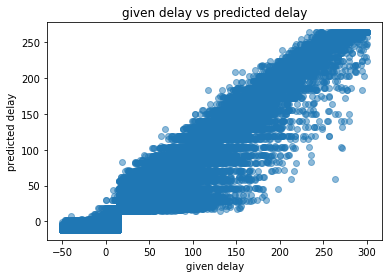

In [51]:
#comparing actual and predicted arraival delay through a scatter plot
import matplotlib.pyplot as plt
plt.scatter(yTest, predicted, alpha=0.5)
plt.title('given delay vs predicted delay')
plt.xlabel('given delay')
plt.ylabel('predicted delay')
plt.show()